# Robert Ramji - NANO281 Lab 2 
## doing actual data science!

In [163]:
import pandas as pd
import numpy as np
import seaborn as sns
import pymatgen as mp
from pprint import pprint

## Question 1

In [2]:
orig_data = pd.read_csv("./class_repo/labs/lab2/data.csv", na_filter=False)
orig_data.head()

,task_id,formula,formation_energy_per_atom,e_above_hull,band_gap,has_bandstructure
0,mp-1007923,CrNi3,-0.016354,0.000802,0.0,False
1,mp-1008754,TbHg2,-0.069428,0.329909,0.0,True
2,mp-1016886,MgVO3,-2.241438,0.545977,0.0,True
3,mp-1018902,PrSbPt,-1.111238,0.000000,0.0,True
4,mp-1020595,Rb8PO3,-0.772860,0.491666,0.0,True


**1.1 How many elements?**

In [3]:
orig_data.shape

(124515, 6)

In [4]:
orig_data.describe(include="all")

,task_id,formula,formation_energy_per_atom,e_above_hull,band_gap,has_bandstructure
count,124515,124515,124515.000000,124515.000000,124515.000000,124515
unique,124515,89466,NaN,NaN,NaN,2
top,mp-764888,Li9Mn2Co5O16,NaN,NaN,NaN,False
freq,1,689,NaN,NaN,NaN,71688
mean,NaN,NaN,-1.410472,0.148873,1.075733,NaN
std,NaN,NaN,1.211580,0.420030,1.525219,NaN
min,NaN,NaN,-4.618361,0.000000,0.000000,NaN
25%,NaN,NaN,-2.408562,0.000000,0.000000,NaN
50%,NaN,NaN,-1.438384,0.030278,0.110600,NaN
75%,NaN,NaN,-0.459684,0.101252,1.900000,NaN


In [5]:
orig_data['formula'].describe()

count           124515
unique           89466
top       Li9Mn2Co5O16
freq               689
Name: formula, dtype: object

In [6]:
orig_data['composition'] = [mp.Composition(c) for c in orig_data['formula']]

In [7]:
holder1 = 'abc'
for i in orig_data['formula']:
    if len(holder1) < len(i):
        holder1 = i
print(holder1)

K4Ba2Na4Ti8MnSi16(W4O29)2


In [8]:
holder1 = 'abc'
for i in orig_data['formula']:
    if len(holder1) > len(i):
        holder1 = i
print(holder1)

U


In [9]:
orig_data['composition']

0                    (Cr, Ni)
1                    (Tb, Hg)
2                  (Mg, V, O)
3                (Pr, Sb, Pt)
4                  (Rb, P, O)
                 ...         
124510            (Zn, Mo, O)
124511             (Mg, V, O)
124512            (Ca, Co, O)
124513     (Ca, La, Cr, W, O)
124514    (Ca, La, Cr, Sn, O)
Name: composition, Length: 124515, dtype: object

In [10]:
orig_data['n_el'] = [len(i) for i in orig_data['composition']]

**1.2: Max elements in single structure?**

Answer is 9

In [11]:
orig_data['n_el'].describe()

count    124515.000000
mean          3.319062
std           0.905356
min           1.000000
25%           3.000000
50%           3.000000
75%           4.000000
max           9.000000
Name: n_el, dtype: float64

**1.3 Plot distribution of #elements per structure in the dataset**

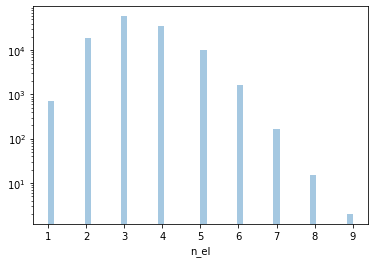

In [12]:
ax = sns.distplot(orig_data['n_el'], kde=False)
ax.set_yscale('log')

**1.4 Finding 10 most common and 10 least commonly occuring elements in compounds**

In [13]:
#instantiate the dictionary
element_occurrences = {}
# look through every entry in the composition column
for comp in orig_data['composition']:
    #look through every element in each composition
    for element in comp:
        #if we haven't seen this element before, add it to our dictionary
        #and set the count equal to 1 (first occurence!)
        if element not in element_occurrences:
            element_occurrences[element] = 1
        # if we've seen it before, add another occurence to the count
        elif element in element_occurrences:
            # add 1 to the count of the element
            element_occurrences[element] += 1
            # element_occurrences[element] = element_occurrences[element] + 1

In [222]:
#pprint(element_occurrences)

In [15]:
for i in element_occurrences:
    element_occurrences[i] = [element_occurrences[i]]
orig_data_elements = pd.DataFrame(element_occurrences)
df = orig_data_elements.T
df['count'] = df[0]
df = df.drop(0, axis=1)
df = df.sort_values(by=['count'])

**10 least commonly occuring elements, number of occurences in compounds**

In [16]:
df.head(10)

,count
Ne,1
Ar,2
He,8
Kr,15
Xe,147
Pa,253
Ac,297
Np,340
Pu,388
Pm,515


**10 most commonly occuring elements, number of occurences in compounds**

In [17]:
df.tail(10)

,count
Mg,8711
Si,8940
F,9606
N,9723
Fe,10109
S,10516
Mn,11233
P,13321
Li,18580
O,60428


## Question 2

Define functions for taking average elemental properties of compounds in the orig_data dataset

For a single, specified property from element_data:

In [224]:
# requires compound to be a pymatgen Composition object
# element_data is a table of elemental properties
# returns a float value of the averaged elemental property...
# ...for the input compound
def get_average_property(compound, prop, element_data):
    avg = 0
    total = 0
    c = compound.to_data_dict['reduced_cell_composition']
    for el in c:
        avg += element_data.loc[el, prop]*c[el]
        total += c[el]
    avg = avg/total
    
    return avg

For a series of all properties in element_data:

In [174]:
# requires compound to be a pymatgen Composition object
# element_data is a table of elemental properties
# returns a pandas series object of averaged elemental properties...
# ...for the input compound
def get_average_properties(compound, element_data):
    avg = 0
    total = 0
    c = compound.to_data_dict['reduced_cell_composition']
    for el in c:
        avg += element_data.loc[el, :]*c[el]
        total += c[el]
    avg = avg/total
    
    return avg

Return a series of all the maximum elemental property values for a given compound:

In [260]:
def get_maximum_properties(compound, element_data):
    elements = compound.to_data_dict['elements']
    return np.max(element_data.loc[elements, :])

Return a series of all the minimum elemental property values for a given compound:

In [265]:
def get_minimum_properties(compound, element_data):
    elements = compound.to_data_dict['elements']
    return np.min(element_data.loc[elements, :])

In [250]:
orig_data['contains_noble_gas'] = [i.contains_element_type('noble_gas') for i in orig_data['composition']]

**2.1 how many compounds have noble gases in them? take them out.**

In [20]:
data = orig_data[orig_data['contains_noble_gas']]

In [21]:
orig_data_ignoble = orig_data[orig_data['contains_noble_gas'] == False]

In [238]:
print('original:', len(orig_data), '| without noble gases:', len(orig_data_ignoble), 
      '\ndifference:',len(orig_data)-len(orig_data_ignoble))

original: 124515 | without noble gases: 124342 
difference: 173


In [24]:
orig_data.shape

(124515, 9)

*set unique identifier 'task_id' as the index of our df*

In [220]:
clean_df = orig_data_ignoble.set_index(orig_data_ignoble['task_id']).drop('task_id', axis=1)
clean_df

,formula,formation_energy_per_atom,e_above_hull,band_gap,has_bandstructure,composition,n_el,contains_noble_gas
task_id,,,,,,,,
mp-1007923,CrNi3,-0.016354,0.000802,0.0000,False,"(Cr, Ni)",2,False
mp-1008754,TbHg2,-0.069428,0.329909,0.0000,True,"(Tb, Hg)",2,False
mp-1016886,MgVO3,-2.241438,0.545977,0.0000,True,"(Mg, V, O)",3,False
mp-1018902,PrSbPt,-1.111238,0.000000,0.0000,True,"(Pr, Sb, Pt)",3,False
mp-1020595,Rb8PO3,-0.772860,0.491666,0.0000,True,"(Rb, P, O)",3,False
...,...,...,...,...,...,...,...,...
mvc-9995,Zn(MoO2)2,-1.774105,0.170001,0.6809,True,"(Zn, Mo, O)",3,False
mvc-9996,MgV2O4,-2.669536,0.053871,1.4898,True,"(Mg, V, O)",3,False
mvc-9997,Ca(CoO2)2,-1.777514,0.161485,0.0000,True,"(Ca, Co, O)",3,False


**2.2 Load element properties. How many NaN in each column?**

In [25]:
element_data = pd.read_csv("./class_repo/labs/lab2/element_properties.csv", index_col=0)

In [26]:
element_data.isna().sum()

AtomicRadius               7
AtomicVolume               2
AtomicWeight               0
BulkModulus               26
BoilingT                   2
Column                     0
CovalentRadius             0
Density                    2
ElectronAffinity           9
Electronegativity          4
FirstIonizationEnergy      1
HeatCapacityMass          10
Row                        0
phi                       22
SecondIonizationEnergy    12
ShearModulus              34
dtype: int64

## 2.3 
**Compute the means of each column.**

**Fill NaNs with the mean of the column they belong to.**

In [27]:
element_data.describe()

,AtomicRadius,AtomicVolume,AtomicWeight,BulkModulus,BoilingT,Column,CovalentRadius,Density,ElectronAffinity,Electronegativity,FirstIonizationEnergy,HeatCapacityMass,Row,phi,SecondIonizationEnergy,ShearModulus
count,88.000000,93.000000,95.000000,69.000000,93.000000,95.000000,95.000000,93.000000,86.000000,91.000000,94.000000,85.000000,95.000000,73.000000,83.000000,61.000000
mean,1.500682,3426.442121,116.153896,90.794203,2549.858065,8.315789,151.810526,7489.235725,76.162209,1.747033,8.094711,0.635447,4.831579,4.034247,18.947504,47.362295
std,0.403954,9869.341789,71.969479,95.957835,1591.157210,5.838725,44.510648,5921.990631,80.643656,0.645836,3.441865,1.651877,1.527427,1.061636,10.220245,53.450460
min,0.250000,7.297767,1.007940,1.100000,4.070000,1.000000,28.000000,0.089900,0.000000,0.700000,3.893905,0.094000,1.000000,1.950000,10.003830,1.300000
25%,1.350000,17.075648,53.467073,28.000000,1180.000000,3.000000,127.000000,2460.000000,21.075000,1.235000,5.989151,0.168000,4.000000,3.210000,12.133000,16.000000
50%,1.450000,28.214122,112.411000,45.000000,2792.000000,7.000000,146.000000,7010.000000,50.000000,1.650000,7.314710,0.244000,5.000000,4.050000,16.630000,27.000000
75%,1.800000,37.740406,176.728400,140.000000,3618.000000,14.000000,190.000000,10070.000000,105.375000,2.185000,8.987120,0.489000,6.000000,4.800000,20.471725,48.000000
max,2.600000,37887.799548,244.000000,380.000000,5869.000000,18.000000,260.000000,22590.000000,349.000000,3.980000,24.587387,14.304000,7.000000,6.860000,75.640000,222.000000


In [28]:
element_data = element_data.fillna(element_data.mean())

In [29]:
element_data.isna().any()

AtomicRadius              False
AtomicVolume              False
AtomicWeight              False
BulkModulus               False
BoilingT                  False
Column                    False
CovalentRadius            False
Density                   False
ElectronAffinity          False
Electronegativity         False
FirstIonizationEnergy     False
HeatCapacityMass          False
Row                       False
phi                       False
SecondIonizationEnergy    False
ShearModulus              False
dtype: bool

## 2.4

**Compute the composition-averaged AtomicRadius for all materials**

In [226]:
## SLOW VERSION ##

# avg_sizes = {}
# radius = element_data['AtomicRadius']
# comps = orig_data['composition']
# counter = 0

# for compound in comp:
#     if compound not in avg_sizes:
#         counter += 1
#         print(compound, " progress", counter/len(comp))
#         avg_sizes[compound] = 0
#         for el in compound:
#             frac = compound.get_atomic_fraction(el)
#             size = frac * radius[str(el)]
#             avg_sizes[compound] += size

In [227]:
fast_sizes = {}
#progress = lambda a: a/len(clean_df)
#counter = 0
for i in clean_df.index:
    avg = get_average_property(clean_df.loc[i, 'composition'], 'AtomicRadius', element_data)
    fast_sizes[i] = avg
    #counter += 1
    #print(progress(counter))

8.042334850653843e-06
1.6084669701307685e-05
2.4127004551961524e-05
3.216933940261537e-05
4.021167425326921e-05
4.825400910392305e-05
5.6296343954576895e-05
6.433867880523074e-05
7.238101365588458e-05
8.042334850653842e-05
8.846568335719226e-05
9.65080182078461e-05
0.00010455035305849995
0.00011259268790915379
0.00012063502275980763
0.00012867735761046148
0.00013671969246111532
0.00014476202731176916
0.000152804362162423
0.00016084669701307684
0.00016888903186373068
0.00017693136671438452
0.00018497370156503836
0.0001930160364156922
0.00020105837126634603
0.0002091007061169999
0.00021714304096765374
0.00022518537581830758
0.00023322771066896142
0.00024127004551961526
0.0002493123803702691
0.00025735471522092296
0.0002653970500715768
0.00027343938492223064
0.00028148171977288445
0.0002895240546235383
0.00029756638947419213
0.000305608724324846
0.0003136510591754998
0.0003216933940261537
0.0003297357288768075
0.00033777806372746135
0.0003458203985781152
0.00035386273342876903
0.000361905

0.005806565762172074
0.005814608097022727
0.005822650431873381
0.005830692766724035
0.005838735101574689
0.005846777436425343
0.005854819771275997
0.005862862106126651
0.005870904440977305
0.005878946775827959
0.0058869891106786126
0.0058950314455292665
0.0059030737803799195
0.0059111161152305735
0.005919158450081227
0.005927200784931881
0.005935243119782535
0.005943285454633189
0.005951327789483843
0.005959370124334497
0.005967412459185151
0.005975454794035805
0.005983497128886459
0.005991539463737112
0.005999581798587766
0.00600762413343842
0.0060156664682890736
0.0060237088031397275
0.006031751137990381
0.006039793472841035
0.006047835807691689
0.006055878142542343
0.006063920477392997
0.006071962812243651
0.006080005147094304
0.006088047481944958
0.006096089816795612
0.006104132151646266
0.00611217448649692
0.006120216821347574
0.006128259156198228
0.0061363014910488815
0.006144343825899535
0.006152386160750189
0.006160428495600843
0.006168470830451496
0.00617651316530215
0.0061845

0.011339692139421917
0.01134773447427257
0.011355776809123225
0.011363819143973879
0.011371861478824533
0.011379903813675186
0.01138794614852584
0.011395988483376494
0.011404030818227148
0.011412073153077802
0.011420115487928456
0.01142815782277911
0.011436200157629762
0.011444242492480416
0.01145228482733107
0.011460327162181724
0.011468369497032378
0.011476411831883032
0.011484454166733686
0.01149249650158434
0.011500538836434994
0.011508581171285647
0.011516623506136301
0.011524665840986955
0.01153270817583761
0.011540750510688263
0.011548792845538917
0.011556835180389571
0.011564877515240225
0.011572919850090879
0.011580962184941533
0.011589004519792187
0.01159704685464284
0.011605089189493495
0.011613131524344148
0.0116211738591948
0.011629216194045455
0.011637258528896108
0.011645300863746762
0.011653343198597416
0.01166138553344807
0.011669427868298724
0.011677470203149378
0.011685512538000032
0.011693554872850686
0.01170159720770134
0.011709639542551994
0.011717681877402648
0.0

0.017717263675990413
0.017725306010841067
0.01773334834569172
0.017741390680542375
0.01774943301539303
0.017757475350243683
0.017765517685094337
0.01777356001994499
0.017781602354795645
0.0177896446896463
0.017797687024496953
0.017805729359347607
0.01781377169419826
0.017821814029048914
0.01782985636389957
0.017837898698750222
0.017845941033600876
0.01785398336845153
0.017862025703302184
0.017870068038152838
0.017878110373003492
0.017886152707854146
0.0178941950427048
0.017902237377555454
0.017910279712406104
0.017918322047256758
0.017926364382107412
0.017934406716958066
0.01794244905180872
0.017950491386659374
0.017958533721510028
0.01796657605636068
0.017974618391211335
0.01798266072606199
0.017990703060912643
0.017998745395763297
0.01800678773061395
0.018014830065464605
0.01802287240031526
0.018030914735165913
0.018038957070016567
0.01804699940486722
0.018055041739717875
0.01806308407456853
0.018071126409419182
0.018079168744269836
0.01808721107912049
0.018095253413971144
0.01810329

0.02375705714883145
0.023765099483682103
0.023773141818532757
0.02378118415338341
0.023789226488234064
0.02379726882308472
0.023805311157935372
0.023813353492786026
0.02382139582763668
0.023829438162487334
0.023837480497337988
0.023845522832188642
0.023853565167039296
0.02386160750188995
0.023869649836740604
0.023877692171591258
0.02388573450644191
0.023893776841292565
0.02390181917614322
0.023909861510993873
0.023917903845844527
0.02392594618069518
0.023933988515545835
0.023942030850396485
0.02395007318524714
0.023958115520097793
0.023966157854948447
0.0239742001897991
0.023982242524649755
0.02399028485950041
0.023998327194351063
0.024006369529201717
0.02401441186405237
0.024022454198903025
0.02403049653375368
0.024038538868604332
0.024046581203454986
0.02405462353830564
0.024062665873156294
0.024070708208006948
0.024078750542857602
0.024086792877708256
0.02409483521255891
0.024102877547409564
0.024110919882260218
0.02411896221711087
0.024127004551961526
0.02413504688681218
0.02414308

0.0293062681957826
0.029314310530633252
0.029322352865483906
0.02933039520033456
0.029338437535185214
0.029346479870035868
0.029354522204886522
0.029362564539737176
0.02937060687458783
0.029378649209438484
0.029386691544289138
0.02939473387913979
0.029402776213990445
0.0294108185488411
0.029418860883691753
0.029426903218542407
0.02943494555339306
0.029442987888243715
0.02945103022309437
0.029459072557945023
0.029467114892795677
0.02947515722764633
0.029483199562496985
0.02949124189734764
0.029499284232198292
0.029507326567048946
0.0295153689018996
0.029523411236750254
0.029531453571600908
0.029539495906451562
0.029547538241302216
0.02955558057615287
0.029563622911003524
0.029571665245854178
0.02957970758070483
0.029587749915555486
0.02959579225040614
0.029603834585256793
0.029611876920107444
0.029619919254958098
0.02962796158980875
0.029636003924659406
0.02964404625951006
0.029652088594360713
0.029660130929211367
0.02966817326406202
0.029676215598912675
0.02968425793376333
0.0296923002

0.03483135223818179
0.034839394573032444
0.0348474369078831
0.03485547924273375
0.034863521577584405
0.03487156391243506
0.03487960624728571
0.03488764858213637
0.03489569091698702
0.034903733251837675
0.03491177558668833
0.03491981792153898
0.03492786025638964
0.03493590259124029
0.034943944926090945
0.0349519872609416
0.03496002959579225
0.034968071930642906
0.03497611426549356
0.034984156600344214
0.03499219893519487
0.03500024127004552
0.035008283604896176
0.03501632593974683
0.035024368274597484
0.03503241060944814
0.03504045294429879
0.035048495279149446
0.0350565376140001
0.03506457994885075
0.03507262228370141
0.03508066461855206
0.035088706953402715
0.03509674928825337
0.03510479162310402
0.03511283395795467
0.035120876292805324
0.03512891862765598
0.03513696096250663
0.035145003297357286
0.03515304563220794
0.035161087967058594
0.03516913030190925
0.0351771726367599
0.035185214971610555
0.03519325730646121
0.03520129964131186
0.03520934197616252
0.03521738431101317
0.03522542

0.040477071303340786
0.04048511363819144
0.040493155973042094
0.04050119830789275
0.0405092406427434
0.040517282977594056
0.04052532531244471
0.040533367647295364
0.04054140998214602
0.04054945231699667
0.040557494651847326
0.04056553698669798
0.04057357932154863
0.04058162165639929
0.04058966399124994
0.040597706326100595
0.04060574866095125
0.0406137909958019
0.04062183333065256
0.04062987566550321
0.040637918000353865
0.04064596033520452
0.04065400267005517
0.04066204500490583
0.04067008733975648
0.040678129674607134
0.04068617200945779
0.04069421434430844
0.040702256679159096
0.04071029901400975
0.040718341348860404
0.04072638368371106
0.04073442601856171
0.040742468353412366
0.04075051068826302
0.040758553023113674
0.04076659535796433
0.04077463769281498
0.04078268002766563
0.04079072236251628
0.040798764697366936
0.04080680703221759
0.040814849367068244
0.0408228917019189
0.04083093403676955
0.040838976371620206
0.04084701870647086
0.040855061041321514
0.04086310337617217
0.04087

0.04628363706551286
0.046291679400363515
0.04629972173521417
0.04630776407006482
0.04631580640491548
0.04632384873976613
0.046331891074616785
0.04633993340946744
0.04634797574431809
0.04635601807916875
0.0463640604140194
0.046372102748870055
0.04638014508372071
0.04638818741857136
0.046396229753422016
0.04640427208827267
0.046412314423123324
0.04642035675797398
0.04642839909282463
0.046436441427675286
0.04644448376252594
0.046452526097376594
0.04646056843222724
0.046468610767077895
0.04647665310192855
0.0464846954367792
0.046492737771629856
0.04650078010648051
0.046508822441331164
0.04651686477618182
0.04652490711103247
0.046532949445883126
0.04654099178073378
0.046549034115584434
0.04655707645043509
0.04656511878528574
0.046573161120136396
0.04658120345498705
0.046589245789837704
0.04659728812468836
0.04660533045953901
0.046613372794389665
0.04662141512924032
0.04662945746409097
0.04663749979894163
0.04664554213379228
0.046653584468642935
0.04666162680349359
0.04666966913834424
0.0466

0.052162583841340815
0.05217062617619147
0.05217866851104212
0.05218671084589278
0.05219475318074343
0.052202795515594085
0.05221083785044474
0.05221888018529539
0.052226922520146046
0.0522349648549967
0.052243007189847354
0.05225104952469801
0.05225909185954866
0.052267134194399316
0.05227517652924997
0.052283218864100624
0.05229126119895128
0.05229930353380193
0.052307345868652586
0.05231538820350324
0.05232343053835389
0.05233147287320455
0.0523395152080552
0.052347557542905855
0.05235559987775651
0.05236364221260716
0.05237168454745782
0.05237972688230847
0.052387769217159125
0.05239581155200978
0.05240385388686043
0.052411896221711086
0.05241993855656174
0.052427980891412394
0.05243602322626305
0.0524440655611137
0.052452107895964356
0.05246015023081501
0.052468192565665664
0.05247623490051632
0.05248427723536697
0.052492319570217626
0.05250036190506828
0.052508404239918934
0.05251644657476959
0.05252448890962024
0.052532531244470895
0.05254057357932155
0.0525486159141722
0.052556

0.05804957295201943
0.05805761528687008
0.05806565762172074
0.05807369995657139
0.058081742291422045
0.0580897846262727
0.05809782696112335
0.05810586929597401
0.05811391163082466
0.058121953965675315
0.05812999630052597
0.05813803863537662
0.058146080970227276
0.05815412330507793
0.058162165639928584
0.05817020797477924
0.05817825030962989
0.058186292644480546
0.0581943349793312
0.058202377314181854
0.05821041964903251
0.05821846198388316
0.058226504318733815
0.05823454665358447
0.05824258898843512
0.05825063132328578
0.05825867365813643
0.058266715992987085
0.05827475832783774
0.05828280066268839
0.05829084299753905
0.0582988853323897
0.058306927667240355
0.05831497000209101
0.05832301233694166
0.058331054671792316
0.05833909700664297
0.058347139341493624
0.05835518167634428
0.05836322401119493
0.058371266346045586
0.05837930868089624
0.058387351015746894
0.05839539335059755
0.0584034356854482
0.058411478020298856
0.05841952035514951
0.058427562690000164
0.05843560502485082
0.0584436

0.06379180003538627
0.06379984237023693
0.06380788470508758
0.06381592703993824
0.06382396937478889
0.06383201170963954
0.0638400540444902
0.06384809637934084
0.0638561387141915
0.06386418104904215
0.06387222338389281
0.06388026571874346
0.06388830805359412
0.06389635038844477
0.06390439272329543
0.06391243505814607
0.06392047739299674
0.06392851972784738
0.06393656206269804
0.06394460439754869
0.06395264673239935
0.06396068906725
0.06396873140210066
0.0639767737369513
0.06398481607180197
0.06399285840665261
0.06400090074150327
0.06400894307635392
0.06401698541120458
0.06402502774605523
0.06403307008090589
0.06404111241575654
0.0640491547506072
0.06405719708545785
0.0640652394203085
0.06407328175515915
0.06408132409000981
0.06408936642486046
0.06409740875971112
0.06410545109456177
0.06411349342941243
0.06412153576426308
0.06412957809911374
0.06413762043396438
0.06414566276881505
0.06415370510366569
0.06416174743851635
0.064169789773367
0.06417783210821766
0.06418587444306831
0.06419391

0.06907561403226585
0.0690836563671165
0.06909169870196716
0.0690997410368178
0.06910778337166847
0.06911582570651911
0.06912386804136977
0.06913191037622042
0.06913995271107108
0.06914799504592173
0.06915603738077239
0.06916407971562304
0.0691721220504737
0.06918016438532434
0.069188206720175
0.06919624905502565
0.06920429138987631
0.06921233372472696
0.06922037605957762
0.06922841839442827
0.06923646072927893
0.06924450306412958
0.06925254539898024
0.06926058773383088
0.06926863006868154
0.06927667240353219
0.06928471473838285
0.0692927570732335
0.06930079940808416
0.0693088417429348
0.06931688407778547
0.06932492641263611
0.06933296874748678
0.06934101108233742
0.06934905341718808
0.06935709575203873
0.06936513808688939
0.06937318042174004
0.0693812227565907
0.06938926509144135
0.06939730742629201
0.06940534976114265
0.06941339209599331
0.06942143443084396
0.06942947676569462
0.06943751910054527
0.06944556143539593
0.06945360377024658
0.06946164610509724
0.06946968843994789
0.069477

0.07497868781264577
0.07498673014749642
0.07499477248234708
0.07500281481719773
0.07501085715204839
0.07501889948689903
0.0750269418217497
0.07503498415660034
0.075043026491451
0.07505106882630165
0.07505911116115231
0.07506715349600296
0.07507519583085362
0.07508323816570427
0.07509128050055493
0.07509932283540557
0.07510736517025624
0.07511540750510688
0.07512344983995754
0.07513149217480819
0.07513953450965885
0.0751475768445095
0.07515561917936016
0.0751636615142108
0.07517170384906147
0.07517974618391211
0.07518778851876276
0.07519583085361342
0.07520387318846407
0.07521191552331473
0.07521995785816538
0.07522800019301604
0.07523604252786668
0.07524408486271734
0.07525212719756799
0.07526016953241865
0.0752682118672693
0.07527625420211996
0.07528429653697061
0.07529233887182127
0.07530038120667192
0.07530842354152258
0.07531646587637322
0.07532450821122388
0.07533255054607453
0.07534059288092519
0.07534863521577584
0.0753566775506265
0.07536471988547715
0.07537276222032781
0.07538

0.08067266088690869
0.08068070322175934
0.08068874555661
0.08069678789146065
0.08070483022631131
0.08071287256116196
0.08072091489601262
0.08072895723086326
0.08073699956571392
0.08074504190056457
0.08075308423541523
0.08076112657026588
0.08076916890511654
0.08077721123996719
0.08078525357481785
0.0807932959096685
0.08080133824451916
0.0808093805793698
0.08081742291422046
0.08082546524907111
0.08083350758392177
0.08084154991877242
0.08084959225362308
0.08085763458847373
0.08086567692332437
0.08087371925817503
0.08088176159302568
0.08088980392787634
0.08089784626272699
0.08090588859757765
0.0809139309324283
0.08092197326727896
0.0809300156021296
0.08093805793698026
0.08094610027183091
0.08095414260668157
0.08096218494153222
0.08097022727638288
0.08097826961123353
0.08098631194608419
0.08099435428093484
0.0810023966157855
0.08101043895063614
0.0810184812854868
0.08102652362033745
0.08103456595518811
0.08104260829003876
0.08105065062488942
0.08105869295974007
0.08106673529459073
0.0810747

0.08636663396117161
0.08637467629602226
0.08638271863087292
0.08639076096572357
0.08639880330057423
0.08640684563542488
0.08641488797027554
0.08642293030512618
0.08643097263997684
0.08643901497482749
0.08644705730967815
0.0864550996445288
0.08646314197937946
0.0864711843142301
0.08647922664908077
0.08648726898393141
0.08649531131878208
0.08650335365363272
0.08651139598848338
0.08651943832333403
0.08652748065818468
0.08653552299303534
0.08654356532788599
0.08655160766273665
0.08655964999758729
0.08656769233243795
0.0865757346672886
0.08658377700213926
0.08659181933698991
0.08659986167184057
0.08660790400669122
0.08661594634154188
0.08662398867639252
0.08663203101124319
0.08664007334609383
0.08664811568094449
0.08665615801579514
0.0866642003506458
0.08667224268549645
0.08668028502034711
0.08668832735519776
0.08669636969004842
0.08670441202489906
0.08671245435974972
0.08672049669460037
0.08672853902945103
0.08673658136430168
0.08674462369915234
0.08675266603400299
0.08676070836885365
0.08

0.09233404642035675
0.09234208875520741
0.09235013109005806
0.09235817342490872
0.09236621575975937
0.09237425809461003
0.09238230042946068
0.09239034276431134
0.09239838509916198
0.09240642743401264
0.09241446976886329
0.09242251210371395
0.0924305544385646
0.09243859677341526
0.09244663910826591
0.09245468144311657
0.09246272377796722
0.09247076611281788
0.09247880844766852
0.09248685078251918
0.09249489311736983
0.09250293545222049
0.09251097778707114
0.0925190201219218
0.09252706245677245
0.09253510479162311
0.09254314712647375
0.09255118946132442
0.09255923179617506
0.09256727413102572
0.09257531646587637
0.09258335880072703
0.09259140113557768
0.09259944347042834
0.09260748580527899
0.09261552814012965
0.0926235704749803
0.09263161280983095
0.0926396551446816
0.09264769747953226
0.09265573981438291
0.09266378214923357
0.09267182448408422
0.09267986681893488
0.09268790915378552
0.09269595148863619
0.09270399382348683
0.0927120361583375
0.09272007849318814
0.0927281208280388
0.0927

0.09806823116887295
0.0980762735037236
0.09808431583857426
0.0980923581734249
0.09810040050827556
0.09810844284312621
0.09811648517797687
0.09812452751282752
0.09813256984767818
0.09814061218252883
0.09814865451737949
0.09815669685223014
0.0981647391870808
0.09817278152193144
0.0981808238567821
0.09818886619163275
0.09819690852648341
0.09820495086133406
0.09821299319618472
0.09822103553103537
0.09822907786588603
0.09823712020073667
0.09824516253558734
0.09825320487043798
0.09826124720528864
0.09826928954013929
0.09827733187498995
0.0982853742098406
0.09829341654469126
0.0983014588795419
0.09830950121439257
0.09831754354924321
0.09832558588409387
0.09833362821894452
0.09834167055379518
0.09834971288864583
0.09835775522349649
0.09836579755834714
0.0983738398931978
0.09838188222804845
0.0983899245628991
0.09839796689774975
0.09840600923260041
0.09841405156745106
0.09842209390230172
0.09843013623715237
0.09843817857200303
0.09844622090685368
0.09845426324170434
0.09846230557655498
0.098470

0.10396326261440221
0.10397130494925287
0.10397934728410352
0.10398738961895418
0.10399543195380483
0.10400347428865549
0.10401151662350613
0.1040195589583568
0.10402760129320744
0.1040356436280581
0.10404368596290875
0.10405172829775941
0.10405977063261006
0.10406781296746072
0.10407585530231137
0.10408389763716203
0.10409193997201267
0.10409998230686333
0.10410802464171398
0.10411606697656464
0.10412410931141529
0.10413215164626595
0.1041401939811166
0.10414823631596726
0.1041562786508179
0.10416432098566857
0.10417236332051921
0.10418040565536987
0.10418844799022052
0.10419649032507118
0.10420453265992183
0.10421257499477249
0.10422061732962314
0.1042286596644738
0.10423670199932444
0.1042447443341751
0.10425278666902575
0.1042608290038764
0.10426887133872706
0.1042769136735777
0.10428495600842837
0.10429299834327901
0.10430104067812968
0.10430908301298032
0.10431712534783098
0.10432516768268163
0.10433321001753229
0.10434125235238294
0.1043492946872336
0.10435733702208425
0.1043653

0.10967332035836644
0.1096813626932171
0.10968940502806775
0.10969744736291841
0.10970548969776905
0.10971353203261971
0.10972157436747036
0.10972961670232102
0.10973765903717167
0.10974570137202233
0.10975374370687298
0.10976178604172364
0.10976982837657429
0.10977787071142495
0.1097859130462756
0.10979395538112625
0.1098019977159769
0.10981004005082756
0.10981808238567821
0.10982612472052887
0.10983416705537952
0.10984220939023018
0.10985025172508082
0.10985829405993149
0.10986633639478213
0.1098743787296328
0.10988242106448344
0.1098904633993341
0.10989850573418475
0.10990654806903541
0.10991459040388606
0.10992263273873672
0.10993067507358736
0.10993871740843801
0.10994675974328867
0.10995480207813932
0.10996284441298998
0.10997088674784063
0.10997892908269129
0.10998697141754193
0.1099950137523926
0.11000305608724324
0.1100110984220939
0.11001914075694455
0.11002718309179521
0.11003522542664586
0.11004326776149652
0.11005131009634717
0.11005935243119783
0.11006739476604847
0.11007

0.1154638014508372
0.11547184378568787
0.11547988612053851
0.11548792845538917
0.11549597079023982
0.11550401312509048
0.11551205545994113
0.11552009779479179
0.11552814012964244
0.1155361824644931
0.11554422479934374
0.1155522671341944
0.11556030946904505
0.11556835180389571
0.11557639413874636
0.11558443647359702
0.11559247880844767
0.11560052114329833
0.11560856347814898
0.11561660581299962
0.11562464814785028
0.11563269048270093
0.11564073281755159
0.11564877515240224
0.1156568174872529
0.11566485982210355
0.11567290215695421
0.11568094449180485
0.11568898682665552
0.11569702916150616
0.11570507149635682
0.11571311383120747
0.11572115616605813
0.11572919850090878
0.11573724083575944
0.11574528317061009
0.11575332550546075
0.1157613678403114
0.11576941017516205
0.1157774525100127
0.11578549484486336
0.11579353717971401
0.11580157951456467
0.11580962184941532
0.11581766418426598
0.11582570651911663
0.11583374885396729
0.11584179118881793
0.1158498335236686
0.11585787585851924
0.11586

0.12201026201926943
0.12201830435412009
0.12202634668897074
0.1220343890238214
0.12204243135867204
0.1220504736935227
0.12205851602837335
0.12206655836322401
0.12207460069807466
0.12208264303292532
0.12209068536777597
0.12209872770262663
0.12210677003747727
0.12211481237232794
0.12212285470717858
0.12213089704202924
0.12213893937687989
0.12214698171173055
0.1221550240465812
0.12216306638143186
0.1221711087162825
0.12217915105113317
0.12218719338598381
0.12219523572083447
0.12220327805568512
0.12221132039053578
0.12221936272538643
0.12222740506023709
0.12223544739508774
0.1222434897299384
0.12225153206478905
0.1222595743996397
0.12226761673449035
0.12227565906934101
0.12228370140419166
0.12229174373904232
0.12229978607389297
0.12230782840874363
0.12231587074359428
0.12232391307844494
0.12233195541329558
0.12233999774814625
0.12234804008299689
0.12235608241784755
0.1223641247526982
0.12237216708754886
0.12238020942239951
0.12238825175725017
0.12239629409210082
0.12240433642695148
0.12241

0.12780878544659086
0.12781682778144152
0.12782487011629215
0.1278329124511428
0.12784095478599347
0.12784899712084413
0.12785703945569477
0.12786508179054543
0.1278731241253961
0.12788116646024675
0.12788920879509738
0.12789725112994804
0.1279052934647987
0.12791333579964936
0.1279213781345
0.12792942046935066
0.12793746280420132
0.12794550513905198
0.1279535474739026
0.12796158980875327
0.12796963214360393
0.1279776744784546
0.12798571681330523
0.1279937591481559
0.12800180148300655
0.1280098438178572
0.12801788615270784
0.1280259284875585
0.12803397082240917
0.12804201315725983
0.12805005549211046
0.12805809782696112
0.12806614016181178
0.12807418249666244
0.12808222483151308
0.12809026716636374
0.1280983095012144
0.12810635183606506
0.1281143941709157
0.12812243650576635
0.128130478840617
0.12813852117546767
0.1281465635103183
0.12815460584516897
0.12816264818001963
0.1281706905148703
0.12817873284972092
0.12818677518457158
0.12819481751942224
0.1282028598542729
0.12821090218912354

0.1333258271541394
0.13333386948899004
0.1333419118238407
0.13334995415869136
0.133357996493542
0.13336603882839265
0.1333740811632433
0.13338212349809397
0.1333901658329446
0.13339820816779527
0.13340625050264593
0.1334142928374966
0.13342233517234722
0.13343037750719788
0.13343841984204854
0.1334464621768992
0.13345450451174984
0.1334625468466005
0.13347058918145116
0.13347863151630182
0.13348667385115245
0.13349471618600312
0.13350275852085378
0.13351080085570444
0.13351884319055507
0.13352688552540573
0.1335349278602564
0.13354297019510705
0.13355101252995769
0.13355905486480835
0.133567097199659
0.13357513953450967
0.1335831818693603
0.13359122420421096
0.13359926653906162
0.13360730887391228
0.13361535120876292
0.13362339354361358
0.13363143587846424
0.1336394782133149
0.13364752054816553
0.1336555628830162
0.13366360521786685
0.13367164755271752
0.13367968988756815
0.1336877322224188
0.13369577455726947
0.13370381689212013
0.13371185922697076
0.13371990156182142
0.13372794389667

0.13859355648131766
0.13860159881616832
0.13860964115101895
0.1386176834858696
0.13862572582072027
0.13863376815557094
0.13864181049042157
0.13864985282527223
0.1386578951601229
0.13866593749497355
0.13867397982982418
0.13868202216467485
0.1386900644995255
0.13869810683437617
0.1387061491692268
0.13871419150407746
0.13872223383892812
0.13873027617377878
0.13873831850862942
0.13874636084348008
0.13875440317833074
0.1387624455131814
0.13877048784803203
0.1387785301828827
0.13878657251773335
0.13879461485258401
0.13880265718743465
0.1388106995222853
0.13881874185713597
0.13882678419198663
0.13883482652683726
0.13884286886168792
0.13885091119653858
0.13885895353138925
0.13886699586623988
0.13887503820109054
0.1388830805359412
0.13889112287079186
0.1388991652056425
0.13890720754049315
0.13891524987534382
0.13892329221019448
0.1389313345450451
0.13893937687989577
0.13894741921474643
0.1389554615495971
0.13896350388444773
0.1389715462192984
0.13897958855414905
0.1389876308889997
0.13899567322

0.14462530761930803
0.1446333499541587
0.14464139228900935
0.14464943462386
0.14465747695871065
0.1446655192935613
0.14467356162841197
0.1446816039632626
0.14468964629811326
0.14469768863296392
0.14470573096781458
0.14471377330266522
0.14472181563751588
0.14472985797236654
0.1447379003072172
0.14474594264206783
0.1447539849769185
0.14476202731176915
0.14477006964661981
0.14477811198147045
0.1447861543163211
0.14479419665117177
0.14480223898602243
0.14481028132087306
0.14481832365572372
0.14482636599057438
0.14483440832542505
0.14484245066027568
0.14485049299512634
0.144858535329977
0.14486657766482766
0.1448746199996783
0.14488266233452896
0.14489070466937962
0.14489874700423028
0.1449067893390809
0.14491483167393157
0.14492287400878223
0.1449309163436329
0.14493895867848353
0.1449470010133342
0.14495504334818485
0.1449630856830355
0.14497112801788614
0.1449791703527368
0.14498721268758746
0.14499525502243812
0.14500329735728876
0.14501133969213942
0.14501938202699008
0.145027424361840

0.15027102668446704
0.1502790690193177
0.15028711135416833
0.150295153689019
0.15030319602386966
0.15031123835872032
0.15031928069357095
0.1503273230284216
0.15033536536327227
0.15034340769812293
0.15035145003297357
0.15035949236782423
0.1503675347026749
0.15037557703752552
0.15038361937237618
0.15039166170722684
0.1503997040420775
0.15040774637692814
0.1504157887117788
0.15042383104662946
0.15043187338148012
0.15043991571633075
0.1504479580511814
0.15045600038603207
0.15046404272088273
0.15047208505573337
0.15048012739058403
0.1504881697254347
0.15049621206028535
0.15050425439513598
0.15051229672998664
0.1505203390648373
0.15052838139968797
0.1505364237345386
0.15054446606938926
0.15055250840423992
0.15056055073909058
0.15056859307394121
0.15057663540879188
0.15058467774364254
0.1505927200784932
0.15060076241334383
0.1506088047481945
0.15061684708304515
0.1506248894178958
0.15063293175274645
0.1506409740875971
0.15064901642244777
0.15065705875729843
0.15066510109214906
0.1506731434269

0.15623039680880152
0.15623843914365218
0.15624648147850284
0.1562545238133535
0.15626256614820414
0.1562706084830548
0.15627865081790546
0.15628669315275612
0.15629473548760675
0.1563027778224574
0.15631082015730807
0.15631886249215873
0.15632690482700937
0.15633494716186003
0.1563429894967107
0.15635103183156135
0.15635907416641198
0.15636711650126264
0.1563751588361133
0.15638320117096396
0.1563912435058146
0.15639928584066526
0.15640732817551592
0.15641537051036658
0.1564234128452172
0.15643145518006787
0.15643949751491854
0.1564475398497692
0.15645558218461983
0.1564636245194705
0.15647166685432115
0.1564797091891718
0.15648775152402244
0.1564957938588731
0.15650383619372377
0.15651187852857443
0.15651992086342506
0.15652796319827572
0.15653600553312638
0.15654404786797704
0.15655209020282768
0.15656013253767834
0.156568174872529
0.15657621720737966
0.1565842595422303
0.15659230187708095
0.1566003442119316
0.15660838654678227
0.1566164288816329
0.15662447121648357
0.15663251355133

0.16213347058918146
0.16214151292403212
0.16214955525888275
0.1621575975937334
0.16216563992858407
0.16217368226343473
0.16218172459828537
0.16218976693313603
0.1621978092679867
0.16220585160283735
0.16221389393768798
0.16222193627253864
0.1622299786073893
0.16223802094223996
0.1622460632770906
0.16225410561194126
0.16226214794679192
0.16227019028164258
0.1622782326164932
0.16228627495134387
0.16229431728619453
0.1623023596210452
0.16231040195589583
0.1623184442907465
0.16232648662559715
0.1623345289604478
0.16234257129529844
0.1623506136301491
0.16235865596499977
0.16236669829985043
0.16237474063470106
0.16238278296955172
0.16239082530440238
0.16239886763925304
0.16240690997410367
0.16241495230895434
0.162422994643805
0.16243103697865563
0.1624390793135063
0.16244712164835695
0.1624551639832076
0.16246320631805825
0.1624712486529089
0.16247929098775957
0.16248733332261023
0.16249537565746086
0.16250341799231152
0.16251146032716218
0.16251950266201284
0.16252754499686348
0.162535587331

0.1682054334014251
0.16821347573627576
0.1682215180711264
0.16822956040597706
0.16823760274082772
0.16824564507567838
0.168253687410529
0.16826172974537967
0.16826977208023033
0.168277814415081
0.16828585674993163
0.1682938990847823
0.16830194141963295
0.1683099837544836
0.16831802608933424
0.1683260684241849
0.16833411075903557
0.16834215309388623
0.16835019542873686
0.16835823776358752
0.16836628009843818
0.16837432243328884
0.16838236476813948
0.16839040710299014
0.1683984494378408
0.16840649177269146
0.1684145341075421
0.16842257644239275
0.1684306187772434
0.16843866111209407
0.1684467034469447
0.16845474578179537
0.16846278811664603
0.1684708304514967
0.16847887278634732
0.16848691512119798
0.16849495745604864
0.1685029997908993
0.16851104212574994
0.1685190844606006
0.16852712679545126
0.16853516913030192
0.16854321146515255
0.16855125380000321
0.16855929613485388
0.16856733846970454
0.16857538080455517
0.16858342313940583
0.1685914654742565
0.16859950780910715
0.168607550143957

0.17403612616814915
0.17404416850299978
0.17405221083785044
0.1740602531727011
0.17406829550755176
0.1740763378424024
0.17408438017725306
0.17409242251210372
0.17410046484695438
0.174108507181805
0.17411654951665567
0.17412459185150633
0.174132634186357
0.17414067652120763
0.1741487188560583
0.17415676119090895
0.1741648035257596
0.17417284586061024
0.1741808881954609
0.17418893053031156
0.17419697286516223
0.17420501520001286
0.17421305753486352
0.17422109986971418
0.17422914220456484
0.17423718453941547
0.17424522687426613
0.1742532692091168
0.17426131154396746
0.1742693538788181
0.17427739621366875
0.1742854385485194
0.17429348088337007
0.1743015232182207
0.17430956555307137
0.17431760788792203
0.1743256502227727
0.17433369255762332
0.17434173489247398
0.17434977722732464
0.1743578195621753
0.17436586189702594
0.1743739042318766
0.17438194656672726
0.17438998890157792
0.17439803123642855
0.1744060735712792
0.17441411590612987
0.17442215824098053
0.17443020057583117
0.174438242910681

0.18016438532434736
0.18017242765919803
0.18018046999404866
0.18018851232889932
0.18019655466374998
0.18020459699860064
0.18021263933345127
0.18022068166830194
0.1802287240031526
0.18023676633800326
0.1802448086728539
0.18025285100770455
0.1802608933425552
0.18026893567740587
0.1802769780122565
0.18028502034710717
0.18029306268195783
0.1803011050168085
0.18030914735165912
0.18031718968650978
0.18032523202136044
0.1803332743562111
0.18034131669106174
0.1803493590259124
0.18035740136076306
0.18036544369561372
0.18037348603046435
0.180381528365315
0.18038957070016567
0.18039761303501634
0.18040565536986697
0.18041369770471763
0.1804217400395683
0.18042978237441895
0.18043782470926958
0.18044586704412025
0.1804539093789709
0.18046195171382157
0.1804699940486722
0.18047803638352286
0.18048607871837352
0.18049412105322418
0.18050216338807482
0.18051020572292548
0.18051824805777614
0.1805262903926268
0.18053433272747743
0.1805423750623281
0.18055041739717875
0.1805584597320294
0.1805665020668

0.18622026346688972
0.18622830580174035
0.186236348136591
0.18624439047144167
0.18625243280629233
0.18626047514114297
0.18626851747599363
0.1862765598108443
0.18628460214569495
0.18629264448054558
0.18630068681539624
0.1863087291502469
0.18631677148509757
0.1863248138199482
0.18633285615479886
0.18634089848964952
0.18634894082450018
0.18635698315935081
0.18636502549420148
0.18637306782905214
0.1863811101639028
0.18638915249875343
0.1863971948336041
0.18640523716845475
0.1864132795033054
0.18642132183815605
0.1864293641730067
0.18643740650785737
0.18644544884270803
0.18645349117755866
0.18646153351240932
0.18646957584725998
0.18647761818211064
0.18648566051696128
0.18649370285181194
0.1865017451866626
0.18650978752151326
0.1865178298563639
0.18652587219121455
0.18653391452606521
0.18654195686091585
0.1865499991957665
0.18655804153061717
0.18656608386546783
0.18657412620031846
0.18658216853516912
0.18659021087001978
0.18659825320487045
0.18660629553972108
0.18661433787457174
0.1866223802

0.19172122050473694
0.19172926283958758
0.19173730517443824
0.1917453475092889
0.19175338984413956
0.1917614321789902
0.19176947451384085
0.19177751684869151
0.19178555918354218
0.1917936015183928
0.19180164385324347
0.19180968618809413
0.1918177285229448
0.19182577085779542
0.19183381319264609
0.19184185552749675
0.1918498978623474
0.19185794019719804
0.1918659825320487
0.19187402486689936
0.19188206720175002
0.19189010953660066
0.19189815187145132
0.19190619420630198
0.19191423654115264
0.19192227887600327
0.19193032121085393
0.1919383635457046
0.19194640588055525
0.1919544482154059
0.19196249055025655
0.1919705328851072
0.19197857521995787
0.1919866175548085
0.19199465988965916
0.19200270222450982
0.19201074455936049
0.19201878689421112
0.19202682922906178
0.19203487156391244
0.1920429138987631
0.19205095623361373
0.1920589985684644
0.19206704090331506
0.19207508323816572
0.19208312557301635
0.192091167907867
0.19209921024271767
0.19210725257756833
0.19211529491241897
0.192123337247

0.19774492930787665
0.19775297164272732
0.19776101397757798
0.19776905631242864
0.19777709864727927
0.19778514098212993
0.1977931833169806
0.19780122565183125
0.19780926798668189
0.19781731032153255
0.1978253526563832
0.19783339499123387
0.1978414373260845
0.19784947966093516
0.19785752199578582
0.19786556433063648
0.19787360666548712
0.19788164900033778
0.19788969133518844
0.19789773367003907
0.19790577600488973
0.1979138183397404
0.19792186067459105
0.1979299030094417
0.19793794534429235
0.197945987679143
0.19795403001399367
0.1979620723488443
0.19797011468369496
0.19797815701854563
0.19798619935339629
0.19799424168824692
0.19800228402309758
0.19801032635794824
0.1980183686927989
0.19802641102764953
0.1980344533625002
0.19804249569735086
0.19805053803220152
0.19805858036705215
0.1980666227019028
0.19807466503675347
0.19808270737160413
0.19809074970645477
0.19809879204130543
0.1981068343761561
0.19811487671100675
0.19812291904585738
0.19813096138070804
0.1981390037155587
0.19814704605

0.2032780556851265
0.20328609801997716
0.20329414035482782
0.20330218268967848
0.2033102250245291
0.20331826735937977
0.20332630969423043
0.2033343520290811
0.20334239436393173
0.2033504366987824
0.20335847903363305
0.2033665213684837
0.20337456370333434
0.203382606038185
0.20339064837303567
0.20339869070788633
0.20340673304273696
0.20341477537758762
0.20342281771243828
0.20343086004728894
0.20343890238213957
0.20344694471699024
0.2034549870518409
0.20346302938669156
0.2034710717215422
0.20347911405639285
0.2034871563912435
0.20349519872609417
0.2035032410609448
0.20351128339579547
0.20351932573064613
0.2035273680654968
0.20353541040034742
0.20354345273519808
0.20355149507004874
0.20355953740489938
0.20356757973975004
0.2035756220746007
0.20358366440945136
0.203591706744302
0.20359974907915265
0.20360779141400331
0.20361583374885397
0.2036238760837046
0.20363191841855527
0.20363996075340593
0.2036480030882566
0.20365604542310722
0.20366408775795788
0.20367213009280855
0.203680172427659

0.20853774267745412
0.20854578501230478
0.2085538273471554
0.20856186968200607
0.20856991201685673
0.2085779543517074
0.20858599668655803
0.2085940390214087
0.20860208135625935
0.20861012369111
0.20861816602596064
0.2086262083608113
0.20863425069566197
0.20864229303051263
0.20865033536536326
0.20865837770021392
0.20866642003506458
0.20867446236991524
0.20868250470476588
0.20869054703961654
0.2086985893744672
0.20870663170931786
0.2087146740441685
0.20872271637901915
0.2087307587138698
0.20873880104872047
0.2087468433835711
0.20875488571842177
0.20876292805327243
0.2087709703881231
0.20877901272297372
0.20878705505782438
0.20879509739267504
0.2088031397275257
0.20881118206237634
0.208819224397227
0.20882726673207766
0.20883530906692832
0.20884335140177895
0.20885139373662961
0.20885943607148028
0.20886747840633094
0.20887552074118157
0.20888356307603223
0.2088916054108829
0.20889964774573355
0.20890769008058419
0.20891573241543485
0.2089237747502855
0.20893181708513617
0.208939859419986

0.2146257901593991
0.21463383249424972
0.21464187482910038
0.21464991716395104
0.2146579594988017
0.21466600183365234
0.214674044168503
0.21468208650335366
0.21469012883820432
0.21469817117305495
0.2147062135079056
0.21471425584275627
0.21472229817760694
0.21473034051245757
0.21473838284730823
0.2147464251821589
0.21475446751700955
0.21476250985186018
0.21477055218671084
0.2147785945215615
0.21478663685641217
0.2147946791912628
0.21480272152611346
0.21481076386096412
0.21481880619581478
0.21482684853066542
0.21483489086551608
0.21484293320036674
0.2148509755352174
0.21485901787006803
0.2148670602049187
0.21487510253976935
0.21488314487462
0.21489118720947065
0.2148992295443213
0.21490727187917197
0.2149153142140226
0.21492335654887326
0.21493139888372392
0.21493944121857458
0.21494748355342522
0.21495552588827588
0.21496356822312654
0.2149716105579772
0.21497965289282783
0.2149876952276785
0.21499573756252915
0.21500377989737982
0.21501182223223045
0.2150198645670811
0.2150279069019317

0.22077817632014926
0.22078621865499992
0.22079426098985058
0.22080230332470122
0.22081034565955188
0.22081838799440254
0.2208264303292532
0.22083447266410383
0.2208425149989545
0.22085055733380515
0.22085859966865581
0.22086664200350645
0.2208746843383571
0.22088272667320777
0.22089076900805843
0.22089881134290906
0.22090685367775972
0.22091489601261038
0.22092293834746105
0.22093098068231168
0.22093902301716234
0.220947065352013
0.22095510768686366
0.2209631500217143
0.22097119235656495
0.22097923469141562
0.22098727702626628
0.2209953193611169
0.22100336169596757
0.22101140403081823
0.2210194463656689
0.22102748870051953
0.2210355310353702
0.22104357337022085
0.2210516157050715
0.22105965803992214
0.2210677003747728
0.22107574270962346
0.22108378504447412
0.22109182737932476
0.22109986971417542
0.22110791204902608
0.22111595438387674
0.22112399671872737
0.22113203905357803
0.2211400813884287
0.22114812372327936
0.22115616605813
0.22116420839298065
0.2211722507278313
0.22118029306268

0.22697881649000337
0.22698685882485403
0.2269949011597047
0.22700294349455533
0.227010985829406
0.22701902816425665
0.2270270704991073
0.22703511283395794
0.2270431551688086
0.22705119750365926
0.22705923983850992
0.22706728217336056
0.22707532450821122
0.22708336684306188
0.22709140917791254
0.22709945151276317
0.22710749384761383
0.2271155361824645
0.22712357851731516
0.2271316208521658
0.22713966318701645
0.2271477055218671
0.22715574785671777
0.2271637901915684
0.22717183252641907
0.22717987486126973
0.2271879171961204
0.22719595953097102
0.22720400186582168
0.22721204420067234
0.227220086535523
0.22722812887037364
0.2272361712052243
0.22724421354007496
0.22725225587492562
0.22726029820977625
0.2272683405446269
0.22727638287947757
0.22728442521432823
0.22729246754917887
0.22730050988402953
0.2273085522188802
0.22731659455373085
0.22732463688858148
0.22733267922343214
0.2273407215582828
0.22734876389313347
0.2273568062279841
0.22736484856283476
0.22737289089768542
0.227380933232536

0.2328497209309807
0.23285776326583132
0.23286580560068199
0.23287384793553265
0.2328818902703833
0.23288993260523394
0.2328979749400846
0.23290601727493526
0.23291405960978592
0.23292210194463656
0.23293014427948722
0.23293818661433788
0.23294622894918854
0.23295427128403917
0.23296231361888983
0.2329703559537405
0.23297839828859115
0.2329864406234418
0.23299448295829245
0.2330025252931431
0.23301056762799377
0.2330186099628444
0.23302665229769506
0.23303469463254572
0.23304273696739639
0.23305077930224702
0.23305882163709768
0.23306686397194834
0.233074906306799
0.23308294864164963
0.2330909909765003
0.23309903331135096
0.23310707564620162
0.23311511798105225
0.2331231603159029
0.23313120265075357
0.23313924498560423
0.23314728732045487
0.23315532965530553
0.2331633719901562
0.23317141432500685
0.23317945665985748
0.23318749899470814
0.2331955413295588
0.23320358366440946
0.2332116259992601
0.23321966833411076
0.23322771066896142
0.23323575300381208
0.2332437953386627
0.2332518376735

0.23884126039471779
0.23884930272956845
0.2388573450644191
0.23886538739926977
0.2388734297341204
0.23888147206897106
0.23888951440382172
0.23889755673867238
0.23890559907352302
0.23891364140837368
0.23892168374322434
0.238929726078075
0.23893776841292563
0.2389458107477763
0.23895385308262695
0.23896189541747762
0.23896993775232825
0.2389779800871789
0.23898602242202957
0.23899406475688023
0.23900210709173086
0.23901014942658153
0.23901819176143219
0.23902623409628282
0.23903427643113348
0.23904231876598414
0.2390503611008348
0.23905840343568543
0.2390664457705361
0.23907448810538676
0.23908253044023742
0.23909057277508805
0.2390986151099387
0.23910665744478937
0.23911469977964003
0.23912274211449067
0.23913078444934133
0.239138826784192
0.23914686911904265
0.23915491145389328
0.23916295378874394
0.2391709961235946
0.23917903845844526
0.2391870807932959
0.23919512312814656
0.23920316546299722
0.23921120779784788
0.2392192501326985
0.23922729246754917
0.23923533480239983
0.239243377137

0.24515449325248106
0.24516253558733173
0.24517057792218236
0.24517862025703302
0.24518666259188368
0.24519470492673434
0.24520274726158497
0.24521078959643564
0.2452188319312863
0.24522687426613696
0.2452349166009876
0.24524295893583825
0.2452510012706889
0.24525904360553957
0.2452670859403902
0.24527512827524087
0.24528317061009153
0.2452912129449422
0.24529925527979282
0.24530729761464348
0.24531533994949414
0.2453233822843448
0.24533142461919544
0.2453394669540461
0.24534750928889676
0.24535555162374742
0.24536359395859805
0.2453716362934487
0.24537967862829937
0.24538772096315004
0.24539576329800067
0.24540380563285133
0.245411847967702
0.24541989030255262
0.24542793263740328
0.24543597497225395
0.2454440173071046
0.24545205964195524
0.2454601019768059
0.24546814431165656
0.24547618664650722
0.24548422898135785
0.24549227131620852
0.24550031365105918
0.24550835598590984
0.24551639832076047
0.24552444065561113
0.2455324829904618
0.24554052532531245
0.2455485676601631
0.245556609995

0.25100931302375706
0.2510173553586077
0.2510253976934584
0.251033440028309
0.25104148236315965
0.25104952469801034
0.251057567032861
0.2510656093677116
0.2510736517025623
0.25108169403741293
0.2510897363722636
0.25109777870711425
0.2511058210419649
0.25111386337681557
0.2511219057116662
0.25112994804651684
0.2511379903813675
0.25114603271621816
0.25115407505106885
0.2511621173859195
0.2511701597207701
0.2511782020556208
0.25118624439047144
0.25119428672532207
0.25120232906017276
0.2512103713950234
0.2512184137298741
0.2512264560647247
0.25123449839957535
0.25124254073442603
0.25125058306927667
0.2512586254041273
0.251266667738978
0.2512747100738286
0.2512827524086793
0.25129079474352994
0.2512988370783806
0.25130687941323127
0.2513149217480819
0.25132296408293253
0.2513310064177832
0.25133904875263385
0.25134709108748454
0.2513551334223352
0.2513631757571858
0.2513712180920365
0.25137926042688713
0.25138730276173776
0.25139534509658845
0.2514033874314391
0.2514114297662898
0.251419472

0.25696868314809157
0.2569767254829422
0.25698476781779284
0.2569928101526435
0.25700085248749416
0.25700889482234485
0.2570169371571955
0.2570249794920461
0.2570330218268968
0.25704106416174743
0.25704910649659807
0.25705714883144876
0.2570651911662994
0.2570732335011501
0.2570812758360007
0.25708931817085134
0.25709736050570203
0.25710540284055267
0.2571134451754033
0.257121487510254
0.2571295298451046
0.2571375721799553
0.25714561451480594
0.2571536568496566
0.25716169918450726
0.2571697415193579
0.25717778385420853
0.2571858261890592
0.25719386852390985
0.25720191085876054
0.2572099531936112
0.2572179955284618
0.2572260378633125
0.25723408019816313
0.25724212253301376
0.25725016486786445
0.2572582072027151
0.25726624953756577
0.2572742918724164
0.25728233420726704
0.2572903765421177
0.25729841887696836
0.257306461211819
0.2573145035466697
0.2573225458815203
0.257330588216371
0.25733863055122164
0.25734667288607227
0.25735471522092296
0.2573627575557736
0.2573707998906242
0.25737884

0.26305673063003654
0.2630647729648872
0.2630728152997378
0.2630808576345885
0.2630888999694391
0.26309694230428976
0.26310498463914045
0.2631130269739911
0.2631210693088417
0.2631291116436924
0.26313715397854304
0.2631451963133937
0.26315323864824436
0.263161280983095
0.2631693233179457
0.2631773656527963
0.26318540798764695
0.26319345032249764
0.26320149265734827
0.26320953499219896
0.2632175773270496
0.2632256196619002
0.2632336619967509
0.26324170433160154
0.2632497466664522
0.26325778900130287
0.2632658313361535
0.2632738736710042
0.2632819160058548
0.26328995834070545
0.26329800067555614
0.2633060430104068
0.2633140853452574
0.2633221276801081
0.26333017001495873
0.2633382123498094
0.26334625468466005
0.2633542970195107
0.2633623393543614
0.263370381689212
0.26337842402406264
0.26338646635891333
0.26339450869376396
0.26340255102861465
0.2634105933634653
0.2634186356983159
0.2634266780331666
0.26343472036801724
0.26344276270286787
0.26345080503771856
0.2634588473725692
0.263466889

0.2686381110163903
0.2686461533512409
0.2686541956860916
0.26866223802094225
0.2686702803557929
0.26867832269064357
0.2686863650254942
0.26869440736034483
0.2687024496951955
0.26871049203004616
0.26871853436489684
0.2687265766997475
0.2687346190345981
0.2687426613694488
0.26875070370429943
0.26875874603915006
0.26876678837400075
0.2687748307088514
0.2687828730437021
0.2687909153785527
0.26879895771340334
0.26880700004825403
0.26881504238310466
0.2688230847179553
0.268831127052806
0.2688391693876566
0.26884721172250725
0.26885525405735794
0.2688632963922086
0.26887133872705926
0.2688793810619099
0.2688874233967605
0.2688954657316112
0.26890350806646185
0.2689115504013125
0.26891959273616317
0.2689276350710138
0.2689356774058645
0.2689437197407151
0.26895176207556576
0.26895980441041645
0.2689678467452671
0.2689758890801177
0.2689839314149684
0.26899197374981904
0.2690000160846697
0.26900805841952036
0.269016100754371
0.2690241430892217
0.2690321854240723
0.26904022775892295
0.2690482700

0.2742275337375947
0.27423557607244536
0.274243618407296
0.2742516607421467
0.2742597030769973
0.27426774541184795
0.27427578774669864
0.2742838300815493
0.2742918724163999
0.2742999147512506
0.27430795708610123
0.2743159994209519
0.27432404175580255
0.2743320840906532
0.27434012642550387
0.2743481687603545
0.27435621109520514
0.2743642534300558
0.27437229576490646
0.27438033809975715
0.2743883804346078
0.2743964227694584
0.2744044651043091
0.27441250743915974
0.27442054977401037
0.27442859210886106
0.2744366344437117
0.2744446767785624
0.274452719113413
0.27446076144826365
0.27446880378311433
0.27447684611796497
0.2744848884528156
0.2744929307876663
0.2745009731225169
0.27450901545736756
0.27451705779221824
0.2745251001270689
0.27453314246191957
0.2745411847967702
0.27454922713162083
0.2745572694664715
0.27456531180132215
0.2745733541361728
0.2745813964710235
0.2745894388058741
0.2745974811407248
0.27460552347557543
0.27461356581042606
0.27462160814527675
0.2746296504801274
0.27463769

0.28007431117402004
0.2800823535088707
0.28009039584372136
0.280098438178572
0.2801064805134227
0.2801145228482733
0.28012256518312395
0.28013060751797464
0.28013864985282527
0.2801466921876759
0.2801547345225266
0.2801627768573772
0.28017081919222786
0.28017886152707855
0.2801869038619292
0.28019494619677987
0.2802029885316305
0.28021103086648114
0.2802190732013318
0.28022711553618246
0.2802351578710331
0.2802432002058838
0.2802512425407344
0.2802592848755851
0.28026732721043573
0.28027536954528637
0.28028341188013706
0.2802914542149877
0.2802994965498383
0.280307538884689
0.28031558121953964
0.28032362355439033
0.28033166588924097
0.2803397082240916
0.2803477505589423
0.2803557928937929
0.28036383522864355
0.28037187756349424
0.2803799198983449
0.28038796223319556
0.2803960045680462
0.28040404690289683
0.2804120892377475
0.28042013157259815
0.2804281739074488
0.2804362162422995
0.2804442585771501
0.2804523009120008
0.28046034324685143
0.28046838558170206
0.28047642791655275
0.2804844

0.28599346962410127
0.2860015119589519
0.2860095542938026
0.2860175966286532
0.28602563896350386
0.28603368129835455
0.2860417236332052
0.28604976596805587
0.2860578083029065
0.28606585063775714
0.2860738929726078
0.28608193530745846
0.2860899776423091
0.2860980199771598
0.2861060623120104
0.2861141046468611
0.28612214698171173
0.28613018931656237
0.28613823165141306
0.2861462739862637
0.2861543163211143
0.286162358655965
0.28617040099081564
0.28617844332566633
0.28618648566051696
0.2861945279953676
0.2862025703302183
0.2862106126650689
0.28621865499991955
0.28622669733477024
0.2862347396696209
0.28624278200447156
0.2862508243393222
0.28625886667417283
0.2862669090090235
0.28627495134387415
0.2862829936787248
0.2862910360135755
0.2862990783484261
0.2863071206832768
0.2863151630181274
0.28632320535297806
0.28633124768782875
0.2863392900226794
0.28634733235753
0.2863553746923807
0.28636341702723134
0.286371459362082
0.28637950169693266
0.2863875440317833
0.286395586366634
0.2864036287014

0.29265252288044263
0.2926605652152933
0.29266860755014396
0.2926766498849946
0.2926846922198453
0.2926927345546959
0.2927007768895466
0.29270881922439723
0.29271686155924787
0.29272490389409855
0.2927329462289492
0.2927409885637998
0.2927490308986505
0.29275707323350114
0.29276511556835183
0.29277315790320246
0.2927812002380531
0.2927892425729038
0.2927972849077544
0.29280532724260505
0.29281336957745574
0.2928214119123064
0.29282945424715706
0.2928374965820077
0.29284553891685833
0.292853581251709
0.29286162358655965
0.2928696659214103
0.29287770825626097
0.2928857505911116
0.2928937929259623
0.2929018352608129
0.29290987759566356
0.29291791993051425
0.2929259622653649
0.2929340046002155
0.2929420469350662
0.29295008926991684
0.29295813160476747
0.29296617393961816
0.2929742162744688
0.2929822586093195
0.2929903009441701
0.29299834327902075
0.29300638561387143
0.29301442794872207
0.2930224702835727
0.2930305126184234
0.293038554953274
0.2930465972881247
0.29305463962297534
0.29306268

0.2985555966608226
0.29856363899567323
0.29857168133052386
0.29857972366537455
0.2985877660002252
0.2985958083350758
0.2986038506699265
0.29861189300477714
0.2986199353396278
0.29862797767447846
0.2986360200093291
0.2986440623441798
0.2986521046790304
0.29866014701388105
0.29866818934873174
0.29867623168358237
0.298684274018433
0.2986923163532837
0.2987003586881343
0.298708401022985
0.29871644335783565
0.2987244856926863
0.29873252802753697
0.2987405703623876
0.29874861269723824
0.2987566550320889
0.29876469736693956
0.29877273970179025
0.2987807820366409
0.2987888243714915
0.2987968667063422
0.29880490904119283
0.29881295137604347
0.29882099371089416
0.2988290360457448
0.2988370783805955
0.2988451207154461
0.29885316305029674
0.29886120538514743
0.29886924771999807
0.2988772900548487
0.2988853323896994
0.29889337472455
0.2989014170594007
0.29890945939425134
0.298917501729102
0.29892554406395266
0.2989335863988033
0.29894162873365393
0.2989496710685046
0.29895771340335525
0.29896575573

0.30441845876694923
0.30442650110179986
0.30443454343665055
0.3044425857715012
0.3044506281063518
0.3044586704412025
0.30446671277605314
0.30447475511090377
0.30448279744575446
0.3044908397806051
0.3044988821154558
0.3045069244503064
0.30451496678515705
0.30452300912000774
0.30453105145485837
0.304539093789709
0.3045471361245597
0.3045551784594103
0.304563220794261
0.30457126312911165
0.3045793054639623
0.30458734779881297
0.3045953901336636
0.30460343246851423
0.3046114748033649
0.30461951713821556
0.30462755947306625
0.3046356018079169
0.3046436441427675
0.3046516864776182
0.30465972881246883
0.30466777114731947
0.30467581348217015
0.3046838558170208
0.3046918981518715
0.3046999404867221
0.30470798282157274
0.30471602515642343
0.30472406749127406
0.3047321098261247
0.3047401521609754
0.304748194495826
0.3047562368306767
0.30476427916552734
0.304772321500378
0.30478036383522866
0.3047884061700793
0.30479644850492993
0.3048044908397806
0.30481253317463125
0.30482057550948194
0.30482861

0.310603014267102
0.3106110566019527
0.31061909893680334
0.310627141271654
0.31063518360650466
0.3106432259413553
0.3106512682762059
0.3106593106110566
0.31066735294590725
0.3106753952807579
0.31068343761560857
0.3106914799504592
0.3106995222853099
0.3107075646201605
0.31071560695501116
0.31072364928986185
0.3107316916247125
0.3107397339595631
0.3107477762944138
0.31075581862926444
0.3107638609641151
0.31077190329896576
0.3107799456338164
0.3107879879686671
0.3107960303035177
0.31080407263836834
0.31081211497321903
0.31082015730806967
0.31082819964292036
0.310836241977771
0.3108442843126216
0.3108523266474723
0.31086036898232294
0.3108684113171736
0.31087645365202426
0.3108844959868749
0.3108925383217256
0.3109005806565762
0.31090862299142685
0.31091666532627754
0.3109247076611282
0.3109327499959788
0.3109407923308295
0.31094883466568013
0.3109568770005308
0.31096491933538145
0.3109729616702321
0.3109810040050828
0.3109890463399334
0.31099708867478404
0.3110051310096347
0.3110131733444

0.31642566469897543
0.31643370703382606
0.3164417493686767
0.3164497917035274
0.316457834038378
0.31646587637322865
0.31647391870807934
0.31648196104292997
0.31649000337778066
0.3164980457126313
0.3165060880474819
0.3165141303823326
0.31652217271718325
0.3165302150520339
0.31653825738688457
0.3165462997217352
0.3165543420565859
0.3165623843914365
0.31657042672628716
0.31657846906113785
0.3165865113959885
0.3165945537308391
0.3166025960656898
0.31661063840054043
0.3166186807353911
0.31662672307024176
0.3166347654050924
0.3166428077399431
0.3166508500747937
0.31665889240964434
0.31666693474449503
0.31667497707934567
0.31668301941419635
0.316691061749047
0.3166991040838976
0.3167071464187483
0.31671518875359894
0.3167232310884496
0.31673127342330026
0.3167393157581509
0.3167473580930016
0.3167554004278522
0.31676344276270285
0.31677148509755354
0.3167795274324042
0.3167875697672548
0.3167956121021055
0.31680365443695613
0.3168116967718068
0.31681973910665745
0.3168277814415081
0.316835823

0.3222563574656994
0.3222643998005501
0.32227244213540074
0.3222804844702514
0.32228852680510206
0.3222965691399527
0.3223046114748034
0.322312653809654
0.32232069614450465
0.32232873847935534
0.32233678081420597
0.32234482314905666
0.3223528654839073
0.3223609078187579
0.3223689501536086
0.32237699248845925
0.3223850348233099
0.32239307715816057
0.3224011194930112
0.3224091618278619
0.3224172041627125
0.32242524649756316
0.32243328883241384
0.3224413311672645
0.3224493735021151
0.3224574158369658
0.32246545817181643
0.3224735005066671
0.32248154284151775
0.3224895851763684
0.3224976275112191
0.3225056698460697
0.32251371218092034
0.32252175451577103
0.32252979685062166
0.32253783918547235
0.322545881520323
0.3225539238551736
0.3225619661900243
0.32257000852487494
0.3225780508597256
0.32258609319457626
0.3225941355294269
0.3226021778642776
0.3226102201991282
0.32261826253397885
0.32262630486882954
0.32263434720368017
0.3226423895385308
0.3226504318733815
0.3226584742082321
0.3226665165

0.32848112464010554
0.32848916697495617
0.3284972093098068
0.3285052516446575
0.3285132939795081
0.32852133631435876
0.32852937864920945
0.3285374209840601
0.32854546331891077
0.3285535056537614
0.32856154798861203
0.3285695903234627
0.32857763265831336
0.328585674993164
0.3285937173280147
0.3286017596628653
0.328609801997716
0.32861784433256663
0.32862588666741727
0.32863392900226795
0.3286419713371186
0.3286500136719692
0.3286580560068199
0.32866609834167054
0.32867414067652123
0.32868218301137186
0.3286902253462225
0.3286982676810732
0.3287063100159238
0.32871435235077445
0.32872239468562514
0.3287304370204758
0.32873847935532646
0.3287465216901771
0.32875456402502773
0.3287626063598784
0.32877064869472905
0.3287786910295797
0.3287867333644304
0.328794775699281
0.3288028180341317
0.3288108603689823
0.32881890270383296
0.32882694503868365
0.3288349873735343
0.3288430297083849
0.3288510720432356
0.32885911437808624
0.3288671567129369
0.32887519904778756
0.3288832413826382
0.3288912837

0.33448874877354395
0.3344967911083946
0.3345048334432452
0.3345128757780959
0.33452091811294654
0.33452896044779723
0.33453700278264786
0.3345450451174985
0.3345530874523492
0.3345611297871998
0.33456917212205045
0.33457721445690114
0.3345852567917518
0.33459329912660246
0.3346013414614531
0.3346093837963037
0.3346174261311544
0.33462546846600505
0.3346335108008557
0.33464155313570637
0.334649595470557
0.3346576378054077
0.3346656801402583
0.33467372247510896
0.33468176480995965
0.3346898071448103
0.3346978494796609
0.3347058918145116
0.33471393414936224
0.3347219764842129
0.33473001881906356
0.3347380611539142
0.3347461034887649
0.3347541458236155
0.33476218815846615
0.33477023049331683
0.33477827282816747
0.3347863151630181
0.3347943574978688
0.3348023998327194
0.3348104421675701
0.33481848450242074
0.3348265268372714
0.33483456917212207
0.3348426115069727
0.33485065384182333
0.334858696176674
0.33486673851152465
0.33487478084637534
0.334882823181226
0.3348908655160766
0.33489890785

0.340504415241833
0.34051245757668364
0.3405204999115343
0.34052854224638496
0.34053658458123565
0.3405446269160863
0.3405526692509369
0.3405607115857876
0.34056875392063823
0.34057679625548887
0.34058483859033956
0.3405928809251902
0.3406009232600409
0.3406089655948915
0.34061700792974214
0.34062505026459283
0.34063309259944347
0.3406411349342941
0.3406491772691448
0.3406572196039954
0.3406652619388461
0.34067330427369674
0.3406813466085474
0.34068938894339806
0.3406974312782487
0.34070547361309933
0.34071351594795
0.34072155828280065
0.34072960061765134
0.340737642952502
0.3407456852873526
0.3407537276222033
0.34076176995705393
0.34076981229190456
0.34077785462675525
0.3407858969616059
0.34079393929645657
0.3408019816313072
0.34081002396615784
0.3408180663010085
0.34082610863585916
0.3408341509707098
0.3408421933055605
0.3408502356404111
0.3408582779752618
0.34086632031011244
0.34087436264496307
0.34088240497981376
0.3408904473146644
0.340898489649515
0.3409065319843657
0.34091457431

0.34702674880571327
0.3470347911405639
0.3470428334754146
0.3470508758102652
0.3470589181451159
0.34706696047996655
0.3470750028148172
0.34708304514966787
0.3470910874845185
0.34709912981936913
0.3471071721542198
0.34711521448907046
0.34712325682392114
0.3471312991587718
0.3471393414936224
0.3471473838284731
0.34715542616332373
0.34716346849817437
0.34717151083302505
0.3471795531678757
0.3471875955027264
0.347195637837577
0.34720368017242764
0.34721172250727833
0.34721976484212896
0.3472278071769796
0.3472358495118303
0.3472438918466809
0.3472519341815316
0.34725997651638224
0.3472680188512329
0.34727606118608356
0.3472841035209342
0.34729214585578483
0.3473001881906355
0.34730823052548615
0.34731627286033684
0.34732431519518747
0.3473323575300381
0.3473403998648888
0.3473484421997394
0.34735648453459006
0.34736452686944075
0.3473725692042914
0.34738061153914207
0.3473886538739927
0.34739669620884334
0.347404738543694
0.34741278087854466
0.3474208232133953
0.347428865548246
0.347436907

0.3533319393286259
0.3533399816634765
0.3533480239983272
0.35335606633317784
0.3533641086680285
0.35337215100287916
0.3533801933377298
0.3533882356725805
0.3533962780074311
0.35340432034228175
0.35341236267713244
0.3534204050119831
0.3534284473468337
0.3534364896816844
0.35344453201653503
0.3534525743513857
0.35346061668623635
0.353468659021087
0.3534767013559377
0.3534847436907883
0.35349278602563894
0.3535008283604896
0.35350887069534026
0.35351691303019095
0.3535249553650416
0.3535329976998922
0.3535410400347429
0.35354908236959354
0.35355712470444417
0.35356516703929486
0.3535732093741455
0.3535812517089962
0.3535892940438468
0.35359733637869745
0.35360537871354814
0.35361342104839877
0.3536214633832494
0.3536295057181001
0.3536375480529507
0.3536455903878014
0.35365363272265204
0.3536616750575027
0.35366971739235337
0.353677759727204
0.35368580206205463
0.3536938443969053
0.35370188673175595
0.35370992906660664
0.3537179714014573
0.3537260137363079
0.3537340560711586
0.35374209840

0.3590822087468434
0.359090251081694
0.3590982934165447
0.35910633575139533
0.359114378086246
0.35912242042109666
0.3591304627559473
0.359138505090798
0.3591465474256486
0.35915458976049924
0.35916263209534993
0.35917067443020056
0.35917871676505125
0.3591867590999019
0.3591948014347525
0.3592028437696032
0.35921088610445384
0.3592189284393045
0.35922697077415516
0.3592350131090058
0.3592430554438565
0.3592510977787071
0.35925914011355775
0.35926718244840844
0.3592752247832591
0.3592832671181097
0.3592913094529604
0.359299351787811
0.3593073941226617
0.35931543645751235
0.359323478792363
0.35933152112721367
0.3593395634620643
0.35934760579691494
0.3593556481317656
0.35936369046661626
0.35937173280146695
0.3593797751363176
0.3593878174711682
0.3593958598060189
0.35940390214086954
0.35941194447572017
0.35941998681057086
0.3594280291454215
0.3594360714802722
0.3594441138151228
0.35945215614997345
0.35946019848482413
0.35946824081967477
0.3594762831545254
0.3594843254893761
0.3594923678242

0.3653713146000547
0.36537935693490536
0.365387399269756
0.36539544160460663
0.3654034839394573
0.36541152627430795
0.3654195686091586
0.3654276109440093
0.3654356532788599
0.3654436956137106
0.36545173794856123
0.36545978028341186
0.36546782261826255
0.3654758649531132
0.3654839072879638
0.3654919496228145
0.36549999195766514
0.3655080342925158
0.36551607662736646
0.3655241189622171
0.3655321612970678
0.3655402036319184
0.36554824596676905
0.36555628830161974
0.36556433063647037
0.36557237297132106
0.3655804153061717
0.3655884576410223
0.365596499975873
0.36560454231072365
0.3656125846455743
0.36562062698042497
0.3656286693152756
0.3656367116501263
0.3656447539849769
0.36565279631982756
0.36566083865467824
0.3656688809895289
0.3656769233243795
0.3656849656592302
0.36569300799408083
0.3657010503289315
0.36570909266378215
0.3657171349986328
0.3657251773334835
0.3657332196683341
0.36574126200318474
0.36574930433803543
0.36575734667288606
0.36576538900773675
0.3657734313425874
0.365781473

0.37161216644416206
0.37162020877901275
0.3716282511138634
0.371636293448714
0.3716443357835647
0.37165237811841534
0.37166042045326597
0.37166846278811666
0.3716765051229673
0.3716845474578179
0.3716925897926686
0.37170063212751925
0.37170867446236994
0.37171671679722057
0.3717247591320712
0.3717328014669219
0.3717408438017725
0.37174888613662316
0.37175692847147385
0.3717649708063245
0.37177301314117517
0.3717810554760258
0.37178909781087643
0.3717971401457271
0.37180518248057776
0.3718132248154284
0.3718212671502791
0.3718293094851297
0.3718373518199804
0.37184539415483103
0.37185343648968167
0.37186147882453235
0.371869521159383
0.3718775634942336
0.3718856058290843
0.37189364816393494
0.37190169049878563
0.37190973283363626
0.3719177751684869
0.3719258175033376
0.3719338598381882
0.37194190217303885
0.37194994450788954
0.3719579868427402
0.37196602917759086
0.3719740715124415
0.37198211384729213
0.3719901561821428
0.37199819851699345
0.3720062408518441
0.37201428318669477
0.372022

0.37731418185327564
0.3773222241881263
0.37733026652297696
0.3773383088578276
0.37734635119267823
0.3773543935275289
0.37736243586237955
0.37737047819723024
0.3773785205320809
0.3773865628669315
0.3773946052017822
0.37740264753663283
0.37741068987148346
0.37741873220633415
0.3774267745411848
0.3774348168760355
0.3774428592108861
0.37745090154573674
0.3774589438805874
0.37746698621543806
0.3774750285502887
0.3774830708851394
0.37749111321999
0.3774991555548407
0.37750719788969134
0.37751524022454197
0.37752328255939266
0.3775313248942433
0.3775393672290939
0.3775474095639446
0.37755545189879525
0.37756349423364594
0.37757153656849657
0.3775795789033472
0.3775876212381979
0.3775956635730485
0.37760370590789916
0.37761174824274985
0.3776197905776005
0.37762783291245117
0.3776358752473018
0.37764391758215243
0.3776519599170031
0.37766000225185375
0.3776680445867044
0.3776760869215551
0.3776841292564057
0.3776921715912564
0.37770021392610703
0.37770825626095766
0.37771629859580835
0.3777243

0.38341831400492193
0.38342635633977257
0.3834343986746232
0.3834424410094739
0.3834504833443245
0.38345852567917516
0.38346656801402584
0.3834746103488765
0.38348265268372717
0.3834906950185778
0.38349873735342843
0.3835067796882791
0.38351482202312975
0.3835228643579804
0.3835309066928311
0.3835389490276817
0.3835469913625324
0.38355503369738303
0.38356307603223366
0.38357111836708435
0.383579160701935
0.3835872030367856
0.3835952453716363
0.38360328770648694
0.38361133004133763
0.38361937237618826
0.3836274147110389
0.3836354570458896
0.3836434993807402
0.38365154171559085
0.38365958405044154
0.38366762638529217
0.38367566872014286
0.3836837110549935
0.3836917533898441
0.3836997957246948
0.38370783805954545
0.3837158803943961
0.38372392272924677
0.3837319650640974
0.38374000739894804
0.3837480497337987
0.38375609206864936
0.38376413440350005
0.3837721767383507
0.3837802190732013
0.383788261408052
0.38379630374290263
0.38380434607775327
0.38381238841260396
0.3838204307474546
0.383828

0.3894902768171656
0.3894983191520162
0.38950636148686685
0.38951440382171754
0.38952244615656817
0.3895304884914188
0.3895385308262695
0.3895465731611201
0.3895546154959708
0.38956265783082145
0.3895707001656721
0.38957874250052277
0.3895867848353734
0.38959482717022403
0.3896028695050747
0.38961091183992536
0.38961895417477604
0.3896269965096267
0.3896350388444773
0.389643081179328
0.38965112351417863
0.38965916584902927
0.38966720818387995
0.3896752505187306
0.3896832928535813
0.3896913351884319
0.38969937752328254
0.38970741985813323
0.38971546219298386
0.3897235045278345
0.3897315468626852
0.3897395891975358
0.3897476315323865
0.38975567386723714
0.3897637162020878
0.38977175853693846
0.3897798008717891
0.38978784320663973
0.3897958855414904
0.38980392787634105
0.38981197021119174
0.38982001254604237
0.389828054880893
0.3898360972157437
0.3898441395505943
0.38985218188544496
0.38986022422029565
0.3898682665551463
0.38987630888999697
0.3898843512248476
0.38989239355969824
0.3899004

0.39565874764761705
0.39566678998246774
0.39567483231731837
0.395682874652169
0.3956909169870197
0.3956989593218703
0.39570700165672096
0.39571504399157165
0.3957230863264223
0.39573112866127297
0.3957391709961236
0.39574721333097423
0.3957552556658249
0.39576329800067556
0.3957713403355262
0.3957793826703769
0.3957874250052275
0.39579546734007814
0.39580350967492883
0.39581155200977947
0.39581959434463015
0.3958276366794808
0.3958356790143314
0.3958437213491821
0.39585176368403274
0.3958598060188834
0.39586784835373406
0.3958758906885847
0.3958839330234354
0.395891975358286
0.39590001769313665
0.39590806002798734
0.395916102362838
0.3959241446976886
0.3959321870325393
0.39594022936738993
0.3959482717022406
0.39595631403709125
0.3959643563719419
0.39597239870679257
0.3959804410416432
0.39598848337649384
0.3959965257113445
0.39600456804619516
0.39601261038104585
0.3960206527158965
0.3960286950507471
0.3960367373855978
0.39604477972044844
0.39605282205529907
0.39606086439014976
0.3960689

0.4014331440703865
0.4014411864052372
0.4014492287400878
0.40145727107493845
0.40146531340978914
0.40147335574463977
0.40148139807949046
0.4014894404143411
0.4014974827491917
0.4015055250840424
0.40151356741889305
0.4015216097537437
0.40152965208859437
0.401537694423445
0.4015457367582957
0.4015537790931463
0.40156182142799696
0.40156986376284765
0.4015779060976983
0.4015859484325489
0.4015939907673996
0.40160203310225023
0.4016100754371009
0.40161811777195155
0.4016261601068022
0.4016342024416529
0.4016422447765035
0.40165028711135414
0.40165832944620483
0.40166637178105546
0.40167441411590615
0.4016824564507568
0.4016904987856074
0.4016985411204581
0.40170658345530874
0.4017146257901594
0.40172266812501006
0.4017307104598607
0.4017387527947114
0.401746795129562
0.40175483746441265
0.40176287979926334
0.401770922134114
0.4017789644689646
0.4017870068038153
0.4017950491386659
0.4018030914735166
0.40181113380836725
0.4018191761432179
0.40182721847806857
0.4018352608129192
0.401843303147

0.40772224992359785
0.4077302922584485
0.4077383345932991
0.4077463769281498
0.40775441926300043
0.40776246159785107
0.40777050393270176
0.4077785462675524
0.4077865886024031
0.4077946309372537
0.40780267327210434
0.40781071560695503
0.40781875794180567
0.4078268002766563
0.407834842611507
0.4078428849463576
0.40785092728120825
0.40785896961605894
0.4078670119509096
0.40787505428576026
0.4078830966206109
0.40789113895546153
0.4078991812903122
0.40790722362516285
0.4079152659600135
0.4079233082948642
0.4079313506297148
0.4079393929645655
0.40794743529941613
0.40795547763426676
0.40796351996911745
0.4079715623039681
0.4079796046388187
0.4079876469736694
0.40799568930852004
0.4080037316433707
0.40801177397822136
0.408019816313072
0.4080278586479227
0.4080359009827733
0.40804394331762395
0.40805198565247464
0.40806002798732527
0.40806807032217596
0.4080761126570266
0.4080841549918772
0.4080921973267279
0.40810023966157855
0.4081082819964292
0.40811632433127987
0.4081243666661305
0.40813240

0.41389876308889995
0.41390680542375063
0.41391484775860127
0.41392289009345196
0.4139309324283026
0.4139389747631532
0.4139470170980039
0.41395505943285454
0.4139631017677052
0.41397114410255587
0.4139791864374065
0.4139872287722572
0.4139952711071078
0.41400331344195845
0.41401135577680914
0.4140193981116598
0.4140274404465104
0.4140354827813611
0.41404352511621173
0.4140515674510624
0.41405960978591305
0.4140676521207637
0.4140756944556144
0.414083736790465
0.41409177912531564
0.41409982146016633
0.41410786379501696
0.41411590612986765
0.4141239484647183
0.4141319907995689
0.4141400331344196
0.41414807546927024
0.41415611780412087
0.41416416013897156
0.4141722024738222
0.4141802448086729
0.4141882871435235
0.41419632947837415
0.41420437181322484
0.41421241414807547
0.4142204564829261
0.4142284988177768
0.4142365411526274
0.41424458348747806
0.41425262582232875
0.4142606681571794
0.41426871049203007
0.4142767528268807
0.41428479516173133
0.414292837496582
0.41430087983143266
0.414308

0.41961686316771485
0.4196249055025655
0.41963294783741617
0.4196409901722668
0.4196490325071175
0.4196570748419681
0.41966511717681876
0.41967315951166945
0.4196812018465201
0.4196892441813707
0.4196972865162214
0.41970532885107203
0.4197133711859227
0.41972141352077336
0.419729455855624
0.4197374981904747
0.4197455405253253
0.41975358286017594
0.41976162519502663
0.41976966752987727
0.41977770986472795
0.4197857521995786
0.4197937945344292
0.4198018368692799
0.41980987920413054
0.4198179215389812
0.41982596387383186
0.4198340062086825
0.4198420485435332
0.4198500908783838
0.41985813321323445
0.41986617554808514
0.4198742178829358
0.4198822602177864
0.4198903025526371
0.41989834488748773
0.41990638722233836
0.41991442955718905
0.4199224718920397
0.4199305142268904
0.419938556561741
0.41994659889659164
0.4199546412314423
0.41996268356629296
0.4199707259011436
0.4199787682359943
0.4199868105708449
0.4199948529056956
0.42000289524054624
0.42001093757539687
0.42001897991024756
0.420027022

0.4254636406041402
0.42547168293899085
0.4254797252738415
0.42548776760869217
0.4254958099435428
0.4255038522783935
0.4255118946132441
0.42551993694809476
0.42552797928294545
0.4255360216177961
0.4255440639526467
0.4255521062874974
0.42556014862234803
0.42556819095719867
0.42557623329204936
0.4255842756269
0.4255923179617507
0.4256003602966013
0.42560840263145194
0.42561644496630263
0.42562448730115326
0.4256325296360039
0.4256405719708546
0.4256486143057052
0.4256566566405559
0.42566469897540654
0.4256727413102572
0.42568078364510786
0.4256888259799585
0.42569686831480913
0.4257049106496598
0.42571295298451045
0.42572099531936114
0.4257290376542118
0.4257370799890624
0.4257451223239131
0.4257531646587637
0.42576120699361436
0.42576924932846505
0.4257772916633157
0.42578533399816637
0.425793376333017
0.42580141866786764
0.4258094610027183
0.42581750333756896
0.4258255456724196
0.4258335880072703
0.4258416303421209
0.4258496726769716
0.42585771501182224
0.42586575734667287
0.42587379968

0.4316884077785463
0.4316964501133969
0.4317044924482476
0.43171253478309823
0.43172057711794887
0.43172861945279956
0.4317366617876502
0.4317447041225008
0.4317527464573515
0.43176078879220214
0.43176883112705283
0.43177687346190347
0.4317849157967541
0.4317929581316048
0.4318010004664554
0.43180904280130605
0.43181708513615674
0.4318251274710074
0.43183316980585806
0.4318412121407087
0.43184925447555933
0.43185729681041
0.43186533914526065
0.4318733814801113
0.431881423814962
0.4318894661498126
0.4318975084846633
0.43190555081951393
0.43191359315436456
0.43192163548921525
0.4319296778240659
0.4319377201589165
0.4319457624937672
0.43195380482861784
0.43196184716346847
0.43196988949831916
0.4319779318331698
0.4319859741680205
0.4319940165028711
0.43200205883772175
0.43201010117257244
0.43201814350742307
0.4320261858422737
0.4320342281771244
0.432042270511975
0.4320503128468257
0.43205835518167635
0.432066397516527
0.43207443985137767
0.4320824821862283
0.43209052452107893
0.43209856685

0.43738238085280917
0.43739042318765986
0.4373984655225105
0.4374065078573611
0.4374145501922118
0.43742259252706245
0.43743063486191314
0.43743867719676377
0.4374467195316144
0.4374547618664651
0.4374628042013157
0.43747084653616636
0.43747888887101705
0.4374869312058677
0.43749497354071837
0.437503015875569
0.43751105821041963
0.4375191005452703
0.43752714288012096
0.4375351852149716
0.4375432275498223
0.4375512698846729
0.4375593122195236
0.43756735455437423
0.43757539688922487
0.43758343922407555
0.4375914815589262
0.4375995238937768
0.4376075662286275
0.43761560856347814
0.4376236508983288
0.43763169323317946
0.4376397355680301
0.4376477779028808
0.4376558202377314
0.43766386257258205
0.43767190490743274
0.4376799472422834
0.437687989577134
0.4376960319119847
0.43770407424683533
0.437712116581686
0.43772015891653665
0.4377282012513873
0.43773624358623797
0.4377442859210886
0.43775232825593924
0.4377603705907899
0.43776841292564056
0.43777645526049125
0.4377844975953419
0.437792539

0.4438403757378842
0.4438484180727349
0.44385646040758553
0.44386450274243616
0.44387254507728685
0.4438805874121375
0.4438886297469882
0.4438966720818388
0.44390471441668944
0.4439127567515401
0.44392079908639076
0.4439288414212414
0.4439368837560921
0.4439449260909427
0.4439529684257934
0.44396101076064404
0.44396905309549467
0.44397709543034536
0.443985137765196
0.4439931801000466
0.4440012224348973
0.44400926476974795
0.4440173071045986
0.44402534943944927
0.4440333917742999
0.4440414341091506
0.4440494764440012
0.44405751877885186
0.44406556111370254
0.4440736034485532
0.4440816457834038
0.4440896881182545
0.44409773045310513
0.4441057727879558
0.44411381512280645
0.4441218574576571
0.4441298997925078
0.4441379421273584
0.44414598446220904
0.44415402679705973
0.44416206913191036
0.44417011146676105
0.4441781538016117
0.4441861961364623
0.444194238471313
0.44420228080616364
0.4442103231410143
0.44421836547586496
0.4442264078107156
0.4442344501455663
0.4442424924804169
0.44425053481

0.4499445078895305
0.44995255022438113
0.4499605925592318
0.44996863489408245
0.4499766772289331
0.4499847195637838
0.4499927618986344
0.45000080423348504
0.45000884656833573
0.45001688890318636
0.45002493123803705
0.4500329735728877
0.4500410159077383
0.450049058242589
0.45005710057743964
0.4500651429122903
0.45007318524714096
0.4500812275819916
0.4500892699168423
0.4500973122516929
0.45010535458654355
0.45011339692139424
0.45012143925624487
0.4501294815910955
0.4501375239259462
0.4501455662607968
0.4501536085956475
0.45016165093049815
0.4501696932653488
0.45017773560019947
0.4501857779350501
0.45019382026990074
0.4502018626047514
0.45020990493960206
0.45021794727445275
0.4502259896093034
0.450234031944154
0.4502420742790047
0.45025011661385533
0.45025815894870597
0.45026620128355666
0.4502742436184073
0.450282285953258
0.4502903282881086
0.45029837062295924
0.45030641295780993
0.45031445529266056
0.4503224976275112
0.4503305399623619
0.4503385822972125
0.4503466246320632
0.4503546669

0.45580736999565713
0.4558154123305078
0.45582345466535845
0.4558314970002091
0.4558395393350598
0.4558475816699104
0.45585562400476104
0.45586366633961173
0.45587170867446236
0.45587975100931305
0.4558877933441637
0.4558958356790143
0.455903878013865
0.45591192034871564
0.45591996268356627
0.45592800501841696
0.4559360473532676
0.4559440896881183
0.4559521320229689
0.45596017435781955
0.45596821669267024
0.45597625902752087
0.4559843013623715
0.4559923436972222
0.4560003860320728
0.4560084283669235
0.45601647070177415
0.4560245130366248
0.45603255537147547
0.4560405977063261
0.45604864004117673
0.4560566823760274
0.45606472471087806
0.4560727670457287
0.4560808093805794
0.45608885171543
0.4560968940502807
0.45610493638513133
0.45611297871998197
0.45612102105483265
0.4561290633896833
0.4561371057245339
0.4561451480593846
0.45615319039423524
0.45616123272908593
0.45616927506393656
0.4561773173987872
0.4561853597336379
0.4561934020684885
0.45620144440333915
0.45620948673818984
0.45621752

0.46163002042753054
0.4616380627623812
0.4616461050972318
0.4616541474320825
0.46166218976693313
0.4616702321017838
0.46167827443663445
0.4616863167714851
0.46169435910633577
0.4617024014411864
0.46171044377603704
0.4617184861108877
0.46172652844573836
0.461734570780589
0.4617426131154397
0.4617506554502903
0.461758697785141
0.46176674011999164
0.46177478245484227
0.46178282478969296
0.4617908671245436
0.4617989094593942
0.4618069517942449
0.46181499412909555
0.46182303646394623
0.46183107879879687
0.4618391211336475
0.4618471634684982
0.4618552058033488
0.46186324813819946
0.46187129047305014
0.4618793328079008
0.46188737514275147
0.4618954174776021
0.46190345981245273
0.4619115021473034
0.46191954448215405
0.4619275868170047
0.4619356291518554
0.461943671486706
0.4619517138215567
0.46195975615640733
0.46196779849125796
0.46197584082610865
0.4619838831609593
0.4619919254958099
0.4619999678306606
0.46200801016551124
0.46201605250036193
0.46202409483521256
0.4620321371700632
0.462040179

0.4680478036383523
0.46805584597320293
0.4680638883080536
0.46807193064290425
0.4680799729777549
0.4680880153126056
0.4680960576474562
0.46810409998230684
0.46811214231715753
0.46812018465200816
0.4681282269868588
0.4681362693217095
0.4681443116565601
0.4681523539914108
0.46816039632626144
0.4681684386611121
0.46817648099596276
0.4681845233308134
0.46819256566566403
0.4682006080005147
0.46820865033536535
0.46821669267021604
0.4682247350050667
0.4682327773399173
0.468240819674768
0.4682488620096186
0.46825690434446926
0.46826494667931995
0.4682729890141706
0.46828103134902127
0.4682890736838719
0.46829711601872254
0.4683051583535732
0.46831320068842386
0.4683212430232745
0.4683292853581252
0.4683373276929758
0.4683453700278265
0.46835341236267714
0.46836145469752777
0.46836949703237846
0.4683775393672291
0.4683855817020797
0.4683936240369304
0.46840166637178104
0.46840970870663173
0.46841775104148237
0.468425793376333
0.4684338357111837
0.4684418780460343
0.46844992038088495
0.468457962

0.4742404014733557
0.4742484438082064
0.47425648614305704
0.47426452847790773
0.47427257081275837
0.474280613147609
0.4742886554824597
0.4742966978173103
0.47430474015216095
0.47431278248701164
0.4743208248218623
0.47432886715671296
0.4743369094915636
0.47434495182641423
0.4743529941612649
0.47436103649611555
0.4743690788309662
0.4743771211658169
0.4743851635006675
0.4743932058355182
0.47440124817036883
0.47440929050521946
0.47441733284007015
0.4744253751749208
0.4744334175097714
0.4744414598446221
0.47444950217947274
0.4744575445143234
0.47446558684917406
0.4744736291840247
0.4744816715188754
0.474489713853726
0.47449775618857665
0.47450579852342734
0.47451384085827797
0.4745218831931286
0.4745299255279793
0.4745379678628299
0.4745460101976806
0.47455405253253125
0.4745620948673819
0.47457013720223257
0.4745781795370832
0.47458622187193383
0.4745942642067845
0.47460230654163515
0.47461034887648584
0.4746183912113365
0.4746264335461871
0.4746344758810378
0.47464251821588843
0.474650560

0.4807144810281321
0.48072252336298277
0.4807305656978334
0.48073860803268403
0.4807466503675347
0.48075469270238536
0.480762735037236
0.4807707773720867
0.4807788197069373
0.480786862041788
0.48079490437663863
0.48080294671148927
0.48081098904633995
0.4808190313811906
0.4808270737160412
0.4808351160508919
0.48084315838574254
0.4808512007205932
0.48085924305544386
0.4808672853902945
0.4808753277251452
0.4808833700599958
0.48089141239484645
0.48089945472969714
0.4809074970645478
0.4809155393993984
0.4809235817342491
0.48093162406909973
0.4809396664039504
0.48094770873880105
0.4809557510736517
0.48096379340850237
0.480971835743353
0.48097987807820364
0.4809879204130543
0.48099596274790496
0.48100400508275565
0.4810120474176063
0.4810200897524569
0.4810281320873076
0.48103617442215824
0.48104421675700887
0.48105225909185956
0.4810603014267102
0.4810683437615609
0.4810763860964115
0.48108442843126215
0.48109247076611283
0.48110051310096347
0.4811085554358141
0.4811165977706648
0.4811246401

0.48739766128902545
0.4874057036238761
0.4874137459587267
0.4874217882935774
0.48742983062842804
0.4874378729632787
0.48744591529812936
0.48745395763298
0.4874619999678307
0.4874700423026813
0.48747808463753195
0.48748612697238264
0.48749416930723327
0.4875022116420839
0.4875102539769346
0.4875182963117852
0.4875263386466359
0.48753438098148655
0.4875424233163372
0.48755046565118787
0.4875585079860385
0.48756655032088914
0.4875745926557398
0.48758263499059046
0.48759067732544115
0.4875987196602918
0.4876067619951424
0.4876148043299931
0.48762284666484373
0.48763088899969437
0.48763893133454506
0.4876469736693957
0.4876550160042464
0.487663058339097
0.48767110067394764
0.48767914300879833
0.48768718534364897
0.4876952276784996
0.4877032700133503
0.4877113123482009
0.4877193546830516
0.48772739701790224
0.4877354393527529
0.48774348168760356
0.4877515240224542
0.48775956635730483
0.4877676086921555
0.48777565102700615
0.48778369336185684
0.4877917356967075
0.4877997780315581
0.4878078203

0.4938476138392498
0.4938556561741005
0.4938636985089511
0.49387174084380175
0.49387978317865244
0.4938878255135031
0.4938958678483537
0.4939039101832044
0.49391195251805503
0.4939199948529057
0.49392803718775635
0.493936079522607
0.4939441218574577
0.4939521641923083
0.49396020652715894
0.49396824886200963
0.49397629119686026
0.49398433353171095
0.4939923758665616
0.4940004182014122
0.4940084605362629
0.49401650287111354
0.49402454520596417
0.49403258754081486
0.4940406298756655
0.4940486722105162
0.4940567145453668
0.49406475688021745
0.49407279921506814
0.49408084154991877
0.4940888838847694
0.4940969262196201
0.4941049685544707
0.4941130108893214
0.49412105322417205
0.4941290955590227
0.49413713789387337
0.494145180228724
0.49415322256357463
0.4941612648984253
0.49416930723327596
0.49417734956812664
0.4941853919029773
0.4941934342378279
0.4942014765726786
0.49420951890752923
0.49421756124237987
0.49422560357723055
0.4942336459120812
0.4942416882469319
0.4942497305817825
0.494257772

0.4991314278361294
0.49913947017098004
0.49914751250583067
0.49915555484068136
0.499163597175532
0.4991716395103827
0.4991796818452333
0.49918772418008395
0.49919576651493464
0.49920380884978527
0.4992118511846359
0.4992198935194866
0.4992279358543372
0.4992359781891879
0.49924402052403855
0.4992520628588892
0.49926010519373987
0.4992681475285905
0.49927618986344113
0.4992842321982918
0.49929227453314245
0.4993003168679931
0.4993083592028438
0.4993164015376944
0.4993244438725451
0.49933248620739573
0.49934052854224636
0.49934857087709705
0.4993566132119477
0.4993646555467983
0.499372697881649
0.49938074021649964
0.49938878255135033
0.49939682488620096
0.4994048672210516
0.4994129095559023
0.4994209518907529
0.49942899422560355
0.49943703656045424
0.4994450788953049
0.49945312123015556
0.4994611635650062
0.4994692058998568
0.4994772482347075
0.49948529056955815
0.4994933329044088
0.49950137523925947
0.4995094175741101
0.4995174599089608
0.4995255022438114
0.49953354457866206
0.499541586

0.5053159833362821
0.5053240256711329
0.5053320680059835
0.5053401103408341
0.5053481526756848
0.5053561950105354
0.5053642373453862
0.5053722796802368
0.5053803220150874
0.5053883643499381
0.5053964066847887
0.5054044490196394
0.5054124913544901
0.5054205336893407
0.5054285760241913
0.505436618359042
0.5054446606938926
0.5054527030287433
0.505460745363594
0.5054687876984446
0.5054768300332952
0.5054848723681459
0.5054929147029966
0.5055009570378473
0.5055089993726979
0.5055170417075485
0.5055250840423992
0.5055331263772499
0.5055411687121005
0.5055492110469512
0.5055572533818018
0.5055652957166524
0.5055733380515031
0.5055813803863538
0.5055894227212044
0.5055974650560551
0.5056055073909057
0.5056135497257563
0.5056215920606071
0.5056296343954577
0.5056376767303083
0.505645719065159
0.5056537614000096
0.5056618037348604
0.505669846069711
0.5056778884045616
0.5056859307394123
0.5056939730742629
0.5057020154091135
0.5057100577439643
0.5057181000788149
0.5057261424136655
0.50573418474851

0.5119026555789676
0.5119106979138184
0.511918740248669
0.5119267825835196
0.5119348249183703
0.5119428672532209
0.5119509095880717
0.5119589519229223
0.5119669942577729
0.5119750365926236
0.5119830789274742
0.5119911212623249
0.5119991635971756
0.5120072059320262
0.5120152482668768
0.5120232906017275
0.5120313329365781
0.5120393752714288
0.5120474176062795
0.5120554599411301
0.5120635022759807
0.5120715446108314
0.5120795869456821
0.5120876292805328
0.5120956716153834
0.512103713950234
0.5121117562850847
0.5121197986199353
0.512127840954786
0.5121358832896367
0.5121439256244873
0.5121519679593379
0.5121600102941886
0.5121680526290393
0.5121760949638899
0.5121841372987406
0.5121921796335912
0.5122002219684418
0.5122082643032926
0.5122163066381432
0.5122243489729938
0.5122323913078445
0.5122404336426951
0.5122484759775457
0.5122565183123965
0.5122645606472471
0.5122726029820978
0.5122806453169484
0.512288687651799
0.5122967299866498
0.5123047723215004
0.512312814656351
0.512320856991201

0.5176609673320358
0.5176690096668864
0.5176770520017372
0.5176850943365878
0.5176931366714385
0.5177011790062891
0.5177092213411397
0.5177172636759905
0.5177253060108411
0.5177333483456917
0.5177413906805424
0.517749433015393
0.5177574753502436
0.5177655176850944
0.517773560019945
0.5177816023547956
0.5177896446896463
0.5177976870244969
0.5178057293593477
0.5178137716941983
0.5178218140290489
0.5178298563638996
0.5178378986987502
0.5178459410336008
0.5178539833684516
0.5178620257033022
0.5178700680381528
0.5178781103730035
0.5178861527078541
0.5178941950427048
0.5179022373775555
0.5179102797124061
0.5179183220472567
0.5179263643821074
0.5179344067169581
0.5179424490518088
0.5179504913866594
0.51795853372151
0.5179665760563607
0.5179746183912113
0.517982660726062
0.5179907030609127
0.5179987453957633
0.5180067877306139
0.5180148300654646
0.5180228724003153
0.5180309147351659
0.5180389570700166
0.5180469994048672
0.5180550417397178
0.5180630840745686
0.5180711264094192
0.518079168744269

0.5236525067957729
0.5236605491306237
0.5236685914654743
0.5236766338003249
0.5236846761351756
0.5236927184700262
0.5237007608048768
0.5237088031397276
0.5237168454745782
0.5237248878094288
0.5237329301442795
0.5237409724791301
0.5237490148139808
0.5237570571488315
0.5237650994836821
0.5237731418185327
0.5237811841533834
0.5237892264882341
0.5237972688230847
0.5238053111579354
0.523813353492786
0.5238213958276366
0.5238294381624873
0.523837480497338
0.5238455228321887
0.5238535651670393
0.5238616075018899
0.5238696498367406
0.5238776921715913
0.5238857345064419
0.5238937768412926
0.5239018191761432
0.5239098615109938
0.5239179038458446
0.5239259461806952
0.5239339885155458
0.5239420308503965
0.5239500731852471
0.5239581155200977
0.5239661578549485
0.5239742001897991
0.5239822425246498
0.5239902848595004
0.523998327194351
0.5240063695292018
0.5240144118640524
0.524022454198903
0.5240304965337537
0.5240385388686043
0.524046581203455
0.5240546235383057
0.5240626658731563
0.524070708208006

0.5298290199610751
0.5298370622959258
0.5298451046307764
0.529853146965627
0.5298611893004778
0.5298692316353284
0.529877273970179
0.5298853163050297
0.5298933586398803
0.5299014009747309
0.5299094433095817
0.5299174856444323
0.5299255279792829
0.5299335703141336
0.5299416126489842
0.529949654983835
0.5299576973186856
0.5299657396535362
0.5299737819883868
0.5299818243232375
0.5299898666580882
0.5299979089929389
0.5300059513277895
0.5300139936626401
0.5300220359974908
0.5300300783323414
0.5300381206671921
0.5300461630020428
0.5300542053368934
0.530062247671744
0.5300702900065947
0.5300783323414454
0.530086374676296
0.5300944170111467
0.5301024593459973
0.530110501680848
0.5301185440156987
0.5301265863505493
0.5301346286854
0.5301426710202506
0.5301507133551012
0.5301587556899519
0.5301667980248026
0.5301748403596532
0.5301828826945039
0.5301909250293545
0.5301989673642051
0.5302070096990559
0.5302150520339065
0.5302230943687571
0.5302311367036078
0.5302391790384584
0.5302472213733092
0.

0.5357562207460069
0.5357642630808577
0.5357723054157083
0.5357803477505589
0.5357883900854096
0.5357964324202602
0.535804474755111
0.5358125170899616
0.5358205594248122
0.5358286017596628
0.5358366440945135
0.5358446864293642
0.5358527287642149
0.5358607710990655
0.5358688134339161
0.5358768557687668
0.5358848981036174
0.5358929404384681
0.5359009827733188
0.5359090251081694
0.53591706744302
0.5359251097778707
0.5359331521127214
0.535941194447572
0.5359492367824227
0.5359572791172733
0.5359653214521239
0.5359733637869747
0.5359814061218253
0.535989448456676
0.5359974907915266
0.5360055331263772
0.5360135754612279
0.5360216177960786
0.5360296601309292
0.5360377024657799
0.5360457448006305
0.5360537871354811
0.5360618294703319
0.5360698718051825
0.5360779141400331
0.5360859564748838
0.5360939988097344
0.5361020411445852
0.5361100834794358
0.5361181258142864
0.536126168149137
0.5361342104839877
0.5361422528188383
0.5361502951536891
0.5361583374885397
0.5361663798233903
0.536174422158241


0.5419005645719065
0.5419086069067571
0.5419166492416079
0.5419246915764585
0.5419327339113091
0.5419407762461598
0.5419488185810104
0.541956860915861
0.5419649032507118
0.5419729455855624
0.541980987920413
0.5419890302552637
0.5419970725901143
0.5420051149249651
0.5420131572598157
0.5420211995946663
0.542029241929517
0.5420372842643676
0.5420453265992183
0.542053368934069
0.5420614112689196
0.5420694536037702
0.5420774959386209
0.5420855382734715
0.5420935806083222
0.5421016229431729
0.5421096652780235
0.5421177076128741
0.5421257499477248
0.5421337922825755
0.5421418346174262
0.5421498769522768
0.5421579192871274
0.542165961621978
0.5421740039568288
0.5421820462916794
0.5421900886265301
0.5421981309613807
0.5422061732962313
0.542214215631082
0.5422222579659327
0.5422303003007833
0.542238342635634
0.5422463849704846
0.5422544273053352
0.542262469640186
0.5422705119750366
0.5422785543098873
0.5422865966447379
0.5422946389795885
0.5423026813144393
0.5423107236492899
0.5423187659841405
0

0.5469752778626691
0.5469833201975197
0.5469913625323704
0.5469994048672211
0.5470074472020717
0.5470154895369224
0.547023531871773
0.5470315742066236
0.5470396165414744
0.547047658876325
0.5470557012111756
0.5470637435460263
0.5470717858808769
0.5470798282157275
0.5470878705505783
0.5470959128854289
0.5471039552202795
0.5471119975551302
0.5471200398899808
0.5471280822248316
0.5471361245596822
0.5471441668945328
0.5471522092293835
0.5471602515642341
0.5471682938990848
0.5471763362339355
0.5471843785687861
0.5471924209036367
0.5472004632384874
0.547208505573338
0.5472165479081887
0.5472245902430394
0.54723263257789
0.5472406749127406
0.5472487172475913
0.547256759582442
0.5472648019172927
0.5472728442521433
0.5472808865869939
0.5472889289218446
0.5472969712566953
0.5473050135915459
0.5473130559263966
0.5473210982612472
0.5473291405960978
0.5473371829309485
0.5473452252657992
0.5473532676006498
0.5473613099355005
0.5473693522703511
0.5473773946052017
0.5473854369400525
0.5473934792749031

0.5523234305383539
0.5523314728732045
0.5523395152080552
0.5523475575429059
0.5523555998777565
0.5523636422126071
0.5523716845474578
0.5523797268823085
0.5523877692171592
0.5523958115520098
0.5524038538868604
0.552411896221711
0.5524199385565618
0.5524279808914124
0.5524360232262631
0.5524440655611137
0.5524521078959643
0.552460150230815
0.5524681925656657
0.5524762349005163
0.552484277235367
0.5524923195702176
0.5525003619050682
0.552508404239919
0.5525164465747696
0.5525244889096202
0.5525325312444709
0.5525405735793215
0.5525486159141721
0.5525566582490229
0.5525647005838735
0.5525727429187242
0.5525807852535748
0.5525888275884254
0.5525968699232762
0.5526049122581268
0.5526129545929774
0.5526209969278281
0.5526290392626787
0.5526370815975294
0.5526451239323801
0.5526531662672307
0.5526612086020813
0.552669250936932
0.5526772932717826
0.5526853356066334
0.552693377941484
0.5527014202763346
0.5527094626111853
0.5527175049460359
0.5527255472808866
0.5527335896157373
0.5527416319505879

0.5580978269611233
0.558105869295974
0.5581139116308247
0.5581219539656753
0.558129996300526
0.5581380386353766
0.5581460809702273
0.558154123305078
0.5581621656399286
0.5581702079747792
0.5581782503096299
0.5581862926444805
0.5581943349793312
0.5582023773141819
0.5582104196490325
0.5582184619838831
0.5582265043187338
0.5582345466535845
0.5582425889884352
0.5582506313232858
0.5582586736581364
0.558266715992987
0.5582747583278377
0.5582828006626884
0.5582908429975391
0.5582988853323897
0.5583069276672403
0.558314970002091
0.5583230123369417
0.5583310546717923
0.558339097006643
0.5583471393414936
0.5583551816763442
0.558363224011195
0.5583712663460456
0.5583793086808962
0.5583873510157469
0.5583953933505975
0.5584034356854481
0.5584114780202989
0.5584195203551495
0.5584275626900002
0.5584356050248508
0.5584436473597014
0.5584516896945522
0.5584597320294028
0.5584677743642534
0.5584758166991041
0.5584838590339547
0.5584919013688054
0.5584999437036561
0.5585079860385067
0.5585160283733573


0.5640571970854579
0.5640652394203085
0.5640732817551591
0.5640813240900098
0.5640893664248605
0.5640974087597111
0.5641054510945618
0.5641134934294124
0.564121535764263
0.5641295780991137
0.5641376204339644
0.5641456627688151
0.5641537051036657
0.5641617474385163
0.564169789773367
0.5641778321082177
0.5641858744430683
0.564193916777919
0.5642019591127696
0.5642100014476202
0.564218043782471
0.5642260861173216
0.5642341284521722
0.5642421707870229
0.5642502131218735
0.5642582554567241
0.5642662977915749
0.5642743401264255
0.5642823824612762
0.5642904247961268
0.5642984671309774
0.5643065094658282
0.5643145518006788
0.5643225941355294
0.5643306364703801
0.5643386788052307
0.5643467211400814
0.5643547634749321
0.5643628058097827
0.5643708481446333
0.564378890479484
0.5643869328143346
0.5643949751491854
0.564403017484036
0.5644110598188866
0.5644191021537373
0.5644271444885879
0.5644351868234386
0.5644432291582893
0.5644512714931399
0.5644593138279905
0.5644673561628412
0.5644753984976919

0.5700648212188962
0.570072863553747
0.5700809058885976
0.5700889482234482
0.5700969905582989
0.5701050328931495
0.5701130752280001
0.5701211175628509
0.5701291598977015
0.5701372022325522
0.5701452445674028
0.5701532869022534
0.5701613292371042
0.5701693715719548
0.5701774139068054
0.5701854562416561
0.5701934985765067
0.5702015409113574
0.5702095832462081
0.5702176255810587
0.5702256679159093
0.57023371025076
0.5702417525856106
0.5702497949204614
0.570257837255312
0.5702658795901626
0.5702739219250132
0.5702819642598639
0.5702900065947146
0.5702980489295653
0.5703060912644159
0.5703141335992665
0.5703221759341172
0.5703302182689678
0.5703382606038185
0.5703463029386692
0.5703543452735198
0.5703623876083704
0.5703704299432211
0.5703784722780718
0.5703865146129224
0.5703945569477731
0.5704025992826237
0.5704106416174743
0.5704186839523251
0.5704267262871757
0.5704347686220264
0.570442810956877
0.5704508532917276
0.5704588956265783
0.570466937961429
0.5704749802962796
0.5704830226311303

0.5761609110356919
0.5761689533705425
0.5761769957053932
0.5761850380402438
0.5761930803750945
0.5762011227099452
0.5762091650447958
0.5762172073796464
0.5762252497144971
0.5762332920493478
0.5762413343841984
0.5762493767190491
0.5762574190538997
0.5762654613887503
0.5762735037236011
0.5762815460584517
0.5762895883933024
0.576297630728153
0.5763056730630036
0.5763137153978543
0.576321757732705
0.5763298000675556
0.5763378424024063
0.5763458847372569
0.5763539270721075
0.5763619694069583
0.5763700117418089
0.5763780540766595
0.5763860964115102
0.5763941387463608
0.5764021810812116
0.5764102234160622
0.5764182657509128
0.5764263080857635
0.5764343504206141
0.5764423927554647
0.5764504350903155
0.5764584774251661
0.5764665197600167
0.5764745620948674
0.576482604429718
0.5764906467645687
0.5764986890994194
0.57650673143427
0.5765147737691206
0.5765228161039713
0.576530858438822
0.5765389007736726
0.5765469431085233
0.5765549854433739
0.5765630277782245
0.5765710701130752
0.5765791124479259

0.5816940374129417
0.5817020797477924
0.581710122082643
0.5817181644174937
0.5817262067523443
0.581734249087195
0.5817422914220457
0.5817503337568963
0.581758376091747
0.5817664184265976
0.5817744607614482
0.5817825030962989
0.5817905454311496
0.5817985877660002
0.5818066301008509
0.5818146724357015
0.5818227147705521
0.5818307571054029
0.5818387994402535
0.5818468417751042
0.5818548841099548
0.5818629264448054
0.5818709687796562
0.5818790111145068
0.5818870534493574
0.5818950957842081
0.5819031381190587
0.5819111804539093
0.5819192227887601
0.5819272651236107
0.5819353074584613
0.581943349793312
0.5819513921281626
0.5819594344630133
0.581967476797864
0.5819755191327146
0.5819835614675652
0.5819916038024159
0.5819996461372666
0.5820076884721173
0.5820157308069679
0.5820237731418185
0.5820318154766692
0.5820398578115198
0.5820479001463705
0.5820559424812212
0.5820639848160718
0.5820720271509224
0.5820800694857731
0.5820881118206238
0.5820961541554744
0.5821041964903251
0.582112238825175

0.5877901272297373
0.587798169564588
0.5878062118994386
0.5878142542342893
0.58782229656914
0.5878303389039906
0.5878383812388412
0.5878464235736919
0.5878544659085426
0.5878625082433933
0.5878705505782439
0.5878785929130945
0.5878866352479452
0.5878946775827958
0.5879027199176465
0.5879107622524972
0.5879188045873478
0.5879268469221984
0.5879348892570491
0.5879429315918998
0.5879509739267504
0.5879590162616011
0.5879670585964517
0.5879751009313023
0.587983143266153
0.5879911856010037
0.5879992279358544
0.588007270270705
0.5880153126055556
0.5880233549404063
0.588031397275257
0.5880394396101076
0.5880474819449583
0.5880555242798089
0.5880635666146595
0.5880716089495103
0.5880796512843609
0.5880876936192115
0.5880957359540622
0.5881037782889128
0.5881118206237634
0.5881198629586142
0.5881279052934648
0.5881359476283154
0.5881439899631661
0.5881520322980167
0.5881600746328675
0.5881681169677181
0.5881761593025687
0.5881842016374194
0.58819224397227
0.5882002863071207
0.5882083286419714
0

0.5934921426388509
0.5935001849737016
0.5935082273085522
0.5935162696434029
0.5935243119782535
0.5935323543131041
0.5935403966479549
0.5935484389828055
0.5935564813176561
0.5935645236525068
0.5935725659873574
0.5935806083222082
0.5935886506570588
0.5935966929919094
0.5936047353267601
0.5936127776616107
0.5936208199964613
0.5936288623313121
0.5936369046661627
0.5936449470010133
0.593652989335864
0.5936610316707146
0.5936690740055653
0.593677116340416
0.5936851586752666
0.5936932010101172
0.5937012433449679
0.5937092856798185
0.5937173280146693
0.5937253703495199
0.5937334126843705
0.5937414550192212
0.5937494973540718
0.5937575396889225
0.5937655820237732
0.5937736243586238
0.5937816666934744
0.5937897090283251
0.5937977513631758
0.5938057936980264
0.5938138360328771
0.5938218783677277
0.5938299207025783
0.593837963037429
0.5938460053722797
0.5938540477071304
0.593862090041981
0.5938701323768316
0.5938781747116822
0.593886217046533
0.5938942593813836
0.5939023017162343
0.593910344051084

0.5993791317495295
0.5993871740843801
0.5993952164192309
0.5994032587540815
0.5994113010889321
0.5994193434237828
0.5994273857586334
0.599435428093484
0.5994434704283348
0.5994515127631854
0.5994595550980361
0.5994675974328867
0.5994756397677373
0.5994836821025881
0.5994917244374387
0.5994997667722893
0.59950780910714
0.5995158514419906
0.5995238937768413
0.599531936111692
0.5995399784465426
0.5995480207813932
0.5995560631162439
0.5995641054510945
0.5995721477859453
0.5995801901207959
0.5995882324556465
0.5995962747904972
0.5996043171253478
0.5996123594601985
0.5996204017950492
0.5996284441298998
0.5996364864647504
0.5996445287996011
0.5996525711344518
0.5996606134693024
0.5996686558041531
0.5996766981390037
0.5996847404738543
0.599692782808705
0.5997008251435557
0.5997088674784063
0.599716909813257
0.5997249521481076
0.5997329944829582
0.599741036817809
0.5997490791526596
0.5997571214875103
0.5997651638223609
0.5997732061572115
0.5997812484920623
0.5997892908269129
0.5997973331617635


0.6053787135481173
0.605386755882968
0.6053947982178186
0.6054028405526692
0.6054108828875199
0.6054189252223705
0.6054269675572213
0.6054350098920719
0.6054430522269225
0.6054510945617732
0.6054591368966238
0.6054671792314745
0.6054752215663252
0.6054832639011758
0.6054913062360264
0.6054993485708771
0.6055073909057278
0.6055154332405784
0.6055234755754291
0.6055315179102797
0.6055395602451303
0.605547602579981
0.6055556449148317
0.6055636872496823
0.605571729584533
0.6055797719193836
0.6055878142542342
0.605595856589085
0.6056038989239356
0.6056119412587863
0.6056199835936369
0.6056280259284875
0.6056360682633383
0.6056441105981889
0.6056521529330395
0.6056601952678902
0.6056682376027408
0.6056762799375914
0.6056843222724422
0.6056923646072928
0.6057004069421434
0.6057084492769941
0.6057164916118447
0.6057245339466955
0.6057325762815461
0.6057406186163967
0.6057486609512474
0.605756703286098
0.6057647456209486
0.6057727879557994
0.60578083029065
0.6057888726255006
0.6057969149603513


0.6105177655176851
0.6105258078525357
0.6105338501873864
0.610541892522237
0.6105499348570878
0.6105579771919384
0.610566019526789
0.6105740618616396
0.6105821041964903
0.610590146531341
0.6105981888661917
0.6106062312010423
0.6106142735358929
0.6106223158707436
0.6106303582055943
0.6106384005404449
0.6106464428752956
0.6106544852101462
0.6106625275449968
0.6106705698798475
0.6106786122146982
0.6106866545495488
0.6106946968843995
0.6107027392192501
0.6107107815541007
0.6107188238889515
0.6107268662238021
0.6107349085586528
0.6107429508935034
0.610750993228354
0.6107590355632047
0.6107670778980554
0.610775120232906
0.6107831625677567
0.6107912049026073
0.6107992472374579
0.6108072895723087
0.6108153319071593
0.6108233742420099
0.6108314165768606
0.6108394589117112
0.610847501246562
0.6108555435814126
0.6108635859162632
0.6108716282511139
0.6108796705859645
0.6108877129208151
0.6108957552556659
0.6109037975905165
0.6109118399253671
0.6109198822602178
0.6109279245950684
0.6109359669299191

0.6164530086374677
0.6164610509723183
0.6164690933071689
0.6164771356420196
0.6164851779768702
0.6164932203117209
0.6165012626465716
0.6165093049814222
0.6165173473162728
0.6165253896511235
0.6165334319859742
0.6165414743208248
0.6165495166556755
0.6165575589905261
0.6165656013253767
0.6165736436602275
0.6165816859950781
0.6165897283299288
0.6165977706647794
0.61660581299963
0.6166138553344807
0.6166218976693314
0.616629940004182
0.6166379823390327
0.6166460246738833
0.6166540670087339
0.6166621093435847
0.6166701516784353
0.6166781940132859
0.6166862363481366
0.6166942786829872
0.616702321017838
0.6167103633526886
0.6167184056875392
0.6167264480223899
0.6167344903572405
0.6167425326920911
0.6167505750269419
0.6167586173617925
0.6167666596966431
0.6167747020314938
0.6167827443663444
0.6167907867011951
0.6167988290360458
0.6168068713708964
0.616814913705747
0.6168229560405977
0.6168309983754484
0.616839040710299
0.6168470830451497
0.6168551253800003
0.616863167714851
0.6168712100497016


0.6223399977481462
0.6223480400829969
0.6223560824178476
0.6223641247526982
0.6223721670875488
0.6223802094223995
0.6223882517572502
0.6223962940921008
0.6224043364269515
0.6224123787618021
0.6224204210966527
0.6224284634315035
0.6224365057663541
0.6224445481012048
0.6224525904360554
0.622460632770906
0.6224686751057567
0.6224767174406074
0.622484759775458
0.6224928021103087
0.6225008444451593
0.6225088867800099
0.6225169291148607
0.6225249714497113
0.6225330137845619
0.6225410561194126
0.6225490984542632
0.622557140789114
0.6225651831239646
0.6225732254588152
0.6225812677936658
0.6225893101285165
0.6225973524633671
0.6226053947982179
0.6226134371330685
0.6226214794679191
0.6226295218027698
0.6226375641376204
0.6226456064724711
0.6226536488073218
0.6226616911421724
0.622669733477023
0.6226777758118737
0.6226858181467244
0.622693860481575
0.6227019028164257
0.6227099451512763
0.622717987486127
0.6227260298209776
0.6227340721558283
0.622742114490679
0.6227501568255296
0.6227581991603802


0.6279615898087533
0.6279696321436039
0.6279776744784545
0.6279857168133053
0.6279937591481559
0.6280018014830065
0.6280098438178572
0.6280178861527078
0.6280259284875586
0.6280339708224092
0.6280420131572598
0.6280500554921105
0.6280580978269611
0.6280661401618117
0.6280741824966625
0.6280822248315131
0.6280902671663637
0.6280983095012144
0.628106351836065
0.6281143941709157
0.6281224365057664
0.628130478840617
0.6281385211754676
0.6281465635103183
0.628154605845169
0.6281626481800197
0.6281706905148703
0.6281787328497209
0.6281867751845716
0.6281948175194222
0.6282028598542729
0.6282109021891236
0.6282189445239742
0.6282269868588248
0.6282350291936755
0.6282430715285262
0.6282511138633768
0.6282591561982275
0.6282671985330781
0.6282752408679287
0.6282832832027795
0.6282913255376301
0.6282993678724808
0.6283074102073314
0.628315452542182
0.6283234948770327
0.6283315372118834
0.628339579546734
0.6283476218815847
0.6283556642164353
0.6283637065512859
0.6283717488861367
0.628379791220987

0.6334464621768991
0.6334545045117499
0.6334625468466005
0.6334705891814512
0.6334786315163018
0.6334866738511524
0.6334947161860032
0.6335027585208538
0.6335108008557044
0.6335188431905551
0.6335268855254057
0.6335349278602563
0.6335429701951071
0.6335510125299577
0.6335590548648083
0.633567097199659
0.6335751395345096
0.6335831818693604
0.633591224204211
0.6335992665390616
0.6336073088739123
0.6336153512087629
0.6336233935436136
0.6336314358784643
0.6336394782133149
0.6336475205481655
0.6336555628830162
0.6336636052178668
0.6336716475527175
0.6336796898875682
0.6336877322224188
0.6336957745572694
0.6337038168921201
0.6337118592269708
0.6337199015618215
0.6337279438966721
0.6337359862315227
0.6337440285663734
0.6337520709012241
0.6337601132360747
0.6337681555709254
0.633776197905776
0.6337842402406266
0.6337922825754773
0.633800324910328
0.6338083672451786
0.6338164095800293
0.6338244519148799
0.6338324942497305
0.6338405365845813
0.6338485789194319
0.6338566212542825
0.63386466358913

0.6388830805359412
0.6388911228707919
0.6388991652056425
0.6389072075404931
0.6389152498753438
0.6389232922101945
0.6389313345450451
0.6389393768798958
0.6389474192147464
0.638955461549597
0.6389635038844478
0.6389715462192984
0.638979588554149
0.6389876308889997
0.6389956732238503
0.6390037155587011
0.6390117578935517
0.6390198002284023
0.639027842563253
0.6390358848981036
0.6390439272329542
0.639051969567805
0.6390600119026556
0.6390680542375062
0.6390760965723569
0.6390841389072075
0.6390921812420582
0.6391002235769089
0.6391082659117595
0.6391163082466101
0.6391243505814608
0.6391323929163114
0.6391404352511622
0.6391484775860128
0.6391565199208634
0.639164562255714
0.6391726045905647
0.6391806469254154
0.6391886892602661
0.6391967315951167
0.6392047739299673
0.639212816264818
0.6392208585996687
0.6392289009345193
0.63923694326937
0.6392449856042206
0.6392530279390712
0.6392610702739219
0.6392691126087726
0.6392771549436232
0.6392851972784739
0.6392932396133245
0.6393012819481751
0

0.6442875295555806
0.6442955718904312
0.6443036142252819
0.6443116565601326
0.6443196988949832
0.6443277412298338
0.6443357835646845
0.6443438258995352
0.6443518682343858
0.6443599105692365
0.6443679529040871
0.6443759952389377
0.6443840375737884
0.6443920799086391
0.6444001222434897
0.6444081645783404
0.644416206913191
0.6444242492480416
0.6444322915828924
0.644440333917743
0.6444483762525937
0.6444564185874443
0.6444644609222949
0.6444725032571457
0.6444805455919963
0.6444885879268469
0.6444966302616976
0.6445046725965482
0.6445127149313988
0.6445207572662496
0.6445287996011002
0.6445368419359508
0.6445448842708015
0.6445529266056521
0.6445609689405029
0.6445690112753535
0.6445770536102041
0.6445850959450548
0.6445931382799054
0.6446011806147561
0.6446092229496068
0.6446172652844574
0.644625307619308
0.6446333499541587
0.6446413922890093
0.64464943462386
0.6446574769587107
0.6446655192935613
0.6446735616284119
0.6446816039632626
0.6446896462981133
0.644697688632964
0.6447057309678146

0.6494185391902977
0.6494265815251484
0.6494346238599991
0.6494426661948497
0.6494507085297003
0.649458750864551
0.6494667931994017
0.6494748355342523
0.649482877869103
0.6494909202039536
0.6494989625388042
0.6495070048736549
0.6495150472085056
0.6495230895433562
0.6495311318782069
0.6495391742130575
0.6495472165479081
0.6495552588827589
0.6495633012176095
0.6495713435524602
0.6495793858873108
0.6495874282221614
0.6495954705570122
0.6496035128918628
0.6496115552267134
0.6496195975615641
0.6496276398964147
0.6496356822312653
0.6496437245661161
0.6496517669009667
0.6496598092358173
0.649667851570668
0.6496758939055186
0.6496839362403694
0.64969197857522
0.6497000209100706
0.6497080632449213
0.6497161055797719
0.6497241479146225
0.6497321902494733
0.6497402325843239
0.6497482749191745
0.6497563172540252
0.6497643595888758
0.6497724019237265
0.6497804442585772
0.6497884865934278
0.6497965289282784
0.6498045712631291
0.6498126135979798
0.6498206559328304
0.6498286982676811
0.649836740602531

0.6544852101462096
0.6544932524810603
0.6545012948159109
0.6545093371507616
0.6545173794856123
0.6545254218204629
0.6545334641553135
0.6545415064901642
0.6545495488250149
0.6545575911598656
0.6545656334947162
0.6545736758295668
0.6545817181644175
0.6545897604992682
0.6545978028341188
0.6546058451689695
0.6546138875038201
0.6546219298386707
0.6546299721735214
0.6546380145083721
0.6546460568432227
0.6546540991780734
0.654662141512924
0.6546701838477746
0.6546782261826254
0.654686268517476
0.6546943108523267
0.6547023531871773
0.6547103955220279
0.6547184378568786
0.6547264801917293
0.6547345225265799
0.6547425648614306
0.6547506071962812
0.6547586495311318
0.6547666918659826
0.6547747342008332
0.6547827765356838
0.6547908188705345
0.6547988612053851
0.6548069035402359
0.6548149458750865
0.6548229882099371
0.6548310305447878
0.6548390728796384
0.654847115214489
0.6548551575493398
0.6548631998841904
0.654871242219041
0.6548792845538917
0.6548873268887423
0.654895369223593
0.654903411558443

0.659937913174953
0.6599459555098036
0.6599539978446542
0.6599620401795049
0.6599700825143555
0.6599781248492063
0.6599861671840569
0.6599942095189075
0.6600022518537582
0.6600102941886088
0.6600183365234595
0.6600263788583102
0.6600344211931608
0.6600424635280114
0.6600505058628621
0.6600585481977128
0.6600665905325634
0.6600746328674141
0.6600826752022647
0.6600907175371153
0.660098759871966
0.6601068022068167
0.6601148445416674
0.660122886876518
0.6601309292113686
0.6601389715462193
0.66014701388107
0.6601550562159206
0.6601630985507713
0.6601711408856219
0.6601791832204725
0.6601872255553233
0.6601952678901739
0.6602033102250245
0.6602113525598752
0.6602193948947258
0.6602274372295764
0.6602354795644272
0.6602435218992778
0.6602515642341285
0.6602596065689791
0.6602676489038297
0.6602756912386805
0.6602837335735311
0.6602917759083817
0.6602998182432324
0.660307860578083
0.6603159029129336
0.6603239452477844
0.660331987582635
0.6603400299174856
0.6603480722523363
0.6603561145871869


0.6655916745749626
0.6655997169098132
0.6656077592446639
0.6656158015795146
0.6656238439143652
0.6656318862492159
0.6656399285840665
0.6656479709189171
0.6656560132537679
0.6656640555886185
0.6656720979234692
0.6656801402583198
0.6656881825931704
0.665696224928021
0.6657042672628718
0.6657123095977224
0.6657203519325731
0.6657283942674237
0.6657364366022743
0.6657444789371251
0.6657525212719757
0.6657605636068263
0.665768605941677
0.6657766482765276
0.6657846906113783
0.665792732946229
0.6658007752810796
0.6658088176159302
0.6658168599507809
0.6658249022856315
0.6658329446204823
0.6658409869553329
0.6658490292901835
0.6658570716250342
0.6658651139598848
0.6658731562947355
0.6658811986295862
0.6658892409644368
0.6658972832992874
0.6659053256341381
0.6659133679689888
0.6659214103038394
0.6659294526386901
0.6659374949735407
0.6659455373083913
0.665953579643242
0.6659616219780927
0.6659696643129434
0.665977706647794
0.6659857489826446
0.6659937913174953
0.666001833652346
0.6660098759871966

0.6713178169886281
0.6713258593234788
0.6713339016583294
0.6713419439931801
0.6713499863280308
0.6713580286628814
0.671366070997732
0.6713741133325827
0.6713821556674334
0.671390198002284
0.6713982403371347
0.6714062826719853
0.671414325006836
0.6714223673416866
0.6714304096765373
0.671438452011388
0.6714464943462386
0.6714545366810892
0.6714625790159399
0.6714706213507906
0.6714786636856412
0.6714867060204919
0.6714947483553425
0.6715027906901931
0.6715108330250439
0.6715188753598945
0.6715269176947452
0.6715349600295958
0.6715430023644464
0.671551044699297
0.6715590870341478
0.6715671293689984
0.6715751717038491
0.6715832140386997
0.6715912563735503
0.6715992987084011
0.6716073410432517
0.6716153833781023
0.671623425712953
0.6716314680478036
0.6716395103826542
0.671647552717505
0.6716555950523556
0.6716636373872062
0.6716716797220569
0.6716797220569075
0.6716877643917583
0.6716958067266089
0.6717038490614595
0.6717118913963102
0.6717199337311608
0.6717279760660115
0.6717360184008622


0.6768107316916248
0.6768187740264754
0.676826816361326
0.6768348586961767
0.6768429010310273
0.676850943365878
0.6768589857007287
0.6768670280355793
0.6768750703704299
0.6768831127052806
0.6768911550401312
0.6768991973749819
0.6769072397098326
0.6769152820446832
0.6769233243795338
0.6769313667143845
0.6769394090492352
0.6769474513840859
0.6769554937189365
0.6769635360537871
0.6769715783886378
0.6769796207234885
0.6769876630583391
0.6769957053931898
0.6770037477280404
0.677011790062891
0.6770198323977417
0.6770278747325924
0.677035917067443
0.6770439594022937
0.6770520017371443
0.6770600440719949
0.6770680864068457
0.6770761287416963
0.677084171076547
0.6770922134113976
0.6771002557462482
0.677108298081099
0.6771163404159496
0.6771243827508002
0.6771324250856509
0.6771404674205015
0.6771485097553521
0.6771565520902029
0.6771645944250535
0.6771726367599041
0.6771806790947548
0.6771887214296054
0.6771967637644561
0.6772048060993068
0.6772128484341574
0.677220890769008
0.6772289331038587


0.6819256566566405
0.6819336989914913
0.6819417413263419
0.6819497836611925
0.6819578259960432
0.6819658683308938
0.6819739106657445
0.6819819530005952
0.6819899953354458
0.6819980376702964
0.6820060800051471
0.6820141223399977
0.6820221646748484
0.6820302070096991
0.6820382493445497
0.6820462916794003
0.682054334014251
0.6820623763491017
0.6820704186839524
0.682078461018803
0.6820865033536536
0.6820945456885043
0.682102588023355
0.6821106303582056
0.6821186726930563
0.6821267150279069
0.6821347573627575
0.6821427996976082
0.6821508420324589
0.6821588843673095
0.6821669267021602
0.6821749690370108
0.6821830113718614
0.6821910537067122
0.6821990960415628
0.6822071383764134
0.6822151807112641
0.6822232230461147
0.6822312653809655
0.6822393077158161
0.6822473500506667
0.6822553923855174
0.682263434720368
0.6822714770552186
0.6822795193900694
0.68228756172492
0.6822956040597706
0.6823036463946213
0.6823116887294719
0.6823197310643226
0.6823277733991733
0.6823358157340239
0.6823438580688745

0.6867832269064355
0.6867912692412861
0.6867993115761368
0.6868073539109875
0.6868153962458381
0.6868234385806887
0.6868314809155394
0.6868395232503901
0.6868475655852407
0.6868556079200914
0.686863650254942
0.6868716925897926
0.6868797349246433
0.686887777259494
0.6868958195943446
0.6869038619291953
0.6869119042640459
0.6869199465988965
0.6869279889337473
0.6869360312685979
0.6869440736034486
0.6869521159382992
0.6869601582731498
0.6869682006080006
0.6869762429428512
0.6869842852777018
0.6869923276125525
0.6870003699474031
0.6870084122822537
0.6870164546171045
0.6870244969519551
0.6870325392868057
0.6870405816216564
0.687048623956507
0.6870566662913578
0.6870647086262084
0.687072750961059
0.6870807932959097
0.6870888356307603
0.687096877965611
0.6871049203004617
0.6871129626353123
0.6871210049701629
0.6871290473050136
0.6871370896398642
0.6871451319747149
0.6871531743095656
0.6871612166444162
0.6871692589792668
0.6871773013141175
0.6871853436489682
0.6871933859838188
0.687201428318669

0.6918418555274968
0.6918498978623474
0.691857940197198
0.6918659825320487
0.6918740248668993
0.69188206720175
0.6918901095366007
0.6918981518714513
0.691906194206302
0.6919142365411526
0.6919222788760033
0.691930321210854
0.6919383635457046
0.6919464058805552
0.6919544482154059
0.6919624905502566
0.6919705328851072
0.6919785752199579
0.6919866175548085
0.6919946598896591
0.6920027022245098
0.6920107445593605
0.6920187868942111
0.6920268292290618
0.6920348715639124
0.692042913898763
0.6920509562336138
0.6920589985684644
0.6920670409033151
0.6920750832381657
0.6920831255730163
0.6920911679078671
0.6920992102427177
0.6921072525775683
0.692115294912419
0.6921233372472696
0.6921313795821202
0.692139421916971
0.6921474642518216
0.6921555065866722
0.6921635489215229
0.6921715912563735
0.6921796335912243
0.6921876759260749
0.6921957182609255
0.6922037605957762
0.6922118029306268
0.6922198452654774
0.6922278876003282
0.6922359299351788
0.6922439722700294
0.6922520146048801
0.6922600569397307
0

0.6977288446381753
0.697736886973026
0.6977449293078767
0.6977529716427273
0.697761013977578
0.6977690563124286
0.6977770986472793
0.69778514098213
0.6977931833169806
0.6978012256518312
0.6978092679866819
0.6978173103215326
0.6978253526563832
0.6978333949912339
0.6978414373260845
0.6978494796609351
0.6978575219957858
0.6978655643306365
0.6978736066654871
0.6978816490003378
0.6978896913351884
0.697897733670039
0.6979057760048898
0.6979138183397404
0.697921860674591
0.6979299030094417
0.6979379453442923
0.697945987679143
0.6979540300139937
0.6979620723488443
0.697970114683695
0.6979781570185456
0.6979861993533962
0.697994241688247
0.6980022840230976
0.6980103263579482
0.6980183686927989
0.6980264110276495
0.6980344533625003
0.6980424956973509
0.6980505380322015
0.6980585803670522
0.6980666227019028
0.6980746650367534
0.6980827073716042
0.6980907497064548
0.6980987920413054
0.6981068343761561
0.6981148767110067
0.6981229190458574
0.6981309613807081
0.6981390037155587
0.6981470460504093
0.

0.7035756220746007
0.7035836644094513
0.703591706744302
0.7035997490791527
0.7036077914140033
0.703615833748854
0.7036238760837046
0.7036319184185553
0.703639960753406
0.7036480030882566
0.7036560454231072
0.7036640877579579
0.7036721300928085
0.7036801724276592
0.7036882147625099
0.7036962570973605
0.7037042994322111
0.7037123417670618
0.7037203841019125
0.7037284264367631
0.7037364687716138
0.7037445111064644
0.703752553441315
0.7037605957761658
0.7037686381110164
0.703776680445867
0.7037847227807177
0.7037927651155683
0.703800807450419
0.7038088497852697
0.7038168921201203
0.703824934454971
0.7038329767898216
0.7038410191246722
0.703849061459523
0.7038571037943736
0.7038651461292242
0.7038731884640749
0.7038812307989255
0.7038892731337762
0.7038973154686269
0.7039053578034775
0.7039134001383281
0.7039214424731788
0.7039294848080294
0.7039375271428802
0.7039455694777308
0.7039536118125814
0.7039616541474321
0.7039696964822827
0.7039777388171334
0.7039857811519841
0.7039938234868347
0

0.7096475848868443
0.709655627221695
0.7096636695565457
0.7096717118913963
0.709679754226247
0.7096877965610976
0.7096958388959482
0.709703881230799
0.7097119235656496
0.7097199659005002
0.7097280082353509
0.7097360505702015
0.7097440929050522
0.7097521352399029
0.7097601775747535
0.7097682199096041
0.7097762622444548
0.7097843045793054
0.7097923469141562
0.7098003892490068
0.7098084315838574
0.7098164739187081
0.7098245162535587
0.7098325585884094
0.7098406009232601
0.7098486432581107
0.7098566855929613
0.709864727927812
0.7098727702626627
0.7098808125975133
0.709888854932364
0.7098968972672146
0.7099049396020652
0.7099129819369159
0.7099210242717666
0.7099290666066173
0.7099371089414679
0.7099451512763185
0.7099531936111692
0.7099612359460199
0.7099692782808705
0.7099773206157212
0.7099853629505718
0.7099934052854224
0.7100014476202731
0.7100094899551238
0.7100175322899744
0.7100255746248251
0.7100336169596757
0.7100416592945263
0.7100497016293771
0.7100577439642277
0.710065786299078

0.7153817696353605
0.7153898119702112
0.7153978543050619
0.7154058966399125
0.7154139389747631
0.7154219813096138
0.7154300236444645
0.7154380659793151
0.7154461083141658
0.7154541506490164
0.715462192983867
0.7154702353187178
0.7154782776535684
0.715486319988419
0.7154943623232697
0.7155024046581203
0.715510446992971
0.7155184893278217
0.7155265316626723
0.715534573997523
0.7155426163323736
0.7155506586672242
0.715558701002075
0.7155667433369256
0.7155747856717762
0.7155828280066269
0.7155908703414775
0.7155989126763282
0.7156069550111789
0.7156149973460295
0.7156230396808801
0.7156310820157308
0.7156391243505814
0.7156471666854322
0.7156552090202828
0.7156632513551334
0.7156712936899841
0.7156793360248347
0.7156873783596854
0.7156954206945361
0.7157034630293867
0.7157115053642373
0.715719547699088
0.7157275900339386
0.7157356323687893
0.71574367470364
0.7157517170384906
0.7157597593733412
0.7157678017081919
0.7157758440430426
0.7157838863778933
0.7157919287127439
0.7157999710475945
0

0.7217432565022277
0.7217512988370783
0.7217593411719291
0.7217673835067797
0.7217754258416303
0.721783468176481
0.7217915105113316
0.7217995528461824
0.721807595181033
0.7218156375158836
0.7218236798507343
0.7218317221855849
0.7218397645204355
0.7218478068552863
0.7218558491901369
0.7218638915249875
0.7218719338598382
0.7218799761946888
0.7218880185295395
0.7218960608643902
0.7219041031992408
0.7219121455340914
0.7219201878689421
0.7219282302037928
0.7219362725386435
0.7219443148734941
0.7219523572083447
0.7219603995431954
0.721968441878046
0.7219764842128967
0.7219845265477474
0.721992568882598
0.7220006112174486
0.7220086535522993
0.72201669588715
0.7220247382220006
0.7220327805568513
0.7220408228917019
0.7220488652265525
0.7220569075614032
0.7220649498962539
0.7220729922311045
0.7220810345659552
0.7220890769008058
0.7220971192356564
0.7221051615705072
0.7221132039053578
0.7221212462402085
0.7221292885750591
0.7221373309099097
0.7221453732447605
0.7221534155796111
0.7221614579144617

0.7273568062279842
0.7273648485628348
0.7273728908976854
0.727380933232536
0.7273889755673867
0.7273970179022374
0.7274050602370881
0.7274131025719387
0.7274211449067893
0.72742918724164
0.7274372295764906
0.7274452719113413
0.727453314246192
0.7274613565810426
0.7274693989158932
0.7274774412507439
0.7274854835855946
0.7274935259204452
0.7275015682552959
0.7275096105901465
0.7275176529249971
0.7275256952598479
0.7275337375946985
0.7275417799295492
0.7275498222643998
0.7275578645992504
0.7275659069341011
0.7275739492689518
0.7275819916038024
0.7275900339386531
0.7275980762735037
0.7276061186083543
0.7276141609432051
0.7276222032780557
0.7276302456129063
0.727638287947757
0.7276463302826076
0.7276543726174584
0.727662414952309
0.7276704572871596
0.7276784996220103
0.7276865419568609
0.7276945842917115
0.7277026266265623
0.7277106689614129
0.7277187112962635
0.7277267536311142
0.7277347959659648
0.7277428383008155
0.7277508806356662
0.7277589229705168
0.7277669653053674
0.7277750076402181

0.7330186099628444
0.733026652297695
0.7330346946325457
0.7330427369673964
0.733050779302247
0.7330588216370977
0.7330668639719483
0.733074906306799
0.7330829486416497
0.7330909909765003
0.733099033311351
0.7331070756462016
0.7331151179810522
0.733123160315903
0.7331312026507536
0.7331392449856042
0.7331472873204549
0.7331553296553055
0.7331633719901561
0.7331714143250069
0.7331794566598575
0.7331874989947081
0.7331955413295588
0.7332035836644094
0.7332116259992602
0.7332196683341108
0.7332277106689614
0.733235753003812
0.7332437953386627
0.7332518376735134
0.7332598800083641
0.7332679223432147
0.7332759646780653
0.733284007012916
0.7332920493477666
0.7333000916826173
0.733308134017468
0.7333161763523186
0.7333242186871692
0.7333322610220199
0.7333403033568706
0.7333483456917212
0.7333563880265719
0.7333644303614225
0.7333724726962731
0.7333805150311238
0.7333885573659745
0.7333965997008252
0.7334046420356758
0.7334126843705264
0.7334207267053771
0.7334287690402278
0.7334368113750784
0

0.7386080326840488
0.7386160750188995
0.7386241173537501
0.7386321596886007
0.7386402020234515
0.7386482443583021
0.7386562866931528
0.7386643290280034
0.738672371362854
0.7386804136977048
0.7386884560325554
0.738696498367406
0.7387045407022567
0.7387125830371073
0.738720625371958
0.7387286677068087
0.7387367100416593
0.7387447523765099
0.7387527947113606
0.7387608370462112
0.738768879381062
0.7387769217159126
0.7387849640507632
0.7387930063856138
0.7388010487204645
0.7388090910553152
0.7388171333901659
0.7388251757250165
0.7388332180598671
0.7388412603947178
0.7388493027295685
0.7388573450644191
0.7388653873992698
0.7388734297341204
0.738881472068971
0.7388895144038217
0.7388975567386724
0.738905599073523
0.7389136414083737
0.7389216837432243
0.7389297260780749
0.7389377684129257
0.7389458107477763
0.738953853082627
0.7389618954174776
0.7389699377523282
0.738977980087179
0.7389860224220296
0.7389940647568802
0.7390021070917309
0.7390101494265815
0.7390181917614321
0.7390262340962829
0

0.7449534348812147
0.7449614772160653
0.7449695195509161
0.7449775618857667
0.7449856042206173
0.744993646555468
0.7450016888903186
0.7450097312251693
0.74501777356002
0.7450258158948706
0.7450338582297212
0.7450419005645719
0.7450499428994226
0.7450579852342732
0.7450660275691239
0.7450740699039745
0.7450821122388251
0.7450901545736758
0.7450981969085265
0.7451062392433772
0.7451142815782278
0.7451223239130784
0.745130366247929
0.7451384085827798
0.7451464509176304
0.7451544932524811
0.7451625355873317
0.7451705779221823
0.7451786202570331
0.7451866625918837
0.7451947049267343
0.745202747261585
0.7452107895964356
0.7452188319312862
0.745226874266137
0.7452349166009876
0.7452429589358383
0.7452510012706889
0.7452590436055395
0.7452670859403903
0.7452751282752409
0.7452831706100915
0.7452912129449422
0.7452992552797928
0.7453072976146435
0.7453153399494942
0.7453233822843448
0.7453314246191954
0.7453394669540461
0.7453475092888967
0.7453555516237474
0.7453635939585981
0.7453716362934487

0.7507439159736855
0.7507519583085361
0.7507600006433868
0.7507680429782374
0.7507760853130881
0.7507841276479388
0.7507921699827894
0.75080021231764
0.7508082546524907
0.7508162969873413
0.7508243393221921
0.7508323816570427
0.7508404239918933
0.750848466326744
0.7508565086615946
0.7508645509964453
0.750872593331296
0.7508806356661466
0.7508886780009972
0.7508967203358479
0.7509047626706986
0.7509128050055492
0.7509208473403999
0.7509288896752505
0.7509369320101011
0.7509449743449518
0.7509530166798025
0.7509610590146532
0.7509691013495038
0.7509771436843544
0.750985186019205
0.7509932283540558
0.7510012706889064
0.7510093130237571
0.7510173553586077
0.7510253976934583
0.7510334400283091
0.7510414823631597
0.7510495246980103
0.751057567032861
0.7510656093677116
0.7510736517025622
0.751081694037413
0.7510897363722636
0.7510977787071142
0.7511058210419649
0.7511138633768155
0.7511219057116663
0.7511299480465169
0.7511379903813675
0.7511460327162182
0.7511540750510688
0.7511621173859194


0.7567997941162278
0.7568078364510785
0.7568158787859292
0.7568239211207798
0.7568319634556304
0.756840005790481
0.7568480481253318
0.7568560904601824
0.7568641327950331
0.7568721751298837
0.7568802174647343
0.756888259799585
0.7568963021344357
0.7569043444692863
0.756912386804137
0.7569204291389876
0.7569284714738382
0.756936513808689
0.7569445561435396
0.7569525984783902
0.7569606408132409
0.7569686831480915
0.7569767254829423
0.7569847678177929
0.7569928101526435
0.7570008524874942
0.7570088948223448
0.7570169371571954
0.7570249794920462
0.7570330218268968
0.7570410641617474
0.7570491064965981
0.7570571488314487
0.7570651911662994
0.7570732335011501
0.7570812758360007
0.7570893181708513
0.757097360505702
0.7571054028405527
0.7571134451754034
0.757121487510254
0.7571295298451046
0.7571375721799553
0.7571456145148059
0.7571536568496566
0.7571616991845073
0.7571697415193579
0.7571777838542085
0.7571858261890592
0.7571938685239099
0.7572019108587605
0.7572099531936112
0.7572179955284618

0.76297630728153
0.7629843496163806
0.7629923919512313
0.7630004342860819
0.7630084766209326
0.7630165189557833
0.7630245612906339
0.7630326036254845
0.7630406459603352
0.7630486882951859
0.7630567306300365
0.7630647729648872
0.7630728152997378
0.7630808576345884
0.7630888999694392
0.7630969423042898
0.7631049846391404
0.7631130269739911
0.7631210693088417
0.7631291116436923
0.7631371539785431
0.7631451963133937
0.7631532386482444
0.763161280983095
0.7631693233179456
0.7631773656527964
0.763185407987647
0.7631934503224976
0.7632014926573483
0.7632095349921989
0.7632175773270495
0.7632256196619003
0.7632336619967509
0.7632417043316015
0.7632497466664522
0.7632577890013028
0.7632658313361536
0.7632738736710042
0.7632819160058548
0.7632899583407055
0.7632980006755561
0.7633060430104068
0.7633140853452575
0.7633221276801081
0.7633301700149587
0.7633382123498094
0.76334625468466
0.7633542970195107
0.7633623393543614
0.763370381689212
0.7633784240240626
0.7633864663589133
0.763394508693764
0

0.7691769474513841
0.7691849897862347
0.7691930321210854
0.769201074455936
0.7692091167907867
0.7692171591256374
0.769225201460488
0.7692332437953386
0.7692412861301893
0.76924932846504
0.7692573707998906
0.7692654131347413
0.7692734554695919
0.7692814978044425
0.7692895401392933
0.7692975824741439
0.7693056248089946
0.7693136671438452
0.7693217094786958
0.7693297518135465
0.7693377941483972
0.7693458364832478
0.7693538788180985
0.7693619211529491
0.7693699634877997
0.7693780058226505
0.7693860481575011
0.7693940904923517
0.7694021328272024
0.769410175162053
0.7694182174969038
0.7694262598317544
0.769434302166605
0.7694423445014557
0.7694503868363063
0.7694584291711569
0.7694664715060077
0.7694745138408583
0.7694825561757089
0.7694905985105596
0.7694986408454102
0.7695066831802609
0.7695147255151116
0.7695227678499622
0.7695308101848128
0.7695388525196635
0.7695468948545141
0.7695549371893649
0.7695629795242155
0.7695710218590661
0.7695790641939168
0.7695871065287674
0.7695951488636181

0.7752247832590757
0.7752328255939265
0.7752408679287771
0.7752489102636277
0.7752569525984784
0.775264994933329
0.7752730372681796
0.7752810796030304
0.775289121937881
0.7752971642727317
0.7753052066075823
0.7753132489424329
0.7753212912772837
0.7753293336121343
0.7753373759469849
0.7753454182818356
0.7753534606166862
0.7753615029515369
0.7753695452863876
0.7753775876212382
0.7753856299560888
0.7753936722909395
0.7754017146257901
0.7754097569606409
0.7754177992954915
0.7754258416303421
0.7754338839651927
0.7754419263000434
0.7754499686348941
0.7754580109697448
0.7754660533045954
0.775474095639446
0.7754821379742967
0.7754901803091474
0.775498222643998
0.7755062649788487
0.7755143073136993
0.7755223496485499
0.7755303919834006
0.7755384343182513
0.775546476653102
0.7755545189879526
0.7755625613228032
0.7755706036576538
0.7755786459925046
0.7755866883273552
0.7755947306622059
0.7756027729970565
0.7756108153319071
0.7756188576667579
0.7756269000016085
0.7756349423364591
0.775642984671309

0.7812002380531116
0.7812082803879622
0.7812163227228129
0.7812243650576636
0.7812324073925142
0.7812404497273648
0.7812484920622155
0.7812565343970661
0.7812645767319168
0.7812726190667675
0.7812806614016181
0.7812887037364687
0.7812967460713194
0.7813047884061701
0.7813128307410208
0.7813208730758714
0.781328915410722
0.7813369577455727
0.7813450000804234
0.781353042415274
0.7813610847501247
0.7813691270849753
0.7813771694198259
0.7813852117546766
0.7813932540895273
0.781401296424378
0.7814093387592286
0.7814173810940792
0.7814254234289298
0.7814334657637806
0.7814415080986312
0.7814495504334819
0.7814575927683325
0.7814656351031831
0.7814736774380339
0.7814817197728845
0.7814897621077351
0.7814978044425858
0.7815058467774364
0.781513889112287
0.7815219314471378
0.7815299737819884
0.781538016116839
0.7815460584516897
0.7815541007865403
0.781562143121391
0.7815701854562417
0.7815782277910923
0.781586270125943
0.7815943124607936
0.7816023547956442
0.781610397130495
0.7816184394653456
0

0.7868298724485693
0.7868379147834199
0.7868459571182705
0.7868539994531212
0.7868620417879719
0.7868700841228226
0.7868781264576732
0.7868861687925238
0.7868942111273745
0.7869022534622252
0.7869102957970758
0.7869183381319265
0.7869263804667771
0.7869344228016277
0.7869424651364785
0.7869505074713291
0.7869585498061797
0.7869665921410304
0.786974634475881
0.7869826768107316
0.7869907191455824
0.786998761480433
0.7870068038152837
0.7870148461501343
0.7870228884849849
0.7870309308198357
0.7870389731546863
0.7870470154895369
0.7870550578243876
0.7870631001592382
0.7870711424940889
0.7870791848289396
0.7870872271637902
0.7870952694986408
0.7871033118334915
0.7871113541683421
0.7871193965031928
0.7871274388380435
0.7871354811728941
0.7871435235077447
0.7871515658425954
0.7871596081774461
0.7871676505122968
0.7871756928471474
0.787183735181998
0.7871917775168487
0.7871998198516994
0.78720786218655
0.7872159045214007
0.7872239468562513
0.7872319891911019
0.7872400315259526
0.787248073860803

0.7929983432790207
0.7930063856138714
0.7930144279487221
0.7930224702835728
0.7930305126184234
0.793038554953274
0.7930465972881247
0.7930546396229753
0.793062681957826
0.7930707242926767
0.7930787666275273
0.7930868089623779
0.7930948512972286
0.7931028936320793
0.7931109359669299
0.7931189783017806
0.7931270206366312
0.7931350629714818
0.7931431053063326
0.7931511476411832
0.7931591899760339
0.7931672323108845
0.7931752746457351
0.7931833169805858
0.7931913593154365
0.7931994016502871
0.7932074439851378
0.7932154863199884
0.793223528654839
0.7932315709896898
0.7932396133245404
0.793247655659391
0.7932556979942417
0.7932637403290923
0.793271782663943
0.7932798249987937
0.7932878673336443
0.793295909668495
0.7933039520033456
0.7933119943381962
0.793320036673047
0.7933280790078976
0.7933361213427482
0.7933441636775989
0.7933522060124495
0.7933602483473002
0.7933682906821509
0.7933763330170015
0.7933843753518521
0.7933924176867028
0.7934004600215535
0.7934085023564041
0.7934165446912548


0.7991105177655177
0.7991185601003683
0.799126602435219
0.7991346447700697
0.7991426871049203
0.799150729439771
0.7991587717746216
0.7991668141094722
0.799174856444323
0.7991828987791736
0.7991909411140242
0.7991989834488749
0.7992070257837255
0.7992150681185762
0.7992231104534269
0.7992311527882775
0.7992391951231281
0.7992472374579788
0.7992552797928295
0.7992633221276801
0.7992713644625308
0.7992794067973814
0.799287449132232
0.7992954914670827
0.7993035338019334
0.799311576136784
0.7993196184716347
0.7993276608064853
0.799335703141336
0.7993437454761867
0.7993517878110373
0.799359830145888
0.7993678724807386
0.7993759148155892
0.7993839571504399
0.7993919994852906
0.7994000418201412
0.7994080841549919
0.7994161264898425
0.7994241688246931
0.7994322111595439
0.7994402534943945
0.7994482958292451
0.7994563381640958
0.7994643804989464
0.7994724228337972
0.7994804651686478
0.7994885075034984
0.7994965498383491
0.7995045921731997
0.7995126345080503
0.7995206768429011
0.7995287191777517


0.8052629039262679
0.8052709462611185
0.8052789885959691
0.8052870309308199
0.8052950732656705
0.8053031156005211
0.8053111579353718
0.8053192002702224
0.8053272426050732
0.8053352849399238
0.8053433272747744
0.8053513696096251
0.8053594119444757
0.8053674542793263
0.8053754966141771
0.8053835389490277
0.8053915812838783
0.805399623618729
0.8054076659535796
0.8054157082884303
0.805423750623281
0.8054317929581316
0.8054398352929822
0.8054478776278329
0.8054559199626836
0.8054639622975343
0.8054720046323849
0.8054800469672355
0.8054880893020862
0.8054961316369368
0.8055041739717875
0.8055122163066382
0.8055202586414888
0.8055283009763394
0.8055363433111901
0.8055443856460408
0.8055524279808914
0.8055604703157421
0.8055685126505927
0.8055765549854433
0.8055845973202941
0.8055926396551447
0.8056006819899953
0.805608724324846
0.8056167666596966
0.8056248089945472
0.805632851329398
0.8056408936642486
0.8056489359990993
0.8056569783339499
0.8056650206688005
0.8056730630036513
0.80568110533850

0.8112464010551543
0.811254443390005
0.8112624857248556
0.8112705280597063
0.811278570394557
0.8112866127294076
0.8112946550642582
0.8113026973991089
0.8113107397339596
0.8113187820688103
0.8113268244036609
0.8113348667385115
0.8113429090733622
0.8113509514082128
0.8113589937430635
0.8113670360779142
0.8113750784127648
0.8113831207476154
0.8113911630824661
0.8113992054173168
0.8114072477521674
0.8114152900870181
0.8114233324218687
0.8114313747567193
0.81143941709157
0.8114474594264207
0.8114555017612713
0.811463544096122
0.8114715864309726
0.8114796287658232
0.811487671100674
0.8114957134355246
0.8115037557703753
0.8115117981052259
0.8115198404400765
0.8115278827749273
0.8115359251097779
0.8115439674446285
0.8115520097794792
0.8115600521143298
0.8115680944491804
0.8115761367840312
0.8115841791188818
0.8115922214537324
0.8116002637885831
0.8116083061234337
0.8116163484582845
0.8116243907931351
0.8116324331279857
0.8116404754628364
0.811648517797687
0.8116565601325377
0.8116646024673884


0.8159189976033843
0.8159270399382349
0.8159350822730855
0.8159431246079362
0.8159511669427868
0.8159592092776374
0.8159672516124882
0.8159752939473388
0.8159833362821894
0.8159913786170401
0.8159994209518907
0.8160074632867415
0.8160155056215921
0.8160235479564427
0.8160315902912934
0.816039632626144
0.8160476749609947
0.8160557172958454
0.816063759630696
0.8160718019655466
0.8160798443003973
0.8160878866352479
0.8160959289700986
0.8161039713049493
0.8161120136397999
0.8161200559746505
0.8161280983095012
0.8161361406443519
0.8161441829792025
0.8161522253140532
0.8161602676489038
0.8161683099837544
0.8161763523186052
0.8161843946534558
0.8161924369883065
0.8162004793231571
0.8162085216580077
0.8162165639928584
0.8162246063277091
0.8162326486625597
0.8162406909974104
0.816248733332261
0.8162567756671116
0.8162648180019624
0.816272860336813
0.8162809026716636
0.8162889450065143
0.8162969873413649
0.8163050296762157
0.8163130720110663
0.8163211143459169
0.8163291566807676
0.81633719901561

0.8216049283427965
0.8216129706776472
0.8216210130124978
0.8216290553473484
0.8216370976821991
0.8216451400170498
0.8216531823519004
0.8216612246867511
0.8216692670216017
0.8216773093564523
0.821685351691303
0.8216933940261537
0.8217014363610043
0.821709478695855
0.8217175210307056
0.8217255633655562
0.821733605700407
0.8217416480352576
0.8217496903701083
0.8217577327049589
0.8217657750398095
0.8217738173746603
0.8217818597095109
0.8217899020443615
0.8217979443792122
0.8218059867140628
0.8218140290489134
0.8218220713837642
0.8218301137186148
0.8218381560534654
0.8218461983883161
0.8218542407231667
0.8218622830580175
0.8218703253928681
0.8218783677277187
0.8218864100625694
0.82189445239742
0.8219024947322707
0.8219105370671214
0.821918579401972
0.8219266217368226
0.8219346640716733
0.8219427064065239
0.8219507487413746
0.8219587910762253
0.8219668334110759
0.8219748757459265
0.8219829180807772
0.8219909604156279
0.8219990027504785
0.8220070450853292
0.8220150874201798
0.8220231297550304

0.8275160444580271
0.8275240867928777
0.8275321291277283
0.827540171462579
0.8275482137974297
0.8275562561322803
0.827564298467131
0.8275723408019816
0.8275803831368322
0.827588425471683
0.8275964678065336
0.8276045101413843
0.8276125524762349
0.8276205948110855
0.8276286371459363
0.8276366794807869
0.8276447218156375
0.8276527641504882
0.8276608064853388
0.8276688488201894
0.8276768911550402
0.8276849334898908
0.8276929758247414
0.8277010181595921
0.8277090604944427
0.8277171028292934
0.8277251451641441
0.8277331874989947
0.8277412298338453
0.827749272168696
0.8277573145035466
0.8277653568383974
0.827773399173248
0.8277814415080986
0.8277894838429493
0.8277975261777999
0.8278055685126506
0.8278136108475013
0.8278216531823519
0.8278296955172025
0.8278377378520532
0.8278457801869039
0.8278538225217545
0.8278618648566052
0.8278699071914558
0.8278779495263064
0.8278859918611571
0.8278940341960078
0.8279020765308585
0.8279101188657091
0.8279181612005597
0.8279262035354104
0.827934245870261

0.8336764729536279
0.8336845152884785
0.8336925576233292
0.8337005999581799
0.8337086422930305
0.8337166846278812
0.8337247269627318
0.8337327692975824
0.8337408116324331
0.8337488539672838
0.8337568963021345
0.8337649386369851
0.8337729809718357
0.8337810233066864
0.8337890656415371
0.8337971079763877
0.8338051503112384
0.833813192646089
0.8338212349809396
0.8338292773157904
0.833837319650641
0.8338453619854916
0.8338534043203423
0.8338614466551929
0.8338694889900435
0.8338775313248943
0.8338855736597449
0.8338936159945955
0.8339016583294462
0.8339097006642968
0.8339177429991476
0.8339257853339982
0.8339338276688488
0.8339418700036995
0.8339499123385501
0.8339579546734008
0.8339659970082515
0.8339740393431021
0.8339820816779527
0.8339901240128034
0.833998166347654
0.8340062086825047
0.8340142510173554
0.834022293352206
0.8340303356870566
0.8340383780219073
0.834046420356758
0.8340544626916087
0.8340625050264593
0.8340705473613099
0.8340785896961606
0.8340866320310112
0.834094674365861

0.8394749963809494
0.8394830387158
0.8394910810506506
0.8394991233855013
0.8395071657203519
0.8395152080552026
0.8395232503900533
0.8395312927249039
0.8395393350597545
0.8395473773946052
0.8395554197294559
0.8395634620643065
0.8395715043991572
0.8395795467340078
0.8395875890688584
0.8395956314037091
0.8396036737385598
0.8396117160734105
0.8396197584082611
0.8396278007431117
0.8396358430779624
0.8396438854128131
0.8396519277476637
0.8396599700825144
0.839668012417365
0.8396760547522156
0.8396840970870664
0.839692139421917
0.8397001817567676
0.8397082240916183
0.8397162664264689
0.8397243087613195
0.8397323510961703
0.8397403934310209
0.8397484357658715
0.8397564781007222
0.8397645204355728
0.8397725627704236
0.8397806051052742
0.8397886474401248
0.8397966897749755
0.8398047321098261
0.8398127744446767
0.8398208167795275
0.8398288591143781
0.8398369014492287
0.8398449437840794
0.83985298611893
0.8398610284537807
0.8398690707886314
0.839877113123482
0.8398851554583326
0.8398931977931833
0

0.8456112978719982
0.8456193402068488
0.8456273825416996
0.8456354248765502
0.8456434672114008
0.8456515095462515
0.8456595518811021
0.8456675942159527
0.8456756365508035
0.8456836788856541
0.8456917212205047
0.8456997635553554
0.845707805890206
0.8457158482250567
0.8457238905599074
0.845731932894758
0.8457399752296086
0.8457480175644593
0.84575605989931
0.8457641022341607
0.8457721445690113
0.8457801869038619
0.8457882292387126
0.8457962715735632
0.8458043139084139
0.8458123562432646
0.8458203985781152
0.8458284409129658
0.8458364832478165
0.8458445255826672
0.8458525679175178
0.8458606102523685
0.8458686525872191
0.8458766949220697
0.8458847372569205
0.8458927795917711
0.8459008219266217
0.8459088642614724
0.845916906596323
0.8459249489311736
0.8459329912660244
0.845941033600875
0.8459490759357257
0.8459571182705763
0.8459651606054269
0.8459732029402777
0.8459812452751283
0.8459892876099789
0.8459973299448296
0.8460053722796802
0.846013414614531
0.8460214569493816
0.8460294992842322


0.8511283395795467
0.8511363819143973
0.8511444242492481
0.8511524665840987
0.8511605089189493
0.8511685512538
0.8511765935886506
0.8511846359235014
0.851192678258352
0.8512007205932026
0.8512087629280533
0.8512168052629039
0.8512248475977546
0.8512328899326053
0.8512409322674559
0.8512489746023065
0.8512570169371572
0.8512650592720078
0.8512731016068585
0.8512811439417092
0.8512891862765598
0.8512972286114104
0.8513052709462611
0.8513133132811118
0.8513213556159624
0.8513293979508131
0.8513374402856637
0.8513454826205143
0.8513535249553651
0.8513615672902157
0.8513696096250664
0.851377651959917
0.8513856942947676
0.8513937366296183
0.851401778964469
0.8514098212993196
0.8514178636341703
0.8514259059690209
0.8514339483038715
0.8514419906387223
0.8514500329735729
0.8514580753084235
0.8514661176432742
0.8514741599781248
0.8514822023129756
0.8514902446478262
0.8514982869826768
0.8515063293175275
0.8515143716523781
0.8515224139872287
0.8515304563220795
0.8515384986569301
0.8515465409917807

0.8572003023917903
0.8572083447266411
0.8572163870614917
0.8572244293963424
0.857232471731193
0.8572405140660436
0.8572485564008943
0.857256598735745
0.8572646410705956
0.8572726834054463
0.8572807257402969
0.8572887680751475
0.8572968104099983
0.8573048527448489
0.8573128950796995
0.8573209374145502
0.8573289797494008
0.8573370220842516
0.8573450644191022
0.8573531067539528
0.8573611490888035
0.8573691914236541
0.8573772337585047
0.8573852760933555
0.8573933184282061
0.8574013607630567
0.8574094030979074
0.857417445432758
0.8574254877676087
0.8574335301024594
0.85744157243731
0.8574496147721606
0.8574576571070113
0.8574656994418619
0.8574737417767127
0.8574817841115633
0.8574898264464139
0.8574978687812645
0.8575059111161152
0.8575139534509659
0.8575219957858166
0.8575300381206672
0.8575380804555178
0.8575461227903685
0.8575541651252192
0.8575622074600698
0.8575702497949205
0.8575782921297711
0.8575863344646217
0.8575943767994724
0.8576024191343231
0.8576104614691737
0.857618503804024

0.8631918418555274
0.8631998841903782
0.8632079265252288
0.8632159688600795
0.8632240111949301
0.8632320535297807
0.8632400958646315
0.8632481381994821
0.8632561805343327
0.8632642228691834
0.863272265204034
0.8632803075388847
0.8632883498737354
0.863296392208586
0.8633044345434366
0.8633124768782873
0.8633205192131379
0.8633285615479886
0.8633366038828393
0.8633446462176899
0.8633526885525405
0.8633607308873912
0.8633687732222419
0.8633768155570926
0.8633848578919432
0.8633929002267938
0.8634009425616445
0.8634089848964952
0.8634170272313458
0.8634250695661965
0.8634331119010471
0.8634411542358977
0.8634491965707484
0.8634572389055991
0.8634652812404497
0.8634733235753004
0.863481365910151
0.8634894082450016
0.8634974505798524
0.863505492914703
0.8635135352495537
0.8635215775844043
0.8635296199192549
0.8635376622541057
0.8635457045889563
0.8635537469238069
0.8635617892586576
0.8635698315935082
0.8635778739283588
0.8635859162632096
0.8635939585980602
0.8636020009329108
0.86361004326776

0.8697222177542584
0.869730260089109
0.8697383024239598
0.8697463447588104
0.869754387093661
0.8697624294285117
0.8697704717633623
0.8697785140982129
0.8697865564330637
0.8697945987679143
0.869802641102765
0.8698106834376156
0.8698187257724662
0.869826768107317
0.8698348104421676
0.8698428527770182
0.8698508951118689
0.8698589374467195
0.8698669797815702
0.8698750221164209
0.8698830644512715
0.8698911067861221
0.8698991491209728
0.8699071914558234
0.8699152337906741
0.8699232761255248
0.8699313184603754
0.869939360795226
0.8699474031300767
0.8699554454649274
0.8699634877997781
0.8699715301346287
0.8699795724694793
0.86998761480433
0.8699956571391807
0.8700036994740313
0.870011741808882
0.8700197841437326
0.8700278264785832
0.8700358688134339
0.8700439111482846
0.8700519534831352
0.8700599958179859
0.8700680381528365
0.8700760804876871
0.8700841228225379
0.8700921651573885
0.8701002074922392
0.8701082498270898
0.8701162921619404
0.8701243344967912
0.8701323768316418
0.8701404191664924
0

0.8751025397693458
0.8751105821041965
0.8751186244390472
0.8751266667738978
0.8751347091087485
0.8751427514435991
0.8751507937784497
0.8751588361133004
0.8751668784481511
0.8751749207830017
0.8751829631178524
0.875191005452703
0.8751990477875536
0.8752070901224044
0.875215132457255
0.8752231747921057
0.8752312171269563
0.8752392594618069
0.8752473017966576
0.8752553441315083
0.8752633864663589
0.8752714288012096
0.8752794711360602
0.8752875134709108
0.8752955558057616
0.8753035981406122
0.8753116404754628
0.8753196828103135
0.8753277251451641
0.8753357674800148
0.8753438098148655
0.8753518521497161
0.8753598944845667
0.8753679368194174
0.875375979154268
0.8753840214891188
0.8753920638239694
0.87540010615882
0.8754081484936707
0.8754161908285213
0.875424233163372
0.8754322754982227
0.8754403178330733
0.8754483601679239
0.8754564025027746
0.8754644448376253
0.8754724871724759
0.8754805295073266
0.8754885718421772
0.8754966141770278
0.8755046565118785
0.8755126988467292
0.8755207411815799

0.8811503755770376
0.8811584179118882
0.8811664602467388
0.8811745025815895
0.8811825449164401
0.8811905872512908
0.8811986295861415
0.8812066719209921
0.8812147142558427
0.8812227565906934
0.881230798925544
0.8812388412603948
0.8812468835952454
0.881254925930096
0.8812629682649467
0.8812710105997973
0.881279052934648
0.8812870952694987
0.8812951376043493
0.8813031799391999
0.8813112222740506
0.8813192646089013
0.8813273069437519
0.8813353492786026
0.8813433916134532
0.8813514339483038
0.8813594762831545
0.8813675186180052
0.8813755609528559
0.8813836032877065
0.8813916456225571
0.8813996879574078
0.8814077302922585
0.8814157726271091
0.8814238149619598
0.8814318572968104
0.881439899631661
0.8814479419665118
0.8814559843013624
0.881464026636213
0.8814720689710637
0.8814801113059143
0.8814881536407649
0.8814961959756157
0.8815042383104663
0.881512280645317
0.8815203229801676
0.8815283653150182
0.881536407649869
0.8815444499847196
0.8815524923195702
0.8815605346544209
0.8815685769892715


0.8875359894484567
0.8875440317833073
0.887552074118158
0.8875601164530086
0.8875681587878593
0.88757620112271
0.8875842434575606
0.8875922857924112
0.8876003281272619
0.8876083704621126
0.8876164127969632
0.8876244551318139
0.8876324974666645
0.8876405398015151
0.8876485821363659
0.8876566244712165
0.8876646668060671
0.8876727091409178
0.8876807514757684
0.887688793810619
0.8876968361454698
0.8877048784803204
0.8877129208151711
0.8877209631500217
0.8877290054848723
0.8877370478197231
0.8877450901545737
0.8877531324894243
0.887761174824275
0.8877692171591256
0.8877772594939763
0.887785301828827
0.8877933441636776
0.8878013864985282
0.8878094288333789
0.8878174711682295
0.8878255135030803
0.8878335558379309
0.8878415981727815
0.8878496405076322
0.8878576828424828
0.8878657251773335
0.8878737675121842
0.8878818098470348
0.8878898521818854
0.8878978945167361
0.8879059368515868
0.8879139791864374
0.8879220215212881
0.8879300638561387
0.8879381061909893
0.88794614852584
0.8879541908606907
0

0.8940261536729344
0.894034196007785
0.8940422383426356
0.8940502806774863
0.8940583230123369
0.8940663653471876
0.8940744076820383
0.8940824500168889
0.8940904923517395
0.8940985346865902
0.8941065770214409
0.8941146193562916
0.8941226616911422
0.8941307040259928
0.8941387463608435
0.8941467886956941
0.8941548310305448
0.8941628733653955
0.8941709157002461
0.8941789580350967
0.8941870003699474
0.8941950427047981
0.8942030850396487
0.8942111273744994
0.89421916970935
0.8942272120442006
0.8942352543790514
0.894243296713902
0.8942513390487526
0.8942593813836033
0.8942674237184539
0.8942754660533045
0.8942835083881553
0.8942915507230059
0.8942995930578566
0.8943076353927072
0.8943156777275578
0.8943237200624086
0.8943317623972592
0.8943398047321098
0.8943478470669605
0.8943558894018111
0.8943639317366617
0.8943719740715125
0.8943800164063631
0.8943880587412137
0.8943961010760644
0.894404143410915
0.8944121857457658
0.8944202280806164
0.894428270415467
0.8944363127503177
0.8944443550851683

0.8999533544578662
0.8999613967927169
0.8999694391275675
0.8999774814624182
0.8999855237972688
0.8999935661321194
0.9000016084669701
0.9000096508018208
0.9000176931366715
0.9000257354715221
0.9000337778063727
0.9000418201412234
0.9000498624760741
0.9000579048109247
0.9000659471457754
0.900073989480626
0.9000820318154766
0.9000900741503273
0.900098116485178
0.9001061588200286
0.9001142011548793
0.9001222434897299
0.9001302858245805
0.9001383281594313
0.9001463704942819
0.9001544128291326
0.9001624551639832
0.9001704974988338
0.9001785398336846
0.9001865821685352
0.9001946245033858
0.9002026668382365
0.9002107091730871
0.9002187515079377
0.9002267938427885
0.9002348361776391
0.9002428785124897
0.9002509208473404
0.900258963182191
0.9002670055170418
0.9002750478518924
0.900283090186743
0.9002911325215937
0.9002991748564443
0.900307217191295
0.9003152595261457
0.9003233018609963
0.9003313441958469
0.9003393865306976
0.9003474288655482
0.9003554712003989
0.9003635135352496
0.900371555870100

0.9056714545366811
0.9056794968715317
0.9056875392063823
0.9056955815412331
0.9057036238760837
0.9057116662109344
0.905719708545785
0.9057277508806356
0.9057357932154864
0.905743835550337
0.9057518778851876
0.9057599202200383
0.9057679625548889
0.9057760048897396
0.9057840472245903
0.9057920895594409
0.9058001318942915
0.9058081742291422
0.9058162165639928
0.9058242588988435
0.9058323012336942
0.9058403435685448
0.9058483859033954
0.9058564282382461
0.9058644705730968
0.9058725129079475
0.9058805552427981
0.9058885975776487
0.9058966399124994
0.9059046822473501
0.9059127245822007
0.9059207669170514
0.905928809251902
0.9059368515867526
0.9059448939216033
0.905952936256454
0.9059609785913046
0.9059690209261553
0.9059770632610059
0.9059851055958565
0.9059931479307073
0.9060011902655579
0.9060092326004086
0.9060172749352592
0.9060253172701098
0.9060333596049606
0.9060414019398112
0.9060494442746618
0.9060574866095125
0.9060655289443631
0.9060735712792137
0.9060816136140645
0.90608965594891

0.9117273326792235
0.9117353750140741
0.9117434173489247
0.9117514596837754
0.9117595020186261
0.9117675443534767
0.9117755866883274
0.911783629023178
0.9117916713580286
0.9117997136928793
0.91180775602773
0.9118157983625806
0.9118238406974313
0.9118318830322819
0.9118399253671325
0.9118479677019833
0.9118560100368339
0.9118640523716846
0.9118720947065352
0.9118801370413858
0.9118881793762366
0.9118962217110872
0.9119042640459378
0.9119123063807885
0.9119203487156391
0.9119283910504897
0.9119364333853405
0.9119444757201911
0.9119525180550417
0.9119605603898924
0.911968602724743
0.9119766450595937
0.9119846873944444
0.911992729729295
0.9120007720641456
0.9120088143989963
0.912016856733847
0.9120248990686977
0.9120329414035483
0.9120409837383989
0.9120490260732496
0.9120570684081002
0.9120651107429509
0.9120731530778016
0.9120811954126522
0.9120892377475028
0.9120972800823535
0.9121053224172042
0.9121133647520548
0.9121214070869055
0.9121294494217561
0.9121374917566067
0.9121455340914574

0.9178877611748243
0.9178958035096749
0.9179038458445256
0.9179118881793762
0.9179199305142269
0.9179279728490776
0.9179360151839282
0.9179440575187788
0.9179520998536295
0.9179601421884802
0.9179681845233308
0.9179762268581815
0.9179842691930321
0.9179923115278827
0.9180003538627334
0.9180083961975841
0.9180164385324348
0.9180244808672854
0.918032523202136
0.9180405655369867
0.9180486078718374
0.918056650206688
0.9180646925415387
0.9180727348763893
0.9180807772112399
0.9180888195460907
0.9180968618809413
0.9181049042157919
0.9181129465506426
0.9181209888854932
0.9181290312203438
0.9181370735551946
0.9181451158900452
0.9181531582248958
0.9181612005597465
0.9181692428945971
0.9181772852294479
0.9181853275642985
0.9181933698991491
0.9182014122339998
0.9182094545688504
0.9182174969037011
0.9182255392385518
0.9182335815734024
0.918241623908253
0.9182496662431037
0.9182577085779543
0.918265750912805
0.9182737932476557
0.9182818355825063
0.918289877917357
0.9182979202522076
0.918305962587058

0.9237586656158016
0.9237667079506522
0.9237747502855029
0.9237827926203536
0.9237908349552042
0.9237988772900548
0.9238069196249055
0.9238149619597562
0.9238230042946068
0.9238310466294575
0.9238390889643081
0.9238471312991587
0.9238551736340094
0.9238632159688601
0.9238712583037108
0.9238793006385614
0.923887342973412
0.9238953853082627
0.9239034276431134
0.923911469977964
0.9239195123128147
0.9239275546476653
0.9239355969825159
0.9239436393173667
0.9239516816522173
0.9239597239870679
0.9239677663219186
0.9239758086567692
0.9239838509916198
0.9239918933264706
0.9239999356613212
0.9240079779961718
0.9240160203310225
0.9240240626658731
0.9240321050007239
0.9240401473355745
0.9240481896704251
0.9240562320052758
0.9240642743401264
0.9240723166749771
0.9240803590098278
0.9240884013446784
0.924096443679529
0.9241044860143797
0.9241125283492303
0.924120570684081
0.9241286130189317
0.9241366553537823
0.9241446976886329
0.9241527400234836
0.9241607823583343
0.924168824693185
0.924176867028035

0.9295411043734217
0.9295491467082724
0.929557189043123
0.9295652313779736
0.9295732737128243
0.9295813160476749
0.9295893583825257
0.9295974007173763
0.9296054430522269
0.9296134853870776
0.9296215277219282
0.9296295700567789
0.9296376123916296
0.9296456547264802
0.9296536970613308
0.9296617393961815
0.9296697817310322
0.9296778240658828
0.9296858664007335
0.9296939087355841
0.9297019510704347
0.9297099934052854
0.9297180357401361
0.9297260780749868
0.9297341204098374
0.929742162744688
0.9297502050795386
0.9297582474143894
0.92976628974924
0.9297743320840907
0.9297823744189413
0.9297904167537919
0.9297984590886426
0.9298065014234933
0.9298145437583439
0.9298225860931946
0.9298306284280452
0.9298386707628958
0.9298467130977466
0.9298547554325972
0.9298627977674478
0.9298708401022985
0.9298788824371491
0.9298869247719999
0.9298949671068505
0.9299030094417011
0.9299110517765518
0.9299190941114024
0.929927136446253
0.9299351787811038
0.9299432211159544
0.929951263450805
0.9299593057856557

0.9356934905341718
0.9357015328690226
0.9357095752038732
0.9357176175387238
0.9357256598735745
0.9357337022084251
0.9357417445432759
0.9357497868781265
0.9357578292129771
0.9357658715478278
0.9357739138826784
0.935781956217529
0.9357899985523798
0.9357980408872304
0.935806083222081
0.9358141255569317
0.9358221678917823
0.935830210226633
0.9358382525614837
0.9358462948963343
0.9358543372311849
0.9358623795660356
0.9358704219008863
0.935878464235737
0.9358865065705876
0.9358945489054382
0.9359025912402889
0.9359106335751395
0.9359186759099902
0.9359267182448409
0.9359347605796915
0.9359428029145421
0.9359508452493928
0.9359588875842435
0.9359669299190941
0.9359749722539448
0.9359830145887954
0.935991056923646
0.9359990992584968
0.9360071415933474
0.936015183928198
0.9360232262630487
0.9360312685978993
0.93603931093275
0.9360473532676007
0.9360553956024513
0.936063437937302
0.9360714802721526
0.9360795226070032
0.936087564941854
0.9360956072767046
0.9361036496115552
0.9361116919464059
0.9

0.9414920139614933
0.9415000562963439
0.9415080986311946
0.9415161409660453
0.9415241833008959
0.9415322256357466
0.9415402679705972
0.9415483103054478
0.9415563526402986
0.9415643949751492
0.9415724373099998
0.9415804796448505
0.9415885219797011
0.9415965643145519
0.9416046066494025
0.9416126489842531
0.9416206913191038
0.9416287336539544
0.941636775988805
0.9416448183236558
0.9416528606585064
0.941660902993357
0.9416689453282077
0.9416769876630583
0.941685029997909
0.9416930723327597
0.9417011146676103
0.9417091570024609
0.9417171993373116
0.9417252416721623
0.941733284007013
0.9417413263418636
0.9417493686767142
0.9417574110115648
0.9417654533464155
0.9417734956812662
0.9417815380161169
0.9417895803509675
0.9417976226858181
0.9418056650206688
0.9418137073555195
0.9418217496903701
0.9418297920252208
0.9418378343600714
0.941845876694922
0.9418539190297727
0.9418619613646234
0.941870003699474
0.9418780460343247
0.9418860883691753
0.941894130704026
0.9419021730388767
0.9419102153737273


0.947330749063068
0.9473387913979187
0.9473468337327693
0.9473548760676199
0.9473629184024706
0.9473709607373213
0.9473790030721719
0.9473870454070226
0.9473950877418732
0.9474031300767238
0.9474111724115746
0.9474192147464252
0.9474272570812758
0.9474352994161265
0.9474433417509771
0.9474513840858279
0.9474594264206785
0.9474674687555291
0.9474755110903798
0.9474835534252304
0.947491595760081
0.9474996380949318
0.9475076804297824
0.947515722764633
0.9475237650994837
0.9475318074343343
0.947539849769185
0.9475478921040357
0.9475559344388863
0.9475639767737369
0.9475720191085876
0.9475800614434382
0.947588103778289
0.9475961461131396
0.9476041884479902
0.9476122307828408
0.9476202731176915
0.9476283154525422
0.9476363577873929
0.9476444001222435
0.9476524424570941
0.9476604847919448
0.9476685271267955
0.9476765694616461
0.9476846117964968
0.9476926541313474
0.947700696466198
0.9477087388010487
0.9477167811358994
0.94772482347075
0.9477328658056007
0.9477409081404513
0.9477489504753019
0

0.9541828183558251
0.9541908606906757
0.9541989030255263
0.954206945360377
0.9542149876952277
0.9542230300300784
0.954231072364929
0.9542391146997796
0.9542471570346303
0.954255199369481
0.9542632417043316
0.9542712840391823
0.9542793263740329
0.9542873687088835
0.9542954110437342
0.9543034533785849
0.9543114957134355
0.9543195380482862
0.9543275803831368
0.9543356227179874
0.9543436650528382
0.9543517073876888
0.9543597497225395
0.9543677920573901
0.9543758343922407
0.9543838767270915
0.9543919190619421
0.9543999613967927
0.9544080037316434
0.954416046066494
0.9544240884013446
0.9544321307361954
0.954440173071046
0.9544482154058966
0.9544562577407473
0.9544643000755979
0.9544723424104486
0.9544803847452993
0.9544884270801499
0.9544964694150005
0.9545045117498512
0.9545125540847019
0.9545205964195526
0.9545286387544032
0.9545366810892538
0.9545447234241045
0.9545527657589551
0.9545608080938058
0.9545688504286565
0.9545768927635071
0.9545849350983577
0.9545929774332084
0.954601019768059

0.9598365797558347
0.9598446220906853
0.9598526644255361
0.9598607067603867
0.9598687490952373
0.959876791430088
0.9598848337649386
0.9598928760997892
0.95990091843464
0.9599089607694906
0.9599170031043412
0.9599250454391919
0.9599330877740425
0.9599411301088933
0.9599491724437439
0.9599572147785945
0.9599652571134452
0.9599732994482958
0.9599813417831465
0.9599893841179972
0.9599974264528478
0.9600054687876984
0.9600135111225491
0.9600215534573997
0.9600295957922504
0.9600376381271011
0.9600456804619517
0.9600537227968023
0.960061765131653
0.9600698074665037
0.9600778498013544
0.960085892136205
0.9600939344710556
0.9601019768059063
0.960110019140757
0.9601180614756076
0.9601261038104583
0.9601341461453089
0.9601421884801595
0.9601502308150102
0.9601582731498609
0.9601663154847115
0.9601743578195622
0.9601824001544128
0.9601904424892634
0.9601984848241142
0.9602065271589648
0.9602145694938155
0.9602226118286661
0.9602306541635167
0.9602386964983675
0.9602467388332181
0.9602547811680687

0.9657074841968121
0.9657155265316627
0.9657235688665133
0.965731611201364
0.9657396535362146
0.9657476958710652
0.965755738205916
0.9657637805407666
0.9657718228756172
0.9657798652104679
0.9657879075453185
0.9657959498801693
0.9658039922150199
0.9658120345498705
0.9658200768847212
0.9658281192195718
0.9658361615544225
0.9658442038892732
0.9658522462241238
0.9658602885589744
0.9658683308938251
0.9658763732286757
0.9658844155635264
0.9658924578983771
0.9659005002332277
0.9659085425680783
0.965916584902929
0.9659246272377797
0.9659326695726304
0.965940711907481
0.9659487542423316
0.9659567965771823
0.9659648389120329
0.9659728812468836
0.9659809235817343
0.9659889659165849
0.9659970082514355
0.9660050505862862
0.9660130929211369
0.9660211352559875
0.9660291775908382
0.9660372199256888
0.9660452622605394
0.9660533045953902
0.9660613469302408
0.9660693892650914
0.9660774315999421
0.9660854739347927
0.9660935162696433
0.9661015586044941
0.9661096009393447
0.9661176432741954
0.96612568560904

0.9743208248218623
0.974328867156713
0.9743369094915636
0.9743449518264142
0.9743529941612649
0.9743610364961156
0.9743690788309662
0.9743771211658169
0.9743851635006675
0.9743932058355181
0.9744012481703688
0.9744092905052195
0.9744173328400701
0.9744253751749208
0.9744334175097714
0.974441459844622
0.9744495021794728
0.9744575445143234
0.9744655868491741
0.9744736291840247
0.9744816715188753
0.974489713853726
0.9744977561885767
0.9745057985234273
0.974513840858278
0.9745218831931286
0.9745299255279792
0.97453796786283
0.9745460101976806
0.9745540525325312
0.9745620948673819
0.9745701372022325
0.9745781795370833
0.9745862218719339
0.9745942642067845
0.9746023065416352
0.9746103488764858
0.9746183912113364
0.9746264335461872
0.9746344758810378
0.9746425182158884
0.9746505605507391
0.9746586028855897
0.9746666452204404
0.9746746875552911
0.9746827298901417
0.9746907722249923
0.974698814559843
0.9747068568946937
0.9747148992295444
0.974722941564395
0.9747309838992456
0.9747390262340963
0

0.9802078139325409
0.9802158562673915
0.9802238986022422
0.9802319409370929
0.9802399832719435
0.9802480256067941
0.9802560679416448
0.9802641102764955
0.9802721526113461
0.9802801949461968
0.9802882372810474
0.980296279615898
0.9803043219507488
0.9803123642855994
0.9803204066204501
0.9803284489553007
0.9803364912901513
0.980344533625002
0.9803525759598527
0.9803606182947033
0.980368660629554
0.9803767029644046
0.9803847452992552
0.980392787634106
0.9804008299689566
0.9804088723038072
0.9804169146386579
0.9804249569735085
0.9804329993083593
0.9804410416432099
0.9804490839780605
0.9804571263129112
0.9804651686477618
0.9804732109826124
0.9804812533174632
0.9804892956523138
0.9804973379871644
0.9805053803220151
0.9805134226568657
0.9805214649917164
0.9805295073265671
0.9805375496614177
0.9805455919962683
0.980553634331119
0.9805616766659697
0.9805697190008204
0.980577761335671
0.9805858036705216
0.9805938460053722
0.9806018883402229
0.9806099306750736
0.9806179730099243
0.9806260153447749

0.9857650673143427
0.9857731096491934
0.985781151984044
0.9857891943188947
0.9857972366537453
0.9858052789885959
0.9858133213234467
0.9858213636582973
0.985829405993148
0.9858374483279986
0.9858454906628492
0.9858535329976998
0.9858615753325506
0.9858696176674012
0.9858776600022519
0.9858857023371025
0.9858937446719531
0.9859017870068039
0.9859098293416545
0.9859178716765051
0.9859259140113558
0.9859339563462064
0.985941998681057
0.9859500410159078
0.9859580833507584
0.985966125685609
0.9859741680204597
0.9859822103553103
0.985990252690161
0.9859982950250117
0.9860063373598623
0.986014379694713
0.9860224220295636
0.9860304643644143
0.986038506699265
0.9860465490341156
0.9860545913689662
0.9860626337038169
0.9860706760386675
0.9860787183735182
0.9860867607083689
0.9860948030432195
0.9861028453780701
0.9861108877129208
0.9861189300477715
0.9861269723826221
0.9861350147174728
0.9861430570523234
0.986151099387174
0.9861591417220248
0.9861671840568754
0.9861752263917261
0.9861832687265767
0

0.9908156536005533
0.990823695935404
0.9908317382702546
0.9908397806051052
0.9908478229399559
0.9908558652748066
0.9908639076096573
0.9908719499445079
0.9908799922793585
0.9908880346142092
0.9908960769490599
0.9909041192839105
0.9909121616187612
0.9909202039536118
0.9909282462884624
0.9909362886233131
0.9909443309581638
0.9909523732930144
0.9909604156278651
0.9909684579627157
0.9909765002975663
0.9909845426324171
0.9909925849672677
0.9910006273021184
0.991008669636969
0.9910167119718196
0.9910247543066704
0.991032796641521
0.9910408389763716
0.9910488813112223
0.9910569236460729
0.9910649659809235
0.9910730083157743
0.9910810506506249
0.9910890929854755
0.9910971353203262
0.9911051776551768
0.9911132199900275
0.9911212623248782
0.9911293046597288
0.9911373469945794
0.9911453893294301
0.9911534316642808
0.9911614739991315
0.9911695163339821
0.9911775586688327
0.9911856010036834
0.991193643338534
0.9912016856733847
0.9912097280082354
0.991217770343086
0.9912258126779366
0.991233855012787

0.9963648646475045
0.9963729069823551
0.9963809493172058
0.9963889916520564
0.996397033986907
0.9964050763217578
0.9964131186566084
0.996421160991459
0.9964292033263097
0.9964372456611603
0.996445287996011
0.9964533303308617
0.9964613726657123
0.996469415000563
0.9964774573354136
0.9964854996702642
0.996493542005115
0.9965015843399656
0.9965096266748162
0.9965176690096669
0.9965257113445175
0.9965337536793681
0.9965417960142189
0.9965498383490695
0.9965578806839201
0.9965659230187708
0.9965739653536214
0.9965820076884722
0.9965900500233228
0.9965980923581734
0.9966061346930241
0.9966141770278747
0.9966222193627254
0.9966302616975761
0.9966383040324267
0.9966463463672773
0.996654388702128
0.9966624310369786
0.9966704733718293
0.99667851570668
0.9966865580415306
0.9966946003763812
0.9967026427112319
0.9967106850460826
0.9967187273809333
0.9967267697157839
0.9967348120506345
0.9967428543854852
0.9967508967203359
0.9967589390551865
0.9967669813900372
0.9967750237248878
0.9967830660597384
0

In [263]:
average_sizes = pd.DataFrame(fast_sizes, index=[0]).T
average_sizes['size'] = average_sizes[0]
atomic_radius = average_sizes.drop(0, axis=1)

In [264]:
atomic_radius

,size
mp-1007923,1.362500
mp-1008754,1.583333
mp-1016886,0.930000
mp-1018902,1.550000
mp-1020595,1.800000
...,...
mvc-9995,0.950000
mvc-9996,0.942857
mvc-9997,0.985714
mvc-9998,1.010000


In [80]:
atomic_radius.to_csv('average_sizes.csv')

## 2.5
**Compute the composition-averaged properties for all properties in element_data and for all materials**

===================================================================

**memorializing the drawn out process of writing this function, it was quite a grind**

need to generalize this, run it across all elemental properties


data structure: dictionary with compounds as keys. each compound has an array of properties that contains its averaged properties. should it be a dictionary of dictionaries?

In [ ]:
#avg_props = {}
#comps = orig_data['composition']
#props = element_data.columns
#progress_counter = 0

#for compound in comps:
#    progress_counter += 1
#    print(compound, 'progress: ', progress_counter/len(avg_sizes))
#    if compound not in avg_props:
#        avg_props[compound] = {}
#        #now we get the fraction (contribution weight) of each element to averaged properties
#        for el in compound:
#            frac = compound.get_atomic_fraction(el)
#            #then, for each element-weight, we add the contribution for every property to appropriate part of dict
#            for prop in props:
##                prop_string = str('average_', prop)
#                #for every property of the element, obtain weighted contribution to comp-averaged property
#                avg = frac * element_data[prop][str(el)]
#                #add the contribution to the corresponding... dictionary?
#                if prop in avg_props[compound]:
#                    avg_props[compound][prop] += avg
#                else:
#                    avg_props[compound][prop] = avg

In [197]:
fast_properties = {}
#progress = lambda a: a/len(clean_df)
#counter = 0
for i in clean_df.index:
    avg = get_average_properties(clean_df.loc[i, 'composition'], element_data)
    fast_properties[i] = avg
    #counter += 1
    #print(progress(counter))

8.042334850653843e-06
1.6084669701307685e-05
2.4127004551961524e-05
3.216933940261537e-05
4.021167425326921e-05
4.825400910392305e-05
5.6296343954576895e-05
6.433867880523074e-05
7.238101365588458e-05
8.042334850653842e-05
8.846568335719226e-05
9.65080182078461e-05
0.00010455035305849995
0.00011259268790915379
0.00012063502275980763
0.00012867735761046148
0.00013671969246111532
0.00014476202731176916
0.000152804362162423
0.00016084669701307684
0.00016888903186373068
0.00017693136671438452
0.00018497370156503836
0.0001930160364156922
0.00020105837126634603
0.0002091007061169999
0.00021714304096765374
0.00022518537581830758
0.00023322771066896142
0.00024127004551961526
0.0002493123803702691
0.00025735471522092296
0.0002653970500715768
0.00027343938492223064
0.00028148171977288445
0.0002895240546235383
0.00029756638947419213
0.000305608724324846
0.0003136510591754998
0.0003216933940261537
0.0003297357288768075
0.00033777806372746135
0.0003458203985781152
0.00035386273342876903
0.000361905

0.007591964099017226
0.00760000643386788
0.007608048768718534
0.007616091103569188
0.007624133438419842
0.007632175773270496
0.00764021810812115
0.007648260442971804
0.007656302777822458
0.007664345112673112
0.007672387447523765
0.007680429782374419
0.0076884721172250725
0.0076965144520757265
0.00770455678692638
0.007712599121777034
0.007720641456627688
0.007728683791478342
0.007736726126328996
0.00774476846117965
0.007752810796030304
0.007760853130880957
0.007768895465731611
0.007776937800582265
0.007784980135432919
0.007793022470283573
0.0078010648051342266
0.0078091071399848805
0.007817149474835534
0.007825191809686188
0.007833234144536842
0.007841276479387496
0.00784931881423815
0.007857361149088804
0.007865403483939458
0.007873445818790112
0.007881488153640766
0.00788953048849142
0.007897572823342072
0.007905615158192726
0.00791365749304338
0.007921699827894034
0.007929742162744688
0.007937784497595341
0.007945826832445995
0.00795386916729665
0.007961911502147303
0.007969953836997

0.012489746023065417
0.012497788357916071
0.012505830692766723
0.012513873027617377
0.012521915362468031
0.012529957697318685
0.012538000032169339
0.012546042367019993
0.012554084701870647
0.0125621270367213
0.012570169371571955
0.012578211706422609
0.012586254041273262
0.012594296376123916
0.01260233871097457
0.012610381045825224
0.012618423380675878
0.012626465715526532
0.012634508050377186
0.01264255038522784
0.012650592720078494
0.012658635054929148
0.012666677389779802
0.012674719724630456
0.012682762059481108
0.012690804394331762
0.012698846729182416
0.01270688906403307
0.012714931398883723
0.012722973733734377
0.012731016068585031
0.012739058403435685
0.012747100738286339
0.012755143073136993
0.012763185407987647
0.0127712277428383
0.012779270077688955
0.012787312412539609
0.012795354747390263
0.012803397082240917
0.01281143941709157
0.012819481751942224
0.012827524086792878
0.012835566421643532
0.012843608756494186
0.01285165109134484
0.012859693426195492
0.012867735761046146
0

0.01756445931382799
0.017572501648678643
0.017580543983529297
0.01758858631837995
0.017596628653230605
0.01760467098808126
0.017612713322931912
0.017620755657782566
0.01762879799263322
0.017636840327483874
0.017644882662334528
0.017652924997185182
0.017660967332035836
0.01766900966688649
0.017677052001737144
0.017685094336587798
0.01769313667143845
0.017701179006289106
0.01770922134113976
0.017717263675990413
0.017725306010841067
0.01773334834569172
0.017741390680542375
0.01774943301539303
0.017757475350243683
0.017765517685094337
0.01777356001994499
0.017781602354795645
0.0177896446896463
0.017797687024496953
0.017805729359347607
0.01781377169419826
0.017821814029048914
0.01782985636389957
0.017837898698750222
0.017845941033600876
0.01785398336845153
0.017862025703302184
0.017870068038152838
0.017878110373003492
0.017886152707854146
0.0178941950427048
0.017902237377555454
0.017910279712406104
0.017918322047256758
0.017926364382107412
0.017934406716958066
0.01794244905180872
0.01795049

0.02200382815138891
0.022011870486239565
0.02201991282109022
0.022027955155940873
0.022035997490791527
0.02204403982564218
0.022052082160492835
0.02206012449534349
0.022068166830194143
0.022076209165044797
0.02208425149989545
0.022092293834746105
0.02210033616959676
0.022108378504447412
0.022116420839298066
0.02212446317414872
0.022132505508999374
0.022140547843850028
0.022148590178700682
0.022156632513551336
0.022164674848401986
0.02217271718325264
0.022180759518103294
0.022188801852953948
0.022196844187804602
0.022204886522655256
0.02221292885750591
0.022220971192356564
0.022229013527207218
0.02223705586205787
0.022245098196908526
0.02225314053175918
0.022261182866609833
0.022269225201460487
0.02227726753631114
0.022285309871161795
0.02229335220601245
0.022301394540863103
0.022309436875713757
0.02231747921056441
0.022325521545415065
0.02233356388026572
0.022341606215116373
0.022349648549967027
0.02235769088481768
0.022365733219668334
0.02237377555451899
0.022381817889369642
0.0223898

0.025445947467468755
0.02545398980231941
0.025462032137170063
0.025470074472020716
0.02547811680687137
0.025486159141722024
0.025494201476572678
0.025502243811423332
0.025510286146273986
0.02551832848112464
0.025526370815975294
0.025534413150825948
0.0255424554856766
0.025550497820527256
0.02555854015537791
0.025566582490228563
0.025574624825079217
0.02558266715992987
0.025590709494780525
0.02559875182963118
0.025606794164481833
0.025614836499332487
0.02562287883418314
0.025630921169033795
0.02563896350388445
0.025647005838735103
0.025655048173585757
0.02566309050843641
0.025671132843287064
0.02567917517813772
0.025687217512988372
0.025695259847839026
0.02570330218268968
0.02571134451754033
0.025719386852390985
0.02572742918724164
0.025735471522092292
0.025743513856942946
0.0257515561917936
0.025759598526644254
0.025767640861494908
0.025775683196345562
0.025783725531196216
0.02579176786604687
0.025799810200897524
0.025807852535748178
0.02581589487059883
0.025823937205449485
0.025831979

0.028871982113847294
0.028880024448697948
0.0288880667835486
0.028896109118399255
0.028904151453249906
0.02891219378810056
0.028920236122951214
0.028928278457801868
0.02893632079265252
0.028944363127503175
0.02895240546235383
0.028960447797204483
0.028968490132055137
0.02897653246690579
0.028984574801756445
0.0289926171366071
0.029000659471457753
0.029008701806308407
0.02901674414115906
0.029024786476009715
0.02903282881086037
0.029040871145711022
0.029048913480561676
0.02905695581541233
0.029064998150262984
0.029073040485113638
0.029081082819964292
0.029089125154814946
0.0290971674896656
0.029105209824516254
0.029113252159366908
0.02912129449421756
0.029129336829068216
0.02913737916391887
0.029145421498769523
0.029153463833620177
0.02916150616847083
0.029169548503321485
0.02917759083817214
0.029185633173022793
0.029193675507873447
0.0292017178427241
0.029209760177574755
0.02921780251242541
0.029225844847276063
0.029233887182126717
0.02924192951697737
0.029249971851828024
0.02925801418

0.03304595390133663
0.03305399623618729
0.03306203857103794
0.033070080905888595
0.03307812324073925
0.0330861655755899
0.03309420791044056
0.03310225024529121
0.033110292580141865
0.03311833491499252
0.03312637724984317
0.033134419584693826
0.03314246191954448
0.033150504254395134
0.03315854658924579
0.03316658892409644
0.033174631258947096
0.03318267359379775
0.033190715928648404
0.03319875826349906
0.03320680059834971
0.033214842933200366
0.03322288526805102
0.03323092760290167
0.03323896993775233
0.03324701227260298
0.033255054607453635
0.03326309694230429
0.03327113927715494
0.0332791816120056
0.03328722394685625
0.033295266281706905
0.03330330861655756
0.03331135095140821
0.03331939328625887
0.03332743562110952
0.033335477955960174
0.03334352029081083
0.03335156262566148
0.033359604960512136
0.03336764729536279
0.033375689630213444
0.0333837319650641
0.03339177429991475
0.033399816634765406
0.03340785896961606
0.033415901304466714
0.03342394363931737
0.03343198597416802
0.0334400

0.03782310080262502
0.037831143137475674
0.03783918547232633
0.03784722780717698
0.037855270142027636
0.03786331247687829
0.037871354811728944
0.0378793971465796
0.03788743948143025
0.037895481816280906
0.03790352415113156
0.037911566485982214
0.03791960882083287
0.03792765115568352
0.037935693490534175
0.03794373582538482
0.037951778160235476
0.03795982049508613
0.037967862829936784
0.03797590516478744
0.03798394749963809
0.037991989834488746
0.0380000321693394
0.038008074504190054
0.03801611683904071
0.03802415917389136
0.038032201508742015
0.03804024384359267
0.03804828617844332
0.03805632851329398
0.03806437084814463
0.038072413182995285
0.03808045551784594
0.03808849785269659
0.03809654018754725
0.0381045825223979
0.038112624857248555
0.03812066719209921
0.03812870952694986
0.038136751861800516
0.03814479419665117
0.038152836531501824
0.03816087886635248
0.03816892120120313
0.038176963536053786
0.03818500587090444
0.038193048205755094
0.03820109054060575
0.0382091328754564
0.03821

0.04115262743079571
0.04116066976564636
0.04116871210049702
0.04117675443534767
0.041184796770198324
0.04119283910504898
0.04120088143989963
0.041208923774750286
0.04121696610960094
0.041225008444451594
0.04123305077930225
0.0412410931141529
0.041249135449003556
0.04125717778385421
0.041265220118704864
0.04127326245355552
0.04128130478840617
0.041289347123256825
0.04129738945810748
0.04130543179295813
0.04131347412780879
0.04132151646265944
0.041329558797510095
0.04133760113236075
0.0413456434672114
0.04135368580206206
0.04136172813691271
0.041369770471763365
0.04137781280661402
0.04138585514146467
0.041393897476315326
0.04140193981116598
0.041409982146016634
0.04141802448086729
0.04142606681571794
0.041434109150568596
0.04144215148541925
0.041450193820269904
0.04145823615512056
0.04146627848997121
0.041474320824821866
0.04148236315967252
0.041490405494523167
0.04149844782937382
0.041506490164224474
0.04151453249907513
0.04152257483392578
0.041530617168776436
0.04153865950362709
0.0415

0.04523813353492786
0.04524617586977851
0.04525421820462917
0.04526226053947982
0.045270302874330474
0.04527834520918113
0.04528638754403178
0.045294429878882436
0.04530247221373309
0.045310514548583744
0.0453185568834344
0.04532659921828505
0.045334641553135706
0.04534268388798636
0.045350726222837014
0.04535876855768767
0.04536681089253832
0.045374853227388975
0.04538289556223963
0.04539093789709028
0.04539898023194094
0.04540702256679159
0.045415064901642245
0.0454231072364929
0.04543114957134355
0.04543919190619421
0.04544723424104486
0.045455276575895515
0.04546331891074617
0.04547136124559682
0.045479403580447476
0.04548744591529813
0.045495488250148784
0.04550353058499944
0.04551157291985009
0.045519615254700746
0.0455276575895514
0.045535699924402054
0.04554374225925271
0.04555178459410336
0.045559826928954016
0.04556786926380467
0.04557591159865532
0.04558395393350598
0.04559199626835663
0.045600038603207285
0.04560808093805794
0.04561612327290859
0.04562416560775925
0.0456322

0.05040935484389828
0.050417397178748935
0.05042543951359959
0.05043348184845024
0.0504415241833009
0.05044956651815155
0.050457608853002205
0.05046565118785286
0.05047369352270351
0.050481735857554166
0.05048977819240482
0.050497820527255474
0.05050586286210613
0.05051390519695678
0.050521947531807436
0.05052998986665809
0.050538032201508744
0.0505460745363594
0.05055411687121005
0.050562159206060706
0.05057020154091136
0.05057824387576201
0.05058628621061267
0.05059432854546332
0.050602370880313975
0.05061041321516463
0.05061845555001528
0.05062649788486594
0.05063454021971659
0.050642582554567245
0.0506506248894179
0.05065866722426855
0.05066670955911921
0.05067475189396986
0.050682794228820514
0.05069083656367117
0.05069887889852182
0.050706921233372476
0.05071496356822312
0.05072300590307378
0.05073104823792443
0.050739090572775085
0.05074713290762574
0.05075517524247639
0.05076321757732705
0.0507712599121777
0.050779302247028354
0.05078734458187901
0.05079538691672966
0.050803429

0.057639413874636086
0.05764745620948674
0.057655498544337394
0.05766354087918805
0.0576715832140387
0.057679625548889356
0.05768766788374001
0.057695710218590664
0.05770375255344132
0.05771179488829197
0.057719837223142625
0.05772787955799328
0.05773592189284393
0.05774396422769459
0.05775200656254524
0.057760048897395895
0.05776809123224655
0.0577761335670972
0.05778417590194786
0.05779221823679851
0.057800260571649165
0.05780830290649981
0.057816345241350466
0.05782438757620112
0.05783242991105177
0.05784047224590243
0.05784851458075308
0.057856556915603735
0.05786459925045439
0.05787264158530504
0.0578806839201557
0.05788872625500635
0.057896768589857005
0.05790481092470766
0.05791285325955831
0.057920895594408967
0.05792893792925962
0.057936980264110274
0.05794502259896093
0.05795306493381158
0.057961107268662236
0.05796914960351289
0.057977191938363544
0.0579852342732142
0.05799327660806485
0.058001318942915506
0.05800936127776616
0.058017403612616814
0.05802544594746747
0.058033

0.06301169355487285
0.06301973588972351
0.06302777822457416
0.06303582055942482
0.06304386289427547
0.06305190522912613
0.06305994756397677
0.06306798989882743
0.06307603223367808
0.06308407456852874
0.06309211690337939
0.06310015923823005
0.0631082015730807
0.06311624390793136
0.063124286242782
0.06313232857763265
0.06314037091248331
0.06314841324733396
0.06315645558218462
0.06316449791703527
0.06317254025188593
0.06318058258673658
0.06318862492158724
0.06319666725643788
0.06320470959128854
0.06321275192613919
0.06322079426098985
0.0632288365958405
0.06323687893069116
0.0632449212655418
0.06325296360039247
0.06326100593524311
0.06326904827009378
0.06327709060494442
0.06328513293979508
0.06329317527464573
0.06330121760949639
0.06330925994434704
0.0633173022791977
0.06332534461404835
0.063333386948899
0.06334142928374965
0.06334947161860031
0.06335751395345096
0.06336555628830162
0.06337359862315227
0.06338164095800293
0.06338968329285358
0.06339772562770424
0.06340576796255488
0.063413

0.06783709446526516
0.06784513680011581
0.06785317913496647
0.06786122146981712
0.06786926380466778
0.06787730613951842
0.06788534847436908
0.06789339080921973
0.06790143314407039
0.06790947547892104
0.0679175178137717
0.06792556014862235
0.06793360248347301
0.06794164481832365
0.06794968715317432
0.06795772948802496
0.06796577182287562
0.06797381415772627
0.06798185649257693
0.06798989882742758
0.06799794116227824
0.06800598349712889
0.06801402583197955
0.0680220681668302
0.06803011050168085
0.0680381528365315
0.06804619517138216
0.06805423750623281
0.06806227984108347
0.06807032217593412
0.06807836451078478
0.06808640684563542
0.06809444918048607
0.06810249151533673
0.06811053385018738
0.06811857618503804
0.06812661851988869
0.06813466085473935
0.06814270318959
0.06815074552444066
0.0681587878592913
0.06816683019414196
0.06817487252899261
0.06818291486384327
0.06819095719869392
0.06819899953354458
0.06820704186839523
0.06821508420324589
0.06822312653809653
0.0682311688729472
0.068239

0.07550143957793827
0.07550948191278892
0.07551752424763958
0.07552556658249023
0.07553360891734089
0.07554165125219153
0.0755496935870422
0.07555773592189284
0.0755657782567435
0.07557382059159415
0.07558186292644481
0.07558990526129546
0.07559794759614612
0.07560598993099676
0.07561403226584743
0.07562207460069807
0.07563011693554873
0.07563815927039938
0.07564620160525004
0.07565424394010069
0.07566228627495135
0.075670328609802
0.07567837094465266
0.0756864132795033
0.07569445561435396
0.07570249794920461
0.07571054028405527
0.07571858261890592
0.07572662495375658
0.07573466728860723
0.07574270962345789
0.07575075195830853
0.0757587942931592
0.07576683662800984
0.0757748789628605
0.07578292129771115
0.07579096363256181
0.07579900596741246
0.07580704830226312
0.07581509063711377
0.07582313297196443
0.07583117530681507
0.07583921764166573
0.07584725997651638
0.07585530231136704
0.07586334464621769
0.07587138698106835
0.075879429315919
0.07588747165076964
0.0758955139856203
0.07590355

0.08070483022631131
0.08071287256116196
0.08072091489601262
0.08072895723086326
0.08073699956571392
0.08074504190056457
0.08075308423541523
0.08076112657026588
0.08076916890511654
0.08077721123996719
0.08078525357481785
0.0807932959096685
0.08080133824451916
0.0808093805793698
0.08081742291422046
0.08082546524907111
0.08083350758392177
0.08084154991877242
0.08084959225362308
0.08085763458847373
0.08086567692332437
0.08087371925817503
0.08088176159302568
0.08088980392787634
0.08089784626272699
0.08090588859757765
0.0809139309324283
0.08092197326727896
0.0809300156021296
0.08093805793698026
0.08094610027183091
0.08095414260668157
0.08096218494153222
0.08097022727638288
0.08097826961123353
0.08098631194608419
0.08099435428093484
0.0810023966157855
0.08101043895063614
0.0810184812854868
0.08102652362033745
0.08103456595518811
0.08104260829003876
0.08105065062488942
0.08105869295974007
0.08106673529459073
0.08107477762944137
0.08108281996429204
0.08109086229914268
0.08109890463399334
0.0811

0.08625404127326246
0.0862620836081131
0.08627012594296377
0.08627816827781441
0.08628621061266507
0.08629425294751572
0.08630229528236638
0.08631033761721703
0.08631837995206769
0.08632642228691834
0.086334464621769
0.08634250695661964
0.0863505492914703
0.08635859162632095
0.08636663396117161
0.08637467629602226
0.08638271863087292
0.08639076096572357
0.08639880330057423
0.08640684563542488
0.08641488797027554
0.08642293030512618
0.08643097263997684
0.08643901497482749
0.08644705730967815
0.0864550996445288
0.08646314197937946
0.0864711843142301
0.08647922664908077
0.08648726898393141
0.08649531131878208
0.08650335365363272
0.08651139598848338
0.08651943832333403
0.08652748065818468
0.08653552299303534
0.08654356532788599
0.08655160766273665
0.08655964999758729
0.08656769233243795
0.0865757346672886
0.08658377700213926
0.08659181933698991
0.08659986167184057
0.08660790400669122
0.08661594634154188
0.08662398867639252
0.08663203101124319
0.08664007334609383
0.08664811568094449
0.08665

0.08995351530456322
0.08996155763941388
0.08996959997426453
0.08997764230911519
0.08998568464396584
0.0899937269788165
0.09000176931366714
0.0900098116485178
0.09001785398336845
0.09002589631821911
0.09003393865306976
0.09004198098792042
0.09005002332277107
0.09005806565762173
0.09006610799247237
0.09007415032732302
0.09008219266217368
0.09009023499702433
0.09009827733187499
0.09010631966672564
0.0901143620015763
0.09012240433642695
0.0901304466712776
0.09013848900612825
0.09014653134097891
0.09015457367582956
0.09016261601068022
0.09017065834553087
0.09017870068038153
0.09018674301523218
0.09019478535008284
0.09020282768493348
0.09021087001978415
0.09021891235463479
0.09022695468948545
0.0902349970243361
0.09024303935918676
0.09025108169403741
0.09025912402888807
0.09026716636373872
0.09027520869858938
0.09028325103344002
0.09029129336829068
0.09029933570314133
0.09030737803799199
0.09031542037284264
0.0903234627076933
0.09033150504254395
0.09033954737739461
0.09034758971224525
0.0903

0.09594505476830033
0.09595309710315099
0.09596113943800164
0.0959691817728523
0.09597722410770294
0.0959852664425536
0.09599330877740425
0.09600135111225491
0.09600939344710556
0.09601743578195622
0.09602547811680687
0.09603352045165753
0.09604156278650818
0.09604960512135884
0.09605764745620948
0.09606568979106014
0.09607373212591079
0.09608177446076145
0.0960898167956121
0.09609785913046276
0.0961059014653134
0.09611394380016407
0.09612198613501471
0.09613002846986538
0.09613807080471602
0.09614611313956668
0.09615415547441733
0.09616219780926799
0.09617024014411864
0.0961782824789693
0.09618632481381995
0.0961943671486706
0.09620240948352125
0.09621045181837191
0.09621849415322256
0.09622653648807322
0.09623457882292387
0.09624262115777453
0.09625066349262518
0.09625870582747584
0.09626674816232648
0.09627479049717715
0.09628283283202779
0.09629087516687845
0.0962989175017291
0.09630695983657976
0.09631500217143041
0.09632304450628107
0.09633108684113172
0.09633912917598238
0.09634

0.09978929082691287
0.09979733316176352
0.09980537549661418
0.09981341783146483
0.09982146016631549
0.09982950250116614
0.0998375448360168
0.09984558717086744
0.0998536295057181
0.09986167184056875
0.09986971417541941
0.09987775651027006
0.09988579884512072
0.09989384117997137
0.09990188351482203
0.09990992584967268
0.09991796818452334
0.09992601051937398
0.09993405285422464
0.09994209518907529
0.09995013752392595
0.0999581798587766
0.09996622219362726
0.09997426452847791
0.09998230686332857
0.09999034919817922
0.09999839153302988
0.10000643386788052
0.10001447620273117
0.10002251853758183
0.10003056087243248
0.10003860320728314
0.10004664554213379
0.10005468787698445
0.1000627302118351
0.10007077254668575
0.1000788148815364
0.10008685721638706
0.10009489955123771
0.10010294188608837
0.10011098422093902
0.10011902655578968
0.10012706889064033
0.10013511122549099
0.10014315356034163
0.1001511958951923
0.10015923823004294
0.1001672805648936
0.10017532289974425
0.10018336523459491
0.10019

0.10397130494925287
0.10397934728410352
0.10398738961895418
0.10399543195380483
0.10400347428865549
0.10401151662350613
0.1040195589583568
0.10402760129320744
0.1040356436280581
0.10404368596290875
0.10405172829775941
0.10405977063261006
0.10406781296746072
0.10407585530231137
0.10408389763716203
0.10409193997201267
0.10409998230686333
0.10410802464171398
0.10411606697656464
0.10412410931141529
0.10413215164626595
0.1041401939811166
0.10414823631596726
0.1041562786508179
0.10416432098566857
0.10417236332051921
0.10418040565536987
0.10418844799022052
0.10419649032507118
0.10420453265992183
0.10421257499477249
0.10422061732962314
0.1042286596644738
0.10423670199932444
0.1042447443341751
0.10425278666902575
0.1042608290038764
0.10426887133872706
0.1042769136735777
0.10428495600842837
0.10429299834327901
0.10430104067812968
0.10430908301298032
0.10431712534783098
0.10432516768268163
0.10433321001753229
0.10434125235238294
0.1043492946872336
0.10435733702208425
0.1043653793569349
0.10437342

0.10749384761383925
0.10750188994868991
0.10750993228354055
0.10751797461839122
0.10752601695324186
0.10753405928809252
0.10754210162294317
0.10755014395779383
0.10755818629264448
0.10756622862749514
0.10757427096234579
0.10758231329719645
0.1075903556320471
0.10759839796689775
0.1076064403017484
0.10761448263659906
0.10762252497144971
0.10763056730630037
0.10763860964115102
0.10764665197600168
0.10765469431085233
0.10766273664570299
0.10767077898055363
0.1076788213154043
0.10768686365025494
0.1076949059851056
0.10770294831995625
0.10771099065480691
0.10771903298965756
0.10772707532450822
0.10773511765935886
0.10774315999420953
0.10775120232906017
0.10775924466391083
0.10776728699876148
0.10777532933361214
0.10778337166846279
0.10779141400331345
0.1077994563381641
0.10780749867301474
0.1078155410078654
0.10782358334271605
0.10783162567756671
0.10783966801241736
0.10784771034726802
0.10785575268211867
0.10786379501696933
0.10787183735181997
0.10787987968667063
0.10788792202152128
0.1078

0.11383924981100513
0.11384729214585579
0.11385533448070644
0.1138633768155571
0.11387141915040774
0.1138794614852584
0.11388750382010905
0.11389554615495971
0.11390358848981036
0.11391163082466102
0.11391967315951167
0.11392771549436233
0.11393575782921297
0.11394380016406364
0.11395184249891428
0.11395988483376494
0.11396792716861559
0.11397596950346625
0.1139840118383169
0.11399205417316756
0.1140000965080182
0.11400813884286887
0.11401618117771951
0.11402422351257017
0.11403226584742082
0.11404030818227148
0.11404835051712213
0.11405639285197279
0.11406443518682344
0.1140724775216741
0.11408051985652475
0.1140885621913754
0.11409660452622605
0.11410464686107671
0.11411268919592736
0.11412073153077802
0.11412877386562867
0.11413681620047933
0.11414485853532998
0.11415290087018064
0.11416094320503128
0.11416898553988195
0.11417702787473259
0.11418507020958324
0.1141931125444339
0.11420115487928455
0.11420919721413521
0.11421723954898585
0.11422528188383652
0.11423332421868716
0.11424

0.1196297309034759
0.11963777323832656
0.1196458155731772
0.11965385790802786
0.11966190024287851
0.11966994257772917
0.11967798491257982
0.11968602724743048
0.11969406958228113
0.11970211191713179
0.11971015425198243
0.1197181965868331
0.11972623892168374
0.1197342812565344
0.11974232359138505
0.11975036592623571
0.11975840826108636
0.11976645059593702
0.11977449293078767
0.11978253526563833
0.11979057760048897
0.11979861993533963
0.11980666227019028
0.11981470460504094
0.11982274693989159
0.11983078927474225
0.1198388316095929
0.11984687394444356
0.1198549162792942
0.11986295861414485
0.11987100094899551
0.11987904328384616
0.11988708561869682
0.11989512795354747
0.11990317028839813
0.11991121262324878
0.11991925495809944
0.11992729729295008
0.11993533962780074
0.11994338196265139
0.11995142429750205
0.1199594666323527
0.11996750896720336
0.119975551302054
0.11998359363690467
0.11999163597175531
0.11999967830660598
0.12000772064145662
0.12001576297630728
0.12002380531115793
0.1200318

0.12358655964999758
0.12359460198484824
0.12360264431969889
0.12361068665454955
0.1236187289894002
0.12362677132425086
0.1236348136591015
0.12364285599395217
0.12365089832880281
0.12365894066365347
0.12366698299850412
0.12367502533335478
0.12368306766820543
0.12369111000305609
0.12369915233790674
0.1237071946727574
0.12371523700760804
0.1237232793424587
0.12373132167730935
0.12373936401216001
0.12374740634701066
0.12375544868186132
0.12376349101671197
0.12377153335156263
0.12377957568641328
0.12378761802126394
0.12379566035611458
0.12380370269096524
0.12381174502581589
0.12381978736066655
0.1238278296955172
0.12383587203036786
0.12384391436521851
0.12385195670006917
0.12385999903491982
0.12386804136977048
0.12387608370462112
0.12388412603947178
0.12389216837432243
0.12390021070917309
0.12390825304402374
0.1239162953788744
0.12392433771372505
0.12393238004857571
0.12394042238342635
0.12394846471827702
0.12395650705312766
0.12396454938797832
0.12397259172282897
0.12398063405767963
0.1239

0.13118656608386547
0.13119460841871614
0.13120265075356677
0.13121069308841743
0.1312187354232681
0.13122677775811872
0.13123482009296938
0.13124286242782005
0.1312509047626707
0.13125894709752134
0.131266989432372
0.13127503176722266
0.13128307410207332
0.13129111643692395
0.13129915877177462
0.13130720110662528
0.13131524344147594
0.13132328577632657
0.13133132811117723
0.1313393704460279
0.13134741278087855
0.13135545511572919
0.13136349745057985
0.1313715397854305
0.13137958212028117
0.1313876244551318
0.13139566678998246
0.13140370912483312
0.13141175145968378
0.13141979379453442
0.13142783612938508
0.13143587846423574
0.1314439207990864
0.13145196313393703
0.1314600054687877
0.13146804780363835
0.13147609013848902
0.13148413247333965
0.1314921748081903
0.13150021714304097
0.13150825947789163
0.13151630181274226
0.13152434414759293
0.1315323864824436
0.13154042881729425
0.13154847115214488
0.13155651348699554
0.1315645558218462
0.13157259815669686
0.1315806404915475
0.13158868282

0.13754805295073266
0.13755609528558332
0.13756413762043396
0.13757217995528462
0.13758022229013528
0.13758826462498594
0.13759630695983657
0.13760434929468723
0.1376123916295379
0.13762043396438853
0.1376284762992392
0.13763651863408985
0.1376445609689405
0.13765260330379114
0.1376606456386418
0.13766868797349247
0.13767673030834313
0.13768477264319376
0.13769281497804442
0.13770085731289508
0.13770889964774574
0.13771694198259637
0.13772498431744704
0.1377330266522977
0.13774106898714836
0.137749111321999
0.13775715365684965
0.1377651959917003
0.13777323832655097
0.1377812806614016
0.13778932299625227
0.13779736533110293
0.1378054076659536
0.13781345000080422
0.13782149233565488
0.13782953467050554
0.1378375770053562
0.13784561934020684
0.1378536616750575
0.13786170400990816
0.13786974634475882
0.13787778867960945
0.13788583101446011
0.13789387334931077
0.13790191568416144
0.13790995801901207
0.13791800035386273
0.1379260426887134
0.13793408502356405
0.13794212735841468
0.13795016969

0.1414968393624037
0.14150488169725434
0.141512924032105
0.14152096636695566
0.14152900870180632
0.14153705103665695
0.1415450933715076
0.14155313570635827
0.14156117804120893
0.14156922037605957
0.14157726271091023
0.1415853050457609
0.14159334738061155
0.14160138971546218
0.14160943205031284
0.1416174743851635
0.14162551672001417
0.1416335590548648
0.14164160138971546
0.14164964372456612
0.14165768605941678
0.14166572839426742
0.14167377072911808
0.14168181306396874
0.1416898553988194
0.14169789773367003
0.1417059400685207
0.14171398240337135
0.141722024738222
0.14173006707307265
0.1417381094079233
0.14174615174277397
0.14175419407762463
0.14176223641247526
0.14177027874732592
0.14177832108217658
0.14178636341702724
0.14179440575187788
0.14180244808672854
0.1418104904215792
0.14181853275642986
0.1418265750912805
0.14183461742613115
0.14184265976098182
0.14185070209583245
0.1418587444306831
0.14186678676553377
0.14187482910038443
0.14188287143523506
0.14189091377008572
0.1418989561049

0.14604075855302312
0.14604880088787378
0.14605684322272441
0.14606488555757507
0.14607292789242574
0.1460809702272764
0.14608901256212703
0.1460970548969777
0.14610509723182835
0.14611313956667898
0.14612118190152965
0.1461292242363803
0.14613726657123097
0.1461453089060816
0.14615335124093226
0.14616139357578292
0.14616943591063358
0.14617747824548422
0.14618552058033488
0.14619356291518554
0.1462016052500362
0.14620964758488683
0.1462176899197375
0.14622573225458815
0.14623377458943881
0.14624181692428945
0.1462498592591401
0.14625790159399077
0.14626594392884143
0.14627398626369206
0.14628202859854272
0.14629007093339338
0.14629811326824405
0.14630615560309468
0.14631419793794534
0.146322240272796
0.14633028260764666
0.1463383249424973
0.14634636727734796
0.14635440961219862
0.14636245194704928
0.1463704942818999
0.14637853661675057
0.14638657895160123
0.1463946212864519
0.14640266362130253
0.1464107059561532
0.14641874829100385
0.1464267906258545
0.14643483296070514
0.146442875295

0.15001367196924612
0.15002171430409678
0.1500297566389474
0.15003779897379807
0.15004584130864873
0.1500538836434994
0.15006192597835002
0.15006996831320069
0.15007801064805135
0.150086052982902
0.15009409531775264
0.1501021376526033
0.15011017998745396
0.15011822232230462
0.15012626465715526
0.15013430699200592
0.15014234932685658
0.15015039166170724
0.15015843399655787
0.15016647633140853
0.1501745186662592
0.15018256100110985
0.1501906033359605
0.15019864567081115
0.1502066880056618
0.15021473034051247
0.1502227726753631
0.15023081501021376
0.15023885734506442
0.15024689967991509
0.15025494201476572
0.15026298434961638
0.15027102668446704
0.1502790690193177
0.15028711135416833
0.150295153689019
0.15030319602386966
0.15031123835872032
0.15031928069357095
0.1503273230284216
0.15033536536327227
0.15034340769812293
0.15035145003297357
0.15035949236782423
0.1503675347026749
0.15037557703752552
0.15038361937237618
0.15039166170722684
0.1503997040420775
0.15040774637692814
0.1504157887117

0.15504013125090477
0.15504817358575543
0.15505621592060606
0.15506425825545672
0.15507230059030738
0.15508034292515804
0.15508838526000868
0.15509642759485934
0.15510446992971
0.15511251226456066
0.1551205545994113
0.15512859693426195
0.15513663926911261
0.15514468160396327
0.1551527239388139
0.15516076627366457
0.15516880860851523
0.1551768509433659
0.15518489327821652
0.15519293561306718
0.15520097794791785
0.1552090202827685
0.15521706261761914
0.1552251049524698
0.15523314728732046
0.15524118962217112
0.15524923195702175
0.15525727429187242
0.15526531662672308
0.15527335896157374
0.15528140129642437
0.15528944363127503
0.1552974859661257
0.15530552830097635
0.155313570635827
0.15532161297067765
0.1553296553055283
0.15533769764037894
0.1553457399752296
0.15535378231008026
0.15536182464493092
0.15536986697978156
0.15537790931463222
0.15538595164948288
0.15539399398433354
0.15540203631918417
0.15541007865403483
0.1554181209888855
0.15542616332373616
0.1554342056585868
0.1554422479934

0.16019526789017388
0.16020331022502454
0.16021135255987518
0.16021939489472584
0.1602274372295765
0.16023547956442716
0.1602435218992778
0.16025156423412845
0.1602596065689791
0.16026764890382977
0.1602756912386804
0.16028373357353107
0.16029177590838173
0.16029981824323236
0.16030786057808302
0.16031590291293368
0.16032394524778434
0.16033198758263498
0.16034002991748564
0.1603480722523363
0.16035611458718696
0.1603641569220376
0.16037219925688825
0.16038024159173891
0.16038828392658958
0.1603963262614402
0.16040436859629087
0.16041241093114153
0.1604204532659922
0.16042849560084282
0.16043653793569349
0.16044458027054415
0.1604526226053948
0.16046066494024544
0.1604687072750961
0.16047674960994676
0.16048479194479742
0.16049283427964806
0.16050087661449872
0.16050891894934938
0.16051696128420004
0.16052500361905067
0.16053304595390133
0.160541088288752
0.16054913062360265
0.1605571729584533
0.16056521529330395
0.1605732576281546
0.16058129996300527
0.1605893422978559
0.1605973846327

0.16573643660227438
0.16574447893712502
0.16575252127197568
0.16576056360682634
0.165768605941677
0.16577664827652763
0.1657846906113783
0.16579273294622895
0.16580077528107962
0.16580881761593025
0.1658168599507809
0.16582490228563157
0.16583294462048223
0.16584098695533286
0.16584902929018353
0.16585707162503419
0.16586511395988485
0.16587315629473548
0.16588119862958614
0.1658892409644368
0.16589728329928746
0.1659053256341381
0.16591336796898876
0.16592141030383942
0.16592945263869008
0.1659374949735407
0.16594553730839137
0.16595357964324203
0.16596162197809267
0.16596966431294333
0.165977706647794
0.16598574898264465
0.16599379131749528
0.16600183365234594
0.1660098759871966
0.16601791832204726
0.1660259606568979
0.16603400299174856
0.16604204532659922
0.16605008766144988
0.1660581299963005
0.16606617233115117
0.16607421466600183
0.1660822570008525
0.16609029933570313
0.1660983416705538
0.16610638400540445
0.1661144263402551
0.16612246867510574
0.1661305110099564
0.16613855334480

0.1695485033214843
0.16955654565633493
0.1695645879911856
0.16957263032603626
0.16958067266088692
0.16958871499573755
0.1695967573305882
0.16960479966543887
0.16961284200028953
0.16962088433514017
0.16962892666999083
0.1696369690048415
0.16964501133969215
0.16965305367454278
0.16966109600939344
0.1696691383442441
0.16967718067909476
0.1696852230139454
0.16969326534879606
0.16970130768364672
0.16970935001849738
0.169717392353348
0.16972543468819867
0.16973347702304933
0.1697415193579
0.16974956169275063
0.1697576040276013
0.16976564636245195
0.1697736886973026
0.16978173103215324
0.1697897733670039
0.16979781570185457
0.16980585803670523
0.16981390037155586
0.16982194270640652
0.16982998504125718
0.16983802737610784
0.16984606971095847
0.16985411204580914
0.1698621543806598
0.16987019671551046
0.1698782390503611
0.16988628138521175
0.1698943237200624
0.16990236605491307
0.1699104083897637
0.16991845072461437
0.16992649305946503
0.1699345353943157
0.16994257772916632
0.16995062006401698


0.17360184008621382
0.17360988242106448
0.17361792475591514
0.1736259670907658
0.17363400942561644
0.1736420517604671
0.17365009409531776
0.17365813643016842
0.17366617876501905
0.1736742210998697
0.17368226343472037
0.17369030576957104
0.17369834810442167
0.17370639043927233
0.173714432774123
0.17372247510897365
0.17373051744382428
0.17373855977867494
0.1737466021135256
0.17375464444837627
0.1737626867832269
0.17377072911807756
0.17377877145292822
0.17378681378777885
0.17379485612262952
0.17380289845748018
0.17381094079233084
0.17381898312718147
0.17382702546203213
0.1738350677968828
0.17384311013173345
0.17385115246658409
0.17385919480143475
0.1738672371362854
0.17387527947113607
0.1738833218059867
0.17389136414083736
0.17389940647568802
0.17390744881053868
0.17391549114538932
0.17392353348023998
0.17393157581509064
0.1739396181499413
0.17394766048479193
0.1739557028196426
0.17396374515449325
0.17397178748934392
0.17397982982419455
0.1739878721590452
0.17399591449389587
0.17400395682

0.17932798249987936
0.17933602483473002
0.17934406716958068
0.17935210950443134
0.17936015183928197
0.17936819417413263
0.1793762365089833
0.17938427884383396
0.1793923211786846
0.17940036351353525
0.1794084058483859
0.17941644818323657
0.1794244905180872
0.17943253285293786
0.17944057518778853
0.17944861752263916
0.17945665985748982
0.17946470219234048
0.17947274452719114
0.17948078686204177
0.17948882919689244
0.1794968715317431
0.17950491386659376
0.1795129562014444
0.17952099853629505
0.1795290408711457
0.17953708320599637
0.179545125540847
0.17955316787569767
0.17956121021054833
0.179569252545399
0.17957729488024962
0.17958533721510028
0.17959337954995094
0.1796014218848016
0.17960946421965224
0.1796175065545029
0.17962554888935356
0.17963359122420422
0.17964163355905485
0.1796496758939055
0.17965771822875617
0.17966576056360684
0.17967380289845747
0.17968184523330813
0.1796898875681588
0.17969792990300945
0.17970597223786008
0.17971401457271075
0.1797220569075614
0.17973009924241

0.18332502292065433
0.18333306525550497
0.18334110759035563
0.1833491499252063
0.18335719226005695
0.18336523459490758
0.18337327692975824
0.1833813192646089
0.18338936159945957
0.1833974039343102
0.18340544626916086
0.18341348860401152
0.18342153093886218
0.18342957327371281
0.18343761560856348
0.18344565794341414
0.1834537002782648
0.18346174261311543
0.1834697849479661
0.18347782728281675
0.1834858696176674
0.18349391195251805
0.1835019542873687
0.18350999662221937
0.18351803895707003
0.18352608129192066
0.18353412362677132
0.18354216596162198
0.18355020829647264
0.18355825063132328
0.18356629296617394
0.1835743353010246
0.18358237763587526
0.1835904199707259
0.18359846230557655
0.18360650464042721
0.18361454697527788
0.1836225893101285
0.18363063164497917
0.18363867397982983
0.1836467163146805
0.18365475864953112
0.18366280098438179
0.18367084331923245
0.1836788856540831
0.18368692798893374
0.1836949703237844
0.18370301265863506
0.1837110549934857
0.18371909732833636
0.183727139663

0.18751507937784498
0.18752312171269564
0.18753116404754627
0.18753920638239693
0.1875472487172476
0.18755529105209826
0.1875633333869489
0.18757137572179955
0.1875794180566502
0.18758746039150087
0.1875955027263515
0.18760354506120216
0.18761158739605283
0.1876196297309035
0.18762767206575412
0.18763571440060478
0.18764375673545544
0.1876517990703061
0.18765984140515674
0.1876678837400074
0.18767592607485806
0.18768396840970872
0.18769201074455935
0.18770005307941
0.18770809541426067
0.18771613774911133
0.18772418008396197
0.18773222241881263
0.1877402647536633
0.18774830708851395
0.18775634942336458
0.18776439175821524
0.1877724340930659
0.18778047642791657
0.1877885187627672
0.18779656109761786
0.18780460343246852
0.18781264576731918
0.1878206881021698
0.18782873043702047
0.18783677277187114
0.1878448151067218
0.18785285744157243
0.1878608997764231
0.18786894211127375
0.1878769844461244
0.18788502678097505
0.1878930691158257
0.18790111145067637
0.18790915378552703
0.1879171961203776

0.19232439561853598
0.19233243795338661
0.19234048028823728
0.19234852262308794
0.1923565649579386
0.19236460729278923
0.1923726496276399
0.19238069196249055
0.1923887342973412
0.19239677663219185
0.1924048189670425
0.19241286130189317
0.19242090363674383
0.19242894597159446
0.19243698830644512
0.19244503064129578
0.19245307297614644
0.19246111531099708
0.19246915764584774
0.1924771999806984
0.19248524231554906
0.1924932846503997
0.19250132698525035
0.19250936932010101
0.19251741165495168
0.1925254539898023
0.19253349632465297
0.19254153865950363
0.1925495809943543
0.19255762332920492
0.19256566566405559
0.19257370799890625
0.1925817503337569
0.19258979266860754
0.1925978350034582
0.19260587733830886
0.19261391967315952
0.19262196200801016
0.19263000434286082
0.19263804667771148
0.19264608901256214
0.19265413134741277
0.19266217368226343
0.1926702160171141
0.19267825835196475
0.1926863006868154
0.19269434302166605
0.1927023853565167
0.19271042769136737
0.192718470026218
0.1927265123610

0.19968313200688423
0.1996911743417349
0.19969921667658555
0.1997072590114362
0.19971530134628684
0.1997233436811375
0.19973138601598817
0.19973942835083883
0.19974747068568946
0.19975551302054012
0.19976355535539078
0.19977159769024144
0.19977964002509208
0.19978768235994274
0.1997957246947934
0.19980376702964406
0.1998118093644947
0.19981985169934535
0.199827894034196
0.19983593636904667
0.1998439787038973
0.19985202103874797
0.19986006337359863
0.1998681057084493
0.19987614804329992
0.19988419037815058
0.19989223271300124
0.1999002750478519
0.19990831738270254
0.1999163597175532
0.19992440205240386
0.19993244438725452
0.19994048672210515
0.19994852905695581
0.19995657139180648
0.19996461372665714
0.19997265606150777
0.19998069839635843
0.1999887407312091
0.19999678306605975
0.20000482540091039
0.20001286773576105
0.2000209100706117
0.20002895240546234
0.200036994740313
0.20004503707516366
0.20005307941001432
0.20006112174486496
0.20006916407971562
0.20007720641456628
0.2000852487494

0.20437181322481543
0.2043798555596661
0.20438789789451672
0.20439594022936738
0.20440398256421805
0.2044120248990687
0.20442006723391934
0.20442810956877
0.20443615190362066
0.20444419423847132
0.20445223657332195
0.20446027890817262
0.20446832124302328
0.20447636357787394
0.20448440591272457
0.20449244824757523
0.2045004905824259
0.20450853291727655
0.2045165752521272
0.20452461758697785
0.2045326599218285
0.20454070225667917
0.2045487445915298
0.20455678692638046
0.20456482926123112
0.20457287159608178
0.20458091393093242
0.20458895626578308
0.20459699860063374
0.2046050409354844
0.20461308327033503
0.2046211256051857
0.20462916794003636
0.20463721027488702
0.20464525260973765
0.2046532949445883
0.20466133727943897
0.20466937961428963
0.20467742194914026
0.20468546428399093
0.2046935066188416
0.20470154895369225
0.20470959128854288
0.20471763362339354
0.2047256759582442
0.20473371829309486
0.2047417606279455
0.20474980296279616
0.20475784529764682
0.20476588763249748
0.2047739299673

0.2083849383152917
0.20839298065014236
0.208401022984993
0.20840906531984366
0.20841710765469432
0.20842514998954498
0.2084331923243956
0.20844123465924627
0.20844927699409693
0.2084573193289476
0.20846536166379823
0.2084734039986489
0.20848144633349955
0.2084894886683502
0.20849753100320084
0.2085055733380515
0.20851361567290216
0.2085216580077528
0.20852970034260346
0.20853774267745412
0.20854578501230478
0.2085538273471554
0.20856186968200607
0.20856991201685673
0.2085779543517074
0.20858599668655803
0.2085940390214087
0.20860208135625935
0.20861012369111
0.20861816602596064
0.2086262083608113
0.20863425069566197
0.20864229303051263
0.20865033536536326
0.20865837770021392
0.20866642003506458
0.20867446236991524
0.20868250470476588
0.20869054703961654
0.2086985893744672
0.20870663170931786
0.2087146740441685
0.20872271637901915
0.2087307587138698
0.20873880104872047
0.2087468433835711
0.20875488571842177
0.20876292805327243
0.2087709703881231
0.20877901272297372
0.20878705505782438
0

0.21203615833748854
0.2120442006723392
0.21205224300718986
0.2120602853420405
0.21206832767689116
0.21207637001174182
0.21208441234659245
0.2120924546814431
0.21210049701629377
0.21210853935114443
0.21211658168599506
0.21212462402084573
0.2121326663556964
0.21214070869054705
0.21214875102539768
0.21215679336024834
0.212164835695099
0.21217287802994966
0.2121809203648003
0.21218896269965096
0.21219700503450162
0.21220504736935228
0.2122130897042029
0.21222113203905357
0.21222917437390423
0.2122372167087549
0.21224525904360553
0.2122533013784562
0.21226134371330685
0.2122693860481575
0.21227742838300814
0.2122854707178588
0.21229351305270946
0.21230155538756013
0.21230959772241076
0.21231764005726142
0.21232568239211208
0.21233372472696274
0.21234176706181337
0.21234980939666404
0.2123578517315147
0.21236589406636536
0.212373936401216
0.21238197873606665
0.2123900210709173
0.21239806340576797
0.2124061057406186
0.21241414807546927
0.21242219041031993
0.2124302327451706
0.2124382750800212

0.21780251242540735
0.21781055476025799
0.21781859709510865
0.2178266394299593
0.21783468176480997
0.2178427240996606
0.21785076643451126
0.21785880876936192
0.21786685110421258
0.21787489343906322
0.21788293577391388
0.21789097810876454
0.2178990204436152
0.21790706277846583
0.2179151051133165
0.21792314744816715
0.21793118978301781
0.21793923211786845
0.2179472744527191
0.21795531678756977
0.21796335912242043
0.21797140145727106
0.21797944379212172
0.21798748612697239
0.21799552846182305
0.21800357079667368
0.21801161313152434
0.218019655466375
0.21802769780122566
0.2180357401360763
0.21804378247092696
0.21805182480577762
0.21805986714062828
0.2180679094754789
0.21807595181032957
0.21808399414518023
0.2180920364800309
0.21810007881488153
0.2181081211497322
0.21811616348458285
0.2181242058194335
0.21813224815428414
0.2181402904891348
0.21814833282398546
0.21815637515883612
0.21816441749368676
0.21817245982853742
0.21818050216338808
0.21818854449823874
0.21819658683308937
0.21820462916

0.22155024046581204
0.2215582828006627
0.22156632513551333
0.221574367470364
0.22158240980521465
0.2215904521400653
0.22159849447491595
0.2216065368097666
0.22161457914461727
0.22162262147946793
0.22163066381431856
0.22163870614916922
0.22164674848401988
0.22165479081887055
0.22166283315372118
0.22167087548857184
0.2216789178234225
0.22168696015827316
0.2216950024931238
0.22170304482797445
0.22171108716282512
0.22171912949767578
0.2217271718325264
0.22173521416737707
0.22174325650222773
0.2217512988370784
0.22175934117192903
0.2217673835067797
0.22177542584163035
0.221783468176481
0.22179151051133164
0.2217995528461823
0.22180759518103296
0.22181563751588362
0.22182367985073426
0.22183172218558492
0.22183976452043558
0.22184780685528624
0.22185584919013687
0.22186389152498753
0.2218719338598382
0.22187997619468885
0.2218880185295395
0.22189606086439015
0.2219041031992408
0.22191214553409147
0.2219201878689421
0.22192823020379276
0.22193627253864343
0.2219443148734941
0.2219523572083447

0.22623087934889258
0.22623892168374324
0.22624696401859387
0.22625500635344453
0.2262630486882952
0.22627109102314583
0.2262791333579965
0.22628717569284715
0.2262952180276978
0.22630326036254844
0.2263113026973991
0.22631934503224976
0.22632738736710042
0.22633542970195106
0.22634347203680172
0.22635151437165238
0.22635955670650304
0.22636759904135367
0.22637564137620433
0.226383683711055
0.22639172604590566
0.2263997683807563
0.22640781071560695
0.2264158530504576
0.22642389538530827
0.2264319377201589
0.22643998005500957
0.22644802238986023
0.2264560647247109
0.22646410705956152
0.22647214939441218
0.22648019172926284
0.2264882340641135
0.22649627639896414
0.2265043187338148
0.22651236106866546
0.22652040340351612
0.22652844573836675
0.2265364880732174
0.22654453040806807
0.22655257274291873
0.22656061507776937
0.22656865741262003
0.2265766997474707
0.22658474208232135
0.22659278441717198
0.22660082675202264
0.2266088690868733
0.22661691142172397
0.2266249537565746
0.22663299609142

0.23116083061234338
0.23116887294719404
0.23117691528204468
0.23118495761689534
0.231192999951746
0.23120104228659666
0.2312090846214473
0.23121712695629795
0.2312251692911486
0.23123321162599925
0.2312412539608499
0.23124929629570057
0.23125733863055123
0.23126538096540186
0.23127342330025252
0.23128146563510318
0.23128950796995384
0.23129755030480448
0.23130559263965514
0.2313136349745058
0.23132167730935646
0.2313297196442071
0.23133776197905775
0.23134580431390842
0.23135384664875908
0.2313618889836097
0.23136993131846037
0.23137797365331103
0.2313860159881617
0.23139405832301232
0.23140210065786299
0.23141014299271365
0.2314181853275643
0.23142622766241494
0.2314342699972656
0.23144231233211626
0.23145035466696692
0.23145839700181756
0.23146643933666822
0.23147448167151888
0.23148252400636954
0.23149056634122017
0.23149860867607083
0.2315066510109215
0.23151469334577215
0.2315227356806228
0.23153077801547345
0.2315388203503241
0.23154686268517477
0.2315549050200254
0.2315629473548

0.23649289861832687
0.23650094095317753
0.2365089832880282
0.23651702562287882
0.23652506795772948
0.23653311029258015
0.2365411526274308
0.23654919496228144
0.2365572372971321
0.23656527963198276
0.23657332196683342
0.23658136430168406
0.23658940663653472
0.23659744897138538
0.23660549130623604
0.23661353364108667
0.23662157597593733
0.236629618310788
0.23663766064563865
0.2366457029804893
0.23665374531533995
0.2366617876501906
0.23666982998504127
0.2366778723198919
0.23668591465474256
0.23669395698959322
0.23670199932444388
0.23671004165929452
0.23671808399414518
0.23672612632899584
0.2367341686638465
0.23674221099869713
0.2367502533335478
0.23675829566839846
0.23676633800324912
0.23677438033809975
0.2367824226729504
0.23679046500780107
0.23679850734265173
0.23680654967750236
0.23681459201235303
0.2368226343472037
0.23683067668205435
0.23683871901690498
0.23684676135175564
0.2368548036866063
0.23686284602145696
0.2368708883563076
0.23687893069115826
0.23688697302600892
0.236895015360

0.2405140660436538
0.24052210837850443
0.2405301507133551
0.24053819304820576
0.24054623538305642
0.24055427771790705
0.2405623200527577
0.24057036238760837
0.24057840472245903
0.24058644705730967
0.24059448939216033
0.240602531727011
0.24061057406186165
0.24061861639671228
0.24062665873156294
0.2406347010664136
0.24064274340126426
0.2406507857361149
0.24065882807096556
0.24066687040581622
0.24067491274066688
0.2406829550755175
0.24069099741036817
0.24069903974521883
0.2407070820800695
0.24071512441492013
0.2407231667497708
0.24073120908462145
0.2407392514194721
0.24074729375432274
0.2407553360891734
0.24076337842402407
0.24077142075887473
0.24077946309372536
0.24078750542857602
0.24079554776342668
0.24080359009827734
0.24081163243312798
0.24081967476797864
0.2408277171028293
0.24083575943767996
0.2408438017725306
0.24085184410738125
0.2408598864422319
0.24086792877708257
0.2408759711119332
0.24088401344678387
0.24089205578163453
0.2409000981164852
0.24090814045133582
0.240916182786186

0.247269627318203
0.24727766965305367
0.24728571198790433
0.247293754322755
0.24730179665760563
0.2473098389924563
0.24731788132730695
0.2473259236621576
0.24733396599700824
0.2473420083318589
0.24735005066670956
0.24735809300156023
0.24736613533641086
0.24737417767126152
0.24738222000611218
0.24739026234096284
0.24739830467581347
0.24740634701066413
0.2474143893455148
0.24742243168036546
0.2474304740152161
0.24743851635006675
0.2474465586849174
0.24745460101976807
0.2474626433546187
0.24747068568946937
0.24747872802432003
0.2474867703591707
0.24749481269402132
0.24750285502887198
0.24751089736372264
0.24751893969857328
0.24752698203342394
0.2475350243682746
0.24754306670312526
0.2475511090379759
0.24755915137282655
0.2475671937076772
0.24757523604252787
0.2475832783773785
0.24759132071222917
0.24759936304707983
0.2476074053819305
0.24761544771678112
0.24762349005163178
0.24763153238648244
0.2476395747213331
0.24764761705618374
0.2476556593910344
0.24766370172588506
0.24767174406073572

0.2559553489569092
0.2559633912917598
0.25597143362661046
0.25597947596146114
0.2559875182963118
0.25599556063116247
0.2560036029660131
0.25601164530086373
0.2560196876357144
0.25602772997056505
0.2560357723054157
0.2560438146402664
0.256051856975117
0.25605989930996764
0.25606794164481833
0.25607598397966896
0.25608402631451965
0.2560920686493703
0.2561001109842209
0.2561081533190716
0.25611619565392224
0.2561242379887729
0.25613228032362356
0.2561403226584742
0.2561483649933249
0.2561564073281755
0.25616444966302615
0.25617249199787684
0.25618053433272747
0.2561885766675781
0.2561966190024288
0.2562046613372794
0.2562127036721301
0.25622074600698075
0.2562287883418314
0.25623683067668207
0.2562448730115327
0.25625291534638334
0.256260957681234
0.25626900001608466
0.25627704235093535
0.256285084685786
0.2562931270206366
0.2563011693554873
0.25630921169033793
0.25631725402518857
0.25632529636003926
0.2563333386948899
0.2563413810297406
0.2563494233645912
0.25635746569944184
0.256365508

0.2593813836032877
0.25938942593813835
0.25939746827298904
0.2594055106078397
0.2594135529426903
0.259421595277541
0.25942963761239163
0.25943767994724226
0.25944572228209295
0.2594537646169436
0.25946180695179427
0.2594698492866449
0.25947789162149554
0.2594859339563462
0.25949397629119686
0.2595020186260475
0.2595100609608982
0.2595181032957488
0.2595261456305995
0.25953418796545014
0.25954223030030077
0.25955027263515146
0.2595583149700021
0.2595663573048527
0.2595743996397034
0.25958244197455405
0.2595904843094047
0.25959852664425537
0.259606568979106
0.2596146113139567
0.2596226536488073
0.25963069598365796
0.25963873831850864
0.2596467806533593
0.2596548229882099
0.2596628653230606
0.25967090765791123
0.2596789499927619
0.25968699232761255
0.2596950346624632
0.2597030769973139
0.2597111193321645
0.25971916166701514
0.25972720400186583
0.25973524633671646
0.25974328867156715
0.2597513310064178
0.2597593733412684
0.2597674156761191
0.25977545801096974
0.2597835003458204
0.259791542

0.2628154605845169
0.26282350291936757
0.2628315452542182
0.26283958758906883
0.2628476299239195
0.26285567225877016
0.26286371459362085
0.2628717569284715
0.2628797992633221
0.2628878415981728
0.26289588393302343
0.26290392626787407
0.26291196860272475
0.2629200109375754
0.2629280532724261
0.2629360956072767
0.26294413794212734
0.26295218027697803
0.26296022261182866
0.2629682649466793
0.26297630728153
0.2629843496163806
0.2629923919512313
0.26300043428608194
0.2630084766209326
0.26301651895578326
0.2630245612906339
0.26303260362548453
0.2630406459603352
0.26304868829518585
0.26305673063003654
0.2630647729648872
0.2630728152997378
0.2630808576345885
0.2630888999694391
0.26309694230428976
0.26310498463914045
0.2631130269739911
0.2631210693088417
0.2631291116436924
0.26313715397854304
0.2631451963133937
0.26315323864824436
0.263161280983095
0.2631693233179457
0.2631773656527963
0.26318540798764695
0.26319345032249764
0.26320149265734827
0.26320953499219896
0.2632175773270496
0.263225619

0.2684853066542279
0.2684933489890785
0.26850139132392914
0.26850943365877983
0.26851747599363046
0.26852551832848115
0.2685335606633318
0.2685416029981824
0.2685496453330331
0.26855768766788374
0.26856573000273437
0.26857377233758506
0.2685818146724357
0.2685898570072864
0.268597899342137
0.26860594167698765
0.26861398401183834
0.26862202634668897
0.2686300686815396
0.2686381110163903
0.2686461533512409
0.2686541956860916
0.26866223802094225
0.2686702803557929
0.26867832269064357
0.2686863650254942
0.26869440736034483
0.2687024496951955
0.26871049203004616
0.26871853436489684
0.2687265766997475
0.2687346190345981
0.2687426613694488
0.26875070370429943
0.26875874603915006
0.26876678837400075
0.2687748307088514
0.2687828730437021
0.2687909153785527
0.26879895771340334
0.26880700004825403
0.26881504238310466
0.2688230847179553
0.268831127052806
0.2688391693876566
0.26884721172250725
0.26885525405735794
0.2688632963922086
0.26887133872705926
0.2688793810619099
0.2688874233967605
0.2688954

0.27466986215438066
0.2746779044892313
0.274685946824082
0.2746939891589326
0.27470203149378325
0.27471007382863394
0.27471811616348457
0.27472615849833526
0.2747342008331859
0.2747422431680365
0.2747502855028872
0.27475832783773785
0.2747663701725885
0.27477441250743917
0.2747824548422898
0.2747904971771405
0.2747985395119911
0.27480658184684176
0.27481462418169245
0.2748226665165431
0.2748307088513937
0.2748387511862444
0.27484679352109503
0.2748548358559457
0.27486287819079636
0.274870920525647
0.2748789628604977
0.2748870051953483
0.27489504753019894
0.27490308986504963
0.27491113219990027
0.27491917453475095
0.2749272168696016
0.2749352592044522
0.2749433015393029
0.27495134387415354
0.2749593862090042
0.27496742854385486
0.2749754708787055
0.2749835132135562
0.2749915555484068
0.27499959788325745
0.27500764021810814
0.2750156825529588
0.2750237248878094
0.2750317672226601
0.27503980955751073
0.2750478518923614
0.27505589422721205
0.2750639365620627
0.27507197889691337
0.275080021

0.2806774862878191
0.2806855286226697
0.2806935709575204
0.28070161329237103
0.2807096556272217
0.28071769796207235
0.280725740296923
0.2807337826317737
0.2807418249666243
0.28074986730147494
0.28075790963632563
0.28076595197117626
0.28077399430602695
0.2807820366408776
0.2807900789757282
0.2807981213105789
0.28080616364542954
0.2808142059802802
0.28082224831513086
0.2808302906499815
0.2808383329848322
0.2808463753196828
0.28085441765453345
0.28086245998938414
0.28087050232423477
0.2808785446590854
0.2808865869939361
0.2808946293287867
0.28090267166363736
0.28091071399848805
0.2809187563333387
0.28092679866818937
0.28093484100304
0.28094288333789064
0.2809509256727413
0.28095896800759196
0.2809670103424426
0.2809750526772933
0.2809830950121439
0.2809911373469946
0.28099917968184523
0.28100722201669587
0.28101526435154656
0.2810233066863972
0.2810313490212478
0.2810393913560985
0.28104743369094914
0.28105547602579983
0.28106351836065047
0.2810715606955011
0.2810796030303518
0.2810876453

0.28617040099081564
0.28617844332566633
0.28618648566051696
0.2861945279953676
0.2862025703302183
0.2862106126650689
0.28621865499991955
0.28622669733477024
0.2862347396696209
0.28624278200447156
0.2862508243393222
0.28625886667417283
0.2862669090090235
0.28627495134387415
0.2862829936787248
0.2862910360135755
0.2862990783484261
0.2863071206832768
0.2863151630181274
0.28632320535297806
0.28633124768782875
0.2863392900226794
0.28634733235753
0.2863553746923807
0.28636341702723134
0.286371459362082
0.28637950169693266
0.2863875440317833
0.286395586366634
0.2864036287014846
0.28641167103633525
0.28641971337118594
0.28642775570603657
0.28643579804088726
0.2864438403757379
0.2864518827105885
0.2864599250454392
0.28646796738028985
0.2864760097151405
0.28648405204999117
0.2864920943848418
0.2865001367196925
0.2865081790545431
0.28651622138939375
0.28652426372424444
0.2865323060590951
0.2865403483939457
0.2865483907287964
0.28655643306364703
0.28656447539849766
0.28657251773334835
0.2865805600

0.29057760048897396
0.2905856428238246
0.2905936851586753
0.2906017274935259
0.29060976982837655
0.29061781216322724
0.2906258544980779
0.29063389683292856
0.2906419391677792
0.29064998150262983
0.2906580238374805
0.29066606617233115
0.2906741085071818
0.29068215084203247
0.2906901931768831
0.2906982355117338
0.2907062778465844
0.29071432018143506
0.29072236251628575
0.2907304048511364
0.290738447185987
0.2907464895208377
0.29075453185568834
0.290762574190539
0.29077061652538966
0.2907786588602403
0.290786701195091
0.2907947435299416
0.29080278586479225
0.29081082819964293
0.29081887053449357
0.2908269128693442
0.2908349552041949
0.2908429975390455
0.2908510398738962
0.29085908220874684
0.2908671245435975
0.29087516687844817
0.2908832092132988
0.29089125154814943
0.2908992938830001
0.29090733621785075
0.29091537855270144
0.2909234208875521
0.2909314632224027
0.2909395055572534
0.29094754789210403
0.29095559022695466
0.29096363256180535
0.290971674896656
0.2909797172315067
0.29098775956

0.2944379212172878
0.2944459635521385
0.2944540058869891
0.29446204822183975
0.29447009055669043
0.29447813289154107
0.2944861752263917
0.2944942175612424
0.294502259896093
0.2945103022309437
0.29451834456579434
0.294526386900645
0.29453442923549567
0.2945424715703463
0.29455051390519693
0.2945585562400476
0.29456659857489825
0.29457464090974894
0.2945826832445996
0.2945907255794502
0.2945987679143009
0.29460681024915153
0.29461485258400216
0.29462289491885285
0.2946309372537035
0.2946389795885542
0.2946470219234048
0.29465506425825544
0.2946631065931061
0.29467114892795676
0.2946791912628074
0.2946872335976581
0.2946952759325087
0.2947033182673594
0.29471136060221004
0.29471940293706067
0.29472744527191136
0.294735487606762
0.2947435299416126
0.2947515722764633
0.29475961461131395
0.29476765694616464
0.29477569928101527
0.2947837416158659
0.2947917839507166
0.2947998262855672
0.29480786862041786
0.29481591095526855
0.2948239532901192
0.29483199562496987
0.2948400379598205
0.2948480802

0.30075919640990173
0.30076723874475236
0.30077528107960305
0.3007833234144537
0.3007913657493043
0.300799408084155
0.30080745041900564
0.3008154927538563
0.30082353508870696
0.3008315774235576
0.3008396197584083
0.3008476620932589
0.30085570442810955
0.30086374676296024
0.30087178909781087
0.3008798314326615
0.3008878737675122
0.3008959161023628
0.3009039584372135
0.30091200077206415
0.3009200431069148
0.30092808544176547
0.3009361277766161
0.30094417011146674
0.3009522124463174
0.30096025478116806
0.30096829711601875
0.3009763394508694
0.30098438178572
0.3009924241205707
0.30100046645542133
0.30100850879027197
0.30101655112512266
0.3010245934599733
0.301032635794824
0.3010406781296746
0.30104872046452524
0.30105676279937593
0.30106480513422657
0.3010728474690772
0.3010808898039279
0.3010889321387785
0.3010969744736292
0.30110501680847984
0.3011130591433305
0.30112110147818116
0.3011291438130318
0.30113718614788243
0.3011452284827331
0.30115327081758375
0.30116131315243444
0.301169355

0.30478036383522866
0.3047884061700793
0.30479644850492993
0.3048044908397806
0.30481253317463125
0.30482057550948194
0.30482861784433257
0.3048366601791832
0.3048447025140339
0.3048527448488845
0.30486078718373516
0.30486882951858585
0.3048768718534365
0.30488491418828717
0.3048929565231378
0.30490099885798844
0.3049090411928391
0.30491708352768976
0.3049251258625404
0.3049331681973911
0.3049412105322417
0.3049492528670924
0.30495729520194303
0.30496533753679367
0.30497337987164436
0.304981422206495
0.3049894645413456
0.3049975068761963
0.30500554921104694
0.3050135915458976
0.30502163388074827
0.3050296762155989
0.3050377185504496
0.3050457608853002
0.30505380322015085
0.30506184555500154
0.3050698878898522
0.3050779302247028
0.3050859725595535
0.30509401489440413
0.3051020572292548
0.30511009956410545
0.3051181418989561
0.3051261842338068
0.3051342265686574
0.30514226890350804
0.30515031123835873
0.30515835357320936
0.30516639590806005
0.3051744382429107
0.3051824805777613
0.3051905

0.3087934889257049
0.30880153126055554
0.30880957359540623
0.30881761593025686
0.30882565826510755
0.3088337005999582
0.3088417429348088
0.3088497852696595
0.30885782760451014
0.30886586993936077
0.30887391227421146
0.3088819546090621
0.3088899969439128
0.3088980392787634
0.30890608161361405
0.30891412394846474
0.30892216628331537
0.308930208618166
0.3089382509530167
0.3089462932878673
0.308954335622718
0.30896237795756865
0.3089704202924193
0.30897846262726997
0.3089865049621206
0.30899454729697123
0.3090025896318219
0.30901063196667256
0.30901867430152324
0.3090267166363739
0.3090347589712245
0.3090428013060752
0.30905084364092583
0.30905888597577647
0.30906692831062715
0.3090749706454778
0.3090830129803285
0.3090910553151791
0.30909909765002974
0.30910713998488043
0.30911518231973106
0.3091232246545817
0.3091312669894324
0.309139309324283
0.3091473516591337
0.30915539399398434
0.309163436328835
0.30917147866368566
0.3091795209985363
0.30918756333338693
0.3091956056682376
0.309203648

0.31271814833282396
0.31272619066767465
0.3127342330025253
0.312742275337376
0.3127503176722266
0.31275836000707724
0.31276640234192793
0.31277444467677856
0.3127824870116292
0.3127905293464799
0.3127985716813305
0.31280661401618115
0.31281465635103184
0.31282269868588247
0.31283074102073316
0.3128387833555838
0.3128468256904344
0.3128548680252851
0.31286291036013575
0.3128709526949864
0.31287899502983707
0.3128870373646877
0.3128950796995384
0.312903122034389
0.31291116436923966
0.31291920670409035
0.312927249038941
0.3129352913737916
0.3129433337086423
0.31295137604349293
0.3129594183783436
0.31296746071319426
0.3129755030480449
0.3129835453828956
0.3129915877177462
0.31299963005259684
0.31300767238744753
0.31301571472229817
0.31302375705714885
0.3130317993919995
0.3130398417268501
0.3130478840617008
0.31305592639655144
0.3130639687314021
0.31307201106625276
0.3130800534011034
0.3130880957359541
0.3130961380708047
0.31310418040565535
0.31311222274050604
0.3131202650753567
0.313128307

0.320848948866835
0.32085699120168565
0.32086503353653634
0.32087307587138697
0.32088111820623766
0.3208891605410883
0.3208972028759389
0.3209052452107896
0.32091328754564025
0.3209213298804909
0.32092937221534157
0.3209374145501922
0.3209454568850429
0.3209534992198935
0.32096154155474416
0.32096958388959484
0.3209776262244455
0.3209856685592961
0.3209937108941468
0.32100175322899743
0.3210097955638481
0.32101783789869875
0.3210258802335494
0.3210339225684001
0.3210419649032507
0.32105000723810134
0.32105804957295203
0.32106609190780266
0.32107413424265335
0.321082176577504
0.3210902189123546
0.3210982612472053
0.32110630358205594
0.3211143459169066
0.32112238825175726
0.3211304305866079
0.3211384729214586
0.3211465152563092
0.32115455759115985
0.32116259992601054
0.32117064226086117
0.3211786845957118
0.3211867269305625
0.3211947692654131
0.3212028116002638
0.32121085393511445
0.3212188962699651
0.32122693860481577
0.3212349809396664
0.32124302327451704
0.3212510656093677
0.321259107

0.32486207395731126
0.32487011629216195
0.3248781586270126
0.32488620096186327
0.3248942432967139
0.32490228563156454
0.3249103279664152
0.32491837030126586
0.3249264126361165
0.3249344549709672
0.3249424973058178
0.3249505396406685
0.32495858197551913
0.32496662431036977
0.32497466664522046
0.3249827089800711
0.3249907513149217
0.3249987936497724
0.32500683598462304
0.32501487831947373
0.32502292065432437
0.325030962989175
0.3250390053240257
0.3250470476588763
0.32505508999372695
0.32506313232857764
0.3250711746634283
0.32507921699827896
0.3250872593331296
0.32509530166798023
0.3251033440028309
0.32511138633768155
0.3251194286725322
0.3251274710073829
0.3251355133422335
0.3251435556770842
0.32515159801193483
0.32515964034678546
0.32516768268163615
0.3251757250164868
0.3251837673513374
0.3251918096861881
0.32519985202103874
0.3252078943558894
0.32521593669074006
0.3252239790255907
0.3252320213604414
0.325240063695292
0.32524810603014265
0.32525614836499334
0.32526419069984397
0.3252722

0.3328963664731145
0.3329044088079651
0.33291245114281576
0.33292049347766645
0.3329285358125171
0.33293657814736777
0.3329446204822184
0.33295266281706903
0.3329607051519197
0.33296874748677036
0.332976789821621
0.3329848321564717
0.3329928744913223
0.333000916826173
0.33300895916102363
0.33301700149587427
0.33302504383072495
0.3330330861655756
0.3330411285004262
0.3330491708352769
0.33305721317012754
0.33306525550497823
0.33307329783982886
0.3330813401746795
0.3330893825095302
0.3330974248443808
0.33310546717923145
0.33311350951408214
0.3331215518489328
0.33312959418378346
0.3331376365186341
0.33314567885348473
0.3331537211883354
0.33316176352318605
0.3331698058580367
0.33317784819288737
0.333185890527738
0.3331939328625887
0.3332019751974393
0.33321001753228996
0.33321805986714065
0.3332261022019913
0.3332341445368419
0.3332421868716926
0.33325022920654324
0.3332582715413939
0.33326631387624456
0.3332743562110952
0.3332823985459459
0.3332904408807965
0.33329848321564715
0.3333065255

0.3408019816313072
0.34081002396615784
0.3408180663010085
0.34082610863585916
0.3408341509707098
0.3408421933055605
0.3408502356404111
0.3408582779752618
0.34086632031011244
0.34087436264496307
0.34088240497981376
0.3408904473146644
0.340898489649515
0.3409065319843657
0.34091457431921635
0.34092261665406703
0.34093065898891767
0.3409387013237683
0.340946743658619
0.3409547859934696
0.34096282832832026
0.34097087066317094
0.3409789129980216
0.34098695533287227
0.3409949976677229
0.34100304000257353
0.3410110823374242
0.34101912467227485
0.3410271670071255
0.3410352093419762
0.3410432516768268
0.3410512940116775
0.34105933634652813
0.34106737868137876
0.34107542101622945
0.3410834633510801
0.3410915056859307
0.3410995480207814
0.34110759035563204
0.34111563269048273
0.34112367502533336
0.341131717360184
0.3411397596950347
0.3411478020298853
0.34115584436473595
0.34116388669958664
0.34117192903443727
0.3411799713692879
0.3411880137041386
0.3411960560389892
0.3412040983738399
0.3412121407

0.3463753196828103
0.34638336201766096
0.34639140435251164
0.3463994466873623
0.3464074890222129
0.3464155313570636
0.34642357369191423
0.34643161602676487
0.34643965836161555
0.3464477006964662
0.3464557430313169
0.3464637853661675
0.34647182770101814
0.34647987003586883
0.34648791237071946
0.3464959547055701
0.3465039970404208
0.3465120393752714
0.3465200817101221
0.34652812404497274
0.3465361663798234
0.34654420871467406
0.3465522510495247
0.34656029338437533
0.346568335719226
0.34657637805407665
0.34658442038892734
0.34659246272377797
0.3466005050586286
0.3466085473934793
0.3466165897283299
0.34662463206318056
0.34663267439803125
0.3466407167328819
0.34664875906773257
0.3466568014025832
0.34666484373743384
0.3466728860722845
0.34668092840713516
0.3466889707419858
0.3466970130768365
0.3467050554116871
0.3467130977465378
0.34672114008138843
0.34672918241623907
0.34673722475108976
0.3467452670859404
0.346753309420791
0.3467613517556417
0.34676939409049234
0.34677743642534303
0.3467854

0.3503482330990333
0.350356275433884
0.3503643177687346
0.35037236010358525
0.35038040243843593
0.35038844477328657
0.35039648710813726
0.3504045294429879
0.3504125717778385
0.3504206141126892
0.35042865644753984
0.3504366987823905
0.35044474111724117
0.3504527834520918
0.3504608257869425
0.3504688681217931
0.35047691045664375
0.35048495279149444
0.3504929951263451
0.3505010374611957
0.3505090797960464
0.35051712213089703
0.3505251644657477
0.35053320680059835
0.350541249135449
0.3505492914702997
0.3505573338051503
0.35056537614000094
0.35057341847485163
0.35058146080970226
0.35058950314455295
0.3505975454794036
0.3506055878142542
0.3506136301491049
0.35062167248395554
0.35062971481880617
0.35063775715365686
0.3506457994885075
0.3506538418233582
0.3506618841582088
0.35066992649305945
0.35067796882791014
0.35068601116276077
0.3506940534976114
0.3507020958324621
0.3507101381673127
0.3507181805021634
0.35072622283701405
0.3507342651718647
0.35074230750671537
0.350750349841566
0.3507583921

0.35486802528510075
0.35487606761995144
0.3548841099548021
0.3548921522896527
0.3549001946245034
0.35490823695935403
0.3549162792942047
0.35492432162905535
0.354932363963906
0.35494040629875667
0.3549484486336073
0.35495649096845794
0.3549645333033086
0.35497257563815926
0.35498061797300995
0.3549886603078606
0.3549967026427112
0.3550047449775619
0.35501278731241254
0.35502082964726317
0.35502887198211386
0.3550369143169645
0.3550449566518152
0.3550529989866658
0.35506104132151645
0.35506908365636713
0.35507712599121777
0.3550851683260684
0.3550932106609191
0.3551012529957697
0.3551092953306204
0.35511733766547104
0.3551253800003217
0.35513342233517237
0.355141464670023
0.35514950700487363
0.3551575493397243
0.35516559167457495
0.35517363400942564
0.3551816763442763
0.3551897186791269
0.3551977610139776
0.35520580334882823
0.35521384568367886
0.35522188801852955
0.3552299303533802
0.3552379726882309
0.3552460150230815
0.35525405735793214
0.35526209969278283
0.35527014202763346
0.355278

0.3592350131090058
0.3592430554438565
0.3592510977787071
0.35925914011355775
0.35926718244840844
0.3592752247832591
0.3592832671181097
0.3592913094529604
0.359299351787811
0.3593073941226617
0.35931543645751235
0.359323478792363
0.35933152112721367
0.3593395634620643
0.35934760579691494
0.3593556481317656
0.35936369046661626
0.35937173280146695
0.3593797751363176
0.3593878174711682
0.3593958598060189
0.35940390214086954
0.35941194447572017
0.35941998681057086
0.3594280291454215
0.3594360714802722
0.3594441138151228
0.35945215614997345
0.35946019848482413
0.35946824081967477
0.3594762831545254
0.3594843254893761
0.3594923678242267
0.3595004101590774
0.35950845249392804
0.3595164948287787
0.35952453716362937
0.35953257949848
0.35954062183333063
0.3595486641681813
0.35955670650303195
0.35956474883788264
0.3595727911727333
0.3595808335075839
0.3595888758424346
0.35959691817728523
0.35960496051213586
0.35961300284698655
0.3596210451818372
0.3596290875166878
0.3596371298515385
0.359645172186

0.36361808560261216
0.3636261279374628
0.3636341702723135
0.3636422126071641
0.36365025494201475
0.36365829727686544
0.36366633961171607
0.3636743819465667
0.3636824242814174
0.363690466616268
0.3636985089511187
0.36370655128596935
0.36371459362082
0.36372263595567067
0.3637306782905213
0.36373872062537194
0.3637467629602226
0.36375480529507326
0.36376284762992395
0.3637708899647746
0.3637789322996252
0.3637869746344759
0.36379501696932653
0.36380305930417717
0.36381110163902786
0.3638191439738785
0.3638271863087292
0.3638352286435798
0.36384327097843044
0.36385131331328113
0.36385935564813177
0.3638673979829824
0.3638754403178331
0.3638834826526837
0.36389152498753435
0.36389956732238504
0.3639076096572357
0.36391565199208636
0.363923694326937
0.36393173666178763
0.3639397789966383
0.36394782133148895
0.3639558636663396
0.3639639060011903
0.3639719483360409
0.3639799906708916
0.36398803300574223
0.36399607534059286
0.36400411767544355
0.3640121600102942
0.3640202023451448
0.3640282446

0.36903861929195286
0.3690466616268035
0.36905470396165413
0.3690627462965048
0.36907078863135545
0.3690788309662061
0.3690868733010568
0.3690949156359074
0.3691029579707581
0.3691110003056087
0.36911904264045936
0.36912708497531005
0.3691351273101607
0.3691431696450113
0.369151211979862
0.36915925431471264
0.3691672966495633
0.36917533898441396
0.3691833813192646
0.3691914236541153
0.3691994659889659
0.36920750832381655
0.36921555065866724
0.36922359299351787
0.36923163532836856
0.3692396776632192
0.3692477199980698
0.3692557623329205
0.36926380466777114
0.3692718470026218
0.36927988933747247
0.3692879316723231
0.3692959740071738
0.3693040163420244
0.36931205867687505
0.36932010101172574
0.3693281433465764
0.369336185681427
0.3693442280162777
0.36935227035112833
0.369360312685979
0.36936835502082965
0.3693763973556803
0.369384439690531
0.3693924820253816
0.36940052436023224
0.36940856669508293
0.36941660902993356
0.36942465136478425
0.3694326936996349
0.3694407360344855
0.369448778369

0.37305978671727974
0.37306782905213043
0.37307587138698106
0.3730839137218317
0.3730919560566824
0.373099998391533
0.3731080407263837
0.37311608306123434
0.37312412539608497
0.37313216773093566
0.3731402100657863
0.3731482524006369
0.3731562947354876
0.37316433707033825
0.37317237940518894
0.37318042174003957
0.3731884640748902
0.3731965064097409
0.3732045487445915
0.37321259107944216
0.37322063341429285
0.3732286757491435
0.37323671808399417
0.3732447604188448
0.37325280275369543
0.3732608450885461
0.37326888742339676
0.3732769297582474
0.3732849720930981
0.3732930144279487
0.3733010567627994
0.37330909909765003
0.37331714143250067
0.37332518376735135
0.373333226102202
0.3733412684370526
0.3733493107719033
0.37335735310675394
0.37336539544160463
0.37337343777645526
0.3733814801113059
0.3733895224461566
0.3733975647810072
0.37340560711585785
0.37341364945070854
0.3734216917855592
0.37342973412040986
0.3734377764552605
0.37344581879011113
0.3734538611249618
0.37346190345981245
0.373469

0.37906741085071816
0.37907545318556884
0.3790834955204195
0.37909153785527017
0.3790995801901208
0.37910762252497143
0.3791156648598221
0.37912370719467275
0.3791317495295234
0.3791397918643741
0.3791478341992247
0.3791558765340754
0.37916391886892603
0.37917196120377666
0.37918000353862735
0.379188045873478
0.3791960882083286
0.3792041305431793
0.37921217287802994
0.37922021521288063
0.37922825754773126
0.3792362998825819
0.3792443422174326
0.3792523845522832
0.37926042688713385
0.37926846922198454
0.37927651155683517
0.37928455389168586
0.3792925962265365
0.3793006385613871
0.3793086808962378
0.37931672323108845
0.3793247655659391
0.37933280790078977
0.3793408502356404
0.3793488925704911
0.3793569349053417
0.37936497724019236
0.37937301957504305
0.3793810619098937
0.3793891042447443
0.379397146579595
0.37940518891444563
0.3794132312492963
0.37942127358414696
0.3794293159189976
0.3794373582538483
0.3794454005886989
0.37945344292354954
0.37946148525840023
0.37946952759325087
0.3794775

0.3851072043235592
0.38511524665840985
0.38512328899326054
0.38513133132811117
0.3851393736629618
0.3851474159978125
0.3851554583326631
0.3851635006675138
0.38517154300236445
0.3851795853372151
0.38518762767206577
0.3851956700069164
0.38520371234176704
0.3852117546766177
0.38521979701146836
0.38522783934631905
0.3852358816811697
0.3852439240160203
0.385251966350871
0.38526000868572163
0.38526805102057227
0.38527609335542295
0.3852841356902736
0.3852921780251243
0.3853002203599749
0.38530826269482554
0.38531630502967623
0.38532434736452686
0.3853323896993775
0.3853404320342282
0.3853484743690788
0.3853565167039295
0.38536455903878014
0.3853726013736308
0.38538064370848146
0.3853886860433321
0.38539672837818273
0.3854047707130334
0.38541281304788405
0.38542085538273474
0.3854288977175854
0.385436940052436
0.3854449823872867
0.3854530247221373
0.38546106705698796
0.38546910939183865
0.3854771517266893
0.38548519406153997
0.3854932363963906
0.38550127873124124
0.3855093210660919
0.38551736

0.38879059368515867
0.3887986360200093
0.38880667835486
0.3888147206897106
0.3888227630245613
0.38883080535941195
0.3888388476942626
0.38884689002911327
0.3888549323639639
0.38886297469881453
0.3888710170336652
0.38887905936851586
0.38888710170336654
0.3888951440382172
0.3889031863730678
0.3889112287079185
0.38891927104276913
0.38892731337761977
0.38893535571247045
0.3889433980473211
0.3889514403821718
0.3889594827170224
0.38896752505187304
0.38897556738672373
0.38898360972157436
0.388991652056425
0.3889996943912757
0.3890077367261263
0.389015779060977
0.38902382139582764
0.3890318637306783
0.38903990606552896
0.3890479484003796
0.38905599073523023
0.3890640330700809
0.38907207540493155
0.38908011773978224
0.38908816007463287
0.3890962024094835
0.3891042447443342
0.3891122870791848
0.38912032941403546
0.38912837174888615
0.3891364140837368
0.38914445641858747
0.3891524987534381
0.38916054108828874
0.3891685834231394
0.38917662575799006
0.3891846680928407
0.3891927104276914
0.3892007527

0.39313345450451176
0.3931414968393624
0.3931495391742131
0.3931575815090637
0.39316562384391435
0.39317366617876504
0.39318170851361567
0.3931897508484663
0.393197793183317
0.3932058355181676
0.3932138778530183
0.39322192018786895
0.3932299625227196
0.39323800485757027
0.3932460471924209
0.39325408952727153
0.3932621318621222
0.39327017419697285
0.39327821653182354
0.3932862588666742
0.3932943012015248
0.3933023435363755
0.39331038587122613
0.39331842820607676
0.39332647054092745
0.3933345128757781
0.3933425552106288
0.3933505975454794
0.39335863988033004
0.39336668221518073
0.39337472455003136
0.393382766884882
0.3933908092197327
0.3933988515545833
0.393406893889434
0.39341493622428464
0.3934229785591353
0.39343102089398596
0.3934390632288366
0.3934471055636872
0.3934551478985379
0.39346319023338855
0.39347123256823924
0.39347927490308987
0.3934873172379405
0.3934953595727912
0.3935034019076418
0.39351144424249246
0.39351948657734315
0.3935275289121938
0.39353557124704447
0.393543613

0.3971546219298387
0.3971626642646893
0.39717070659953996
0.39717874893439065
0.3971867912692413
0.3971948336040919
0.3972028759389426
0.39721091827379323
0.3972189606086439
0.39722700294349456
0.3972350452783452
0.3972430876131959
0.3972511299480465
0.39725917228289714
0.39726721461774783
0.39727525695259847
0.39728329928744915
0.3972913416222998
0.3972993839571504
0.3973074262920011
0.39731546862685174
0.3973235109617024
0.39733155329655306
0.3973395956314037
0.3973476379662544
0.397355680301105
0.39736372263595565
0.39737176497080634
0.397379807305657
0.3973878496405076
0.3973958919753583
0.39740393431020893
0.3974119766450596
0.39742001897991025
0.3974280613147609
0.39743610364961157
0.3974441459844622
0.39745218831931284
0.3974602306541635
0.39746827298901416
0.39747631532386485
0.3974843576587155
0.3974923999935661
0.3975004423284168
0.39750848466326744
0.39751652699811807
0.39752456933296876
0.3975326116678194
0.3975406540026701
0.3975486963375207
0.39755673867237135
0.397564781

0.40518891444564187
0.4051969567804925
0.4052049991153432
0.4052130414501938
0.40522108378504446
0.40522912611989514
0.4052371684547458
0.4052452107895964
0.4052532531244471
0.40526129545929773
0.4052693377941484
0.40527738012899905
0.4052854224638497
0.4052934647987004
0.405301507133551
0.40530954946840164
0.40531759180325233
0.40532563413810296
0.40533367647295365
0.4053417188078043
0.4053497611426549
0.4053578034775056
0.40536584581235624
0.4053738881472069
0.40538193048205756
0.4053899728169082
0.4053980151517589
0.4054060574866095
0.40541409982146015
0.40542214215631084
0.40543018449116147
0.4054382268260121
0.4054462691608628
0.4054543114957134
0.4054623538305641
0.40547039616541475
0.4054784385002654
0.40548648083511607
0.4054945231699667
0.40550256550481734
0.405510607839668
0.40551865017451866
0.40552669250936935
0.40553473484422
0.4055427771790706
0.4055508195139213
0.40555886184877193
0.40556690418362257
0.40557494651847326
0.4055829888533239
0.4055910311881746
0.40559907352

0.41287738656286693
0.41288542889771757
0.41289347123256825
0.4129015135674189
0.4129095559022695
0.4129175982371202
0.41292564057197084
0.41293368290682153
0.41294172524167216
0.4129497675765228
0.4129578099113735
0.4129658522462241
0.41297389458107475
0.41298193691592544
0.4129899792507761
0.41299802158562676
0.4130060639204774
0.41301410625532803
0.4130221485901787
0.41303019092502935
0.41303823325988
0.41304627559473067
0.4130543179295813
0.413062360264432
0.4130704025992826
0.41307844493413326
0.41308648726898395
0.4130945296038346
0.4131025719386852
0.4131106142735359
0.41311865660838654
0.4131266989432372
0.41313474127808786
0.4131427836129385
0.4131508259477892
0.4131588682826398
0.41316691061749045
0.41317495295234113
0.41318299528719177
0.41319103762204246
0.4131990799568931
0.4132071222917437
0.4132151646265944
0.41322320696144504
0.4132312492962957
0.41323929163114637
0.413247333965997
0.4132553763008477
0.4132634186356983
0.41327146097054895
0.41327950330539964
0.413287545

0.42043718132248153
0.4204452236573322
0.42045326599218286
0.4204613083270335
0.4204693506618842
0.4204773929967348
0.42048543533158544
0.42049347766643613
0.42050152000128677
0.42050956233613745
0.4205176046709881
0.4205256470058387
0.4205336893406894
0.42054173167554004
0.4205497740103907
0.42055781634524136
0.420565858680092
0.42057390101494263
0.4205819433497933
0.42058998568464395
0.42059802801949464
0.4206060703543453
0.4206141126891959
0.4206221550240466
0.42063019735889723
0.42063823969374786
0.42064628202859855
0.4206543243634492
0.42066236669829987
0.4206704090331505
0.42067845136800114
0.4206864937028518
0.42069453603770246
0.4207025783725531
0.4207106207074038
0.4207186630422544
0.4207267053771051
0.42073474771195574
0.42074279004680637
0.42075083238165706
0.4207588747165077
0.4207669170513583
0.420774959386209
0.42078300172105965
0.42079104405591033
0.42079908639076097
0.4208071287256116
0.4208151710604623
0.4208232133953129
0.42083125573016356
0.42083929806501424
0.420847

0.424538772096315
0.42454681443116565
0.4245548567660163
0.424562899100867
0.4245709414357176
0.4245789837705683
0.42458702610541893
0.42459506844026956
0.42460311077512025
0.4246111531099709
0.4246191954448215
0.4246272377796722
0.42463528011452284
0.42464332244937353
0.42465136478422416
0.4246594071190748
0.4246674494539255
0.4246754917887761
0.42468353412362675
0.42469157645847744
0.42469961879332807
0.42470766112817876
0.4247157034630294
0.42472374579788
0.4247317881327307
0.42473983046758135
0.424747872802432
0.42475591513728267
0.4247639574721333
0.424771999806984
0.4247800421418346
0.42478808447668526
0.42479612681153595
0.4248041691463866
0.4248122114812372
0.4248202538160879
0.42482829615093853
0.42483633848578917
0.42484438082063986
0.4248524231554905
0.4248604654903412
0.4248685078251918
0.42487655016004244
0.42488459249489313
0.42489263482974376
0.4249006771645944
0.4249087194994451
0.4249167618342957
0.4249248041691464
0.42493284650399704
0.4249408888388477
0.4249489311736

0.42824628846246643
0.42825433079731706
0.42826237313216775
0.4282704154670184
0.428278457801869
0.4282865001367197
0.42829454247157034
0.428302584806421
0.42831062714127166
0.4283186694761223
0.428326711810973
0.4283347541458236
0.42834279648067425
0.42835083881552494
0.42835888115037557
0.42836692348522626
0.4283749658200769
0.4283830081549275
0.4283910504897782
0.42839909282462885
0.4284071351594795
0.42841517749433017
0.4284232198291808
0.42843126216403143
0.4284393044988821
0.42844734683373276
0.42845538916858344
0.4284634315034341
0.4284714738382847
0.4284795161731354
0.42848755850798603
0.42849560084283667
0.42850364317768735
0.428511685512538
0.4285197278473887
0.4285277701822393
0.42853581251708994
0.42854385485194063
0.42855189718679126
0.4285599395216419
0.4285679818564926
0.4285760241913432
0.4285840665261939
0.42859210886104454
0.4286001511958952
0.42860819353074586
0.4286162358655965
0.42862427820044713
0.4286323205352978
0.42864036287014845
0.42864840520499914
0.42865644

0.4333049170835277
0.43331295941837833
0.433321001753229
0.43332904408807965
0.4333370864229303
0.433345128757781
0.4333531710926316
0.43336121342748224
0.43336925576233293
0.43337729809718356
0.43338534043203425
0.4333933827668849
0.4334014251017355
0.4334094674365862
0.43341750977143684
0.43342555210628747
0.43343359444113816
0.4334416367759888
0.4334496791108395
0.4334577214456901
0.43346576378054075
0.43347380611539144
0.43348184845024207
0.4334898907850927
0.4334979331199434
0.433505975454794
0.4335140177896447
0.43352206012449535
0.433530102459346
0.43353814479419667
0.4335461871290473
0.43355422946389793
0.4335622717987486
0.43357031413359925
0.43357835646844994
0.4335863988033006
0.4335944411381512
0.4336024834730019
0.43361052580785253
0.43361856814270316
0.43362661047755385
0.4336346528124045
0.4336426951472552
0.4336507374821058
0.43365877981695644
0.43366682215180713
0.43367486448665776
0.4336829068215084
0.4336909491563591
0.4336989914912097
0.4337070338260604
0.4337150761

0.43683550208296473
0.43684354441781537
0.43685158675266605
0.4368596290875167
0.4368676714223673
0.436875713757218
0.43688375609206864
0.4368917984269193
0.43689984076176996
0.4369078830966206
0.4369159254314713
0.4369239677663219
0.43693201010117255
0.43694005243602324
0.4369480947708739
0.4369561371057245
0.4369641794405752
0.43697222177542583
0.4369802641102765
0.43698830644512715
0.4369963487799778
0.43700439111482847
0.4370124334496791
0.43702047578452974
0.4370285181193804
0.43703656045423106
0.43704460278908175
0.4370526451239324
0.437060687458783
0.4370687297936337
0.43707677212848434
0.43708481446333497
0.43709285679818566
0.4371008991330363
0.437108941467887
0.4371169838027376
0.43712502613758825
0.43713306847243893
0.43714111080728957
0.4371491531421402
0.4371571954769909
0.4371652378118415
0.4371732801466922
0.43718132248154284
0.4371893648163935
0.43719740715124417
0.4372054494860948
0.43721349182094543
0.4372215341557961
0.43722957649064675
0.43723761882549744
0.43724566

0.4432130736195332
0.4432211159543839
0.44322915828923454
0.44323720062408517
0.44324524295893586
0.4432532852937865
0.4432613276286371
0.4432693699634878
0.44327741229833845
0.4432854546331891
0.44329349696803977
0.4433015393028904
0.4433095816377411
0.4433176239725917
0.44332566630744236
0.44333370864229305
0.4433417509771437
0.4433497933119943
0.443357835646845
0.44336587798169563
0.4433739203165463
0.44338196265139695
0.4433900049862476
0.4433980473210983
0.4434060896559489
0.44341413199079954
0.44342217432565023
0.44343021666050086
0.44343825899535155
0.4434463013302022
0.4434543436650528
0.4434623859999035
0.44347042833475414
0.4434784706696048
0.44348651300445546
0.4434945553393061
0.4435025976741568
0.4435106400090074
0.44351868234385805
0.44352672467870874
0.4435347670135594
0.44354280934841
0.4435508516832607
0.4435588940181113
0.443566936352962
0.44357497868781265
0.4435830210226633
0.44359106335751397
0.4435991056923646
0.44360714802721524
0.4436151903620659
0.4436232326969

0.44782133148895786
0.44782937382380855
0.4478374161586592
0.4478454584935098
0.4478535008283605
0.44786154316321114
0.4478695854980618
0.44787762783291246
0.4478856701677631
0.4478937125026138
0.4479017548374644
0.44790979717231505
0.44791783950716574
0.44792588184201637
0.447933924176867
0.4479419665117177
0.4479500088465683
0.447958051181419
0.44796609351626965
0.4479741358511203
0.44798217818597097
0.4479902205208216
0.44799826285567224
0.4480063051905229
0.44801434752537356
0.44802238986022425
0.4480304321950749
0.4480384745299255
0.4480465168647762
0.44805455919962683
0.44806260153447747
0.44807064386932816
0.4480786862041788
0.4480867285390295
0.4480947708738801
0.44810281320873074
0.44811085554358143
0.44811889787843207
0.4481269402132827
0.4481349825481334
0.448143024882984
0.4481510672178347
0.44815910955268534
0.448167151887536
0.44817519422238666
0.4481832365572373
0.44819127889208793
0.4481993212269386
0.44820736356178925
0.44821540589663994
0.4482234482314906
0.4482314905

0.45338662720561035
0.453394669540461
0.4534027118753116
0.4534107542101623
0.45341879654501294
0.4534268388798636
0.45343488121471426
0.4534429235495649
0.4534509658844156
0.4534590082192662
0.45346705055411685
0.45347509288896753
0.45348313522381817
0.45349117755866886
0.4534992198935195
0.4535072622283701
0.4535153045632208
0.45352334689807144
0.4535313892329221
0.45353943156777277
0.4535474739026234
0.4535555162374741
0.4535635585723247
0.45357160090717535
0.45357964324202604
0.4535876855768767
0.4535957279117273
0.453603770246578
0.45361181258142863
0.4536198549162793
0.45362789725112995
0.4536359395859806
0.4536439819208313
0.4536520242556819
0.45366006659053254
0.45366810892538323
0.45367615126023386
0.45368419359508455
0.4536922359299352
0.4537002782647858
0.4537083205996365
0.45371636293448714
0.45372440526933777
0.45373244760418846
0.4537404899390391
0.4537485322738898
0.4537565746087404
0.45376461694359105
0.45377265927844174
0.45378070161329237
0.453788743948143
0.453796786

0.4573997522960866
0.4574077946309373
0.4574158369657879
0.45742387930063855
0.45743192163548924
0.45743996397033987
0.4574480063051905
0.4574560486400412
0.4574640909748918
0.45747213330974246
0.45748017564459315
0.4574882179794438
0.45749626031429447
0.4575043026491451
0.45751234498399573
0.4575203873188464
0.45752842965369706
0.4575364719885477
0.4575445143233984
0.457552556658249
0.4575605989930997
0.45756864132795033
0.45757668366280096
0.45758472599765165
0.4575927683325023
0.4576008106673529
0.4576088530022036
0.45761689533705424
0.45762493767190493
0.45763298000675556
0.4576410223416062
0.4576490646764569
0.4576571070113075
0.45766514934615815
0.45767319168100884
0.4576812340158595
0.45768927635071016
0.4576973186855608
0.4577053610204114
0.4577134033552621
0.45772144569011275
0.4577294880249634
0.45773753035981407
0.4577455726946647
0.4577536150295154
0.457761657364366
0.45776969969921666
0.45777774203406735
0.457785784368918
0.4577938267037686
0.4578018690386193
0.45780991137

0.46265139695356355
0.4626594392884142
0.4626674816232649
0.4626755239581155
0.4626835662929662
0.46269160862781683
0.46269965096266746
0.46270769329751815
0.4627157356323688
0.4627237779672194
0.4627318203020701
0.46273986263692074
0.46274790497177143
0.46275594730662206
0.4627639896414727
0.4627720319763234
0.462780074311174
0.46278811664602465
0.46279615898087534
0.46280420131572597
0.46281224365057666
0.4628202859854273
0.4628283283202779
0.4628363706551286
0.46284441298997925
0.4628524553248299
0.46286049765968057
0.4628685399945312
0.4628765823293819
0.4628846246642325
0.46289266699908316
0.46290070933393385
0.4629087516687845
0.4629167940036351
0.4629248363384858
0.46293287867333643
0.4629409210081871
0.46294896334303776
0.4629570056778884
0.4629650480127391
0.4629730903475897
0.46298113268244034
0.46298917501729103
0.46299721735214167
0.46300525968699235
0.463013302021843
0.4630213443566936
0.4630293866915443
0.46303742902639494
0.4630454713612456
0.46305351369609626
0.46306155

0.4675009248685078
0.4675089672033585
0.4675170095382091
0.46752505187305976
0.46753309420791045
0.4675411365427611
0.46754917887761177
0.4675572212124624
0.46756526354731304
0.4675733058821637
0.46758134821701436
0.467589390551865
0.4675974328867157
0.4676054752215663
0.467613517556417
0.46762155989126764
0.46762960222611827
0.46763764456096896
0.4676456868958196
0.4676537292306702
0.4676617715655209
0.46766981390037154
0.46767785623522223
0.46768589857007287
0.4676939409049235
0.4677019832397742
0.4677100255746248
0.46771806790947545
0.46772611024432614
0.4677341525791768
0.46774219491402746
0.4677502372488781
0.46775827958372873
0.4677663219185794
0.46777436425343005
0.4677824065882807
0.4677904489231314
0.467798491257982
0.4678065335928327
0.46781457592768333
0.46782261826253396
0.46783066059738465
0.4678387029322353
0.4678467452670859
0.4678547876019366
0.46786282993678724
0.4678708722716379
0.46787891460648856
0.4678869569413392
0.4678949992761899
0.4679030416110405
0.46791108394

0.4725354264850171
0.4725434688198678
0.47255151115471844
0.4725595534895691
0.47256759582441976
0.4725756381592704
0.47258368049412103
0.4725917228289717
0.47259976516382235
0.47260780749867304
0.47261584983352367
0.4726238921683743
0.472631934503225
0.4726399768380756
0.47264801917292626
0.47265606150777695
0.4726641038426276
0.47267214617747827
0.4726801885123289
0.47268823084717954
0.4726962731820302
0.47270431551688086
0.4727123578517315
0.4727204001865822
0.4727284425214328
0.4727364848562835
0.47274452719113413
0.47275256952598477
0.47276061186083546
0.4727686541956861
0.4727766965305367
0.4727847388653874
0.47279278120023804
0.47280082353508873
0.47280886586993937
0.47281690820479
0.4728249505396407
0.4728329928744913
0.47284103520934195
0.47284907754419264
0.4728571198790433
0.47286516221389396
0.4728732045487446
0.47288124688359523
0.4728892892184459
0.47289733155329655
0.4729053738881472
0.4729134162229979
0.4729214585578485
0.4729295008926992
0.47293754322754983
0.472945585

0.47732061572115614
0.4773286580560068
0.47733670039085746
0.47734474272570815
0.4773527850605588
0.4773608273954094
0.4773688697302601
0.47737691206511074
0.47738495439996137
0.47739299673481206
0.4774010390696627
0.4774090814045134
0.477417123739364
0.47742516607421465
0.47743320840906533
0.47744125074391597
0.4774492930787666
0.4774573354136173
0.4774653777484679
0.4774734200833186
0.47748146241816924
0.4774895047530199
0.47749754708787057
0.4775055894227212
0.47751363175757183
0.4775216740924225
0.47752971642727315
0.47753775876212384
0.4775458010969745
0.4775538434318251
0.4775618857666758
0.47756992810152643
0.47757797043637706
0.47758601277122775
0.4775940551060784
0.4776020974409291
0.4776101397757797
0.47761818211063034
0.47762622444548103
0.47763426678033166
0.4776423091151823
0.477650351450033
0.4776583937848836
0.4776664361197343
0.47767447845458494
0.47768252078943557
0.47769056312428626
0.4776986054591369
0.4777066477939875
0.4777146901288382
0.47772273246368885
0.4777307

0.4814945875086455
0.4815026298434962
0.4815106721783468
0.4815187145131975
0.48152675684804813
0.48153479918289877
0.48154284151774945
0.4815508838526001
0.4815589261874507
0.4815669685223014
0.48157501085715204
0.4815830531920027
0.48159109552685336
0.481599137861704
0.4816071801965547
0.4816152225314053
0.48162326486625595
0.48163130720110664
0.4816393495359573
0.4816473918708079
0.4816554342056586
0.48166347654050923
0.4816715188753599
0.48167956121021055
0.4816876035450612
0.48169564587991187
0.4817036882147625
0.48171173054961314
0.4817197728844638
0.48172781521931446
0.48173585755416515
0.4817438998890158
0.4817519422238664
0.4817599845587171
0.48176802689356774
0.48177606922841837
0.48178411156326906
0.4817921538981197
0.4818001962329704
0.481808238567821
0.48181628090267165
0.48182432323752233
0.48183236557237297
0.4818404079072236
0.4818484502420743
0.4818564925769249
0.4818645349117756
0.48187257724662624
0.4818806195814769
0.48188866191632757
0.4818967042511782
0.4819047465

0.4855077125991218
0.4855157549339724
0.4855237972688231
0.48553183960367374
0.4855398819385244
0.48554792427337506
0.4855559666082257
0.48556400894307633
0.485572051277927
0.48558009361277765
0.48558813594762834
0.485596178282479
0.4856042206173296
0.4856122629521803
0.48562030528703093
0.48562834762188156
0.48563638995673225
0.4856444322915829
0.4856524746264336
0.4856605169612842
0.48566855929613484
0.4856766016309855
0.48568464396583616
0.4856926863006868
0.4857007286355375
0.4857087709703881
0.4857168133052388
0.48572485564008944
0.48573289797494007
0.48574094030979076
0.4857489826446414
0.485757024979492
0.4857650673143427
0.48577310964919335
0.48578115198404404
0.48578919431889467
0.4857972366537453
0.485805278988596
0.4858133213234466
0.48582136365829726
0.48582940599314794
0.4858374483279986
0.4858454906628492
0.4858535329976999
0.48586157533255053
0.4858696176674012
0.48587766000225185
0.4858857023371025
0.4858937446719532
0.4859017870068038
0.48590982934165444
0.485917871676

0.4913625323703978
0.4913705747052484
0.4913786170400991
0.49138665937494974
0.4913947017098004
0.49140274404465106
0.4914107863795017
0.49141882871435233
0.491426871049203
0.49143491338405365
0.49144295571890434
0.491450998053755
0.4914590403886056
0.4914670827234563
0.4914751250583069
0.49148316739315756
0.49149120972800825
0.4914992520628589
0.4915072943977095
0.4915153367325602
0.49152337906741084
0.4915314214022615
0.49153946373711216
0.4915475060719628
0.4915555484068135
0.4915635907416641
0.49157163307651475
0.49157967541136544
0.49158771774621607
0.49159576008106676
0.4916038024159174
0.491611844750768
0.4916198870856187
0.49162792942046935
0.49163597175532
0.49164401409017067
0.4916520564250213
0.491660098759872
0.4916681410947226
0.49167618342957325
0.49168422576442394
0.4916922680992746
0.4917003104341252
0.4917083527689759
0.49171639510382653
0.4917244374386772
0.49173247977352785
0.4917405221083785
0.4917485644432292
0.4917566067780798
0.49176464911293044
0.491772691447781

0.49683936240369303
0.4968474047385437
0.49685544707339435
0.496863489408245
0.4968715317430957
0.4968795740779463
0.49688761641279694
0.49689565874764763
0.49690370108249826
0.49691174341734895
0.4969197857521996
0.4969278280870502
0.4969358704219009
0.49694391275675154
0.49695195509160217
0.49695999742645286
0.4969680397613035
0.4969760820961542
0.4969841244310048
0.49699216676585545
0.49700020910070614
0.49700825143555677
0.4970162937704074
0.4970243361052581
0.4970323784401087
0.4970404207749594
0.49704846310981005
0.4970565054446607
0.49706454777951137
0.497072590114362
0.49708063244921263
0.4970886747840633
0.49709671711891396
0.49710475945376464
0.4971128017886153
0.4971208441234659
0.4971288864583166
0.49713692879316723
0.49714497112801787
0.49715301346286855
0.4971610557977192
0.4971690981325698
0.4971771404674205
0.49718518280227114
0.49719322513712183
0.49720126747197246
0.4972093098068231
0.4972173521416738
0.4972253944765244
0.49723343681137505
0.49724147914622574
0.497249

0.5013671969246112
0.5013752392594618
0.5013832815943124
0.5013913239291631
0.5013993662640138
0.5014074085988645
0.5014154509337151
0.5014234932685657
0.5014315356034164
0.501439577938267
0.5014476202731177
0.5014556626079684
0.501463704942819
0.5014717472776696
0.5014797896125203
0.501487831947371
0.5014958742822216
0.5015039166170723
0.5015119589519229
0.5015200012867735
0.5015280436216242
0.5015360859564749
0.5015441282913256
0.5015521706261762
0.5015602129610268
0.5015682552958775
0.5015762976307282
0.5015843399655788
0.5015923823004295
0.5016004246352801
0.5016084669701307
0.5016165093049815
0.5016245516398321
0.5016325939746827
0.5016406363095334
0.501648678644384
0.5016567209792346
0.5016647633140854
0.501672805648936
0.5016808479837866
0.5016888903186373
0.5016969326534879
0.5017049749883387
0.5017130173231893
0.5017210596580399
0.5017291019928906
0.5017371443277412
0.5017451866625919
0.5017532289974426
0.5017612713322932
0.5017693136671438
0.5017773560019945
0.501785398336845

0.5055894227212044
0.5055974650560551
0.5056055073909057
0.5056135497257563
0.5056215920606071
0.5056296343954577
0.5056376767303083
0.505645719065159
0.5056537614000096
0.5056618037348604
0.505669846069711
0.5056778884045616
0.5056859307394123
0.5056939730742629
0.5057020154091135
0.5057100577439643
0.5057181000788149
0.5057261424136655
0.5057341847485162
0.5057422270833668
0.5057502694182175
0.5057583117530682
0.5057663540879188
0.5057743964227694
0.5057824387576201
0.5057904810924707
0.5057985234273215
0.5058065657621721
0.5058146080970227
0.5058226504318734
0.505830692766724
0.5058387351015747
0.5058467774364254
0.505854819771276
0.5058628621061266
0.5058709044409773
0.505878946775828
0.5058869891106786
0.5058950314455293
0.5059030737803799
0.5059111161152305
0.5059191584500812
0.5059272007849319
0.5059352431197826
0.5059432854546332
0.5059513277894838
0.5059593701243345
0.5059674124591852
0.5059754547940358
0.5059834971288865
0.5059915394637371
0.5059995817985877
0.506007624133438

0.5119348249183703
0.5119428672532209
0.5119509095880717
0.5119589519229223
0.5119669942577729
0.5119750365926236
0.5119830789274742
0.5119911212623249
0.5119991635971756
0.5120072059320262
0.5120152482668768
0.5120232906017275
0.5120313329365781
0.5120393752714288
0.5120474176062795
0.5120554599411301
0.5120635022759807
0.5120715446108314
0.5120795869456821
0.5120876292805328
0.5120956716153834
0.512103713950234
0.5121117562850847
0.5121197986199353
0.512127840954786
0.5121358832896367
0.5121439256244873
0.5121519679593379
0.5121600102941886
0.5121680526290393
0.5121760949638899
0.5121841372987406
0.5121921796335912
0.5122002219684418
0.5122082643032926
0.5122163066381432
0.5122243489729938
0.5122323913078445
0.5122404336426951
0.5122484759775457
0.5122565183123965
0.5122645606472471
0.5122726029820978
0.5122806453169484
0.512288687651799
0.5122967299866498
0.5123047723215004
0.512312814656351
0.5123208569912017
0.5123288993260523
0.512336941660903
0.5123449839957537
0.512353026330604

0.5175081629698735
0.5175162053047241
0.5175242476395747
0.5175322899744254
0.517540332309276
0.5175483746441267
0.5175564169789774
0.517564459313828
0.5175725016486786
0.5175805439835293
0.51758858631838
0.5175966286532306
0.5176046709880813
0.5176127133229319
0.5176207556577825
0.5176287979926332
0.5176368403274839
0.5176448826623345
0.5176529249971852
0.5176609673320358
0.5176690096668864
0.5176770520017372
0.5176850943365878
0.5176931366714385
0.5177011790062891
0.5177092213411397
0.5177172636759905
0.5177253060108411
0.5177333483456917
0.5177413906805424
0.517749433015393
0.5177574753502436
0.5177655176850944
0.517773560019945
0.5177816023547956
0.5177896446896463
0.5177976870244969
0.5178057293593477
0.5178137716941983
0.5178218140290489
0.5178298563638996
0.5178378986987502
0.5178459410336008
0.5178539833684516
0.5178620257033022
0.5178700680381528
0.5178781103730035
0.5178861527078541
0.5178941950427048
0.5179022373775555
0.5179102797124061
0.5179183220472567
0.5179263643821074

0.5216580077528108
0.5216660500876614
0.5216740924225121
0.5216821347573628
0.5216901770922134
0.5216982194270641
0.5217062617619147
0.5217143040967653
0.5217223464316161
0.5217303887664667
0.5217384311013173
0.521746473436168
0.5217545157710186
0.5217625581058692
0.52177060044072
0.5217786427755706
0.5217866851104213
0.5217947274452719
0.5218027697801225
0.5218108121149733
0.5218188544498239
0.5218268967846745
0.5218349391195252
0.5218429814543758
0.5218510237892265
0.5218590661240772
0.5218671084589278
0.5218751507937784
0.5218831931286291
0.5218912354634797
0.5218992777983305
0.5219073201331811
0.5219153624680317
0.5219234048028824
0.521931447137733
0.5219394894725837
0.5219475318074344
0.521955574142285
0.5219636164771356
0.5219716588119863
0.521979701146837
0.5219877434816876
0.5219957858165383
0.5220038281513889
0.5220118704862395
0.5220199128210902
0.5220279551559409
0.5220359974907915
0.5220440398256422
0.5220520821604928
0.5220601244953434
0.5220681668301942
0.5220762091650448

0.5256791751781377
0.5256872175129884
0.525695259847839
0.5257033021826897
0.5257113445175403
0.525719386852391
0.5257274291872417
0.5257354715220923
0.525743513856943
0.5257515561917936
0.5257595985266442
0.5257676408614949
0.5257756831963456
0.5257837255311962
0.5257917678660469
0.5257998102008975
0.5258078525357481
0.5258158948705989
0.5258239372054495
0.5258319795403001
0.5258400218751508
0.5258480642100014
0.5258561065448522
0.5258641488797028
0.5258721912145534
0.525880233549404
0.5258882758842547
0.5258963182191053
0.5259043605539561
0.5259124028888067
0.5259204452236573
0.525928487558508
0.5259365298933586
0.5259445722282093
0.52595261456306
0.5259606568979106
0.5259686992327612
0.5259767415676119
0.5259847839024626
0.5259928262373132
0.5260008685721639
0.5260089109070145
0.5260169532418651
0.5260249955767158
0.5260330379115665
0.5260410802464172
0.5260491225812678
0.5260571649161184
0.5260652072509691
0.5260732495858198
0.5260812919206704
0.5260893342555211
0.5260973765903717


0.529692300268614
0.5297003426034647
0.5297083849383153
0.5297164272731659
0.5297244696080166
0.5297325119428673
0.5297405542777179
0.5297485966125686
0.5297566389474192
0.5297646812822698
0.5297727236171206
0.5297807659519712
0.5297888082868218
0.5297968506216725
0.5298048929565231
0.5298129352913737
0.5298209776262245
0.5298290199610751
0.5298370622959258
0.5298451046307764
0.529853146965627
0.5298611893004778
0.5298692316353284
0.529877273970179
0.5298853163050297
0.5298933586398803
0.5299014009747309
0.5299094433095817
0.5299174856444323
0.5299255279792829
0.5299335703141336
0.5299416126489842
0.529949654983835
0.5299576973186856
0.5299657396535362
0.5299737819883868
0.5299818243232375
0.5299898666580882
0.5299979089929389
0.5300059513277895
0.5300139936626401
0.5300220359974908
0.5300300783323414
0.5300381206671921
0.5300461630020428
0.5300542053368934
0.530062247671744
0.5300702900065947
0.5300783323414454
0.530086374676296
0.5300944170111467
0.5301024593459973
0.530110501680848


0.5377265927844171
0.5377346351192678
0.5377426774541185
0.5377507197889692
0.5377587621238198
0.5377668044586704
0.537774846793521
0.5377828891283718
0.5377909314632224
0.5377989737980731
0.5378070161329237
0.5378150584677743
0.537823100802625
0.5378311431374757
0.5378391854723263
0.537847227807177
0.5378552701420276
0.5378633124768782
0.537871354811729
0.5378793971465796
0.5378874394814303
0.5378954818162809
0.5379035241511315
0.5379115664859823
0.5379196088208329
0.5379276511556835
0.5379356934905342
0.5379437358253848
0.5379517781602354
0.5379598204950862
0.5379678628299368
0.5379759051647874
0.5379839474996381
0.5379919898344887
0.5380000321693394
0.5380080745041901
0.5380161168390407
0.5380241591738913
0.538032201508742
0.5380402438435927
0.5380482861784434
0.538056328513294
0.5380643708481446
0.5380724131829953
0.5380804555178459
0.5380884978526966
0.5380965401875473
0.5381045825223979
0.5381126248572485
0.5381206671920992
0.5381287095269499
0.5381367518618005
0.5381447941966512

0.545093371507616
0.5451014138424668
0.5451094561773174
0.5451174985121681
0.5451255408470187
0.5451335831818693
0.54514162551672
0.5451496678515707
0.5451577101864213
0.545165752521272
0.5451737948561226
0.5451818371909732
0.545189879525824
0.5451979218606746
0.5452059641955253
0.5452140065303759
0.5452220488652265
0.5452300912000773
0.5452381335349279
0.5452461758697785
0.5452542182046292
0.5452622605394798
0.5452703028743304
0.5452783452091812
0.5452863875440318
0.5452944298788824
0.5453024722137331
0.5453105145485837
0.5453185568834344
0.5453265992182851
0.5453346415531357
0.5453426838879863
0.545350726222837
0.5453587685576877
0.5453668108925384
0.545374853227389
0.5453828955622396
0.5453909378970903
0.5453989802319409
0.5454070225667916
0.5454150649016423
0.5454231072364929
0.5454311495713435
0.5454391919061942
0.5454472342410449
0.5454552765758955
0.5454633189107462
0.5454713612455968
0.5454794035804474
0.5454874459152981
0.5454954882501488
0.5455035305849995
0.5455115729198501


0.5497820527255473
0.5497900950603979
0.5497981373952486
0.5498061797300993
0.5498142220649499
0.5498222643998005
0.5498303067346512
0.5498383490695019
0.5498463914043525
0.5498544337392032
0.5498624760740538
0.5498705184089044
0.5498785607437551
0.5498866030786058
0.5498946454134565
0.5499026877483071
0.5499107300831577
0.5499187724180084
0.5499268147528591
0.5499348570877097
0.5499428994225604
0.549950941757411
0.5499589840922616
0.5499670264271124
0.549975068761963
0.5499831110968136
0.5499911534316643
0.5499991957665149
0.5500072381013655
0.5500152804362163
0.5500233227710669
0.5500313651059175
0.5500394074407682
0.5500474497756188
0.5500554921104696
0.5500635344453202
0.5500715767801708
0.5500796191150215
0.5500876614498721
0.5500957037847228
0.5501037461195735
0.5501117884544241
0.5501198307892747
0.5501278731241254
0.550135915458976
0.5501439577938267
0.5501520001286774
0.550160042463528
0.5501680847983786
0.5501761271332293
0.55018416946808
0.5501922118029307
0.5502002541377813

0.5533528493992376
0.5533608917340882
0.553368934068939
0.5533769764037896
0.5533850187386402
0.5533930610734908
0.5534011034083415
0.5534091457431921
0.5534171880780429
0.5534252304128935
0.5534332727477441
0.5534413150825948
0.5534493574174454
0.5534573997522961
0.5534654420871468
0.5534734844219974
0.553481526756848
0.5534895690916987
0.5534976114265494
0.5535056537614
0.5535136960962507
0.5535217384311013
0.5535297807659519
0.5535378231008026
0.5535458654356533
0.553553907770504
0.5535619501053546
0.5535699924402052
0.5535780347750558
0.5535860771099066
0.5535941194447572
0.5536021617796079
0.5536102041144585
0.5536182464493091
0.5536262887841599
0.5536343311190105
0.5536423734538611
0.5536504157887118
0.5536584581235624
0.553666500458413
0.5536745427932638
0.5536825851281144
0.553690627462965
0.5536986697978157
0.5537067121326663
0.5537147544675171
0.5537227968023677
0.5537308391372183
0.553738881472069
0.5537469238069196
0.5537549661417703
0.553763008476621
0.5537710508114716
0.5

0.560615077769378
0.5606231201042287
0.5606311624390793
0.5606392047739299
0.5606472471087807
0.5606552894436313
0.5606633317784819
0.5606713741133326
0.5606794164481832
0.5606874587830339
0.5606955011178846
0.5607035434527352
0.5607115857875858
0.5607196281224365
0.5607276704572871
0.5607357127921379
0.5607437551269885
0.5607517974618391
0.5607598397966898
0.5607678821315404
0.5607759244663911
0.5607839668012418
0.5607920091360924
0.560800051470943
0.5608080938057937
0.5608161361406444
0.560824178475495
0.5608322208103457
0.5608402631451963
0.5608483054800469
0.5608563478148976
0.5608643901497483
0.560872432484599
0.5608804748194496
0.5608885171543002
0.5608965594891508
0.5609046018240016
0.5609126441588522
0.5609206864937029
0.5609287288285535
0.5609367711634041
0.5609448134982549
0.5609528558331055
0.5609608981679561
0.5609689405028068
0.5609769828376574
0.560985025172508
0.5609930675073588
0.5610011098422094
0.56100915217706
0.5610171945119107
0.5610252368467613
0.561033279181612
0

0.5645236525067958
0.5645316948416464
0.5645397371764971
0.5645477795113477
0.5645558218461983
0.5645638641810491
0.5645719065158997
0.5645799488507504
0.564587991185601
0.5645960335204516
0.5646040758553023
0.564612118190153
0.5646201605250036
0.5646282028598543
0.5646362451947049
0.5646442875295555
0.5646523298644063
0.5646603721992569
0.5646684145341075
0.5646764568689582
0.5646844992038088
0.5646925415386596
0.5647005838735102
0.5647086262083608
0.5647166685432115
0.5647247108780621
0.5647327532129127
0.5647407955477635
0.5647488378826141
0.5647568802174647
0.5647649225523154
0.564772964887166
0.5647810072220167
0.5647890495568674
0.564797091891718
0.5648051342265686
0.5648131765614193
0.56482121889627
0.5648292612311206
0.5648373035659713
0.5648453459008219
0.5648533882356725
0.5648614305705232
0.5648694729053739
0.5648775152402246
0.5648855575750752
0.5648935999099258
0.5649016422447765
0.5649096845796272
0.5649177269144778
0.5649257692493285
0.5649338115841791
0.5649418539190297

0.56986376284763
0.5698718051824806
0.5698798475173312
0.5698878898521819
0.5698959321870325
0.5699039745218832
0.5699120168567339
0.5699200591915845
0.5699281015264351
0.5699361438612858
0.5699441861961365
0.5699522285309871
0.5699602708658378
0.5699683132006884
0.569976355535539
0.5699843978703897
0.5699924402052404
0.5700004825400911
0.5700085248749417
0.5700165672097923
0.570024609544643
0.5700326518794937
0.5700406942143443
0.570048736549195
0.5700567788840456
0.5700648212188962
0.570072863553747
0.5700809058885976
0.5700889482234482
0.5700969905582989
0.5701050328931495
0.5701130752280001
0.5701211175628509
0.5701291598977015
0.5701372022325522
0.5701452445674028
0.5701532869022534
0.5701613292371042
0.5701693715719548
0.5701774139068054
0.5701854562416561
0.5701934985765067
0.5702015409113574
0.5702095832462081
0.5702176255810587
0.5702256679159093
0.57023371025076
0.5702417525856106
0.5702497949204614
0.570257837255312
0.5702658795901626
0.5702739219250132
0.5702819642598639
0.

0.5738768879381062
0.5738849302729568
0.5738929726078075
0.5739010149426581
0.5739090572775088
0.5739170996123595
0.5739251419472101
0.5739331842820607
0.5739412266169114
0.5739492689517621
0.5739573112866128
0.5739653536214634
0.573973395956314
0.5739814382911647
0.5739894806260153
0.573997522960866
0.5740055652957167
0.5740136076305673
0.5740216499654179
0.5740296923002686
0.5740377346351193
0.57404577696997
0.5740538193048206
0.5740618616396712
0.5740699039745218
0.5740779463093726
0.5740859886442232
0.5740940309790739
0.5741020733139245
0.5741101156487751
0.5741181579836258
0.5741262003184765
0.5741342426533271
0.5741422849881778
0.5741503273230284
0.574158369657879
0.5741664119927298
0.5741744543275804
0.574182496662431
0.5741905389972817
0.5741985813321323
0.574206623666983
0.5742146660018337
0.5742227083366843
0.574230750671535
0.5742387930063856
0.5742468353412362
0.574254877676087
0.5742629200109376
0.5742709623457882
0.5742790046806389
0.5742870470154895
0.5742950893503402
0.

0.5817825030962989
0.5817905454311496
0.5817985877660002
0.5818066301008509
0.5818146724357015
0.5818227147705521
0.5818307571054029
0.5818387994402535
0.5818468417751042
0.5818548841099548
0.5818629264448054
0.5818709687796562
0.5818790111145068
0.5818870534493574
0.5818950957842081
0.5819031381190587
0.5819111804539093
0.5819192227887601
0.5819272651236107
0.5819353074584613
0.581943349793312
0.5819513921281626
0.5819594344630133
0.581967476797864
0.5819755191327146
0.5819835614675652
0.5819916038024159
0.5819996461372666
0.5820076884721173
0.5820157308069679
0.5820237731418185
0.5820318154766692
0.5820398578115198
0.5820479001463705
0.5820559424812212
0.5820639848160718
0.5820720271509224
0.5820800694857731
0.5820881118206238
0.5820961541554744
0.5821041964903251
0.5821122388251757
0.5821202811600263
0.5821283234948771
0.5821363658297277
0.5821444081645784
0.582152450499429
0.5821604928342796
0.5821685351691303
0.582176577503981
0.5821846198388316
0.5821926621736823
0.58220070450853

0.5858840938701324
0.585892136204983
0.5859001785398337
0.5859082208746843
0.5859162632095349
0.5859243055443857
0.5859323478792363
0.585940390214087
0.5859484325489376
0.5859564748837882
0.585964517218639
0.5859725595534896
0.5859806018883402
0.5859886442231909
0.5859966865580415
0.5860047288928922
0.5860127712277429
0.5860208135625935
0.5860288558974441
0.5860368982322948
0.5860449405671454
0.5860529829019961
0.5860610252368468
0.5860690675716974
0.586077109906548
0.5860851522413987
0.5860931945762494
0.5861012369111
0.5861092792459507
0.5861173215808013
0.586125363915652
0.5861334062505027
0.5861414485853533
0.586149490920204
0.5861575332550546
0.5861655755899052
0.5861736179247559
0.5861816602596066
0.5861897025944572
0.5861977449293079
0.5862057872641585
0.5862138295990091
0.5862218719338599
0.5862299142687105
0.5862379566035612
0.5862459989384118
0.5862540412732624
0.5862620836081132
0.5862701259429638
0.5862781682778144
0.5862862106126651
0.5862942529475157
0.5863022952823663
0.

0.5899454729697126
0.5899535153045632
0.5899615576394138
0.5899695999742646
0.5899776423091152
0.5899856846439658
0.5899937269788165
0.5900017693136671
0.5900098116485178
0.5900178539833685
0.5900258963182191
0.5900339386530697
0.5900419809879204
0.5900500233227711
0.5900580656576218
0.5900661079924724
0.590074150327323
0.5900821926621737
0.5900902349970243
0.590098277331875
0.5901063196667257
0.5901143620015763
0.5901224043364269
0.5901304466712776
0.5901384890061283
0.5901465313409789
0.5901545736758296
0.5901626160106802
0.5901706583455308
0.5901787006803815
0.5901867430152322
0.5901947853500829
0.5902028276849335
0.5902108700197841
0.5902189123546348
0.5902269546894855
0.5902349970243361
0.5902430393591868
0.5902510816940374
0.590259124028888
0.5902671663637388
0.5902752086985894
0.59028325103344
0.5902912933682907
0.5902993357031413
0.5903073780379919
0.5903154203728427
0.5903234627076933
0.590331505042544
0.5903395473773946
0.5903475897122452
0.590355632047096
0.5903636743819466


0.593837963037429
0.5938460053722797
0.5938540477071304
0.593862090041981
0.5938701323768316
0.5938781747116822
0.593886217046533
0.5938942593813836
0.5939023017162343
0.5939103440510849
0.5939183863859355
0.5939264287207863
0.5939344710556369
0.5939425133904875
0.5939505557253382
0.5939585980601888
0.5939666403950394
0.5939746827298902
0.5939827250647408
0.5939907673995914
0.5939988097344421
0.5940068520692927
0.5940148944041435
0.5940229367389941
0.5940309790738447
0.5940390214086954
0.594047063743546
0.5940551060783967
0.5940631484132474
0.594071190748098
0.5940792330829486
0.5940872754177993
0.5940953177526499
0.5941033600875006
0.5941114024223513
0.5941194447572019
0.5941274870920525
0.5941355294269032
0.5941435717617539
0.5941516140966046
0.5941596564314552
0.5941676987663058
0.5941757411011565
0.5941837834360072
0.5941918257708578
0.5941998681057085
0.5942079104405591
0.5942159527754097
0.5942239951102604
0.5942320374451111
0.5942400797799617
0.5942481221148124
0.594256164449663

0.6017918322047257
0.6017998745395763
0.601807916874427
0.6018159592092777
0.6018240015441283
0.6018320438789789
0.6018400862138296
0.6018481285486803
0.6018561708835309
0.6018642132183816
0.6018722555532322
0.6018802978880828
0.6018883402229335
0.6018963825577842
0.6019044248926348
0.6019124672274855
0.6019205095623361
0.6019285518971867
0.6019365942320375
0.6019446365668881
0.6019526789017388
0.6019607212365894
0.60196876357144
0.6019768059062908
0.6019848482411414
0.601992890575992
0.6020009329108427
0.6020089752456933
0.6020170175805439
0.6020250599153947
0.6020331022502453
0.6020411445850959
0.6020491869199466
0.6020572292547972
0.602065271589648
0.6020733139244986
0.6020813562593492
0.6020893985941999
0.6020974409290505
0.6021054832639012
0.6021135255987519
0.6021215679336025
0.6021296102684531
0.6021376526033038
0.6021456949381544
0.6021537372730051
0.6021617796078558
0.6021698219427064
0.602177864277557
0.6021859066124077
0.6021939489472584
0.602201991282109
0.6022100336169597


0.6057325762815461
0.6057406186163967
0.6057486609512474
0.605756703286098
0.6057647456209486
0.6057727879557994
0.60578083029065
0.6057888726255006
0.6057969149603513
0.6058049572952019
0.6058129996300526
0.6058210419649033
0.6058290842997539
0.6058371266346045
0.6058451689694552
0.6058532113043059
0.6058612536391565
0.6058692959740072
0.6058773383088578
0.6058853806437084
0.6058934229785591
0.6059014653134098
0.6059095076482605
0.6059175499831111
0.6059255923179617
0.6059336346528124
0.6059416769876631
0.6059497193225137
0.6059577616573644
0.605965803992215
0.6059738463270656
0.6059818886619164
0.605989930996767
0.6059979733316176
0.6060060156664683
0.6060140580013189
0.6060221003361695
0.6060301426710203
0.6060381850058709
0.6060462273407216
0.6060542696755722
0.6060623120104228
0.6060703543452736
0.6060783966801242
0.6060864390149748
0.6060944813498255
0.6061025236846761
0.6061105660195268
0.6061186083543775
0.6061266506892281
0.6061346930240787
0.6061427353589294
0.60615077769378


0.6125766032394525
0.6125846455743031
0.6125926879091538
0.6126007302440044
0.612608772578855
0.6126168149137058
0.6126248572485564
0.612632899583407
0.6126409419182577
0.6126489842531083
0.6126570265879591
0.6126650689228097
0.6126731112576603
0.612681153592511
0.6126891959273616
0.6126972382622123
0.612705280597063
0.6127133229319136
0.6127213652667642
0.6127294076016149
0.6127374499364655
0.6127454922713162
0.6127535346061669
0.6127615769410175
0.6127696192758681
0.6127776616107188
0.6127857039455695
0.6127937462804202
0.6128017886152708
0.6128098309501214
0.6128178732849721
0.6128259156198227
0.6128339579546734
0.6128420002895241
0.6128500426243747
0.6128580849592253
0.612866127294076
0.6128741696289267
0.6128822119637773
0.612890254298628
0.6128982966334786
0.6129063389683292
0.61291438130318
0.6129224236380306
0.6129304659728813
0.6129385083077319
0.6129465506425825
0.6129545929774332
0.6129626353122839
0.6129706776471345
0.6129787199819852
0.6129867623168358
0.6129948046516864
0

0.6168309983754484
0.616839040710299
0.6168470830451497
0.6168551253800003
0.616863167714851
0.6168712100497016
0.6168792523845523
0.616887294719403
0.6168953370542536
0.6169033793891042
0.6169114217239549
0.6169194640588056
0.6169275063936562
0.6169355487285069
0.6169435910633575
0.6169516333982081
0.6169596757330589
0.6169677180679095
0.6169757604027601
0.6169838027376108
0.6169918450724614
0.616999887407312
0.6170079297421628
0.6170159720770134
0.617024014411864
0.6170320567467147
0.6170400990815653
0.6170481414164161
0.6170561837512667
0.6170642260861173
0.617072268420968
0.6170803107558186
0.6170883530906692
0.61709639542552
0.6171044377603706
0.6171124800952212
0.6171205224300719
0.6171285647649225
0.6171366070997732
0.6171446494346239
0.6171526917694745
0.6171607341043251
0.6171687764391758
0.6171768187740265
0.6171848611088772
0.6171929034437278
0.6172009457785784
0.6172089881134291
0.6172170304482797
0.6172250727831304
0.6172331151179811
0.6172411574528317
0.6172491997876823
0

0.6246159785108812
0.624624020845732
0.6246320631805826
0.6246401055154333
0.6246481478502839
0.6246561901851345
0.6246642325199852
0.6246722748548359
0.6246803171896865
0.6246883595245372
0.6246964018593878
0.6247044441942384
0.6247124865290892
0.6247205288639398
0.6247285711987904
0.6247366135336411
0.6247446558684917
0.6247526982033424
0.6247607405381931
0.6247687828730437
0.6247768252078943
0.624784867542745
0.6247929098775956
0.6248009522124464
0.624808994547297
0.6248170368821476
0.6248250792169983
0.6248331215518489
0.6248411638866996
0.6248492062215503
0.6248572485564009
0.6248652908912515
0.6248733332261022
0.6248813755609528
0.6248894178958035
0.6248974602306542
0.6249055025655048
0.6249135449003554
0.6249215872352061
0.6249296295700568
0.6249376719049075
0.6249457142397581
0.6249537565746087
0.6249617989094594
0.6249698412443101
0.6249778835791607
0.6249859259140114
0.624993968248862
0.6250020105837126
0.6250100529185633
0.625018095253414
0.6250261375882646
0.625034179923115

0.6301169355487285
0.6301249778835791
0.6301330202184298
0.6301410625532805
0.6301491048881311
0.6301571472229818
0.6301651895578324
0.630173231892683
0.6301812742275338
0.6301893165623844
0.630197358897235
0.6302054012320857
0.6302134435669363
0.6302214859017871
0.6302295282366377
0.6302375705714883
0.630245612906339
0.6302536552411896
0.6302616975760402
0.630269739910891
0.6302777822457416
0.6302858245805922
0.6302938669154429
0.6303019092502935
0.6303099515851442
0.6303179939199949
0.6303260362548455
0.6303340785896961
0.6303421209245468
0.6303501632593975
0.6303582055942482
0.6303662479290988
0.6303742902639494
0.6303823325988
0.6303903749336507
0.6303984172685014
0.6304064596033521
0.6304145019382027
0.6304225442730533
0.630430586607904
0.6304386289427547
0.6304466712776053
0.630454713612456
0.6304627559473066
0.6304707982821572
0.630478840617008
0.6304868829518586
0.6304949252867093
0.6305029676215599
0.6305110099564105
0.6305190522912612
0.6305270946261119
0.6305351369609625
0.6

0.6378375770053561
0.6378456193402069
0.6378536616750575
0.6378617040099082
0.6378697463447588
0.6378777886796094
0.6378858310144602
0.6378938733493108
0.6379019156841614
0.6379099580190121
0.6379180003538627
0.6379260426887133
0.6379340850235641
0.6379421273584147
0.6379501696932653
0.637958212028116
0.6379662543629666
0.6379742966978174
0.637982339032668
0.6379903813675186
0.6379984237023693
0.6380064660372199
0.6380145083720706
0.6380225507069213
0.6380305930417719
0.6380386353766225
0.6380466777114732
0.6380547200463238
0.6380627623811745
0.6380708047160252
0.6380788470508758
0.6380868893857264
0.6380949317205771
0.6381029740554278
0.6381110163902785
0.6381190587251291
0.6381271010599797
0.6381351433948304
0.6381431857296811
0.6381512280645317
0.6381592703993824
0.638167312734233
0.6381753550690836
0.6381833974039343
0.638191439738785
0.6381994820736356
0.6382075244084863
0.6382155667433369
0.6382236090781875
0.6382316514130383
0.6382396937478889
0.6382477360827395
0.63825577841759

0.6421723954898586
0.6421804378247092
0.6421884801595599
0.6421965224944106
0.6422045648292612
0.6422126071641119
0.6422206494989625
0.6422286918338131
0.6422367341686639
0.6422447765035145
0.6422528188383652
0.6422608611732158
0.6422689035080664
0.6422769458429172
0.6422849881777678
0.6422930305126184
0.6423010728474691
0.6423091151823197
0.6423171575171703
0.6423251998520211
0.6423332421868717
0.6423412845217223
0.642349326856573
0.6423573691914236
0.6423654115262744
0.642373453861125
0.6423814961959756
0.6423895385308263
0.6423975808656769
0.6424056232005276
0.6424136655353783
0.6424217078702289
0.6424297502050795
0.6424377925399302
0.6424458348747808
0.6424538772096315
0.6424619195444822
0.6424699618793328
0.6424780042141834
0.6424860465490341
0.6424940888838848
0.6425021312187355
0.6425101735535861
0.6425182158884367
0.6425262582232873
0.6425343005581381
0.6425423428929887
0.6425503852278394
0.64255842756269
0.6425664698975406
0.6425745122323913
0.642582554567242
0.642590596902092

0.6502066880056618
0.6502147303405125
0.6502227726753631
0.6502308150102137
0.6502388573450644
0.6502468996799151
0.6502549420147657
0.6502629843496164
0.650271026684467
0.6502790690193176
0.6502871113541684
0.650295153689019
0.6503031960238697
0.6503112383587203
0.6503192806935709
0.6503273230284217
0.6503353653632723
0.6503434076981229
0.6503514500329736
0.6503594923678242
0.6503675347026748
0.6503755770375256
0.6503836193723762
0.6503916617072268
0.6503997040420775
0.6504077463769281
0.6504157887117789
0.6504238310466295
0.6504318733814801
0.6504399157163308
0.6504479580511814
0.650456000386032
0.6504640427208828
0.6504720850557334
0.650480127390584
0.6504881697254347
0.6504962120602853
0.650504254395136
0.6505122967299867
0.6505203390648373
0.6505283813996879
0.6505364237345386
0.6505444660693893
0.65055250840424
0.6505605507390906
0.6505685930739412
0.6505766354087918
0.6505846777436425
0.6505927200784932
0.6506007624133439
0.6506088047481945
0.6506168470830451
0.6506248894178958


0.6542198130961381
0.6542278554309887
0.6542358977658393
0.65424394010069
0.6542519824355407
0.6542600247703914
0.654268067105242
0.6542761094400926
0.6542841517749433
0.654292194109794
0.6543002364446446
0.6543082787794953
0.6543163211143459
0.6543243634491965
0.6543324057840473
0.6543404481188979
0.6543484904537485
0.6543565327885992
0.6543645751234498
0.6543726174583004
0.6543806597931512
0.6543887021280018
0.6543967444628525
0.6544047867977031
0.6544128291325537
0.6544208714674045
0.6544289138022551
0.6544369561371057
0.6544449984719564
0.654453040806807
0.6544610831416577
0.6544691254765084
0.654477167811359
0.6544852101462096
0.6544932524810603
0.6545012948159109
0.6545093371507616
0.6545173794856123
0.6545254218204629
0.6545334641553135
0.6545415064901642
0.6545495488250149
0.6545575911598656
0.6545656334947162
0.6545736758295668
0.6545817181644175
0.6545897604992682
0.6545978028341188
0.6546058451689695
0.6546138875038201
0.6546219298386707
0.6546299721735214
0.6546380145083721

0.662262147946792
0.6622701902816426
0.6622782326164932
0.6622862749513438
0.6622943172861945
0.6623023596210452
0.6623104019558959
0.6623184442907465
0.6623264866255971
0.6623345289604478
0.6623425712952985
0.6623506136301491
0.6623586559649998
0.6623666982998504
0.662374740634701
0.6623827829695518
0.6623908253044024
0.662398867639253
0.6624069099741037
0.6624149523089543
0.6624229946438049
0.6624310369786557
0.6624390793135063
0.662447121648357
0.6624551639832076
0.6624632063180582
0.662471248652909
0.6624792909877596
0.6624873333226102
0.6624953756574609
0.6625034179923115
0.6625114603271621
0.6625195026620129
0.6625275449968635
0.6625355873317141
0.6625436296665648
0.6625516720014154
0.6625597143362661
0.6625677566711168
0.6625757990059674
0.662583841340818
0.6625918836756687
0.6625999260105194
0.6626079683453701
0.6626160106802207
0.6626240530150713
0.662632095349922
0.6626401376847726
0.6626481800196233
0.662656222354474
0.6626642646893246
0.6626723070241752
0.6626803493590259
0

0.6662752730372682
0.6662833153721188
0.6662913577069695
0.6662994000418201
0.6663074423766708
0.6663154847115215
0.6663235270463721
0.6663315693812227
0.6663396117160734
0.6663476540509241
0.6663556963857747
0.6663637387206254
0.666371781055476
0.6663798233903266
0.6663878657251774
0.666395908060028
0.6664039503948787
0.6664119927297293
0.6664200350645799
0.6664280773994306
0.6664361197342813
0.6664441620691319
0.6664522044039826
0.6664602467388332
0.6664682890736838
0.6664763314085346
0.6664843737433852
0.6664924160782358
0.6665004584130865
0.6665085007479371
0.6665165430827878
0.6665245854176385
0.6665326277524891
0.6665406700873397
0.6665487124221904
0.666556754757041
0.6665647970918918
0.6665728394267424
0.666580881761593
0.6665889240964437
0.6665969664312943
0.666605008766145
0.6666130511009957
0.6666210934358463
0.6666291357706969
0.6666371781055476
0.6666452204403983
0.666653262775249
0.6666613051100996
0.6666693474449502
0.6666773897798008
0.6666854321146515
0.6666934744495022

0.6702883981277444
0.6702964404625951
0.6703044827974457
0.6703125251322964
0.6703205674671471
0.6703286098019977
0.6703366521368483
0.670344694471699
0.6703527368065497
0.6703607791414004
0.670368821476251
0.6703768638111016
0.6703849061459523
0.670392948480803
0.6704009908156536
0.6704090331505043
0.6704170754853549
0.6704251178202055
0.6704331601550562
0.6704412024899069
0.6704492448247575
0.6704572871596082
0.6704653294944588
0.6704733718293094
0.6704814141641602
0.6704894564990108
0.6704974988338614
0.6705055411687121
0.6705135835035627
0.6705216258384135
0.6705296681732641
0.6705377105081147
0.6705457528429654
0.670553795177816
0.6705618375126666
0.6705698798475174
0.670577922182368
0.6705859645172186
0.6705940068520693
0.6706020491869199
0.6706100915217706
0.6706181338566213
0.6706261761914719
0.6706342185263225
0.6706422608611732
0.6706503031960239
0.6706583455308746
0.6706663878657252
0.6706744302005758
0.6706824725354265
0.6706905148702771
0.6706985572051278
0.670706599539978

0.6743095655530714
0.674317607887922
0.6743256502227727
0.6743336925576233
0.674341734892474
0.6743497772273246
0.6743578195621753
0.674365861897026
0.6743739042318766
0.6743819465667272
0.6743899889015779
0.6743980312364286
0.6744060735712792
0.6744141159061299
0.6744221582409805
0.6744302005758311
0.6744382429106819
0.6744462852455325
0.6744543275803832
0.6744623699152338
0.6744704122500844
0.674478454584935
0.6744864969197858
0.6744945392546364
0.6745025815894871
0.6745106239243377
0.6745186662591883
0.6745267085940391
0.6745347509288897
0.6745427932637403
0.674550835598591
0.6745588779334416
0.6745669202682922
0.674574962603143
0.6745830049379936
0.6745910472728442
0.6745990896076949
0.6746071319425455
0.6746151742773963
0.6746232166122469
0.6746312589470975
0.6746393012819482
0.6746473436167988
0.6746553859516495
0.6746634282865002
0.6746714706213508
0.6746795129562014
0.6746875552910521
0.6746955976259027
0.6747036399607534
0.6747116822956041
0.6747197246304547
0.6747277669653053

0.6810570844927699
0.6810651268276205
0.6810731691624713
0.6810812114973219
0.6810892538321726
0.6810972961670232
0.6811053385018738
0.6811133808367246
0.6811214231715752
0.6811294655064258
0.6811375078412765
0.6811455501761271
0.6811535925109777
0.6811616348458285
0.6811696771806791
0.6811777195155297
0.6811857618503804
0.681193804185231
0.6812018465200818
0.6812098888549324
0.681217931189783
0.6812259735246337
0.6812340158594843
0.681242058194335
0.6812501005291857
0.6812581428640363
0.6812661851988869
0.6812742275337376
0.6812822698685882
0.6812903122034389
0.6812983545382896
0.6813063968731402
0.6813144392079908
0.6813224815428415
0.6813305238776922
0.6813385662125429
0.6813466085473935
0.6813546508822441
0.6813626932170948
0.6813707355519455
0.6813787778867961
0.6813868202216468
0.6813948625564974
0.681402904891348
0.6814109472261987
0.6814189895610494
0.6814270318959
0.6814350742307507
0.6814431165656013
0.6814511589004519
0.6814592012353027
0.6814672435701533
0.681475285905004
0

0.6860674591047273
0.686075501439578
0.6860835437744286
0.6860915861092792
0.6860996284441299
0.6861076707789806
0.6861157131138312
0.6861237554486819
0.6861317977835325
0.6861398401183831
0.6861478824532338
0.6861559247880845
0.6861639671229351
0.6861720094577858
0.6861800517926364
0.686188094127487
0.6861961364623378
0.6862041787971884
0.6862122211320391
0.6862202634668897
0.6862283058017403
0.6862363481365911
0.6862443904714417
0.6862524328062923
0.686260475141143
0.6862685174759936
0.6862765598108442
0.686284602145695
0.6862926444805456
0.6863006868153962
0.6863087291502469
0.6863167714850975
0.6863248138199483
0.6863328561547989
0.6863408984896495
0.6863489408245002
0.6863569831593508
0.6863650254942015
0.6863730678290522
0.6863811101639028
0.6863891524987534
0.6863971948336041
0.6864052371684547
0.6864132795033054
0.6864213218381561
0.6864293641730067
0.6864374065078573
0.686445448842708
0.6864534911775587
0.6864615335124093
0.68646957584726
0.6864776181821106
0.6864856605169612


0.6903781505846778
0.6903861929195284
0.690394235254379
0.6904022775892297
0.6904103199240803
0.690418362258931
0.6904264045937817
0.6904344469286323
0.690442489263483
0.6904505315983336
0.6904585739331843
0.690466616268035
0.6904746586028856
0.6904827009377362
0.6904907432725869
0.6904987856074376
0.6905068279422882
0.6905148702771389
0.6905229126119895
0.6905309549468401
0.6905389972816908
0.6905470396165415
0.6905550819513921
0.6905631242862428
0.6905711666210934
0.690579208955944
0.6905872512907948
0.6905952936256454
0.6906033359604961
0.6906113782953467
0.6906194206301973
0.6906274629650481
0.6906355052998987
0.6906435476347493
0.6906515899696
0.6906596323044506
0.6906676746393012
0.690675716974152
0.6906837593090026
0.6906918016438532
0.6906998439787039
0.6907078863135545
0.6907159286484053
0.6907239709832559
0.6907320133181065
0.6907400556529572
0.6907480979878078
0.6907561403226585
0.6907641826575092
0.6907722249923598
0.6907802673272104
0.6907883096620611
0.6907963519969117
0.

0.6984124431004809
0.6984204854353316
0.6984285277701823
0.6984365701050329
0.6984446124398835
0.6984526547747342
0.6984606971095848
0.6984687394444355
0.6984767817792862
0.6984848241141368
0.6984928664489874
0.6985009087838381
0.6985089511186888
0.6985169934535395
0.6985250357883901
0.6985330781232407
0.6985411204580914
0.6985491627929421
0.6985572051277927
0.6985652474626434
0.698573289797494
0.6985813321323446
0.6985893744671953
0.698597416802046
0.6986054591368966
0.6986135014717473
0.6986215438065979
0.6986295861414485
0.6986376284762993
0.6986456708111499
0.6986537131460006
0.6986617554808512
0.6986697978157018
0.6986778401505525
0.6986858824854032
0.6986939248202538
0.6987019671551045
0.6987100094899551
0.6987180518248057
0.6987260941596565
0.6987341364945071
0.6987421788293577
0.6987502211642084
0.698758263499059
0.6987663058339098
0.6987743481687604
0.698782390503611
0.6987904328384617
0.6987984751733123
0.6988065175081629
0.6988145598430137
0.6988226021778643
0.69883064451271

0.7019993244438726
0.7020073667787232
0.7020154091135739
0.7020234514484245
0.7020314937832751
0.7020395361181259
0.7020475784529765
0.7020556207878271
0.7020636631226778
0.7020717054575284
0.7020797477923791
0.7020877901272298
0.7020958324620804
0.702103874796931
0.7021119171317817
0.7021199594666323
0.702128001801483
0.7021360441363337
0.7021440864711843
0.702152128806035
0.7021601711408856
0.7021682134757363
0.702176255810587
0.7021842981454376
0.7021923404802882
0.7022003828151389
0.7022084251499895
0.7022164674848402
0.7022245098196909
0.7022325521545415
0.7022405944893921
0.7022486368242428
0.7022566791590935
0.7022647214939441
0.7022727638287948
0.7022808061636454
0.702288848498496
0.7022968908333468
0.7023049331681974
0.702312975503048
0.7023210178378987
0.7023290601727493
0.7023371025076
0.7023451448424507
0.7023531871773013
0.702361229512152
0.7023692718470026
0.7023773141818532
0.702385356516704
0.7023933988515546
0.7024014411864052
0.7024094835212559
0.7024175258561065
0.70

0.7064467356162841
0.7064547779511348
0.7064628202859854
0.706470862620836
0.7064789049556868
0.7064869472905374
0.706494989625388
0.7065030319602387
0.7065110742950893
0.70651911662994
0.7065271589647907
0.7065352012996413
0.706543243634492
0.7065512859693426
0.7065593283041933
0.706567370639044
0.7065754129738946
0.7065834553087452
0.7065914976435959
0.7065995399784465
0.7066075823132972
0.7066156246481479
0.7066236669829985
0.7066317093178491
0.7066397516526998
0.7066477939875505
0.7066558363224011
0.7066638786572518
0.7066719209921024
0.706679963326953
0.7066880056618038
0.7066960479966544
0.706704090331505
0.7067121326663557
0.7067201750012063
0.706728217336057
0.7067362596709077
0.7067443020057583
0.706752344340609
0.7067603866754596
0.7067684290103102
0.706776471345161
0.7067845136800116
0.7067925560148622
0.7068005983497129
0.7068086406845635
0.7068166830194142
0.7068247253542649
0.7068327676891155
0.7068408100239661
0.7068488523588168
0.7068568946936674
0.7068649370285182
0.70

0.7104598607067604
0.710467903041611
0.7104759453764617
0.7104839877113124
0.710492030046163
0.7105000723810136
0.7105081147158643
0.7105161570507149
0.7105241993855657
0.7105322417204163
0.7105402840552669
0.7105483263901176
0.7105563687249682
0.7105644110598189
0.7105724533946696
0.7105804957295202
0.7105885380643708
0.7105965803992215
0.7106046227340722
0.7106126650689228
0.7106207074037735
0.7106287497386241
0.7106367920734747
0.7106448344083254
0.7106528767431761
0.7106609190780268
0.7106689614128774
0.710677003747728
0.7106850460825787
0.7106930884174294
0.71070113075228
0.7107091730871307
0.7107172154219813
0.7107252577568319
0.7107333000916826
0.7107413424265333
0.7107493847613839
0.7107574270962346
0.7107654694310852
0.7107735117659358
0.7107815541007866
0.7107895964356372
0.7107976387704878
0.7108056811053385
0.7108137234401891
0.7108217657750399
0.7108298081098905
0.7108378504447411
0.7108458927795918
0.7108539351144424
0.710861977449293
0.7108700197841438
0.7108780621189944

0.7144810281320874
0.714489070466938
0.7144971128017886
0.7145051551366393
0.7145131974714899
0.7145212398063405
0.7145292821411913
0.7145373244760419
0.7145453668108925
0.7145534091457432
0.7145614514805938
0.7145694938154445
0.7145775361502952
0.7145855784851458
0.7145936208199964
0.7146016631548471
0.7146097054896978
0.7146177478245485
0.7146257901593991
0.7146338324942497
0.7146418748291004
0.714649917163951
0.7146579594988017
0.7146660018336524
0.714674044168503
0.7146820865033536
0.7146901288382043
0.714698171173055
0.7147062135079056
0.7147142558427563
0.7147222981776069
0.7147303405124575
0.7147383828473083
0.7147464251821589
0.7147544675170096
0.7147625098518602
0.7147705521867108
0.7147785945215615
0.7147866368564122
0.7147946791912628
0.7148027215261135
0.7148107638609641
0.7148188061958147
0.7148268485306655
0.7148348908655161
0.7148429332003667
0.7148509755352174
0.714859017870068
0.7148670602049187
0.7148751025397694
0.71488314487462
0.7148911872094706
0.7148992295443213


0.7183654758649531
0.7183735181998038
0.7183815605346544
0.718389602869505
0.7183976452043558
0.7184056875392064
0.718413729874057
0.7184217722089077
0.7184298145437583
0.718437856878609
0.7184458992134597
0.7184539415483103
0.718461983883161
0.7184700262180116
0.7184780685528622
0.718486110887713
0.7184941532225636
0.7185021955574142
0.7185102378922649
0.7185182802271155
0.7185263225619661
0.7185343648968169
0.7185424072316675
0.7185504495665181
0.7185584919013688
0.7185665342362194
0.7185745765710702
0.7185826189059208
0.7185906612407714
0.718598703575622
0.7186067459104727
0.7186147882453234
0.7186228305801741
0.7186308729150247
0.7186389152498753
0.718646957584726
0.7186549999195766
0.7186630422544273
0.718671084589278
0.7186791269241286
0.7186871692589792
0.7186952115938299
0.7187032539286806
0.7187112962635313
0.7187193385983819
0.7187273809332325
0.7187354232680832
0.7187434656029339
0.7187515079377845
0.7187595502726352
0.7187675926074858
0.7187756349423364
0.7187836772771871
0

0.7265284457383667
0.7265364880732175
0.7265445304080681
0.7265525727429187
0.7265606150777694
0.72656865741262
0.7265766997474706
0.7265847420823214
0.726592784417172
0.7266008267520226
0.7266088690868733
0.7266169114217239
0.7266249537565747
0.7266329960914253
0.7266410384262759
0.7266490807611266
0.7266571230959772
0.7266651654308279
0.7266732077656786
0.7266812501005292
0.7266892924353798
0.7266973347702305
0.7267053771050811
0.7267134194399318
0.7267214617747825
0.7267295041096331
0.7267375464444837
0.7267455887793344
0.7267536311141851
0.7267616734490357
0.7267697157838864
0.726777758118737
0.7267858004535876
0.7267938427884384
0.726801885123289
0.7268099274581397
0.7268179697929903
0.7268260121278409
0.7268340544626916
0.7268420967975423
0.7268501391323929
0.7268581814672436
0.7268662238020942
0.7268742661369448
0.7268823084717956
0.7268903508066462
0.7268983931414968
0.7269064354763475
0.7269144778111981
0.7269225201460489
0.7269305624808995
0.7269386048157501
0.726946647150600

0.7305496131636937
0.7305576554985443
0.730565697833395
0.7305737401682456
0.7305817825030962
0.730589824837947
0.7305978671727976
0.7306059095076483
0.7306139518424989
0.7306219941773495
0.7306300365122003
0.7306380788470509
0.7306461211819015
0.7306541635167522
0.7306622058516028
0.7306702481864535
0.7306782905213042
0.7306863328561548
0.7306943751910054
0.7307024175258561
0.7307104598607067
0.7307185021955575
0.7307265445304081
0.7307345868652587
0.7307426292001094
0.73075067153496
0.7307587138698107
0.7307667562046614
0.730774798539512
0.7307828408743626
0.7307908832092133
0.730798925544064
0.7308069678789146
0.7308150102137653
0.7308230525486159
0.7308310948834665
0.7308391372183172
0.7308471795531679
0.7308552218880185
0.7308632642228692
0.7308713065577198
0.7308793488925704
0.7308873912274212
0.7308954335622718
0.7309034758971225
0.7309115182319731
0.7309195605668237
0.7309276029016745
0.7309356452365251
0.7309436875713757
0.7309517299062264
0.730959772241077
0.7309678145759276


0.7341043251676826
0.7341123675025333
0.734120409837384
0.7341284521722347
0.7341364945070853
0.7341445368419359
0.7341525791767866
0.7341606215116373
0.7341686638464879
0.7341767061813386
0.7341847485161892
0.7341927908510398
0.7342008331858906
0.7342088755207412
0.7342169178555918
0.7342249601904425
0.7342330025252931
0.7342410448601437
0.7342490871949945
0.7342571295298451
0.7342651718646958
0.7342732141995464
0.734281256534397
0.7342892988692478
0.7342973412040984
0.734305383538949
0.7343134258737997
0.7343214682086503
0.734329510543501
0.7343375528783517
0.7343455952132023
0.7343536375480529
0.7343616798829036
0.7343697222177542
0.734377764552605
0.7343858068874556
0.7343938492223062
0.7344018915571568
0.7344099338920075
0.7344179762268582
0.7344260185617089
0.7344340608965595
0.7344421032314101
0.7344501455662608
0.7344581879011115
0.7344662302359621
0.7344742725708128
0.7344823149056634
0.734490357240514
0.7344983995753647
0.7345064419102154
0.734514484245066
0.7345225265799167


0.7385839056794968
0.7385919480143476
0.7385999903491982
0.7386080326840488
0.7386160750188995
0.7386241173537501
0.7386321596886007
0.7386402020234515
0.7386482443583021
0.7386562866931528
0.7386643290280034
0.738672371362854
0.7386804136977048
0.7386884560325554
0.738696498367406
0.7387045407022567
0.7387125830371073
0.738720625371958
0.7387286677068087
0.7387367100416593
0.7387447523765099
0.7387527947113606
0.7387608370462112
0.738768879381062
0.7387769217159126
0.7387849640507632
0.7387930063856138
0.7388010487204645
0.7388090910553152
0.7388171333901659
0.7388251757250165
0.7388332180598671
0.7388412603947178
0.7388493027295685
0.7388573450644191
0.7388653873992698
0.7388734297341204
0.738881472068971
0.7388895144038217
0.7388975567386724
0.738905599073523
0.7389136414083737
0.7389216837432243
0.7389297260780749
0.7389377684129257
0.7389458107477763
0.738953853082627
0.7389618954174776
0.7389699377523282
0.738977980087179
0.7389860224220296
0.7389940647568802
0.7390021070917309
0

0.7421627446880378
0.7421707870228885
0.7421788293577392
0.7421868716925898
0.7421949140274404
0.742202956362291
0.7422109986971418
0.7422190410319924
0.7422270833668431
0.7422351257016937
0.7422431680365443
0.7422512103713951
0.7422592527062457
0.7422672950410963
0.742275337375947
0.7422833797107976
0.7422914220456482
0.742299464380499
0.7423075067153496
0.7423155490502003
0.7423235913850509
0.7423316337199015
0.7423396760547523
0.7423477183896029
0.7423557607244535
0.7423638030593042
0.7423718453941548
0.7423798877290055
0.7423879300638562
0.7423959723987068
0.7424040147335574
0.7424120570684081
0.7424200994032587
0.7424281417381094
0.7424361840729601
0.7424442264078107
0.7424522687426613
0.742460311077512
0.7424683534123627
0.7424763957472134
0.742484438082064
0.7424924804169146
0.7425005227517653
0.742508565086616
0.7425166074214666
0.7425246497563173
0.7425326920911679
0.7425407344260185
0.7425487767608692
0.7425568190957199
0.7425648614305705
0.7425729037654212
0.7425809461002718

0.7466181981953001
0.7466262405301507
0.7466342828650013
0.7466423251998521
0.7466503675347027
0.7466584098695533
0.746666452204404
0.7466744945392546
0.7466825368741052
0.746690579208956
0.7466986215438066
0.7467066638786573
0.7467147062135079
0.7467227485483585
0.7467307908832093
0.7467388332180599
0.7467468755529105
0.7467549178877612
0.7467629602226118
0.7467710025574625
0.7467790448923132
0.7467870872271638
0.7467951295620144
0.7468031718968651
0.7468112142317157
0.7468192565665664
0.7468272989014171
0.7468353412362677
0.7468433835711183
0.746851425905969
0.7468594682408197
0.7468675105756704
0.746875552910521
0.7468835952453716
0.7468916375802223
0.7468996799150729
0.7469077222499236
0.7469157645847743
0.7469238069196249
0.7469318492544755
0.7469398915893262
0.7469479339241769
0.7469559762590275
0.7469640185938782
0.7469720609287288
0.7469801032635794
0.7469881455984302
0.7469961879332808
0.7470042302681315
0.7470122726029821
0.7470203149378327
0.7470283572726834
0.74703639960753

0.7536471988547715
0.7536552411896221
0.7536632835244729
0.7536713258593235
0.7536793681941741
0.7536874105290248
0.7536954528638754
0.7537034951987261
0.7537115375335768
0.7537195798684274
0.753727622203278
0.7537356645381287
0.7537437068729793
0.7537517492078301
0.7537597915426807
0.7537678338775313
0.753775876212382
0.7537839185472326
0.7537919608820833
0.753800003216934
0.7538080455517846
0.7538160878866352
0.7538241302214859
0.7538321725563366
0.7538402148911872
0.7538482572260379
0.7538562995608885
0.7538643418957391
0.7538723842305898
0.7538804265654405
0.7538884689002912
0.7538965112351418
0.7539045535699924
0.753912595904843
0.7539206382396938
0.7539286805745444
0.7539367229093951
0.7539447652442457
0.7539528075790963
0.753960849913947
0.7539688922487977
0.7539769345836483
0.753984976918499
0.7539930192533496
0.7540010615882002
0.754009103923051
0.7540171462579016
0.7540251885927522
0.7540332309276029
0.7540412732624535
0.7540493155973043
0.7540573579321549
0.7540654002670055


0.762300751154075
0.7623087934889257
0.7623168358237764
0.762324878158627
0.7623329204934777
0.7623409628283283
0.7623490051631789
0.7623570474980297
0.7623650898328803
0.762373132167731
0.7623811745025816
0.7623892168374322
0.7623972591722828
0.7624053015071336
0.7624133438419842
0.7624213861768349
0.7624294285116855
0.7624374708465361
0.7624455131813869
0.7624535555162375
0.7624615978510881
0.7624696401859388
0.7624776825207894
0.76248572485564
0.7624937671904908
0.7625018095253414
0.762509851860192
0.7625178941950427
0.7625259365298933
0.762533978864744
0.7625420211995947
0.7625500635344453
0.762558105869296
0.7625661482041466
0.7625741905389973
0.762582232873848
0.7625902752086986
0.7625983175435492
0.7626063598783999
0.7626144022132505
0.7626224445481012
0.7626304868829519
0.7626385292178025
0.7626465715526531
0.7626546138875038
0.7626626562223545
0.7626706985572052
0.7626787408920558
0.7626867832269064
0.762694825561757
0.7627028678966078
0.7627109102314584
0.7627189525663091
0.7

0.7707210757427096
0.7707291180775603
0.7707371604124109
0.7707452027472615
0.7707532450821123
0.7707612874169629
0.7707693297518136
0.7707773720866642
0.7707854144215148
0.7707934567563655
0.7708014990912162
0.7708095414260668
0.7708175837609175
0.7708256260957681
0.7708336684306187
0.7708417107654695
0.7708497531003201
0.7708577954351707
0.7708658377700214
0.770873880104872
0.7708819224397228
0.7708899647745734
0.770898007109424
0.7709060494442747
0.7709140917791253
0.7709221341139759
0.7709301764488267
0.7709382187836773
0.7709462611185279
0.7709543034533786
0.7709623457882292
0.7709703881230799
0.7709784304579306
0.7709864727927812
0.7709945151276318
0.7710025574624825
0.7710105997973331
0.7710186421321839
0.7710266844670345
0.7710347268018851
0.7710427691367358
0.7710508114715864
0.7710588538064371
0.7710668961412878
0.7710749384761384
0.771082980810989
0.7710910231458397
0.7710990654806904
0.771107107815541
0.7711151501503917
0.7711231924852423
0.7711312348200929
0.77113927715494

0.7785623522220971
0.7785703945569478
0.7785784368917984
0.778586479226649
0.7785945215614998
0.7786025638963504
0.778610606231201
0.7786186485660517
0.7786266909009023
0.778634733235753
0.7786427755706037
0.7786508179054543
0.778658860240305
0.7786669025751556
0.7786749449100063
0.778682987244857
0.7786910295797076
0.7786990719145582
0.7787071142494089
0.7787151565842595
0.7787231989191102
0.7787312412539609
0.7787392835888115
0.7787473259236621
0.7787553682585128
0.7787634105933635
0.7787714529282141
0.7787794952630648
0.7787875375979154
0.778795579932766
0.7788036222676167
0.7788116646024674
0.7788197069373181
0.7788277492721687
0.7788357916070193
0.77884383394187
0.7788518762767207
0.7788599186115713
0.778867960946422
0.7788760032812726
0.7788840456161232
0.778892087950974
0.7789001302858246
0.7789081726206752
0.7789162149555259
0.7789242572903765
0.7789322996252271
0.7789403419600779
0.7789483842949285
0.7789564266297792
0.7789644689646298
0.7789725112994804
0.7789805536343312
0.7

0.786789660774316
0.7867977031091666
0.7868057454440173
0.786813787778868
0.7868218301137186
0.7868298724485693
0.7868379147834199
0.7868459571182705
0.7868539994531212
0.7868620417879719
0.7868700841228226
0.7868781264576732
0.7868861687925238
0.7868942111273745
0.7869022534622252
0.7869102957970758
0.7869183381319265
0.7869263804667771
0.7869344228016277
0.7869424651364785
0.7869505074713291
0.7869585498061797
0.7869665921410304
0.786974634475881
0.7869826768107316
0.7869907191455824
0.786998761480433
0.7870068038152837
0.7870148461501343
0.7870228884849849
0.7870309308198357
0.7870389731546863
0.7870470154895369
0.7870550578243876
0.7870631001592382
0.7870711424940889
0.7870791848289396
0.7870872271637902
0.7870952694986408
0.7871033118334915
0.7871113541683421
0.7871193965031928
0.7871274388380435
0.7871354811728941
0.7871435235077447
0.7871515658425954
0.7871596081774461
0.7871676505122968
0.7871756928471474
0.787183735181998
0.7871917775168487
0.7871998198516994
0.78720786218655


0.7903604574480063
0.790368499782857
0.7903765421177076
0.7903845844525582
0.790392626787409
0.7904006691222596
0.7904087114571102
0.7904167537919609
0.7904247961268115
0.7904328384616622
0.7904408807965129
0.7904489231313635
0.7904569654662141
0.7904650078010648
0.7904730501359155
0.7904810924707661
0.7904891348056168
0.7904971771404674
0.790505219475318
0.7905132618101687
0.7905213041450194
0.79052934647987
0.7905373888147207
0.7905454311495713
0.790553473484422
0.7905615158192727
0.7905695581541233
0.790577600488974
0.7905856428238246
0.7905936851586752
0.790601727493526
0.7906097698283766
0.7906178121632272
0.7906258544980779
0.7906338968329285
0.7906419391677791
0.7906499815026299
0.7906580238374805
0.7906660661723312
0.7906741085071818
0.7906821508420324
0.7906901931768832
0.7906982355117338
0.7907062778465844
0.7907143201814351
0.7907223625162857
0.7907304048511364
0.7907384471859871
0.7907464895208377
0.7907545318556883
0.790762574190539
0.7907706165253896
0.7907786588602403
0.

0.7948239532901192
0.7948319956249699
0.7948400379598205
0.7948480802946711
0.7948561226295218
0.7948641649643725
0.7948722072992231
0.7948802496340738
0.7948882919689244
0.794896334303775
0.7949043766386257
0.7949124189734764
0.794920461308327
0.7949285036431777
0.7949365459780283
0.794944588312879
0.7949526306477297
0.7949606729825803
0.794968715317431
0.7949767576522816
0.7949847999871322
0.794992842321983
0.7950008846568336
0.7950089269916842
0.7950169693265349
0.7950250116613855
0.7950330539962361
0.7950410963310869
0.7950491386659375
0.7950571810007881
0.7950652233356388
0.7950732656704894
0.7950813080053402
0.7950893503401908
0.7950973926750414
0.7951054350098921
0.7951134773447427
0.7951215196795933
0.7951295620144441
0.7951376043492947
0.7951456466841453
0.795153689018996
0.7951617313538466
0.7951697736886973
0.795177816023548
0.7951858583583986
0.7951939006932492
0.7952019430280999
0.7952099853629506
0.7952180276978013
0.7952260700326519
0.7952341123675025
0.7952421547023532


0.7986923163532836
0.7987003586881344
0.798708401022985
0.7987164433578356
0.7987244856926863
0.7987325280275369
0.7987405703623877
0.7987486126972383
0.7987566550320889
0.7987646973669396
0.7987727397017902
0.7987807820366408
0.7987888243714916
0.7987968667063422
0.7988049090411928
0.7988129513760435
0.7988209937108941
0.7988290360457448
0.7988370783805955
0.7988451207154461
0.7988531630502967
0.7988612053851474
0.7988692477199981
0.7988772900548488
0.7988853323896994
0.79889337472455
0.7989014170594007
0.7989094593942513
0.798917501729102
0.7989255440639527
0.7989335863988033
0.7989416287336539
0.7989496710685046
0.7989577134033553
0.7989657557382059
0.7989737980730566
0.7989818404079072
0.7989898827427578
0.7989979250776086
0.7990059674124592
0.7990140097473099
0.7990220520821605
0.7990300944170111
0.7990381367518617
0.7990461790867125
0.7990542214215631
0.7990622637564138
0.7990703060912644
0.799078348426115
0.7990863907609658
0.7990944330958164
0.799102475430667
0.7991105177655177

0.8028582458059224
0.802866288140773
0.8028743304756237
0.8028823728104744
0.802890415145325
0.8028984574801756
0.8029064998150263
0.8029145421498769
0.8029225844847276
0.8029306268195783
0.8029386691544289
0.8029467114892795
0.8029547538241302
0.8029627961589809
0.8029708384938316
0.8029788808286822
0.8029869231635328
0.8029949654983835
0.8030030078332342
0.8030110501680848
0.8030190925029355
0.8030271348377861
0.8030351771726367
0.8030432195074874
0.8030512618423381
0.8030593041771887
0.8030673465120394
0.80307538884689
0.8030834311817406
0.8030914735165914
0.803099515851442
0.8031075581862926
0.8031156005211433
0.8031236428559939
0.8031316851908447
0.8031397275256953
0.8031477698605459
0.8031558121953966
0.8031638545302472
0.8031718968650978
0.8031799391999486
0.8031879815347992
0.8031960238696498
0.8032040662045005
0.8032121085393511
0.8032201508742018
0.8032281932090525
0.8032362355439031
0.8032442778787537
0.8032523202136044
0.8032603625484551
0.8032684048833058
0.803276447218156

0.8092358173424908
0.8092438596773415
0.8092519020121922
0.8092599443470428
0.8092679866818935
0.8092760290167441
0.8092840713515947
0.8092921136864455
0.8093001560212961
0.8093081983561468
0.8093162406909974
0.809324283025848
0.8093323253606988
0.8093403676955494
0.8093484100304
0.8093564523652507
0.8093644947001013
0.8093725370349519
0.8093805793698027
0.8093886217046533
0.8093966640395039
0.8094047063743546
0.8094127487092052
0.809420791044056
0.8094288333789066
0.8094368757137572
0.8094449180486079
0.8094529603834585
0.8094610027183092
0.8094690450531599
0.8094770873880105
0.8094851297228611
0.8094931720577118
0.8095012143925624
0.8095092567274131
0.8095172990622638
0.8095253413971144
0.809533383731965
0.8095414260668157
0.8095494684016664
0.809557510736517
0.8095655530713677
0.8095735954062183
0.809581637741069
0.8095896800759197
0.8095977224107703
0.809605764745621
0.8096138070804716
0.8096218494153222
0.8096298917501729
0.8096379340850236
0.8096459764198742
0.8096540187547249
0.

0.8189268308375287
0.8189348731723795
0.8189429155072301
0.8189509578420807
0.8189590001769314
0.818967042511782
0.8189750848466327
0.8189831271814834
0.818991169516334
0.8189992118511846
0.8190072541860353
0.8190152965208859
0.8190233388557366
0.8190313811905873
0.8190394235254379
0.8190474658602885
0.8190555081951392
0.8190635505299899
0.8190715928648405
0.8190796351996912
0.8190876775345418
0.8190957198693924
0.8191037622042432
0.8191118045390938
0.8191198468739445
0.8191278892087951
0.8191359315436457
0.8191439738784964
0.8191520162133471
0.8191600585481977
0.8191681008830484
0.819176143217899
0.8191841855527496
0.8191922278876004
0.819200270222451
0.8192083125573016
0.8192163548921523
0.8192243972270029
0.8192324395618535
0.8192404818967043
0.8192485242315549
0.8192565665664056
0.8192646089012562
0.8192726512361068
0.8192806935709576
0.8192887359058082
0.8192967782406588
0.8193048205755095
0.8193128629103601
0.8193209052452108
0.8193289475800615
0.8193369899149121
0.81934503224976

0.8229399559280051
0.8229479982628557
0.8229560405977063
0.822964082932557
0.8229721252674076
0.8229801676022583
0.822988209937109
0.8229962522719596
0.8230042946068102
0.8230123369416609
0.8230203792765115
0.8230284216113622
0.8230364639462129
0.8230445062810635
0.8230525486159141
0.8230605909507648
0.8230686332856155
0.8230766756204662
0.8230847179553168
0.8230927602901674
0.8231008026250181
0.8231088449598688
0.8231168872947194
0.8231249296295701
0.8231329719644207
0.8231410142992713
0.823149056634122
0.8231570989689727
0.8231651413038233
0.823173183638674
0.8231812259735246
0.8231892683083752
0.823197310643226
0.8232053529780766
0.8232133953129273
0.8232214376477779
0.8232294799826285
0.8232375223174793
0.8232455646523299
0.8232536069871805
0.8232616493220312
0.8232696916568818
0.8232777339917324
0.8232857763265832
0.8232938186614338
0.8233018609962844
0.8233099033311351
0.8233179456659857
0.8233259880008365
0.8233340303356871
0.8233420726705377
0.8233501150053883
0.823358157340239

0.8269611233533319
0.8269691656881826
0.8269772080230332
0.826985250357884
0.8269932926927346
0.8270013350275852
0.8270093773624358
0.8270174196972865
0.8270254620321371
0.8270335043669879
0.8270415467018385
0.8270495890366891
0.8270576313715398
0.8270656737063904
0.8270737160412411
0.8270817583760918
0.8270898007109424
0.827097843045793
0.8271058853806437
0.8271139277154944
0.827121970050345
0.8271300123851957
0.8271380547200463
0.827146097054897
0.8271541393897476
0.8271621817245983
0.827170224059449
0.8271782663942996
0.8271863087291502
0.8271943510640009
0.8272023933988516
0.8272104357337022
0.8272184780685529
0.8272265204034035
0.8272345627382541
0.8272426050731049
0.8272506474079555
0.8272586897428061
0.8272667320776568
0.8272747744125074
0.827282816747358
0.8272908590822088
0.8272989014170594
0.82730694375191
0.8273149860867607
0.8273230284216113
0.8273310707564621
0.8273391130913127
0.8273471554261633
0.827355197761014
0.8273632400958646
0.8273712824307153
0.827379324765566
0.8

0.8309742484438082
0.8309822907786588
0.8309903331135096
0.8309983754483602
0.8310064177832108
0.8310144601180615
0.8310225024529121
0.8310305447877628
0.8310385871226135
0.8310466294574641
0.8310546717923147
0.8310627141271654
0.831070756462016
0.8310787987968667
0.8310868411317174
0.831094883466568
0.8311029258014186
0.8311109681362693
0.83111901047112
0.8311270528059707
0.8311350951408213
0.8311431374756719
0.8311511798105226
0.8311592221453733
0.8311672644802239
0.8311753068150746
0.8311833491499252
0.8311913914847758
0.8311994338196265
0.8312074761544772
0.8312155184893278
0.8312235608241785
0.8312316031590291
0.8312396454938797
0.8312476878287305
0.8312557301635811
0.8312637724984318
0.8312718148332824
0.831279857168133
0.8312878995029837
0.8312959418378344
0.831303984172685
0.8313120265075357
0.8313200688423863
0.8313281111772369
0.8313361535120877
0.8313441958469383
0.8313522381817889
0.8313602805166396
0.8313683228514902
0.831376365186341
0.8313844075211916
0.8313924498560422


0.8349954158691352
0.8350034582039858
0.8350115005388364
0.8350195428736871
0.8350275852085377
0.8350356275433884
0.8350436698782391
0.8350517122130897
0.8350597545479403
0.835067796882791
0.8350758392176416
0.8350838815524924
0.835091923887343
0.8350999662221936
0.8351080085570443
0.8351160508918949
0.8351240932267456
0.8351321355615963
0.8351401778964469
0.8351482202312975
0.8351562625661482
0.8351643049009989
0.8351723472358495
0.8351803895707002
0.8351884319055508
0.8351964742404014
0.8352045165752521
0.8352125589101028
0.8352206012449535
0.8352286435798041
0.8352366859146547
0.8352447282495054
0.8352527705843561
0.8352608129192067
0.8352688552540574
0.835276897588908
0.8352849399237586
0.8352929822586094
0.83530102459346
0.8353090669283106
0.8353171092631613
0.8353251515980119
0.8353331939328625
0.8353412362677133
0.8353492786025639
0.8353573209374145
0.8353653632722652
0.8353734056071158
0.8353814479419666
0.8353894902768172
0.8353975326116678
0.8354055749465185
0.835413617281369

0.8390085409596114
0.839016583294462
0.8390246256293127
0.8390326679641633
0.8390407102990141
0.8390487526338647
0.8390567949687153
0.839064837303566
0.8390728796384166
0.8390809219732672
0.839088964308118
0.8390970066429686
0.8391050489778192
0.8391130913126699
0.8391211336475205
0.8391291759823712
0.8391372183172219
0.8391452606520725
0.8391533029869231
0.8391613453217738
0.8391693876566245
0.8391774299914752
0.8391854723263258
0.8391935146611764
0.839201556996027
0.8392095993308777
0.8392176416657284
0.8392256840005791
0.8392337263354297
0.8392417686702803
0.839249811005131
0.8392578533399817
0.8392658956748323
0.839273938009683
0.8392819803445336
0.8392900226793842
0.839298065014235
0.8393061073490856
0.8393141496839363
0.8393221920187869
0.8393302343536375
0.8393382766884881
0.8393463190233389
0.8393543613581895
0.8393624036930402
0.8393704460278908
0.8393784883627414
0.8393865306975922
0.8393945730324428
0.8394026153672934
0.8394106577021441
0.8394187000369947
0.8394267423718454


0.8430216660500877
0.8430297083849383
0.8430377507197889
0.8430457930546397
0.8430538353894903
0.8430618777243409
0.8430699200591916
0.8430779623940422
0.843086004728893
0.8430940470637436
0.8431020893985942
0.8431101317334448
0.8431181740682955
0.8431262164031461
0.8431342587379969
0.8431423010728475
0.8431503434076981
0.8431583857425488
0.8431664280773994
0.8431744704122501
0.8431825127471008
0.8431905550819514
0.843198597416802
0.8432066397516527
0.8432146820865034
0.843222724421354
0.8432307667562047
0.8432388090910553
0.8432468514259059
0.8432548937607566
0.8432629360956073
0.843270978430458
0.8432790207653086
0.8432870631001592
0.8432951054350099
0.8433031477698606
0.8433111901047112
0.8433192324395619
0.8433272747744125
0.8433353171092631
0.8433433594441138
0.8433514017789645
0.8433594441138151
0.8433674864486658
0.8433755287835164
0.843383571118367
0.8433916134532178
0.8433996557880684
0.843407698122919
0.8434157404577697
0.8434237827926203
0.8434318251274711
0.8434398674623217

0.8470428334754145
0.8470508758102653
0.8470589181451159
0.8470669604799665
0.8470750028148172
0.8470830451496678
0.8470910874845186
0.8470991298193692
0.8471071721542198
0.8471152144890705
0.8471232568239211
0.8471312991587717
0.8471393414936225
0.8471473838284731
0.8471554261633237
0.8471634684981744
0.847171510833025
0.8471795531678757
0.8471875955027264
0.847195637837577
0.8472036801724276
0.8472117225072783
0.847219764842129
0.8472278071769797
0.8472358495118303
0.8472438918466809
0.8472519341815316
0.8472599765163822
0.8472680188512329
0.8472760611860836
0.8472841035209342
0.8472921458557848
0.8473001881906355
0.8473082305254862
0.8473162728603368
0.8473243151951875
0.8473323575300381
0.8473403998648887
0.8473484421997395
0.8473564845345901
0.8473645268694407
0.8473725692042914
0.847380611539142
0.8473886538739926
0.8473966962088434
0.847404738543694
0.8474127808785447
0.8474208232133953
0.8474288655482459
0.8474369078830967
0.8474449502179473
0.8474529925527979
0.847461034887648

0.850959450547683
0.8509674928825337
0.8509755352173843
0.850983577552235
0.8509916198870856
0.8509996622219362
0.851007704556787
0.8510157468916376
0.8510237892264882
0.8510318315613389
0.8510398738961895
0.8510479162310401
0.8510559585658909
0.8510640009007415
0.8510720432355922
0.8510800855704428
0.8510881279052934
0.8510961702401442
0.8511042125749948
0.8511122549098454
0.8511202972446961
0.8511283395795467
0.8511363819143973
0.8511444242492481
0.8511524665840987
0.8511605089189493
0.8511685512538
0.8511765935886506
0.8511846359235014
0.851192678258352
0.8512007205932026
0.8512087629280533
0.8512168052629039
0.8512248475977546
0.8512328899326053
0.8512409322674559
0.8512489746023065
0.8512570169371572
0.8512650592720078
0.8512731016068585
0.8512811439417092
0.8512891862765598
0.8512972286114104
0.8513052709462611
0.8513133132811118
0.8513213556159624
0.8513293979508131
0.8513374402856637
0.8513454826205143
0.8513535249553651
0.8513615672902157
0.8513696096250664
0.851377651959917
0

0.8550690836563671
0.8550771259912178
0.8550851683260684
0.855093210660919
0.8551012529957698
0.8551092953306204
0.855117337665471
0.8551253800003217
0.8551334223351723
0.855141464670023
0.8551495070048737
0.8551575493397243
0.855165591674575
0.8551736340094256
0.8551816763442762
0.855189718679127
0.8551977610139776
0.8552058033488282
0.8552138456836789
0.8552218880185295
0.8552299303533802
0.8552379726882309
0.8552460150230815
0.8552540573579321
0.8552620996927828
0.8552701420276335
0.8552781843624842
0.8552862266973348
0.8552942690321854
0.855302311367036
0.8553103537018867
0.8553183960367374
0.8553264383715881
0.8553344807064387
0.8553425230412893
0.85535056537614
0.8553586077109907
0.8553666500458413
0.855374692380692
0.8553827347155426
0.8553907770503932
0.8553988193852439
0.8554068617200946
0.8554149040549452
0.8554229463897959
0.8554309887246465
0.8554390310594971
0.8554470733943479
0.8554551157291985
0.8554631580640492
0.8554712003988998
0.8554792427337504
0.8554872850686012
0.

0.8588087693619212
0.8588168116967718
0.8588248540316225
0.8588328963664731
0.8588409387013237
0.8588489810361745
0.8588570233710251
0.8588650657058757
0.8588731080407264
0.858881150375577
0.8588891927104277
0.8588972350452784
0.858905277380129
0.8589133197149796
0.8589213620498303
0.8589294043846809
0.8589374467195316
0.8589454890543823
0.8589535313892329
0.8589615737240835
0.8589696160589342
0.8589776583937849
0.8589857007286356
0.8589937430634862
0.8590017853983368
0.8590098277331875
0.8590178700680382
0.8590259124028888
0.8590339547377395
0.8590419970725901
0.8590500394074407
0.8590580817422914
0.8590661240771421
0.8590741664119927
0.8590822087468434
0.859090251081694
0.8590982934165446
0.8591063357513954
0.859114378086246
0.8591224204210967
0.8591304627559473
0.8591385050907979
0.8591465474256487
0.8591545897604993
0.8591626320953499
0.8591706744302006
0.8591787167650512
0.8591867590999018
0.8591948014347526
0.8592028437696032
0.8592108861044538
0.8592189284393045
0.85922697077415

0.8631033761721703
0.863111418507021
0.8631194608418716
0.8631275031767223
0.8631355455115729
0.8631435878464235
0.8631516301812743
0.8631596725161249
0.8631677148509755
0.8631757571858262
0.8631837995206768
0.8631918418555274
0.8631998841903782
0.8632079265252288
0.8632159688600795
0.8632240111949301
0.8632320535297807
0.8632400958646315
0.8632481381994821
0.8632561805343327
0.8632642228691834
0.863272265204034
0.8632803075388847
0.8632883498737354
0.863296392208586
0.8633044345434366
0.8633124768782873
0.8633205192131379
0.8633285615479886
0.8633366038828393
0.8633446462176899
0.8633526885525405
0.8633607308873912
0.8633687732222419
0.8633768155570926
0.8633848578919432
0.8633929002267938
0.8634009425616445
0.8634089848964952
0.8634170272313458
0.8634250695661965
0.8634331119010471
0.8634411542358977
0.8634491965707484
0.8634572389055991
0.8634652812404497
0.8634733235753004
0.863481365910151
0.8634894082450016
0.8634974505798524
0.863505492914703
0.8635135352495537
0.863521577584404

0.8671245435974972
0.8671325859323479
0.8671406282671985
0.8671486706020491
0.8671567129368999
0.8671647552717505
0.8671727976066012
0.8671808399414518
0.8671888822763024
0.8671969246111532
0.8672049669460038
0.8672130092808544
0.8672210516157051
0.8672290939505557
0.8672371362854063
0.8672451786202571
0.8672532209551077
0.8672612632899583
0.867269305624809
0.8672773479596596
0.8672853902945103
0.867293432629361
0.8673014749642116
0.8673095172990622
0.8673175596339129
0.8673256019687636
0.8673336443036143
0.8673416866384649
0.8673497289733155
0.8673577713081662
0.8673658136430168
0.8673738559778675
0.8673818983127182
0.8673899406475688
0.8673979829824194
0.8674060253172701
0.8674140676521208
0.8674221099869714
0.8674301523218221
0.8674381946566727
0.8674462369915233
0.867454279326374
0.8674623216612247
0.8674703639960754
0.867478406330926
0.8674864486657766
0.8674944910006273
0.867502533335478
0.8675105756703286
0.8675186180051793
0.8675266603400299
0.8675347026748805
0.867542745009731

0.8711296263531229
0.8711376686879735
0.8711457110228241
0.8711537533576748
0.8711617956925255
0.8711698380273761
0.8711778803622268
0.8711859226970774
0.871193965031928
0.8712020073667788
0.8712100497016294
0.87121809203648
0.8712261343713307
0.8712341767061813
0.8712422190410319
0.8712502613758827
0.8712583037107333
0.871266346045584
0.8712743883804346
0.8712824307152852
0.871290473050136
0.8712985153849866
0.8713065577198372
0.8713146000546879
0.8713226423895385
0.8713306847243892
0.8713387270592399
0.8713467693940905
0.8713548117289411
0.8713628540637918
0.8713708963986424
0.8713789387334931
0.8713869810683438
0.8713950234031944
0.871403065738045
0.8714111080728957
0.8714191504077464
0.8714271927425971
0.8714352350774477
0.8714432774122983
0.871451319747149
0.8714593620819997
0.8714674044168503
0.871475446751701
0.8714834890865516
0.8714915314214022
0.8714995737562529
0.8715076160911036
0.8715156584259542
0.8715237007608049
0.8715317430956555
0.8715397854305061
0.8715478277653569
0

0.8751588361133004
0.8751668784481511
0.8751749207830017
0.8751829631178524
0.875191005452703
0.8751990477875536
0.8752070901224044
0.875215132457255
0.8752231747921057
0.8752312171269563
0.8752392594618069
0.8752473017966576
0.8752553441315083
0.8752633864663589
0.8752714288012096
0.8752794711360602
0.8752875134709108
0.8752955558057616
0.8753035981406122
0.8753116404754628
0.8753196828103135
0.8753277251451641
0.8753357674800148
0.8753438098148655
0.8753518521497161
0.8753598944845667
0.8753679368194174
0.875375979154268
0.8753840214891188
0.8753920638239694
0.87540010615882
0.8754081484936707
0.8754161908285213
0.875424233163372
0.8754322754982227
0.8754403178330733
0.8754483601679239
0.8754564025027746
0.8754644448376253
0.8754724871724759
0.8754805295073266
0.8754885718421772
0.8754966141770278
0.8755046565118785
0.8755126988467292
0.8755207411815799
0.8755287835164305
0.8755368258512811
0.8755448681861318
0.8755529105209825
0.8755609528558331
0.8755689951906838
0.8755770375255344

0.8791719612037767
0.8791800035386274
0.879188045873478
0.8791960882083286
0.8792041305431793
0.87921217287803
0.8792202152128806
0.8792282575477313
0.8792362998825819
0.8792443422174325
0.8792523845522833
0.8792604268871339
0.8792684692219845
0.8792765115568352
0.8792845538916858
0.8792925962265364
0.8793006385613872
0.8793086808962378
0.8793167232310884
0.8793247655659391
0.8793328079007897
0.8793408502356405
0.8793488925704911
0.8793569349053417
0.8793649772401924
0.879373019575043
0.8793810619098937
0.8793891042447444
0.879397146579595
0.8794051889144456
0.8794132312492963
0.8794212735841469
0.8794293159189976
0.8794373582538483
0.8794454005886989
0.8794534429235495
0.8794614852584002
0.8794695275932509
0.8794775699281016
0.8794856122629522
0.8794936545978028
0.8795016969326535
0.8795097392675041
0.8795177816023548
0.8795258239372055
0.8795338662720561
0.8795419086069067
0.8795499509417574
0.8795579932766081
0.8795660356114587
0.8795740779463094
0.87958212028116
0.8795901626160106


0.8831931286291036
0.8832011709639542
0.8832092132988049
0.8832172556336556
0.8832252979685062
0.8832333403033569
0.8832413826382075
0.8832494249730581
0.8832574673079089
0.8832655096427595
0.8832735519776101
0.8832815943124608
0.8832896366473114
0.883297678982162
0.8833057213170128
0.8833137636518634
0.8833218059867141
0.8833298483215647
0.8833378906564153
0.8833459329912661
0.8833539753261167
0.8833620176609673
0.883370059995818
0.8833781023306686
0.8833861446655193
0.88339418700037
0.8834022293352206
0.8834102716700712
0.8834183140049219
0.8834263563397725
0.8834343986746233
0.8834424410094739
0.8834504833443245
0.8834585256791752
0.8834665680140258
0.8834746103488765
0.8834826526837272
0.8834906950185778
0.8834987373534284
0.8835067796882791
0.8835148220231298
0.8835228643579804
0.8835309066928311
0.8835389490276817
0.8835469913625323
0.883555033697383
0.8835630760322337
0.8835711183670844
0.883579160701935
0.8835872030367856
0.8835952453716363
0.883603287706487
0.8836113300413376


0.8897154621929839
0.8897235045278346
0.8897315468626852
0.8897395891975358
0.8897476315323865
0.8897556738672371
0.8897637162020878
0.8897717585369385
0.8897798008717891
0.8897878432066397
0.8897958855414904
0.8898039278763411
0.8898119702111917
0.8898200125460424
0.889828054880893
0.8898360972157436
0.8898441395505944
0.889852181885445
0.8898602242202956
0.8898682665551463
0.8898763088899969
0.8898843512248475
0.8898923935596983
0.8899004358945489
0.8899084782293996
0.8899165205642502
0.8899245628991008
0.8899326052339516
0.8899406475688022
0.8899486899036528
0.8899567322385035
0.8899647745733541
0.8899728169082048
0.8899808592430555
0.8899889015779061
0.8899969439127567
0.8900049862476074
0.890013028582458
0.8900210709173088
0.8900291132521594
0.89003715558701
0.8900451979218607
0.8900532402567113
0.890061282591562
0.8900693249264127
0.8900773672612633
0.8900854095961139
0.8900934519309646
0.8901014942658152
0.8901095366006659
0.8901175789355166
0.8901256212703672
0.8901336636052178

0.8952405462353831
0.8952485885702337
0.8952566309050843
0.895264673239935
0.8952727155747857
0.8952807579096363
0.895288800244487
0.8952968425793376
0.8953048849141882
0.895312927249039
0.8953209695838896
0.8953290119187403
0.8953370542535909
0.8953450965884415
0.8953531389232922
0.8953611812581429
0.8953692235929935
0.8953772659278442
0.8953853082626948
0.8953933505975454
0.8954013929323962
0.8954094352672468
0.8954174776020974
0.8954255199369481
0.8954335622717987
0.8954416046066495
0.8954496469415001
0.8954576892763507
0.8954657316112014
0.895473773946052
0.8954818162809026
0.8954898586157534
0.895497900950604
0.8955059432854546
0.8955139856203053
0.8955220279551559
0.8955300702900066
0.8955381126248573
0.8955461549597079
0.8955541972945585
0.8955622396294092
0.8955702819642599
0.8955783242991106
0.8955863666339612
0.8955944089688118
0.8956024513036625
0.8956104936385131
0.8956185359733638
0.8956265783082145
0.8956346206430651
0.8956426629779157
0.8956507053127664
0.895658747647617

0.89926171366071
0.8992697559955606
0.8992777983304113
0.899285840665262
0.8992938830001126
0.8993019253349632
0.8993099676698139
0.8993180100046646
0.8993260523395152
0.8993340946743659
0.8993421370092165
0.8993501793440671
0.8993582216789178
0.8993662640137685
0.8993743063486191
0.8993823486834698
0.8993903910183204
0.899398433353171
0.8994064756880218
0.8994145180228724
0.899422560357723
0.8994306026925737
0.8994386450274243
0.8994466873622751
0.8994547296971257
0.8994627720319763
0.899470814366827
0.8994788567016776
0.8994868990365282
0.899494941371379
0.8995029837062296
0.8995110260410802
0.8995190683759309
0.8995271107107815
0.8995351530456323
0.8995431953804829
0.8995512377153335
0.8995592800501842
0.8995673223850348
0.8995753647198855
0.8995834070547362
0.8995914493895868
0.8995994917244374
0.8996075340592881
0.8996155763941387
0.8996236187289894
0.8996316610638401
0.8996397033986907
0.8996477457335413
0.899655788068392
0.8996638304032427
0.8996718727380933
0.899679915072944
0.

0.9032748387511862
0.9032828810860369
0.9032909234208876
0.9032989657557382
0.9033070080905888
0.9033150504254395
0.9033230927602902
0.9033311350951408
0.9033391774299915
0.9033472197648421
0.9033552620996927
0.9033633044345435
0.9033713467693941
0.9033793891042448
0.9033874314390954
0.903395473773946
0.9034035161087967
0.9034115584436474
0.903419600778498
0.9034276431133487
0.9034356854481993
0.9034437277830499
0.9034517701179007
0.9034598124527513
0.9034678547876019
0.9034758971224526
0.9034839394573032
0.903491981792154
0.9035000241270046
0.9035080664618552
0.9035161087967059
0.9035241511315565
0.9035321934664071
0.9035402358012579
0.9035482781361085
0.9035563204709591
0.9035643628058098
0.9035724051406604
0.9035804474755111
0.9035884898103618
0.9035965321452124
0.903604574480063
0.9036126168149137
0.9036206591497643
0.903628701484615
0.9036367438194657
0.9036447861543163
0.903652828489167
0.9036608708240176
0.9036689131588683
0.903676955493719
0.9036849978285696
0.9036930401634202


0.9072960061765132
0.9073040485113638
0.9073120908462144
0.9073201331810651
0.9073281755159158
0.9073362178507665
0.9073442601856171
0.9073523025204677
0.9073603448553184
0.9073683871901691
0.9073764295250197
0.9073844718598704
0.907392514194721
0.9074005565295716
0.9074085988644223
0.907416641199273
0.9074246835341236
0.9074327258689743
0.9074407682038249
0.9074488105386755
0.9074568528735263
0.9074648952083769
0.9074729375432276
0.9074809798780782
0.9074890222129288
0.9074970645477796
0.9075051068826302
0.9075131492174808
0.9075211915523315
0.9075292338871821
0.9075372762220327
0.9075453185568835
0.9075533608917341
0.9075614032265847
0.9075694455614354
0.907577487896286
0.9075855302311368
0.9075935725659874
0.907601614900838
0.9076096572356886
0.9076176995705393
0.90762574190539
0.9076337842402407
0.9076418265750913
0.9076498689099419
0.9076579112447926
0.9076659535796432
0.9076739959144939
0.9076820382493446
0.9076900805841952
0.9076981229190458
0.9077061652538965
0.9077142075887472

0.911108072895723
0.9111161152305738
0.9111241575654244
0.911132199900275
0.9111402422351257
0.9111482845699763
0.9111563269048271
0.9111643692396777
0.9111724115745283
0.911180453909379
0.9111884962442296
0.9111965385790802
0.911204580913931
0.9112126232487816
0.9112206655836322
0.9112287079184829
0.9112367502533335
0.9112447925881842
0.9112528349230349
0.9112608772578855
0.9112689195927361
0.9112769619275868
0.9112850042624375
0.9112930465972882
0.9113010889321388
0.9113091312669894
0.9113171736018401
0.9113252159366907
0.9113332582715414
0.9113413006063921
0.9113493429412427
0.9113573852760933
0.911365427610944
0.9113734699457947
0.9113815122806453
0.911389554615496
0.9113975969503466
0.9114056392851972
0.9114136816200479
0.9114217239548986
0.9114297662897493
0.9114378086245999
0.9114458509594505
0.9114538932943012
0.9114619356291519
0.9114699779640025
0.9114780202988532
0.9114860626337038
0.9114941049685544
0.9115021473034052
0.9115101896382558
0.9115182319731064
0.9115262743079571

0.9177510414823632
0.9177590838172138
0.9177671261520645
0.9177751684869151
0.9177832108217657
0.9177912531566165
0.9177992954914671
0.9178073378263177
0.9178153801611684
0.917823422496019
0.9178314648308697
0.9178395071657204
0.917847549500571
0.9178555918354216
0.9178636341702723
0.9178716765051229
0.9178797188399737
0.9178877611748243
0.9178958035096749
0.9179038458445256
0.9179118881793762
0.9179199305142269
0.9179279728490776
0.9179360151839282
0.9179440575187788
0.9179520998536295
0.9179601421884802
0.9179681845233308
0.9179762268581815
0.9179842691930321
0.9179923115278827
0.9180003538627334
0.9180083961975841
0.9180164385324348
0.9180244808672854
0.918032523202136
0.9180405655369867
0.9180486078718374
0.918056650206688
0.9180646925415387
0.9180727348763893
0.9180807772112399
0.9180888195460907
0.9180968618809413
0.9181049042157919
0.9181129465506426
0.9181209888854932
0.9181290312203438
0.9181370735551946
0.9181451158900452
0.9181531582248958
0.9181612005597465
0.91816924289459

0.9213861768348587
0.9213942191697093
0.92140226150456
0.9214103038394107
0.9214183461742613
0.921426388509112
0.9214344308439626
0.9214424731788132
0.921450515513664
0.9214585578485146
0.9214666001833652
0.9214746425182159
0.9214826848530665
0.9214907271879172
0.9214987695227679
0.9215068118576185
0.9215148541924691
0.9215228965273198
0.9215309388621704
0.9215389811970212
0.9215470235318718
0.9215550658667224
0.9215631082015731
0.9215711505364237
0.9215791928712744
0.9215872352061251
0.9215952775409757
0.9216033198758263
0.921611362210677
0.9216194045455277
0.9216274468803783
0.921635489215229
0.9216435315500796
0.9216515738849302
0.9216596162197809
0.9216676585546316
0.9216757008894823
0.9216837432243329
0.9216917855591835
0.9216998278940342
0.9217078702288849
0.9217159125637355
0.9217239548985862
0.9217319972334368
0.9217400395682874
0.9217480819031382
0.9217561242379888
0.9217641665728394
0.9217722089076901
0.9217802512425407
0.9217882935773913
0.9217963359122421
0.9218043782470927

0.9273777162985958
0.9273857586334464
0.9273938009682972
0.9274018433031478
0.9274098856379984
0.927417927972849
0.9274259703076997
0.9274340126425504
0.9274420549774011
0.9274500973122517
0.9274581396471023
0.927466181981953
0.9274742243168037
0.9274822666516543
0.927490308986505
0.9274983513213556
0.9275063936562062
0.9275144359910569
0.9275224783259076
0.9275305206607583
0.9275385629956089
0.9275466053304595
0.9275546476653102
0.9275626900001609
0.9275707323350115
0.9275787746698622
0.9275868170047128
0.9275948593395634
0.9276029016744142
0.9276109440092648
0.9276189863441154
0.9276270286789661
0.9276350710138167
0.9276431133486673
0.9276511556835181
0.9276591980183687
0.9276672403532193
0.92767528268807
0.9276833250229206
0.9276913673577714
0.927699409692622
0.9277074520274726
0.9277154943623233
0.9277235366971739
0.9277315790320245
0.9277396213668753
0.9277476637017259
0.9277557060365765
0.9277637483714272
0.9277717907062778
0.9277798330411285
0.9277878753759792
0.9277959177108298

0.9343504206141127
0.9343584629489633
0.934366505283814
0.9343745476186647
0.9343825899535153
0.9343906322883659
0.9343986746232166
0.9344067169580673
0.934414759292918
0.9344228016277686
0.9344308439626192
0.9344388862974699
0.9344469286323205
0.9344549709671712
0.9344630133020219
0.9344710556368725
0.9344790979717231
0.9344871403065738
0.9344951826414245
0.9345032249762751
0.9345112673111258
0.9345193096459764
0.934527351980827
0.9345353943156778
0.9345434366505284
0.934551478985379
0.9345595213202297
0.9345675636550803
0.934575605989931
0.9345836483247817
0.9345916906596323
0.934599732994483
0.9346077753293336
0.9346158176641842
0.934623859999035
0.9346319023338856
0.9346399446687362
0.9346479870035869
0.9346560293384375
0.9346640716732882
0.9346721140081389
0.9346801563429895
0.9346881986778401
0.9346962410126908
0.9347042833475414
0.9347123256823922
0.9347203680172428
0.9347284103520934
0.934736452686944
0.9347444950217947
0.9347525373566454
0.9347605796914961
0.9347686220263467
0

0.9385565617410047
0.9385646040758553
0.9385726464107059
0.9385806887455566
0.9385887310804073
0.9385967734152579
0.9386048157501086
0.9386128580849592
0.9386209004198098
0.9386289427546606
0.9386369850895112
0.9386450274243618
0.9386530697592125
0.9386611120940631
0.9386691544289139
0.9386771967637645
0.9386852390986151
0.9386932814334658
0.9387013237683164
0.938709366103167
0.9387174084380178
0.9387254507728684
0.938733493107719
0.9387415354425697
0.9387495777774203
0.938757620112271
0.9387656624471217
0.9387737047819723
0.9387817471168229
0.9387897894516736
0.9387978317865243
0.938805874121375
0.9388139164562256
0.9388219587910762
0.9388300011259268
0.9388380434607775
0.9388460857956282
0.9388541281304789
0.9388621704653295
0.9388702128001801
0.9388782551350308
0.9388862974698815
0.9388943398047321
0.9389023821395828
0.9389104244744334
0.938918466809284
0.9389265091441348
0.9389345514789854
0.938942593813836
0.9389506361486867
0.9389586784835373
0.938966720818388
0.9389747631532387


0.9434463013302021
0.9434543436650529
0.9434623859999035
0.9434704283347541
0.9434784706696048
0.9434865130044554
0.9434945553393062
0.9435025976741568
0.9435106400090074
0.943518682343858
0.9435267246787087
0.9435347670135594
0.9435428093484101
0.9435508516832607
0.9435588940181113
0.943566936352962
0.9435749786878126
0.9435830210226633
0.943591063357514
0.9435991056923646
0.9436071480272152
0.9436151903620659
0.9436232326969166
0.9436312750317672
0.9436393173666179
0.9436473597014685
0.9436554020363191
0.9436634443711699
0.9436714867060205
0.9436795290408712
0.9436875713757218
0.9436956137105724
0.9437036560454231
0.9437116983802738
0.9437197407151244
0.9437277830499751
0.9437358253848257
0.9437438677196763
0.9437519100545271
0.9437599523893777
0.9437679947242283
0.943776037059079
0.9437840793939296
0.9437921217287804
0.943800164063631
0.9438082063984816
0.9438162487333323
0.9438242910681829
0.9438323334030335
0.9438403757378843
0.9438484180727349
0.9438564604075855
0.943864502742436

0.9474674687555291
0.9474755110903798
0.9474835534252304
0.947491595760081
0.9474996380949318
0.9475076804297824
0.947515722764633
0.9475237650994837
0.9475318074343343
0.947539849769185
0.9475478921040357
0.9475559344388863
0.9475639767737369
0.9475720191085876
0.9475800614434382
0.947588103778289
0.9475961461131396
0.9476041884479902
0.9476122307828408
0.9476202731176915
0.9476283154525422
0.9476363577873929
0.9476444001222435
0.9476524424570941
0.9476604847919448
0.9476685271267955
0.9476765694616461
0.9476846117964968
0.9476926541313474
0.947700696466198
0.9477087388010487
0.9477167811358994
0.94772482347075
0.9477328658056007
0.9477409081404513
0.9477489504753019
0.9477569928101527
0.9477650351450033
0.947773077479854
0.9477811198147046
0.9477891621495552
0.947797204484406
0.9478052468192566
0.9478132891541072
0.9478213314889579
0.9478293738238085
0.9478374161586591
0.9478454584935099
0.9478535008283605
0.9478615431632111
0.9478695854980618
0.9478776278329124
0.9478856701677632
0.

0.9514805938460054
0.951488636180856
0.9514966785157066
0.9515047208505574
0.951512763185408
0.9515208055202586
0.9515288478551093
0.9515368901899599
0.9515449325248106
0.9515529748596613
0.9515610171945119
0.9515690595293625
0.9515771018642132
0.9515851441990639
0.9515931865339146
0.9516012288687652
0.9516092712036158
0.9516173135384665
0.9516253558733171
0.9516333982081678
0.9516414405430185
0.9516494828778691
0.9516575252127197
0.9516655675475704
0.9516736098824211
0.9516816522172717
0.9516896945521224
0.951697736886973
0.9517057792218236
0.9517138215566744
0.951721863891525
0.9517299062263757
0.9517379485612263
0.9517459908960769
0.9517540332309276
0.9517620755657783
0.9517701179006289
0.9517781602354796
0.9517862025703302
0.9517942449051808
0.9518022872400316
0.9518103295748822
0.9518183719097328
0.9518264142445835
0.9518344565794341
0.9518424989142847
0.9518505412491355
0.9518585835839861
0.9518666259188368
0.9518746682536874
0.951882710588538
0.9518907529233888
0.951898795258239

0.9555017612713322
0.955509803606183
0.9555178459410336
0.9555258882758842
0.9555339306107349
0.9555419729455855
0.9555500152804363
0.9555580576152869
0.9555660999501375
0.9555741422849882
0.9555821846198388
0.9555902269546895
0.9555982692895402
0.9556063116243908
0.9556143539592414
0.9556223962940921
0.9556304386289427
0.9556384809637934
0.9556465232986441
0.9556545656334947
0.9556626079683453
0.955670650303196
0.9556786926380467
0.9556867349728974
0.955694777307748
0.9557028196425986
0.9557108619774493
0.9557189043123
0.9557269466471506
0.9557349889820013
0.9557430313168519
0.9557510736517025
0.9557591159865532
0.9557671583214039
0.9557752006562545
0.9557832429911052
0.9557912853259558
0.9557993276608064
0.9558073699956572
0.9558154123305078
0.9558234546653585
0.9558314970002091
0.9558395393350597
0.9558475816699105
0.9558556240047611
0.9558636663396117
0.9558717086744624
0.955879751009313
0.9558877933441636
0.9558958356790144
0.955903878013865
0.9559119203487156
0.9559199626835663
0

0.9594666323527047
0.9594746746875553
0.959482717022406
0.9594907593572566
0.9594988016921072
0.959506844026958
0.9595148863618086
0.9595229286966592
0.9595309710315099
0.9595390133663605
0.9595470557012111
0.9595550980360619
0.9595631403709125
0.9595711827057631
0.9595792250406138
0.9595872673754644
0.9595953097103151
0.9596033520451658
0.9596113943800164
0.959619436714867
0.9596274790497177
0.9596355213845683
0.9596435637194191
0.9596516060542697
0.9596596483891203
0.959667690723971
0.9596757330588216
0.9596837753936723
0.959691817728523
0.9596998600633736
0.9597079023982242
0.9597159447330749
0.9597239870679256
0.9597320294027762
0.9597400717376269
0.9597481140724775
0.9597561564073281
0.9597641987421788
0.9597722410770295
0.9597802834118802
0.9597883257467308
0.9597963680815814
0.959804410416432
0.9598124527512828
0.9598204950861334
0.9598285374209841
0.9598365797558347
0.9598446220906853
0.9598526644255361
0.9598607067603867
0.9598687490952373
0.959876791430088
0.9598848337649386


0.9665519293561307
0.9665599716909813
0.966568014025832
0.9665760563606827
0.9665840986955333
0.9665921410303839
0.9666001833652346
0.9666082257000852
0.9666162680349359
0.9666243103697866
0.9666323527046372
0.9666403950394878
0.9666484373743385
0.9666564797091892
0.9666645220440399
0.9666725643788905
0.9666806067137411
0.9666886490485918
0.9666966913834424
0.9667047337182931
0.9667127760531438
0.9667208183879944
0.966728860722845
0.9667369030576957
0.9667449453925464
0.966752987727397
0.9667610300622477
0.9667690723970983
0.9667771147319489
0.9667851570667997
0.9667931994016503
0.966801241736501
0.9668092840713516
0.9668173264062022
0.9668253687410528
0.9668334110759036
0.9668414534107542
0.9668494957456049
0.9668575380804555
0.9668655804153061
0.9668736227501569
0.9668816650850075
0.9668897074198581
0.9668977497547088
0.9669057920895594
0.9669138344244101
0.9669218767592608
0.9669299190941114
0.966937961428962
0.9669460037638127
0.9669540460986633
0.966962088433514
0.9669701307683647

0.9715703463029387
0.9715783886377893
0.97158643097264
0.9715944733074906
0.9716025156423412
0.971610557977192
0.9716186003120426
0.9716266426468932
0.9716346849817439
0.9716427273165945
0.9716507696514453
0.9716588119862959
0.9716668543211465
0.9716748966559972
0.9716829389908478
0.9716909813256984
0.9716990236605492
0.9717070659953998
0.9717151083302504
0.9717231506651011
0.9717311929999517
0.9717392353348024
0.9717472776696531
0.9717553200045037
0.9717633623393543
0.971771404674205
0.9717794470090557
0.9717874893439064
0.971795531678757
0.9718035740136076
0.9718116163484583
0.9718196586833089
0.9718277010181596
0.9718357433530103
0.9718437856878609
0.9718518280227115
0.9718598703575622
0.9718679126924129
0.9718759550272635
0.9718839973621142
0.9718920396969648
0.9719000820318154
0.9719081243666662
0.9719161667015168
0.9719242090363674
0.9719322513712181
0.9719402937060687
0.9719483360409193
0.9719563783757701
0.9719644207106207
0.9719724630454714
0.971980505380322
0.9719885477151726

0.975583471393415
0.9755915137282656
0.9755995560631162
0.9756075983979668
0.9756156407328176
0.9756236830676682
0.9756317254025189
0.9756397677373695
0.9756478100722201
0.9756558524070709
0.9756638947419215
0.9756719370767721
0.9756799794116228
0.9756880217464734
0.9756960640813241
0.9757041064161748
0.9757121487510254
0.975720191085876
0.9757282334207267
0.9757362757555773
0.975744318090428
0.9757523604252787
0.9757604027601293
0.97576844509498
0.9757764874298306
0.9757845297646813
0.975792572099532
0.9758006144343826
0.9758086567692332
0.9758166991040839
0.9758247414389346
0.9758327837737852
0.9758408261086359
0.9758488684434865
0.9758569107783371
0.9758649531131878
0.9758729954480385
0.9758810377828891
0.9758890801177398
0.9758971224525904
0.975905164787441
0.9759132071222918
0.9759212494571424
0.9759292917919931
0.9759373341268437
0.9759453764616943
0.975953418796545
0.9759614611313957
0.9759695034662463
0.975977545801097
0.9759855881359476
0.9759936304707982
0.976001672805649
0.9

0.9796046388187418
0.9796126811535925
0.9796207234884432
0.9796287658232938
0.9796368081581445
0.9796448504929951
0.9796528928278457
0.9796609351626965
0.9796689774975471
0.9796770198323977
0.9796850621672484
0.979693104502099
0.9797011468369498
0.9797091891718004
0.979717231506651
0.9797252738415017
0.9797333161763523
0.9797413585112029
0.9797494008460537
0.9797574431809043
0.9797654855157549
0.9797735278506056
0.9797815701854562
0.9797896125203069
0.9797976548551576
0.9798056971900082
0.9798137395248588
0.9798217818597095
0.9798298241945602
0.9798378665294109
0.9798459088642615
0.9798539511991121
0.9798619935339627
0.9798700358688134
0.9798780782036641
0.9798861205385148
0.9798941628733654
0.979902205208216
0.9799102475430667
0.9799182898779174
0.979926332212768
0.9799343745476187
0.9799424168824693
0.9799504592173199
0.9799585015521707
0.9799665438870213
0.979974586221872
0.9799826285567226
0.9799906708915732
0.9799987132264238
0.9800067555612746
0.9800147978961252
0.980022840230975

0.9836177639092182
0.9836258062440688
0.9836338485789194
0.9836418909137701
0.9836499332486207
0.9836579755834713
0.9836660179183221
0.9836740602531727
0.9836821025880234
0.983690144922874
0.9836981872577246
0.9837062295925754
0.983714271927426
0.9837223142622766
0.9837303565971273
0.9837383989319779
0.9837464412668285
0.9837544836016793
0.9837625259365299
0.9837705682713805
0.9837786106062312
0.9837866529410818
0.9837946952759326
0.9838027376107832
0.9838107799456338
0.9838188222804845
0.9838268646153351
0.9838349069501858
0.9838429492850365
0.9838509916198871
0.9838590339547377
0.9838670762895884
0.983875118624439
0.9838831609592897
0.9838912032941404
0.983899245628991
0.9839072879638416
0.9839153302986923
0.983923372633543
0.9839314149683936
0.9839394573032443
0.9839474996380949
0.9839555419729455
0.9839635843077963
0.9839716266426469
0.9839796689774976
0.9839877113123482
0.9839957536471988
0.9840037959820495
0.9840118383169002
0.9840198806517508
0.9840279229866015
0.984035965321452

0.9876389313345451
0.9876469736693957
0.9876550160042463
0.987663058339097
0.9876711006739477
0.9876791430087983
0.987687185343649
0.9876952276784996
0.9877032700133502
0.987711312348201
0.9877193546830516
0.9877273970179022
0.9877354393527529
0.9877434816876035
0.9877515240224543
0.9877595663573049
0.9877676086921555
0.9877756510270062
0.9877836933618568
0.9877917356967074
0.9877997780315582
0.9878078203664088
0.9878158627012594
0.9878239050361101
0.9878319473709607
0.9878399897058114
0.9878480320406621
0.9878560743755127
0.9878641167103633
0.987872159045214
0.9878802013800647
0.9878882437149153
0.987896286049766
0.9879043283846166
0.9879123707194672
0.9879204130543179
0.9879284553891686
0.9879364977240193
0.9879445400588699
0.9879525823937205
0.9879606247285712
0.9879686670634219
0.9879767093982725
0.9879847517331232
0.9879927940679738
0.9880008364028244
0.9880088787376751
0.9880169210725258
0.9880249634073764
0.9880330057422271
0.9880410480770777
0.9880490904119283
0.988057132746779

0.9916520564250213
0.9916600987598719
0.9916681410947226
0.9916761834295733
0.9916842257644239
0.9916922680992746
0.9917003104341252
0.9917083527689758
0.9917163951038266
0.9917244374386772
0.9917324797735279
0.9917405221083785
0.9917485644432291
0.9917566067780799
0.9917646491129305
0.9917726914477811
0.9917807337826318
0.9917887761174824
0.991796818452333
0.9918048607871838
0.9918129031220344
0.991820945456885
0.9918289877917357
0.9918370301265863
0.991845072461437
0.9918531147962877
0.9918611571311383
0.991869199465989
0.9918772418008396
0.9918852841356903
0.991893326470541
0.9919013688053916
0.9919094111402422
0.9919174534750929
0.9919254958099435
0.9919335381447942
0.9919415804796449
0.9919496228144955
0.9919576651493461
0.9919657074841968
0.9919737498190475
0.9919817921538981
0.9919898344887488
0.9919978768235994
0.99200591915845
0.9920139614933008
0.9920220038281514
0.992030046163002
0.9920380884978527
0.9920461308327033
0.992054173167554
0.9920622155024047
0.9920702578372553
0.

0.9956732238503483
0.9956812661851989
0.9956893085200496
0.9956973508549002
0.9957053931897508
0.9957134355246015
0.9957214778594522
0.9957295201943028
0.9957375625291535
0.9957456048640041
0.9957536471988547
0.9957616895337055
0.9957697318685561
0.9957777742034067
0.9957858165382574
0.995793858873108
0.9958019012079586
0.9958099435428094
0.99581798587766
0.9958260282125106
0.9958340705473613
0.9958421128822119
0.9958501552170627
0.9958581975519133
0.9958662398867639
0.9958742822216146
0.9958823245564652
0.9958903668913159
0.9958984092261666
0.9959064515610172
0.9959144938958678
0.9959225362307185
0.9959305785655691
0.9959386209004198
0.9959466632352705
0.9959547055701211
0.9959627479049717
0.9959707902398224
0.9959788325746731
0.9959868749095238
0.9959949172443744
0.996002959579225
0.9960110019140757
0.9960190442489264
0.996027086583777
0.9960351289186277
0.9960431712534783
0.9960512135883289
0.9960592559231796
0.9960672982580303
0.9960753405928809
0.9960833829277316
0.996091425262582

0.9996863489408245
0.9996943912756752
0.9997024336105258
0.9997104759453764
0.9997185182802271
0.9997265606150778
0.9997346029499284
0.9997426452847791
0.9997506876196297
0.9997587299544803
0.9997667722893311
0.9997748146241817
0.9997828569590324
0.999790899293883
0.9997989416287336
0.9998069839635844
0.999815026298435
0.9998230686332856
0.9998311109681363
0.9998391533029869
0.9998471956378375
0.9998552379726883
0.9998632803075389
0.9998713226423895
0.9998793649772402
0.9998874073120908
0.9998954496469415
0.9999034919817922
0.9999115343166428
0.9999195766514934
0.9999276189863441
0.9999356613211948
0.9999437036560455
0.9999517459908961
0.9999597883257467
0.9999678306605974
0.999975872995448
0.9999839153302987
0.9999919576651494
1.0


In [271]:
average_properties = pd.DataFrame(fast_properties).T
#average_properties.join(clean_df['composition'])

## 2.6
**compute the maximum properties and minimum properties for all properties and all materials**

In [261]:
max_properties = {}
progress = lambda a: a/len(clean_df)
counter = 0
for i in clean_df.index:
    maximum = get_maximum_properties(clean_df.loc[i, 'composition'], element_data)
    max_properties[i] = maximum
    counter += 1
    print(progress(counter))

8.042334850653843e-06
1.6084669701307685e-05
2.4127004551961524e-05
3.216933940261537e-05
4.021167425326921e-05
4.825400910392305e-05
5.6296343954576895e-05
6.433867880523074e-05
7.238101365588458e-05
8.042334850653842e-05
8.846568335719226e-05
9.65080182078461e-05
0.00010455035305849995
0.00011259268790915379
0.00012063502275980763
0.00012867735761046148
0.00013671969246111532
0.00014476202731176916
0.000152804362162423
0.00016084669701307684
0.00016888903186373068
0.00017693136671438452
0.00018497370156503836
0.0001930160364156922
0.00020105837126634603
0.0002091007061169999
0.00021714304096765374
0.00022518537581830758
0.00023322771066896142
0.00024127004551961526
0.0002493123803702691
0.00025735471522092296
0.0002653970500715768
0.00027343938492223064
0.00028148171977288445
0.0002895240546235383
0.00029756638947419213
0.000305608724324846
0.0003136510591754998
0.0003216933940261537
0.0003297357288768075
0.00033777806372746135
0.0003458203985781152
0.00035386273342876903
0.000361905

0.0036431776873461904
0.0036512200221968443
0.003659262357047498
0.0036673046918981518
0.0036753470267488057
0.0036833893615994596
0.0036914316964501135
0.0036994740313007674
0.003707516366151421
0.003715558701002075
0.0037236010358527288
0.0037316433707033827
0.0037396857055540366
0.00374772804040469
0.003755770375255344
0.003763812710105998
0.003771855044956652
0.0037798973798073058
0.0037879397146579597
0.003795982049508613
0.003804024384359267
0.003812066719209921
0.003820109054060575
0.003828151388911229
0.0038361937237618824
0.0038442360586125363
0.00385227839346319
0.003860320728313844
0.003868363063164498
0.003876405398015152
0.0038844477328658054
0.0038924900677164594
0.0039005324025671133
0.003908574737417767
0.003916617072268421
0.003924659407119075
0.003932701741969729
0.003940744076820383
0.003948786411671036
0.00395682874652169
0.003964871081372344
0.003972913416222998
0.003980955751073652
0.0039889980859243055
0.0039970404207749595
0.004005082755625613
0.0040131250904762

0.007390905727750881
0.007398948062601535
0.007406990397452188
0.007415032732302842
0.007423075067153496
0.00743111740200415
0.007439159736854804
0.0074472020717054575
0.0074552444065561115
0.007463286741406765
0.007471329076257419
0.007479371411108073
0.007487413745958727
0.00749545608080938
0.007503498415660034
0.007511540750510688
0.007519583085361342
0.007527625420211996
0.00753566775506265
0.007543710089913304
0.007551752424763958
0.0075597947596146116
0.0075678370944652655
0.007575879429315919
0.0075839217641665724
0.007591964099017226
0.00760000643386788
0.007608048768718534
0.007616091103569188
0.007624133438419842
0.007632175773270496
0.00764021810812115
0.007648260442971804
0.007656302777822458
0.007664345112673112
0.007672387447523765
0.007680429782374419
0.0076884721172250725
0.0076965144520757265
0.00770455678692638
0.007712599121777034
0.007720641456627688
0.007728683791478342
0.007736726126328996
0.00774476846117965
0.007752810796030304
0.007760853130880957
0.00776889546

0.011066252754499687
0.011074295089350341
0.011082337424200993
0.011090379759051647
0.011098422093902301
0.011106464428752955
0.011114506763603609
0.011122549098454263
0.011130591433304917
0.01113863376815557
0.011146676103006225
0.011154718437856878
0.011162760772707532
0.011170803107558186
0.01117884544240884
0.011186887777259494
0.011194930112110148
0.011202972446960802
0.011211014781811456
0.01121905711666211
0.011227099451512764
0.011235141786363418
0.011243184121214072
0.011251226456064726
0.011259268790915378
0.011267311125766032
0.011275353460616686
0.01128339579546734
0.011291438130317993
0.011299480465168647
0.011307522800019301
0.011315565134869955
0.011323607469720609
0.011331649804571263
0.011339692139421917
0.01134773447427257
0.011355776809123225
0.011363819143973879
0.011371861478824533
0.011379903813675186
0.01138794614852584
0.011395988483376494
0.011404030818227148
0.011412073153077802
0.011420115487928456
0.01142815782277911
0.011436200157629762
0.011444242492480416

0.014830065464605684
0.014838107799456338
0.014846150134306992
0.014854192469157645
0.0148622348040083
0.014870277138858953
0.014878319473709607
0.014886361808560261
0.014894404143410915
0.014902446478261569
0.014910488813112223
0.014918531147962877
0.01492657348281353
0.014934615817664185
0.014942658152514839
0.014950700487365493
0.014958742822216146
0.0149667851570668
0.014974827491917454
0.014982869826768106
0.01499091216161876
0.014998954496469414
0.015006996831320068
0.015015039166170722
0.015023081501021376
0.01503112383587203
0.015039166170722684
0.015047208505573338
0.015055250840423992
0.015063293175274646
0.0150713355101253
0.015079377844975954
0.015087420179826607
0.015095462514677261
0.015103504849527915
0.01511154718437857
0.015119589519229223
0.015127631854079877
0.015135674188930531
0.015143716523781185
0.015151758858631839
0.015159801193482491
0.015167843528333145
0.015175885863183799
0.015183928198034453
0.015191970532885107
0.01520001286773576
0.015208055202586414
0.0

0.01850541249135449
0.018513454826205145
0.0185214971610558
0.018529539495906452
0.018537581830757106
0.01854562416560776
0.018553666500458414
0.018561708835309068
0.018569751170159722
0.018577793505010376
0.01858583583986103
0.018593878174711684
0.018601920509562338
0.01860996284441299
0.018618005179263642
0.018626047514114296
0.01863408984896495
0.018642132183815604
0.018650174518666258
0.01865821685351691
0.018666259188367566
0.01867430152321822
0.018682343858068873
0.018690386192919527
0.01869842852777018
0.018706470862620835
0.01871451319747149
0.018722555532322143
0.018730597867172797
0.01873864020202345
0.018746682536874105
0.01875472487172476
0.018762767206575413
0.018770809541426067
0.01877885187627672
0.018786894211127374
0.01879493654597803
0.018802978880828682
0.018811021215679336
0.01881906355052999
0.018827105885380644
0.018835148220231298
0.018843190555081952
0.018851232889932606
0.01885927522478326
0.018867317559633914
0.018875359894484568
0.01888340222933522
0.01889144

0.02227726753631114
0.022285309871161795
0.02229335220601245
0.022301394540863103
0.022309436875713757
0.02231747921056441
0.022325521545415065
0.02233356388026572
0.022341606215116373
0.022349648549967027
0.02235769088481768
0.022365733219668334
0.02237377555451899
0.022381817889369642
0.022389860224220296
0.02239790255907095
0.022405944893921604
0.022413987228772258
0.022422029563622912
0.022430071898473566
0.02243811423332422
0.022446156568174874
0.022454198903025527
0.02246224123787618
0.022470283572726835
0.02247832590757749
0.022486368242428143
0.022494410577278797
0.02250245291212945
0.022510495246980105
0.022518537581830755
0.02252657991668141
0.022534622251532063
0.022542664586382717
0.02255070692123337
0.022558749256084025
0.02256679159093468
0.022574833925785333
0.022582876260635987
0.02259091859548664
0.022598960930337295
0.02260700326518795
0.022615045600038602
0.022623087934889256
0.02263113026973991
0.022639172604590564
0.022647214939441218
0.022655257274291872
0.0226632

0.025920445223657333
0.025928487558507986
0.02593652989335864
0.025944572228209294
0.025952614563059948
0.025960656897910602
0.025968699232761256
0.02597674156761191
0.025984783902462564
0.025992826237313218
0.02600086857216387
0.026008910907014526
0.02601695324186518
0.026024995576715833
0.026033037911566487
0.02604108024641714
0.026049122581267795
0.02605716491611845
0.0260652072509691
0.026073249585819754
0.026081291920670407
0.02608933425552106
0.026097376590371715
0.02610541892522237
0.026113461260073023
0.026121503594923677
0.02612954592977433
0.026137588264624985
0.02614563059947564
0.026153672934326293
0.026161715269176947
0.0261697576040276
0.026177799938878255
0.02618584227372891
0.026193884608579562
0.026201926943430216
0.02620996927828087
0.026218011613131524
0.026226053947982178
0.026234096282832832
0.026242138617683486
0.02625018095253414
0.026258223287384794
0.026266265622235448
0.0262743079570861
0.026282350291936755
0.02629039262678741
0.026298434961638063
0.0263064772

0.029619919254958098
0.02962796158980875
0.029636003924659406
0.02964404625951006
0.029652088594360713
0.029660130929211367
0.02966817326406202
0.029676215598912675
0.02968425793376333
0.029692300268613983
0.029700342603464637
0.02970838493831529
0.029716427273165945
0.0297244696080166
0.029732511942867253
0.029740554277717907
0.02974859661256856
0.029756638947419214
0.02976468128226987
0.029772723617120522
0.029780765951971176
0.02978880828682183
0.029796850621672484
0.029804892956523138
0.029812935291373792
0.029820977626224446
0.0298290199610751
0.029837062295925754
0.029845104630776408
0.02985314696562706
0.029861189300477715
0.02986923163532837
0.029877273970179023
0.029885316305029677
0.02989335863988033
0.029901400974730985
0.02990944330958164
0.029917485644432293
0.029925527979282947
0.0299335703141336
0.029941612648984255
0.02994965498383491
0.029957697318685562
0.029965739653536213
0.029973781988386867
0.02998182432323752
0.029989866658088175
0.02999790899293883
0.03000595132

0.03328722394685625
0.033295266281706905
0.03330330861655756
0.03331135095140821
0.03331939328625887
0.03332743562110952
0.033335477955960174
0.03334352029081083
0.03335156262566148
0.033359604960512136
0.03336764729536279
0.033375689630213444
0.0333837319650641
0.03339177429991475
0.033399816634765406
0.03340785896961606
0.033415901304466714
0.03342394363931737
0.03343198597416802
0.033440028309018675
0.03344807064386933
0.03345611297871998
0.03346415531357064
0.03347219764842129
0.033480239983271945
0.0334882823181226
0.03349632465297325
0.03350436698782391
0.03351240932267456
0.033520451657525215
0.03352849399237587
0.03353653632722652
0.033544578662077176
0.03355262099692783
0.033560663331778484
0.03356870566662914
0.03357674800147979
0.033584790336330446
0.0335928326711811
0.033600875006031754
0.03360891734088241
0.03361695967573306
0.033625002010583716
0.03363304434543437
0.03364108668028502
0.03364912901513568
0.03365717134998633
0.033665213684836985
0.03367325601968764
0.033681

0.03697061330845571
0.036978655643306366
0.03698669797815702
0.036994740313007674
0.03700278264785833
0.03701082498270898
0.037018867317559635
0.03702690965241029
0.03703495198726094
0.0370429943221116
0.03705103665696225
0.037059078991812905
0.03706712132666356
0.03707516366151421
0.03708320599636487
0.03709124833121552
0.037099290666066174
0.03710733300091683
0.03711537533576748
0.037123417670618136
0.03713146000546879
0.037139502340319444
0.0371475446751701
0.03715558701002075
0.037163629344871406
0.03717167167972206
0.037179714014572714
0.03718775634942337
0.03719579868427402
0.037203841019124675
0.03721188335397533
0.03721992568882598
0.03722796802367664
0.037236010358527284
0.03724405269337794
0.03725209502822859
0.037260137363079246
0.0372681796979299
0.037276222032780554
0.03728426436763121
0.03729230670248186
0.037300349037332516
0.03730839137218317
0.03731643370703382
0.03732447604188448
0.03733251837673513
0.037340560711585785
0.03734860304643644
0.03735664538128709
0.037364

0.04065400267005517
0.04066204500490583
0.04067008733975648
0.040678129674607134
0.04068617200945779
0.04069421434430844
0.040702256679159096
0.04071029901400975
0.040718341348860404
0.04072638368371106
0.04073442601856171
0.040742468353412366
0.04075051068826302
0.040758553023113674
0.04076659535796433
0.04077463769281498
0.04078268002766563
0.04079072236251628
0.040798764697366936
0.04080680703221759
0.040814849367068244
0.0408228917019189
0.04083093403676955
0.040838976371620206
0.04084701870647086
0.040855061041321514
0.04086310337617217
0.04087114571102282
0.040879188045873475
0.04088723038072413
0.04089527271557478
0.04090331505042544
0.04091135738527609
0.040919399720126745
0.0409274420549774
0.04093548438982805
0.04094352672467871
0.04095156905952936
0.040959611394380015
0.04096765372923067
0.04097569606408132
0.040983738398931976
0.04099178073378263
0.040999823068633284
0.04100786540348394
0.04101590773833459
0.041023950073185246
0.0410319924080359
0.041040034742886554
0.04104

0.04438564604075855
0.044393688375609204
0.04440173071045986
0.04440977304531051
0.044417815380161166
0.04442585771501182
0.044433900049862474
0.04444194238471313
0.04444998471956378
0.044458027054414435
0.04446606938926509
0.04447411172411574
0.0444821540589664
0.04449019639381705
0.044498238728667705
0.04450628106351836
0.04451432339836901
0.04452236573321967
0.04453040806807032
0.044538450402920975
0.04454649273777163
0.04455453507262228
0.044562577407472936
0.04457061974232359
0.044578662077174244
0.0445867044120249
0.04459474674687555
0.044602789081726206
0.04461083141657686
0.044618873751427514
0.04462691608627817
0.04463495842112882
0.044643000755979476
0.04465104309083013
0.04465908542568078
0.04466712776053144
0.04467517009538209
0.044683212430232745
0.0446912547650834
0.04469929709993405
0.04470733943478471
0.04471538176963536
0.044723424104486015
0.04473146643933667
0.04473950877418732
0.04474755110903798
0.04475559344388863
0.044763635778739284
0.04477167811358994
0.0447797

0.04802078139325409
0.04802882372810474
0.048036866062955395
0.04804490839780605
0.0480529507326567
0.04806099306750736
0.04806903540235801
0.048077077737208665
0.04808512007205932
0.04809316240690997
0.04810120474176063
0.04810924707661128
0.048117289411461935
0.04812533174631259
0.04813337408116324
0.048141416416013896
0.04814945875086455
0.048157501085715204
0.04816554342056586
0.04817358575541651
0.048181628090267166
0.04818967042511782
0.048197712759968474
0.04820575509481913
0.04821379742966978
0.048221839764520436
0.04822988209937109
0.04823792443422174
0.0482459667690724
0.04825400910392305
0.048262051438773705
0.04827009377362436
0.04827813610847501
0.04828617844332567
0.04829422077817632
0.048302263113026975
0.04831030544787763
0.04831834778272828
0.048326390117578936
0.04833443245242959
0.048342474787280244
0.0483505171221309
0.04835855945698155
0.048366601791832206
0.04837464412668286
0.048382686461533514
0.04839072879638417
0.04839877113123482
0.048406813466085476
0.048414

0.05167200141545093
0.05168004375030159
0.05168808608515224
0.051696128420002894
0.05170417075485355
0.0517122130897042
0.051720255424554856
0.05172829775940551
0.051736340094256164
0.05174438242910682
0.05175242476395747
0.051760467098808126
0.05176850943365878
0.051776551768509434
0.05178459410336009
0.05179263643821074
0.051800678773061395
0.05180872110791205
0.0518167634427627
0.05182480577761336
0.05183284811246401
0.051840890447314665
0.05184893278216532
0.05185697511701597
0.05186501745186663
0.05187305978671728
0.051881102121567935
0.05188914445641859
0.05189718679126924
0.051905229126119896
0.05191327146097055
0.051921313795821204
0.05192935613067186
0.05193739846552251
0.051945440800373166
0.05195348313522382
0.051961525470074474
0.05196956780492513
0.05197761013977578
0.051985652474626436
0.05199369480947709
0.05200173714432774
0.0520097794791784
0.05201782181402905
0.052025864148879705
0.05203390648373036
0.05204194881858101
0.05204999115343167
0.05205803348828232
0.0520660

0.055419729455855625
0.05542777179070628
0.05543581412555693
0.05544385646040759
0.05545189879525824
0.055459941130108895
0.05546798346495955
0.0554760257998102
0.055484068134660856
0.05549211046951151
0.055500152804362164
0.05550819513921282
0.05551623747406347
0.055524279808914126
0.05553232214376478
0.055540364478615434
0.05554840681346609
0.05555644914831674
0.055564491483167396
0.05557253381801805
0.0555805761528687
0.05558861848771936
0.05559666082257001
0.055604703157420665
0.05561274549227132
0.05562078782712197
0.05562883016197263
0.05563687249682328
0.055644914831673935
0.05565295716652459
0.05566099950137524
0.055669041836225897
0.055677084171076544
0.0556851265059272
0.05569316884077785
0.055701211175628505
0.05570925351047916
0.05571729584532981
0.05572533818018047
0.05573338051503112
0.055741422849881775
0.05574946518473243
0.05575750751958308
0.05576554985443374
0.05577359218928439
0.055781634524135044
0.0557896768589857
0.05579771919383635
0.055805761528687006
0.0558138

0.05911116115230574
0.059119203487156394
0.05912724582200705
0.0591352881568577
0.059143330491708355
0.05915137282655901
0.05915941516140966
0.05916745749626032
0.05917549983111097
0.059183542165961625
0.05919158450081228
0.05919962683566293
0.05920766917051359
0.05921571150536424
0.05922375384021489
0.05923179617506554
0.059239838509916196
0.05924788084476685
0.0592559231796175
0.05926396551446816
0.05927200784931881
0.059280050184169465
0.05928809251902012
0.05929613485387077
0.05930417718872143
0.05931221952357208
0.059320261858422735
0.05932830419327339
0.05933634652812404
0.0593443888629747
0.05935243119782535
0.059360473532676004
0.05936851586752666
0.05937655820237731
0.059384600537227966
0.05939264287207862
0.059400685206929274
0.05940872754177993
0.05941676987663058
0.059424812211481236
0.05943285454633189
0.059440896881182544
0.0594489392160332
0.05945698155088385
0.059465023885734505
0.05947306622058516
0.05948110855543581
0.05948915089028647
0.05949719322513712
0.0595052355

0.06285084685785977
0.06285888919271043
0.06286693152756108
0.06287497386241174
0.06288301619726239
0.06289105853211305
0.0628991008669637
0.06290714320181436
0.062915185536665
0.06292322787151566
0.06293127020636631
0.06293931254121697
0.06294735487606762
0.06295539721091828
0.06296343954576893
0.06297148188061959
0.06297952421547023
0.0629875665503209
0.06299560888517154
0.0630036512200222
0.06301169355487285
0.06301973588972351
0.06302777822457416
0.06303582055942482
0.06304386289427547
0.06305190522912613
0.06305994756397677
0.06306798989882743
0.06307603223367808
0.06308407456852874
0.06309211690337939
0.06310015923823005
0.0631082015730807
0.06311624390793136
0.063124286242782
0.06313232857763265
0.06314037091248331
0.06314841324733396
0.06315645558218462
0.06316449791703527
0.06317254025188593
0.06318058258673658
0.06318862492158724
0.06319666725643788
0.06320470959128854
0.06321275192613919
0.06322079426098985
0.0632288365958405
0.06323687893069116
0.0632449212655418
0.06325296

0.06652619388460858
0.06653423621945924
0.06654227855430989
0.06655032088916055
0.0665583632240112
0.06656640555886185
0.0665744478937125
0.06658249022856316
0.06659053256341381
0.06659857489826447
0.06660661723311512
0.06661465956796578
0.06662270190281643
0.06663074423766709
0.06663878657251773
0.0666468289073684
0.06665487124221904
0.0666629135770697
0.06667095591192035
0.066678998246771
0.06668704058162166
0.0666950829164723
0.06670312525132296
0.06671116758617361
0.06671920992102427
0.06672725225587492
0.06673529459072558
0.06674333692557623
0.06675137926042689
0.06675942159527753
0.0667674639301282
0.06677550626497884
0.0667835485998295
0.06679159093468015
0.06679963326953081
0.06680767560438146
0.06681571793923212
0.06682376027408277
0.06683180260893343
0.06683984494378407
0.06684788727863474
0.06685592961348538
0.06686397194833604
0.06687201428318669
0.06688005661803735
0.066888098952888
0.06689614128773866
0.0669041836225893
0.06691222595743997
0.06692026829229061
0.0669283106

0.07003265187949366
0.0700406942143443
0.07004873654919497
0.07005677888404561
0.07006482121889628
0.07007286355374692
0.07008090588859758
0.07008894822344823
0.07009699055829889
0.07010503289314954
0.0701130752280002
0.07012111756285085
0.0701291598977015
0.07013720223255215
0.07014524456740281
0.07015328690225346
0.07016132923710412
0.07016937157195477
0.07017741390680543
0.07018545624165608
0.07019349857650674
0.07020154091135739
0.07020958324620805
0.07021762558105869
0.07022566791590934
0.07023371025076
0.07024175258561065
0.07024979492046131
0.07025783725531196
0.07026587959016262
0.07027392192501326
0.07028196425986392
0.07029000659471457
0.07029804892956523
0.07030609126441588
0.07031413359926654
0.07032217593411719
0.07033021826896785
0.0703382606038185
0.07034630293866916
0.0703543452735198
0.07036238760837046
0.07037042994322111
0.07037847227807177
0.07038651461292242
0.07039455694777308
0.07040259928262373
0.07041064161747439
0.07041868395232503
0.0704267262871757
0.0704347

0.07373212591079442
0.07374016824564508
0.07374821058049573
0.07375625291534639
0.07376429525019704
0.07377233758504768
0.07378037991989835
0.07378842225474899
0.07379646458959965
0.0738045069244503
0.07381254925930096
0.07382059159415161
0.07382863392900227
0.07383667626385292
0.07384471859870358
0.07385276093355422
0.07386080326840488
0.07386884560325553
0.07387688793810619
0.07388493027295684
0.0738929726078075
0.07390101494265815
0.07390905727750881
0.07391709961235945
0.07392514194721012
0.07393318428206076
0.07394122661691142
0.07394926895176207
0.07395731128661273
0.07396535362146338
0.07397339595631404
0.07398143829116469
0.07398948062601535
0.073997522960866
0.07400556529571665
0.0740136076305673
0.07402164996541796
0.07402969230026861
0.07403773463511927
0.07404577696996992
0.07405381930482058
0.07406186163967123
0.07406990397452189
0.07407794630937253
0.0740859886442232
0.07409403097907384
0.0741020733139245
0.07411011564877515
0.07411815798362581
0.07412620031847646
0.07413

0.07736726126328995
0.07737530359814061
0.07738334593299126
0.07739138826784192
0.07739943060269257
0.07740747293754323
0.07741551527239388
0.07742355760724454
0.07743159994209518
0.07743964227694584
0.07744768461179649
0.07745572694664715
0.0774637692814978
0.07747181161634846
0.0774798539511991
0.07748789628604977
0.07749593862090041
0.07750398095575108
0.07751202329060172
0.07752006562545238
0.07752810796030303
0.07753615029515369
0.07754419263000434
0.077552234964855
0.07756027729970565
0.07756831963455631
0.07757636196940695
0.07758440430425761
0.07759244663910826
0.07760048897395892
0.07760853130880957
0.07761657364366023
0.07762461597851088
0.07763265831336154
0.07764070064821219
0.07764874298306285
0.0776567853179135
0.07766482765276415
0.0776728699876148
0.07768091232246546
0.07768895465731611
0.07769699699216677
0.07770503932701742
0.07771308166186808
0.07772112399671872
0.07772916633156939
0.07773720866642003
0.0777452510012707
0.07775329333612134
0.077761335670972
0.0777693

0.08103456595518811
0.08104260829003876
0.08105065062488942
0.08105869295974007
0.08106673529459073
0.08107477762944137
0.08108281996429204
0.08109086229914268
0.08109890463399334
0.08110694696884399
0.08111498930369465
0.0811230316385453
0.08113107397339596
0.0811391163082466
0.08114715864309727
0.08115520097794791
0.08116324331279857
0.08117128564764922
0.08117932798249988
0.08118737031735053
0.08119541265220119
0.08120345498705184
0.0812114973219025
0.08121953965675315
0.0812275819916038
0.08123562432645445
0.08124366666130511
0.08125170899615576
0.08125975133100642
0.08126779366585707
0.08127583600070773
0.08128387833555838
0.08129192067040904
0.08129996300525968
0.08130800534011035
0.08131604767496099
0.08132409000981165
0.0813321323446623
0.08134017467951296
0.08134821701436361
0.08135625934921427
0.08136430168406492
0.08137234401891558
0.08138038635376622
0.08138842868861688
0.08139647102346753
0.08140451335831819
0.08141255569316884
0.0814205980280195
0.08142864036287015
0.0814

0.084661658972833
0.08466970130768364
0.0846777436425343
0.08468578597738495
0.08469382831223561
0.08470187064708626
0.08470991298193692
0.08471795531678757
0.08472599765163823
0.08473403998648887
0.08474208232133953
0.08475012465619018
0.08475816699104084
0.08476620932589149
0.08477425166074215
0.0847822939955928
0.08479033633044346
0.0847983786652941
0.08480642100014477
0.08481446333499541
0.08482250566984607
0.08483054800469672
0.08483859033954738
0.08484663267439803
0.08485467500924869
0.08486271734409934
0.08487075967895
0.08487880201380064
0.0848868443486513
0.08489488668350195
0.08490292901835261
0.08491097135320326
0.08491901368805392
0.08492705602290457
0.08493509835775523
0.08494314069260588
0.08495118302745654
0.08495922536230718
0.08496726769715784
0.08497531003200849
0.08498335236685915
0.0849913947017098
0.08499943703656046
0.08500747937141111
0.08501552170626177
0.08502356404111241
0.08503160637596308
0.08503964871081372
0.08504769104566438
0.08505573338051503
0.08506377

0.0884415563526403
0.08844959868749096
0.0884576410223416
0.08846568335719227
0.08847372569204291
0.08848176802689357
0.08848981036174422
0.08849785269659488
0.08850589503144553
0.08851393736629619
0.08852197970114684
0.0885300220359975
0.08853806437084814
0.0885461067056988
0.08855414904054945
0.08856219137540011
0.08857023371025076
0.08857827604510142
0.08858631837995207
0.08859436071480273
0.08860240304965337
0.08861044538450404
0.08861848771935468
0.08862653005420534
0.08863457238905599
0.08864261472390665
0.0886506570587573
0.08865869939360795
0.0886667417284586
0.08867478406330925
0.08868282639815991
0.08869086873301056
0.08869891106786122
0.08870695340271187
0.08871499573756253
0.08872303807241318
0.08873108040726384
0.08873912274211448
0.08874716507696515
0.08875520741181579
0.08876324974666645
0.0887712920815171
0.08877933441636776
0.08878737675121841
0.08879541908606907
0.08880346142091972
0.08881150375577038
0.08881954609062102
0.08882758842547168
0.08883563076032233
0.08884

0.09212494571423976
0.09213298804909041
0.09214103038394107
0.09214907271879172
0.09215711505364238
0.09216515738849303
0.09217319972334369
0.09218124205819433
0.092189284393045
0.09219732672789564
0.09220536906274629
0.09221341139759695
0.0922214537324476
0.09222949606729826
0.0922375384021489
0.09224558073699957
0.09225362307185021
0.09226166540670087
0.09226970774155152
0.09227775007640218
0.09228579241125283
0.09229383474610349
0.09230187708095414
0.0923099194158048
0.09231796175065544
0.0923260040855061
0.09233404642035675
0.09234208875520741
0.09235013109005806
0.09235817342490872
0.09236621575975937
0.09237425809461003
0.09238230042946068
0.09239034276431134
0.09239838509916198
0.09240642743401264
0.09241446976886329
0.09242251210371395
0.0924305544385646
0.09243859677341526
0.09244663910826591
0.09245468144311657
0.09246272377796722
0.09247076611281788
0.09247880844766852
0.09248685078251918
0.09249489311736983
0.09250293545222049
0.09251097778707114
0.0925190201219218
0.092527

0.09578420807128725
0.09579225040613791
0.09580029274098856
0.09580833507583922
0.09581637741068987
0.09582441974554053
0.09583246208039117
0.09584050441524183
0.09584854675009248
0.09585658908494314
0.09586463141979379
0.09587267375464445
0.0958807160894951
0.09588875842434576
0.0958968007591964
0.09590484309404707
0.09591288542889771
0.09592092776374837
0.09592897009859902
0.09593701243344968
0.09594505476830033
0.09595309710315099
0.09596113943800164
0.0959691817728523
0.09597722410770294
0.0959852664425536
0.09599330877740425
0.09600135111225491
0.09600939344710556
0.09601743578195622
0.09602547811680687
0.09603352045165753
0.09604156278650818
0.09604960512135884
0.09605764745620948
0.09606568979106014
0.09607373212591079
0.09608177446076145
0.0960898167956121
0.09609785913046276
0.0961059014653134
0.09611394380016407
0.09612198613501471
0.09613002846986538
0.09613807080471602
0.09614611313956668
0.09615415547441733
0.09616219780926799
0.09617024014411864
0.0961782824789693
0.09618

0.09952389377684129
0.09953193611169195
0.0995399784465426
0.09954802078139326
0.0995560631162439
0.09956410545109456
0.09957214778594521
0.09958019012079587
0.09958823245564652
0.09959627479049718
0.09960431712534783
0.09961235946019849
0.09962040179504913
0.0996284441298998
0.09963648646475044
0.0996445287996011
0.09965257113445175
0.09966061346930241
0.09966865580415306
0.09967669813900372
0.09968474047385437
0.09969278280870503
0.09970082514355567
0.09970886747840634
0.09971690981325698
0.09972495214810764
0.09973299448295829
0.09974103681780895
0.0997490791526596
0.09975712148751026
0.0997651638223609
0.09977320615721157
0.09978124849206221
0.09978929082691287
0.09979733316176352
0.09980537549661418
0.09981341783146483
0.09982146016631549
0.09982950250116614
0.0998375448360168
0.09984558717086744
0.0998536295057181
0.09986167184056875
0.09986971417541941
0.09987775651027006
0.09988579884512072
0.09989384117997137
0.09990188351482203
0.09990992584967268
0.09991796818452334
0.099926

0.1032877064869473
0.10329574882179794
0.1033037911566486
0.10331183349149925
0.10331987582634991
0.10332791816120056
0.10333596049605122
0.10334400283090187
0.10335204516575253
0.10336008750060317
0.10336812983545383
0.10337617217030448
0.10338421450515514
0.10339225684000579
0.10340029917485645
0.1034083415097071
0.10341638384455776
0.1034244261794084
0.10343246851425907
0.10344051084910971
0.10344855318396037
0.10345659551881102
0.10346463785366168
0.10347268018851233
0.10348072252336299
0.10348876485821364
0.1034968071930643
0.10350484952791494
0.1035128918627656
0.10352093419761625
0.10352897653246691
0.10353701886731756
0.10354506120216822
0.10355310353701887
0.10356114587186951
0.10356918820672018
0.10357723054157082
0.10358527287642148
0.10359331521127213
0.10360135754612279
0.10360939988097344
0.1036174422158241
0.10362548455067475
0.1036335268855254
0.10364156922037605
0.10364961155522671
0.10365765389007736
0.10366569622492802
0.10367373855977867
0.10368178089462933
0.103689

0.10709173087130656
0.10709977320615721
0.10710781554100786
0.10711585787585852
0.10712390021070917
0.10713194254555983
0.10713998488041047
0.10714802721526114
0.10715606955011178
0.10716411188496244
0.10717215421981309
0.10718019655466375
0.1071882388895144
0.10719628122436506
0.1072043235592157
0.10721236589406637
0.10722040822891701
0.10722845056376767
0.10723649289861832
0.10724453523346898
0.10725257756831963
0.10726061990317029
0.10726866223802094
0.1072767045728716
0.10728474690772224
0.1072927892425729
0.10730083157742355
0.10730887391227421
0.10731691624712486
0.10732495858197552
0.10733300091682617
0.10734104325167683
0.10734908558652748
0.10735712792137814
0.10736517025622878
0.10737321259107944
0.10738125492593009
0.10738929726078075
0.1073973395956314
0.10740538193048206
0.10741342426533271
0.10742146660018337
0.10742950893503402
0.10743755126988468
0.10744559360473532
0.10745363593958598
0.10746167827443663
0.10746972060928729
0.10747776294413794
0.1074858052789886
0.1074

0.1106062312010423
0.11061427353589294
0.1106223158707436
0.11063035820559425
0.1106384005404449
0.11064644287529556
0.1106544852101462
0.11066252754499686
0.11067056987984751
0.11067861221469817
0.11068665454954882
0.11069469688439948
0.11070273921925013
0.11071078155410079
0.11071882388895143
0.1107268662238021
0.11073490855865274
0.1107429508935034
0.11075099322835405
0.11075903556320471
0.11076707789805536
0.11077512023290602
0.11078316256775667
0.11079120490260733
0.11079924723745797
0.11080728957230863
0.11081533190715928
0.11082337424200994
0.11083141657686059
0.11083945891171125
0.1108475012465619
0.11085554358141256
0.1108635859162632
0.11087162825111387
0.11087967058596451
0.11088771292081517
0.11089575525566582
0.11090379759051648
0.11091183992536713
0.11091988226021779
0.11092792459506844
0.1109359669299191
0.11094400926476974
0.1109520515996204
0.11096009393447105
0.11096813626932171
0.11097617860417236
0.11098422093902302
0.11099226327387367
0.11100030560872433
0.11100834

0.1143137475671937
0.11432178990204436
0.11432983223689501
0.11433787457174567
0.11434591690659632
0.11435395924144698
0.11436200157629763
0.11437004391114829
0.11437808624599893
0.1143861285808496
0.11439417091570024
0.1144022132505509
0.11441025558540155
0.11441829792025221
0.11442634025510286
0.11443438258995352
0.11444242492480416
0.11445046725965483
0.11445850959450547
0.11446655192935613
0.11447459426420678
0.11448263659905744
0.11449067893390809
0.11449872126875875
0.1145067636036094
0.11451480593846006
0.1145228482733107
0.11453089060816136
0.11453893294301201
0.11454697527786267
0.11455501761271332
0.11456305994756398
0.11457110228241463
0.11457914461726529
0.11458718695211594
0.1145952292869666
0.11460327162181724
0.1146113139566679
0.11461935629151855
0.11462739862636921
0.11463544096121986
0.11464348329607052
0.11465152563092117
0.11465956796577183
0.11466761030062247
0.11467565263547314
0.11468369497032378
0.11469173730517444
0.11469977964002509
0.11470782197487575
0.11471

0.11798105225909186
0.11798909459394251
0.11799713692879317
0.11800517926364382
0.11801322159849448
0.11802126393334512
0.11802930626819579
0.11803734860304643
0.1180453909378971
0.11805343327274774
0.1180614756075984
0.11806951794244905
0.11807756027729971
0.11808560261215036
0.11809364494700102
0.11810168728185166
0.11810972961670232
0.11811777195155297
0.11812581428640363
0.11813385662125428
0.11814189895610494
0.11814994129095559
0.11815798362580625
0.1181660259606569
0.11817406829550756
0.1181821106303582
0.11819015296520886
0.11819819530005951
0.11820623763491017
0.11821427996976082
0.11822232230461148
0.11823036463946213
0.11823840697431279
0.11824644930916343
0.1182544916440141
0.11826253397886474
0.1182705763137154
0.11827861864856605
0.11828666098341671
0.11829470331826736
0.11830274565311802
0.11831078798796867
0.11831883032281933
0.11832687265766997
0.11833491499252063
0.11834295732737128
0.11835099966222194
0.11835904199707259
0.11836708433192325
0.1183751266667739
0.11838

0.1216322722812887
0.12164031461613936
0.12164835695099001
0.12165639928584067
0.12166444162069132
0.12167248395554198
0.12168052629039262
0.12168856862524328
0.12169661096009393
0.12170465329494459
0.12171269562979524
0.1217207379646459
0.12172878029949655
0.12173682263434721
0.12174486496919786
0.12175290730404852
0.12176094963889916
0.12176899197374982
0.12177703430860047
0.12178507664345113
0.12179311897830178
0.12180116131315244
0.12180920364800309
0.12181724598285375
0.1218252883177044
0.12183333065255506
0.1218413729874057
0.12184941532225636
0.12185745765710701
0.12186549999195767
0.12187354232680832
0.12188158466165898
0.12188962699650963
0.12189766933136029
0.12190571166621093
0.1219137540010616
0.12192179633591224
0.1219298386707629
0.12193788100561355
0.12194592334046421
0.12195396567531486
0.12196200801016552
0.12197005034501616
0.12197809267986683
0.12198613501471747
0.12199417734956812
0.12200221968441878
0.12201026201926943
0.12201830435412009
0.12202634668897074
0.1220

0.12538000032169339
0.12538804265654405
0.1253960849913947
0.12540412732624537
0.125412169661096
0.12542021199594666
0.12542825433079732
0.12543629666564798
0.12544433900049862
0.12545238133534928
0.12546042367019994
0.1254684660050506
0.12547650833990123
0.1254845506747519
0.12549259300960255
0.12550063534445322
0.12550867767930385
0.1255167200141545
0.12552476234900517
0.1255328046838558
0.12554084701870646
0.12554888935355712
0.12555693168840779
0.12556497402325842
0.12557301635810908
0.12558105869295974
0.1255891010278104
0.12559714336266103
0.1256051856975117
0.12561322803236236
0.12562127036721302
0.12562931270206365
0.1256373550369143
0.12564539737176497
0.12565343970661563
0.12566148204146627
0.12566952437631693
0.1256775667111676
0.12568560904601825
0.12569365138086888
0.12570169371571954
0.1257097360505702
0.12571777838542086
0.1257258207202715
0.12573386305512216
0.12574190538997282
0.12574994772482348
0.1257579900596741
0.12576603239452477
0.12577407472937543
0.125782117064

0.12900709333933827
0.12901513567418893
0.1290231780090396
0.12903122034389025
0.12903926267874088
0.12904730501359155
0.1290553473484422
0.12906338968329287
0.1290714320181435
0.12907947435299416
0.12908751668784482
0.12909555902269546
0.12910360135754612
0.12911164369239678
0.12911968602724744
0.12912772836209807
0.12913577069694873
0.1291438130317994
0.12915185536665005
0.1291598977015007
0.12916794003635135
0.129175982371202
0.12918402470605267
0.1291920670409033
0.12920010937575396
0.12920815171060462
0.12921619404545528
0.12922423638030592
0.12923227871515658
0.12924032105000724
0.1292483633848579
0.12925640571970853
0.1292644480545592
0.12927249038940986
0.12928053272426052
0.12928857505911115
0.1292966173939618
0.12930465972881247
0.12931270206366313
0.12932074439851377
0.12932878673336443
0.1293368290682151
0.12934487140306575
0.12935291373791638
0.12936095607276704
0.1293689984076177
0.12937704074246836
0.129385083077319
0.12939312541216966
0.12940116774702032
0.1294092100818

0.1326824403660871
0.13269048270093772
0.13269852503578838
0.13270656737063904
0.1327146097054897
0.13272265204034034
0.132730694375191
0.13273873671004166
0.13274677904489232
0.13275482137974295
0.13276286371459362
0.13277090604944428
0.13277894838429494
0.13278699071914557
0.13279503305399623
0.1328030753888469
0.13281111772369755
0.13281916005854819
0.13282720239339885
0.1328352447282495
0.13284328706310017
0.1328513293979508
0.13285937173280146
0.13286741406765212
0.13287545640250278
0.13288349873735342
0.13289154107220408
0.13289958340705474
0.1329076257419054
0.13291566807675603
0.1329237104116067
0.13293175274645735
0.13293979508130802
0.13294783741615865
0.1329558797510093
0.13296392208585997
0.13297196442071063
0.13298000675556126
0.13298804909041193
0.13299609142526259
0.13300413376011325
0.13301217609496388
0.13302021842981454
0.1330282607646652
0.13303630309951586
0.1330443454343665
0.13305238776921716
0.13306043010406782
0.13306847243891848
0.1330765147737691
0.13308455710

0.13641408373679045
0.13642212607164111
0.13643016840649178
0.13643821074134244
0.13644625307619307
0.13645429541104373
0.1364623377458944
0.13647038008074505
0.13647842241559568
0.13648646475044635
0.136494507085297
0.13650254942014767
0.1365105917549983
0.13651863408984896
0.13652667642469962
0.13653471875955028
0.13654276109440092
0.13655080342925158
0.13655884576410224
0.1365668880989529
0.13657493043380353
0.1365829727686542
0.13659101510350485
0.13659905743835551
0.13660709977320615
0.1366151421080568
0.13662318444290747
0.13663122677775813
0.13663926911260876
0.13664731144745942
0.13665535378231009
0.13666339611716075
0.13667143845201138
0.13667948078686204
0.1366875231217127
0.13669556545656336
0.136703607791414
0.13671165012626466
0.13671969246111532
0.13672773479596598
0.1367357771308166
0.13674381946566727
0.13675186180051793
0.1367599041353686
0.13676794647021923
0.1367759888050699
0.13678403113992055
0.1367920734747712
0.13680011580962184
0.1368081581444725
0.1368162004793

0.14008943076353927
0.14009747309838994
0.14010551543324057
0.14011355776809123
0.1401216001029419
0.14012964243779255
0.14013768477264318
0.14014572710749384
0.1401537694423445
0.14016181177719517
0.1401698541120458
0.14017789644689646
0.14018593878174712
0.14019398111659778
0.14020202345144842
0.14021006578629908
0.14021810812114974
0.1402261504560004
0.14023419279085103
0.1402422351257017
0.14025027746055235
0.140258319795403
0.14026636213025365
0.1402744044651043
0.14028244679995497
0.14029048913480563
0.14029853146965626
0.14030657380450692
0.14031461613935758
0.14032265847420825
0.14033070080905888
0.14033874314390954
0.1403467854787602
0.14035482781361086
0.1403628701484615
0.14037091248331215
0.14037895481816282
0.14038699715301348
0.1403950394878641
0.14040308182271477
0.14041112415756543
0.1404191664924161
0.14042720882726673
0.14043525116211739
0.14044329349696805
0.14045133583181868
0.14045937816666934
0.14046742050152
0.14047546283637066
0.1404835051712213
0.14049154750607

0.14395779382670376
0.14396583616155442
0.14397387849640508
0.14398192083125572
0.14398996316610638
0.14399800550095704
0.1440060478358077
0.14401409017065833
0.144022132505509
0.14403017484035965
0.14403821717521031
0.14404625951006095
0.1440543018449116
0.14406234417976227
0.14407038651461293
0.14407842884946356
0.14408647118431422
0.14409451351916489
0.14410255585401555
0.14411059818886618
0.14411864052371684
0.1441266828585675
0.14413472519341816
0.1441427675282688
0.14415080986311946
0.14415885219797012
0.14416689453282078
0.1441749368676714
0.14418297920252207
0.14419102153737273
0.1441990638722234
0.14420710620707403
0.1442151485419247
0.14422319087677535
0.144231233211626
0.14423927554647664
0.1442473178813273
0.14425536021617796
0.14426340255102862
0.14427144488587926
0.14427948722072992
0.14428752955558058
0.14429557189043124
0.14430361422528187
0.14431165656013253
0.1443196988949832
0.14432774122983386
0.1443357835646845
0.14434382589953515
0.1443518682343858
0.1443599105692

0.14764922552315388
0.14765726785800454
0.1476653101928552
0.14767335252770583
0.1476813948625565
0.14768943719740715
0.1476974795322578
0.14770552186710845
0.1477135642019591
0.14772160653680977
0.14772964887166043
0.14773769120651106
0.14774573354136172
0.14775377587621238
0.14776181821106305
0.14776986054591368
0.14777790288076434
0.147785945215615
0.14779398755046566
0.1478020298853163
0.14781007222016695
0.14781811455501762
0.14782615688986828
0.1478341992247189
0.14784224155956957
0.14785028389442023
0.1478583262292709
0.14786636856412153
0.1478744108989722
0.14788245323382285
0.1478904955686735
0.14789853790352414
0.1479065802383748
0.14791462257322546
0.14792266490807612
0.14793070724292676
0.14793874957777742
0.14794679191262808
0.14795483424747874
0.14796287658232937
0.14797091891718003
0.1479789612520307
0.14798700358688135
0.147995045921732
0.14800308825658265
0.1480111305914333
0.14801917292628397
0.1480272152611346
0.14803525759598526
0.14804329993083593
0.148051342265686

0.1513728265590066
0.15138086889385727
0.15138891122870793
0.15139695356355856
0.15140499589840922
0.15141303823325988
0.15142108056811054
0.15142912290296118
0.15143716523781184
0.1514452075726625
0.15145324990751316
0.1514612922423638
0.15146933457721445
0.15147737691206511
0.15148541924691578
0.1514934615817664
0.15150150391661707
0.15150954625146773
0.1515175885863184
0.15152563092116902
0.15153367325601969
0.15154171559087035
0.151549757925721
0.15155780026057164
0.1515658425954223
0.15157388493027296
0.15158192726512362
0.15158996959997426
0.15159801193482492
0.15160605426967558
0.15161409660452624
0.15162213893937687
0.15163018127422753
0.1516382236090782
0.15164626594392885
0.1516543082787795
0.15166235061363015
0.1516703929484808
0.15167843528333147
0.1516864776181821
0.15169451995303276
0.15170256228788342
0.15171060462273409
0.15171864695758472
0.15172668929243538
0.15173473162728604
0.1517427739621367
0.15175081629698733
0.151758858631838
0.15176690096668866
0.1517749433015

0.15504817358575543
0.15505621592060606
0.15506425825545672
0.15507230059030738
0.15508034292515804
0.15508838526000868
0.15509642759485934
0.15510446992971
0.15511251226456066
0.1551205545994113
0.15512859693426195
0.15513663926911261
0.15514468160396327
0.1551527239388139
0.15516076627366457
0.15516880860851523
0.1551768509433659
0.15518489327821652
0.15519293561306718
0.15520097794791785
0.1552090202827685
0.15521706261761914
0.1552251049524698
0.15523314728732046
0.15524118962217112
0.15524923195702175
0.15525727429187242
0.15526531662672308
0.15527335896157374
0.15528140129642437
0.15528944363127503
0.1552974859661257
0.15530552830097635
0.155313570635827
0.15532161297067765
0.1553296553055283
0.15533769764037894
0.1553457399752296
0.15535378231008026
0.15536182464493092
0.15536986697978156
0.15537790931463222
0.15538595164948288
0.15539399398433354
0.15540203631918417
0.15541007865403483
0.1554181209888855
0.15542616332373616
0.1554342056585868
0.15544224799343745
0.1554502903282

0.1588361133004134
0.15884415563526402
0.15885219797011468
0.15886024030496534
0.15886828263981598
0.15887632497466664
0.1588843673095173
0.15889240964436796
0.1589004519792186
0.15890849431406925
0.15891653664891991
0.15892457898377058
0.1589326213186212
0.15894066365347187
0.15894870598832253
0.1589567483231732
0.15896479065802382
0.15897283299287449
0.15898087532772515
0.1589889176625758
0.15899695999742644
0.1590050023322771
0.15901304466712776
0.15902108700197842
0.15902912933682906
0.15903717167167972
0.15904521400653038
0.15905325634138104
0.15906129867623167
0.15906934101108233
0.159077383345933
0.15908542568078365
0.1590934680156343
0.15910151035048495
0.1591095526853356
0.15911759502018627
0.1591256373550369
0.15913367968988756
0.15914172202473822
0.15914976435958889
0.15915780669443952
0.15916584902929018
0.15917389136414084
0.1591819336989915
0.15918997603384213
0.1591980183686928
0.15920606070354346
0.15921410303839412
0.15922214537324475
0.1592301877080954
0.1592382300429

0.1625597143362661
0.16256775667111675
0.16257579900596741
0.16258384134081807
0.1625918836756687
0.16259992601051937
0.16260796834537003
0.1626160106802207
0.16262405301507132
0.16263209534992198
0.16264013768477265
0.1626481800196233
0.16265622235447394
0.1626642646893246
0.16267230702417526
0.16268034935902592
0.16268839169387656
0.16269643402872722
0.16270447636357788
0.16271251869842854
0.16272056103327917
0.16272860336812983
0.1627366457029805
0.16274468803783115
0.1627527303726818
0.16276077270753245
0.1627688150423831
0.16277685737723377
0.1627848997120844
0.16279294204693506
0.16280098438178572
0.16280902671663638
0.16281706905148702
0.16282511138633768
0.16283315372118834
0.162841196056039
0.16284923839088963
0.1628572807257403
0.16286532306059096
0.16287336539544162
0.16288140773029225
0.1628894500651429
0.16289749239999357
0.16290553473484423
0.16291357706969486
0.16292161940454553
0.1629296617393962
0.16293770407424685
0.16294574640909748
0.16295378874394814
0.162961831078

0.1662350613630149
0.16624310369786557
0.1662511460327162
0.16625918836756687
0.16626723070241753
0.1662752730372682
0.16628331537211882
0.16629135770696948
0.16629940004182014
0.1663074423766708
0.16631548471152144
0.1663235270463721
0.16633156938122276
0.16633961171607342
0.16634765405092405
0.16635569638577472
0.16636373872062538
0.16637178105547604
0.16637982339032667
0.16638786572517733
0.166395908060028
0.16640395039487865
0.16641199272972929
0.16642003506457995
0.1664280773994306
0.16643611973428127
0.1664441620691319
0.16645220440398256
0.16646024673883322
0.16646828907368388
0.16647633140853452
0.16648437374338518
0.16649241607823584
0.1665004584130865
0.16650850074793713
0.1665165430827878
0.16652458541763845
0.16653262775248912
0.16654067008733975
0.1665487124221904
0.16655675475704107
0.16656479709189173
0.16657283942674236
0.16658088176159302
0.16658892409644369
0.16659696643129435
0.16660500876614498
0.16661305110099564
0.1666210934358463
0.16662913577069696
0.16663717810

0.16990236605491307
0.1699104083897637
0.16991845072461437
0.16992649305946503
0.1699345353943157
0.16994257772916632
0.16995062006401698
0.16995866239886764
0.1699667047337183
0.16997474706856894
0.1699827894034196
0.16999083173827026
0.16999887407312092
0.17000691640797155
0.17001495874282221
0.17002300107767288
0.17003104341252354
0.17003908574737417
0.17004712808222483
0.1700551704170755
0.17006321275192615
0.17007125508677678
0.17007929742162745
0.1700873397564781
0.17009538209132877
0.1701034244261794
0.17011146676103006
0.17011950909588072
0.17012755143073138
0.17013559376558202
0.17014363610043268
0.17015167843528334
0.170159720770134
0.17016776310498463
0.1701758054398353
0.17018384777468595
0.17019189010953661
0.17019993244438725
0.1702079747792379
0.17021601711408857
0.1702240594489392
0.17023210178378986
0.17024014411864052
0.17024818645349118
0.17025622878834182
0.17026427112319248
0.17027231345804314
0.1702803557928938
0.17028839812774443
0.1702964404625951
0.170304482797

0.1735535860771099
0.17356162841196057
0.1735696707468112
0.17357771308166187
0.17358575541651253
0.1735937977513632
0.17360184008621382
0.17360988242106448
0.17361792475591514
0.1736259670907658
0.17363400942561644
0.1736420517604671
0.17365009409531776
0.17365813643016842
0.17366617876501905
0.1736742210998697
0.17368226343472037
0.17369030576957104
0.17369834810442167
0.17370639043927233
0.173714432774123
0.17372247510897365
0.17373051744382428
0.17373855977867494
0.1737466021135256
0.17375464444837627
0.1737626867832269
0.17377072911807756
0.17377877145292822
0.17378681378777885
0.17379485612262952
0.17380289845748018
0.17381094079233084
0.17381898312718147
0.17382702546203213
0.1738350677968828
0.17384311013173345
0.17385115246658409
0.17385919480143475
0.1738672371362854
0.17387527947113607
0.1738833218059867
0.17389136414083736
0.17389940647568802
0.17390744881053868
0.17391549114538932
0.17392353348023998
0.17393157581509064
0.1739396181499413
0.17394766048479193
0.173955702819

0.17718872142960546
0.1771967637644561
0.17720480609930675
0.1772128484341574
0.17722089076900807
0.1772289331038587
0.17723697543870937
0.17724501777356003
0.1772530601084107
0.17726110244326132
0.17726914477811198
0.17727718711296264
0.1772852294478133
0.17729327178266394
0.1773013141175146
0.17730935645236526
0.1773173987872159
0.17732544112206655
0.1773334834569172
0.17734152579176787
0.1773495681266185
0.17735761046146917
0.17736565279631983
0.1773736951311705
0.17738173746602112
0.17738977980087178
0.17739782213572244
0.1774058644705731
0.17741390680542374
0.1774219491402744
0.17742999147512506
0.17743803380997572
0.17744607614482635
0.17745411847967701
0.17746216081452768
0.17747020314937834
0.17747824548422897
0.17748628781907963
0.1774943301539303
0.17750237248878095
0.17751041482363158
0.17751845715848225
0.1775264994933329
0.17753454182818357
0.1775425841630342
0.17755062649788486
0.17755866883273552
0.17756671116758618
0.17757475350243682
0.17758279583728748
0.1775908381721

0.18094449180486077
0.18095253413971144
0.1809605764745621
0.18096861880941276
0.1809766611442634
0.18098470347911405
0.1809927458139647
0.18100078814881537
0.181008830483666
0.18101687281851667
0.18102491515336733
0.181032957488218
0.18104099982306862
0.18104904215791928
0.18105708449276994
0.1810651268276206
0.18107316916247124
0.1810812114973219
0.18108925383217256
0.18109729616702322
0.18110533850187385
0.1811133808367245
0.18112142317157517
0.18112946550642584
0.18113750784127647
0.18114555017612713
0.1811535925109778
0.18116163484582845
0.18116967718067908
0.18117771951552974
0.1811857618503804
0.18119380418523107
0.1812018465200817
0.18120988885493236
0.18121793118978302
0.18122597352463368
0.18123401585948432
0.18124205819433498
0.18125010052918564
0.1812581428640363
0.18126618519888693
0.1812742275337376
0.18128226986858825
0.1812903122034389
0.18129835453828955
0.1813063968731402
0.18131443920799087
0.18132248154284153
0.18133052387769216
0.18133856621254282
0.181346608547393

0.18470026218011612
0.18470830451496678
0.18471634684981744
0.1847243891846681
0.18473243151951874
0.1847404738543694
0.18474851618922006
0.18475655852407072
0.18476460085892135
0.184772643193772
0.18478068552862267
0.18478872786347333
0.18479677019832397
0.18480481253317463
0.1848128548680253
0.18482089720287595
0.18482893953772658
0.18483698187257724
0.1848450242074279
0.18485306654227857
0.1848611088771292
0.18486915121197986
0.18487719354683052
0.18488523588168118
0.18489327821653181
0.18490132055138248
0.18490936288623314
0.1849174052210838
0.18492544755593443
0.1849334898907851
0.18494153222563575
0.1849495745604864
0.18495761689533705
0.1849656592301877
0.18497370156503837
0.18498174389988903
0.18498978623473966
0.18499782856959032
0.18500587090444098
0.18501391323929164
0.18502195557414228
0.18502999790899294
0.1850380402438436
0.18504608257869426
0.1850541249135449
0.18506216724839555
0.18507020958324621
0.18507825191809688
0.1850862942529475
0.18509433658779817
0.185102378922

0.18835952453716362
0.18836756687201428
0.18837560920686494
0.1883836515417156
0.18839169387656624
0.1883997362114169
0.18840777854626756
0.18841582088111822
0.18842386321596885
0.1884319055508195
0.18843994788567017
0.18844799022052083
0.18845603255537147
0.18846407489022213
0.1884721172250728
0.18848015955992345
0.18848820189477408
0.18849624422962474
0.1885042865644754
0.18851232889932606
0.1885203712341767
0.18852841356902736
0.18853645590387802
0.18854449823872868
0.1885525405735793
0.18856058290842997
0.18856862524328064
0.1885766675781313
0.18858470991298193
0.1885927522478326
0.18860079458268325
0.1886088369175339
0.18861687925238454
0.1886249215872352
0.18863296392208587
0.18864100625693653
0.18864904859178716
0.18865709092663782
0.18866513326148848
0.18867317559633912
0.18868121793118978
0.18868926026604044
0.1886973026008911
0.18870534493574173
0.1887133872705924
0.18872142960544305
0.1887294719402937
0.18873751427514435
0.188745556609995
0.18875359894484567
0.18876164127969

0.19214746425182158
0.19215550658667224
0.1921635489215229
0.19217159125637356
0.1921796335912242
0.19218767592607486
0.19219571826092552
0.19220376059577615
0.1922118029306268
0.19221984526547747
0.19222788760032813
0.19223592993517877
0.19224397227002943
0.1922520146048801
0.19226005693973075
0.19226809927458138
0.19227614160943204
0.1922841839442827
0.19229222627913337
0.192300268613984
0.19230831094883466
0.19231635328368532
0.19232439561853598
0.19233243795338661
0.19234048028823728
0.19234852262308794
0.1923565649579386
0.19236460729278923
0.1923726496276399
0.19238069196249055
0.1923887342973412
0.19239677663219185
0.1924048189670425
0.19241286130189317
0.19242090363674383
0.19242894597159446
0.19243698830644512
0.19244503064129578
0.19245307297614644
0.19246111531099708
0.19246915764584774
0.1924771999806984
0.19248524231554906
0.1924932846503997
0.19250132698525035
0.19250936932010101
0.19251741165495168
0.1925254539898023
0.19253349632465297
0.19254153865950363
0.192549580994

0.19580672660886908
0.19581476894371974
0.1958228112785704
0.19583085361342104
0.1958388959482717
0.19584693828312236
0.19585498061797302
0.19586302295282365
0.1958710652876743
0.19587910762252497
0.19588714995737563
0.19589519229222627
0.19590323462707693
0.1959112769619276
0.19591931929677825
0.19592736163162888
0.19593540396647954
0.1959434463013302
0.19595148863618086
0.1959595309710315
0.19596757330588216
0.19597561564073282
0.19598365797558348
0.1959917003104341
0.19599974264528477
0.19600778498013544
0.1960158273149861
0.19602386964983673
0.1960319119846874
0.19603995431953805
0.1960479966543887
0.19605603898923935
0.19606408132409
0.19607212365894067
0.19608016599379133
0.19608820832864196
0.19609625066349262
0.19610429299834328
0.19611233533319394
0.19612037766804458
0.19612842000289524
0.1961364623377459
0.19614450467259656
0.1961525470074472
0.19616058934229785
0.19616863167714851
0.19617667401199917
0.1961847163468498
0.19619275868170047
0.19620080101655113
0.19620884335140

0.19945794663106592
0.19946598896591658
0.19947403130076724
0.1994820736356179
0.19949011597046853
0.1994981583053192
0.19950620064016986
0.19951424297502052
0.19952228530987115
0.1995303276447218
0.19953836997957247
0.19954641231442313
0.19955445464927377
0.19956249698412443
0.1995705393189751
0.19957858165382575
0.19958662398867638
0.19959466632352704
0.1996027086583777
0.19961075099322836
0.199618793328079
0.19962683566292966
0.19963487799778032
0.19964292033263098
0.1996509626674816
0.19965900500233227
0.19966704733718293
0.1996750896720336
0.19968313200688423
0.1996911743417349
0.19969921667658555
0.1997072590114362
0.19971530134628684
0.1997233436811375
0.19973138601598817
0.19973942835083883
0.19974747068568946
0.19975551302054012
0.19976355535539078
0.19977159769024144
0.19977964002509208
0.19978768235994274
0.1997957246947934
0.19980376702964406
0.1998118093644947
0.19981985169934535
0.199827894034196
0.19983593636904667
0.1998439787038973
0.19985202103874797
0.199860063373598

0.2030850396487108
0.20309308198356146
0.20310112431841212
0.20310916665326278
0.20311720898811342
0.20312525132296408
0.20313329365781474
0.2031413359926654
0.20314937832751603
0.2031574206623667
0.20316546299721736
0.20317350533206802
0.20318154766691865
0.2031895900017693
0.20319763233661997
0.20320567467147063
0.20321371700632127
0.20322175934117193
0.2032298016760226
0.20323784401087325
0.20324588634572388
0.20325392868057454
0.2032619710154252
0.20327001335027586
0.2032780556851265
0.20328609801997716
0.20329414035482782
0.20330218268967848
0.2033102250245291
0.20331826735937977
0.20332630969423043
0.2033343520290811
0.20334239436393173
0.2033504366987824
0.20335847903363305
0.2033665213684837
0.20337456370333434
0.203382606038185
0.20339064837303567
0.20339869070788633
0.20340673304273696
0.20341477537758762
0.20342281771243828
0.20343086004728894
0.20343890238213957
0.20344694471699024
0.2034549870518409
0.20346302938669156
0.2034710717215422
0.20347911405639285
0.2034871563912

0.20676038667545962
0.20676842901031028
0.20677647134516092
0.20678451368001158
0.20679255601486224
0.2068005983497129
0.20680864068456353
0.2068166830194142
0.20682472535426485
0.20683276768911552
0.20684081002396615
0.2068488523588168
0.20685689469366747
0.20686493702851813
0.20687297936336876
0.20688102169821942
0.20688906403307009
0.20689710636792075
0.20690514870277138
0.20691319103762204
0.2069212333724727
0.20692927570732336
0.206937318042174
0.20694536037702466
0.20695340271187532
0.20696144504672598
0.2069694873815766
0.20697752971642727
0.20698557205127793
0.2069936143861286
0.20700165672097923
0.2070096990558299
0.20701774139068055
0.2070257837255312
0.20703382606038184
0.2070418683952325
0.20704991073008316
0.20705795306493383
0.20706599539978446
0.20707403773463512
0.20708208006948578
0.20709012240433644
0.20709816473918707
0.20710620707403773
0.2071142494088884
0.20712229174373903
0.2071303340785897
0.20713837641344035
0.207146418748291
0.20715446108314164
0.2071625034179

0.2104759453764617
0.21048398771131235
0.21049203004616301
0.21050007238101365
0.2105081147158643
0.21051615705071497
0.21052419938556563
0.21053224172041626
0.21054028405526692
0.21054832639011758
0.21055636872496825
0.21056441105981888
0.21057245339466954
0.2105804957295202
0.21058853806437086
0.2105965803992215
0.21060462273407216
0.21061266506892282
0.21062070740377348
0.2106287497386241
0.21063679207347477
0.21064483440832543
0.21065287674317607
0.21066091907802673
0.2106689614128774
0.21067700374772805
0.21068504608257868
0.21069308841742934
0.21070113075228
0.21070917308713066
0.2107172154219813
0.21072525775683196
0.21073330009168262
0.21074134242653328
0.2107493847613839
0.21075742709623457
0.21076546943108523
0.2107735117659359
0.21078155410078653
0.2107895964356372
0.21079763877048785
0.2108056811053385
0.21081372344018914
0.2108217657750398
0.21082980810989047
0.21083785044474113
0.21084589277959176
0.21085393511444242
0.21086197744929308
0.21087001978414374
0.2108780621189

0.2141673770729118
0.21417541940776247
0.21418346174261313
0.21419150407746376
0.21419954641231442
0.21420758874716508
0.21421563108201572
0.21422367341686638
0.21423171575171704
0.2142397580865677
0.21424780042141833
0.214255842756269
0.21426388509111965
0.21427192742597032
0.21427996976082095
0.2142880120956716
0.21429605443052227
0.21430409676537293
0.21431213910022356
0.21432018143507423
0.21432822376992489
0.21433626610477555
0.21434430843962618
0.21435235077447684
0.2143603931093275
0.21436843544417816
0.2143764777790288
0.21438452011387946
0.21439256244873012
0.21440060478358078
0.2144086471184314
0.21441668945328207
0.21442473178813273
0.2144327741229834
0.21444081645783403
0.2144488587926847
0.21445690112753535
0.214464943462386
0.21447298579723664
0.2144810281320873
0.21448907046693796
0.21449711280178863
0.21450515513663926
0.21451319747148992
0.21452123980634058
0.21452928214119124
0.21453732447604187
0.21454536681089253
0.2145534091457432
0.21456145148059386
0.214569493815

0.21781859709510865
0.2178266394299593
0.21783468176480997
0.2178427240996606
0.21785076643451126
0.21785880876936192
0.21786685110421258
0.21787489343906322
0.21788293577391388
0.21789097810876454
0.2178990204436152
0.21790706277846583
0.2179151051133165
0.21792314744816715
0.21793118978301781
0.21793923211786845
0.2179472744527191
0.21795531678756977
0.21796335912242043
0.21797140145727106
0.21797944379212172
0.21798748612697239
0.21799552846182305
0.21800357079667368
0.21801161313152434
0.218019655466375
0.21802769780122566
0.2180357401360763
0.21804378247092696
0.21805182480577762
0.21805986714062828
0.2180679094754789
0.21807595181032957
0.21808399414518023
0.2180920364800309
0.21810007881488153
0.2181081211497322
0.21811616348458285
0.2181242058194335
0.21813224815428414
0.2181402904891348
0.21814833282398546
0.21815637515883612
0.21816441749368676
0.21817245982853742
0.21818050216338808
0.21818854449823874
0.21819658683308937
0.21820462916794003
0.2182126715027907
0.218220713837

0.22155024046581204
0.2215582828006627
0.22156632513551333
0.221574367470364
0.22158240980521465
0.2215904521400653
0.22159849447491595
0.2216065368097666
0.22161457914461727
0.22162262147946793
0.22163066381431856
0.22163870614916922
0.22164674848401988
0.22165479081887055
0.22166283315372118
0.22167087548857184
0.2216789178234225
0.22168696015827316
0.2216950024931238
0.22170304482797445
0.22171108716282512
0.22171912949767578
0.2217271718325264
0.22173521416737707
0.22174325650222773
0.2217512988370784
0.22175934117192903
0.2217673835067797
0.22177542584163035
0.221783468176481
0.22179151051133164
0.2217995528461823
0.22180759518103296
0.22181563751588362
0.22182367985073426
0.22183172218558492
0.22183976452043558
0.22184780685528624
0.22185584919013687
0.22186389152498753
0.2218719338598382
0.22187997619468885
0.2218880185295395
0.22189606086439015
0.2219041031992408
0.22191214553409147
0.2219201878689421
0.22192823020379276
0.22193627253864343
0.2219443148734941
0.2219523572083447

0.2252497144971128
0.22525775683196345
0.2252657991668141
0.22527384150166477
0.22528188383651543
0.22528992617136606
0.22529796850621672
0.22530601084106738
0.22531405317591804
0.22532209551076868
0.22533013784561934
0.22533818018047
0.22534622251532066
0.2253542648501713
0.22536230718502195
0.22537034951987261
0.22537839185472328
0.2253864341895739
0.22539447652442457
0.22540251885927523
0.2254105611941259
0.22541860352897652
0.22542664586382719
0.22543468819867785
0.2254427305335285
0.22545077286837914
0.2254588152032298
0.22546685753808046
0.22547489987293112
0.22548294220778176
0.22549098454263242
0.22549902687748308
0.22550706921233374
0.22551511154718437
0.22552315388203503
0.2255311962168857
0.22553923855173633
0.225547280886587
0.22555532322143765
0.2255633655562883
0.22557140789113894
0.2255794502259896
0.22558749256084026
0.22559553489569092
0.22560357723054156
0.22561161956539222
0.22561966190024288
0.22562770423509354
0.22563574656994417
0.22564378890479483
0.2256518312396

0.228892892184459
0.22890093451930965
0.2289089768541603
0.22891701918901095
0.2289250615238616
0.22893310385871227
0.22894114619356293
0.22894918852841356
0.22895723086326422
0.22896527319811488
0.22897331553296554
0.22898135786781618
0.22898940020266684
0.2289974425375175
0.22900548487236816
0.2290135272072188
0.22902156954206945
0.22902961187692011
0.22903765421177077
0.2290456965466214
0.22905373888147207
0.22906178121632273
0.2290698235511734
0.22907786588602402
0.22908590822087468
0.22909395055572535
0.22910199289057598
0.22911003522542664
0.2291180775602773
0.22912611989512796
0.2291341622299786
0.22914220456482925
0.22915024689967992
0.22915828923453058
0.2291663315693812
0.22917437390423187
0.22918241623908253
0.2291904585739332
0.22919850090878383
0.2292065432436345
0.22921458557848515
0.2292226279133358
0.22923067024818644
0.2292387125830371
0.22924675491788776
0.22925479725273842
0.22926283958758906
0.22927088192243972
0.22927892425729038
0.22928696659214104
0.2292950089269

0.23260845088546106
0.23261649322031172
0.23262453555516238
0.23263257789001301
0.23264062022486368
0.23264866255971434
0.232656704894565
0.23266474722941563
0.2326727895642663
0.23268083189911695
0.2326888742339676
0.23269691656881825
0.2327049589036689
0.23271300123851957
0.23272104357337023
0.23272908590822086
0.23273712824307152
0.23274517057792218
0.23275321291277284
0.23276125524762348
0.23276929758247414
0.2327773399173248
0.23278538225217546
0.2327934245870261
0.23280146692187675
0.23280950925672741
0.23281755159157808
0.2328255939264287
0.23283363626127937
0.23284167859613003
0.2328497209309807
0.23285776326583132
0.23286580560068199
0.23287384793553265
0.2328818902703833
0.23288993260523394
0.2328979749400846
0.23290601727493526
0.23291405960978592
0.23292210194463656
0.23293014427948722
0.23293818661433788
0.23294622894918854
0.23295427128403917
0.23296231361888983
0.2329703559537405
0.23297839828859115
0.2329864406234418
0.23299448295829245
0.2330025252931431
0.233010567627

0.23627575557735922
0.23628379791220988
0.23629184024706051
0.23629988258191117
0.23630792491676184
0.2363159672516125
0.23632400958646313
0.2363320519213138
0.23634009425616445
0.2363481365910151
0.23635617892586575
0.2363642212607164
0.23637226359556707
0.23638030593041773
0.23638834826526836
0.23639639060011902
0.23640443293496968
0.23641247526982034
0.23642051760467098
0.23642855993952164
0.2364366022743723
0.23644464460922296
0.2364526869440736
0.23646072927892425
0.23646877161377491
0.23647681394862557
0.2364848562834762
0.23649289861832687
0.23650094095317753
0.2365089832880282
0.23651702562287882
0.23652506795772948
0.23653311029258015
0.2365411526274308
0.23654919496228144
0.2365572372971321
0.23656527963198276
0.23657332196683342
0.23658136430168406
0.23658940663653472
0.23659744897138538
0.23660549130623604
0.23661353364108667
0.23662157597593733
0.236629618310788
0.23663766064563865
0.2366457029804893
0.23665374531533995
0.2366617876501906
0.23666982998504127
0.236677872319

0.2400073989480626
0.24001544128291324
0.2400234836177639
0.24003152595261457
0.24003956828746523
0.24004761062231586
0.24005565295716652
0.24006369529201718
0.24007173762686784
0.24007977996171848
0.24008782229656914
0.2400958646314198
0.24010390696627046
0.2401119493011211
0.24011999163597175
0.2401280339708224
0.24013607630567307
0.2401441186405237
0.24015216097537437
0.24016020331022503
0.2401682456450757
0.24017628797992632
0.24018433031477698
0.24019237264962764
0.2402004149844783
0.24020845731932894
0.2402164996541796
0.24022454198903026
0.24023258432388092
0.24024062665873155
0.24024866899358222
0.24025671132843288
0.24026475366328354
0.24027279599813417
0.24028083833298483
0.2402888806678355
0.24029692300268615
0.24030496533753679
0.24031300767238745
0.2403210500072381
0.24032909234208877
0.2403371346769394
0.24034517701179006
0.24035321934664072
0.24036126168149138
0.24036930401634202
0.24037734635119268
0.24038538868604334
0.240393431020894
0.24040147335574463
0.240409515690

0.2437872963278699
0.24379533866272057
0.2438033809975712
0.24381142333242187
0.24381946566727253
0.2438275080021232
0.24383555033697382
0.24384359267182448
0.24385163500667514
0.2438596773415258
0.24386771967637644
0.2438757620112271
0.24388380434607776
0.24389184668092842
0.24389988901577905
0.24390793135062971
0.24391597368548038
0.24392401602033104
0.24393205835518167
0.24394010069003233
0.243948143024883
0.24395618535973365
0.24396422769458428
0.24397227002943495
0.2439803123642856
0.24398835469913624
0.2439963970339869
0.24400443936883756
0.24401248170368822
0.24402052403853886
0.24402856637338952
0.24403660870824018
0.24404465104309084
0.24405269337794147
0.24406073571279213
0.2440687780476428
0.24407682038249345
0.2440848627173441
0.24409290505219475
0.2441009473870454
0.24410898972189607
0.2441170320567467
0.24412507439159736
0.24413311672644802
0.24414115906129868
0.24414920139614932
0.24415724373099998
0.24416528606585064
0.2441733284007013
0.24418137073555193
0.244189413070

0.24745460101976807
0.2474626433546187
0.24747068568946937
0.24747872802432003
0.2474867703591707
0.24749481269402132
0.24750285502887198
0.24751089736372264
0.24751893969857328
0.24752698203342394
0.2475350243682746
0.24754306670312526
0.2475511090379759
0.24755915137282655
0.2475671937076772
0.24757523604252787
0.2475832783773785
0.24759132071222917
0.24759936304707983
0.2476074053819305
0.24761544771678112
0.24762349005163178
0.24763153238648244
0.2476395747213331
0.24764761705618374
0.2476556593910344
0.24766370172588506
0.24767174406073572
0.24767978639558635
0.24768782873043702
0.24769587106528768
0.24770391340013834
0.24771195573498897
0.24771999806983963
0.2477280404046903
0.24773608273954095
0.24774412507439159
0.24775216740924225
0.2477602097440929
0.24776825207894357
0.2477762944137942
0.24778433674864486
0.24779237908349552
0.24780042141834618
0.24780846375319682
0.24781650608804748
0.24782454842289814
0.2478325907577488
0.24784063309259943
0.2478486754274501
0.247856717762

0.25115407505106885
0.2511621173859195
0.2511701597207701
0.2511782020556208
0.25118624439047144
0.25119428672532207
0.25120232906017276
0.2512103713950234
0.2512184137298741
0.2512264560647247
0.25123449839957535
0.25124254073442603
0.25125058306927667
0.2512586254041273
0.251266667738978
0.2512747100738286
0.2512827524086793
0.25129079474352994
0.2512988370783806
0.25130687941323127
0.2513149217480819
0.25132296408293253
0.2513310064177832
0.25133904875263385
0.25134709108748454
0.2513551334223352
0.2513631757571858
0.2513712180920365
0.25137926042688713
0.25138730276173776
0.25139534509658845
0.2514033874314391
0.2514114297662898
0.2514194721011404
0.25142751443599104
0.25143555677084173
0.25144359910569236
0.251451641440543
0.2514596837753937
0.2514677261102443
0.251475768445095
0.25148381077994564
0.25149185311479627
0.25149989544964696
0.2515079377844976
0.2515159801193482
0.2515240224541989
0.25153206478904955
0.25154010712390024
0.25154814945875087
0.2515561917936015
0.25156423

0.25484550674751894
0.25485354908236957
0.25486159141722026
0.2548696337520709
0.2548776760869216
0.2548857184217722
0.25489376075662284
0.25490180309147353
0.25490984542632417
0.2549178877611748
0.2549259300960255
0.2549339724308761
0.2549420147657268
0.25495005710057744
0.2549580994354281
0.25496614177027876
0.2549741841051294
0.25498222643998003
0.2549902687748307
0.25499831110968135
0.25500635344453204
0.2550143957793827
0.2550224381142333
0.255030480449084
0.25503852278393463
0.25504656511878526
0.25505460745363595
0.2550626497884866
0.2550706921233373
0.2550787344581879
0.25508677679303854
0.2550948191278892
0.25510286146273986
0.2551109037975905
0.2551189461324412
0.2551269884672918
0.2551350308021425
0.25514307313699314
0.25515111547184377
0.25515915780669446
0.2551672001415451
0.2551752424763957
0.2551832848112464
0.25519132714609705
0.25519936948094774
0.25520741181579837
0.255215454150649
0.2552234964854997
0.2552315388203503
0.25523958115520096
0.25524762349005164
0.2552556

0.2586495311318782
0.25865757346672885
0.25866561580157954
0.2586736581364302
0.2586817004712808
0.2586897428061315
0.25869778514098213
0.25870582747583276
0.25871386981068345
0.2587219121455341
0.25872995448038477
0.2587379968152354
0.25874603915008604
0.2587540814849367
0.25876212381978736
0.258770166154638
0.2587782084894887
0.2587862508243393
0.25879429315919
0.25880233549404064
0.25881037782889127
0.25881842016374196
0.2588264624985926
0.2588345048334432
0.2588425471682939
0.25885058950314455
0.25885863183799523
0.25886667417284587
0.2588747165076965
0.2588827588425472
0.2588908011773978
0.25889884351224846
0.25890688584709914
0.2589149281819498
0.2589229705168004
0.2589310128516511
0.25893905518650173
0.2589470975213524
0.25895513985620305
0.2589631821910537
0.2589712245259044
0.258979266860755
0.25898730919560564
0.25899535153045633
0.25900339386530696
0.25901143620015765
0.2590194785350083
0.2590275208698589
0.2590355632047096
0.25904360553956024
0.2590516478744109
0.2590596902

0.2623409628283283
0.262349005163179
0.2623570474980296
0.26236508983288026
0.26237313216773095
0.2623811745025816
0.26238921683743227
0.2623972591722829
0.26240530150713354
0.2624133438419842
0.26242138617683486
0.2624294285116855
0.2624374708465362
0.2624455131813868
0.26245355551623745
0.26246159785108814
0.26246964018593877
0.26247768252078946
0.2624857248556401
0.2624937671904907
0.2625018095253414
0.26250985186019204
0.2625178941950427
0.26252593652989337
0.262533978864744
0.2625420211995947
0.2625500635344453
0.26255810586929595
0.26256614820414664
0.2625741905389973
0.2625822328738479
0.2625902752086986
0.26259831754354923
0.2626063598783999
0.26261440221325055
0.2626224445481012
0.2626304868829519
0.2626385292178025
0.26264657155265314
0.26265461388750383
0.26266265622235446
0.26267069855720515
0.2626787408920558
0.2626867832269064
0.2626948255617571
0.26270286789660774
0.26271091023145837
0.26271895256630906
0.2627269949011597
0.2627350372360104
0.262743079570861
0.2627511219

0.26602435218992776
0.26603239452477845
0.2660404368596291
0.2660484791944797
0.2660565215293304
0.26606456386418104
0.2660726061990317
0.26608064853388236
0.266088690868733
0.2660967332035837
0.2661047755384343
0.26611281787328495
0.26612086020813563
0.26612890254298627
0.26613694487783696
0.2661449872126876
0.2661530295475382
0.2661610718823889
0.26616911421723954
0.2661771565520902
0.26618519888694087
0.2661932412217915
0.2662012835566422
0.2662093258914928
0.26621736822634345
0.26622541056119414
0.2662334528960448
0.2662414952308954
0.2662495375657461
0.26625757990059673
0.2662656222354474
0.26627366457029805
0.2662817069051487
0.2662897492399994
0.26629779157485
0.26630583390970064
0.26631387624455133
0.26632191857940196
0.26632996091425265
0.2663380032491033
0.2663460455839539
0.2663540879188046
0.26636213025365524
0.26637017258850587
0.26637821492335656
0.2663862572582072
0.2663942995930579
0.2664023419279085
0.26641038426275915
0.26641842659760984
0.26642646893246047
0.26643451

0.2697479532257805
0.2697559955606312
0.2697640378954818
0.26977208023033244
0.26978012256518313
0.26978816490003377
0.26979620723488446
0.2698042495697351
0.2698122919045857
0.2698203342394364
0.26982837657428704
0.2698364189091377
0.26984446124398836
0.269852503578839
0.2698605459136897
0.2698685882485403
0.26987663058339095
0.26988467291824164
0.2698927152530923
0.2699007575879429
0.2699087999227936
0.26991684225764423
0.2699248845924949
0.26993292692734555
0.2699409692621962
0.2699490115970469
0.2699570539318975
0.26996509626674814
0.2699731386015988
0.26998118093644946
0.26998922327130015
0.2699972656061508
0.2700053079410014
0.2700133502758521
0.27002139261070274
0.27002943494555337
0.27003747728040406
0.2700455196152547
0.2700535619501054
0.270061604284956
0.27006964661980665
0.27007768895465734
0.27008573128950797
0.2700937736243586
0.2701018159592093
0.2701098582940599
0.2701179006289106
0.27012594296376125
0.2701339852986119
0.27014202763346257
0.2701500699683132
0.2701581123

0.2734956812661852
0.27350372360103586
0.2735117659358865
0.2735198082707372
0.2735278506055878
0.27353589294043845
0.27354393527528914
0.2735519776101398
0.2735600199449904
0.2735680622798411
0.27357610461469173
0.2735841469495424
0.27359218928439305
0.2736002316192437
0.27360827395409437
0.273616316288945
0.27362435862379564
0.2736324009586463
0.27364044329349696
0.27364848562834765
0.2736565279631983
0.2736645702980489
0.2736726126328996
0.27368065496775024
0.27368869730260087
0.27369673963745156
0.2737047819723022
0.2737128243071529
0.2737208666420035
0.27372890897685415
0.27373695131170483
0.27374499364655547
0.2737530359814061
0.2737610783162568
0.2737691206511074
0.27377716298595806
0.27378520532080874
0.2737932476556594
0.27380128999051007
0.2738093323253607
0.27381737466021133
0.273825416995062
0.27383345932991265
0.2738415016647633
0.273849543999614
0.2738575863344646
0.2738656286693153
0.27387367100416593
0.27388171333901656
0.27388975567386725
0.2738977980087179
0.273905840

0.2771388589535314
0.27714690128838204
0.2771549436232327
0.27716298595808336
0.277171028292934
0.2771790706277847
0.2771871129626353
0.27719515529748595
0.27720319763233664
0.2772112399671873
0.2772192823020379
0.2772273246368886
0.2772353669717392
0.2772434093065899
0.27725145164144055
0.2772594939762912
0.27726753631114187
0.2772755786459925
0.27728362098084314
0.2772916633156938
0.27729970565054446
0.2773077479853951
0.2773157903202458
0.2773238326550964
0.2773318749899471
0.27733991732479774
0.27734795965964837
0.27735600199449906
0.2773640443293497
0.2773720866642003
0.277380128999051
0.27738817133390165
0.27739621366875233
0.27740425600360297
0.2774122983384536
0.2774203406733043
0.2774283830081549
0.27743642534300555
0.27744446767785624
0.2774525100127069
0.27746055234755757
0.2774685946824082
0.27747663701725883
0.2774846793521095
0.27749272168696015
0.2775007640218108
0.2775088063566615
0.2775168486915121
0.2775248910263628
0.27753293336121343
0.27754097569606406
0.2775490180

0.2808785446590854
0.2808865869939361
0.2808946293287867
0.28090267166363736
0.28091071399848805
0.2809187563333387
0.28092679866818937
0.28093484100304
0.28094288333789064
0.2809509256727413
0.28095896800759196
0.2809670103424426
0.2809750526772933
0.2809830950121439
0.2809911373469946
0.28099917968184523
0.28100722201669587
0.28101526435154656
0.2810233066863972
0.2810313490212478
0.2810393913560985
0.28104743369094914
0.28105547602579983
0.28106351836065047
0.2810715606955011
0.2810796030303518
0.2810876453652024
0.28109568770005305
0.28110373003490374
0.2811117723697544
0.28111981470460506
0.2811278570394557
0.28113589937430633
0.281143941709157
0.28115198404400765
0.2811600263788583
0.281168068713709
0.2811761110485596
0.2811841533834103
0.28119219571826093
0.28120023805311156
0.28120828038796225
0.2812163227228129
0.2812243650576635
0.2812324073925142
0.28124044972736484
0.2812484920622155
0.28125653439706616
0.2812645767319168
0.2812726190667675
0.2812806614016181
0.281288703736

0.2845941033600875
0.28460214569493814
0.2846101880297888
0.28461823036463946
0.2846262726994901
0.2846343150343408
0.2846423573691914
0.2846503997040421
0.28465844203889273
0.28466648437374337
0.28467452670859406
0.2846825690434447
0.2846906113782953
0.284698653713146
0.28470669604799664
0.28471473838284733
0.28472278071769797
0.2847308230525486
0.2847388653873993
0.2847469077222499
0.28475495005710055
0.28476299239195124
0.2847710347268019
0.28477907706165256
0.2847871193965032
0.28479516173135383
0.2848032040662045
0.28481124640105515
0.2848192887359058
0.2848273310707565
0.2848353734056071
0.2848434157404578
0.28485145807530843
0.28485950041015906
0.28486754274500975
0.2848755850798604
0.284883627414711
0.2848916697495617
0.28489971208441234
0.284907754419263
0.28491579675411366
0.2849238390889643
0.284931881423815
0.2849399237586656
0.28494796609351625
0.28495600842836694
0.28496405076321757
0.28497209309806826
0.2849801354329189
0.2849881777677695
0.2849962201026202
0.28500426243

0.2883016197262389
0.2883096620610896
0.28831770439594023
0.28832574673079087
0.28833378906564155
0.2883418314004922
0.2883498737353428
0.2883579160701935
0.28836595840504414
0.28837400073989483
0.28838204307474546
0.2883900854095961
0.2883981277444468
0.2884061700792974
0.28841421241414805
0.28842225474899874
0.2884302970838494
0.28843833941870006
0.2884463817535507
0.28845442408840133
0.288462466423252
0.28847050875810265
0.2884785510929533
0.288486593427804
0.2884946357626546
0.2885026780975053
0.2885107204323559
0.28851876276720656
0.28852680510205725
0.2885348474369079
0.2885428897717585
0.2885509321066092
0.28855897444145984
0.2885670167763105
0.28857505911116116
0.2885831014460118
0.2885911437808625
0.2885991861157131
0.28860722845056375
0.28861527078541444
0.28862331312026507
0.28863135545511576
0.2886393977899664
0.288647440124817
0.2886554824596677
0.28866352479451834
0.288671567129369
0.28867960946421967
0.2886876517990703
0.28869569413392093
0.2887037364687716
0.28871177880

0.29198500908783837
0.29199305142268905
0.2920010937575397
0.2920091360923903
0.292017178427241
0.29202522076209164
0.29203326309694233
0.29204130543179296
0.2920493477666436
0.2920573901014943
0.2920654324363449
0.29207347477119555
0.29208151710604624
0.2920895594408969
0.29209760177574756
0.2921056441105982
0.29211368644544883
0.2921217287802995
0.29212977111515015
0.2921378134500008
0.29214585578485147
0.2921538981197021
0.2921619404545528
0.2921699827894034
0.29217802512425406
0.29218606745910475
0.2921941097939554
0.292202152128806
0.2922101944636567
0.29221823679850734
0.29222627913335797
0.29223432146820866
0.2922423638030593
0.29225040613791
0.2922584484727606
0.29226649080761125
0.29227453314246193
0.29228257547731257
0.2922906178121632
0.2922986601470139
0.2923067024818645
0.2923147448167152
0.29232278715156584
0.2923308294864165
0.29233887182126717
0.2923469141561178
0.29235495649096843
0.2923629988258191
0.29237104116066975
0.29237908349552044
0.2923871258303711
0.292395168

0.2956121021054833
0.2956201444403339
0.2956281867751846
0.29563622911003523
0.29564427144488586
0.29565231377973655
0.2956603561145872
0.2956683984494378
0.2956764407842885
0.29568448311913914
0.29569252545398983
0.29570056778884046
0.2957086101236911
0.2957166524585418
0.2957246947933924
0.29573273712824305
0.29574077946309374
0.2957488217979444
0.295756864132795
0.2957649064676457
0.2957729488024963
0.295780991137347
0.29578903347219765
0.2957970758070483
0.29580511814189897
0.2958131604767496
0.29582120281160024
0.2958292451464509
0.29583728748130156
0.29584532981615225
0.2958533721510029
0.2958614144858535
0.2958694568207042
0.29587749915555484
0.29588554149040547
0.29589358382525616
0.2959016261601068
0.2959096684949575
0.2959177108298081
0.29592575316465874
0.29593379549950943
0.29594183783436007
0.2959498801692107
0.2959579225040614
0.295965964838912
0.2959740071737627
0.29598204950861334
0.295990091843464
0.29599813417831466
0.2960061765131653
0.29601421884801593
0.29602226118

0.299126602435219
0.2991346447700696
0.2991426871049203
0.29915072943977095
0.29915877177462163
0.29916681410947227
0.2991748564443229
0.2991828987791736
0.2991909411140242
0.29919898344887486
0.29920702578372554
0.2992150681185762
0.29922311045342687
0.2992311527882775
0.29923919512312813
0.2992472374579788
0.29925527979282945
0.2992633221276801
0.2992713644625308
0.2992794067973814
0.2992874491322321
0.29929549146708273
0.29930353380193336
0.29931157613678405
0.2993196184716347
0.2993276608064853
0.299335703141336
0.29934374547618664
0.2993517878110373
0.29935983014588796
0.2993678724807386
0.2993759148155893
0.2993839571504399
0.29939199948529055
0.29940004182014124
0.29940808415499187
0.2994161264898425
0.2994241688246932
0.2994322111595438
0.2994402534943945
0.29944829582924515
0.2994563381640958
0.29946438049894647
0.2994724228337971
0.29948046516864774
0.2994885075034984
0.29949654983834906
0.29950459217319975
0.2995126345080504
0.299520676842901
0.2995287191777517
0.29953676151

0.3026411027649547
0.3026491450998054
0.302657187434656
0.30266522976950666
0.30267327210435735
0.302681314439208
0.30268935677405867
0.3026973991089093
0.30270544144375994
0.3027134837786106
0.30272152611346126
0.3027295684483119
0.3027376107831626
0.3027456531180132
0.3027536954528639
0.30276173778771454
0.30276978012256517
0.30277782245741586
0.3027858647922665
0.3027939071271171
0.3028019494619678
0.30280999179681845
0.30281803413166913
0.30282607646651977
0.3028341188013704
0.3028421611362211
0.3028502034710717
0.30285824580592235
0.30286628814077304
0.3028743304756237
0.3028823728104743
0.302890415145325
0.30289845748017563
0.3029064998150263
0.30291454214987695
0.3029225844847276
0.3029306268195783
0.3029386691544289
0.30294671148927954
0.30295475382413023
0.30296279615898086
0.30297083849383155
0.3029788808286822
0.3029869231635328
0.3029949654983835
0.30300300783323414
0.3030110501680848
0.30301909250293546
0.3030271348377861
0.3030351771726368
0.3030432195074874
0.30305126184

0.306445127149314
0.3064531694841646
0.3064612118190153
0.30646925415386594
0.3064772964887166
0.30648533882356727
0.3064933811584179
0.3065014234932686
0.3065094658281192
0.30651750816296985
0.30652555049782054
0.3065335928326712
0.3065416351675218
0.3065496775023725
0.30655771983722313
0.3065657621720738
0.30657380450692445
0.3065818468417751
0.3065898891766258
0.3065979315114764
0.30660597384632704
0.30661401618117773
0.30662205851602836
0.30663010085087905
0.3066381431857297
0.3066461855205803
0.306654227855431
0.30666227019028164
0.30667031252513227
0.30667835485998296
0.3066863971948336
0.3066944395296843
0.3067024818645349
0.30671052419938555
0.30671856653423624
0.30672660886908687
0.3067346512039375
0.3067426935387882
0.3067507358736388
0.3067587782084895
0.30676682054334015
0.3067748628781908
0.30678290521304147
0.3067909475478921
0.30679898988274273
0.3068070322175934
0.30681507455244406
0.30682311688729474
0.3068311592221454
0.306839201556996
0.3068472438918467
0.30685528622

0.3101124318412121
0.3101204741760628
0.31012851651091344
0.3101365588457641
0.31014460118061477
0.3101526435154654
0.3101606858503161
0.3101687281851667
0.31017677052001735
0.31018481285486804
0.3101928551897187
0.3102008975245693
0.31020893985942
0.31021698219427063
0.3102250245291213
0.31023306686397195
0.3102411091988226
0.3102491515336733
0.3102571938685239
0.31026523620337454
0.31027327853822523
0.31028132087307586
0.31028936320792655
0.3102974055427772
0.3103054478776278
0.3103134902124785
0.31032153254732914
0.31032957488217977
0.31033761721703046
0.3103456595518811
0.3103537018867318
0.3103617442215824
0.31036978655643305
0.31037782889128374
0.31038587122613437
0.310393913560985
0.3104019558958357
0.3104099982306863
0.310418040565537
0.31042608290038765
0.3104341252352383
0.31044216757008897
0.3104502099049396
0.31045825223979023
0.3104662945746409
0.31047433690949156
0.31048237924434224
0.3104904215791929
0.3104984639140435
0.3105065062488942
0.31051454858374483
0.31052259091

0.31378777886796094
0.3137958212028116
0.31380386353766226
0.3138119058725129
0.3138199482073636
0.3138279905422142
0.31383603287706485
0.31384407521191554
0.3138521175467662
0.3138601598816168
0.3138682022164675
0.31387624455131813
0.3138842868861688
0.31389232922101945
0.3139003715558701
0.31390841389072077
0.3139164562255714
0.31392449856042204
0.3139325408952727
0.31394058323012336
0.31394862556497405
0.3139566678998247
0.3139647102346753
0.313972752569526
0.31398079490437664
0.31398883723922727
0.31399687957407796
0.3140049219089286
0.3140129642437793
0.3140210065786299
0.31402904891348055
0.31403709124833123
0.31404513358318187
0.3140531759180325
0.3140612182528832
0.3140692605877338
0.3140773029225845
0.31408534525743514
0.3140933875922858
0.31410142992713647
0.3141094722619871
0.31411751459683773
0.3141255569316884
0.31413359926653905
0.31414164160138974
0.3141496839362404
0.314157726271091
0.3141657686059417
0.31417381094079233
0.31418185327564296
0.31418989561049365
0.3141979

0.31758376091746954
0.3175918032523202
0.31759984558717086
0.31760788792202155
0.3176159302568722
0.3176239725917228
0.3176320149265735
0.31764005726142414
0.31764809959627477
0.31765614193112546
0.3176641842659761
0.3176722266008268
0.3176802689356774
0.31768831127052805
0.31769635360537873
0.31770439594022937
0.31771243827508
0.3177204806099307
0.3177285229447813
0.31773656527963196
0.31774460761448264
0.3177526499493333
0.31776069228418397
0.3177687346190346
0.31777677695388523
0.3177848192887359
0.31779286162358655
0.3178009039584372
0.3178089462932879
0.3178169886281385
0.3178250309629892
0.31783307329783983
0.31784111563269046
0.31784915796754115
0.3178572003023918
0.3178652426372424
0.3178732849720931
0.31788132730694374
0.31788936964179443
0.31789741197664506
0.3179054543114957
0.3179134966463464
0.317921538981197
0.31792958131604765
0.31793762365089834
0.31794566598574897
0.31795370832059966
0.3179617506554503
0.3179697929903009
0.3179778353251516
0.31798587766000225
0.3179939

0.32122693860481577
0.3212349809396664
0.32124302327451704
0.3212510656093677
0.32125910794421836
0.32126715027906905
0.3212751926139197
0.3212832349487703
0.321291277283621
0.32129931961847163
0.32130736195332227
0.32131540428817296
0.3213234466230236
0.3213314889578742
0.3213395312927249
0.32134757362757554
0.32135561596242623
0.32136365829727687
0.3213717006321275
0.3213797429669782
0.3213877853018288
0.32139582763667945
0.32140386997153014
0.3214119123063808
0.32141995464123146
0.3214279969760821
0.32143603931093273
0.3214440816457834
0.32145212398063405
0.3214601663154847
0.3214682086503354
0.321476250985186
0.3214842933200367
0.32149233565488733
0.32150037798973796
0.32150842032458865
0.3215164626594393
0.3215245049942899
0.3215325473291406
0.32154058966399124
0.3215486319988419
0.32155667433369256
0.3215647166685432
0.3215727590033939
0.3215808013382445
0.32158884367309515
0.32159688600794584
0.32160492834279647
0.32161297067764716
0.3216210130124978
0.3216290553473484
0.3216370

0.32487011629216195
0.3248781586270126
0.32488620096186327
0.3248942432967139
0.32490228563156454
0.3249103279664152
0.32491837030126586
0.3249264126361165
0.3249344549709672
0.3249424973058178
0.3249505396406685
0.32495858197551913
0.32496662431036977
0.32497466664522046
0.3249827089800711
0.3249907513149217
0.3249987936497724
0.32500683598462304
0.32501487831947373
0.32502292065432437
0.325030962989175
0.3250390053240257
0.3250470476588763
0.32505508999372695
0.32506313232857764
0.3250711746634283
0.32507921699827896
0.3250872593331296
0.32509530166798023
0.3251033440028309
0.32511138633768155
0.3251194286725322
0.3251274710073829
0.3251355133422335
0.3251435556770842
0.32515159801193483
0.32515964034678546
0.32516768268163615
0.3251757250164868
0.3251837673513374
0.3251918096861881
0.32519985202103874
0.3252078943558894
0.32521593669074006
0.3252239790255907
0.3252320213604414
0.325240063695292
0.32524810603014265
0.32525614836499334
0.32526419069984397
0.32527223303469466
0.3252802

0.3285535056537614
0.32856154798861203
0.3285695903234627
0.32857763265831336
0.328585674993164
0.3285937173280147
0.3286017596628653
0.328609801997716
0.32861784433256663
0.32862588666741727
0.32863392900226795
0.3286419713371186
0.3286500136719692
0.3286580560068199
0.32866609834167054
0.32867414067652123
0.32868218301137186
0.3286902253462225
0.3286982676810732
0.3287063100159238
0.32871435235077445
0.32872239468562514
0.3287304370204758
0.32873847935532646
0.3287465216901771
0.32875456402502773
0.3287626063598784
0.32877064869472905
0.3287786910295797
0.3287867333644304
0.328794775699281
0.3288028180341317
0.3288108603689823
0.32881890270383296
0.32882694503868365
0.3288349873735343
0.3288430297083849
0.3288510720432356
0.32885911437808624
0.3288671567129369
0.32887519904778756
0.3288832413826382
0.3288912837174889
0.3288993260523395
0.32890736838719015
0.32891541072204084
0.32892345305689147
0.32893149539174216
0.3289395377265928
0.3289475800614434
0.3289556223962941
0.32896366473

0.3322127680108089
0.33222081034565953
0.3322288526805102
0.33223689501536086
0.3322449373502115
0.3322529796850622
0.3322610220199128
0.3322690643547635
0.33227710668961413
0.33228514902446477
0.33229319135931545
0.3323012336941661
0.3323092760290167
0.3323173183638674
0.33232536069871804
0.33233340303356873
0.33234144536841936
0.33234948770327
0.3323575300381207
0.3323655723729713
0.33237361470782195
0.33238165704267264
0.3323896993775233
0.33239774171237396
0.3324057840472246
0.33241382638207523
0.3324218687169259
0.33242991105177655
0.3324379533866272
0.33244599572147787
0.3324540380563285
0.3324620803911792
0.3324701227260298
0.33247816506088046
0.33248620739573115
0.3324942497305818
0.3325022920654324
0.3325103344002831
0.33251837673513374
0.3325264190699844
0.33253446140483506
0.3325425037396857
0.3325505460745364
0.332558588409387
0.33256663074423765
0.33257467307908833
0.33258271541393897
0.33259075774878966
0.3325988000836403
0.3326068424184909
0.3326148847533416
0.3326229270

0.3359122420421097
0.3359202843769603
0.335928326711811
0.33593636904666163
0.33594441138151226
0.33595245371636295
0.3359604960512136
0.3359685383860642
0.3359765807209149
0.33598462305576554
0.33599266539061623
0.33600070772546686
0.3360087500603175
0.3360167923951682
0.3360248347300188
0.33603287706486945
0.33604091939972014
0.3360489617345708
0.33605700406942146
0.3360650464042721
0.3360730887391227
0.3360811310739734
0.33608917340882405
0.3360972157436747
0.33610525807852537
0.336113300413376
0.3361213427482267
0.3361293850830773
0.33613742741792796
0.33614546975277865
0.3361535120876293
0.3361615544224799
0.3361695967573306
0.33617763909218124
0.33618568142703187
0.33619372376188256
0.3362017660967332
0.3362098084315839
0.3362178507664345
0.33622589310128514
0.33623393543613583
0.33624197777098647
0.3362500201058371
0.3362580624406878
0.3362661047755384
0.3362741471103891
0.33628218944523974
0.3362902317800904
0.33629827411494106
0.3363063164497917
0.33631435878464233
0.336322401

0.33980473210982615
0.3398127744446768
0.3398208167795274
0.3398288591143781
0.33983690144922873
0.33984494378407937
0.33985298611893006
0.3398610284537807
0.3398690707886314
0.339877113123482
0.33988515545833264
0.33989319779318333
0.33990124012803397
0.3399092824628846
0.3399173247977353
0.3399253671325859
0.3399334094674366
0.33994145180228724
0.3399494941371379
0.33995753647198856
0.3399655788068392
0.33997362114168983
0.3399816634765405
0.33998970581139115
0.33999774814624184
0.3400057904810925
0.3400138328159431
0.3400218751507938
0.34002991748564443
0.34003795982049506
0.34004600215534575
0.3400540444901964
0.34006208682504707
0.3400701291598977
0.34007817149474834
0.340086213829599
0.34009425616444966
0.3401022984993003
0.340110340834151
0.3401183831690016
0.3401264255038523
0.34013446783870294
0.34014251017355357
0.34015055250840426
0.3401585948432549
0.3401666371781055
0.3401746795129562
0.34018272184780685
0.34019076418265753
0.34019880651750817
0.3402068488523588
0.34021489

0.3434881214714256
0.34349616380627623
0.34350420614112687
0.34351224847597756
0.3435202908108282
0.3435283331456789
0.3435363754805295
0.34354441781538014
0.34355246015023083
0.34356050248508146
0.3435685448199321
0.3435765871547828
0.3435846294896334
0.3435926718244841
0.34360071415933474
0.3436087564941854
0.34361679882903606
0.3436248411638867
0.34363288349873733
0.343640925833588
0.34364896816843865
0.34365701050328934
0.34366505283814
0.3436730951729906
0.3436811375078413
0.3436891798426919
0.34369722217754256
0.34370526451239325
0.3437133068472439
0.34372134918209457
0.3437293915169452
0.34373743385179584
0.3437454761866465
0.34375351852149716
0.3437615608563478
0.3437696031911985
0.3437776455260491
0.3437856878608998
0.34379373019575044
0.34380177253060107
0.34380981486545176
0.3438178572003024
0.343825899535153
0.3438339418700037
0.34384198420485435
0.34385002653970503
0.34385806887455567
0.3438661112094063
0.343874153544257
0.3438821958791076
0.34389023821395825
0.34389828054

0.34729214585578483
0.3473001881906355
0.34730823052548615
0.34731627286033684
0.34732431519518747
0.3473323575300381
0.3473403998648888
0.3473484421997394
0.34735648453459006
0.34736452686944075
0.3473725692042914
0.34738061153914207
0.3473886538739927
0.34739669620884334
0.347404738543694
0.34741278087854466
0.3474208232133953
0.347428865548246
0.3474369078830966
0.3474449502179473
0.34745299255279793
0.34746103488764857
0.34746907722249926
0.3474771195573499
0.3474851618922005
0.3474932042270512
0.34750124656190184
0.34750928889675253
0.34751733123160317
0.3475253735664538
0.3475334159013045
0.3475414582361551
0.34754950057100575
0.34755754290585644
0.3475655852407071
0.3475736275755577
0.3475816699104084
0.34758971224525903
0.3475977545801097
0.34760579691496035
0.347613839249811
0.3476218815846617
0.3476299239195123
0.34763796625436294
0.34764600858921363
0.34765405092406426
0.34766209325891495
0.3476701355937656
0.3476781779286162
0.3476862202634669
0.34769426259831754
0.34770230

0.3509996622219363
0.3510077045567869
0.35101574689163756
0.35102378922648825
0.3510318315613389
0.35103987389618957
0.3510479162310402
0.35105595856589084
0.3510640009007415
0.35107204323559216
0.3510800855704428
0.3510881279052935
0.3510961702401441
0.35110421257499475
0.35111225490984543
0.35112029724469607
0.35112833957954676
0.3511363819143974
0.351144424249248
0.3511524665840987
0.35116050891894934
0.3511685512538
0.35117659358865067
0.3511846359235013
0.351192678258352
0.3512007205932026
0.35120876292805325
0.35121680526290394
0.3512248475977546
0.3512328899326052
0.3512409322674559
0.35124897460230653
0.3512570169371572
0.35126505927200785
0.3512731016068585
0.3512811439417092
0.3512891862765598
0.35129722861141044
0.35130527094626113
0.35131331328111176
0.35132135561596245
0.3513293979508131
0.3513374402856637
0.3513454826205144
0.35135352495536504
0.35136156729021567
0.35136960962506636
0.351377651959917
0.3513856942947677
0.3513937366296183
0.35140177896446895
0.351409821299

0.3547071785880877
0.35471522092293833
0.354723263257789
0.35473130559263966
0.3547393479274903
0.354747390262341
0.3547554325971916
0.35476347493204224
0.35477151726689293
0.35477955960174357
0.35478760193659425
0.3547956442714449
0.3548036866062955
0.3548117289411462
0.35481977127599684
0.3548278136108475
0.35483585594569816
0.3548438982805488
0.3548519406153995
0.3548599829502501
0.35486802528510075
0.35487606761995144
0.3548841099548021
0.3548921522896527
0.3549001946245034
0.35490823695935403
0.3549162792942047
0.35492432162905535
0.354932363963906
0.35494040629875667
0.3549484486336073
0.35495649096845794
0.3549645333033086
0.35497257563815926
0.35498061797300995
0.3549886603078606
0.3549967026427112
0.3550047449775619
0.35501278731241254
0.35502082964726317
0.35502887198211386
0.3550369143169645
0.3550449566518152
0.3550529989866658
0.35506104132151645
0.35506908365636713
0.35507712599121777
0.3550851683260684
0.3550932106609191
0.3551012529957697
0.3551092953306204
0.3551173376

0.3583825256148365
0.35839056794968716
0.3583986102845378
0.3584066526193885
0.3584146949542391
0.35842273728908974
0.35843077962394043
0.35843882195879107
0.35844686429364175
0.3584549066284924
0.358462948963343
0.3584709912981937
0.35847903363304434
0.358487075967895
0.35849511830274566
0.3585031606375963
0.358511202972447
0.3585192453072976
0.35852728764214825
0.35853532997699894
0.3585433723118496
0.3585514146467002
0.3585594569815509
0.35856749931640153
0.3585755416512522
0.35858358398610285
0.3585916263209535
0.35859966865580417
0.3586077109906548
0.35861575332550544
0.3586237956603561
0.35863183799520676
0.35863988033005745
0.3586479226649081
0.3586559649997587
0.3586640073346094
0.35867204966946004
0.35868009200431067
0.35868813433916136
0.358696176674012
0.3587042190088627
0.3587122613437133
0.35872030367856395
0.35872834601341463
0.35873638834826527
0.3587444306831159
0.3587524730179666
0.3587605153528172
0.3587685576876679
0.35877660002251854
0.3587846423573692
0.35879268469

0.3621704653294945
0.3621785076643451
0.36218654999919575
0.36219459233404644
0.36220263466889707
0.3622106770037477
0.3622187193385984
0.362226761673449
0.3622348040082997
0.36224284634315035
0.362250888678001
0.36225893101285167
0.3622669733477023
0.36227501568255294
0.3622830580174036
0.36229110035225426
0.36229914268710495
0.3623071850219556
0.3623152273568062
0.3623232696916569
0.36233131202650753
0.36233935436135817
0.36234739669620886
0.3623554390310595
0.3623634813659102
0.3623715237007608
0.36237956603561144
0.36238760837046213
0.36239565070531277
0.3624036930401634
0.3624117353750141
0.3624197777098647
0.36242782004471535
0.36243586237956604
0.3624439047144167
0.36245194704926736
0.362459989384118
0.36246803171896863
0.3624760740538193
0.36248411638866995
0.3624921587235206
0.3625002010583713
0.3625082433932219
0.3625162857280726
0.36252432806292323
0.36253237039777386
0.36254041273262455
0.3625484550674752
0.3625564974023258
0.3625645397371765
0.36257258207202714
0.362580624

0.3658860240304965
0.3658940663653472
0.36590210870019785
0.3659101510350485
0.36591819336989917
0.3659262357047498
0.36593427803960044
0.3659423203744511
0.36595036270930176
0.3659584050441524
0.3659664473790031
0.3659744897138537
0.3659825320487044
0.36599057438355503
0.36599861671840567
0.36600665905325636
0.366014701388107
0.3660227437229576
0.3660307860578083
0.36603882839265894
0.36604687072750963
0.36605491306236027
0.3660629553972109
0.3660709977320616
0.3660790400669122
0.36608708240176285
0.36609512473661354
0.3661031670714642
0.36611120940631486
0.3661192517411655
0.36612729407601613
0.3661353364108668
0.36614337874571745
0.3661514210805681
0.3661594634154188
0.3661675057502694
0.3661755480851201
0.36618359041997073
0.36619163275482136
0.36619967508967205
0.3662077174245227
0.3662157597593733
0.366223802094224
0.36623184442907464
0.3662398867639253
0.36624792909877596
0.3662559714336266
0.3662640137684773
0.3662720561033279
0.36628009843817855
0.36628814077302924
0.366296183

0.36957745572694667
0.3695854980617973
0.36959354039664793
0.3696015827314986
0.36960962506634926
0.3696176674011999
0.3696257097360506
0.3696337520709012
0.3696417944057519
0.36964983674060253
0.36965787907545317
0.36966592141030385
0.3696739637451545
0.3696820060800051
0.3696900484148558
0.36969809074970644
0.36970613308455713
0.36971417541940776
0.3697222177542584
0.3697302600891091
0.3697383024239597
0.36974634475881035
0.36975438709366104
0.3697624294285117
0.36977047176336236
0.369778514098213
0.36978655643306363
0.3697945987679143
0.36980264110276495
0.3698106834376156
0.3698187257724663
0.3698267681073169
0.3698348104421676
0.3698428527770182
0.36985089511186886
0.36985893744671955
0.3698669797815702
0.3698750221164208
0.3698830644512715
0.36989110678612214
0.3698991491209728
0.36990719145582346
0.3699152337906741
0.3699232761255248
0.3699313184603754
0.36993936079522605
0.36994740313007674
0.36995544546492737
0.36996348779977806
0.3699715301346287
0.3699795724694793
0.36998761

0.37322063341429285
0.3732286757491435
0.37323671808399417
0.3732447604188448
0.37325280275369543
0.3732608450885461
0.37326888742339676
0.3732769297582474
0.3732849720930981
0.3732930144279487
0.3733010567627994
0.37330909909765003
0.37331714143250067
0.37332518376735135
0.373333226102202
0.3733412684370526
0.3733493107719033
0.37335735310675394
0.37336539544160463
0.37337343777645526
0.3733814801113059
0.3733895224461566
0.3733975647810072
0.37340560711585785
0.37341364945070854
0.3734216917855592
0.37342973412040986
0.3734377764552605
0.37344581879011113
0.3734538611249618
0.37346190345981245
0.3734699457946631
0.37347798812951377
0.3734860304643644
0.3734940727992151
0.3735021151340657
0.37351015746891636
0.37351819980376705
0.3735262421386177
0.3735342844734683
0.373542326808319
0.37355036914316964
0.3735584114780203
0.37356645381287096
0.3735744961477216
0.3735825384825723
0.3735905808174229
0.37359862315227355
0.37360666548712423
0.37361470782197487
0.37362275015682556
0.3736307

0.37687185343648966
0.37687989577134035
0.376887938106191
0.37689598044104167
0.3769040227758923
0.37691206511074293
0.3769201074455936
0.37692814978044425
0.3769361921152949
0.3769442344501456
0.3769522767849962
0.3769603191198469
0.37696836145469753
0.37697640378954816
0.37698444612439885
0.3769924884592495
0.3770005307941001
0.3770085731289508
0.37701661546380144
0.37702465779865213
0.37703270013350276
0.3770407424683534
0.3770487848032041
0.3770568271380547
0.37706486947290535
0.37707291180775604
0.3770809541426067
0.37708899647745736
0.377097038812308
0.3771050811471586
0.3771131234820093
0.37712116581685995
0.3771292081517106
0.37713725048656127
0.3771452928214119
0.3771533351562626
0.3771613774911132
0.37716941982596386
0.37717746216081455
0.3771855044956652
0.3771935468305158
0.3772015891653665
0.37720963150021714
0.3772176738350678
0.37722571616991846
0.3772337585047691
0.3772418008396198
0.3772498431744704
0.37725788550932104
0.37726592784417173
0.37727397017902237
0.37728201

0.38058741213749175
0.3805954544723424
0.3806034968071931
0.3806115391420437
0.3806195814768944
0.38062762381174503
0.38063566614659566
0.38064370848144635
0.380651750816297
0.3806597931511476
0.3806678354859983
0.38067587782084894
0.38068392015569963
0.38069196249055026
0.3807000048254009
0.3807080471602516
0.3807160894951022
0.38072413182995285
0.38073217416480354
0.38074021649965417
0.38074825883450486
0.3807563011693555
0.3807643435042061
0.3807723858390568
0.38078042817390745
0.3807884705087581
0.38079651284360877
0.3808045551784594
0.3808125975133101
0.3808206398481607
0.38082868218301136
0.38083672451786205
0.3808447668527127
0.3808528091875633
0.380860851522414
0.38086889385726463
0.38087693619211527
0.38088497852696596
0.3808930208618166
0.3809010631966673
0.3809091055315179
0.38091714786636854
0.38092519020121923
0.38093323253606987
0.3809412748709205
0.3809493172057712
0.3809573595406218
0.3809654018754725
0.38097344421032314
0.3809814865451738
0.38098952888002446
0.38099757

0.38423058982483793
0.3842386321596886
0.38424667449453925
0.3842547168293899
0.3842627591642406
0.3842708014990912
0.3842788438339419
0.38428688616879253
0.38429492850364316
0.38430297083849385
0.3843110131733445
0.3843190555081951
0.3843270978430458
0.38433514017789644
0.38434318251274713
0.38435122484759776
0.3843592671824484
0.3843673095172991
0.3843753518521497
0.38438339418700035
0.38439143652185104
0.38439947885670167
0.3844075211915523
0.384415563526403
0.3844236058612536
0.3844316481961043
0.38443969053095495
0.3844477328658056
0.38445577520065627
0.3844638175355069
0.38447185987035754
0.3844799022052082
0.38448794454005886
0.38449598687490955
0.3845040292097602
0.3845120715446108
0.3845201138794615
0.38452815621431213
0.38453619854916277
0.38454424088401346
0.3845522832188641
0.3845603255537148
0.3845683678885654
0.38457641022341604
0.38458445255826673
0.38459249489311736
0.384600537227968
0.3846085795628187
0.3846166218976693
0.38462466423252
0.38463270656737064
0.3846407489

0.3879381061909894
0.38794614852584003
0.38795419086069066
0.38796223319554135
0.387970275530392
0.3879783178652426
0.3879863602000933
0.38799440253494394
0.38800244486979457
0.38801048720464526
0.3880185295394959
0.3880265718743466
0.3880346142091972
0.38804265654404785
0.38805069887889854
0.38805874121374917
0.3880667835485998
0.3880748258834505
0.3880828682183011
0.3880909105531518
0.38809895288800245
0.3881069952228531
0.38811503755770377
0.3881230798925544
0.38813112222740503
0.3881391645622557
0.38814720689710636
0.38815524923195704
0.3881632915668077
0.3881713339016583
0.388179376236509
0.38818741857135963
0.38819546090621027
0.38820350324106095
0.3882115455759116
0.3882195879107623
0.3882276302456129
0.38823567258046354
0.38824371491531423
0.38825175725016486
0.3882597995850155
0.3882678419198662
0.3882758842547168
0.3882839265895675
0.38829196892441814
0.3883000112592688
0.38830805359411946
0.3883160959289701
0.38832413826382073
0.3883321805986714
0.38834022293352205
0.3883482

0.3916858342313941
0.3916938765662447
0.39170191890109535
0.39170996123594604
0.39171800357079667
0.3917260459056473
0.391734088240498
0.3917421305753486
0.3917501729101993
0.39175821524504995
0.3917662575799006
0.39177429991475127
0.3917823422496019
0.39179038458445253
0.3917984269193032
0.39180646925415386
0.39181451158900454
0.3918225539238552
0.3918305962587058
0.3918386385935565
0.39184668092840713
0.39185472326325776
0.39186276559810845
0.3918708079329591
0.3918788502678098
0.3918868926026604
0.39189493493751104
0.39190297727236173
0.39191101960721236
0.391919061942063
0.3919271042769137
0.3919351466117643
0.391943188946615
0.39195123128146564
0.3919592736163163
0.39196731595116696
0.3919753582860176
0.3919834006208682
0.3919914429557189
0.39199948529056955
0.39200752762542024
0.39201556996027087
0.3920236122951215
0.3920316546299722
0.3920396969648228
0.39204773929967346
0.39205578163452415
0.3920638239693748
0.39207186630422547
0.3920799086390761
0.39208795097392674
0.392095993

0.39536922359299354
0.39537726592784417
0.3953853082626948
0.3953933505975455
0.3954013929323961
0.3954094352672468
0.39541747760209744
0.3954255199369481
0.39543356227179877
0.3954416046066494
0.39544964694150003
0.3954576892763507
0.39546573161120135
0.39547377394605204
0.3954818162809027
0.3954898586157533
0.395497900950604
0.39550594328545463
0.39551398562030526
0.39552202795515595
0.3955300702900066
0.3955381126248573
0.3955461549597079
0.39555419729455854
0.39556223962940923
0.39557028196425986
0.3955783242991105
0.3955863666339612
0.3955944089688118
0.3956024513036625
0.39561049363851314
0.39561853597336377
0.39562657830821446
0.3956346206430651
0.3956426629779157
0.3956507053127664
0.39565874764761705
0.39566678998246774
0.39567483231731837
0.395682874652169
0.3956909169870197
0.3956989593218703
0.39570700165672096
0.39571504399157165
0.3957230863264223
0.39573112866127297
0.3957391709961236
0.39574721333097423
0.3957552556658249
0.39576329800067556
0.3957713403355262
0.3957793

0.3990445706197423
0.399052612954593
0.3990606552894436
0.3990686976242943
0.39907673995914494
0.3990847822939956
0.39909282462884627
0.3991008669636969
0.39910890929854753
0.3991169516333982
0.39912499396824885
0.39913303630309954
0.3991410786379502
0.3991491209728008
0.3991571633076515
0.39916520564250213
0.39917324797735276
0.39918129031220345
0.3991893326470541
0.3991973749819048
0.3992054173167554
0.39921345965160604
0.39922150198645673
0.39922954432130736
0.399237586656158
0.3992456289910087
0.3992536713258593
0.39926171366071
0.39926975599556064
0.39927779833041127
0.39928584066526196
0.3992938830001126
0.3993019253349632
0.3993099676698139
0.39931801000466455
0.3993260523395152
0.39933409467436587
0.3993421370092165
0.3993501793440672
0.3993582216789178
0.39936626401376846
0.39937430634861915
0.3993823486834698
0.3993903910183204
0.3993984333531711
0.39940647568802173
0.3994145180228724
0.39942256035772306
0.3994306026925737
0.3994386450274244
0.399446687362275
0.39945472969712

0.40279229866014704
0.4028003409949977
0.4028083833298483
0.402816425664699
0.40282446799954963
0.40283251033440026
0.40284055266925095
0.4028485950041016
0.4028566373389522
0.4028646796738029
0.40287272200865354
0.4028807643435042
0.40288880667835486
0.4028968490132055
0.4029048913480562
0.4029129336829068
0.40292097601775745
0.40292901835260814
0.40293706068745877
0.40294510302230946
0.4029531453571601
0.4029611876920107
0.4029692300268614
0.40297727236171205
0.4029853146965627
0.40299335703141337
0.403001399366264
0.4030094417011147
0.4030174840359653
0.40302552637081596
0.40303356870566664
0.4030416110405173
0.4030496533753679
0.4030576957102186
0.40306573804506923
0.4030737803799199
0.40308182271477055
0.4030898650496212
0.4030979073844719
0.4031059497193225
0.40311399205417314
0.40312203438902383
0.40313007672387446
0.40313811905872515
0.4031461613935758
0.4031542037284264
0.4031622460632771
0.40317028839812774
0.4031783307329784
0.40318637306782906
0.4031944154026797
0.403202457

0.4064596033520452
0.4064676456868958
0.4064756880217465
0.40648373035659713
0.40649177269144776
0.40649981502629845
0.4065078573611491
0.4065158996959997
0.4065239420308504
0.40653198436570104
0.4065400267005517
0.40654806903540236
0.406556111370253
0.4065641537051037
0.4065721960399543
0.40658023837480495
0.40658828070965564
0.40659632304450627
0.40660436537935696
0.4066124077142076
0.4066204500490582
0.4066284923839089
0.40663653471875955
0.4066445770536102
0.40665261938846087
0.4066606617233115
0.4066687040581622
0.4066767463930128
0.40668478872786346
0.40669283106271414
0.4067008733975648
0.4067089157324154
0.4067169580672661
0.40672500040211673
0.4067330427369674
0.40674108507181805
0.4067491274066687
0.4067571697415194
0.40676521207637
0.40677325441122064
0.40678129674607133
0.40678933908092196
0.40679738141577265
0.4068054237506233
0.4068134660854739
0.4068215084203246
0.40682955075517524
0.4068375930900259
0.40684563542487656
0.4068536777597272
0.4068617200945779
0.40686976242

0.4100384423605861
0.41004648469543675
0.41005452703028744
0.4100625693651381
0.41007061169998876
0.4100786540348394
0.41008669636969003
0.4100947387045407
0.41010278103939135
0.410110823374242
0.4101188657090927
0.4101269080439433
0.410134950378794
0.4101429927136446
0.41015103504849526
0.41015907738334595
0.4101671197181966
0.4101751620530472
0.4101832043878979
0.41019124672274854
0.4101992890575992
0.41020733139244986
0.4102153737273005
0.4102234160621512
0.4102314583970018
0.41023950073185245
0.41024754306670314
0.41025558540155377
0.41026362773640446
0.4102716700712551
0.4102797124061057
0.4102877547409564
0.41029579707580704
0.4103038394106577
0.41031188174550837
0.410319924080359
0.4103279664152097
0.4103360087500603
0.41034405108491095
0.41035209341976164
0.4103601357546123
0.4103681780894629
0.4103762204243136
0.41038426275916423
0.4103923050940149
0.41040034742886555
0.4104083897637162
0.4104164320985669
0.4104244744334175
0.41043251676826814
0.41044055910311883
0.41044860143

0.41372987405703626
0.4137379163918869
0.41374595872673753
0.4137540010615882
0.41376204339643885
0.4137700857312895
0.41377812806614017
0.4137861704009908
0.4137942127358415
0.4138022550706921
0.41381029740554276
0.41381833974039345
0.4138263820752441
0.4138344244100947
0.4138424667449454
0.41385050907979604
0.4138585514146467
0.41386659374949736
0.413874636084348
0.4138826784191987
0.4138907207540493
0.41389876308889995
0.41390680542375063
0.41391484775860127
0.41392289009345196
0.4139309324283026
0.4139389747631532
0.4139470170980039
0.41395505943285454
0.4139631017677052
0.41397114410255587
0.4139791864374065
0.4139872287722572
0.4139952711071078
0.41400331344195845
0.41401135577680914
0.4140193981116598
0.4140274404465104
0.4140354827813611
0.41404352511621173
0.4140515674510624
0.41405960978591305
0.4140676521207637
0.4140756944556144
0.414083736790465
0.41409177912531564
0.41409982146016633
0.41410786379501696
0.41411590612986765
0.4141239484647183
0.4141319907995689
0.414140033

0.4174132634186357
0.41742130575348635
0.417429348088337
0.41743739042318767
0.4174454327580383
0.417453475092889
0.4174615174277396
0.41746955976259026
0.41747760209744095
0.4174856444322916
0.4174936867671422
0.4175017291019929
0.41750977143684354
0.4175178137716942
0.41752585610654486
0.4175338984413955
0.4175419407762462
0.4175499831110968
0.41755802544594744
0.41756606778079813
0.41757411011564877
0.41758215245049946
0.4175901947853501
0.4175982371202007
0.4176062794550514
0.41761432178990204
0.4176223641247527
0.41763040645960336
0.417638448794454
0.4176464911293047
0.4176545334641553
0.41766257579900595
0.41767061813385664
0.4176786604687073
0.4176867028035579
0.4176947451384086
0.41770278747325923
0.4177108298081099
0.41771887214296055
0.4177269144778112
0.4177349568126619
0.4177429991475125
0.41775104148236314
0.4177590838172138
0.41776712615206446
0.4177751684869151
0.4177832108217658
0.4177912531566164
0.4177992954914671
0.41780733782631774
0.41781538016116837
0.417823422496

0.42104839877113126
0.4210564411059819
0.4210644834408325
0.4210725257756832
0.42108056811053385
0.4210886104453845
0.42109665278023517
0.4211046951150858
0.4211127374499365
0.4211207797847871
0.42112882211963776
0.42113686445448845
0.4211449067893391
0.4211529491241897
0.4211609914590404
0.42116903379389103
0.4211770761287417
0.42118511846359236
0.421193160798443
0.4212012031332937
0.4212092454681443
0.42121728780299494
0.42122533013784563
0.42123337247269627
0.42124141480754695
0.4212494571423976
0.4212574994772482
0.4212655418120989
0.42127358414694954
0.4212816264818002
0.42128966881665086
0.4212977111515015
0.42130575348635213
0.4213137958212028
0.42132183815605345
0.42132988049090414
0.4213379228257548
0.4213459651606054
0.4213540074954561
0.42136204983030673
0.42137009216515736
0.42137813450000805
0.4213861768348587
0.42139421916970937
0.42140226150456
0.42141030383941064
0.4214183461742613
0.42142638850911196
0.4214344308439626
0.4214424731788133
0.4214505155136639
0.4214585578

0.4247800421418346
0.42478808447668526
0.42479612681153595
0.4248041691463866
0.4248122114812372
0.4248202538160879
0.42482829615093853
0.42483633848578917
0.42484438082063986
0.4248524231554905
0.4248604654903412
0.4248685078251918
0.42487655016004244
0.42488459249489313
0.42489263482974376
0.4249006771645944
0.4249087194994451
0.4249167618342957
0.4249248041691464
0.42493284650399704
0.4249408888388477
0.42494893117369836
0.424956973508549
0.42496501584339963
0.4249730581782503
0.42498110051310095
0.42498914284795164
0.4249971851828023
0.4250052275176529
0.4250132698525036
0.4250213121873542
0.42502935452220486
0.42503739685705555
0.4250454391919062
0.42505348152675687
0.4250615238616075
0.42506956619645814
0.4250776085313088
0.42508565086615946
0.4250936932010101
0.4251017355358608
0.4251097778707114
0.4251178202055621
0.42512586254041274
0.42513390487526337
0.42514194721011406
0.4251499895449647
0.4251580318798153
0.425166074214666
0.42517411654951665
0.42518215888436733
0.42519020

0.4284795161731354
0.42848755850798603
0.42849560084283667
0.42850364317768735
0.428511685512538
0.4285197278473887
0.4285277701822393
0.42853581251708994
0.42854385485194063
0.42855189718679126
0.4285599395216419
0.4285679818564926
0.4285760241913432
0.4285840665261939
0.42859210886104454
0.4286001511958952
0.42860819353074586
0.4286162358655965
0.42862427820044713
0.4286323205352978
0.42864036287014845
0.42864840520499914
0.42865644753984977
0.4286644898747004
0.4286725322095511
0.4286805745444017
0.42868861687925236
0.42869665921410305
0.4287047015489537
0.42871274388380437
0.428720786218655
0.42872882855350564
0.4287368708883563
0.42874491322320696
0.4287529555580576
0.4287609978929083
0.4287690402277589
0.4287770825626096
0.42878512489746023
0.42879316723231087
0.42880120956716156
0.4288092519020122
0.4288172942368628
0.4288253365717135
0.42883337890656414
0.42884142124141483
0.42884946357626547
0.4288575059111161
0.4288655482459668
0.4288735905808174
0.42888163291566805
0.4288896

0.4320824821862283
0.43209052452107893
0.4320985668559296
0.43210660919078026
0.43211465152563094
0.4321226938604816
0.4321307361953322
0.4321387785301829
0.43214682086503353
0.43215486319988416
0.43216290553473485
0.4321709478695855
0.4321789902044362
0.4321870325392868
0.43219507487413744
0.43220311720898813
0.43221115954383876
0.4322192018786894
0.4322272442135401
0.4322352865483907
0.4322433288832414
0.43225137121809204
0.4322594135529427
0.43226745588779336
0.432275498222644
0.4322835405574946
0.4322915828923453
0.43229962522719595
0.43230766756204664
0.43231570989689727
0.4323237522317479
0.4323317945665986
0.4323398369014492
0.43234787923629986
0.43235592157115055
0.4323639639060012
0.43237200624085187
0.4323800485757025
0.43238809091055314
0.4323961332454038
0.43240417558025446
0.4324122179151051
0.4324202602499558
0.4324283025848064
0.4324363449196571
0.43244438725450773
0.43245242958935837
0.43246047192420906
0.4324685142590597
0.4324765565939103
0.432484598928761
0.432492641

0.4358462948963343
0.43585433723118494
0.43586237956603563
0.43587042190088626
0.4358784642357369
0.4358865065705876
0.4358945489054382
0.4359025912402889
0.43591063357513954
0.43591867590999017
0.43592671824484086
0.4359347605796915
0.4359428029145421
0.4359508452493928
0.43595888758424345
0.43596692991909414
0.43597497225394477
0.4359830145887954
0.4359910569236461
0.4359990992584967
0.43600714159334736
0.43601518392819805
0.4360232262630487
0.43603126859789937
0.43603931093275
0.43604735326760063
0.4360553956024513
0.43606343793730196
0.4360714802721526
0.4360795226070033
0.4360875649418539
0.4360956072767046
0.43610364961155523
0.43611169194640587
0.43611973428125655
0.4361277766161072
0.4361358189509578
0.4361438612858085
0.43615190362065914
0.43615994595550983
0.43616798829036046
0.4361760306252111
0.4361840729600618
0.4361921152949124
0.43620015762976305
0.43620819996461374
0.4362162422994644
0.436224284634315
0.4362323269691657
0.43624036930401633
0.436248411638867
0.4362564539

0.4395618535973364
0.43956989593218704
0.43957793826703767
0.43958598060188836
0.439594022936739
0.4396020652715896
0.4396101076064403
0.43961814994129095
0.43962619227614164
0.43963423461099227
0.4396422769458429
0.4396503192806936
0.4396583616155442
0.43966640395039486
0.43967444628524555
0.4396824886200962
0.43969053095494687
0.4396985732897975
0.43970661562464813
0.4397146579594988
0.43972270029434946
0.4397307426292001
0.4397387849640508
0.4397468272989014
0.43975486963375204
0.43976291196860273
0.43977095430345337
0.43977899663830405
0.4397870389731547
0.4397950813080053
0.439803123642856
0.43981116597770664
0.4398192083125573
0.43982725064740796
0.4398352929822586
0.4398433353171093
0.4398513776519599
0.43985941998681055
0.43986746232166124
0.4398755046565119
0.4398835469913625
0.4398915893262132
0.43989963166106383
0.4399076739959145
0.43991571633076515
0.4399237586656158
0.43993180100046647
0.4399398433353171
0.43994788567016774
0.4399559280050184
0.43996397033986906
0.4399720

0.44329349696803977
0.4433015393028904
0.4433095816377411
0.4433176239725917
0.44332566630744236
0.44333370864229305
0.4433417509771437
0.4433497933119943
0.443357835646845
0.44336587798169563
0.4433739203165463
0.44338196265139695
0.4433900049862476
0.4433980473210983
0.4434060896559489
0.44341413199079954
0.44342217432565023
0.44343021666050086
0.44343825899535155
0.4434463013302022
0.4434543436650528
0.4434623859999035
0.44347042833475414
0.4434784706696048
0.44348651300445546
0.4434945553393061
0.4435025976741568
0.4435106400090074
0.44351868234385805
0.44352672467870874
0.4435347670135594
0.44354280934841
0.4435508516832607
0.4435588940181113
0.443566936352962
0.44357497868781265
0.4435830210226633
0.44359106335751397
0.4435991056923646
0.44360714802721524
0.4436151903620659
0.44362323269691656
0.44363127503176725
0.4436393173666179
0.4436473597014685
0.4436554020363192
0.44366344437116984
0.44367148670602047
0.44367952904087116
0.4436875713757218
0.4436956137105725
0.443703656045

0.4470573096781458
0.4470653520129964
0.44707339434784704
0.44708143668269773
0.44708947901754836
0.44709752135239905
0.4471055636872497
0.4471136060221003
0.447121648356951
0.44712969069180164
0.4471377330266523
0.44714577536150296
0.4471538176963536
0.4471618600312043
0.4471699023660549
0.44717794470090555
0.44718598703575624
0.44719402937060687
0.4472020717054575
0.4472101140403082
0.4472181563751588
0.4472261987100095
0.44723424104486015
0.4472422833797108
0.44725032571456147
0.4472583680494121
0.44726641038426274
0.4472744527191134
0.44728249505396406
0.44729053738881475
0.4472985797236654
0.447306622058516
0.4473146643933667
0.44732270672821733
0.44733074906306797
0.44733879139791866
0.4473468337327693
0.44735487606762
0.4473629184024706
0.44737096073732124
0.44737900307217193
0.44738704540702257
0.4473950877418732
0.4474031300767239
0.4474111724115745
0.4474192147464252
0.44742725708127584
0.4474352994161265
0.44744334175097716
0.4474513840858278
0.44745942642067843
0.4474674687

0.4508130800534011
0.4508211223882518
0.4508291647231024
0.45083720705795305
0.45084524939280374
0.45085329172765437
0.450861334062505
0.4508693763973557
0.4508774187322063
0.450885461067057
0.45089350340190765
0.4509015457367583
0.45090958807160897
0.4509176304064596
0.45092567274131024
0.4509337150761609
0.45094175741101156
0.45094979974586225
0.4509578420807129
0.4509658844155635
0.4509739267504142
0.45098196908526483
0.45099001142011547
0.45099805375496616
0.4510060960898168
0.4510141384246675
0.4510221807595181
0.45103022309436874
0.45103826542921943
0.45104630776407006
0.4510543500989207
0.4510623924337714
0.451070434768622
0.45107847710347265
0.45108651943832334
0.451094561773174
0.45110260410802466
0.4511106464428753
0.45111868877772593
0.4511267311125766
0.45113477344742725
0.4511428157822779
0.4511508581171286
0.4511589004519792
0.4511669427868299
0.4511749851216805
0.45118302745653116
0.45119106979138185
0.4511991121262325
0.4512071544610831
0.4512151967959338
0.451223239130

0.4545366810892538
0.4545447234241045
0.45455276575895515
0.4545608080938058
0.45456885042865647
0.4545768927635071
0.45458493509835773
0.4545929774332084
0.45460101976805906
0.45460906210290974
0.4546171044377604
0.454625146772611
0.4546331891074617
0.45464123144231233
0.45464927377716297
0.45465731611201365
0.4546653584468643
0.4546734007817149
0.4546814431165656
0.45468948545141624
0.45469752778626693
0.45470557012111756
0.4547136124559682
0.4547216547908189
0.4547296971256695
0.45473773946052015
0.45474578179537084
0.4547538241302215
0.45476186646507216
0.4547699087999228
0.45477795113477343
0.4547859934696241
0.45479403580447475
0.4548020781393254
0.45481012047417607
0.4548181628090267
0.4548262051438774
0.454834247478728
0.45484228981357866
0.45485033214842935
0.45485837448328
0.4548664168181306
0.4548744591529813
0.45488250148783194
0.4548905438226826
0.45489858615753326
0.4549066284923839
0.4549146708272346
0.4549227131620852
0.45493075549693585
0.45493879783178653
0.4549468401

0.45831657846906115
0.4583246208039118
0.4583326631387624
0.4583407054736131
0.45834874780846374
0.45835679014331443
0.45836483247816506
0.4583728748130157
0.4583809171478664
0.458388959482717
0.45839700181756765
0.45840504415241834
0.458413086487269
0.45842112882211966
0.4584291711569703
0.4584372134918209
0.4584452558266716
0.45845329816152225
0.4584613404963729
0.45846938283122357
0.4584774251660742
0.4584854675009249
0.4584935098357755
0.45850155217062616
0.45850959450547685
0.4585176368403275
0.4585256791751781
0.4585337215100288
0.45854176384487944
0.4585498061797301
0.45855784851458076
0.4585658908494314
0.4585739331842821
0.4585819755191327
0.45859001785398334
0.45859806018883403
0.45860610252368467
0.45861414485853536
0.458622187193386
0.4586302295282366
0.4586382718630873
0.45864631419793794
0.4586543565327886
0.45866239886763926
0.4586704412024899
0.4586784835373406
0.4586865258721912
0.45869456820704185
0.45870261054189254
0.4587106528767432
0.4587186952115938
0.45872673754

0.46187129047305014
0.4618793328079008
0.46188737514275147
0.4618954174776021
0.46190345981245273
0.4619115021473034
0.46191954448215405
0.4619275868170047
0.4619356291518554
0.461943671486706
0.4619517138215567
0.46195975615640733
0.46196779849125796
0.46197584082610865
0.4619838831609593
0.4619919254958099
0.4619999678306606
0.46200801016551124
0.46201605250036193
0.46202409483521256
0.4620321371700632
0.4620401795049139
0.4620482218397645
0.46205626417461515
0.46206430650946584
0.46207234884431647
0.46208039117916716
0.4620884335140178
0.4620964758488684
0.4621045181837191
0.46211256051856975
0.4621206028534204
0.46212864518827107
0.4621366875231217
0.4621447298579724
0.462152772192823
0.46216081452767366
0.46216885686252435
0.462176899197375
0.4621849415322256
0.4621929838670763
0.46220102620192693
0.4622090685367776
0.46221711087162826
0.4622251532064789
0.4622331955413296
0.4622412378761802
0.46224928021103084
0.46225732254588153
0.46226536488073217
0.46227340721558285
0.46228144

0.4655546798346496
0.46556272216950023
0.4655707645043509
0.46557880683920155
0.4655868491740522
0.4655948915089029
0.4656029338437535
0.4656109761786042
0.46561901851345483
0.46562706084830546
0.46563510318315615
0.4656431455180068
0.4656511878528574
0.4656592301877081
0.46566727252255874
0.46567531485740943
0.46568335719226006
0.4656913995271107
0.4656994418619614
0.465707484196812
0.46571552653166265
0.46572356886651334
0.46573161120136397
0.46573965353621466
0.4657476958710653
0.4657557382059159
0.4657637805407666
0.46577182287561725
0.4657798652104679
0.46578790754531857
0.4657959498801692
0.4658039922150199
0.4658120345498705
0.46582007688472116
0.46582811921957185
0.4658361615544225
0.4658442038892731
0.4658522462241238
0.46586028855897443
0.4658683308938251
0.46587637322867576
0.4658844155635264
0.4658924578983771
0.4659005002332277
0.46590854256807834
0.46591658490292903
0.46592462723777966
0.46593266957263035
0.465940711907481
0.4659487542423316
0.4659567965771823
0.465964838

0.4693024078750543
0.4693104502099049
0.4693184925447556
0.46932653487960624
0.4693345772144569
0.46934261954930756
0.4693506618841582
0.4693587042190089
0.4693667465538595
0.46937478888871015
0.46938283122356084
0.46939087355841147
0.46939891589326216
0.4694069582281128
0.4694150005629634
0.4694230428978141
0.46943108523266475
0.4694391275675154
0.46944716990236607
0.4694552122372167
0.4694632545720674
0.469471296906918
0.46947933924176866
0.46948738157661934
0.46949542391147
0.4695034662463206
0.4695115085811713
0.46951955091602193
0.46952759325087257
0.46953563558572325
0.4695436779205739
0.4695517202554246
0.4695597625902752
0.46956780492512584
0.46957584725997653
0.46958388959482716
0.4695919319296778
0.4695999742645285
0.4696080165993791
0.4696160589342298
0.46962410126908044
0.4696321436039311
0.46964018593878176
0.4696482282736324
0.46965627060848303
0.4696643129433337
0.46967235527818435
0.46968039761303504
0.46968843994788567
0.4696964822827363
0.469704524617587
0.46971256695

0.4729616702321018
0.4729697125669524
0.4729777549018031
0.47298579723665374
0.4729938395715044
0.47300188190635506
0.4730099242412057
0.4730179665760564
0.473026008910907
0.47303405124575765
0.47304209358060834
0.47305013591545897
0.4730581782503096
0.4730662205851603
0.4730742629200109
0.4730823052548616
0.47309034758971225
0.4730983899245629
0.47310643225941357
0.4731144745942642
0.47312251692911483
0.4731305592639655
0.47313860159881616
0.47314664393366684
0.4731546862685175
0.4731627286033681
0.4731707709382188
0.47317881327306943
0.47318685560792006
0.47319489794277075
0.4732029402776214
0.4732109826124721
0.4732190249473227
0.47322706728217334
0.47323510961702403
0.47324315195187466
0.4732511942867253
0.473259236621576
0.4732672789564266
0.4732753212912773
0.47328336362612794
0.4732914059609786
0.47329944829582926
0.4733074906306799
0.4733155329655305
0.4733235753003812
0.47333161763523185
0.47333965997008254
0.47334770230493317
0.4733557446397838
0.4733637869746345
0.4733718293

0.4765485515754934
0.47655659391034405
0.4765646362451947
0.4765726785800454
0.476580720914896
0.4765887632497467
0.4765968055845973
0.47660484791944796
0.47661289025429865
0.4766209325891493
0.4766289749239999
0.4766370172588506
0.47664505959370124
0.47665310192855187
0.47666114426340256
0.4766691865982532
0.4766772289331039
0.4766852712679545
0.47669331360280515
0.47670135593765584
0.47670939827250647
0.4767174406073571
0.4767254829422078
0.4767335252770584
0.4767415676119091
0.47674960994675974
0.4767576522816104
0.47676569461646107
0.4767737369513117
0.47678177928616233
0.476789821621013
0.47679786395586365
0.47680590629071434
0.476813948625565
0.4768219909604156
0.4768300332952663
0.47683807563011693
0.47684611796496756
0.47685416029981825
0.4768622026346689
0.4768702449695196
0.4768782873043702
0.47688632963922084
0.47689437197407153
0.47690241430892216
0.4769104566437728
0.4769184989786235
0.4769265413134741
0.4769345836483248
0.47694262598317544
0.47695066831802607
0.4769587106

0.4801032635794824
0.48011130591433304
0.48011934824918373
0.48012739058403436
0.480135432918885
0.4801434752537357
0.4801515175885863
0.48015955992343695
0.48016760225828764
0.4801756445931383
0.4801836869279889
0.4801917292628396
0.48019977159769023
0.4802078139325409
0.48021585626739155
0.4802238986022422
0.48023194093709287
0.4802399832719435
0.48024802560679414
0.4802560679416448
0.48026411027649546
0.48027215261134615
0.4802801949461968
0.4802882372810474
0.4802962796158981
0.48030432195074874
0.48031236428559937
0.48032040662045006
0.4803284489553007
0.4803364912901514
0.480344533625002
0.48035257595985265
0.48036061829470333
0.48036866062955397
0.4803767029644046
0.4803847452992553
0.4803927876341059
0.4804008299689566
0.48040887230380724
0.4804169146386579
0.48042495697350857
0.4804329993083592
0.48044104164320983
0.4804490839780605
0.48045712631291115
0.48046516864776184
0.4804732109826125
0.4804812533174631
0.4804892956523138
0.48049733798716443
0.48050538032201506
0.4805134

0.48372231426227663
0.48373035659712726
0.48373839893197795
0.4837464412668286
0.4837544836016792
0.4837625259365299
0.48377056827138054
0.4837786106062312
0.48378665294108186
0.4837946952759325
0.4838027376107832
0.4838107799456338
0.48381882228048445
0.48382686461533514
0.4838349069501858
0.4838429492850364
0.4838509916198871
0.4838590339547377
0.4838670762895884
0.48387511862443905
0.4838831609592897
0.48389120329414037
0.483899245628991
0.48390728796384164
0.4839153302986923
0.48392337263354296
0.48393141496839365
0.4839394573032443
0.4839474996380949
0.4839555419729456
0.48396358430779624
0.48397162664264687
0.48397966897749756
0.4839877113123482
0.4839957536471989
0.4840037959820495
0.48401183831690014
0.48401988065175083
0.48402792298660147
0.4840359653214521
0.4840440076563028
0.4840520499911534
0.4840600923260041
0.48406813466085474
0.4840761769957054
0.48408421933055606
0.4840922616654067
0.48410030400025733
0.484108346335108
0.48411638866995865
0.48412443100480934
0.48413247

0.4874378729632787
0.48744591529812936
0.48745395763298
0.4874619999678307
0.4874700423026813
0.48747808463753195
0.48748612697238264
0.48749416930723327
0.4875022116420839
0.4875102539769346
0.4875182963117852
0.4875263386466359
0.48753438098148655
0.4875424233163372
0.48755046565118787
0.4875585079860385
0.48756655032088914
0.4875745926557398
0.48758263499059046
0.48759067732544115
0.4875987196602918
0.4876067619951424
0.4876148043299931
0.48762284666484373
0.48763088899969437
0.48763893133454506
0.4876469736693957
0.4876550160042464
0.487663058339097
0.48767110067394764
0.48767914300879833
0.48768718534364897
0.4876952276784996
0.4877032700133503
0.4877113123482009
0.4877193546830516
0.48772739701790224
0.4877354393527529
0.48774348168760356
0.4877515240224542
0.48775956635730483
0.4877676086921555
0.48777565102700615
0.48778369336185684
0.4877917356967075
0.4877997780315581
0.4878078203664088
0.48781586270125943
0.48782390503611006
0.48783194737096075
0.4878399897058114
0.487848032

0.49108909298547554
0.4910971353203262
0.49110517765517686
0.4911132199900275
0.4911212623248782
0.4911293046597288
0.49113734699457945
0.49114538932943014
0.49115343166428077
0.4911614739991314
0.4911695163339821
0.4911775586688327
0.4911856010036834
0.49119364333853405
0.4912016856733847
0.49120972800823537
0.491217770343086
0.49122581267793664
0.4912338550127873
0.49124189734763796
0.49124993968248865
0.4912579820173393
0.4912660243521899
0.4912740666870406
0.49128210902189123
0.49129015135674187
0.49129819369159256
0.4913062360264432
0.4913142783612939
0.4913223206961445
0.49133036303099514
0.49133840536584583
0.49134644770069646
0.4913544900355471
0.4913625323703978
0.4913705747052484
0.4913786170400991
0.49138665937494974
0.4913947017098004
0.49140274404465106
0.4914107863795017
0.49141882871435233
0.491426871049203
0.49143491338405365
0.49144295571890434
0.491450998053755
0.4914590403886056
0.4914670827234563
0.4914751250583069
0.49148316739315756
0.49149120972800825
0.491499252

0.49475639767737367
0.49476444001222436
0.494772482347075
0.4947805246819257
0.4947885670167763
0.49479660935162695
0.49480465168647764
0.49481269402132827
0.4948207363561789
0.4948287786910296
0.4948368210258802
0.4948448633607309
0.49485290569558155
0.4948609480304322
0.49486899036528287
0.4948770327001335
0.49488507503498413
0.4948931173698348
0.49490115970468546
0.49490920203953614
0.4949172443743868
0.4949252867092374
0.4949333290440881
0.49494137137893873
0.49494941371378937
0.49495745604864005
0.4949654983834907
0.4949735407183414
0.494981583053192
0.49498962538804264
0.49499766772289333
0.49500571005774396
0.4950137523925946
0.4950217947274453
0.4950298370622959
0.49503787939714655
0.49504592173199724
0.4950539640668479
0.49506200640169856
0.4950700487365492
0.49507809107139983
0.4950861334062505
0.49509417574110115
0.4951022180759518
0.49511026041080247
0.4951183027456531
0.4951263450805038
0.4951343874153544
0.49514242975020506
0.49515047208505575
0.4951585144199064
0.4951665

0.49852825272233037
0.498536295057181
0.49854433739203163
0.4985523797268823
0.49856042206173296
0.49856846439658364
0.4985765067314343
0.4985845490662849
0.4985925914011356
0.49860063373598623
0.49860867607083686
0.49861671840568755
0.4986247607405382
0.4986328030753888
0.4986408454102395
0.49864888774509014
0.49865693007994083
0.49866497241479146
0.4986730147496421
0.4986810570844928
0.4986890994193434
0.49869714175419405
0.49870518408904474
0.4987132264238954
0.49872126875874606
0.4987293110935967
0.4987373534284473
0.498745395763298
0.49875343809814865
0.4987614804329993
0.49876952276784997
0.4987775651027006
0.4987856074375513
0.4987936497724019
0.49880169210725256
0.49880973444210325
0.4988177767769539
0.4988258191118045
0.4988338614466552
0.49884190378150584
0.4988499461163565
0.49885798845120716
0.4988660307860578
0.4988740731209085
0.4988821154557591
0.49889015779060975
0.49889820012546043
0.49890624246031107
0.49891428479516176
0.4989223271300124
0.498930369464863
0.498938411

0.5035707966736903
0.503578839008541
0.5035868813433916
0.5035949236782422
0.503602966013093
0.5036110083479436
0.5036190506827942
0.5036270930176449
0.5036351353524955
0.5036431776873462
0.5036512200221969
0.5036592623570475
0.5036673046918981
0.5036753470267488
0.5036833893615995
0.5036914316964501
0.5036994740313008
0.5037075163661514
0.503715558701002
0.5037236010358527
0.5037316433707034
0.503739685705554
0.5037477280404047
0.5037557703752553
0.503763812710106
0.5037718550449567
0.5037798973798073
0.503787939714658
0.5037959820495086
0.5038040243843592
0.50381206671921
0.5038201090540606
0.5038281513889112
0.5038361937237619
0.5038442360586125
0.5038522783934631
0.5038603207283139
0.5038683630631645
0.5038764053980151
0.5038844477328658
0.5038924900677164
0.5039005324025672
0.5039085747374178
0.5039166170722684
0.5039246594071191
0.5039327017419697
0.5039407440768204
0.5039487864116711
0.5039568287465217
0.5039648710813723
0.503972913416223
0.5039809557510736
0.5039889980859243
0.

0.5072461437004391
0.5072541860352897
0.5072622283701405
0.5072702707049911
0.5072783130398417
0.5072863553746924
0.507294397709543
0.5073024400443937
0.5073104823792444
0.507318524714095
0.5073265670489456
0.5073346093837963
0.507342651718647
0.5073506940534976
0.5073587363883483
0.5073667787231989
0.5073748210580495
0.5073828633929002
0.5073909057277509
0.5073989480626016
0.5074069903974522
0.5074150327323028
0.5074230750671535
0.5074311174020042
0.5074391597368548
0.5074472020717055
0.5074552444065561
0.5074632867414067
0.5074713290762575
0.5074793714111081
0.5074874137459587
0.5074954560808094
0.50750349841566
0.5075115407505106
0.5075195830853614
0.507527625420212
0.5075356677550626
0.5075437100899133
0.5075517524247639
0.5075597947596147
0.5075678370944653
0.5075758794293159
0.5075839217641666
0.5075919640990172
0.5076000064338679
0.5076080487687186
0.5076160911035692
0.5076241334384198
0.5076321757732705
0.5076402181081211
0.5076482604429718
0.5076563027778225
0.5076643451126731

0.5109777870711425
0.5109858294059931
0.5109938717408438
0.5110019140756945
0.5110099564105451
0.5110179987453958
0.5110260410802464
0.511034083415097
0.5110421257499477
0.5110501680847984
0.511058210419649
0.5110662527544997
0.5110742950893503
0.511082337424201
0.5110903797590517
0.5110984220939023
0.511106464428753
0.5111145067636036
0.5111225490984542
0.511130591433305
0.5111386337681556
0.5111466761030062
0.5111547184378569
0.5111627607727075
0.5111708031075581
0.5111788454424089
0.5111868877772595
0.5111949301121101
0.5112029724469608
0.5112110147818114
0.5112190571166622
0.5112270994515128
0.5112351417863634
0.5112431841212141
0.5112512264560647
0.5112592687909154
0.5112673111257661
0.5112753534606167
0.5112833957954673
0.511291438130318
0.5112994804651686
0.5113075228000193
0.51131556513487
0.5113236074697206
0.5113316498045712
0.5113396921394219
0.5113477344742726
0.5113557768091233
0.5113638191439739
0.5113718614788245
0.5113799038136752
0.5113879461485258
0.5113959884833765
0

0.5146531340978913
0.514661176432742
0.5146692187675926
0.5146772611024433
0.5146853034372939
0.5146933457721445
0.5147013881069952
0.5147094304418459
0.5147174727766965
0.5147255151115472
0.5147335574463978
0.5147415997812484
0.5147496421160992
0.5147576844509498
0.5147657267858005
0.5147737691206511
0.5147818114555017
0.5147898537903525
0.5147978961252031
0.5148059384600537
0.5148139807949044
0.514822023129755
0.5148300654646056
0.5148381077994564
0.514846150134307
0.5148541924691576
0.5148622348040083
0.5148702771388589
0.5148783194737097
0.5148863618085603
0.5148944041434109
0.5149024464782616
0.5149104888131122
0.5149185311479628
0.5149265734828136
0.5149346158176642
0.5149426581525148
0.5149507004873655
0.5149587428222161
0.5149667851570668
0.5149748274919175
0.5149828698267681
0.5149909121616187
0.5149989544964694
0.5150069968313201
0.5150150391661708
0.5150230815010214
0.515031123835872
0.5150391661707227
0.5150472085055733
0.515055250840424
0.5150632931752747
0.515071335510125

0.5182721847806855
0.5182802271155362
0.5182882694503869
0.5182963117852375
0.5183043541200881
0.5183123964549388
0.5183204387897895
0.5183284811246401
0.5183365234594908
0.5183445657943414
0.518352608129192
0.5183606504640427
0.5183686927988934
0.518376735133744
0.5183847774685947
0.5183928198034453
0.518400862138296
0.5184089044731467
0.5184169468079973
0.518424989142848
0.5184330314776986
0.5184410738125492
0.5184491161473999
0.5184571584822506
0.5184652008171012
0.5184732431519519
0.5184812854868025
0.5184893278216531
0.5184973701565039
0.5185054124913545
0.5185134548262051
0.5185214971610558
0.5185295394959064
0.5185375818307572
0.5185456241656078
0.5185536665004584
0.518561708835309
0.5185697511701597
0.5185777935050103
0.5185858358398611
0.5185938781747117
0.5186019205095623
0.518609962844413
0.5186180051792636
0.5186260475141143
0.518634089848965
0.5186421321838156
0.5186501745186662
0.5186582168535169
0.5186662591883676
0.5186743015232183
0.5186823438580689
0.5186903861929195


0.5219153624680317
0.5219234048028824
0.521931447137733
0.5219394894725837
0.5219475318074344
0.521955574142285
0.5219636164771356
0.5219716588119863
0.521979701146837
0.5219877434816876
0.5219957858165383
0.5220038281513889
0.5220118704862395
0.5220199128210902
0.5220279551559409
0.5220359974907915
0.5220440398256422
0.5220520821604928
0.5220601244953434
0.5220681668301942
0.5220762091650448
0.5220842514998955
0.5220922938347461
0.5221003361695967
0.5221083785044474
0.5221164208392981
0.5221244631741487
0.5221325055089994
0.52214054784385
0.5221485901787006
0.5221566325135514
0.522164674848402
0.5221727171832526
0.5221807595181033
0.5221888018529539
0.5221968441878047
0.5222048865226553
0.5222129288575059
0.5222209711923566
0.5222290135272072
0.5222370558620578
0.5222450981969086
0.5222531405317592
0.5222611828666098
0.5222692252014605
0.5222772675363111
0.5222853098711618
0.5222933522060125
0.5223013945408631
0.5223094368757137
0.5223174792105644
0.5223255215454151
0.5223335638802657

0.5255907094947805
0.5255987518296312
0.5256067941644819
0.5256148364993325
0.5256228788341831
0.5256309211690338
0.5256389635038844
0.5256470058387351
0.5256550481735858
0.5256630905084364
0.525671132843287
0.5256791751781377
0.5256872175129884
0.525695259847839
0.5257033021826897
0.5257113445175403
0.525719386852391
0.5257274291872417
0.5257354715220923
0.525743513856943
0.5257515561917936
0.5257595985266442
0.5257676408614949
0.5257756831963456
0.5257837255311962
0.5257917678660469
0.5257998102008975
0.5258078525357481
0.5258158948705989
0.5258239372054495
0.5258319795403001
0.5258400218751508
0.5258480642100014
0.5258561065448522
0.5258641488797028
0.5258721912145534
0.525880233549404
0.5258882758842547
0.5258963182191053
0.5259043605539561
0.5259124028888067
0.5259204452236573
0.525928487558508
0.5259365298933586
0.5259445722282093
0.52595261456306
0.5259606568979106
0.5259686992327612
0.5259767415676119
0.5259847839024626
0.5259928262373132
0.5260008685721639
0.5260089109070145
0

0.529249971851828
0.5292580141866787
0.5292660565215294
0.52927409885638
0.5292821411912306
0.5292901835260813
0.5292982258609319
0.5293062681957826
0.5293143105306333
0.5293223528654839
0.5293303952003345
0.5293384375351852
0.5293464798700359
0.5293545222048865
0.5293625645397372
0.5293706068745878
0.5293786492094384
0.5293866915442892
0.5293947338791398
0.5294027762139905
0.5294108185488411
0.5294188608836917
0.5294269032185424
0.5294349455533931
0.5294429878882437
0.5294510302230944
0.529459072557945
0.5294671148927956
0.5294751572276464
0.529483199562497
0.5294912418973476
0.5294992842321983
0.5295073265670489
0.5295153689018997
0.5295234112367503
0.5295314535716009
0.5295394959064516
0.5295475382413022
0.5295555805761528
0.5295636229110036
0.5295716652458542
0.5295797075807048
0.5295877499155555
0.5295957922504061
0.5296038345852568
0.5296118769201075
0.5296199192549581
0.5296279615898087
0.5296360039246594
0.5296440462595101
0.5296520885943607
0.5296601309292114
0.529668173264062

0.5329976998922327
0.5330057422270834
0.533013784561934
0.5330218268967847
0.5330298692316353
0.533037911566486
0.5330459539013367
0.5330539962361873
0.533062038571038
0.5330700809058886
0.5330781232407392
0.5330861655755899
0.5330942079104406
0.5331022502452912
0.5331102925801419
0.5331183349149925
0.5331263772498431
0.5331344195846939
0.5331424619195445
0.5331505042543951
0.5331585465892458
0.5331665889240964
0.5331746312589472
0.5331826735937978
0.5331907159286484
0.533198758263499
0.5332068005983497
0.5332148429332003
0.5332228852680511
0.5332309276029017
0.5332389699377523
0.533247012272603
0.5332550546074536
0.5332630969423043
0.533271139277155
0.5332791816120056
0.5332872239468562
0.5332952662817069
0.5333033086165576
0.5333113509514082
0.5333193932862589
0.5333274356211095
0.5333354779559601
0.5333435202908108
0.5333515626256615
0.5333596049605122
0.5333676472953628
0.5333756896302134
0.5333837319650641
0.5333917742999148
0.5333998166347654
0.5334078589696161
0.5334159013044667

0.5367052162583842
0.5367132585932348
0.5367213009280855
0.5367293432629361
0.5367373855977867
0.5367454279326374
0.5367534702674881
0.5367615126023387
0.5367695549371894
0.53677759727204
0.5367856396068906
0.5367936819417414
0.536801724276592
0.5368097666114426
0.5368178089462933
0.5368258512811439
0.5368338936159947
0.5368419359508453
0.5368499782856959
0.5368580206205465
0.5368660629553972
0.5368741052902478
0.5368821476250986
0.5368901899599492
0.5368982322947998
0.5369062746296505
0.5369143169645011
0.5369223592993518
0.5369304016342025
0.5369384439690531
0.5369464863039037
0.5369545286387544
0.536962570973605
0.5369706133084557
0.5369786556433064
0.536986697978157
0.5369947403130076
0.5370027826478583
0.537010824982709
0.5370188673175597
0.5370269096524103
0.5370349519872609
0.5370429943221116
0.5370510366569623
0.5370590789918129
0.5370671213266636
0.5370751636615142
0.5370832059963648
0.5370912483312155
0.5370992906660662
0.5371073330009168
0.5371153753357675
0.5371234176706181

0.5404046902896849
0.5404127326245356
0.5404207749593862
0.5404288172942369
0.5404368596290875
0.5404449019639381
0.5404529442987889
0.5404609866336395
0.5404690289684901
0.5404770713033408
0.5404851136381914
0.540493155973042
0.5405011983078928
0.5405092406427434
0.540517282977594
0.5405253253124447
0.5405333676472953
0.5405414099821461
0.5405494523169967
0.5405574946518473
0.540565536986698
0.5405735793215486
0.5405816216563993
0.54058966399125
0.5405977063261006
0.5406057486609512
0.5406137909958019
0.5406218333306525
0.5406298756655032
0.5406379180003539
0.5406459603352045
0.5406540026700551
0.5406620450049058
0.5406700873397565
0.5406781296746072
0.5406861720094578
0.5406942143443084
0.540702256679159
0.5407102990140098
0.5407183413488604
0.5407263836837111
0.5407344260185617
0.5407424683534123
0.540750510688263
0.5407585530231137
0.5407665953579643
0.540774637692815
0.5407826800276656
0.5407907223625162
0.540798764697367
0.5408068070322176
0.5408148493670683
0.5408228917019189
0.

0.5440800373164337
0.5440880796512844
0.544096121986135
0.5441041643209856
0.5441122066558364
0.544120248990687
0.5441282913255376
0.5441363336603883
0.5441443759952389
0.5441524183300895
0.5441604606649403
0.5441685029997909
0.5441765453346415
0.5441845876694922
0.5441926300043428
0.5442006723391936
0.5442087146740442
0.5442167570088948
0.5442247993437455
0.5442328416785961
0.5442408840134468
0.5442489263482975
0.5442569686831481
0.5442650110179987
0.5442730533528494
0.5442810956877
0.5442891380225507
0.5442971803574014
0.544305222692252
0.5443132650271026
0.5443213073619533
0.544329349696804
0.5443373920316547
0.5443454343665053
0.5443534767013559
0.5443615190362066
0.5443695613710573
0.5443776037059079
0.5443856460407586
0.5443936883756092
0.5444017307104598
0.5444097730453105
0.5444178153801612
0.5444258577150118
0.5444339000498625
0.5444419423847131
0.5444499847195637
0.5444580270544145
0.5444660693892651
0.5444741117241158
0.5444821540589664
0.544490196393817
0.5444982387286678
0

0.5477955960174358
0.5478036383522864
0.547811680687137
0.5478197230219878
0.5478277653568384
0.547835807691689
0.5478438500265397
0.5478518923613903
0.5478599346962411
0.5478679770310917
0.5478760193659423
0.547884061700793
0.5478921040356436
0.5479001463704943
0.547908188705345
0.5479162310401956
0.5479242733750462
0.5479323157098969
0.5479403580447475
0.5479484003795982
0.5479564427144489
0.5479644850492995
0.5479725273841501
0.5479805697190008
0.5479886120538515
0.5479966543887022
0.5480046967235528
0.5480127390584034
0.548020781393254
0.5480288237281048
0.5480368660629554
0.5480449083978061
0.5480529507326567
0.5480609930675073
0.548069035402358
0.5480770777372087
0.5480851200720593
0.54809316240691
0.5481012047417606
0.5481092470766112
0.548117289411462
0.5481253317463126
0.5481333740811632
0.5481414164160139
0.5481494587508645
0.5481575010857153
0.5481655434205659
0.5481735857554165
0.5481816280902672
0.5481896704251178
0.5481977127599684
0.5482057550948192
0.5482137974296698
0.

0.5514950700487365
0.5515031123835872
0.5515111547184378
0.5515191970532886
0.5515272393881392
0.5515352817229898
0.5515433240578405
0.5515513663926911
0.5515594087275418
0.5515674510623925
0.5515754933972431
0.5515835357320937
0.5515915780669444
0.551599620401795
0.5516076627366457
0.5516157050714964
0.551623747406347
0.5516317897411976
0.5516398320760483
0.551647874410899
0.5516559167457497
0.5516639590806003
0.5516720014154509
0.5516800437503016
0.5516880860851523
0.5516961284200029
0.5517041707548536
0.5517122130897042
0.5517202554245548
0.5517282977594055
0.5517363400942562
0.5517443824291068
0.5517524247639575
0.5517604670988081
0.5517685094336587
0.5517765517685095
0.5517845941033601
0.5517926364382107
0.5518006787730614
0.551808721107912
0.5518167634427626
0.5518248057776134
0.551832848112464
0.5518408904473147
0.5518489327821653
0.5518569751170159
0.5518650174518667
0.5518730597867173
0.5518811021215679
0.5518891444564186
0.5518971867912692
0.55190522912612
0.5519132714609706


0.5550336973830242
0.5550417397178748
0.5550497820527256
0.5550578243875762
0.5550658667224269
0.5550739090572775
0.5550819513921281
0.5550899937269789
0.5550980360618295
0.5551060783966801
0.5551141207315308
0.5551221630663814
0.555130205401232
0.5551382477360828
0.5551462900709334
0.555154332405784
0.5551623747406347
0.5551704170754853
0.5551784594103361
0.5551865017451867
0.5551945440800373
0.555202586414888
0.5552106287497386
0.5552186710845893
0.55522671341944
0.5552347557542906
0.5552427980891412
0.5552508404239919
0.5552588827588425
0.5552669250936932
0.5552749674285439
0.5552830097633945
0.5552910520982451
0.5552990944330958
0.5553071367679465
0.5553151791027972
0.5553232214376478
0.5553312637724984
0.555339306107349
0.5553473484421997
0.5553553907770504
0.5553634331119011
0.5553714754467517
0.5553795177816023
0.555387560116453
0.5553956024513037
0.5554036447861543
0.555411687121005
0.5554197294558556
0.5554277717907062
0.555435814125557
0.5554438564604076
0.5554518987952582
0.

0.5586205787264159
0.5586286210612665
0.5586366633961172
0.5586447057309678
0.5586527480658184
0.5586607904006691
0.5586688327355198
0.5586768750703704
0.5586849174052211
0.5586929597400717
0.5587010020749223
0.5587090444097731
0.5587170867446237
0.5587251290794744
0.558733171414325
0.5587412137491756
0.5587492560840264
0.558757298418877
0.5587653407537276
0.5587733830885783
0.5587814254234289
0.5587894677582795
0.5587975100931303
0.5588055524279809
0.5588135947628315
0.5588216370976822
0.5588296794325328
0.5588377217673836
0.5588457641022342
0.5588538064370848
0.5588618487719355
0.5588698911067861
0.5588779334416367
0.5588859757764875
0.5588940181113381
0.5589020604461887
0.5589101027810394
0.55891814511589
0.5589261874507407
0.5589342297855914
0.558942272120442
0.5589503144552926
0.5589583567901433
0.558966399124994
0.5589744414598447
0.5589824837946953
0.5589905261295459
0.5589985684643966
0.5590066107992472
0.5590146531340979
0.5590226954689486
0.5590307378037992
0.5590387801386498

0.5621109520515997
0.5621189943864503
0.5621270367213009
0.5621350790561516
0.5621431213910022
0.5621511637258529
0.5621592060607036
0.5621672483955542
0.5621752907304048
0.5621833330652555
0.5621913754001061
0.5621994177349569
0.5622074600698075
0.5622155024046581
0.5622235447395088
0.5622315870743594
0.5622396294092101
0.5622476717440608
0.5622557140789114
0.562263756413762
0.5622717987486127
0.5622798410834634
0.562287883418314
0.5622959257531647
0.5623039680880153
0.5623120104228659
0.5623200527577166
0.5623280950925673
0.562336137427418
0.5623441797622686
0.5623522220971192
0.5623602644319698
0.5623683067668206
0.5623763491016712
0.5623843914365219
0.5623924337713725
0.5624004761062231
0.5624085184410739
0.5624165607759245
0.5624246031107751
0.5624326454456258
0.5624406877804764
0.562448730115327
0.5624567724501778
0.5624648147850284
0.562472857119879
0.5624808994547297
0.5624889417895803
0.562496984124431
0.5625050264592817
0.5625130687941323
0.562521111128983
0.5625291534638336


0.5657380450692445
0.5657460874040952
0.5657541297389458
0.5657621720737964
0.5657702144086472
0.5657782567434978
0.5657862990783484
0.5657943414131991
0.5658023837480497
0.5658104260829004
0.5658184684177511
0.5658265107526017
0.5658345530874523
0.565842595422303
0.5658506377571536
0.5658586800920044
0.565866722426855
0.5658747647617056
0.5658828070965563
0.5658908494314069
0.5658988917662576
0.5659069341011083
0.5659149764359589
0.5659230187708095
0.5659310611056602
0.5659391034405109
0.5659471457753615
0.5659551881102122
0.5659632304450628
0.5659712727799134
0.5659793151147641
0.5659873574496148
0.5659953997844654
0.5660034421193161
0.5660114844541667
0.5660195267890173
0.5660275691238681
0.5660356114587187
0.5660436537935694
0.56605169612842
0.5660597384632706
0.5660677807981213
0.566075823132972
0.5660838654678226
0.5660919078026733
0.5660999501375239
0.5661079924723745
0.5661160348072253
0.5661240771420759
0.5661321194769265
0.5661401618117772
0.5661482041466278
0.566156246481478

0.5693490534171881
0.5693570957520387
0.5693651380868894
0.56937318042174
0.5693812227565906
0.5693892650914414
0.569397307426292
0.5694053497611427
0.5694133920959933
0.5694214344308439
0.5694294767656947
0.5694375191005453
0.5694455614353959
0.5694536037702466
0.5694616461050972
0.5694696884399479
0.5694777307747986
0.5694857731096492
0.5694938154444998
0.5695018577793505
0.5695099001142011
0.5695179424490519
0.5695259847839025
0.5695340271187531
0.5695420694536037
0.5695501117884544
0.5695581541233051
0.5695661964581558
0.5695742387930064
0.569582281127857
0.5695903234627077
0.5695983657975583
0.569606408132409
0.5696144504672597
0.5696224928021103
0.5696305351369609
0.5696385774718116
0.5696466198066623
0.569654662141513
0.5696627044763636
0.5696707468112142
0.5696787891460648
0.5696868314809156
0.5696948738157662
0.5697029161506169
0.5697109584854675
0.5697190008203181
0.5697270431551688
0.5697350854900195
0.5697431278248701
0.5697511701597208
0.5697592124945714
0.569767254829422


0.5730163581090862
0.5730244004439369
0.5730324427787875
0.5730404851136381
0.5730485274484889
0.5730565697833395
0.5730646121181902
0.5730726544530408
0.5730806967878914
0.5730887391227422
0.5730967814575928
0.5731048237924434
0.5731128661272941
0.5731209084621447
0.5731289507969953
0.5731369931318461
0.5731450354666967
0.5731530778015473
0.573161120136398
0.5731691624712486
0.5731772048060993
0.57318524714095
0.5731932894758006
0.5732013318106512
0.5732093741455019
0.5732174164803526
0.5732254588152033
0.5732335011500539
0.5732415434849045
0.5732495858197552
0.5732576281546058
0.5732656704894565
0.5732737128243072
0.5732817551591578
0.5732897974940084
0.5732978398288591
0.5733058821637098
0.5733139244985604
0.5733219668334111
0.5733300091682617
0.5733380515031123
0.5733460938379631
0.5733541361728137
0.5733621785076644
0.573370220842515
0.5733782631773656
0.5733863055122163
0.573394347847067
0.5734023901819176
0.5734104325167683
0.5734184748516189
0.5734265171864695
0.573434559521320

0.5766756204661337
0.5766836628009844
0.576691705135835
0.5766997474706856
0.5767077898055364
0.576715832140387
0.5767238744752377
0.5767319168100883
0.5767399591449389
0.5767480014797897
0.5767560438146403
0.5767640861494909
0.5767721284843416
0.5767801708191922
0.5767882131540428
0.5767962554888936
0.5768042978237442
0.5768123401585948
0.5768203824934455
0.5768284248282961
0.5768364671631468
0.5768445094979975
0.5768525518328481
0.5768605941676987
0.5768686365025494
0.5768766788374001
0.5768847211722508
0.5768927635071014
0.576900805841952
0.5769088481768027
0.5769168905116533
0.576924932846504
0.5769329751813547
0.5769410175162053
0.5769490598510559
0.5769571021859066
0.5769651445207573
0.576973186855608
0.5769812291904586
0.5769892715253092
0.5769973138601598
0.5770053561950106
0.5770133985298612
0.5770214408647119
0.5770294831995625
0.5770375255344131
0.5770455678692638
0.5770536102041145
0.5770616525389651
0.5770696948738158
0.5770777372086664
0.577085779543517
0.5770938218783678

0.5803268404883306
0.5803348828231812
0.5803429251580319
0.5803509674928825
0.5803590098277331
0.5803670521625839
0.5803750944974345
0.5803831368322852
0.5803911791671358
0.5803992215019864
0.5804072638368372
0.5804153061716878
0.5804233485065384
0.5804313908413891
0.5804394331762397
0.5804474755110903
0.5804555178459411
0.5804635601807917
0.5804716025156423
0.580479644850493
0.5804876871853436
0.5804957295201943
0.580503771855045
0.5805118141898956
0.5805198565247462
0.5805278988595969
0.5805359411944476
0.5805439835292983
0.5805520258641489
0.5805600681989995
0.5805681105338502
0.5805761528687008
0.5805841952035515
0.5805922375384022
0.5806002798732528
0.5806083222081034
0.5806163645429541
0.5806244068778048
0.5806324492126554
0.5806404915475061
0.5806485338823567
0.5806565762172073
0.5806646185520581
0.5806726608869087
0.5806807032217594
0.58068874555661
0.5806967878914606
0.5807048302263113
0.580712872561162
0.5807209148960126
0.5807289572308633
0.5807369995657139
0.580745041900564

0.58401022984993
0.5840182721847806
0.5840263145196314
0.584034356854482
0.5840423991893327
0.5840504415241833
0.5840584838590339
0.5840665261938847
0.5840745685287353
0.5840826108635859
0.5840906531984366
0.5840986955332872
0.5841067378681378
0.5841147802029886
0.5841228225378392
0.5841308648726898
0.5841389072075405
0.5841469495423911
0.5841549918772418
0.5841630342120925
0.5841710765469431
0.5841791188817937
0.5841871612166444
0.5841952035514951
0.5842032458863458
0.5842112882211964
0.584219330556047
0.5842273728908977
0.5842354152257483
0.584243457560599
0.5842514998954497
0.5842595422303003
0.5842675845651509
0.5842756269000016
0.5842836692348523
0.5842917115697029
0.5842997539045536
0.5843077962394042
0.5843158385742548
0.5843238809091056
0.5843319232439562
0.5843399655788069
0.5843480079136575
0.5843560502485081
0.5843640925833588
0.5843721349182095
0.5843801772530601
0.5843882195879108
0.5843962619227614
0.584404304257612
0.5844123465924628
0.5844203889273134
0.584428431262164


0.5877257885509322
0.5877338308857828
0.5877418732206334
0.5877499155554841
0.5877579578903347
0.5877660002251853
0.5877740425600361
0.5877820848948867
0.5877901272297373
0.587798169564588
0.5878062118994386
0.5878142542342893
0.58782229656914
0.5878303389039906
0.5878383812388412
0.5878464235736919
0.5878544659085426
0.5878625082433933
0.5878705505782439
0.5878785929130945
0.5878866352479452
0.5878946775827958
0.5879027199176465
0.5879107622524972
0.5879188045873478
0.5879268469221984
0.5879348892570491
0.5879429315918998
0.5879509739267504
0.5879590162616011
0.5879670585964517
0.5879751009313023
0.587983143266153
0.5879911856010037
0.5879992279358544
0.588007270270705
0.5880153126055556
0.5880233549404063
0.588031397275257
0.5880394396101076
0.5880474819449583
0.5880555242798089
0.5880635666146595
0.5880716089495103
0.5880796512843609
0.5880876936192115
0.5880957359540622
0.5881037782889128
0.5881118206237634
0.5881198629586142
0.5881279052934648
0.5881359476283154
0.5881439899631661

0.59151372826559
0.5915217706004408
0.5915298129352914
0.591537855270142
0.5915458976049927
0.5915539399398433
0.591561982274694
0.5915700246095447
0.5915780669443953
0.5915861092792459
0.5915941516140966
0.5916021939489473
0.5916102362837979
0.5916182786186486
0.5916263209534992
0.5916343632883498
0.5916424056232005
0.5916504479580512
0.5916584902929019
0.5916665326277525
0.5916745749626031
0.5916826172974538
0.5916906596323045
0.5916987019671551
0.5917067443020058
0.5917147866368564
0.591722828971707
0.5917308713065578
0.5917389136414084
0.591746955976259
0.5917549983111097
0.5917630406459603
0.5917710829808109
0.5917791253156617
0.5917871676505123
0.591795209985363
0.5918032523202136
0.5918112946550642
0.591819336989915
0.5918273793247656
0.5918354216596162
0.5918434639944669
0.5918515063293175
0.5918595486641682
0.5918675909990189
0.5918756333338695
0.5918836756687201
0.5918917180035708
0.5918997603384214
0.5919078026732721
0.5919158450081228
0.5919238873429734
0.591931929677824
0.

0.5951971176271895
0.5952051599620402
0.5952132022968908
0.5952212446317415
0.5952292869665922
0.5952373293014428
0.5952453716362934
0.5952534139711441
0.5952614563059948
0.5952694986408454
0.5952775409756961
0.5952855833105467
0.5952936256453973
0.595301667980248
0.5953097103150987
0.5953177526499493
0.5953257949848
0.5953338373196506
0.5953418796545012
0.595349921989352
0.5953579643242026
0.5953660066590533
0.5953740489939039
0.5953820913287545
0.5953901336636053
0.5953981759984559
0.5954062183333065
0.5954142606681572
0.5954223030030078
0.5954303453378584
0.5954383876727092
0.5954464300075598
0.5954544723424104
0.5954625146772611
0.5954705570121117
0.5954785993469625
0.5954866416818131
0.5954946840166637
0.5955027263515144
0.595510768686365
0.5955188110212157
0.5955268533560664
0.595534895690917
0.5955429380257676
0.5955509803606183
0.5955590226954689
0.5955670650303196
0.5955751073651703
0.5955831497000209
0.5955911920348715
0.5955992343697222
0.5956072767045729
0.5956153190394236


0.5989207186630423
0.5989287609978929
0.5989368033327436
0.5989448456675942
0.5989528880024448
0.5989609303372955
0.5989689726721462
0.5989770150069968
0.5989850573418475
0.5989930996766981
0.5990011420115487
0.5990091843463995
0.5990172266812501
0.5990252690161008
0.5990333113509514
0.599041353685802
0.5990493960206528
0.5990574383555034
0.599065480690354
0.5990735230252047
0.5990815653600553
0.5990896076949059
0.5990976500297567
0.5991056923646073
0.599113734699458
0.5991217770343086
0.5991298193691592
0.59913786170401
0.5991459040388606
0.5991539463737112
0.5991619887085619
0.5991700310434125
0.5991780733782632
0.5991861157131139
0.5991941580479645
0.5992022003828151
0.5992102427176658
0.5992182850525164
0.5992263273873671
0.5992343697222178
0.5992424120570684
0.599250454391919
0.5992584967267697
0.5992665390616204
0.599274581396471
0.5992826237313217
0.5992906660661723
0.599298708401023
0.5993067507358736
0.5993147930707243
0.599322835405575
0.5993308777404256
0.5993389200752762
0.

0.6025960656897911
0.6026041080246417
0.6026121503594923
0.602620192694343
0.6026282350291937
0.6026362773640443
0.602644319698895
0.6026523620337456
0.6026604043685962
0.602668446703447
0.6026764890382976
0.6026845313731483
0.6026925737079989
0.6027006160428495
0.6027086583777003
0.6027167007125509
0.6027247430474015
0.6027327853822522
0.6027408277171028
0.6027488700519534
0.6027569123868042
0.6027649547216548
0.6027729970565054
0.6027810393913561
0.6027890817262067
0.6027971240610575
0.6028051663959081
0.6028132087307587
0.6028212510656094
0.60282929340046
0.6028373357353106
0.6028453780701614
0.602853420405012
0.6028614627398626
0.6028695050747133
0.6028775474095639
0.6028855897444146
0.6028936320792653
0.6029016744141159
0.6029097167489665
0.6029177590838172
0.6029258014186679
0.6029338437535186
0.6029418860883692
0.6029499284232198
0.6029579707580704
0.6029660130929211
0.6029740554277718
0.6029820977626225
0.6029901400974731
0.6029981824323237
0.6030062247671744
0.6030142671020251

0.6062714127165398
0.6062794550513905
0.6062874973862412
0.6062955397210918
0.6063035820559425
0.6063116243907931
0.6063196667256437
0.6063277090604945
0.6063357513953451
0.6063437937301958
0.6063518360650464
0.606359878399897
0.6063679207347478
0.6063759630695984
0.606384005404449
0.6063920477392997
0.6064000900741503
0.6064081324090009
0.6064161747438517
0.6064242170787023
0.6064322594135529
0.6064403017484036
0.6064483440832542
0.606456386418105
0.6064644287529556
0.6064724710878062
0.6064805134226569
0.6064885557575075
0.6064965980923581
0.6065046404272089
0.6065126827620595
0.6065207250969101
0.6065287674317608
0.6065368097666114
0.6065448521014621
0.6065528944363128
0.6065609367711634
0.606568979106014
0.6065770214408647
0.6065850637757154
0.606593106110566
0.6066011484454167
0.6066091907802673
0.606617233115118
0.6066252754499686
0.6066333177848193
0.60664136011967
0.6066494024545206
0.6066574447893712
0.6066654871242219
0.6066735294590726
0.6066815717939232
0.6066896141287739
0

0.6099950137523926
0.6100030560872433
0.6100110984220939
0.6100191407569445
0.6100271830917952
0.6100352254266459
0.6100432677614965
0.6100513100963472
0.6100593524311978
0.6100673947660484
0.6100754371008992
0.6100834794357498
0.6100915217706004
0.6100995641054511
0.6101076064403017
0.6101156487751525
0.6101236911100031
0.6101317334448537
0.6101397757797044
0.610147818114555
0.6101558604494056
0.6101639027842564
0.610171945119107
0.6101799874539576
0.6101880297888083
0.6101960721236589
0.6102041144585096
0.6102121567933603
0.6102201991282109
0.6102282414630615
0.6102362837979122
0.6102443261327629
0.6102523684676135
0.6102604108024642
0.6102684531373148
0.6102764954721654
0.6102845378070161
0.6102925801418668
0.6103006224767175
0.6103086648115681
0.6103167071464187
0.6103247494812694
0.6103327918161201
0.6103408341509707
0.6103488764858214
0.610356918820672
0.6103649611555226
0.6103730034903734
0.610381045825224
0.6103890881600746
0.6103971304949253
0.6104051728297759
0.61041321516462

0.613702530118544
0.6137105724533947
0.6137186147882453
0.6137266571230959
0.6137346994579467
0.6137427417927973
0.6137507841276479
0.6137588264624986
0.6137668687973492
0.6137749111322
0.6137829534670506
0.6137909958019012
0.6137990381367519
0.6138070804716025
0.6138151228064531
0.6138231651413039
0.6138312074761545
0.6138392498110051
0.6138472921458558
0.6138553344807064
0.6138633768155571
0.6138714191504078
0.6138794614852584
0.613887503820109
0.6138955461549597
0.6139035884898104
0.613911630824661
0.6139196731595117
0.6139277154943623
0.613935757829213
0.6139438001640636
0.6139518424989143
0.613959884833765
0.6139679271686156
0.6139759695034662
0.6139840118383169
0.6139920541731676
0.6140000965080182
0.6140081388428689
0.6140161811777195
0.6140242235125701
0.6140322658474209
0.6140403081822715
0.6140483505171221
0.6140563928519728
0.6140644351868234
0.614072477521674
0.6140805198565248
0.6140885621913754
0.614096604526226
0.6141046468610767
0.6141126891959273
0.6141207315307781
0.6

0.6173376654710395
0.6173457078058902
0.6173537501407409
0.6173617924755915
0.6173698348104422
0.6173778771452928
0.6173859194801434
0.6173939618149942
0.6174020041498448
0.6174100464846954
0.6174180888195461
0.6174261311543967
0.6174341734892475
0.6174422158240981
0.6174502581589487
0.6174583004937994
0.61746634282865
0.6174743851635006
0.6174824274983514
0.617490469833202
0.6174985121680526
0.6175065545029033
0.6175145968377539
0.6175226391726046
0.6175306815074553
0.6175387238423059
0.6175467661771565
0.6175548085120072
0.6175628508468579
0.6175708931817085
0.6175789355165592
0.6175869778514098
0.6175950201862604
0.6176030625211111
0.6176111048559618
0.6176191471908125
0.6176271895256631
0.6176352318605137
0.6176432741953644
0.6176513165302151
0.6176593588650657
0.6176674011999164
0.617675443534767
0.6176834858696176
0.6176915282044684
0.617699570539319
0.6177076128741696
0.6177156552090203
0.6177236975438709
0.6177317398787215
0.6177397822135723
0.6177478245484229
0.617755866883273

0.6211577745251001
0.6211658168599508
0.6211738591948014
0.6211819015296521
0.6211899438645028
0.6211979861993534
0.621206028534204
0.6212140708690547
0.6212221132039054
0.621230155538756
0.6212381978736067
0.6212462402084573
0.621254282543308
0.6212623248781586
0.6212703672130093
0.62127840954786
0.6212864518827106
0.6212944942175612
0.6213025365524119
0.6213105788872626
0.6213186212221132
0.6213266635569639
0.6213347058918145
0.6213427482266651
0.6213507905615158
0.6213588328963665
0.6213668752312171
0.6213749175660678
0.6213829599009184
0.621391002235769
0.6213990445706198
0.6214070869054704
0.621415129240321
0.6214231715751717
0.6214312139100223
0.6214392562448731
0.6214472985797237
0.6214553409145743
0.621463383249425
0.6214714255842756
0.6214794679191262
0.621487510253977
0.6214955525888276
0.6215035949236782
0.6215116372585289
0.6215196795933795
0.6215277219282302
0.6215357642630809
0.6215438065979315
0.6215518489327821
0.6215598912676328
0.6215679336024835
0.6215759759373342
0.

0.6247446558684917
0.6247526982033424
0.6247607405381931
0.6247687828730437
0.6247768252078943
0.624784867542745
0.6247929098775956
0.6248009522124464
0.624808994547297
0.6248170368821476
0.6248250792169983
0.6248331215518489
0.6248411638866996
0.6248492062215503
0.6248572485564009
0.6248652908912515
0.6248733332261022
0.6248813755609528
0.6248894178958035
0.6248974602306542
0.6249055025655048
0.6249135449003554
0.6249215872352061
0.6249296295700568
0.6249376719049075
0.6249457142397581
0.6249537565746087
0.6249617989094594
0.6249698412443101
0.6249778835791607
0.6249859259140114
0.624993968248862
0.6250020105837126
0.6250100529185633
0.625018095253414
0.6250261375882646
0.6250341799231153
0.6250422222579659
0.6250502645928165
0.6250583069276673
0.6250663492625179
0.6250743915973686
0.6250824339322192
0.6250904762670698
0.6250985186019206
0.6251065609367712
0.6251146032716218
0.6251226456064725
0.6251306879413231
0.6251387302761737
0.6251467726110245
0.6251548149458751
0.62516285728072

0.6284039182255392
0.6284119605603898
0.6284200028952406
0.6284280452300912
0.6284360875649418
0.6284441298997925
0.6284521722346431
0.6284602145694939
0.6284682569043445
0.6284762992391951
0.6284843415740458
0.6284923839088964
0.6285004262437471
0.6285084685785978
0.6285165109134484
0.628524553248299
0.6285325955831497
0.6285406379180003
0.628548680252851
0.6285567225877017
0.6285647649225523
0.6285728072574029
0.6285808495922536
0.6285888919271043
0.628596934261955
0.6286049765968056
0.6286130189316562
0.6286210612665069
0.6286291036013576
0.6286371459362082
0.6286451882710589
0.6286532306059095
0.6286612729407601
0.6286693152756108
0.6286773576104615
0.6286853999453121
0.6286934422801628
0.6287014846150134
0.628709526949864
0.6287175692847148
0.6287256116195654
0.628733653954416
0.6287416962892667
0.6287497386241173
0.6287577809589681
0.6287658232938187
0.6287738656286693
0.62878190796352
0.6287899502983706
0.6287979926332212
0.628806034968072
0.6288140773029226
0.6288221196377732
0

0.6336394782133149
0.6336475205481655
0.6336555628830162
0.6336636052178668
0.6336716475527175
0.6336796898875682
0.6336877322224188
0.6336957745572694
0.6337038168921201
0.6337118592269708
0.6337199015618215
0.6337279438966721
0.6337359862315227
0.6337440285663734
0.6337520709012241
0.6337601132360747
0.6337681555709254
0.633776197905776
0.6337842402406266
0.6337922825754773
0.633800324910328
0.6338083672451786
0.6338164095800293
0.6338244519148799
0.6338324942497305
0.6338405365845813
0.6338485789194319
0.6338566212542825
0.6338646635891332
0.6338727059239838
0.6338807482588346
0.6338887905936852
0.6338968329285358
0.6339048752633865
0.6339129175982371
0.6339209599330877
0.6339290022679385
0.6339370446027891
0.6339450869376397
0.6339531292724904
0.633961171607341
0.6339692139421917
0.6339772562770424
0.633985298611893
0.6339933409467436
0.6340013832815943
0.634009425616445
0.6340174679512957
0.6340255102861463
0.6340335526209969
0.6340415949558476
0.6340496372906982
0.634057679625548

0.6372022325521546
0.6372102748870052
0.6372183172218558
0.6372263595567065
0.6372344018915571
0.6372424442264079
0.6372504865612585
0.6372585288961091
0.6372665712309598
0.6372746135658104
0.6372826559006611
0.6372906982355118
0.6372987405703624
0.637306782905213
0.6373148252400637
0.6373228675749143
0.637330909909765
0.6373389522446157
0.6373469945794663
0.6373550369143169
0.6373630792491676
0.6373711215840183
0.637379163918869
0.6373872062537196
0.6373952485885702
0.6374032909234209
0.6374113332582716
0.6374193755931222
0.6374274179279729
0.6374354602628235
0.6374435025976741
0.6374515449325248
0.6374595872673755
0.6374676296022261
0.6374756719370768
0.6374837142719274
0.637491756606778
0.6374997989416288
0.6375078412764794
0.63751588361133
0.6375239259461807
0.6375319682810313
0.6375400106158821
0.6375480529507327
0.6375560952855833
0.637564137620434
0.6375721799552846
0.6375802222901352
0.637588264624986
0.6375963069598366
0.6376043492946872
0.6376123916295379
0.6376204339643885
0

0.6408293255697994
0.6408373679046501
0.6408454102395007
0.6408534525743513
0.6408614949092021
0.6408695372440527
0.6408775795789033
0.640885621913754
0.6408936642486046
0.6409017065834554
0.640909748918306
0.6409177912531566
0.6409258335880073
0.6409338759228579
0.6409419182577086
0.6409499605925593
0.6409580029274099
0.6409660452622605
0.6409740875971112
0.6409821299319618
0.6409901722668125
0.6409982146016632
0.6410062569365138
0.6410142992713644
0.6410223416062151
0.6410303839410658
0.6410384262759165
0.6410464686107671
0.6410545109456177
0.6410625532804684
0.6410705956153191
0.6410786379501697
0.6410866802850204
0.641094722619871
0.6411027649547216
0.6411108072895723
0.641118849624423
0.6411268919592736
0.6411349342941243
0.6411429766289749
0.6411510189638255
0.6411590612986763
0.6411671036335269
0.6411751459683775
0.6411831883032282
0.6411912306380788
0.6411992729729294
0.6412073153077802
0.6412153576426308
0.6412233999774815
0.6412314423123321
0.6412394846471827
0.64124752698203

0.6445207572662496
0.6445287996011002
0.6445368419359508
0.6445448842708015
0.6445529266056521
0.6445609689405029
0.6445690112753535
0.6445770536102041
0.6445850959450548
0.6445931382799054
0.6446011806147561
0.6446092229496068
0.6446172652844574
0.644625307619308
0.6446333499541587
0.6446413922890093
0.64464943462386
0.6446574769587107
0.6446655192935613
0.6446735616284119
0.6446816039632626
0.6446896462981133
0.644697688632964
0.6447057309678146
0.6447137733026652
0.6447218156375158
0.6447298579723665
0.6447379003072172
0.6447459426420679
0.6447539849769185
0.6447620273117691
0.6447700696466198
0.6447781119814705
0.6447861543163211
0.6447941966511718
0.6448022389860224
0.644810281320873
0.6448183236557238
0.6448263659905744
0.644834408325425
0.6448424506602757
0.6448504929951263
0.644858535329977
0.6448665776648277
0.6448746199996783
0.644882662334529
0.6448907046693796
0.6448987470042302
0.644906789339081
0.6449148316739316
0.6449228740087822
0.6449309163436329
0.6449389586784835
0.

0.6480513422656866
0.6480593846005372
0.6480674269353879
0.6480754692702385
0.6480835116050891
0.6480915539399399
0.6480995962747905
0.6481076386096412
0.6481156809444918
0.6481237232793424
0.6481317656141932
0.6481398079490438
0.6481478502838944
0.6481558926187451
0.6481639349535957
0.6481719772884463
0.6481800196232971
0.6481880619581477
0.6481961042929983
0.648204146627849
0.6482121889626996
0.6482202312975504
0.648228273632401
0.6482363159672516
0.6482443583021023
0.6482524006369529
0.6482604429718035
0.6482684853066543
0.6482765276415049
0.6482845699763555
0.6482926123112062
0.6483006546460568
0.6483086969809075
0.6483167393157582
0.6483247816506088
0.6483328239854594
0.6483408663203101
0.6483489086551608
0.6483569509900114
0.6483649933248621
0.6483730356597127
0.6483810779945633
0.648389120329414
0.6483971626642647
0.6484052049991154
0.648413247333966
0.6484212896688166
0.6484293320036673
0.648437374338518
0.6484454166733686
0.6484534590082193
0.6484615013430699
0.648469543677920

0.6529652088594361
0.6529732511942867
0.6529812935291374
0.652989335863988
0.6529973781988387
0.6530054205336894
0.65301346286854
0.6530215052033906
0.6530295475382413
0.6530375898730919
0.6530456322079427
0.6530536745427933
0.6530617168776439
0.6530697592124945
0.6530778015473452
0.6530858438821959
0.6530938862170466
0.6531019285518972
0.6531099708867478
0.6531180132215985
0.6531260555564492
0.6531340978912998
0.6531421402261505
0.6531501825610011
0.6531582248958517
0.6531662672307024
0.6531743095655531
0.6531823519004037
0.6531903942352544
0.653198436570105
0.6532064789049556
0.6532145212398064
0.653222563574657
0.6532306059095077
0.6532386482443583
0.6532466905792089
0.6532547329140596
0.6532627752489103
0.6532708175837609
0.6532788599186116
0.6532869022534622
0.6532949445883128
0.6533029869231636
0.6533110292580142
0.6533190715928648
0.6533271139277155
0.6533351562625661
0.6533431985974169
0.6533512409322675
0.6533592832671181
0.6533673256019688
0.6533753679368194
0.65338341027167


0.6565360055331264
0.656544047867977
0.6565520902028277
0.6565601325376783
0.6565681748725289
0.6565762172073797
0.6565842595422303
0.656592301877081
0.6566003442119316
0.6566083865467822
0.656616428881633
0.6566244712164836
0.6566325135513342
0.6566405558861849
0.6566485982210355
0.6566566405558862
0.6566646828907369
0.6566727252255875
0.6566807675604381
0.6566888098952888
0.6566968522301394
0.6567048945649901
0.6567129368998408
0.6567209792346914
0.656729021569542
0.6567370639043927
0.6567451062392434
0.6567531485740941
0.6567611909089447
0.6567692332437953
0.656777275578646
0.6567853179134966
0.6567933602483473
0.656801402583198
0.6568094449180486
0.6568174872528992
0.6568255295877499
0.6568335719226006
0.6568416142574512
0.6568496565923019
0.6568576989271525
0.6568657412620031
0.6568737835968539
0.6568818259317045
0.6568898682665552
0.6568979106014058
0.6569059529362564
0.656913995271107
0.6569220376059578
0.6569300799408084
0.6569381222756591
0.6569461646105097
0.6569542069453603


0.6601791832204725
0.6601872255553233
0.6601952678901739
0.6602033102250245
0.6602113525598752
0.6602193948947258
0.6602274372295764
0.6602354795644272
0.6602435218992778
0.6602515642341285
0.6602596065689791
0.6602676489038297
0.6602756912386805
0.6602837335735311
0.6602917759083817
0.6602998182432324
0.660307860578083
0.6603159029129336
0.6603239452477844
0.660331987582635
0.6603400299174856
0.6603480722523363
0.6603561145871869
0.6603641569220376
0.6603721992568883
0.6603802415917389
0.6603882839265895
0.6603963262614402
0.6604043685962909
0.6604124109311416
0.6604204532659922
0.6604284956008428
0.6604365379356935
0.6604445802705441
0.6604526226053948
0.6604606649402455
0.6604687072750961
0.6604767496099467
0.6604847919447974
0.6604928342796481
0.6605008766144987
0.6605089189493494
0.6605169612842
0.6605250036190506
0.6605330459539014
0.660541088288752
0.6605491306236027
0.6605571729584533
0.6605652152933039
0.6605732576281546
0.6605812999630053
0.6605893422978559
0.6605973846327066

0.6638143185729681
0.6638223609078188
0.6638304032426694
0.66383844557752
0.6638464879123707
0.6638545302472214
0.663862572582072
0.6638706149169227
0.6638786572517733
0.6638866995866239
0.6638947419214747
0.6639027842563253
0.663910826591176
0.6639188689260266
0.6639269112608772
0.663934953595728
0.6639429959305786
0.6639510382654292
0.6639590806002799
0.6639671229351305
0.6639751652699811
0.6639832076048319
0.6639912499396825
0.6639992922745331
0.6640073346093838
0.6640153769442344
0.6640234192790851
0.6640314616139358
0.6640395039487864
0.664047546283637
0.6640555886184877
0.6640636309533384
0.6640716732881891
0.6640797156230397
0.6640877579578903
0.664095800292741
0.6641038426275916
0.6641118849624423
0.664119927297293
0.6641279696321436
0.6641360119669942
0.6641440543018449
0.6641520966366956
0.6641601389715462
0.6641681813063969
0.6641762236412475
0.6641842659760981
0.6641923083109489
0.6642003506457995
0.6642083929806502
0.6642164353155008
0.6642244776503514
0.664232519985202
0.

0.6673288189027038
0.6673368612375545
0.6673449035724052
0.6673529459072558
0.6673609882421064
0.6673690305769571
0.6673770729118077
0.6673851152466584
0.6673931575815091
0.6674011999163597
0.6674092422512103
0.667417284586061
0.6674253269209117
0.6674333692557624
0.667441411590613
0.6674494539254636
0.6674574962603143
0.667465538595165
0.6674735809300156
0.6674816232648663
0.6674896655997169
0.6674977079345675
0.6675057502694182
0.6675137926042689
0.6675218349391195
0.6675298772739702
0.6675379196088208
0.6675459619436714
0.6675540042785222
0.6675620466133728
0.6675700889482235
0.6675781312830741
0.6675861736179247
0.6675942159527755
0.6676022582876261
0.6676103006224767
0.6676183429573274
0.667626385292178
0.6676344276270286
0.6676424699618794
0.66765051229673
0.6676585546315806
0.6676665969664313
0.6676746393012819
0.6676826816361326
0.6676907239709833
0.6676987663058339
0.6677068086406845
0.6677148509755352
0.6677228933103859
0.6677309356452366
0.6677389779800872
0.6677470203149378

0.6709880812597513
0.670996123594602
0.6710041659294527
0.6710122082643033
0.6710202505991539
0.6710282929340046
0.6710363352688552
0.6710443776037059
0.6710524199385566
0.6710604622734072
0.6710685046082578
0.6710765469431085
0.6710845892779592
0.6710926316128099
0.6711006739476605
0.6711087162825111
0.6711167586173618
0.6711248009522125
0.6711328432870631
0.6711408856219138
0.6711489279567644
0.671156970291615
0.6711650126264657
0.6711730549613164
0.671181097296167
0.6711891396310177
0.6711971819658683
0.6712052243007189
0.6712132666355697
0.6712213089704203
0.671229351305271
0.6712373936401216
0.6712454359749722
0.671253478309823
0.6712615206446736
0.6712695629795242
0.6712776053143749
0.6712856476492255
0.6712936899840761
0.6713017323189269
0.6713097746537775
0.6713178169886281
0.6713258593234788
0.6713339016583294
0.6713419439931801
0.6713499863280308
0.6713580286628814
0.671366070997732
0.6713741133325827
0.6713821556674334
0.671390198002284
0.6713982403371347
0.6714062826719853


0.6748242749835132
0.6748323173183639
0.6748403596532145
0.6748484019880652
0.6748564443229158
0.6748644866577664
0.6748725289926172
0.6748805713274678
0.6748886136623184
0.6748966559971691
0.6749046983320197
0.6749127406668705
0.6749207830017211
0.6749288253365717
0.6749368676714224
0.674944910006273
0.6749529523411236
0.6749609946759744
0.674969037010825
0.6749770793456756
0.6749851216805263
0.6749931640153769
0.6750012063502276
0.6750092486850783
0.6750172910199289
0.6750253333547795
0.6750333756896302
0.6750414180244809
0.6750494603593316
0.6750575026941822
0.6750655450290328
0.6750735873638835
0.6750816296987341
0.6750896720335848
0.6750977143684355
0.6751057567032861
0.6751137990381367
0.6751218413729874
0.6751298837078381
0.6751379260426887
0.6751459683775394
0.67515401071239
0.6751620530472406
0.6751700953820914
0.675178137716942
0.6751861800517927
0.6751942223866433
0.6752022647214939
0.6752103070563445
0.6752183493911953
0.6752263917260459
0.6752344340608966
0.675242476395747

0.67847549500571
0.6784835373405607
0.6784915796754114
0.678499622010262
0.6785076643451127
0.6785157066799633
0.6785237490148139
0.6785317913496647
0.6785398336845153
0.678547876019366
0.6785559183542166
0.6785639606890672
0.678572003023918
0.6785800453587686
0.6785880876936192
0.6785961300284699
0.6786041723633205
0.6786122146981711
0.6786202570330219
0.6786282993678725
0.6786363417027231
0.6786443840375738
0.6786524263724244
0.6786604687072751
0.6786685110421258
0.6786765533769764
0.678684595711827
0.6786926380466777
0.6787006803815284
0.678708722716379
0.6787167650512297
0.6787248073860803
0.678732849720931
0.6787408920557816
0.6787489343906323
0.678756976725483
0.6787650190603336
0.6787730613951842
0.6787811037300349
0.6787891460648856
0.6787971883997362
0.6788052307345869
0.6788132730694375
0.6788213154042881
0.6788293577391388
0.6788374000739895
0.6788454424088401
0.6788534847436908
0.6788615270785414
0.678869569413392
0.6788776117482428
0.6788856540830934
0.6788936964179441
0.6

0.6820704186839524
0.682078461018803
0.6820865033536536
0.6820945456885043
0.682102588023355
0.6821106303582056
0.6821186726930563
0.6821267150279069
0.6821347573627575
0.6821427996976082
0.6821508420324589
0.6821588843673095
0.6821669267021602
0.6821749690370108
0.6821830113718614
0.6821910537067122
0.6821990960415628
0.6822071383764134
0.6822151807112641
0.6822232230461147
0.6822312653809655
0.6822393077158161
0.6822473500506667
0.6822553923855174
0.682263434720368
0.6822714770552186
0.6822795193900694
0.68228756172492
0.6822956040597706
0.6823036463946213
0.6823116887294719
0.6823197310643226
0.6823277733991733
0.6823358157340239
0.6823438580688745
0.6823519004037252
0.6823599427385758
0.6823679850734266
0.6823760274082772
0.6823840697431278
0.6823921120779785
0.6824001544128291
0.6824081967476798
0.6824162390825305
0.6824242814173811
0.6824323237522317
0.6824403660870824
0.6824484084219331
0.6824564507567837
0.6824644930916344
0.682472535426485
0.6824805777613356
0.6824886200961863

0.6858101043895064
0.685818146724357
0.6858261890592077
0.6858342313940583
0.6858422737289089
0.6858503160637597
0.6858583583986103
0.685866400733461
0.6858744430683116
0.6858824854031622
0.6858905277380128
0.6858985700728636
0.6859066124077142
0.6859146547425649
0.6859226970774155
0.6859307394122661
0.6859387817471169
0.6859468240819675
0.6859548664168181
0.6859629087516688
0.6859709510865194
0.6859789934213701
0.6859870357562208
0.6859950780910714
0.686003120425922
0.6860111627607727
0.6860192050956233
0.686027247430474
0.6860352897653247
0.6860433321001753
0.686051374435026
0.6860594167698766
0.6860674591047273
0.686075501439578
0.6860835437744286
0.6860915861092792
0.6860996284441299
0.6861076707789806
0.6861157131138312
0.6861237554486819
0.6861317977835325
0.6861398401183831
0.6861478824532338
0.6861559247880845
0.6861639671229351
0.6861720094577858
0.6861800517926364
0.686188094127487
0.6861961364623378
0.6862041787971884
0.6862122211320391
0.6862202634668897
0.6862283058017403


0.6896141287738656
0.6896221711087163
0.6896302134435669
0.6896382557784176
0.6896462981132683
0.6896543404481189
0.6896623827829695
0.6896704251178202
0.6896784674526708
0.6896865097875216
0.6896945521223722
0.6897025944572228
0.6897106367920735
0.6897186791269241
0.6897267214617748
0.6897347637966255
0.6897428061314761
0.6897508484663267
0.6897588908011774
0.6897669331360281
0.6897749754708787
0.6897830178057294
0.68979106014058
0.6897991024754306
0.6898071448102813
0.689815187145132
0.6898232294799826
0.6898312718148333
0.6898393141496839
0.6898473564845345
0.6898553988193853
0.6898634411542359
0.6898714834890866
0.6898795258239372
0.6898875681587878
0.6898956104936386
0.6899036528284892
0.6899116951633398
0.6899197374981905
0.6899277798330411
0.6899358221678917
0.6899438645027425
0.6899519068375931
0.6899599491724437
0.6899679915072944
0.689976033842145
0.6899840761769958
0.6899921185118464
0.690000160846697
0.6900082031815477
0.6900162455163983
0.690024287851249
0.6900323301860997

0.693321645140017
0.6933296874748677
0.6933377298097183
0.693345772144569
0.6933538144794197
0.6933618568142703
0.693369899149121
0.6933779414839716
0.6933859838188223
0.693394026153673
0.6934020684885236
0.6934101108233742
0.6934181531582249
0.6934261954930756
0.6934342378279262
0.6934422801627769
0.6934503224976275
0.6934583648324781
0.6934664071673288
0.6934744495021795
0.6934824918370301
0.6934905341718808
0.6934985765067314
0.693506618841582
0.6935146611764328
0.6935227035112834
0.6935307458461341
0.6935387881809847
0.6935468305158353
0.6935548728506861
0.6935629151855367
0.6935709575203873
0.693578999855238
0.6935870421900886
0.6935950845249392
0.69360312685979
0.6936111691946406
0.6936192115294912
0.6936272538643419
0.6936352961991925
0.6936433385340433
0.6936513808688939
0.6936594232037445
0.6936674655385952
0.6936755078734458
0.6936835502082964
0.6936915925431472
0.6936996348779978
0.6937076772128484
0.6937157195476991
0.6937237618825497
0.6937318042174004
0.6937398465522511
0

0.6984365701050329
0.6984446124398835
0.6984526547747342
0.6984606971095848
0.6984687394444355
0.6984767817792862
0.6984848241141368
0.6984928664489874
0.6985009087838381
0.6985089511186888
0.6985169934535395
0.6985250357883901
0.6985330781232407
0.6985411204580914
0.6985491627929421
0.6985572051277927
0.6985652474626434
0.698573289797494
0.6985813321323446
0.6985893744671953
0.698597416802046
0.6986054591368966
0.6986135014717473
0.6986215438065979
0.6986295861414485
0.6986376284762993
0.6986456708111499
0.6986537131460006
0.6986617554808512
0.6986697978157018
0.6986778401505525
0.6986858824854032
0.6986939248202538
0.6987019671551045
0.6987100094899551
0.6987180518248057
0.6987260941596565
0.6987341364945071
0.6987421788293577
0.6987502211642084
0.698758263499059
0.6987663058339098
0.6987743481687604
0.698782390503611
0.6987904328384617
0.6987984751733123
0.6988065175081629
0.6988145598430137
0.6988226021778643
0.6988306445127149
0.6988386868475656
0.6988467291824162
0.69885477151726

0.7019671551044699
0.7019751974393206
0.7019832397741712
0.7019912821090218
0.7019993244438726
0.7020073667787232
0.7020154091135739
0.7020234514484245
0.7020314937832751
0.7020395361181259
0.7020475784529765
0.7020556207878271
0.7020636631226778
0.7020717054575284
0.7020797477923791
0.7020877901272298
0.7020958324620804
0.702103874796931
0.7021119171317817
0.7021199594666323
0.702128001801483
0.7021360441363337
0.7021440864711843
0.702152128806035
0.7021601711408856
0.7021682134757363
0.702176255810587
0.7021842981454376
0.7021923404802882
0.7022003828151389
0.7022084251499895
0.7022164674848402
0.7022245098196909
0.7022325521545415
0.7022405944893921
0.7022486368242428
0.7022566791590935
0.7022647214939441
0.7022727638287948
0.7022808061636454
0.702288848498496
0.7022968908333468
0.7023049331681974
0.702312975503048
0.7023210178378987
0.7023290601727493
0.7023371025076
0.7023451448424507
0.7023531871773013
0.702361229512152
0.7023692718470026
0.7023773141818532
0.702385356516704
0.70

0.7056585868009201
0.7056666291357707
0.7056746714706214
0.705682713805472
0.7056907561403226
0.7056987984751734
0.705706840810024
0.7057148831448746
0.7057229254797253
0.7057309678145759
0.7057390101494265
0.7057470524842773
0.7057550948191279
0.7057631371539785
0.7057711794888292
0.7057792218236798
0.7057872641585305
0.7057953064933812
0.7058033488282318
0.7058113911630824
0.7058194334979331
0.7058274758327838
0.7058355181676345
0.7058435605024851
0.7058516028373357
0.7058596451721864
0.705867687507037
0.7058757298418877
0.7058837721767384
0.705891814511589
0.7058998568464396
0.7059078991812903
0.705915941516141
0.7059239838509916
0.7059320261858423
0.7059400685206929
0.7059481108555435
0.7059561531903943
0.7059641955252449
0.7059722378600956
0.7059802801949462
0.7059883225297968
0.7059963648646475
0.7060044071994982
0.7060124495343488
0.7060204918691995
0.7060285342040501
0.7060365765389007
0.7060446188737515
0.7060526612086021
0.7060607035434527
0.7060687458783034
0.706076788213154

0.7093821878367728
0.7093902301716234
0.709398272506474
0.7094063148413248
0.7094143571761754
0.709422399511026
0.7094304418458767
0.7094384841807273
0.709446526515578
0.7094545688504287
0.7094626111852793
0.70947065352013
0.7094786958549806
0.7094867381898313
0.709494780524682
0.7095028228595326
0.7095108651943832
0.7095189075292339
0.7095269498640845
0.7095349921989352
0.7095430345337859
0.7095510768686365
0.7095591192034871
0.7095671615383378
0.7095752038731885
0.7095832462080391
0.7095912885428898
0.7095993308777404
0.709607373212591
0.7096154155474418
0.7096234578822924
0.709631500217143
0.7096395425519937
0.7096475848868443
0.709655627221695
0.7096636695565457
0.7096717118913963
0.709679754226247
0.7096877965610976
0.7096958388959482
0.709703881230799
0.7097119235656496
0.7097199659005002
0.7097280082353509
0.7097360505702015
0.7097440929050522
0.7097521352399029
0.7097601775747535
0.7097682199096041
0.7097762622444548
0.7097843045793054
0.7097923469141562
0.7098003892490068
0.70

0.7130736195332229
0.7130816618680735
0.7130897042029242
0.7130977465377748
0.7131057888726255
0.7131138312074762
0.7131218735423268
0.7131299158771774
0.7131379582120281
0.7131460005468788
0.7131540428817295
0.7131620852165801
0.7131701275514307
0.7131781698862814
0.713186212221132
0.7131942545559827
0.7132022968908334
0.713210339225684
0.7132183815605346
0.7132264238953853
0.713234466230236
0.7132425085650866
0.7132505508999373
0.7132585932347879
0.7132666355696385
0.7132746779044893
0.7132827202393399
0.7132907625741906
0.7132988049090412
0.7133068472438918
0.7133148895787425
0.7133229319135932
0.7133309742484438
0.7133390165832945
0.7133470589181451
0.7133551012529957
0.7133631435878465
0.7133711859226971
0.7133792282575477
0.7133872705923984
0.713395312927249
0.7134033552620997
0.7134113975969504
0.713419439931801
0.7134274822666516
0.7134355246015023
0.7134435669363529
0.7134516092712037
0.7134596516060543
0.7134676939409049
0.7134757362757556
0.7134837786106062
0.713491820945456

0.7167811358993743
0.7167891782342249
0.7167972205690756
0.7168052629039263
0.716813305238777
0.7168213475736276
0.7168293899084782
0.7168374322433289
0.7168454745781795
0.7168535169130302
0.7168615592478809
0.7168696015827315
0.7168776439175821
0.7168856862524328
0.7168937285872835
0.7169017709221341
0.7169098132569848
0.7169178555918354
0.716925897926686
0.7169339402615368
0.7169419825963874
0.716950024931238
0.7169580672660887
0.7169661096009393
0.71697415193579
0.7169821942706407
0.7169902366054913
0.716998278940342
0.7170063212751926
0.7170143636100432
0.717022405944894
0.7170304482797446
0.7170384906145952
0.7170465329494459
0.7170545752842965
0.7170626176191471
0.7170706599539979
0.7170787022888485
0.7170867446236991
0.7170947869585498
0.7171028292934004
0.7171108716282512
0.7171189139631018
0.7171269562979524
0.7171349986328031
0.7171430409676537
0.7171510833025044
0.7171591256373551
0.7171671679722057
0.7171752103070563
0.717183252641907
0.7171912949767576
0.7171993373116083
0

0.720504736935227
0.7205127792700777
0.7205208216049284
0.720528863939779
0.7205369062746296
0.7205449486094803
0.720552990944331
0.7205610332791816
0.7205690756140323
0.7205771179488829
0.7205851602837335
0.7205932026185842
0.7206012449534349
0.7206092872882855
0.7206173296231362
0.7206253719579868
0.7206334142928374
0.7206414566276882
0.7206494989625388
0.7206575412973895
0.7206655836322401
0.7206736259670907
0.7206816683019415
0.7206897106367921
0.7206977529716427
0.7207057953064934
0.720713837641344
0.7207218799761946
0.7207299223110454
0.720737964645896
0.7207460069807466
0.7207540493155973
0.7207620916504479
0.7207701339852987
0.7207781763201493
0.7207862186549999
0.7207942609898506
0.7208023033247012
0.7208103456595519
0.7208183879944026
0.7208264303292532
0.7208344726641038
0.7208425149989545
0.7208505573338051
0.7208585996686558
0.7208666420035065
0.7208746843383571
0.7208827266732077
0.7208907690080584
0.7208988113429091
0.7209068536777598
0.7209148960126104
0.720922938347461

0.7255553232214377
0.7255633655562883
0.7255714078911389
0.7255794502259896
0.7255874925608402
0.725595534895691
0.7256035772305416
0.7256116195653922
0.7256196619002429
0.7256277042350935
0.7256357465699442
0.7256437889047949
0.7256518312396455
0.7256598735744961
0.7256679159093468
0.7256759582441975
0.7256840005790481
0.7256920429138988
0.7257000852487494
0.7257081275836
0.7257161699184507
0.7257242122533014
0.725732254588152
0.7257402969230027
0.7257483392578533
0.725756381592704
0.7257644239275547
0.7257724662624053
0.725780508597256
0.7257885509321066
0.7257965932669572
0.725804635601808
0.7258126779366586
0.7258207202715092
0.7258287626063599
0.7258368049412105
0.7258448472760611
0.7258528896109119
0.7258609319457625
0.7258689742806131
0.7258770166154638
0.7258850589503144
0.7258931012851652
0.7259011436200158
0.7259091859548664
0.725917228289717
0.7259252706245677
0.7259333129594184
0.7259413552942691
0.7259493976291197
0.7259574399639703
0.725965482298821
0.7259735246336716
0.7

0.7305817825030962
0.730589824837947
0.7305978671727976
0.7306059095076483
0.7306139518424989
0.7306219941773495
0.7306300365122003
0.7306380788470509
0.7306461211819015
0.7306541635167522
0.7306622058516028
0.7306702481864535
0.7306782905213042
0.7306863328561548
0.7306943751910054
0.7307024175258561
0.7307104598607067
0.7307185021955575
0.7307265445304081
0.7307345868652587
0.7307426292001094
0.73075067153496
0.7307587138698107
0.7307667562046614
0.730774798539512
0.7307828408743626
0.7307908832092133
0.730798925544064
0.7308069678789146
0.7308150102137653
0.7308230525486159
0.7308310948834665
0.7308391372183172
0.7308471795531679
0.7308552218880185
0.7308632642228692
0.7308713065577198
0.7308793488925704
0.7308873912274212
0.7308954335622718
0.7309034758971225
0.7309115182319731
0.7309195605668237
0.7309276029016745
0.7309356452365251
0.7309436875713757
0.7309517299062264
0.730959772241077
0.7309678145759276
0.7309758569107784
0.730983899245629
0.7309919415804796
0.7309999839153303


0.7342410448601437
0.7342490871949945
0.7342571295298451
0.7342651718646958
0.7342732141995464
0.734281256534397
0.7342892988692478
0.7342973412040984
0.734305383538949
0.7343134258737997
0.7343214682086503
0.734329510543501
0.7343375528783517
0.7343455952132023
0.7343536375480529
0.7343616798829036
0.7343697222177542
0.734377764552605
0.7343858068874556
0.7343938492223062
0.7344018915571568
0.7344099338920075
0.7344179762268582
0.7344260185617089
0.7344340608965595
0.7344421032314101
0.7344501455662608
0.7344581879011115
0.7344662302359621
0.7344742725708128
0.7344823149056634
0.734490357240514
0.7344983995753647
0.7345064419102154
0.734514484245066
0.7345225265799167
0.7345305689147673
0.734538611249618
0.7345466535844687
0.7345546959193193
0.73456273825417
0.7345707805890206
0.7345788229238712
0.734586865258722
0.7345949075935726
0.7346029499284232
0.7346109922632739
0.7346190345981245
0.7346270769329751
0.7346351192678259
0.7346431616026765
0.7346512039375271
0.7346592462723778
0.7

0.7379485612262953
0.7379566035611459
0.7379646458959965
0.7379726882308472
0.7379807305656978
0.7379887729005485
0.7379968152353992
0.7380048575702498
0.7380128999051004
0.7380209422399511
0.7380289845748017
0.7380370269096524
0.7380450692445031
0.7380531115793537
0.7380611539142043
0.738069196249055
0.7380772385839057
0.7380852809187564
0.738093323253607
0.7381013655884576
0.7381094079233083
0.738117450258159
0.7381254925930096
0.7381335349278603
0.7381415772627109
0.7381496195975615
0.7381576619324122
0.7381657042672629
0.7381737466021135
0.7381817889369642
0.7381898312718148
0.7381978736066654
0.7382059159415162
0.7382139582763668
0.7382220006112175
0.7382300429460681
0.7382380852809187
0.7382461276157695
0.7382541699506201
0.7382622122854707
0.7382702546203214
0.738278296955172
0.7382863392900226
0.7382943816248734
0.738302423959724
0.7383104662945746
0.7383185086294253
0.7383265509642759
0.7383345932991267
0.7383426356339773
0.7383506779688279
0.7383587203036786
0.738366762638529

0.7416560775924467
0.7416641199272973
0.7416721622621479
0.7416802045969986
0.7416882469318492
0.7416962892667
0.7417043316015506
0.7417123739364012
0.7417204162712518
0.7417284586061025
0.7417365009409532
0.7417445432758039
0.7417525856106545
0.7417606279455051
0.7417686702803558
0.7417767126152065
0.7417847549500571
0.7417927972849078
0.7418008396197584
0.741808881954609
0.7418169242894597
0.7418249666243104
0.741833008959161
0.7418410512940117
0.7418490936288623
0.7418571359637129
0.7418651782985637
0.7418732206334143
0.741881262968265
0.7418893053031156
0.7418973476379662
0.7419053899728169
0.7419134323076676
0.7419214746425182
0.7419295169773689
0.7419375593122195
0.7419456016470701
0.7419536439819209
0.7419616863167715
0.7419697286516221
0.7419777709864728
0.7419858133213234
0.7419938556561742
0.7420018979910248
0.7420099403258754
0.742017982660726
0.7420260249955767
0.7420340673304273
0.7420421096652781
0.7420501520001287
0.7420581943349793
0.74206623666983
0.7420742790046806
0.

0.7454681443116565
0.7454761866465072
0.7454842289813579
0.7454922713162085
0.7455003136510592
0.7455083559859098
0.7455163983207604
0.7455244406556112
0.7455324829904618
0.7455405253253125
0.7455485676601631
0.7455566099950137
0.7455646523298644
0.7455726946647151
0.7455807369995657
0.7455887793344164
0.745596821669267
0.7456048640041176
0.7456129063389684
0.745620948673819
0.7456289910086696
0.7456370333435203
0.7456450756783709
0.7456531180132216
0.7456611603480723
0.7456692026829229
0.7456772450177735
0.7456852873526242
0.7456933296874748
0.7457013720223256
0.7457094143571762
0.7457174566920268
0.7457254990268775
0.7457335413617281
0.7457415836965788
0.7457496260314295
0.7457576683662801
0.7457657107011307
0.7457737530359814
0.7457817953708321
0.7457898377056827
0.7457978800405334
0.745805922375384
0.7458139647102346
0.7458220070450853
0.745830049379936
0.7458380917147867
0.7458461340496373
0.7458541763844879
0.7458622187193386
0.7458702610541893
0.7458783033890399
0.74588634572389

0.7502452912129449
0.7502533335477956
0.7502613758826463
0.7502694182174969
0.7502774605523476
0.7502855028871982
0.7502935452220488
0.7503015875568996
0.7503096298917502
0.7503176722266008
0.7503257145614515
0.7503337568963021
0.7503417992311527
0.7503498415660035
0.7503578839008541
0.7503659262357047
0.7503739685705554
0.750382010905406
0.7503900532402568
0.7503980955751074
0.750406137909958
0.7504141802448087
0.7504222225796593
0.7504302649145099
0.7504383072493607
0.7504463495842113
0.7504543919190619
0.7504624342539126
0.7504704765887632
0.750478518923614
0.7504865612584646
0.7504946035933152
0.7505026459281658
0.7505106882630165
0.7505187305978672
0.7505267729327179
0.7505348152675685
0.7505428576024191
0.7505508999372698
0.7505589422721204
0.7505669846069711
0.7505750269418218
0.7505830692766724
0.750591111611523
0.7505991539463737
0.7506071962812244
0.750615238616075
0.7506232809509257
0.7506313232857763
0.7506393656206269
0.7506474079554777
0.7506554502903283
0.750663492625179

0.7538965112351418
0.7539045535699924
0.753912595904843
0.7539206382396938
0.7539286805745444
0.7539367229093951
0.7539447652442457
0.7539528075790963
0.753960849913947
0.7539688922487977
0.7539769345836483
0.753984976918499
0.7539930192533496
0.7540010615882002
0.754009103923051
0.7540171462579016
0.7540251885927522
0.7540332309276029
0.7540412732624535
0.7540493155973043
0.7540573579321549
0.7540654002670055
0.7540734426018562
0.7540814849367068
0.7540895272715574
0.7540975696064082
0.7541056119412588
0.7541136542761094
0.7541216966109601
0.7541297389458107
0.7541377812806614
0.7541458236155121
0.7541538659503627
0.7541619082852133
0.754169950620064
0.7541779929549147
0.7541860352897654
0.754194077624616
0.7542021199594666
0.7542101622943173
0.7542182046291679
0.7542262469640186
0.7542342892988693
0.7542423316337199
0.7542503739685705
0.7542584163034212
0.7542664586382719
0.7542745009731225
0.7542825433079732
0.7542905856428238
0.7542986279776744
0.7543066703125252
0.7543147126473758

0.7576844509497997
0.7576924932846504
0.757700535619501
0.7577085779543518
0.7577166202892024
0.757724662624053
0.7577327049589037
0.7577407472937543
0.7577487896286049
0.7577568319634557
0.7577648742983063
0.7577729166331569
0.7577809589680076
0.7577890013028582
0.757797043637709
0.7578050859725596
0.7578131283074102
0.7578211706422608
0.7578292129771115
0.7578372553119622
0.7578452976468129
0.7578533399816635
0.7578613823165141
0.7578694246513648
0.7578774669862154
0.7578855093210661
0.7578935516559168
0.7579015939907674
0.757909636325618
0.7579176786604687
0.7579257209953194
0.75793376333017
0.7579418056650207
0.7579498479998713
0.7579578903347219
0.7579659326695727
0.7579739750044233
0.757982017339274
0.7579900596741246
0.7579981020089752
0.7580061443438258
0.7580141866786766
0.7580222290135272
0.7580302713483779
0.7580383136832285
0.7580463560180791
0.7580543983529299
0.7580624406877805
0.7580704830226311
0.7580785253574818
0.7580865676923324
0.7580946100271831
0.7581026523620338


0.7613839249811005
0.7613919673159512
0.7614000096508018
0.7614080519856524
0.7614160943205032
0.7614241366553538
0.7614321789902044
0.7614402213250551
0.7614482636599057
0.7614563059947564
0.7614643483296071
0.7614723906644577
0.7614804329993083
0.761488475334159
0.7614965176690097
0.7615045600038604
0.761512602338711
0.7615206446735616
0.7615286870084123
0.7615367293432629
0.7615447716781136
0.7615528140129643
0.7615608563478149
0.7615688986826655
0.7615769410175162
0.7615849833523669
0.7615930256872175
0.7616010680220682
0.7616091103569188
0.7616171526917694
0.7616251950266202
0.7616332373614708
0.7616412796963214
0.7616493220311721
0.7616573643660227
0.7616654067008733
0.7616734490357241
0.7616814913705747
0.7616895337054254
0.761697576040276
0.7617056183751266
0.7617136607099774
0.761721703044828
0.7617297453796786
0.7617377877145293
0.7617458300493799
0.7617538723842305
0.7617619147190813
0.7617699570539319
0.7617779993887825
0.7617860417236332
0.7617940840584838
0.76180212639333

0.7650351450032974
0.765043187338148
0.7650512296729987
0.7650592720078493
0.7650673143426999
0.7650753566775507
0.7650833990124013
0.7650914413472519
0.7650994836821026
0.7651075260169532
0.7651155683518039
0.7651236106866546
0.7651316530215052
0.7651396953563558
0.7651477376912065
0.7651557800260572
0.7651638223609079
0.7651718646957585
0.7651799070306091
0.7651879493654598
0.7651959917003104
0.7652040340351611
0.7652120763700118
0.7652201187048624
0.765228161039713
0.7652362033745637
0.7652442457094144
0.765252288044265
0.7652603303791157
0.7652683727139663
0.7652764150488169
0.7652844573836676
0.7652924997185183
0.765300542053369
0.7653085843882196
0.7653166267230702
0.7653246690579208
0.7653327113927716
0.7653407537276222
0.7653487960624729
0.7653568383973235
0.7653648807321741
0.7653729230670249
0.7653809654018755
0.7653890077367261
0.7653970500715768
0.7654050924064274
0.765413134741278
0.7654211770761288
0.7654292194109794
0.76543726174583
0.7654453040806807
0.7654533464155313


0.7685657300027344
0.7685737723375851
0.7685818146724357
0.7685898570072863
0.768597899342137
0.7686059416769877
0.7686139840118383
0.768622026346689
0.7686300686815396
0.7686381110163902
0.768646153351241
0.7686541956860916
0.7686622380209422
0.7686702803557929
0.7686783226906435
0.7686863650254943
0.7686944073603449
0.7687024496951955
0.7687104920300462
0.7687185343648968
0.7687265766997474
0.7687346190345982
0.7687426613694488
0.7687507037042994
0.7687587460391501
0.7687667883740007
0.7687748307088514
0.7687828730437021
0.7687909153785527
0.7687989577134033
0.768807000048254
0.7688150423831046
0.7688230847179554
0.768831127052806
0.7688391693876566
0.7688472117225073
0.7688552540573579
0.7688632963922086
0.7688713387270593
0.7688793810619099
0.7688874233967605
0.7688954657316112
0.7689035080664619
0.7689115504013125
0.7689195927361632
0.7689276350710138
0.7689356774058644
0.7689437197407151
0.7689517620755658
0.7689598044104164
0.7689678467452671
0.7689758890801177
0.768983931414968

0.7722330346946326
0.7722410770294832
0.7722491193643338
0.7722571616991845
0.7722652040340352
0.7722732463688858
0.7722812887037365
0.7722893310385871
0.7722973733734377
0.7723054157082885
0.7723134580431391
0.7723215003779897
0.7723295427128404
0.772337585047691
0.7723456273825416
0.7723536697173924
0.772361712052243
0.7723697543870937
0.7723777967219443
0.7723858390567949
0.7723938813916457
0.7724019237264963
0.7724099660613469
0.7724180083961976
0.7724260507310482
0.7724340930658989
0.7724421354007496
0.7724501777356002
0.7724582200704508
0.7724662624053015
0.7724743047401521
0.7724823470750029
0.7724903894098535
0.7724984317447041
0.7725064740795548
0.7725145164144054
0.7725225587492561
0.7725306010841068
0.7725386434189574
0.772546685753808
0.7725547280886587
0.7725627704235094
0.77257081275836
0.7725788550932107
0.7725868974280613
0.7725949397629119
0.7726029820977626
0.7726110244326133
0.772619066767464
0.7726271091023146
0.7726351514371652
0.7726431937720158
0.7726512361068666

0.7759083817213813
0.775916424056232
0.7759244663910827
0.7759325087259333
0.775940551060784
0.7759485933956346
0.7759566357304852
0.775964678065336
0.7759727204001866
0.7759807627350372
0.7759888050698879
0.7759968474047385
0.7760048897395891
0.7760129320744399
0.7760209744092905
0.7760290167441412
0.7760370590789918
0.7760451014138424
0.7760531437486932
0.7760611860835438
0.7760692284183944
0.7760772707532451
0.7760853130880957
0.7760933554229464
0.7761013977577971
0.7761094400926477
0.7761174824274983
0.776125524762349
0.7761335670971996
0.7761416094320504
0.776149651766901
0.7761576941017516
0.7761657364366022
0.7761737787714529
0.7761818211063036
0.7761898634411543
0.7761979057760049
0.7762059481108555
0.7762139904457062
0.7762220327805569
0.7762300751154075
0.7762381174502582
0.7762461597851088
0.7762542021199594
0.7762622444548101
0.7762702867896608
0.7762783291245114
0.7762863714593621
0.7762944137942127
0.7763024561290633
0.7763104984639141
0.7763185407987647
0.776326583133615

0.7796239404223835
0.7796319827572341
0.7796400250920847
0.7796480674269354
0.779656109761786
0.7796641520966366
0.7796721944314874
0.779680236766338
0.7796882791011887
0.7796963214360393
0.7797043637708899
0.7797124061057407
0.7797204484405913
0.7797284907754419
0.7797365331102926
0.7797445754451432
0.7797526177799939
0.7797606601148446
0.7797687024496952
0.7797767447845458
0.7797847871193965
0.7797928294542471
0.7798008717890978
0.7798089141239485
0.7798169564587991
0.7798249987936497
0.7798330411285004
0.7798410834633511
0.7798491257982018
0.7798571681330524
0.779865210467903
0.7798732528027537
0.7798812951376044
0.779889337472455
0.7798973798073057
0.7799054221421563
0.7799134644770069
0.7799215068118576
0.7799295491467083
0.779937591481559
0.7799456338164096
0.7799536761512602
0.7799617184861108
0.7799697608209616
0.7799778031558122
0.7799858454906629
0.7799938878255135
0.7800019301603641
0.7800099724952149
0.7800180148300655
0.7800260571649161
0.7800340994997668
0.780042141834617

0.7832912451142816
0.7832992874491322
0.7833073297839829
0.7833153721188335
0.7833234144536841
0.7833314567885349
0.7833394991233855
0.7833475414582362
0.7833555837930868
0.7833636261279374
0.7833716684627882
0.7833797107976388
0.7833877531324894
0.7833957954673401
0.7834038378021907
0.7834118801370414
0.7834199224718921
0.7834279648067427
0.7834360071415933
0.783444049476444
0.7834520918112946
0.7834601341461453
0.783468176480996
0.7834762188158466
0.7834842611506972
0.7834923034855479
0.7835003458203986
0.7835083881552493
0.7835164304900999
0.7835244728249505
0.7835325151598012
0.7835405574946519
0.7835485998295025
0.7835566421643532
0.7835646844992038
0.7835727268340544
0.7835807691689051
0.7835888115037558
0.7835968538386064
0.7836048961734571
0.7836129385083077
0.7836209808431583
0.7836290231780091
0.7836370655128597
0.7836451078477104
0.783653150182561
0.7836611925174116
0.7836692348522624
0.783677277187113
0.7836853195219636
0.7836933618568143
0.7837014041916649
0.78370944652651

0.7884142124141481
0.7884222547489987
0.7884302970838494
0.7884383394187
0.7884463817535506
0.7884544240884014
0.788462466423252
0.7884705087581027
0.7884785510929533
0.7884865934278039
0.7884946357626547
0.7885026780975053
0.7885107204323559
0.7885187627672066
0.7885268051020572
0.7885348474369079
0.7885428897717586
0.7885509321066092
0.7885589744414598
0.7885670167763105
0.7885750591111611
0.7885831014460118
0.7885911437808625
0.7885991861157131
0.7886072284505637
0.7886152707854144
0.7886233131202651
0.7886313554551158
0.7886393977899664
0.788647440124817
0.7886554824596677
0.7886635247945183
0.788671567129369
0.7886796094642197
0.7886876517990703
0.7886956941339209
0.7887037364687716
0.7887117788036223
0.7887198211384729
0.7887278634733236
0.7887359058081742
0.7887439481430248
0.7887519904778756
0.7887600328127262
0.7887680751475769
0.7887761174824275
0.7887841598172781
0.7887922021521288
0.7888002444869795
0.7888082868218301
0.7888163291566808
0.7888243714915314
0.788832413826382


0.7921217287802995
0.7921297711151501
0.7921378134500008
0.7921458557848514
0.7921538981197022
0.7921619404545528
0.7921699827894034
0.7921780251242541
0.7921860674591047
0.7921941097939554
0.7922021521288061
0.7922101944636567
0.7922182367985073
0.792226279133358
0.7922343214682086
0.7922423638030593
0.79225040613791
0.7922584484727606
0.7922664908076112
0.7922745331424619
0.7922825754773126
0.7922906178121633
0.7922986601470139
0.7923067024818645
0.7923147448167152
0.7923227871515658
0.7923308294864165
0.7923388718212672
0.7923469141561178
0.7923549564909684
0.7923629988258191
0.7923710411606698
0.7923790834955204
0.7923871258303711
0.7923951681652217
0.7924032105000723
0.7924112528349231
0.7924192951697737
0.7924273375046244
0.792435379839475
0.7924434221743256
0.7924514645091763
0.792459506844027
0.7924675491788776
0.7924755915137283
0.7924836338485789
0.7924916761834295
0.7924997185182803
0.7925077608531309
0.7925158031879815
0.7925238455228322
0.7925318878576828
0.792539930192533

0.795780991137347
0.7957890334721976
0.7957970758070483
0.7958051181418989
0.7958131604767497
0.7958212028116003
0.7958292451464509
0.7958372874813016
0.7958453298161522
0.7958533721510028
0.7958614144858536
0.7958694568207042
0.7958774991555548
0.7958855414904055
0.7958935838252561
0.7959016261601068
0.7959096684949575
0.7959177108298081
0.7959257531646587
0.7959337954995094
0.7959418378343601
0.7959498801692108
0.7959579225040614
0.795965964838912
0.7959740071737627
0.7959820495086133
0.795990091843464
0.7959981341783147
0.7960061765131653
0.7960142188480159
0.7960222611828666
0.7960303035177173
0.7960383458525679
0.7960463881874186
0.7960544305222692
0.7960624728571198
0.7960705151919706
0.7960785575268212
0.7960865998616719
0.7960946421965225
0.7961026845313731
0.7961107268662238
0.7961187692010745
0.7961268115359251
0.7961348538707758
0.7961428962056264
0.796150938540477
0.7961589808753278
0.7961670232101784
0.796175065545029
0.7961831078798797
0.7961911502147303
0.796199192549581

0.7994322111595439
0.7994402534943945
0.7994482958292451
0.7994563381640958
0.7994643804989464
0.7994724228337972
0.7994804651686478
0.7994885075034984
0.7994965498383491
0.7995045921731997
0.7995126345080503
0.7995206768429011
0.7995287191777517
0.7995367615126023
0.799544803847453
0.7995528461823036
0.7995608885171543
0.799568930852005
0.7995769731868556
0.7995850155217062
0.7995930578565569
0.7996011001914076
0.7996091425262583
0.7996171848611089
0.7996252271959595
0.7996332695308102
0.7996413118656608
0.7996493542005115
0.7996573965353622
0.7996654388702128
0.7996734812050634
0.7996815235399141
0.7996895658747648
0.7996976082096154
0.7997056505444661
0.7997136928793167
0.7997217352141673
0.7997297775490181
0.7997378198838687
0.7997458622187193
0.79975390455357
0.7997619468884206
0.7997699892232712
0.799778031558122
0.7997860738929726
0.7997941162278233
0.7998021585626739
0.7998102008975245
0.7998182432323753
0.7998262855672259
0.7998343279020765
0.7998423702369272
0.799850412571777

0.8047240674912741
0.8047321098261248
0.8047401521609754
0.804748194495826
0.8047562368306767
0.8047642791655273
0.804772321500378
0.8047803638352287
0.8047884061700793
0.8047964485049299
0.8048044908397806
0.8048125331746313
0.8048205755094819
0.8048286178443326
0.8048366601791832
0.8048447025140338
0.8048527448488846
0.8048607871837352
0.8048688295185858
0.8048768718534365
0.8048849141882871
0.8048929565231377
0.8049009988579885
0.8049090411928391
0.8049170835276898
0.8049251258625404
0.804933168197391
0.8049412105322418
0.8049492528670924
0.804957295201943
0.8049653375367937
0.8049733798716443
0.8049814222064949
0.8049894645413457
0.8049975068761963
0.805005549211047
0.8050135915458976
0.8050216338807482
0.805029676215599
0.8050377185504496
0.8050457608853002
0.8050538032201509
0.8050618455550015
0.8050698878898522
0.8050779302247029
0.8050859725595535
0.8050940148944041
0.8051020572292548
0.8051100995641054
0.8051181418989561
0.8051261842338068
0.8051342265686574
0.805142268903508


0.8083913721831723
0.8083994145180229
0.8084074568528735
0.8084154991877242
0.8084235415225748
0.8084315838574255
0.8084396261922762
0.8084476685271268
0.8084557108619774
0.8084637531968281
0.8084717955316788
0.8084798378665294
0.8084878802013801
0.8084959225362307
0.8085039648710813
0.808512007205932
0.8085200495407827
0.8085280918756333
0.808536134210484
0.8085441765453346
0.8085522188801852
0.808560261215036
0.8085683035498866
0.8085763458847373
0.8085843882195879
0.8085924305544385
0.8086004728892893
0.8086085152241399
0.8086165575589905
0.8086245998938412
0.8086326422286918
0.8086406845635424
0.8086487268983932
0.8086567692332438
0.8086648115680944
0.8086728539029451
0.8086808962377957
0.8086889385726465
0.8086969809074971
0.8087050232423477
0.8087130655771984
0.808721107912049
0.8087291502468997
0.8087371925817504
0.808745234916601
0.8087532772514516
0.8087613195863023
0.8087693619211529
0.8087774042560036
0.8087854465908543
0.8087934889257049
0.8088015312605555
0.808809573595406

0.8120747615447717
0.8120828038796223
0.812090846214473
0.8120988885493237
0.8121069308841743
0.8121149732190249
0.8121230155538756
0.8121310578887263
0.8121391002235769
0.8121471425584276
0.8121551848932782
0.8121632272281288
0.8121712695629795
0.8121793118978302
0.8121873542326808
0.8121953965675315
0.8122034389023821
0.8122114812372327
0.8122195235720835
0.8122275659069341
0.8122356082417848
0.8122436505766354
0.812251692911486
0.8122597352463368
0.8122677775811874
0.812275819916038
0.8122838622508887
0.8122919045857393
0.8122999469205899
0.8123079892554407
0.8123160315902913
0.8123240739251419
0.8123321162599926
0.8123401585948432
0.812348200929694
0.8123562432645446
0.8123642855993952
0.8123723279342459
0.8123803702690965
0.8123884126039472
0.8123964549387979
0.8124044972736485
0.8124125396084991
0.8124205819433498
0.8124286242782004
0.8124366666130511
0.8124447089479018
0.8124527512827524
0.812460793617603
0.8124688359524537
0.8124768782873044
0.812484920622155
0.8124929629570057

0.815854658924579
0.8158627012594296
0.8158707435942802
0.815878785929131
0.8158868282639816
0.8158948705988323
0.8159029129336829
0.8159109552685335
0.8159189976033843
0.8159270399382349
0.8159350822730855
0.8159431246079362
0.8159511669427868
0.8159592092776374
0.8159672516124882
0.8159752939473388
0.8159833362821894
0.8159913786170401
0.8159994209518907
0.8160074632867415
0.8160155056215921
0.8160235479564427
0.8160315902912934
0.816039632626144
0.8160476749609947
0.8160557172958454
0.816063759630696
0.8160718019655466
0.8160798443003973
0.8160878866352479
0.8160959289700986
0.8161039713049493
0.8161120136397999
0.8161200559746505
0.8161280983095012
0.8161361406443519
0.8161441829792025
0.8161522253140532
0.8161602676489038
0.8161683099837544
0.8161763523186052
0.8161843946534558
0.8161924369883065
0.8162004793231571
0.8162085216580077
0.8162165639928584
0.8162246063277091
0.8162326486625597
0.8162406909974104
0.816248733332261
0.8162567756671116
0.8162648180019624
0.816272860336813

0.8195300059513277
0.8195380482861785
0.8195460906210291
0.8195541329558798
0.8195621752907304
0.819570217625581
0.8195782599604318
0.8195863022952824
0.819594344630133
0.8196023869649837
0.8196104292998343
0.8196184716346849
0.8196265139695357
0.8196345563043863
0.8196425986392369
0.8196506409740876
0.8196586833089382
0.819666725643789
0.8196747679786396
0.8196828103134902
0.8196908526483409
0.8196988949831915
0.8197069373180422
0.8197149796528929
0.8197230219877435
0.8197310643225941
0.8197391066574448
0.8197471489922954
0.8197551913271461
0.8197632336619968
0.8197712759968474
0.819779318331698
0.8197873606665487
0.8197954030013994
0.81980344533625
0.8198114876711007
0.8198195300059513
0.819827572340802
0.8198356146756527
0.8198436570105033
0.819851699345354
0.8198597416802046
0.8198677840150552
0.8198758263499059
0.8198838686847566
0.8198919110196072
0.8198999533544579
0.8199079956893085
0.8199160380241591
0.8199240803590099
0.8199321226938605
0.8199401650287111
0.8199482073635618
0

0.8232777339917324
0.8232857763265832
0.8232938186614338
0.8233018609962844
0.8233099033311351
0.8233179456659857
0.8233259880008365
0.8233340303356871
0.8233420726705377
0.8233501150053883
0.823358157340239
0.8233661996750897
0.8233742420099404
0.823382284344791
0.8233903266796416
0.8233983690144923
0.8234064113493429
0.8234144536841936
0.8234224960190443
0.8234305383538949
0.8234385806887455
0.8234466230235962
0.8234546653584469
0.8234627076932975
0.8234707500281482
0.8234787923629988
0.8234868346978494
0.8234948770327001
0.8235029193675508
0.8235109617024015
0.8235190040372521
0.8235270463721027
0.8235350887069534
0.8235431310418041
0.8235511733766547
0.8235592157115054
0.823567258046356
0.8235753003812066
0.8235833427160574
0.823591385050908
0.8235994273857586
0.8236074697206093
0.8236155120554599
0.8236235543903105
0.8236315967251613
0.8236396390600119
0.8236476813948626
0.8236557237297132
0.8236637660645638
0.8236718083994146
0.8236798507342652
0.8236878930691158
0.82369593540396

0.826985250357884
0.8269932926927346
0.8270013350275852
0.8270093773624358
0.8270174196972865
0.8270254620321371
0.8270335043669879
0.8270415467018385
0.8270495890366891
0.8270576313715398
0.8270656737063904
0.8270737160412411
0.8270817583760918
0.8270898007109424
0.827097843045793
0.8271058853806437
0.8271139277154944
0.827121970050345
0.8271300123851957
0.8271380547200463
0.827146097054897
0.8271541393897476
0.8271621817245983
0.827170224059449
0.8271782663942996
0.8271863087291502
0.8271943510640009
0.8272023933988516
0.8272104357337022
0.8272184780685529
0.8272265204034035
0.8272345627382541
0.8272426050731049
0.8272506474079555
0.8272586897428061
0.8272667320776568
0.8272747744125074
0.827282816747358
0.8272908590822088
0.8272989014170594
0.82730694375191
0.8273149860867607
0.8273230284216113
0.8273310707564621
0.8273391130913127
0.8273471554261633
0.827355197761014
0.8273632400958646
0.8273712824307153
0.827379324765566
0.8273873671004166
0.8273954094352672
0.8274034517701179
0.8

0.8307731900725419
0.8307812324073925
0.8307892747422432
0.8307973170770938
0.8308053594119444
0.8308134017467951
0.8308214440816458
0.8308294864164965
0.8308375287513471
0.8308455710861977
0.8308536134210484
0.8308616557558991
0.8308696980907497
0.8308777404256004
0.830885782760451
0.8308938250953016
0.8309018674301524
0.830909909765003
0.8309179520998536
0.8309259944347043
0.8309340367695549
0.8309420791044055
0.8309501214392563
0.8309581637741069
0.8309662061089576
0.8309742484438082
0.8309822907786588
0.8309903331135096
0.8309983754483602
0.8310064177832108
0.8310144601180615
0.8310225024529121
0.8310305447877628
0.8310385871226135
0.8310466294574641
0.8310546717923147
0.8310627141271654
0.831070756462016
0.8310787987968667
0.8310868411317174
0.831094883466568
0.8311029258014186
0.8311109681362693
0.83111901047112
0.8311270528059707
0.8311350951408213
0.8311431374756719
0.8311511798105226
0.8311592221453733
0.8311672644802239
0.8311753068150746
0.8311833491499252
0.8311913914847758

0.83444049476444
0.8344485370992907
0.8344565794341413
0.8344646217689919
0.8344726641038426
0.8344807064386933
0.834488748773544
0.8344967911083946
0.8345048334432452
0.8345128757780959
0.8345209181129466
0.8345289604477972
0.8345370027826479
0.8345450451174985
0.8345530874523491
0.8345611297871999
0.8345691721220505
0.8345772144569011
0.8345852567917518
0.8345932991266024
0.834601341461453
0.8346093837963038
0.8346174261311544
0.834625468466005
0.8346335108008557
0.8346415531357063
0.8346495954705571
0.8346576378054077
0.8346656801402583
0.834673722475109
0.8346817648099596
0.8346898071448103
0.834697849479661
0.8347058918145116
0.8347139341493622
0.8347219764842129
0.8347300188190635
0.8347380611539142
0.8347461034887649
0.8347541458236155
0.8347621881584661
0.8347702304933168
0.8347782728281675
0.8347863151630182
0.8347943574978688
0.8348023998327194
0.83481044216757
0.8348184845024207
0.8348265268372714
0.8348345691721221
0.8348426115069727
0.8348506538418233
0.834858696176674
0.8

0.8381640958002927
0.8381721381351434
0.8381801804699941
0.8381882228048447
0.8381962651396954
0.838204307474546
0.8382123498093966
0.8382203921442474
0.838228434479098
0.8382364768139486
0.8382445191487993
0.8382525614836499
0.8382606038185005
0.8382686461533513
0.8382766884882019
0.8382847308230525
0.8382927731579032
0.8383008154927538
0.8383088578276046
0.8383169001624552
0.8383249424973058
0.8383329848321565
0.8383410271670071
0.8383490695018577
0.8383571118367085
0.8383651541715591
0.8383731965064097
0.8383812388412604
0.838389281176111
0.8383973235109617
0.8384053658458124
0.838413408180663
0.8384214505155136
0.8384294928503643
0.838437535185215
0.8384455775200657
0.8384536198549163
0.8384616621897669
0.8384697045246176
0.8384777468594682
0.8384857891943189
0.8384938315291696
0.8385018738640202
0.8385099161988708
0.8385179585337215
0.8385260008685722
0.8385340432034228
0.8385420855382735
0.8385501278731241
0.8385581702079747
0.8385662125428255
0.8385742548776761
0.838582297212526

0.8418474851618922
0.8418555274967429
0.8418635698315935
0.8418716121664441
0.8418796545012948
0.8418876968361455
0.8418957391709961
0.8419037815058468
0.8419118238406974
0.841919866175548
0.8419279085103988
0.8419359508452494
0.8419439931801
0.8419520355149507
0.8419600778498013
0.8419681201846521
0.8419761625195027
0.8419842048543533
0.841992247189204
0.8420002895240546
0.8420083318589052
0.842016374193756
0.8420244165286066
0.8420324588634572
0.8420405011983079
0.8420485435331585
0.8420565858680092
0.8420646282028599
0.8420726705377105
0.8420807128725611
0.8420887552074118
0.8420967975422625
0.8421048398771132
0.8421128822119638
0.8421209245468144
0.842128966881665
0.8421370092165157
0.8421450515513664
0.8421530938862171
0.8421611362210677
0.8421691785559183
0.842177220890769
0.8421852632256197
0.8421933055604703
0.842201347895321
0.8422093902301716
0.8422174325650222
0.842225474899873
0.8422335172347236
0.8422415595695742
0.8422496019044249
0.8422576442392755
0.8422656865741261
0.8

0.8454987051840891
0.8455067475189397
0.8455147898537904
0.845522832188641
0.8455308745234916
0.8455389168583423
0.845546959193193
0.8455550015280436
0.8455630438628943
0.8455710861977449
0.8455791285325955
0.8455871708674463
0.8455952132022969
0.8456032555371475
0.8456112978719982
0.8456193402068488
0.8456273825416996
0.8456354248765502
0.8456434672114008
0.8456515095462515
0.8456595518811021
0.8456675942159527
0.8456756365508035
0.8456836788856541
0.8456917212205047
0.8456997635553554
0.845707805890206
0.8457158482250567
0.8457238905599074
0.845731932894758
0.8457399752296086
0.8457480175644593
0.84575605989931
0.8457641022341607
0.8457721445690113
0.8457801869038619
0.8457882292387126
0.8457962715735632
0.8458043139084139
0.8458123562432646
0.8458203985781152
0.8458284409129658
0.8458364832478165
0.8458445255826672
0.8458525679175178
0.8458606102523685
0.8458686525872191
0.8458766949220697
0.8458847372569205
0.8458927795917711
0.8459008219266217
0.8459088642614724
0.845916906596323


0.8491820945456885
0.8491901368805391
0.8491981792153898
0.8492062215502405
0.8492142638850911
0.8492223062199418
0.8492303485547924
0.849238390889643
0.8492464332244938
0.8492544755593444
0.849262517894195
0.8492705602290457
0.8492786025638963
0.8492866448987471
0.8492946872335977
0.8493027295684483
0.849310771903299
0.8493188142381496
0.8493268565730002
0.849334898907851
0.8493429412427016
0.8493509835775522
0.8493590259124029
0.8493670682472535
0.8493751105821042
0.8493831529169549
0.8493911952518055
0.8493992375866561
0.8494072799215068
0.8494153222563575
0.8494233645912082
0.8494314069260588
0.8494394492609094
0.84944749159576
0.8494555339306107
0.8494635762654614
0.8494716186003121
0.8494796609351627
0.8494877032700133
0.849495745604864
0.8495037879397147
0.8495118302745653
0.849519872609416
0.8495279149442666
0.8495359572791172
0.849543999613968
0.8495520419488186
0.8495600842836692
0.8495681266185199
0.8495761689533705
0.8495842112882211
0.8495922536230719
0.8496002959579225
0.

0.8528815685769893
0.8528896109118399
0.8528976532466905
0.8529056955815413
0.8529137379163919
0.8529217802512425
0.8529298225860932
0.8529378649209438
0.8529459072557946
0.8529539495906452
0.8529619919254958
0.8529700342603465
0.8529780765951971
0.8529861189300477
0.8529941612648985
0.8530022035997491
0.8530102459345997
0.8530182882694504
0.853026330604301
0.8530343729391517
0.8530424152740024
0.853050457608853
0.8530584999437036
0.8530665422785543
0.853074584613405
0.8530826269482557
0.8530906692831063
0.8530987116179569
0.8531067539528076
0.8531147962876582
0.8531228386225089
0.8531308809573596
0.8531389232922102
0.8531469656270608
0.8531550079619115
0.8531630502967622
0.8531710926316128
0.8531791349664635
0.8531871773013141
0.8531952196361647
0.8532032619710154
0.8532113043058661
0.8532193466407167
0.8532273889755674
0.853235431310418
0.8532434736452686
0.8532515159801194
0.85325955831497
0.8532676006498207
0.8532756429846713
0.8532836853195219
0.8532917276543727
0.8532997699892233

0.8565167039294848
0.8565247462643355
0.8565327885991861
0.8565408309340368
0.8565488732688874
0.856556915603738
0.8565649579385888
0.8565730002734394
0.85658104260829
0.8565890849431407
0.8565971272779913
0.856605169612842
0.8566132119476927
0.8566212542825433
0.856629296617394
0.8566373389522446
0.8566453812870952
0.856653423621946
0.8566614659567966
0.8566695082916472
0.8566775506264979
0.8566855929613485
0.8566936352961992
0.8567016776310499
0.8567097199659005
0.8567177623007511
0.8567258046356018
0.8567338469704525
0.8567418893053032
0.8567499316401538
0.8567579739750044
0.856766016309855
0.8567740586447057
0.8567821009795564
0.8567901433144071
0.8567981856492577
0.8568062279841083
0.856814270318959
0.8568223126538097
0.8568303549886603
0.856838397323511
0.8568464396583616
0.8568544819932122
0.8568625243280629
0.8568705666629136
0.8568786089977642
0.8568866513326149
0.8568946936674655
0.8569027360023161
0.8569107783371669
0.8569188206720175
0.8569268630068682
0.8569349053417188
0.

0.8602483473001882
0.8602563896350388
0.8602644319698896
0.8602724743047402
0.8602805166395908
0.8602885589744415
0.8602966013092921
0.8603046436441427
0.8603126859789935
0.8603207283138441
0.8603287706486947
0.8603368129835454
0.860344855318396
0.8603528976532467
0.8603609399880974
0.860368982322948
0.8603770246577986
0.8603850669926493
0.8603931093274999
0.8604011516623506
0.8604091939972013
0.8604172363320519
0.8604252786669025
0.8604333210017532
0.8604413633366039
0.8604494056714546
0.8604574480063052
0.8604654903411558
0.8604735326760065
0.8604815750108572
0.8604896173457078
0.8604976596805585
0.8605057020154091
0.8605137443502597
0.8605217866851104
0.8605298290199611
0.8605378713548117
0.8605459136896624
0.860553956024513
0.8605619983593636
0.8605700406942144
0.860578083029065
0.8605861253639157
0.8605941676987663
0.8606022100336169
0.8606102523684677
0.8606182947033183
0.8606263370381689
0.8606343793730196
0.8606424217078702
0.8606504640427208
0.8606585063775716
0.86066654871242

0.8642051760467099
0.8642132183815605
0.8642212607164111
0.8642293030512619
0.8642373453861125
0.8642453877209632
0.8642534300558138
0.8642614723906644
0.8642695147255152
0.8642775570603658
0.8642855993952164
0.8642936417300671
0.8643016840649177
0.8643097263997683
0.8643177687346191
0.8643258110694697
0.8643338534043203
0.864341895739171
0.8643499380740216
0.8643579804088724
0.864366022743723
0.8643740650785736
0.8643821074134242
0.8643901497482749
0.8643981920831256
0.8644062344179763
0.8644142767528269
0.8644223190876775
0.8644303614225282
0.8644384037573788
0.8644464460922295
0.8644544884270802
0.8644625307619308
0.8644705730967814
0.8644786154316321
0.8644866577664828
0.8644947001013334
0.8645027424361841
0.8645107847710347
0.8645188271058853
0.8645268694407361
0.8645349117755867
0.8645429541104374
0.864550996445288
0.8645590387801386
0.8645670811149893
0.86457512344984
0.8645831657846906
0.8645912081195413
0.8645992504543919
0.8646072927892425
0.8646153351240933
0.864623377458943

0.8680092004310691
0.8680172427659198
0.8680252851007705
0.8680333274356211
0.8680413697704717
0.8680494121053224
0.8680574544401731
0.8680654967750238
0.8680735391098744
0.868081581444725
0.8680896237795757
0.8680976661144263
0.868105708449277
0.8681137507841277
0.8681217931189783
0.8681298354538289
0.8681378777886796
0.8681459201235303
0.868153962458381
0.8681620047932316
0.8681700471280822
0.8681780894629328
0.8681861317977835
0.8681941741326342
0.8682022164674849
0.8682102588023355
0.8682183011371861
0.8682263434720368
0.8682343858068875
0.8682424281417381
0.8682504704765888
0.8682585128114394
0.86826655514629
0.8682745974811408
0.8682826398159914
0.868290682150842
0.8682987244856927
0.8683067668205433
0.8683148091553939
0.8683228514902447
0.8683308938250953
0.868338936159946
0.8683469784947966
0.8683550208296472
0.868363063164498
0.8683711054993486
0.8683791478341992
0.8683871901690499
0.8683952325039005
0.8684032748387512
0.8684113171736019
0.8684193595084525
0.8684274018433031
0

0.8717730131411752
0.8717810554760258
0.8717890978108764
0.8717971401457271
0.8718051824805778
0.8718132248154284
0.8718212671502791
0.8718293094851297
0.8718373518199803
0.871845394154831
0.8718534364896817
0.8718614788245324
0.871869521159383
0.8718775634942336
0.8718856058290843
0.871893648163935
0.8719016904987856
0.8719097328336363
0.8719177751684869
0.8719258175033375
0.8719338598381883
0.8719419021730389
0.8719499445078895
0.8719579868427402
0.8719660291775908
0.8719740715124414
0.8719821138472922
0.8719901561821428
0.8719981985169935
0.8720062408518441
0.8720142831866947
0.8720223255215455
0.8720303678563961
0.8720384101912467
0.8720464525260974
0.872054494860948
0.8720625371957987
0.8720705795306494
0.8720786218655
0.8720866642003506
0.8720947065352013
0.8721027488700519
0.8721107912049026
0.8721188335397533
0.8721268758746039
0.8721349182094545
0.8721429605443052
0.8721510028791559
0.8721590452140066
0.8721670875488572
0.8721751298837078
0.8721831722185585
0.8721912145534092


0.8754403178330733
0.8754483601679239
0.8754564025027746
0.8754644448376253
0.8754724871724759
0.8754805295073266
0.8754885718421772
0.8754966141770278
0.8755046565118785
0.8755126988467292
0.8755207411815799
0.8755287835164305
0.8755368258512811
0.8755448681861318
0.8755529105209825
0.8755609528558331
0.8755689951906838
0.8755770375255344
0.875585079860385
0.8755931221952358
0.8756011645300864
0.875609206864937
0.8756172491997877
0.8756252915346383
0.8756333338694889
0.8756413762043397
0.8756494185391903
0.875657460874041
0.8756655032088916
0.8756735455437422
0.875681587878593
0.8756896302134436
0.8756976725482942
0.8757057148831449
0.8757137572179955
0.8757217995528462
0.8757298418876969
0.8757378842225475
0.8757459265573981
0.8757539688922488
0.8757620112270994
0.8757700535619501
0.8757780958968008
0.8757861382316514
0.875794180566502
0.8758022229013527
0.8758102652362034
0.875818307571054
0.8758263499059047
0.8758343922407553
0.875842434575606
0.8758504769104567
0.8758585192453073


0.8792684692219845
0.8792765115568352
0.8792845538916858
0.8792925962265364
0.8793006385613872
0.8793086808962378
0.8793167232310884
0.8793247655659391
0.8793328079007897
0.8793408502356405
0.8793488925704911
0.8793569349053417
0.8793649772401924
0.879373019575043
0.8793810619098937
0.8793891042447444
0.879397146579595
0.8794051889144456
0.8794132312492963
0.8794212735841469
0.8794293159189976
0.8794373582538483
0.8794454005886989
0.8794534429235495
0.8794614852584002
0.8794695275932509
0.8794775699281016
0.8794856122629522
0.8794936545978028
0.8795016969326535
0.8795097392675041
0.8795177816023548
0.8795258239372055
0.8795338662720561
0.8795419086069067
0.8795499509417574
0.8795579932766081
0.8795660356114587
0.8795740779463094
0.87958212028116
0.8795901626160106
0.8795982049508614
0.879606247285712
0.8796142896205627
0.8796223319554133
0.8796303742902639
0.8796384166251145
0.8796464589599653
0.8796545012948159
0.8796625436296666
0.8796705859645172
0.8796786282993678
0.879686670634218

0.8829438162487333
0.8829518585835839
0.8829599009184347
0.8829679432532853
0.882975985588136
0.8829840279229866
0.8829920702578372
0.883000112592688
0.8830081549275386
0.8830161972623892
0.8830242395972399
0.8830322819320905
0.8830403242669411
0.8830483666017919
0.8830564089366425
0.8830644512714931
0.8830724936063438
0.8830805359411944
0.8830885782760451
0.8830966206108958
0.8831046629457464
0.883112705280597
0.8831207476154477
0.8831287899502984
0.883136832285149
0.8831448746199997
0.8831529169548503
0.883160959289701
0.8831690016245516
0.8831770439594023
0.883185086294253
0.8831931286291036
0.8832011709639542
0.8832092132988049
0.8832172556336556
0.8832252979685062
0.8832333403033569
0.8832413826382075
0.8832494249730581
0.8832574673079089
0.8832655096427595
0.8832735519776101
0.8832815943124608
0.8832896366473114
0.883297678982162
0.8833057213170128
0.8833137636518634
0.8833218059867141
0.8833298483215647
0.8833378906564153
0.8833459329912661
0.8833539753261167
0.8833620176609673


0.8866352479451834
0.8866432902800341
0.8866513326148847
0.8866593749497355
0.8866674172845861
0.8866754596194367
0.8866835019542874
0.886691544289138
0.8866995866239886
0.8867076289588394
0.88671567129369
0.8867237136285406
0.8867317559633913
0.8867397982982419
0.8867478406330926
0.8867558829679433
0.8867639253027939
0.8867719676376445
0.8867800099724952
0.8867880523073459
0.8867960946421966
0.8868041369770472
0.8868121793118978
0.8868202216467485
0.8868282639815991
0.8868363063164498
0.8868443486513005
0.8868523909861511
0.8868604333210017
0.8868684756558524
0.8868765179907031
0.8868845603255537
0.8868926026604044
0.886900644995255
0.8869086873301056
0.8869167296649564
0.886924771999807
0.8869328143346576
0.8869408566695083
0.8869488990043589
0.8869569413392095
0.8869649836740603
0.8869730260089109
0.8869810683437616
0.8869891106786122
0.8869971530134628
0.8870051953483136
0.8870132376831642
0.8870212800180148
0.8870293223528655
0.8870373646877161
0.8870454070225668
0.887053449357417

0.8903829759855881
0.8903910183204388
0.8903990606552894
0.8904071029901401
0.8904151453249908
0.8904231876598414
0.890431229994692
0.8904392723295427
0.8904473146643934
0.890455356999244
0.8904633993340947
0.8904714416689453
0.890479484003796
0.8904875263386466
0.8904955686734973
0.890503611008348
0.8905116533431986
0.8905196956780492
0.8905277380128999
0.8905357803477506
0.8905438226826012
0.8905518650174519
0.8905599073523025
0.8905679496871531
0.8905759920220039
0.8905840343568545
0.8905920766917051
0.8906001190265558
0.8906081613614064
0.890616203696257
0.8906242460311078
0.8906322883659584
0.8906403307008091
0.8906483730356597
0.8906564153705103
0.8906644577053611
0.8906725000402117
0.8906805423750623
0.890688584709913
0.8906966270447636
0.8907046693796143
0.890712711714465
0.8907207540493156
0.8907287963841662
0.8907368387190169
0.8907448810538675
0.8907529233887183
0.8907609657235689
0.8907690080584195
0.8907770503932702
0.8907850927281208
0.8907931350629715
0.8908011773978222


0.8940904923517395
0.8940985346865902
0.8941065770214409
0.8941146193562916
0.8941226616911422
0.8941307040259928
0.8941387463608435
0.8941467886956941
0.8941548310305448
0.8941628733653955
0.8941709157002461
0.8941789580350967
0.8941870003699474
0.8941950427047981
0.8942030850396487
0.8942111273744994
0.89421916970935
0.8942272120442006
0.8942352543790514
0.894243296713902
0.8942513390487526
0.8942593813836033
0.8942674237184539
0.8942754660533045
0.8942835083881553
0.8942915507230059
0.8942995930578566
0.8943076353927072
0.8943156777275578
0.8943237200624086
0.8943317623972592
0.8943398047321098
0.8943478470669605
0.8943558894018111
0.8943639317366617
0.8943719740715125
0.8943800164063631
0.8943880587412137
0.8943961010760644
0.894404143410915
0.8944121857457658
0.8944202280806164
0.894428270415467
0.8944363127503177
0.8944443550851683
0.894452397420019
0.8944604397548697
0.8944684820897203
0.8944765244245709
0.8944845667594216
0.8944926090942722
0.8945006514291229
0.8945086937639736

0.8979668977497547
0.8979749400846053
0.8979829824194561
0.8979910247543067
0.8979990670891573
0.898007109424008
0.8980151517588586
0.8980231940937092
0.89803123642856
0.8980392787634106
0.8980473210982612
0.8980553634331119
0.8980634057679625
0.8980714481028133
0.8980794904376639
0.8980875327725145
0.8980955751073652
0.8981036174422158
0.8981116597770665
0.8981197021119172
0.8981277444467678
0.8981357867816184
0.8981438291164691
0.8981518714513197
0.8981599137861704
0.8981679561210211
0.8981759984558717
0.8981840407907223
0.898192083125573
0.8982001254604237
0.8982081677952743
0.898216210130125
0.8982242524649756
0.8982322947998262
0.898240337134677
0.8982483794695276
0.8982564218043783
0.8982644641392289
0.8982725064740795
0.8982805488089302
0.8982885911437809
0.8982966334786315
0.8983046758134822
0.8983127181483328
0.8983207604831834
0.8983288028180342
0.8983368451528848
0.8983448874877354
0.8983529298225861
0.8983609721574367
0.8983690144922875
0.8983770568271381
0.8983850991619887

0.9017065834553087
0.9017146257901594
0.90172266812501
0.9017307104598608
0.9017387527947114
0.901746795129562
0.9017548374644127
0.9017628797992633
0.901770922134114
0.9017789644689647
0.9017870068038153
0.9017950491386659
0.9018030914735166
0.9018111338083672
0.9018191761432179
0.9018272184780686
0.9018352608129192
0.9018433031477698
0.9018513454826205
0.9018593878174712
0.9018674301523218
0.9018754724871725
0.9018835148220231
0.9018915571568737
0.9018995994917245
0.9019076418265751
0.9019156841614258
0.9019237264962764
0.901931768831127
0.9019398111659777
0.9019478535008284
0.901955895835679
0.9019639381705297
0.9019719805053803
0.9019800228402309
0.9019880651750817
0.9019961075099323
0.9020041498447829
0.9020121921796336
0.9020202345144842
0.902028276849335
0.9020363191841856
0.9020443615190362
0.9020524038538869
0.9020604461887375
0.9020684885235881
0.9020765308584389
0.9020845731932895
0.9020926155281401
0.9021006578629908
0.9021087001978414
0.9021167425326921
0.9021247848675428


0.9054221421563108
0.9054301844911615
0.9054382268260122
0.9054462691608628
0.9054543114957134
0.9054623538305641
0.9054703961654147
0.9054784385002654
0.9054864808351161
0.9054945231699667
0.9055025655048173
0.905510607839668
0.9055186501745187
0.9055266925093693
0.90553473484422
0.9055427771790706
0.9055508195139212
0.905558861848772
0.9055669041836226
0.9055749465184733
0.9055829888533239
0.9055910311881745
0.9055990735230252
0.9056071158578759
0.9056151581927265
0.9056232005275772
0.9056312428624278
0.9056392851972784
0.9056473275321292
0.9056553698669798
0.9056634122018304
0.9056714545366811
0.9056794968715317
0.9056875392063823
0.9056955815412331
0.9057036238760837
0.9057116662109344
0.905719708545785
0.9057277508806356
0.9057357932154864
0.905743835550337
0.9057518778851876
0.9057599202200383
0.9057679625548889
0.9057760048897396
0.9057840472245903
0.9057920895594409
0.9058001318942915
0.9058081742291422
0.9058162165639928
0.9058242588988435
0.9058323012336942
0.9058403435685448

0.9091457431921636
0.9091537855270142
0.9091618278618648
0.9091698701967155
0.9091779125315662
0.9091859548664168
0.9091939972012675
0.9092020395361181
0.9092100818709687
0.9092181242058195
0.9092261665406701
0.9092342088755208
0.9092422512103714
0.909250293545222
0.9092583358800727
0.9092663782149234
0.909274420549774
0.9092824628846247
0.9092905052194753
0.9092985475543259
0.9093065898891767
0.9093146322240273
0.9093226745588779
0.9093307168937286
0.9093387592285792
0.9093468015634298
0.9093548438982806
0.9093628862331312
0.9093709285679819
0.9093789709028325
0.9093870132376831
0.9093950555725339
0.9094030979073845
0.9094111402422351
0.9094191825770858
0.9094272249119364
0.9094352672467871
0.9094433095816378
0.9094513519164884
0.909459394251339
0.9094674365861897
0.9094754789210403
0.909483521255891
0.9094915635907417
0.9094996059255923
0.909507648260443
0.9095156905952936
0.9095237329301443
0.909531775264995
0.9095398175998456
0.9095478599346962
0.9095559022695469
0.9095639446043976

0.9129497675765228
0.9129578099113734
0.9129658522462242
0.9129738945810748
0.9129819369159254
0.9129899792507761
0.9129980215856267
0.9130060639204773
0.9130141062553281
0.9130221485901787
0.9130301909250294
0.91303823325988
0.9130462755947306
0.9130543179295814
0.913062360264432
0.9130704025992826
0.9130784449341333
0.9130864872689839
0.9130945296038346
0.9131025719386853
0.9131106142735359
0.9131186566083865
0.9131266989432372
0.9131347412780878
0.9131427836129385
0.9131508259477892
0.9131588682826398
0.9131669106174904
0.9131749529523411
0.9131829952871918
0.9131910376220425
0.9131990799568931
0.9132071222917437
0.9132151646265944
0.9132232069614451
0.9132312492962957
0.9132392916311464
0.913247333965997
0.9132553763008476
0.9132634186356983
0.913271460970549
0.9132795033053996
0.9132875456402503
0.9132955879751009
0.9133036303099515
0.9133116726448023
0.9133197149796529
0.9133277573145036
0.9133357996493542
0.9133438419842048
0.9133518843190556
0.9133599266539062
0.913367968988756

0.9166251146032717
0.9166331569381223
0.9166411992729729
0.9166492416078236
0.9166572839426742
0.9166653262775248
0.9166733686123756
0.9166814109472262
0.9166894532820768
0.9166974956169275
0.9167055379517781
0.9167135802866289
0.9167216226214795
0.9167296649563301
0.9167377072911808
0.9167457496260314
0.9167537919608821
0.9167618342957328
0.9167698766305834
0.916777918965434
0.9167859613002847
0.9167940036351353
0.916802045969986
0.9168100883048367
0.9168181306396873
0.916826172974538
0.9168342153093886
0.9168422576442393
0.91685029997909
0.9168583423139406
0.9168663846487912
0.9168744269836419
0.9168824693184926
0.9168905116533432
0.9168985539881939
0.9169065963230445
0.9169146386578951
0.9169226809927458
0.9169307233275965
0.9169387656624471
0.9169468079972978
0.9169548503321484
0.916962892666999
0.9169709350018498
0.9169789773367004
0.916987019671551
0.9169950620064017
0.9170031043412523
0.9170111466761031
0.9170191890109537
0.9170272313458043
0.917035273680655
0.9170433160155056
0

0.9204613083270335
0.9204693506618842
0.9204773929967348
0.9204854353315854
0.9204934776664361
0.9205015200012868
0.9205095623361375
0.9205176046709881
0.9205256470058387
0.9205336893406894
0.9205417316755401
0.9205497740103907
0.9205578163452414
0.920565858680092
0.9205739010149426
0.9205819433497933
0.920589985684644
0.9205980280194946
0.9206060703543453
0.9206141126891959
0.9206221550240465
0.9206301973588973
0.9206382396937479
0.9206462820285986
0.9206543243634492
0.9206623666982998
0.9206704090331504
0.9206784513680012
0.9206864937028518
0.9206945360377025
0.9207025783725531
0.9207106207074037
0.9207186630422545
0.9207267053771051
0.9207347477119557
0.9207427900468064
0.920750832381657
0.9207588747165077
0.9207669170513584
0.920774959386209
0.9207830017210596
0.9207910440559103
0.9207990863907609
0.9208071287256117
0.9208151710604623
0.9208232133953129
0.9208312557301636
0.9208392980650142
0.9208473403998649
0.9208553827347156
0.9208634250695662
0.9208714674044168
0.92087950973926

0.9241849093628862
0.9241929516977369
0.9242009940325875
0.9242090363674382
0.9242170787022889
0.9242251210371395
0.9242331633719901
0.9242412057068408
0.9242492480416915
0.9242572903765421
0.9242653327113928
0.9242733750462434
0.924281417381094
0.9242894597159448
0.9242975020507954
0.924305544385646
0.9243135867204967
0.9243216290553473
0.924329671390198
0.9243377137250487
0.9243457560598993
0.92435379839475
0.9243618407296006
0.9243698830644512
0.924377925399302
0.9243859677341526
0.9243940100690032
0.9244020524038539
0.9244100947387045
0.9244181370735552
0.9244261794084059
0.9244342217432565
0.9244422640781071
0.9244503064129578
0.9244583487478084
0.9244663910826592
0.9244744334175098
0.9244824757523604
0.924490518087211
0.9244985604220617
0.9245066027569124
0.9245146450917631
0.9245226874266137
0.9245307297614643
0.924538772096315
0.9245468144311657
0.9245548567660163
0.924562899100867
0.9245709414357176
0.9245789837705682
0.9245870261054189
0.9245950684402696
0.9246031107751203
0.

0.9278361293850831
0.9278441717199337
0.9278522140547844
0.927860256389635
0.9278682987244857
0.9278763410593364
0.927884383394187
0.9278924257290376
0.9279004680638883
0.927908510398739
0.9279165527335896
0.9279245950684403
0.9279326374032909
0.9279406797381415
0.9279487220729923
0.9279567644078429
0.9279648067426935
0.9279728490775442
0.9279808914123948
0.9279889337472454
0.9279969760820962
0.9280050184169468
0.9280130607517975
0.9280211030866481
0.9280291454214987
0.9280371877563495
0.9280452300912001
0.9280532724260507
0.9280613147609014
0.928069357095752
0.9280773994306027
0.9280854417654534
0.928093484100304
0.9281015264351546
0.9281095687700053
0.9281176111048559
0.9281256534397067
0.9281336957745573
0.9281417381094079
0.9281497804442586
0.9281578227791092
0.9281658651139599
0.9281739074488106
0.9281819497836612
0.9281899921185118
0.9281980344533625
0.9282060767882132
0.9282141191230638
0.9282221614579145
0.9282302037927651
0.9282382461276157
0.9282462884624664
0.928254330797317

0.9315838574254878
0.9315918997603384
0.931599942095189
0.9316079844300398
0.9316160267648904
0.931624069099741
0.9316321114345917
0.9316401537694423
0.931648196104293
0.9316562384391437
0.9316642807739943
0.931672323108845
0.9316803654436956
0.9316884077785462
0.931696450113397
0.9317044924482476
0.9317125347830982
0.9317205771179489
0.9317286194527995
0.9317366617876502
0.9317447041225009
0.9317527464573515
0.9317607887922021
0.9317688311270528
0.9317768734619034
0.9317849157967542
0.9317929581316048
0.9318010004664554
0.931809042801306
0.9318170851361567
0.9318251274710074
0.9318331698058581
0.9318412121407087
0.9318492544755593
0.93185729681041
0.9318653391452607
0.9318733814801113
0.931881423814962
0.9318894661498126
0.9318975084846632
0.9319055508195139
0.9319135931543646
0.9319216354892152
0.9319296778240659
0.9319377201589165
0.9319457624937671
0.9319538048286179
0.9319618471634685
0.9319698894983192
0.9319779318331698
0.9319859741680204
0.9319940165028711
0.9320020588377218
0.

0.9352994161264898
0.9353074584613404
0.9353155007961912
0.9353235431310418
0.9353315854658925
0.9353396278007431
0.9353476701355937
0.9353557124704445
0.9353637548052951
0.9353717971401457
0.9353798394749964
0.935387881809847
0.9353959241446977
0.9354039664795484
0.935412008814399
0.9354200511492496
0.9354280934841003
0.9354361358189509
0.9354441781538017
0.9354522204886523
0.9354602628235029
0.9354683051583536
0.9354763474932042
0.9354843898280549
0.9354924321629056
0.9355004744977562
0.9355085168326068
0.9355165591674575
0.9355246015023081
0.9355326438371588
0.9355406861720095
0.9355487285068601
0.9355567708417107
0.9355648131765614
0.9355728555114121
0.9355808978462627
0.9355889401811134
0.935596982515964
0.9356050248508146
0.9356130671856654
0.935621109520516
0.9356291518553667
0.9356371941902173
0.9356452365250679
0.9356532788599186
0.9356613211947693
0.9356693635296199
0.9356774058644706
0.9356854481993212
0.9356934905341718
0.9357015328690226
0.9357095752038732
0.93571761753872

0.9389747631532387
0.9389828054880893
0.93899084782294
0.9389988901577906
0.9390069324926412
0.939014974827492
0.9390230171623426
0.9390310594971932
0.9390391018320439
0.9390471441668945
0.9390551865017451
0.9390632288365959
0.9390712711714465
0.9390793135062971
0.9390873558411478
0.9390953981759984
0.9391034405108492
0.9391114828456998
0.9391195251805504
0.939127567515401
0.9391356098502517
0.9391436521851024
0.9391516945199531
0.9391597368548037
0.9391677791896543
0.939175821524505
0.9391838638593556
0.9391919061942063
0.939199948529057
0.9392079908639076
0.9392160331987582
0.9392240755336089
0.9392321178684596
0.9392401602033102
0.9392482025381609
0.9392562448730115
0.9392642872078621
0.9392723295427129
0.9392803718775635
0.9392884142124142
0.9392964565472648
0.9393044988821154
0.9393125412169661
0.9393205835518168
0.9393286258866674
0.9393366682215181
0.9393447105563687
0.9393527528912193
0.9393607952260701
0.9393688375609207
0.9393768798957713
0.939384922230622
0.9393929645654726


0.9426822795193901
0.9426903218542407
0.9426983641890914
0.942706406523942
0.9427144488587926
0.9427224911936434
0.942730533528494
0.9427385758633446
0.9427466181981953
0.9427546605330459
0.9427627028678967
0.9427707452027473
0.9427787875375979
0.9427868298724486
0.9427948722072992
0.9428029145421499
0.9428109568770006
0.9428189992118512
0.9428270415467018
0.9428350838815525
0.9428431262164031
0.9428511685512538
0.9428592108861045
0.9428672532209551
0.9428752955558057
0.9428833378906564
0.9428913802255071
0.9428994225603577
0.9429074648952084
0.942915507230059
0.9429235495649096
0.9429315918997604
0.942939634234611
0.9429476765694617
0.9429557189043123
0.9429637612391629
0.9429718035740136
0.9429798459088643
0.9429878882437149
0.9429959305785656
0.9430039729134162
0.9430120152482668
0.9430200575831176
0.9430280999179682
0.9430361422528188
0.9430441845876695
0.9430522269225201
0.9430602692573709
0.9430683115922215
0.9430763539270721
0.9430843962619228
0.9430924385967734
0.94310048093162

0.9464541345643467
0.9464621768991974
0.9464702192340481
0.9464782615688987
0.9464863039037493
0.9464943462386
0.9465023885734506
0.9465104309083013
0.946518473243152
0.9465265155780026
0.9465345579128532
0.9465426002477039
0.9465506425825546
0.9465586849174052
0.9465667272522559
0.9465747695871065
0.9465828119219571
0.9465908542568079
0.9465988965916585
0.9466069389265092
0.9466149812613598
0.9466230235962104
0.946631065931061
0.9466391082659118
0.9466471506007624
0.9466551929356131
0.9466632352704637
0.9466712776053143
0.9466793199401651
0.9466873622750157
0.9466954046098663
0.946703446944717
0.9467114892795676
0.9467195316144184
0.946727573949269
0.9467356162841196
0.9467436586189703
0.9467517009538209
0.9467597432886715
0.9467677856235223
0.9467758279583729
0.9467838702932235
0.9467919126280742
0.9467999549629248
0.9468079972977755
0.9468160396326262
0.9468240819674768
0.9468321243023274
0.9468401666371781
0.9468482089720287
0.9468562513068794
0.9468642936417301
0.9468723359765807


0.9502018626047514
0.9502099049396021
0.9502179472744527
0.9502259896093034
0.950234031944154
0.9502420742790046
0.9502501166138554
0.950258158948706
0.9502662012835567
0.9502742436184073
0.9502822859532579
0.9502903282881086
0.9502983706229593
0.9503064129578099
0.9503144552926606
0.9503224976275112
0.9503305399623618
0.9503385822972126
0.9503466246320632
0.9503546669669138
0.9503627093017645
0.9503707516366151
0.9503787939714657
0.9503868363063165
0.9503948786411671
0.9504029209760178
0.9504109633108684
0.950419005645719
0.9504270479805698
0.9504350903154204
0.950443132650271
0.9504511749851217
0.9504592173199723
0.950467259654823
0.9504753019896737
0.9504833443245243
0.9504913866593749
0.9504994289942256
0.9505074713290762
0.950515513663927
0.9505235559987776
0.9505315983336282
0.9505396406684788
0.9505476830033295
0.9505557253381802
0.9505637676730309
0.9505718100078815
0.9505798523427321
0.9505878946775828
0.9505959370124335
0.9506039793472841
0.9506120216821348
0.9506200640169854

0.9539817599845587
0.9539898023194093
0.9539978446542601
0.9540058869891107
0.9540139293239613
0.954021971658812
0.9540300139936626
0.9540380563285132
0.954046098663364
0.9540541409982146
0.9540621833330653
0.9540702256679159
0.9540782680027665
0.9540863103376173
0.9540943526724679
0.9541023950073185
0.9541104373421692
0.9541184796770198
0.9541265220118705
0.9541345643467212
0.9541426066815718
0.9541506490164224
0.9541586913512731
0.9541667336861237
0.9541747760209744
0.9541828183558251
0.9541908606906757
0.9541989030255263
0.954206945360377
0.9542149876952277
0.9542230300300784
0.954231072364929
0.9542391146997796
0.9542471570346303
0.954255199369481
0.9542632417043316
0.9542712840391823
0.9542793263740329
0.9542873687088835
0.9542954110437342
0.9543034533785849
0.9543114957134355
0.9543195380482862
0.9543275803831368
0.9543356227179874
0.9543436650528382
0.9543517073876888
0.9543597497225395
0.9543677920573901
0.9543758343922407
0.9543838767270915
0.9543919190619421
0.954399961396792

0.9577214456901127
0.9577294880249634
0.957737530359814
0.9577455726946648
0.9577536150295154
0.957761657364366
0.9577696996992167
0.9577777420340673
0.957785784368918
0.9577938267037687
0.9578018690386193
0.9578099113734699
0.9578179537083206
0.9578259960431712
0.957834038378022
0.9578420807128726
0.9578501230477232
0.9578581653825738
0.9578662077174245
0.9578742500522752
0.9578822923871259
0.9578903347219765
0.9578983770568271
0.9579064193916778
0.9579144617265285
0.9579225040613791
0.9579305463962298
0.9579385887310804
0.957946631065931
0.9579546734007817
0.9579627157356324
0.957970758070483
0.9579788004053337
0.9579868427401843
0.9579948850750349
0.9580029274098857
0.9580109697447363
0.958019012079587
0.9580270544144376
0.9580350967492882
0.958043139084139
0.9580511814189896
0.9580592237538402
0.9580672660886909
0.9580753084235415
0.9580833507583921
0.9580913930932429
0.9580994354280935
0.9581074777629441
0.9581155200977948
0.9581235624326454
0.9581316047674961
0.9581396471023468
0

0.9614611313956668
0.9614691737305174
0.9614772160653681
0.9614852584002187
0.9614933007350694
0.9615013430699201
0.9615093854047707
0.9615174277396213
0.961525470074472
0.9615335124093227
0.9615415547441734
0.961549597079024
0.9615576394138746
0.9615656817487253
0.961573724083576
0.9615817664184266
0.9615898087532773
0.9615978510881279
0.9616058934229785
0.9616139357578292
0.9616219780926799
0.9616300204275305
0.9616380627623812
0.9616461050972318
0.9616541474320824
0.9616621897669332
0.9616702321017838
0.9616782744366345
0.9616863167714851
0.9616943591063357
0.9617024014411863
0.9617104437760371
0.9617184861108877
0.9617265284457384
0.961734570780589
0.9617426131154396
0.9617506554502904
0.961758697785141
0.9617667401199916
0.9617747824548423
0.9617828247896929
0.9617908671245436
0.9617989094593943
0.9618069517942449
0.9618149941290955
0.9618230364639462
0.9618310787987968
0.9618391211336476
0.9618471634684982
0.9618552058033488
0.9618632481381995
0.9618712904730501
0.961879332807900

0.9651123514178637
0.9651203937527143
0.9651284360875649
0.9651364784224156
0.9651445207572662
0.9651525630921169
0.9651606054269676
0.9651686477618182
0.9651766900966688
0.9651847324315195
0.9651927747663702
0.9652008171012209
0.9652088594360715
0.9652169017709221
0.9652249441057728
0.9652329864406235
0.9652410287754741
0.9652490711103248
0.9652571134451754
0.965265155780026
0.9652731981148767
0.9652812404497274
0.965289282784578
0.9652973251194287
0.9653053674542793
0.9653134097891299
0.9653214521239807
0.9653294944588313
0.965337536793682
0.9653455791285326
0.9653536214633832
0.9653616637982338
0.9653697061330846
0.9653777484679352
0.9653857908027859
0.9653938331376365
0.9654018754724871
0.9654099178073379
0.9654179601421885
0.9654260024770391
0.9654340448118898
0.9654420871467404
0.9654501294815911
0.9654581718164418
0.9654662141512924
0.965474256486143
0.9654822988209937
0.9654903411558443
0.9654983834906951
0.9655064258255457
0.9655144681603963
0.965522510495247
0.965530552830097

0.9687876984446124
0.9687957407794631
0.9688037831143137
0.9688118254491644
0.9688198677840151
0.9688279101188657
0.9688359524537163
0.968843994788567
0.9688520371234177
0.9688600794582684
0.968868121793119
0.9688761641279696
0.9688842064628203
0.9688922487976709
0.9689002911325216
0.9689083334673723
0.9689163758022229
0.9689244181370735
0.9689324604719242
0.9689405028067749
0.9689485451416255
0.9689565874764762
0.9689646298113268
0.9689726721461774
0.9689807144810282
0.9689887568158788
0.9689967991507294
0.9690048414855801
0.9690128838204307
0.9690209261552813
0.9690289684901321
0.9690370108249827
0.9690450531598334
0.969053095494684
0.9690611378295346
0.9690691801643854
0.969077222499236
0.9690852648340866
0.9690933071689373
0.9691013495037879
0.9691093918386386
0.9691174341734893
0.9691254765083399
0.9691335188431905
0.9691415611780412
0.9691496035128918
0.9691576458477426
0.9691656881825932
0.9691737305174438
0.9691817728522945
0.9691898151871451
0.9691978575219958
0.96920589985684

0.9725193418153159
0.9725273841501665
0.9725354264850171
0.9725434688198678
0.9725515111547184
0.9725595534895691
0.9725675958244198
0.9725756381592704
0.972583680494121
0.9725917228289717
0.9725997651638224
0.972607807498673
0.9726158498335237
0.9726238921683743
0.9726319345032249
0.9726399768380757
0.9726480191729263
0.972656061507777
0.9726641038426276
0.9726721461774782
0.9726801885123288
0.9726882308471796
0.9726962731820302
0.9727043155168809
0.9727123578517315
0.9727204001865821
0.9727284425214329
0.9727364848562835
0.9727445271911341
0.9727525695259848
0.9727606118608354
0.9727686541956861
0.9727766965305368
0.9727847388653874
0.972792781200238
0.9728008235350887
0.9728088658699393
0.97281690820479
0.9728249505396407
0.9728329928744913
0.972841035209342
0.9728490775441926
0.9728571198790433
0.972865162213894
0.9728732045487446
0.9728812468835952
0.9728892892184459
0.9728973315532966
0.9729053738881472
0.9729134162229979
0.9729214585578485
0.9729295008926991
0.9729375432275498
0

0.9760901384890062
0.9760981808238568
0.9761062231587074
0.9761142654935581
0.9761223078284087
0.9761303501632594
0.9761383924981101
0.9761464348329607
0.9761544771678113
0.976162519502662
0.9761705618375127
0.9761786041723634
0.976186646507214
0.9761946888420646
0.9762027311769153
0.9762107735117659
0.9762188158466166
0.9762268581814673
0.9762349005163179
0.9762429428511685
0.9762509851860192
0.9762590275208699
0.9762670698557205
0.9762751121905712
0.9762831545254218
0.9762911968602724
0.9762992391951232
0.9763072815299738
0.9763153238648244
0.9763233661996751
0.9763314085345257
0.9763394508693763
0.9763474932042271
0.9763555355390777
0.9763635778739284
0.976371620208779
0.9763796625436296
0.9763877048784804
0.976395747213331
0.9764037895481816
0.9764118318830323
0.9764198742178829
0.9764279165527336
0.9764359588875843
0.9764440012224349
0.9764520435572855
0.9764600858921362
0.9764681282269868
0.9764761705618376
0.9764842128966882
0.9764922552315388
0.9765002975663895
0.97650833990124

0.9797654855157549
0.9797735278506056
0.9797815701854562
0.9797896125203069
0.9797976548551576
0.9798056971900082
0.9798137395248588
0.9798217818597095
0.9798298241945602
0.9798378665294109
0.9798459088642615
0.9798539511991121
0.9798619935339627
0.9798700358688134
0.9798780782036641
0.9798861205385148
0.9798941628733654
0.979902205208216
0.9799102475430667
0.9799182898779174
0.979926332212768
0.9799343745476187
0.9799424168824693
0.9799504592173199
0.9799585015521707
0.9799665438870213
0.979974586221872
0.9799826285567226
0.9799906708915732
0.9799987132264238
0.9800067555612746
0.9800147978961252
0.9800228402309759
0.9800308825658265
0.9800389249006771
0.9800469672355279
0.9800550095703785
0.9800630519052291
0.9800710942400798
0.9800791365749304
0.9800871789097811
0.9800952212446318
0.9801032635794824
0.980111305914333
0.9801193482491837
0.9801273905840343
0.980135432918885
0.9801434752537357
0.9801515175885863
0.980159559923437
0.9801676022582876
0.9801756445931383
0.980183686927989


0.9835292982258609
0.9835373405607116
0.9835453828955623
0.9835534252304129
0.9835614675652635
0.9835695099001142
0.9835775522349649
0.9835855945698155
0.9835936369046662
0.9836016792395168
0.9836097215743674
0.9836177639092182
0.9836258062440688
0.9836338485789194
0.9836418909137701
0.9836499332486207
0.9836579755834713
0.9836660179183221
0.9836740602531727
0.9836821025880234
0.983690144922874
0.9836981872577246
0.9837062295925754
0.983714271927426
0.9837223142622766
0.9837303565971273
0.9837383989319779
0.9837464412668285
0.9837544836016793
0.9837625259365299
0.9837705682713805
0.9837786106062312
0.9837866529410818
0.9837946952759326
0.9838027376107832
0.9838107799456338
0.9838188222804845
0.9838268646153351
0.9838349069501858
0.9838429492850365
0.9838509916198871
0.9838590339547377
0.9838670762895884
0.983875118624439
0.9838831609592897
0.9838912032941404
0.983899245628991
0.9839072879638416
0.9839153302986923
0.983923372633543
0.9839314149683936
0.9839394573032443
0.983947499638094

0.9872287722571617
0.9872368145920124
0.987244856926863
0.9872528992617137
0.9872609415965643
0.9872689839314149
0.9872770262662656
0.9872850686011163
0.9872931109359669
0.9873011532708176
0.9873091956056682
0.9873172379405188
0.9873252802753696
0.9873333226102202
0.9873413649450709
0.9873494072799215
0.9873574496147721
0.9873654919496229
0.9873735342844735
0.9873815766193241
0.9873896189541748
0.9873976612890254
0.987405703623876
0.9874137459587268
0.9874217882935774
0.987429830628428
0.9874378729632787
0.9874459152981293
0.98745395763298
0.9874619999678307
0.9874700423026813
0.987478084637532
0.9874861269723826
0.9874941693072333
0.987502211642084
0.9875102539769346
0.9875182963117852
0.9875263386466359
0.9875343809814865
0.9875424233163372
0.9875504656511879
0.9875585079860385
0.9875665503208891
0.9875745926557398
0.9875826349905905
0.9875906773254411
0.9875987196602918
0.9876067619951424
0.987614804329993
0.9876228466648438
0.9876308889996944
0.9876389313345451
0.9876469736693957
0

0.9908478229399559
0.9908558652748066
0.9908639076096573
0.9908719499445079
0.9908799922793585
0.9908880346142092
0.9908960769490599
0.9909041192839105
0.9909121616187612
0.9909202039536118
0.9909282462884624
0.9909362886233131
0.9909443309581638
0.9909523732930144
0.9909604156278651
0.9909684579627157
0.9909765002975663
0.9909845426324171
0.9909925849672677
0.9910006273021184
0.991008669636969
0.9910167119718196
0.9910247543066704
0.991032796641521
0.9910408389763716
0.9910488813112223
0.9910569236460729
0.9910649659809235
0.9910730083157743
0.9910810506506249
0.9910890929854755
0.9910971353203262
0.9911051776551768
0.9911132199900275
0.9911212623248782
0.9911293046597288
0.9911373469945794
0.9911453893294301
0.9911534316642808
0.9911614739991315
0.9911695163339821
0.9911775586688327
0.9911856010036834
0.991193643338534
0.9912016856733847
0.9912097280082354
0.991217770343086
0.9912258126779366
0.9912338550127873
0.991241897347638
0.9912499396824886
0.9912579820173393
0.991266024352189

0.9944668736227501
0.9944749159576008
0.9944829582924515
0.9944910006273021
0.9944990429621527
0.9945070852970034
0.9945151276318541
0.9945231699667048
0.9945312123015554
0.994539254636406
0.9945472969712567
0.9945553393061074
0.994563381640958
0.9945714239758087
0.9945794663106593
0.9945875086455099
0.9945955509803606
0.9946035933152113
0.9946116356500619
0.9946196779849126
0.9946277203197632
0.9946357626546138
0.9946438049894646
0.9946518473243152
0.9946598896591659
0.9946679319940165
0.9946759743288671
0.9946840166637179
0.9946920589985685
0.9947001013334191
0.9947081436682698
0.9947161860031204
0.994724228337971
0.9947322706728218
0.9947403130076724
0.994748355342523
0.9947563976773737
0.9947644400122243
0.994772482347075
0.9947805246819257
0.9947885670167763
0.994796609351627
0.9948046516864776
0.9948126940213283
0.994820736356179
0.9948287786910296
0.9948368210258802
0.9948448633607309
0.9948529056955815
0.9948609480304322
0.9948689903652829
0.9948770327001335
0.9948850750349841


0.9981743899889016
0.9981824323237523
0.9981904746586029
0.9981985169934535
0.9982065593283042
0.9982146016631549
0.9982226439980055
0.9982306863328562
0.9982387286677068
0.9982467710025574
0.9982548133374081
0.9982628556722588
0.9982708980071094
0.9982789403419601
0.9982869826768107
0.9982950250116613
0.9983030673465121
0.9983111096813627
0.9983191520162134
0.998327194351064
0.9983352366859146
0.9983432790207654
0.998351321355616
0.9983593636904666
0.9983674060253173
0.9983754483601679
0.9983834906950185
0.9983915330298693
0.9983995753647199
0.9984076176995705
0.9984156600344212
0.9984237023692718
0.9984317447041225
0.9984397870389732
0.9984478293738238
0.9984558717086744
0.9984639140435251
0.9984719563783758
0.9984799987132265
0.9984880410480771
0.9984960833829277
0.9985041257177784
0.998512168052629
0.9985202103874797
0.9985282527223304
0.998536295057181
0.9985443373920316
0.9985523797268823
0.998560422061733
0.9985684643965836
0.9985765067314343
0.9985845490662849
0.998592591401135

In [274]:
max_properties = pd.DataFrame(max_properties).T

In [282]:
min_properties = {}
progress = lambda a: a/len(clean_df)
counter = 0
for i in clean_df.index:
    minimum = get_minimum_properties(clean_df.loc[i, 'composition'], element_data)
    min_properties[i] = minimum
    counter += 1
    print(progress(counter))

8.042334850653843e-06
1.6084669701307685e-05
2.4127004551961524e-05
3.216933940261537e-05
4.021167425326921e-05
4.825400910392305e-05
5.6296343954576895e-05
6.433867880523074e-05
7.238101365588458e-05
8.042334850653842e-05
8.846568335719226e-05
9.65080182078461e-05
0.00010455035305849995
0.00011259268790915379
0.00012063502275980763
0.00012867735761046148
0.00013671969246111532
0.00014476202731176916
0.000152804362162423
0.00016084669701307684
0.00016888903186373068
0.00017693136671438452
0.00018497370156503836
0.0001930160364156922
0.00020105837126634603
0.0002091007061169999
0.00021714304096765374
0.00022518537581830758
0.00023322771066896142
0.00024127004551961526
0.0002493123803702691
0.00025735471522092296
0.0002653970500715768
0.00027343938492223064
0.00028148171977288445
0.0002895240546235383
0.00029756638947419213
0.000305608724324846
0.0003136510591754998
0.0003216933940261537
0.0003297357288768075
0.00033777806372746135
0.0003458203985781152
0.00035386273342876903
0.000361905

0.00374772804040469
0.003755770375255344
0.003763812710105998
0.003771855044956652
0.0037798973798073058
0.0037879397146579597
0.003795982049508613
0.003804024384359267
0.003812066719209921
0.003820109054060575
0.003828151388911229
0.0038361937237618824
0.0038442360586125363
0.00385227839346319
0.003860320728313844
0.003868363063164498
0.003876405398015152
0.0038844477328658054
0.0038924900677164594
0.0039005324025671133
0.003908574737417767
0.003916617072268421
0.003924659407119075
0.003932701741969729
0.003940744076820383
0.003948786411671036
0.00395682874652169
0.003964871081372344
0.003972913416222998
0.003980955751073652
0.0039889980859243055
0.0039970404207749595
0.004005082755625613
0.004013125090476267
0.004021167425326921
0.004029209760177575
0.004037252095028228
0.004045294429878882
0.004053336764729536
0.00406137909958019
0.004069421434430844
0.004077463769281498
0.004085506104132152
0.004093548438982806
0.0041015907738334596
0.0041096331086841135
0.004117675443534767
0.0041

0.007656302777822458
0.007664345112673112
0.007672387447523765
0.007680429782374419
0.0076884721172250725
0.0076965144520757265
0.00770455678692638
0.007712599121777034
0.007720641456627688
0.007728683791478342
0.007736726126328996
0.00774476846117965
0.007752810796030304
0.007760853130880957
0.007768895465731611
0.007776937800582265
0.007784980135432919
0.007793022470283573
0.0078010648051342266
0.0078091071399848805
0.007817149474835534
0.007825191809686188
0.007833234144536842
0.007841276479387496
0.00784931881423815
0.007857361149088804
0.007865403483939458
0.007873445818790112
0.007881488153640766
0.00788953048849142
0.007897572823342072
0.007905615158192726
0.00791365749304338
0.007921699827894034
0.007929742162744688
0.007937784497595341
0.007945826832445995
0.00795386916729665
0.007961911502147303
0.007969953836997957
0.007977996171848611
0.007986038506699265
0.007994080841549919
0.008002123176400573
0.008010165511251227
0.00801820784610188
0.008026250180952535
0.00803429251580

0.011395988483376494
0.011404030818227148
0.011412073153077802
0.011420115487928456
0.01142815782277911
0.011436200157629762
0.011444242492480416
0.01145228482733107
0.011460327162181724
0.011468369497032378
0.011476411831883032
0.011484454166733686
0.01149249650158434
0.011500538836434994
0.011508581171285647
0.011516623506136301
0.011524665840986955
0.01153270817583761
0.011540750510688263
0.011548792845538917
0.011556835180389571
0.011564877515240225
0.011572919850090879
0.011580962184941533
0.011589004519792187
0.01159704685464284
0.011605089189493495
0.011613131524344148
0.0116211738591948
0.011629216194045455
0.011637258528896108
0.011645300863746762
0.011653343198597416
0.01166138553344807
0.011669427868298724
0.011677470203149378
0.011685512538000032
0.011693554872850686
0.01170159720770134
0.011709639542551994
0.011717681877402648
0.011725724212253302
0.011733766547103956
0.01174180888195461
0.011749851216805263
0.011757893551655917
0.011765935886506571
0.011773978221357225
0.

0.015119589519229223
0.015127631854079877
0.015135674188930531
0.015143716523781185
0.015151758858631839
0.015159801193482491
0.015167843528333145
0.015175885863183799
0.015183928198034453
0.015191970532885107
0.01520001286773576
0.015208055202586414
0.015216097537437068
0.015224139872287722
0.015232182207138376
0.01524022454198903
0.015248266876839684
0.015256309211690338
0.015264351546540992
0.015272393881391646
0.0152804362162423
0.015288478551092954
0.015296520885943608
0.015304563220794262
0.015312605555644915
0.01532064789049557
0.015328690225346223
0.015336732560196877
0.01534477489504753
0.015352817229898183
0.015360859564748837
0.015368901899599491
0.015376944234450145
0.015384986569300799
0.015393028904151453
0.015401071239002107
0.01540911357385276
0.015417155908703415
0.015425198243554069
0.015433240578404723
0.015441282913255376
0.01544932524810603
0.015457367582956684
0.015465409917807338
0.015473452252657992
0.015481494587508646
0.0154895369223593
0.015497579257209954
0.

0.018827105885380644
0.018835148220231298
0.018843190555081952
0.018851232889932606
0.01885927522478326
0.018867317559633914
0.018875359894484568
0.01888340222933522
0.018891444564185875
0.01889948689903653
0.018907529233887183
0.018915571568737837
0.01892361390358849
0.018931656238439145
0.0189396985732898
0.018947740908140453
0.018955783242991107
0.01896382557784176
0.01897186791269241
0.018979910247543065
0.01898795258239372
0.018995994917244373
0.019004037252095027
0.01901207958694568
0.019020121921796335
0.01902816425664699
0.019036206591497642
0.019044248926348296
0.01905229126119895
0.019060333596049604
0.019068375930900258
0.019076418265750912
0.019084460600601566
0.01909250293545222
0.019100545270302874
0.019108587605153528
0.01911662994000418
0.019124672274854836
0.01913271460970549
0.019140756944556143
0.019148799279406797
0.01915684161425745
0.019164883949108105
0.01917292628395876
0.019180968618809413
0.019189010953660067
0.01919705328851072
0.019205095623361375
0.01921313

0.02259091859548664
0.022598960930337295
0.02260700326518795
0.022615045600038602
0.022623087934889256
0.02263113026973991
0.022639172604590564
0.022647214939441218
0.022655257274291872
0.022663299609142526
0.02267134194399318
0.022679384278843834
0.022687426613694488
0.02269546894854514
0.022703511283395796
0.02271155361824645
0.022719595953097103
0.022727638287947757
0.02273568062279841
0.022743722957649065
0.02275176529249972
0.022759807627350373
0.022767849962201027
0.02277589229705168
0.022783934631902335
0.02279197696675299
0.022800019301603643
0.022808061636454297
0.02281610397130495
0.022824146306155604
0.02283218864100626
0.022840230975856912
0.022848273310707566
0.02285631564555822
0.022864357980408874
0.022872400315259524
0.02288044265011018
0.022888484984960832
0.022896527319811486
0.02290456965466214
0.022912611989512794
0.022920654324363448
0.022928696659214102
0.022936738994064756
0.02294478132891541
0.022952823663766064
0.022960865998616718
0.02296890833346737
0.0229769

0.026596001351112255
0.02660404368596291
0.026612086020813563
0.026620128355664217
0.02662817069051487
0.026636213025365525
0.02664425536021618
0.026652297695066832
0.026660340029917486
0.02666838236476814
0.026676424699618794
0.026684467034469448
0.026692509369320102
0.026700551704170756
0.02670859403902141
0.026716636373872064
0.026724678708722718
0.02673272104357337
0.026740763378424025
0.02674880571327468
0.026756848048125333
0.026764890382975987
0.02677293271782664
0.02678097505267729
0.026789017387527946
0.0267970597223786
0.026805102057229253
0.026813144392079907
0.02682118672693056
0.026829229061781215
0.02683727139663187
0.026845313731482523
0.026853356066333177
0.02686139840118383
0.026869440736034485
0.02687748307088514
0.026885525405735793
0.026893567740586447
0.0269016100754371
0.026909652410287754
0.026917694745138408
0.026925737079989062
0.026933779414839716
0.02694182174969037
0.026949864084541024
0.026957906419391678
0.026965948754242332
0.026973991089092986
0.02698203

0.030279390712711716
0.03028743304756237
0.030295475382413024
0.030303517717263678
0.03031156005211433
0.030319602386964982
0.030327644721815636
0.03033568705666629
0.030343729391516944
0.030351771726367598
0.03035981406121825
0.030367856396068905
0.03037589873091956
0.030383941065770213
0.030391983400620867
0.03040002573547152
0.030408068070322175
0.03041611040517283
0.030424152740023483
0.030432195074874137
0.03044023740972479
0.030448279744575445
0.0304563220794261
0.030464364414276753
0.030472406749127406
0.03048044908397806
0.030488491418828714
0.030496533753679368
0.030504576088530022
0.030512618423380676
0.03052066075823133
0.030528703093081984
0.030536745427932638
0.03054478776278329
0.030552830097633946
0.0305608724324846
0.030568914767335253
0.030576957102185907
0.03058499943703656
0.030593041771887215
0.03060108410673787
0.030609126441588523
0.030617168776439177
0.03062521111128983
0.030633253446140485
0.03064129578099114
0.030649338115841793
0.030657380450692447
0.030665422

0.03400299174856444
0.0340110340834151
0.03401907641826575
0.034027118753116405
0.03403516108796706
0.03404320342281771
0.034051245757668366
0.03405928809251902
0.034067330427369674
0.03407537276222033
0.03408341509707098
0.034091457431921636
0.03409949976677229
0.034107542101622944
0.0341155844364736
0.03412362677132425
0.034131669106174906
0.03413971144102556
0.03414775377587621
0.03415579611072687
0.03416383844557752
0.034171880780428175
0.03417992311527883
0.03418796545012948
0.03419600778498014
0.03420405011983079
0.034212092454681445
0.0342201347895321
0.03422817712438275
0.03423621945923341
0.03424426179408406
0.034252304128934714
0.03426034646378537
0.03426838879863602
0.034276431133486676
0.03428447346833733
0.034292515803187984
0.03430055813803864
0.03430860047288929
0.034316642807739946
0.0343246851425906
0.034332727477441254
0.03434076981229191
0.03434881214714256
0.034356854481993215
0.03436489681684387
0.03437293915169452
0.03438098148654518
0.03438902382139583
0.03439706

0.037646169435910634
0.03765421177076129
0.03766225410561194
0.037670296440462596
0.03767833877531325
0.037686381110163904
0.03769442344501456
0.03770246577986521
0.037710508114715866
0.03771855044956652
0.03772659278441717
0.03773463511926783
0.03774267745411848
0.037750719788969135
0.03775876212381979
0.03776680445867044
0.0377748467935211
0.03778288912837175
0.037790931463222405
0.03779897379807306
0.03780701613292371
0.037815058467774366
0.03782310080262502
0.037831143137475674
0.03783918547232633
0.03784722780717698
0.037855270142027636
0.03786331247687829
0.037871354811728944
0.0378793971465796
0.03788743948143025
0.037895481816280906
0.03790352415113156
0.037911566485982214
0.03791960882083287
0.03792765115568352
0.037935693490534175
0.03794373582538482
0.037951778160235476
0.03795982049508613
0.037967862829936784
0.03797590516478744
0.03798394749963809
0.037991989834488746
0.0380000321693394
0.038008074504190054
0.03801611683904071
0.03802415917389136
0.038032201508742015
0.038

0.041409982146016634
0.04141802448086729
0.04142606681571794
0.041434109150568596
0.04144215148541925
0.041450193820269904
0.04145823615512056
0.04146627848997121
0.041474320824821866
0.04148236315967252
0.041490405494523167
0.04149844782937382
0.041506490164224474
0.04151453249907513
0.04152257483392578
0.041530617168776436
0.04153865950362709
0.041546701838477744
0.0415547441733284
0.04156278650817905
0.041570828843029706
0.04157887117788036
0.041586913512731014
0.04159495584758167
0.04160299818243232
0.041611040517282975
0.04161908285213363
0.04162712518698428
0.04163516752183494
0.04164320985668559
0.041651252191536245
0.0416592945263869
0.04166733686123755
0.04167537919608821
0.04168342153093886
0.041691463865789515
0.04169950620064017
0.04170754853549082
0.041715590870341476
0.04172363320519213
0.041731675540042784
0.04173971787489344
0.04174776020974409
0.041755802544594746
0.0417638448794454
0.041771887214296054
0.04177992954914671
0.04178797188399736
0.041796014218848015
0.041

0.045165752521271973
0.04517379485612263
0.04518183719097328
0.045189879525823935
0.04519792186067459
0.04520596419552524
0.0452140065303759
0.04522204886522655
0.045230091200077205
0.04523813353492786
0.04524617586977851
0.04525421820462917
0.04526226053947982
0.045270302874330474
0.04527834520918113
0.04528638754403178
0.045294429878882436
0.04530247221373309
0.045310514548583744
0.0453185568834344
0.04532659921828505
0.045334641553135706
0.04534268388798636
0.045350726222837014
0.04535876855768767
0.04536681089253832
0.045374853227388975
0.04538289556223963
0.04539093789709028
0.04539898023194094
0.04540702256679159
0.045415064901642245
0.0454231072364929
0.04543114957134355
0.04543919190619421
0.04544723424104486
0.045455276575895515
0.04546331891074617
0.04547136124559682
0.045479403580447476
0.04548744591529813
0.045495488250148784
0.04550353058499944
0.04551157291985009
0.045519615254700746
0.0455276575895514
0.045535699924402054
0.04554374225925271
0.04555178459410336
0.0455598

0.04882501487831947
0.04883305721317013
0.04884109954802078
0.048849141882871434
0.04885718421772209
0.04886522655257274
0.048873268887423396
0.04888131122227405
0.048889353557124704
0.04889739589197536
0.04890543822682601
0.048913480561676666
0.04892152289652732
0.048929565231377974
0.04893760756622863
0.04894564990107928
0.048953692235929935
0.04896173457078059
0.04896977690563124
0.0489778192404819
0.04898586157533255
0.048993903910183205
0.04900194624503386
0.04900998857988451
0.04901803091473517
0.04902607324958582
0.049034115584436475
0.04904215791928713
0.04905020025413778
0.049058242588988436
0.04906628492383909
0.049074327258689744
0.0490823695935404
0.04909041192839105
0.049098454263241706
0.04910649659809236
0.049114538932943014
0.04912258126779367
0.04913062360264432
0.049138665937494976
0.04914670827234563
0.04915475060719628
0.04916279294204694
0.04917083527689759
0.049178877611748245
0.0491869199465989
0.04919496228144955
0.04920300461630021
0.04921104695115086
0.0492190

0.05356999244020524
0.05357803477505589
0.053586077109906545
0.0535941194447572
0.05360216177960785
0.05361020411445851
0.05361824644930916
0.053626288784159815
0.05363433111901047
0.05364237345386112
0.053650415788711776
0.05365845812356243
0.053666500458413084
0.05367454279326374
0.05368258512811439
0.053690627462965046
0.0536986697978157
0.053706712132666354
0.05371475446751701
0.05372279680236766
0.053730839137218316
0.05373888147206897
0.05374692380691962
0.05375496614177028
0.05376300847662093
0.053771050811471585
0.05377909314632224
0.05378713548117289
0.05379517781602355
0.0538032201508742
0.053811262485724855
0.05381930482057551
0.05382734715542616
0.053835389490276817
0.05384343182512747
0.053851474159978124
0.05385951649482878
0.05386755882967943
0.053875601164530086
0.05388364349938074
0.053891685834231394
0.05389972816908205
0.0539077705039327
0.053915812838783356
0.05392385517363401
0.053931897508484664
0.05393993984333532
0.05394798217818597
0.053956024513036625
0.053964

0.057269466471506006
0.05727750880635666
0.057285551141207314
0.05729359347605797
0.05730163581090862
0.057309678145759275
0.05731772048060993
0.05732576281546058
0.05733380515031124
0.05734184748516189
0.057349889820012545
0.0573579321548632
0.05736597448971385
0.05737401682456451
0.05738205915941516
0.057390101494265815
0.05739814382911647
0.05740618616396712
0.057414228498817776
0.05742227083366843
0.057430313168519084
0.05743835550336974
0.05744639783822039
0.057454440173071046
0.0574624825079217
0.057470524842772354
0.05747856717762301
0.05748660951247366
0.057494651847324316
0.05750269418217497
0.057510736517025624
0.05751877885187628
0.05752682118672693
0.057534863521577585
0.05754290585642824
0.05755094819127889
0.05755899052612955
0.0575670328609802
0.057575075195830855
0.05758311753068151
0.05759115986553216
0.05759920220038282
0.05760724453523347
0.057615286870084124
0.05762332920493478
0.05763137153978543
0.057639413874636086
0.05764745620948674
0.057655498544337394
0.05766

0.06105740618616397
0.06106544852101462
0.061073490855865276
0.06108153319071593
0.06108957552556658
0.06109761786041724
0.06110566019526789
0.061113702530118545
0.0611217448649692
0.06112978719981985
0.06113782953467051
0.06114587186952116
0.061153914204371815
0.06116195653922247
0.06116999887407312
0.06117804120892378
0.06118608354377443
0.061194125878625084
0.06120216821347574
0.06121021054832639
0.061218252883177046
0.0612262952180277
0.061234337552878354
0.06124237988772901
0.06125042222257966
0.061258464557430316
0.06126650689228097
0.061274549227131624
0.06128259156198228
0.06129063389683293
0.061298676231683585
0.06130671856653424
0.06131476090138489
0.06132280323623555
0.0613308455710862
0.061338887905936855
0.06134693024078751
0.061354972575638156
0.06136301491048881
0.061371057245339464
0.06137909958019012
0.06138714191504077
0.061395184249891425
0.06140322658474208
0.06141126891959273
0.06141931125444339
0.06142735358929404
0.061435395924144695
0.06144343825899535
0.0614514

0.06480513422656865
0.06481317656141931
0.06482121889626996
0.06482926123112062
0.06483730356597127
0.06484534590082193
0.06485338823567258
0.06486143057052324
0.06486947290537388
0.06487751524022455
0.06488555757507519
0.06489359990992585
0.0649016422447765
0.06490968457962716
0.06491772691447781
0.06492576924932847
0.06493381158417912
0.06494185391902978
0.06494989625388042
0.06495793858873108
0.06496598092358173
0.06497402325843239
0.06498206559328304
0.0649901079281337
0.06499815026298435
0.06500619259783501
0.06501423493268566
0.06502227726753632
0.06503031960238696
0.06503836193723762
0.06504640427208827
0.06505444660693893
0.06506248894178958
0.06507053127664024
0.06507857361149089
0.06508661594634155
0.0650946582811922
0.06510270061604286
0.0651107429508935
0.06511878528574416
0.06512682762059481
0.06513486995544547
0.06514291229029612
0.06515095462514678
0.06515899695999743
0.06516703929484809
0.06517508162969873
0.0651831239645494
0.06519116629940004
0.0651992086342507
0.0652

0.06855286226697335
0.068560904601824
0.06856894693667466
0.06857698927152531
0.06858503160637597
0.06859307394122661
0.06860111627607728
0.06860915861092792
0.06861720094577858
0.06862524328062923
0.06863328561547989
0.06864132795033054
0.0686493702851812
0.06865741262003185
0.06866545495488251
0.06867349728973315
0.06868153962458382
0.06868958195943446
0.06869762429428512
0.06870566662913577
0.06871370896398643
0.06872175129883708
0.06872979363368774
0.06873783596853839
0.06874587830338905
0.0687539206382397
0.06876196297309035
0.068770005307941
0.06877804764279166
0.06878608997764231
0.06879413231249297
0.06880217464734362
0.06881021698219426
0.06881825931704492
0.06882630165189557
0.06883434398674623
0.06884238632159688
0.06885042865644754
0.06885847099129819
0.06886651332614885
0.0688745556609995
0.06888259799585016
0.0688906403307008
0.06889868266555146
0.06890672500040211
0.06891476733525277
0.06892280967010342
0.06893085200495408
0.06893889433980473
0.06894693667465539
0.068954

0.07230059030737804
0.0723086326422287
0.07231667497707935
0.07232471731193
0.07233275964678065
0.0723408019816313
0.07234884431648196
0.07235688665133261
0.07236492898618327
0.07237297132103392
0.07238101365588458
0.07238905599073522
0.07239709832558588
0.07240514066043653
0.07241318299528719
0.07242122533013784
0.0724292676649885
0.07243730999983915
0.07244535233468981
0.07245339466954046
0.07246143700439112
0.07246947933924176
0.07247752167409242
0.07248556400894307
0.07249360634379373
0.07250164867864438
0.07250969101349504
0.07251773334834569
0.07252577568319635
0.072533818018047
0.07254186035289766
0.0725499026877483
0.07255794502259896
0.07256598735744961
0.07257402969230027
0.07258207202715092
0.07259011436200158
0.07259815669685223
0.07260619903170289
0.07261424136655353
0.0726222837014042
0.07263032603625484
0.0726383683711055
0.07264641070595615
0.07265445304080681
0.07266249537565746
0.07267053771050812
0.07267858004535876
0.07268662238020943
0.07269466471506007
0.072702707

0.07604831834778272
0.07605636068263338
0.07606440301748403
0.07607244535233469
0.07608048768718534
0.076088530022036
0.07609657235688665
0.07610461469173731
0.07611265702658795
0.07612069936143862
0.07612874169628926
0.07613678403113992
0.07614482636599057
0.07615286870084123
0.07616091103569188
0.07616895337054254
0.07617699570539319
0.07618503804024385
0.0761930803750945
0.07620112270994515
0.0762091650447958
0.07621720737964646
0.07622524971449711
0.07623329204934777
0.07624133438419842
0.07624937671904908
0.07625741905389972
0.07626546138875039
0.07627350372360103
0.0762815460584517
0.07628958839330234
0.076297630728153
0.07630567306300365
0.07631371539785431
0.07632175773270496
0.07632980006755562
0.07633784240240626
0.07634588473725692
0.07635392707210757
0.07636196940695823
0.07637001174180888
0.07637805407665954
0.07638609641151019
0.07639413874636085
0.0764021810812115
0.07641022341606216
0.0764182657509128
0.07642630808576346
0.07643435042061411
0.07644239275546477
0.0764504

0.0797477923790835
0.07975583471393415
0.0797638770487848
0.07977191938363545
0.07977996171848611
0.07978800405333676
0.07979604638818742
0.07980408872303807
0.07981213105788873
0.07982017339273938
0.07982821572759004
0.07983625806244068
0.07984430039729135
0.07985234273214199
0.07986038506699265
0.0798684274018433
0.07987646973669396
0.07988451207154461
0.07989255440639527
0.07990059674124592
0.07990863907609658
0.07991668141094722
0.07992472374579788
0.07993276608064853
0.07994080841549919
0.07994885075034984
0.0799568930852005
0.07996493542005115
0.07997297775490181
0.07998102008975246
0.07998906242460312
0.07999710475945376
0.08000514709430442
0.08001318942915507
0.08002123176400573
0.08002927409885638
0.08003731643370704
0.08004535876855769
0.08005340110340835
0.080061443438259
0.08006948577310966
0.0800775281079603
0.08008557044281096
0.08009361277766161
0.08010165511251227
0.08010969744736292
0.08011773978221358
0.08012578211706423
0.08013382445191489
0.08014186678676553
0.08014

0.08349552041948818
0.08350356275433884
0.08351160508918949
0.08351964742404015
0.0835276897588908
0.08353573209374146
0.08354377442859211
0.08355181676344277
0.08355985909829342
0.08356790143314408
0.08357594376799472
0.08358398610284538
0.08359202843769603
0.08360007077254669
0.08360811310739734
0.083616155442248
0.08362419777709865
0.08363224011194931
0.08364028244679995
0.08364832478165062
0.08365636711650126
0.08366440945135192
0.08367245178620257
0.08368049412105323
0.08368853645590388
0.08369657879075453
0.08370462112560519
0.08371266346045583
0.0837207057953065
0.08372874813015714
0.0837367904650078
0.08374483279985845
0.08375287513470911
0.08376091746955976
0.08376895980441042
0.08377700213926106
0.08378504447411173
0.08379308680896237
0.08380112914381303
0.08380917147866368
0.08381721381351434
0.08382525614836499
0.08383329848321565
0.0838413408180663
0.08384938315291696
0.0838574254877676
0.08386546782261826
0.08387351015746891
0.08388155249231957
0.08388959482717022
0.08389

0.0871869521159383
0.08719499445078896
0.0872030367856396
0.08721107912049027
0.08721912145534091
0.08722716379019158
0.08723520612504222
0.08724324845989287
0.08725129079474353
0.08725933312959418
0.08726737546444484
0.08727541779929548
0.08728346013414615
0.08729150246899679
0.08729954480384745
0.0873075871386981
0.08731562947354876
0.08732367180839941
0.08733171414325007
0.08733975647810072
0.08734779881295138
0.08735584114780202
0.08736388348265268
0.08737192581750333
0.08737996815235399
0.08738801048720464
0.0873960528220553
0.08740409515690595
0.08741213749175661
0.08742017982660726
0.08742822216145792
0.08743626449630856
0.08744430683115922
0.08745234916600987
0.08746039150086053
0.08746843383571118
0.08747647617056184
0.08748451850541249
0.08749256084026315
0.0875006031751138
0.08750864550996446
0.0875166878448151
0.08752473017966576
0.08753277251451641
0.08754081484936707
0.08754885718421772
0.08755689951906838
0.08756494185391903
0.08757298418876969
0.08758102652362033
0.0875

0.09087034147753775
0.09087838381238841
0.09088642614723906
0.09089446848208972
0.09090251081694037
0.09091055315179103
0.09091859548664168
0.09092663782149234
0.09093468015634298
0.09094272249119364
0.09095076482604429
0.09095880716089495
0.0909668494957456
0.09097489183059626
0.09098293416544691
0.09099097650029757
0.09099901883514822
0.09100706116999888
0.09101510350484952
0.09102314583970018
0.09103118817455083
0.09103923050940149
0.09104727284425214
0.0910553151791028
0.09106335751395345
0.09107139984880411
0.09107944218365475
0.09108748451850542
0.09109552685335606
0.09110356918820672
0.09111161152305737
0.09111965385790803
0.09112769619275868
0.09113573852760934
0.09114378086245999
0.09115182319731065
0.0911598655321613
0.09116790786701195
0.0911759502018626
0.09118399253671326
0.09119203487156391
0.09120007720641457
0.09120811954126522
0.09121616187611588
0.09122420421096653
0.09123224654581719
0.09124028888066783
0.0912483312155185
0.09125637355036914
0.0912644158852198
0.0912

0.09463415418764376
0.0946421965224944
0.09465023885734507
0.09465828119219571
0.09466632352704638
0.09467436586189702
0.09468240819674768
0.09469045053159833
0.09469849286644899
0.09470653520129964
0.0947145775361503
0.09472261987100095
0.0947306622058516
0.09473870454070225
0.09474674687555291
0.09475478921040356
0.09476283154525422
0.09477087388010487
0.09477891621495553
0.09478695854980618
0.09479500088465684
0.09480304321950749
0.09481108555435815
0.09481912788920879
0.09482717022405945
0.0948352125589101
0.09484325489376076
0.09485129722861141
0.09485933956346207
0.09486738189831272
0.09487542423316338
0.09488346656801402
0.09489150890286469
0.09489955123771533
0.09490759357256599
0.09491563590741664
0.0949236782422673
0.09493172057711795
0.09493976291196861
0.09494780524681926
0.09495584758166992
0.09496388991652056
0.09497193225137122
0.09497997458622187
0.09498801692107253
0.09499605925592318
0.09500410159077384
0.09501214392562449
0.09502018626047515
0.0950282285953258
0.0950

0.0983899245628991
0.09839796689774975
0.09840600923260041
0.09841405156745106
0.09842209390230172
0.09843013623715237
0.09843817857200303
0.09844622090685368
0.09845426324170434
0.09846230557655498
0.09847034791140565
0.09847839024625629
0.09848643258110695
0.0984944749159576
0.09850251725080826
0.09851055958565891
0.09851860192050957
0.09852664425536022
0.09853468659021088
0.09854272892506152
0.09855077125991218
0.09855881359476283
0.09856685592961349
0.09857489826446414
0.09858294059931479
0.09859098293416545
0.0985990252690161
0.09860706760386675
0.0986151099387174
0.09862315227356806
0.09863119460841871
0.09863923694326937
0.09864727927812002
0.09865532161297068
0.09866336394782133
0.09867140628267199
0.09867944861752263
0.0986874909523733
0.09869553328722394
0.0987035756220746
0.09871161795692525
0.09871966029177591
0.09872770262662656
0.09873574496147722
0.09874378729632786
0.09875182963117853
0.09875987196602917
0.09876791430087983
0.09877595663573048
0.09878399897058114
0.0987

0.1021537372730051
0.10216177960785575
0.1021698219427064
0.10217786427755705
0.10218590661240771
0.10219394894725836
0.10220199128210902
0.10221003361695967
0.10221807595181033
0.10222611828666098
0.10223416062151164
0.10224220295636229
0.10225024529121295
0.1022582876260636
0.10226632996091425
0.1022743722957649
0.10228241463061556
0.10229045696546621
0.10229849930031687
0.10230654163516752
0.10231458397001818
0.10232262630486882
0.10233066863971949
0.10233871097457013
0.1023467533094208
0.10235479564427144
0.1023628379791221
0.10237088031397275
0.10237892264882341
0.10238696498367406
0.10239500731852472
0.10240304965337536
0.10241109198822602
0.10241913432307667
0.10242717665792733
0.10243521899277798
0.10244326132762864
0.10245130366247929
0.10245934599732995
0.1024673883321806
0.10247543066703126
0.1024834730018819
0.10249151533673256
0.10249955767158321
0.10250760000643387
0.10251564234128452
0.10252368467613518
0.10253172701098583
0.10253976934583649
0.10254781168068713
0.102555

0.10592559231796175
0.1059336346528124
0.10594167698766306
0.10594971932251371
0.10595776165736437
0.10596580399221502
0.10597384632706568
0.10598188866191632
0.10598993099676698
0.10599797333161763
0.10600601566646829
0.10601405800131894
0.1060221003361696
0.10603014267102025
0.10603818500587091
0.10604622734072155
0.10605426967557222
0.10606231201042286
0.10607035434527352
0.10607839668012417
0.10608643901497483
0.10609448134982548
0.10610252368467614
0.10611056601952679
0.10611860835437745
0.1061266506892281
0.10613469302407876
0.1061427353589294
0.10615077769378006
0.10615882002863071
0.10616686236348137
0.10617490469833202
0.10618294703318268
0.10619098936803333
0.10619903170288399
0.10620707403773463
0.1062151163725853
0.10622315870743594
0.1062312010422866
0.10623924337713725
0.10624728571198791
0.10625532804683856
0.10626337038168922
0.10627141271653986
0.10627945505139053
0.10628749738624117
0.10629553972109183
0.10630358205594248
0.10631162439079314
0.10631966672564379
0.1063

0.1095928970098599
0.10960093934471056
0.10960898167956121
0.10961702401441187
0.10962506634926251
0.10963310868411318
0.10964115101896382
0.10964919335381448
0.10965723568866513
0.10966527802351579
0.10967332035836644
0.1096813626932171
0.10968940502806775
0.10969744736291841
0.10970548969776905
0.10971353203261971
0.10972157436747036
0.10972961670232102
0.10973765903717167
0.10974570137202233
0.10975374370687298
0.10976178604172364
0.10976982837657429
0.10977787071142495
0.1097859130462756
0.10979395538112625
0.1098019977159769
0.10981004005082756
0.10981808238567821
0.10982612472052887
0.10983416705537952
0.10984220939023018
0.10985025172508082
0.10985829405993149
0.10986633639478213
0.1098743787296328
0.10988242106448344
0.1098904633993341
0.10989850573418475
0.10990654806903541
0.10991459040388606
0.10992263273873672
0.10993067507358736
0.10993871740843801
0.10994675974328867
0.10995480207813932
0.10996284441298998
0.10997088674784063
0.10997892908269129
0.10998697141754193
0.1099

0.11330041337601132
0.11330845571086198
0.11331649804571263
0.11332454038056329
0.11333258271541394
0.1133406250502646
0.11334866738511525
0.1133567097199659
0.11336475205481655
0.11337279438966721
0.11338083672451786
0.11338887905936852
0.11339692139421917
0.11340496372906983
0.11341300606392048
0.11342104839877114
0.11342909073362178
0.11343713306847245
0.11344517540332309
0.11345321773817375
0.1134612600730244
0.11346930240787506
0.11347734474272571
0.11348538707757636
0.11349342941242702
0.11350147174727766
0.11350951408212832
0.11351755641697897
0.11352559875182963
0.11353364108668028
0.11354168342153094
0.11354972575638159
0.11355776809123225
0.1135658104260829
0.11357385276093356
0.1135818950957842
0.11358993743063486
0.11359797976548551
0.11360602210033617
0.11361406443518682
0.11362210677003748
0.11363014910488813
0.11363819143973879
0.11364623377458943
0.1136542761094401
0.11366231844429074
0.1136703607791414
0.11367840311399205
0.11368644544884271
0.11369448778369336
0.11370

0.11713660709977321
0.11714464943462385
0.11715269176947452
0.11716073410432516
0.11716877643917582
0.11717681877402647
0.11718486110887713
0.11719290344372778
0.11720094577857844
0.11720898811342909
0.11721703044827975
0.1172250727831304
0.11723311511798105
0.1172411574528317
0.11724919978768236
0.11725724212253301
0.11726528445738367
0.11727332679223432
0.11728136912708498
0.11728941146193562
0.11729745379678629
0.11730549613163693
0.1173135384664876
0.11732158080133824
0.1173296231361889
0.11733766547103955
0.11734570780589021
0.11735375014074086
0.11736179247559152
0.11736983481044216
0.11737787714529282
0.11738591948014347
0.11739396181499413
0.11740200414984478
0.11741004648469544
0.11741808881954609
0.11742613115439675
0.1174341734892474
0.11744221582409806
0.1174502581589487
0.11745830049379936
0.11746634282865001
0.11747438516350067
0.11748242749835132
0.11749046983320198
0.11749851216805263
0.11750655450290329
0.11751459683775393
0.1175226391726046
0.11753068150745524
0.11753

0.12095671615383378
0.12096475848868443
0.12097280082353509
0.12098084315838574
0.1209888854932364
0.12099692782808705
0.12100497016293771
0.12101301249778836
0.12102105483263902
0.12102909716748966
0.12103713950234032
0.12104518183719097
0.12105322417204163
0.12106126650689228
0.12106930884174294
0.12107735117659359
0.12108539351144425
0.1210934358462949
0.12110147818114556
0.1211095205159962
0.12111756285084686
0.12112560518569751
0.12113364752054817
0.12114168985539882
0.12114973219024948
0.12115777452510013
0.12116581685995079
0.12117385919480143
0.1211819015296521
0.12118994386450274
0.1211979861993534
0.12120602853420405
0.12121407086905471
0.12122211320390536
0.12123015553875602
0.12123819787360667
0.12124624020845733
0.12125428254330797
0.12126232487815863
0.12127036721300928
0.12127840954785993
0.12128645188271059
0.12129449421756124
0.1213025365524119
0.12131057888726254
0.1213186212221132
0.12132666355696385
0.12133470589181451
0.12134274822666516
0.12135079056151582
0.12135

0.12468835952453716
0.12469640185938782
0.12470444419423847
0.12471248652908913
0.12472052886393978
0.12472857119879044
0.12473661353364109
0.12474465586849175
0.1247526982033424
0.12476074053819305
0.1247687828730437
0.12477682520789436
0.12478486754274501
0.12479290987759567
0.12480095221244632
0.12480899454729698
0.12481703688214763
0.12482507921699827
0.12483312155184893
0.12484116388669958
0.12484920622155024
0.12485724855640089
0.12486529089125155
0.1248733332261022
0.12488137556095286
0.1248894178958035
0.12489746023065416
0.12490550256550481
0.12491354490035547
0.12492158723520612
0.12492962957005678
0.12493767190490743
0.12494571423975809
0.12495375657460873
0.1249617989094594
0.12496984124431004
0.1249778835791607
0.12498592591401135
0.12499396824886201
0.12500201058371266
0.12501005291856332
0.12501809525341398
0.1250261375882646
0.12503417992311527
0.12504222225796593
0.1250502645928166
0.12505830692766723
0.1250663492625179
0.12507439159736855
0.1250824339322192
0.12509047

0.12843608756494185
0.1284441298997925
0.12845217223464317
0.1284602145694938
0.12846825690434446
0.12847629923919512
0.12848434157404579
0.12849238390889642
0.12850042624374708
0.12850846857859774
0.1285165109134484
0.12852455324829903
0.1285325955831497
0.12854063791800036
0.12854868025285102
0.12855672258770165
0.1285647649225523
0.12857280725740297
0.12858084959225363
0.12858889192710427
0.12859693426195493
0.1286049765968056
0.12861301893165625
0.12862106126650688
0.12862910360135754
0.1286371459362082
0.12864518827105886
0.1286532306059095
0.12866127294076016
0.12866931527561082
0.12867735761046148
0.1286853999453121
0.12869344228016277
0.12870148461501343
0.1287095269498641
0.12871756928471473
0.1287256116195654
0.12873365395441605
0.1287416962892667
0.12874973862411734
0.128757780958968
0.12876582329381867
0.12877386562866933
0.12878190796351996
0.12878995029837062
0.12879799263322128
0.12880603496807194
0.12881407730292257
0.12882211963777324
0.1288301619726239
0.1288382043074

0.13215968860079458
0.13216773093564524
0.1321757732704959
0.13218381560534653
0.1321918579401972
0.13219990027504785
0.13220794260989852
0.13221598494474915
0.1322240272795998
0.13223206961445047
0.13224011194930113
0.13224815428415176
0.13225619661900243
0.13226423895385309
0.13227228128870375
0.13228032362355438
0.13228836595840504
0.1322964082932557
0.13230445062810636
0.132312492962957
0.13232053529780766
0.13232857763265832
0.13233661996750898
0.1323446623023596
0.13235270463721027
0.13236074697206093
0.1323687893069116
0.13237683164176223
0.1323848739766129
0.13239291631146355
0.1324009586463142
0.13240900098116484
0.1324170433160155
0.13242508565086616
0.13243312798571683
0.13244117032056746
0.13244921265541812
0.13245725499026878
0.13246529732511944
0.13247333965997007
0.13248138199482073
0.1324894243296714
0.13249746666452206
0.1325055089993727
0.13251355133422335
0.132521593669074
0.13252963600392467
0.1325376783387753
0.13254572067362597
0.13255376300847663
0.13256180534332

0.13593958598060188
0.13594762831545254
0.1359556706503032
0.13596371298515386
0.1359717553200045
0.13597979765485516
0.13598783998970582
0.13599588232455648
0.1360039246594071
0.13601196699425777
0.13602000932910843
0.1360280516639591
0.13603609399880973
0.1360441363336604
0.13605217866851105
0.1360602210033617
0.13606826333821234
0.136076305673063
0.13608434800791366
0.13609239034276432
0.13610043267761496
0.13610847501246562
0.13611651734731628
0.13612455968216694
0.13613260201701757
0.13614064435186823
0.1361486866867189
0.13615672902156956
0.1361647713564202
0.13617281369127085
0.1361808560261215
0.13618889836097214
0.1361969406958228
0.13620498303067347
0.13621302536552413
0.13622106770037476
0.13622911003522542
0.13623715237007608
0.13624519470492674
0.13625323703977738
0.13626127937462804
0.1362693217094787
0.13627736404432936
0.13628540637918
0.13629344871403065
0.1363014910488813
0.13630953338373197
0.1363175757185826
0.13632561805343327
0.13633366038828393
0.1363417027231346

0.13957472133309742
0.13958276366794808
0.13959080600279875
0.13959884833764938
0.13960689067250004
0.1396149330073507
0.13962297534220136
0.139631017677052
0.13963906001190265
0.13964710234675332
0.13965514468160398
0.1396631870164546
0.13967122935130527
0.13967927168615593
0.1396873140210066
0.13969535635585723
0.1397033986907079
0.13971144102555855
0.13971948336040918
0.13972752569525984
0.1397355680301105
0.13974361036496116
0.1397516526998118
0.13975969503466246
0.13976773736951312
0.13977577970436378
0.1397838220392144
0.13979186437406507
0.13979990670891573
0.1398079490437664
0.13981599137861703
0.1398240337134677
0.13983207604831835
0.139840118383169
0.13984816071801964
0.1398562030528703
0.13986424538772096
0.13987228772257163
0.13988033005742226
0.13988837239227292
0.13989641472712358
0.13990445706197424
0.13991249939682487
0.13992054173167554
0.1399285840665262
0.13993662640137686
0.1399446687362275
0.13995271107107815
0.1399607534059288
0.13996879574077947
0.139976838075630

0.14312139100223578
0.14312943333708641
0.14313747567193708
0.14314551800678774
0.1431535603416384
0.14316160267648903
0.1431696450113397
0.14317768734619035
0.143185729681041
0.14319377201589165
0.1432018143507423
0.14320985668559297
0.14321789902044363
0.14322594135529426
0.14323398369014492
0.14324202602499558
0.14325006835984624
0.14325811069469688
0.14326615302954754
0.1432741953643982
0.14328223769924883
0.1432902800340995
0.14329832236895015
0.14330636470380081
0.14331440703865145
0.1433224493735021
0.14333049170835277
0.14333853404320343
0.14334657637805406
0.14335461871290472
0.14336266104775539
0.14337070338260605
0.14337874571745668
0.14338678805230734
0.143394830387158
0.14340287272200866
0.1434109150568593
0.14341895739170996
0.14342699972656062
0.14343504206141128
0.1434430843962619
0.14345112673111257
0.14345916906596323
0.1434672114008139
0.14347525373566453
0.1434832960705152
0.14349133840536585
0.1434993807402165
0.14350742307506714
0.1435154654099178
0.14352350774476

0.14683694970323785
0.14684499203808848
0.14685303437293915
0.1468610767077898
0.14686911904264047
0.1468771613774911
0.14688520371234176
0.14689324604719242
0.14690128838204308
0.14690933071689372
0.14691737305174438
0.14692541538659504
0.1469334577214457
0.14694150005629633
0.146949542391147
0.14695758472599765
0.14696562706084831
0.14697366939569895
0.1469817117305496
0.14698975406540027
0.14699779640025093
0.14700583873510156
0.14701388106995222
0.14702192340480288
0.14702996573965355
0.14703800807450418
0.14704605040935484
0.1470540927442055
0.14706213507905616
0.1470701774139068
0.14707821974875745
0.14708626208360812
0.14709430441845878
0.1471023467533094
0.14711038908816007
0.14711843142301073
0.1471264737578614
0.14713451609271203
0.1471425584275627
0.14715060076241335
0.147158643097264
0.14716668543211464
0.1471747277669653
0.14718277010181596
0.14719081243666662
0.14719885477151726
0.14720689710636792
0.14721493944121858
0.14722298177606924
0.14723102411091987
0.147239066445

0.15051229672998664
0.1505203390648373
0.15052838139968797
0.1505364237345386
0.15054446606938926
0.15055250840423992
0.15056055073909058
0.15056859307394121
0.15057663540879188
0.15058467774364254
0.1505927200784932
0.15060076241334383
0.1506088047481945
0.15061684708304515
0.1506248894178958
0.15063293175274645
0.1506409740875971
0.15064901642244777
0.15065705875729843
0.15066510109214906
0.15067314342699972
0.15068118576185038
0.15068922809670104
0.15069727043155168
0.15070531276640234
0.150713355101253
0.15072139743610366
0.1507294397709543
0.15073748210580495
0.15074552444065561
0.15075356677550628
0.1507616091103569
0.15076965144520757
0.15077769378005823
0.1507857361149089
0.15079377844975952
0.15080182078461019
0.15080986311946085
0.1508179054543115
0.15082594778916214
0.1508339901240128
0.15084203245886346
0.15085007479371412
0.15085811712856476
0.15086615946341542
0.15087420179826608
0.15088224413311674
0.15089028646796737
0.15089832880281803
0.1509063711376687
0.150914413472

0.15542616332373616
0.1554342056585868
0.15544224799343745
0.1554502903282881
0.15545833266313877
0.1554663749979894
0.15547441733284006
0.15548245966769073
0.1554905020025414
0.15549854433739202
0.15550658667224268
0.15551462900709334
0.155522671341944
0.15553071367679464
0.1555387560116453
0.15554679834649596
0.15555484068134662
0.15556288301619725
0.1555709253510479
0.15557896768589857
0.15558701002074923
0.15559505235559987
0.15560309469045053
0.1556111370253012
0.15561917936015185
0.15562722169500248
0.15563526402985314
0.1556433063647038
0.15565134869955446
0.1556593910344051
0.15566743336925576
0.15567547570410642
0.15568351803895708
0.1556915603738077
0.15569960270865837
0.15570764504350904
0.1557156873783597
0.15572372971321033
0.155731772048061
0.15573981438291165
0.1557478567177623
0.15575589905261294
0.1557639413874636
0.15577198372231427
0.15578002605716493
0.15578806839201556
0.15579611072686622
0.15580415306171688
0.15581219539656754
0.15582023773141818
0.155828280066268

0.15905325634138104
0.15906129867623167
0.15906934101108233
0.159077383345933
0.15908542568078365
0.1590934680156343
0.15910151035048495
0.1591095526853356
0.15911759502018627
0.1591256373550369
0.15913367968988756
0.15914172202473822
0.15914976435958889
0.15915780669443952
0.15916584902929018
0.15917389136414084
0.1591819336989915
0.15918997603384213
0.1591980183686928
0.15920606070354346
0.15921410303839412
0.15922214537324475
0.1592301877080954
0.15923823004294607
0.15924627237779673
0.15925431471264737
0.15926235704749803
0.1592703993823487
0.15927844171719935
0.15928648405204998
0.15929452638690064
0.1593025687217513
0.15931061105660196
0.1593186533914526
0.15932669572630326
0.15933473806115392
0.15934278039600458
0.1593508227308552
0.15935886506570587
0.15936690740055653
0.1593749497354072
0.15938299207025783
0.1593910344051085
0.15939907673995915
0.1594071190748098
0.15941516140966044
0.1594232037445111
0.15943124607936177
0.15943928841421243
0.15944733074906306
0.15945537308391

0.16268034935902592
0.16268839169387656
0.16269643402872722
0.16270447636357788
0.16271251869842854
0.16272056103327917
0.16272860336812983
0.1627366457029805
0.16274468803783115
0.1627527303726818
0.16276077270753245
0.1627688150423831
0.16277685737723377
0.1627848997120844
0.16279294204693506
0.16280098438178572
0.16280902671663638
0.16281706905148702
0.16282511138633768
0.16283315372118834
0.162841196056039
0.16284923839088963
0.1628572807257403
0.16286532306059096
0.16287336539544162
0.16288140773029225
0.1628894500651429
0.16289749239999357
0.16290553473484423
0.16291357706969486
0.16292161940454553
0.1629296617393962
0.16293770407424685
0.16294574640909748
0.16295378874394814
0.1629618310787988
0.16296987341364946
0.1629779157485001
0.16298595808335076
0.16299400041820142
0.16300204275305208
0.1630100850879027
0.16301812742275337
0.16302616975760403
0.1630342120924547
0.16304225442730533
0.163050296762156
0.16305833909700665
0.1630663814318573
0.16307442376670794
0.16308246610155

0.16642003506457995
0.1664280773994306
0.16643611973428127
0.1664441620691319
0.16645220440398256
0.16646024673883322
0.16646828907368388
0.16647633140853452
0.16648437374338518
0.16649241607823584
0.1665004584130865
0.16650850074793713
0.1665165430827878
0.16652458541763845
0.16653262775248912
0.16654067008733975
0.1665487124221904
0.16655675475704107
0.16656479709189173
0.16657283942674236
0.16658088176159302
0.16658892409644369
0.16659696643129435
0.16660500876614498
0.16661305110099564
0.1666210934358463
0.16662913577069696
0.1666371781055476
0.16664522044039826
0.16665326277524892
0.16666130511009958
0.1666693474449502
0.16667738977980087
0.16668543211465153
0.16669347444950217
0.16670151678435283
0.1667095591192035
0.16671760145405415
0.16672564378890478
0.16673368612375544
0.1667417284586061
0.16674977079345676
0.1667578131283074
0.16676585546315806
0.16677389779800872
0.16678194013285938
0.16678998246771
0.16679802480256067
0.16680606713741133
0.166814109472262
0.16682215180711

0.17018384777468595
0.17019189010953661
0.17019993244438725
0.1702079747792379
0.17021601711408857
0.1702240594489392
0.17023210178378986
0.17024014411864052
0.17024818645349118
0.17025622878834182
0.17026427112319248
0.17027231345804314
0.1702803557928938
0.17028839812774443
0.1702964404625951
0.17030448279744576
0.17031252513229642
0.17032056746714705
0.1703286098019977
0.17033665213684837
0.17034469447169903
0.17035273680654966
0.17036077914140033
0.170368821476251
0.17037686381110165
0.17038490614595228
0.17039294848080294
0.1704009908156536
0.17040903315050426
0.1704170754853549
0.17042511782020556
0.17043316015505622
0.17044120248990688
0.1704492448247575
0.17045728715960817
0.17046532949445883
0.1704733718293095
0.17048141416416013
0.1704894564990108
0.17049749883386145
0.1705055411687121
0.17051358350356274
0.1705216258384134
0.17052966817326407
0.17053771050811473
0.17054575284296536
0.17055379517781602
0.17056183751266668
0.17056987984751734
0.17057792218236797
0.170585964517

0.1738833218059867
0.17389136414083736
0.17389940647568802
0.17390744881053868
0.17391549114538932
0.17392353348023998
0.17393157581509064
0.1739396181499413
0.17394766048479193
0.1739557028196426
0.17396374515449325
0.17397178748934392
0.17397982982419455
0.1739878721590452
0.17399591449389587
0.17400395682874653
0.17401199916359716
0.17402004149844782
0.17402808383329849
0.17403612616814915
0.17404416850299978
0.17405221083785044
0.1740602531727011
0.17406829550755176
0.1740763378424024
0.17408438017725306
0.17409242251210372
0.17410046484695438
0.174108507181805
0.17411654951665567
0.17412459185150633
0.174132634186357
0.17414067652120763
0.1741487188560583
0.17415676119090895
0.1741648035257596
0.17417284586061024
0.1741808881954609
0.17418893053031156
0.17419697286516223
0.17420501520001286
0.17421305753486352
0.17422109986971418
0.17422914220456484
0.17423718453941547
0.17424522687426613
0.1742532692091168
0.17426131154396746
0.1742693538788181
0.17427739621366875
0.1742854385485

0.1775988805069888
0.17760692284183943
0.1776149651766901
0.17762300751154075
0.17763104984639141
0.17763909218124205
0.1776471345160927
0.17765517685094337
0.17766321918579403
0.17767126152064466
0.17767930385549532
0.17768734619034598
0.17769538852519665
0.17770343086004728
0.17771147319489794
0.1777195155297486
0.17772755786459926
0.1777356001994499
0.17774364253430056
0.17775168486915122
0.17775972720400188
0.1777677695388525
0.17777581187370317
0.17778385420855383
0.1777918965434045
0.17779993887825513
0.1778079812131058
0.17781602354795645
0.1778240658828071
0.17783210821765774
0.1778401505525084
0.17784819288735906
0.17785623522220972
0.17786427755706036
0.17787231989191102
0.17788036222676168
0.17788840456161234
0.17789644689646297
0.17790448923131363
0.1779125315661643
0.17792057390101496
0.1779286162358656
0.17793665857071625
0.1779447009055669
0.17795274324041757
0.1779607855752682
0.17796882791011887
0.17797687024496953
0.1779849125798202
0.17799295491467082
0.1780009972495

0.18134660854739348
0.18135465088224414
0.18136269321709478
0.18137073555194544
0.1813787778867961
0.18138682022164676
0.1813948625564974
0.18140290489134805
0.18141094722619872
0.18141898956104938
0.1814270318959
0.18143507423075067
0.18144311656560133
0.181451158900452
0.18145920123530263
0.18146724357015329
0.18147528590500395
0.1814833282398546
0.18149137057470524
0.1814994129095559
0.18150745524440656
0.18151549757925722
0.18152353991410786
0.18153158224895852
0.18153962458380918
0.18154766691865984
0.18155570925351047
0.18156375158836113
0.1815717939232118
0.18157983625806243
0.1815878785929131
0.18159592092776375
0.1816039632626144
0.18161200559746504
0.1816200479323157
0.18162809026716636
0.18163613260201703
0.18164417493686766
0.18165221727171832
0.18166025960656898
0.18166830194141964
0.18167634427627027
0.18168438661112093
0.1816924289459716
0.18170047128082226
0.1817085136156729
0.18171655595052355
0.1817245982853742
0.18173264062022487
0.1817406829550755
0.1817487252899261

0.18507825191809688
0.1850862942529475
0.18509433658779817
0.18510237892264883
0.18511042125749946
0.18511846359235012
0.18512650592720079
0.18513454826205145
0.18514259059690208
0.18515063293175274
0.1851586752666034
0.18516671760145406
0.1851747599363047
0.18518280227115536
0.18519084460600602
0.18519888694085668
0.1852069292757073
0.18521497161055797
0.18522301394540863
0.1852310562802593
0.18523909861510993
0.1852471409499606
0.18525518328481125
0.1852632256196619
0.18527126795451254
0.1852793102893632
0.18528735262421386
0.18529539495906452
0.18530343729391516
0.18531147962876582
0.18531952196361648
0.18532756429846714
0.18533560663331777
0.18534364896816843
0.1853516913030191
0.18535973363786976
0.1853677759727204
0.18537581830757105
0.1853838606424217
0.18539190297727237
0.185399945312123
0.18540798764697367
0.18541602998182433
0.185424072316675
0.18543211465152562
0.18544015698637628
0.18544819932122694
0.1854562416560776
0.18546428399092824
0.1854723263257789
0.185480368660629

0.18885010696305352
0.18885814929790418
0.1888661916327548
0.18887423396760547
0.18888227630245613
0.1888903186373068
0.18889836097215743
0.1889064033070081
0.18891444564185875
0.1889224879767094
0.18893053031156004
0.1889385726464107
0.18894661498126136
0.18895465731611202
0.18896269965096266
0.18897074198581332
0.18897878432066398
0.18898682665551464
0.18899486899036527
0.18900291132521593
0.1890109536600666
0.18901899599491725
0.1890270383297679
0.18903508066461855
0.1890431229994692
0.18905116533431987
0.1890592076691705
0.18906725000402116
0.18907529233887183
0.1890833346737225
0.18909137700857312
0.18909941934342378
0.18910746167827444
0.1891155040131251
0.18912354634797574
0.1891315886828264
0.18913963101767706
0.18914767335252772
0.18915571568737835
0.189163758022229
0.18917180035707967
0.18917984269193033
0.18918788502678097
0.18919592736163163
0.1892039696964823
0.18921201203133295
0.18922005436618358
0.18922809670103424
0.1892361390358849
0.18924418137073556
0.18925222370558

0.19255762332920492
0.19256566566405559
0.19257370799890625
0.1925817503337569
0.19258979266860754
0.1925978350034582
0.19260587733830886
0.19261391967315952
0.19262196200801016
0.19263000434286082
0.19263804667771148
0.19264608901256214
0.19265413134741277
0.19266217368226343
0.1926702160171141
0.19267825835196475
0.1926863006868154
0.19269434302166605
0.1927023853565167
0.19271042769136737
0.192718470026218
0.19272651236106866
0.19273455469591932
0.19274259703076999
0.19275063936562062
0.19275868170047128
0.19276672403532194
0.1927747663701726
0.19278280870502323
0.1927908510398739
0.19279889337472456
0.19280693570957522
0.19281497804442585
0.1928230203792765
0.19283106271412717
0.19283910504897783
0.19284714738382847
0.19285518971867913
0.1928632320535298
0.19287127438838045
0.19287931672323108
0.19288735905808174
0.1928954013929324
0.19290344372778306
0.1929114860626337
0.19291952839748436
0.19292757073233502
0.19293561306718565
0.1929436554020363
0.19295169773688697
0.192959740071

0.19623297035595375
0.1962410126908044
0.19624905502565504
0.1962570973605057
0.19626513969535636
0.19627318203020702
0.19628122436505765
0.19628926669990832
0.19629730903475898
0.19630535136960964
0.19631339370446027
0.19632143603931093
0.1963294783741616
0.19633752070901225
0.1963455630438629
0.19635360537871355
0.1963616477135642
0.19636969004841487
0.1963777323832655
0.19638577471811616
0.19639381705296682
0.19640185938781748
0.19640990172266812
0.19641794405751878
0.19642598639236944
0.1964340287272201
0.19644207106207073
0.1964501133969214
0.19645815573177206
0.1964661980666227
0.19647424040147335
0.196482282736324
0.19649032507117467
0.1964983674060253
0.19650640974087596
0.19651445207572663
0.1965224944105773
0.19653053674542792
0.19653857908027858
0.19654662141512924
0.1965546637499799
0.19656270608483054
0.1965707484196812
0.19657879075453186
0.19658683308938252
0.19659487542423315
0.1966029177590838
0.19661096009393447
0.19661900242878513
0.19662704476363577
0.19663508709848

0.19994852905695581
0.19995657139180648
0.19996461372665714
0.19997265606150777
0.19998069839635843
0.1999887407312091
0.19999678306605975
0.20000482540091039
0.20001286773576105
0.2000209100706117
0.20002895240546234
0.200036994740313
0.20004503707516366
0.20005307941001432
0.20006112174486496
0.20006916407971562
0.20007720641456628
0.20008524874941694
0.20009329108426757
0.20010133341911823
0.2001093757539689
0.20011741808881955
0.2001254604236702
0.20013350275852085
0.2001415450933715
0.20014958742822217
0.2001576297630728
0.20016567209792346
0.20017371443277412
0.20018175676762479
0.20018979910247542
0.20019784143732608
0.20020588377217674
0.2002139261070274
0.20022196844187803
0.2002300107767287
0.20023805311157936
0.20024609544643002
0.20025413778128065
0.2002621801161313
0.20027022245098197
0.20027826478583263
0.20028630712068327
0.20029434945553393
0.2003023917903846
0.20031043412523525
0.20031847646008588
0.20032651879493654
0.2003345611297872
0.20034260346463786
0.20035064579

0.20365604542310722
0.20366408775795788
0.20367213009280855
0.2036801724276592
0.20368821476250984
0.2036962570973605
0.20370429943221116
0.20371234176706182
0.20372038410191246
0.20372842643676312
0.20373646877161378
0.20374451110646444
0.20375255344131507
0.20376059577616573
0.2037686381110164
0.20377668044586705
0.2037847227807177
0.20379276511556835
0.203800807450419
0.20380884978526967
0.2038168921201203
0.20382493445497096
0.20383297678982162
0.20384101912467228
0.20384906145952292
0.20385710379437358
0.20386514612922424
0.2038731884640749
0.20388123079892553
0.2038892731337762
0.20389731546862686
0.20390535780347752
0.20391340013832815
0.2039214424731788
0.20392948480802947
0.20393752714288013
0.20394556947773076
0.20395361181258143
0.2039616541474321
0.20396969648228275
0.20397773881713338
0.20398578115198404
0.2039938234868347
0.20400186582168536
0.204009908156536
0.20401795049138666
0.20402599282623732
0.20403403516108798
0.2040420774959386
0.20405011983078927
0.2040581621656

0.20750028148171978
0.20750832381657042
0.20751636615142108
0.20752440848627174
0.2075324508211224
0.20754049315597303
0.2075485354908237
0.20755657782567435
0.20756462016052502
0.20757266249537565
0.2075807048302263
0.20758874716507697
0.20759678949992763
0.20760483183477826
0.20761287416962892
0.20762091650447959
0.20762895883933025
0.20763700117418088
0.20764504350903154
0.2076530858438822
0.20766112817873286
0.2076691705135835
0.20767721284843416
0.20768525518328482
0.20769329751813548
0.2077013398529861
0.20770938218783677
0.20771742452268743
0.2077254668575381
0.20773350919238873
0.2077415515272394
0.20774959386209005
0.2077576361969407
0.20776567853179134
0.207773720866642
0.20778176320149266
0.20778980553634332
0.20779784787119396
0.20780589020604462
0.20781393254089528
0.2078219748757459
0.20783001721059657
0.20783805954544723
0.2078461018802979
0.20785414421514853
0.2078621865499992
0.20787022888484985
0.2078782712197005
0.20788631355455114
0.2078943558894018
0.20790239822425

0.21127213652667642
0.21128017886152708
0.21128822119637775
0.21129626353122838
0.21130430586607904
0.2113123482009297
0.21132039053578036
0.211328432870631
0.21133647520548166
0.21134451754033232
0.21135255987518295
0.2113606022100336
0.21136864454488427
0.21137668687973493
0.21138472921458556
0.21139277154943623
0.2114008138842869
0.21140885621913755
0.21141689855398818
0.21142494088883884
0.2114329832236895
0.21144102555854016
0.2114490678933908
0.21145711022824146
0.21146515256309212
0.21147319489794278
0.2114812372327934
0.21148927956764407
0.21149732190249473
0.2115053642373454
0.21151340657219603
0.2115214489070467
0.21152949124189735
0.211537533576748
0.21154557591159864
0.2115536182464493
0.21156166058129997
0.21156970291615063
0.21157774525100126
0.21158578758585192
0.21159382992070258
0.21160187225555324
0.21160991459040387
0.21161795692525454
0.2116259992601052
0.21163404159495586
0.2116420839298065
0.21165012626465715
0.2116581685995078
0.21166621093435847
0.21167425326920

0.21503594923678243
0.21504399157163306
0.21505203390648372
0.21506007624133439
0.21506811857618505
0.21507616091103568
0.21508420324588634
0.215092245580737
0.21510028791558766
0.2151083302504383
0.21511637258528896
0.21512441492013962
0.21513245725499028
0.2151404995898409
0.21514854192469157
0.21515658425954223
0.2151646265943929
0.21517266892924353
0.2151807112640942
0.21518875359894485
0.2151967959337955
0.21520483826864614
0.2152128806034968
0.21522092293834746
0.21522896527319813
0.21523700760804876
0.21524504994289942
0.21525309227775008
0.21526113461260074
0.21526917694745137
0.21527721928230203
0.2152852616171527
0.21529330395200336
0.215301346286854
0.21530938862170465
0.2153174309565553
0.21532547329140597
0.2153335156262566
0.21534155796110727
0.21534960029595793
0.2153576426308086
0.21536568496565922
0.21537372730050988
0.21538176963536054
0.2153898119702112
0.21539785430506184
0.2154058966399125
0.21541393897476316
0.21542198130961382
0.21543002364446445
0.21543806597931

0.2188238889514404
0.21883193128629103
0.2188399736211417
0.21884801595599235
0.218856058290843
0.21886410062569364
0.2188721429605443
0.21888018529539496
0.21888822763024562
0.21889626996509626
0.21890431229994692
0.21891235463479758
0.21892039696964824
0.21892843930449887
0.21893648163934953
0.2189445239742002
0.21895256630905086
0.2189606086439015
0.21896865097875215
0.2189766933136028
0.21898473564845347
0.2189927779833041
0.21900082031815477
0.21900886265300543
0.2190169049878561
0.21902494732270672
0.21903298965755738
0.21904103199240804
0.2190490743272587
0.21905711666210934
0.21906515899696
0.21907320133181066
0.21908124366666132
0.21908928600151195
0.2190973283363626
0.21910537067121327
0.21911341300606393
0.21912145534091457
0.21912949767576523
0.2191375400106159
0.21914558234546655
0.21915362468031718
0.21916166701516784
0.2191697093500185
0.21917775168486914
0.2191857940197198
0.21919383635457046
0.21920187868942112
0.21920992102427175
0.21921796335912241
0.2192260056939730

0.22253944765244246
0.22254748998729312
0.22255553232214376
0.22256357465699442
0.22257161699184508
0.22257965932669574
0.22258770166154637
0.22259574399639703
0.2226037863312477
0.22261182866609835
0.222619871000949
0.22262791333579965
0.2226359556706503
0.22264399800550097
0.2226520403403516
0.22266008267520226
0.22266812501005293
0.22267616734490359
0.22268420967975422
0.22269225201460488
0.22270029434945554
0.22270833668430617
0.22271637901915683
0.2227244213540075
0.22273246368885816
0.2227405060237088
0.22274854835855945
0.2227565906934101
0.22276463302826077
0.2227726753631114
0.22278071769796207
0.22278876003281273
0.2227968023676634
0.22280484470251402
0.22281288703736468
0.22282092937221534
0.222828971707066
0.22283701404191664
0.2228450563767673
0.22285309871161796
0.22286114104646862
0.22286918338131925
0.2228772257161699
0.22288526805102057
0.22289331038587124
0.22290135272072187
0.22290939505557253
0.2229174373904232
0.22292547972527385
0.22293352206012448
0.2229415643949

0.2263113026973991
0.22631934503224976
0.22632738736710042
0.22633542970195106
0.22634347203680172
0.22635151437165238
0.22635955670650304
0.22636759904135367
0.22637564137620433
0.226383683711055
0.22639172604590566
0.2263997683807563
0.22640781071560695
0.2264158530504576
0.22642389538530827
0.2264319377201589
0.22643998005500957
0.22644802238986023
0.2264560647247109
0.22646410705956152
0.22647214939441218
0.22648019172926284
0.2264882340641135
0.22649627639896414
0.2265043187338148
0.22651236106866546
0.22652040340351612
0.22652844573836675
0.2265364880732174
0.22654453040806807
0.22655257274291873
0.22656061507776937
0.22656865741262003
0.2265766997474707
0.22658474208232135
0.22659278441717198
0.22660082675202264
0.2266088690868733
0.22661691142172397
0.2266249537565746
0.22663299609142526
0.22664103842627592
0.22664908076112658
0.22665712309597721
0.22666516543082788
0.22667320776567854
0.2266812501005292
0.22668929243537983
0.2266973347702305
0.22670537710508115
0.2267134194399

0.23005098840295315
0.2300590307378038
0.23006707307265445
0.2300751154075051
0.23008315774235577
0.2300912000772064
0.23009924241205706
0.23010728474690773
0.2301153270817584
0.23012336941660902
0.23013141175145968
0.23013945408631034
0.230147496421161
0.23015553875601164
0.2301635810908623
0.23017162342571296
0.23017966576056362
0.23018770809541425
0.2301957504302649
0.23020379276511557
0.23021183509996623
0.23021987743481687
0.23022791976966753
0.2302359621045182
0.23024400443936885
0.23025204677421948
0.23026008910907014
0.2302681314439208
0.23027617377877146
0.2302842161136221
0.23029225844847276
0.23030030078332342
0.23030834311817408
0.2303163854530247
0.23032442778787537
0.23033247012272604
0.2303405124575767
0.23034855479242733
0.230356597127278
0.23036463946212865
0.2303726817969793
0.23038072413182994
0.2303887664666806
0.23039680880153127
0.23040485113638193
0.23041289347123256
0.23042093580608322
0.23042897814093388
0.23043702047578454
0.23044506281063518
0.230453105145485

0.23376654710395522
0.23377458943880589
0.23378263177365652
0.23379067410850718
0.23379871644335784
0.2338067587782085
0.23381480111305913
0.2338228434479098
0.23383088578276046
0.23383892811761112
0.23384697045246175
0.2338550127873124
0.23386305512216307
0.23387109745701373
0.23387913979186437
0.23388718212671503
0.2338952244615657
0.23390326679641635
0.23391130913126698
0.23391935146611764
0.2339273938009683
0.23393543613581896
0.2339434784706696
0.23395152080552026
0.23395956314037092
0.23396760547522158
0.2339756478100722
0.23398369014492287
0.23399173247977353
0.2339997748146242
0.23400781714947483
0.2340158594843255
0.23402390181917615
0.2340319441540268
0.23403998648887744
0.2340480288237281
0.23405607115857877
0.2340641134934294
0.23407215582828006
0.23408019816313072
0.23408824049798138
0.23409628283283201
0.23410432516768268
0.23411236750253334
0.234120409837384
0.23412845217223463
0.2341364945070853
0.23414453684193595
0.2341525791767866
0.23416062151163725
0.23416866384648

0.2375142751443599
0.23752231747921057
0.23753035981406123
0.23753840214891186
0.23754644448376253
0.2375544868186132
0.23756252915346385
0.23757057148831448
0.23757861382316514
0.2375866561580158
0.23759469849286644
0.2376027408277171
0.23761078316256776
0.23761882549741842
0.23762686783226905
0.2376349101671197
0.23764295250197037
0.23765099483682103
0.23765903717167167
0.23766707950652233
0.237675121841373
0.23768316417622365
0.23769120651107428
0.23769924884592494
0.2377072911807756
0.23771533351562626
0.2377233758504769
0.23773141818532756
0.23773946052017822
0.23774750285502888
0.2377555451898795
0.23776358752473017
0.23777162985958084
0.2377796721944315
0.23778771452928213
0.2377957568641328
0.23780379919898345
0.2378118415338341
0.23781988386868474
0.2378279262035354
0.23783596853838607
0.23784401087323673
0.23785205320808736
0.23786009554293802
0.23786813787778868
0.23787618021263934
0.23788422254748998
0.23789226488234064
0.2379003072171913
0.23790834955204196
0.2379163918868

0.24120570684081002
0.24121374917566069
0.24122179151051132
0.24122983384536198
0.24123787618021264
0.2412459185150633
0.24125396084991393
0.2412620031847646
0.24127004551961526
0.24127808785446592
0.24128613018931655
0.2412941725241672
0.24130221485901787
0.24131025719386853
0.24131829952871917
0.24132634186356983
0.2413343841984205
0.24134242653327115
0.24135046886812178
0.24135851120297244
0.2413665535378231
0.24137459587267376
0.2413826382075244
0.24139068054237506
0.24139872287722572
0.24140676521207638
0.241414807546927
0.24142284988177767
0.24143089221662833
0.241438934551479
0.24144697688632963
0.2414550192211803
0.24146306155603095
0.2414711038908816
0.24147914622573224
0.2414871885605829
0.24149523089543357
0.24150327323028423
0.24151131556513486
0.24151935789998552
0.24152740023483618
0.24153544256968684
0.24154348490453748
0.24155152723938814
0.2415595695742388
0.24156761190908946
0.2415756542439401
0.24158369657879075
0.2415917389136414
0.24159978124849207
0.24160782358334

0.24494539254636405
0.2449534348812147
0.24496147721606537
0.24496951955091603
0.24497756188576666
0.24498560422061733
0.244993646555468
0.24500168889031865
0.24500973122516928
0.24501777356001994
0.2450258158948706
0.24503385822972126
0.2450419005645719
0.24504994289942256
0.24505798523427322
0.24506602756912388
0.2450740699039745
0.24508211223882517
0.24509015457367583
0.2450981969085265
0.24510623924337713
0.2451142815782278
0.24512232391307845
0.2451303662479291
0.24513840858277974
0.2451464509176304
0.24515449325248106
0.24516253558733173
0.24517057792218236
0.24517862025703302
0.24518666259188368
0.24519470492673434
0.24520274726158497
0.24521078959643564
0.2452188319312863
0.24522687426613696
0.2452349166009876
0.24524295893583825
0.2452510012706889
0.24525904360553957
0.2452670859403902
0.24527512827524087
0.24528317061009153
0.2452912129449422
0.24529925527979282
0.24530729761464348
0.24531533994949414
0.2453233822843448
0.24533142461919544
0.2453394669540461
0.245347509288896

0.24874137459587267
0.24874941693072333
0.248757459265574
0.24876550160042463
0.2487735439352753
0.24878158627012595
0.2487896286049766
0.24879767093982724
0.2488057132746779
0.24881375560952856
0.24882179794437922
0.24882984027922986
0.24883788261408052
0.24884592494893118
0.24885396728378184
0.24886200961863247
0.24887005195348313
0.2488780942883338
0.24888613662318446
0.2488941789580351
0.24890222129288575
0.2489102636277364
0.24891830596258707
0.2489263482974377
0.24893439063228837
0.24894243296713903
0.24895047530198966
0.24895851763684032
0.24896655997169098
0.24897460230654164
0.24898264464139228
0.24899068697624294
0.2489987293110936
0.24900677164594426
0.2490148139807949
0.24902285631564555
0.2490308986504962
0.24903894098534687
0.2490469833201975
0.24905502565504817
0.24906306798989883
0.2490711103247495
0.24907915265960012
0.24908719499445078
0.24909523732930144
0.2491032796641521
0.24911132199900274
0.2491193643338534
0.24912740666870406
0.24913544900355472
0.24914349133840

0.25363111418507023
0.25363915651992086
0.2536471988547715
0.2536552411896222
0.2536632835244728
0.2536713258593235
0.25367936819417414
0.25368741052902477
0.25369545286387546
0.2537034951987261
0.2537115375335767
0.2537195798684274
0.25372762220327805
0.25373566453812874
0.25374370687297937
0.25375174920783
0.2537597915426807
0.2537678338775313
0.25377587621238196
0.25378391854723265
0.2537919608820833
0.25380000321693397
0.2538080455517846
0.25381608788663523
0.2538241302214859
0.25383217255633655
0.2538402148911872
0.2538482572260379
0.2538562995608885
0.2538643418957392
0.25387238423058983
0.25388042656544046
0.25388846890029115
0.2538965112351418
0.2539045535699924
0.2539125959048431
0.25392063823969374
0.2539286805745444
0.25393672290939506
0.2539447652442457
0.2539528075790964
0.253960849913947
0.25396889224879765
0.25397693458364834
0.253984976918499
0.2539930192533496
0.2540010615882003
0.2540091039230509
0.2540171462579016
0.25402518859275225
0.2540332309276029
0.254041273262

0.25728233420726704
0.2572903765421177
0.25729841887696836
0.257306461211819
0.2573145035466697
0.2573225458815203
0.257330588216371
0.25733863055122164
0.25734667288607227
0.25735471522092296
0.2573627575557736
0.2573707998906242
0.2573788422254749
0.25738688456032555
0.25739492689517623
0.25740296923002687
0.2574110115648775
0.2574190538997282
0.2574270962345788
0.25743513856942946
0.25744318090428014
0.2574512232391308
0.2574592655739814
0.2574673079088321
0.25747535024368273
0.2574833925785334
0.25749143491338405
0.2574994772482347
0.2575075195830854
0.257515561917936
0.25752360425278664
0.25753164658763733
0.25753968892248796
0.25754773125733865
0.2575557735921893
0.2575638159270399
0.2575718582618906
0.25757990059674124
0.2575879429315919
0.25759598526644256
0.2576040276012932
0.2576120699361439
0.2576201122709945
0.25762815460584515
0.25763619694069584
0.25764423927554647
0.2576522816103971
0.2576603239452478
0.2576683662800984
0.2576764086149491
0.25768445094979975
0.2576924932

0.26088530022036
0.26089334255521063
0.26090138489006126
0.26090942722491195
0.2609174695597626
0.26092551189461327
0.2609335542294639
0.26094159656431454
0.2609496388991652
0.26095768123401586
0.2609657235688665
0.2609737659037172
0.2609818082385678
0.2609898505734185
0.26099789290826914
0.26100593524311977
0.26101397757797046
0.2610220199128211
0.2610300622476717
0.2610381045825224
0.26104614691737305
0.2610541892522237
0.26106223158707437
0.261070273921925
0.2610783162567757
0.2610863585916263
0.26109440092647695
0.26110244326132764
0.2611104855961783
0.2611185279310289
0.2611265702658796
0.26113461260073023
0.2611426549355809
0.26115069727043155
0.2611587396052822
0.2611667819401329
0.2611748242749835
0.26118286660983414
0.26119090894468483
0.26119895127953546
0.26120699361438615
0.2612150359492368
0.2612230782840874
0.2612311206189381
0.26123916295378874
0.2612472052886394
0.26125524762349006
0.2612632899583407
0.2612713322931914
0.261279374628042
0.26128741696289265
0.26129545929

0.2644721815637516
0.26448022389860226
0.2644882662334529
0.26449630856830353
0.2645043509031542
0.26451239323800485
0.26452043557285554
0.26452847790770617
0.2645365202425568
0.2645445625774075
0.2645526049122581
0.26456064724710876
0.26456868958195945
0.2645767319168101
0.2645847742516607
0.2645928165865114
0.26460085892136204
0.2646089012562127
0.26461694359106336
0.264624985925914
0.2646330282607647
0.2646410705956153
0.26464911293046595
0.26465715526531663
0.26466519760016727
0.26467323993501796
0.2646812822698686
0.2646893246047192
0.2646973669395699
0.26470540927442054
0.2647134516092712
0.26472149394412187
0.2647295362789725
0.2647375786138232
0.2647456209486738
0.26475366328352445
0.26476170561837514
0.2647697479532258
0.2647777902880764
0.2647858326229271
0.26479387495777773
0.2648019172926284
0.26480995962747905
0.2648180019623297
0.2648260442971804
0.264834086632031
0.26484212896688164
0.26485017130173233
0.26485821363658296
0.26486625597143365
0.2648742983062843
0.26488234

0.268203824934455
0.2682118672693056
0.26821990960415626
0.26822795193900695
0.2682359942738576
0.2682440366087082
0.2682520789435589
0.26826012127840954
0.2682681636132602
0.26827620594811086
0.2682842482829615
0.2682922906178122
0.2683003329526628
0.26830837528751345
0.26831641762236413
0.26832445995721477
0.26833250229206546
0.2683405446269161
0.2683485869617667
0.2683566292966174
0.26836467163146804
0.2683727139663187
0.26838075630116937
0.26838879863602
0.2683968409708707
0.2684048833057213
0.26841292564057195
0.26842096797542264
0.2684290103102733
0.2684370526451239
0.2684450949799746
0.26845313731482523
0.2684611796496759
0.26846922198452655
0.2684772643193772
0.2684853066542279
0.2684933489890785
0.26850139132392914
0.26850943365877983
0.26851747599363046
0.26852551832848115
0.2685335606633318
0.2685416029981824
0.2685496453330331
0.26855768766788374
0.26856573000273437
0.26857377233758506
0.2685818146724357
0.2685898570072864
0.268597899342137
0.26860594167698765
0.26861398401

0.27196763764456094
0.27197567997941163
0.27198372231426227
0.27199176464911295
0.2719998069839636
0.2720078493188142
0.2720158916536649
0.27202393398851554
0.2720319763233662
0.27204001865821686
0.2720480609930675
0.2720561033279182
0.2720641456627688
0.27207218799761945
0.27208023033247014
0.2720882726673208
0.2720963150021714
0.2721043573370221
0.27211239967187273
0.2721204420067234
0.27212848434157405
0.2721365266764247
0.2721445690112754
0.272152611346126
0.27216065368097664
0.2721686960158273
0.27217673835067796
0.27218478068552865
0.2721928230203793
0.2722008653552299
0.2722089076900806
0.27221695002493124
0.27222499235978187
0.27223303469463256
0.2722410770294832
0.2722491193643339
0.2722571616991845
0.27226520403403515
0.27227324636888584
0.27228128870373647
0.2722893310385871
0.2722973733734378
0.2723054157082884
0.2723134580431391
0.27232150037798974
0.2723295427128404
0.27233758504769107
0.2723456273825417
0.27235366971739233
0.272361712052243
0.27236975438709365
0.27237779

0.27568319634556304
0.2756912386804137
0.27569928101526436
0.275707323350115
0.2757153656849657
0.2757234080198163
0.27573145035466695
0.27573949268951764
0.2757475350243683
0.2757555773592189
0.2757636196940696
0.27577166202892023
0.2757797043637709
0.27578774669862155
0.2757957890334722
0.27580383136832287
0.2758118737031735
0.27581991603802414
0.2758279583728748
0.27583600070772546
0.27584404304257615
0.2758520853774268
0.2758601277122774
0.2758681700471281
0.27587621238197874
0.27588425471682937
0.27589229705168006
0.2759003393865307
0.2759083817213813
0.275916424056232
0.27592446639108265
0.27593250872593333
0.27594055106078397
0.2759485933956346
0.2759566357304853
0.2759646780653359
0.27597272040018656
0.27598076273503724
0.2759888050698879
0.27599684740473857
0.2760048897395892
0.27601293207443983
0.2760209744092905
0.27602901674414115
0.2760370590789918
0.2760451014138425
0.2760531437486931
0.2760611860835438
0.27606922841839443
0.27607727075324506
0.27608531308809575
0.2760933

0.2806051052741632
0.28061314760901385
0.2806211899438645
0.28062923227871517
0.2806372746135658
0.2806453169484165
0.2806533592832671
0.28066140161811776
0.28066944395296844
0.2806774862878191
0.2806855286226697
0.2806935709575204
0.28070161329237103
0.2807096556272217
0.28071769796207235
0.280725740296923
0.2807337826317737
0.2807418249666243
0.28074986730147494
0.28075790963632563
0.28076595197117626
0.28077399430602695
0.2807820366408776
0.2807900789757282
0.2807981213105789
0.28080616364542954
0.2808142059802802
0.28082224831513086
0.2808302906499815
0.2808383329848322
0.2808463753196828
0.28085441765453345
0.28086245998938414
0.28087050232423477
0.2808785446590854
0.2808865869939361
0.2808946293287867
0.28090267166363736
0.28091071399848805
0.2809187563333387
0.28092679866818937
0.28093484100304
0.28094288333789064
0.2809509256727413
0.28095896800759196
0.2809670103424426
0.2809750526772933
0.2809830950121439
0.2809911373469946
0.28099917968184523
0.28100722201669587
0.2810152643

0.2843126216403146
0.28432066397516526
0.28432870631001594
0.2843367486448666
0.2843447909797172
0.2843528333145679
0.28436087564941853
0.2843689179842692
0.28437696031911985
0.2843850026539705
0.2843930449888212
0.2844010873236718
0.28440912965852244
0.28441717199337313
0.28442521432822376
0.2844332566630744
0.2844412989979251
0.2844493413327757
0.2844573836676264
0.28446542600247704
0.2844734683373277
0.28448151067217836
0.284489553007029
0.2844975953418796
0.2845056376767303
0.28451368001158095
0.28452172234643164
0.28452976468128227
0.2845378070161329
0.2845458493509836
0.2845538916858342
0.28456193402068486
0.28456997635553555
0.2845780186903862
0.28458606102523687
0.2845941033600875
0.28460214569493814
0.2846101880297888
0.28461823036463946
0.2846262726994901
0.2846343150343408
0.2846423573691914
0.2846503997040421
0.28465844203889273
0.28466648437374337
0.28467452670859406
0.2846825690434447
0.2846906113782953
0.284698653713146
0.28470669604799664
0.28471473838284733
0.284722780

0.2878673336443036
0.28787537597915425
0.28788341831400494
0.28789146064885557
0.28789950298370626
0.2879075453185569
0.2879155876534075
0.2879236299882582
0.28793167232310884
0.2879397146579595
0.28794775699281017
0.2879557993276608
0.28796384166251143
0.2879718839973621
0.28797992633221275
0.28798796866706344
0.2879960110019141
0.2880040533367647
0.2880120956716154
0.28802013800646603
0.28802818034131666
0.28803622267616735
0.288044265011018
0.2880523073458687
0.2880603496807193
0.28806839201556994
0.28807643435042063
0.28808447668527126
0.2880925190201219
0.2881005613549726
0.2881086036898232
0.2881166460246739
0.28812468835952454
0.28813273069437517
0.28814077302922586
0.2881488153640765
0.2881568576989271
0.2881649000337778
0.28817294236862845
0.28818098470347914
0.28818902703832977
0.2881970693731804
0.2882051117080311
0.2882131540428817
0.28822119637773236
0.28822923871258305
0.2882372810474337
0.28824532338228437
0.288253365717135
0.28826140805198563
0.2882694503868363
0.288277

0.29155072300590307
0.2915587653407537
0.2915668076756044
0.291574850010455
0.2915828923453057
0.29159093468015634
0.291598977015007
0.29160701934985767
0.2916150616847083
0.29162310401955893
0.2916311463544096
0.29163918868926025
0.29164723102411094
0.2916552733589616
0.2916633156938122
0.2916713580286629
0.29167940036351353
0.29168744269836416
0.29169548503321485
0.2917035273680655
0.2917115697029162
0.2917196120377668
0.29172765437261744
0.29173569670746813
0.29174373904231876
0.2917517813771694
0.2917598237120201
0.2917678660468707
0.2917759083817214
0.29178395071657204
0.29179199305142267
0.29180003538627336
0.291808077721124
0.2918161200559746
0.2918241623908253
0.29183220472567595
0.29184024706052664
0.29184828939537727
0.2918563317302279
0.2918643740650786
0.2918724163999292
0.29188045873477986
0.29188850106963055
0.2918965434044812
0.29190458573933187
0.2919126280741825
0.29192067040903313
0.2919287127438838
0.29193675507873446
0.2919447974135851
0.2919528397484358
0.291960882

0.2952341123675025
0.2952421547023532
0.29525019703720384
0.2952582393720545
0.29526628170690516
0.2952743240417558
0.29528236637660643
0.2952904087114571
0.29529845104630775
0.29530649338115844
0.2953145357160091
0.2953225780508597
0.2953306203857104
0.29533866272056103
0.29534670505541166
0.29535474739026235
0.295362789725113
0.2953708320599637
0.2953788743948143
0.29538691672966494
0.2953949590645156
0.29540300139936626
0.2954110437342169
0.2954190860690676
0.2954271284039182
0.2954351707387689
0.29544321307361954
0.29545125540847017
0.29545929774332086
0.2954673400781715
0.2954753824130221
0.2954834247478728
0.29549146708272345
0.29549950941757414
0.29550755175242477
0.2955155940872754
0.2955236364221261
0.2955316787569767
0.29553972109182736
0.29554776342667805
0.2955558057615287
0.29556384809637937
0.29557189043123
0.29557993276608063
0.2955879751009313
0.29559601743578195
0.2956040597706326
0.2956121021054833
0.2956201444403339
0.2956281867751846
0.29563622911003523
0.2956442714

0.2990381367518618
0.29904617908671244
0.2990542214215631
0.29906226375641376
0.2990703060912644
0.2990783484261151
0.2990863907609657
0.2990944330958164
0.29910247543066704
0.29911051776551767
0.29911856010036836
0.299126602435219
0.2991346447700696
0.2991426871049203
0.29915072943977095
0.29915877177462163
0.29916681410947227
0.2991748564443229
0.2991828987791736
0.2991909411140242
0.29919898344887486
0.29920702578372554
0.2992150681185762
0.29922311045342687
0.2992311527882775
0.29923919512312813
0.2992472374579788
0.29925527979282945
0.2992633221276801
0.2992713644625308
0.2992794067973814
0.2992874491322321
0.29929549146708273
0.29930353380193336
0.29931157613678405
0.2993196184716347
0.2993276608064853
0.299335703141336
0.29934374547618664
0.2993517878110373
0.29935983014588796
0.2993678724807386
0.2993759148155893
0.2993839571504399
0.29939199948529055
0.29940004182014124
0.29940808415499187
0.2994161264898425
0.2994241688246932
0.2994322111595438
0.2994402534943945
0.2994482958

0.3028341188013704
0.3028421611362211
0.3028502034710717
0.30285824580592235
0.30286628814077304
0.3028743304756237
0.3028823728104743
0.302890415145325
0.30289845748017563
0.3029064998150263
0.30291454214987695
0.3029225844847276
0.3029306268195783
0.3029386691544289
0.30294671148927954
0.30295475382413023
0.30296279615898086
0.30297083849383155
0.3029788808286822
0.3029869231635328
0.3029949654983835
0.30300300783323414
0.3030110501680848
0.30301909250293546
0.3030271348377861
0.3030351771726368
0.3030432195074874
0.30305126184233805
0.30305930417718874
0.30306734651203937
0.30307538884689
0.3030834311817407
0.3030914735165913
0.303099515851442
0.30310755818629265
0.3031156005211433
0.30312364285599397
0.3031316851908446
0.30313972752569524
0.3031477698605459
0.30315581219539656
0.30316385453024725
0.3031718968650979
0.3031799391999485
0.3031879815347992
0.30319602386964983
0.30320406620450047
0.30321210853935116
0.3032201508742018
0.3032281932090525
0.3032362355439031
0.303244277878

0.30663010085087905
0.3066381431857297
0.3066461855205803
0.306654227855431
0.30666227019028164
0.30667031252513227
0.30667835485998296
0.3066863971948336
0.3066944395296843
0.3067024818645349
0.30671052419938555
0.30671856653423624
0.30672660886908687
0.3067346512039375
0.3067426935387882
0.3067507358736388
0.3067587782084895
0.30676682054334015
0.3067748628781908
0.30678290521304147
0.3067909475478921
0.30679898988274273
0.3068070322175934
0.30681507455244406
0.30682311688729474
0.3068311592221454
0.306839201556996
0.3068472438918467
0.30685528622669733
0.30686332856154797
0.30687137089639865
0.3068794132312493
0.3068874555661
0.3068954979009506
0.30690354023580124
0.30691158257065193
0.30691962490550256
0.3069276672403532
0.3069357095752039
0.3069437519100545
0.3069517942449052
0.30695983657975584
0.3069678789146065
0.30697592124945716
0.3069839635843078
0.30699200591915843
0.3070000482540091
0.30700809058885975
0.30701613292371044
0.30702417525856107
0.3070322175934117
0.3070402599

0.31045825223979023
0.3104662945746409
0.31047433690949156
0.31048237924434224
0.3104904215791929
0.3104984639140435
0.3105065062488942
0.31051454858374483
0.31052259091859546
0.31053063325344615
0.3105386755882968
0.3105467179231475
0.3105547602579981
0.31056280259284874
0.31057084492769943
0.31057888726255006
0.3105869295974007
0.3105949719322514
0.310603014267102
0.3106110566019527
0.31061909893680334
0.310627141271654
0.31063518360650466
0.3106432259413553
0.3106512682762059
0.3106593106110566
0.31066735294590725
0.3106753952807579
0.31068343761560857
0.3106914799504592
0.3106995222853099
0.3107075646201605
0.31071560695501116
0.31072364928986185
0.3107316916247125
0.3107397339595631
0.3107477762944138
0.31075581862926444
0.3107638609641151
0.31077190329896576
0.3107799456338164
0.3107879879686671
0.3107960303035177
0.31080407263836834
0.31081211497321903
0.31082015730806967
0.31082819964292036
0.310836241977771
0.3108442843126216
0.3108523266474723
0.31086036898232294
0.3108684113

0.31427836129385084
0.31428640362870147
0.31429444596355216
0.3143024882984028
0.3143105306332534
0.3143185729681041
0.31432661530295475
0.3143346576378054
0.31434269997265607
0.3143507423075067
0.3143587846423574
0.314366826977208
0.31437486931205866
0.31438291164690935
0.31439095398176
0.3143989963166106
0.3144070386514613
0.31441508098631193
0.3144231233211626
0.31443116565601326
0.3144392079908639
0.3144472503257146
0.3144552926605652
0.31446333499541584
0.31447137733026653
0.31447941966511717
0.31448746199996785
0.3144955043348185
0.3145035466696691
0.3145115890045198
0.31451963133937044
0.3145276736742211
0.31453571600907176
0.3145437583439224
0.3145518006787731
0.3145598430136237
0.31456788534847435
0.31457592768332504
0.3145839700181757
0.3145920123530263
0.314600054687877
0.31460809702272763
0.3146161393575783
0.31462418169242895
0.3146322240272796
0.31464026636213027
0.3146483086969809
0.31465635103183154
0.3146643933666822
0.31467243570153286
0.31468047803638355
0.3146885203

0.31814672435701535
0.318154766691866
0.3181628090267166
0.3181708513615673
0.31817889369641794
0.3181869360312686
0.31819497836611926
0.3182030207009699
0.3182110630358206
0.3182191053706712
0.31822714770552185
0.31823519004037254
0.3182432323752232
0.3182512747100738
0.3182593170449245
0.3182673593797751
0.3182754017146258
0.31828344404947645
0.3182914863843271
0.31829952871917777
0.3183075710540284
0.31831561338887904
0.3183236557237297
0.31833169805858036
0.31833974039343105
0.3183477827282817
0.3183558250631323
0.318363867397983
0.31837190973283364
0.31837995206768427
0.31838799440253496
0.3183960367373856
0.3184040790722363
0.3184121214070869
0.31842016374193755
0.31842820607678823
0.31843624841163887
0.3184442907464895
0.3184523330813402
0.3184603754161908
0.31846841775104145
0.31847646008589214
0.3184845024207428
0.31849254475559347
0.3185005870904441
0.31850862942529473
0.3185166717601454
0.31852471409499605
0.3185327564298467
0.3185407987646974
0.318548841099548
0.31855688343

0.32194270640652395
0.3219507487413746
0.32195879107622527
0.3219668334110759
0.32197487574592654
0.3219829180807772
0.32199096041562786
0.3219990027504785
0.3220070450853292
0.3220150874201798
0.3220231297550305
0.32203117208988113
0.32203921442473177
0.32204725675958246
0.3220552990944331
0.3220633414292837
0.3220713837641344
0.32207942609898504
0.32208746843383573
0.32209551076868637
0.322103553103537
0.3221115954383877
0.3221196377732383
0.32212768010808895
0.32213572244293964
0.3221437647777903
0.32215180711264096
0.3221598494474916
0.32216789178234223
0.3221759341171929
0.32218397645204355
0.3221920187868942
0.3222000611217449
0.3222081034565955
0.3222161457914462
0.32222418812629683
0.32223223046114746
0.32224027279599815
0.3222483151308488
0.3222563574656994
0.3222643998005501
0.32227244213540074
0.3222804844702514
0.32228852680510206
0.3222965691399527
0.3223046114748034
0.322312653809654
0.32232069614450465
0.32232873847935534
0.32233678081420597
0.32234482314905666
0.3223528

0.3257226037863312
0.3257306461211819
0.32573868845603254
0.32574673079088323
0.32575477312573387
0.3257628154605845
0.3257708577954352
0.3257789001302858
0.32578694246513645
0.32579498479998714
0.3258030271348378
0.32581106946968846
0.3258191118045391
0.32582715413938973
0.3258351964742404
0.32584323880909105
0.3258512811439417
0.3258593234787924
0.325867365813643
0.3258754081484937
0.32588345048334433
0.32589149281819496
0.32589953515304565
0.3259075774878963
0.3259156198227469
0.3259236621575976
0.32593170449244824
0.3259397468272989
0.32594778916214956
0.3259558314970002
0.3259638738318509
0.3259719161667015
0.32597995850155215
0.32598800083640284
0.32599604317125347
0.32600408550610416
0.3260121278409548
0.3260201701758054
0.3260282125106561
0.32603625484550675
0.3260442971803574
0.32605233951520807
0.3260603818500587
0.3260684241849094
0.32607646651976
0.32608450885461066
0.32609255118946134
0.326100593524312
0.3261086358591626
0.3261166781940133
0.32612472052886393
0.32613276286

0.3295266281706905
0.3295346705055412
0.3295427128403918
0.32955075517524246
0.32955879751009315
0.3295668398449438
0.3295748821797944
0.3295829245146451
0.32959096684949574
0.3295990091843464
0.32960705151919706
0.3296150938540477
0.3296231361888984
0.329631178523749
0.32963922085859965
0.32964726319345034
0.32965530552830097
0.32966334786315166
0.3296713901980023
0.3296794325328529
0.3296874748677036
0.32969551720255424
0.3297035595374049
0.32971160187225557
0.3297196442071062
0.3297276865419569
0.3297357288768075
0.32974377121165815
0.32975181354650884
0.3297598558813595
0.3297678982162101
0.3297759405510608
0.32978398288591143
0.32979202522076206
0.32980006755561275
0.3298081098904634
0.3298161522253141
0.3298241945601647
0.32983223689501534
0.32984027922986603
0.32984832156471666
0.3298563638995673
0.329864406234418
0.3298724485692686
0.3298804909041193
0.32988853323896994
0.32989657557382057
0.32990461790867126
0.3299126602435219
0.3299207025783725
0.3299287449132232
0.3299367872

0.33325022920654324
0.3332582715413939
0.33326631387624456
0.3332743562110952
0.3332823985459459
0.3332904408807965
0.33329848321564715
0.33330652555049783
0.33331456788534847
0.33332261022019916
0.3333306525550498
0.3333386948899004
0.3333467372247511
0.33335477955960174
0.3333628218944524
0.33337086422930307
0.3333789065641537
0.33338694889900433
0.333394991233855
0.33340303356870565
0.33341107590355634
0.333419118238407
0.3334271605732576
0.3334352029081083
0.33344324524295893
0.33345128757780956
0.33345932991266025
0.3334673722475109
0.3334754145823616
0.3334834569172122
0.33349149925206284
0.33349954158691353
0.33350758392176416
0.3335156262566148
0.3335236685914655
0.3335317109263161
0.3335397532611668
0.33354779559601744
0.33355583793086807
0.33356388026571876
0.3335719226005694
0.33357996493542
0.3335880072702707
0.33359604960512135
0.33360409193997204
0.33361213427482267
0.3336201766096733
0.333628218944524
0.3336362612793746
0.33364430361422526
0.33365234594907595
0.333660388

0.3369336185681427
0.3369416609029934
0.336949703237844
0.33695774557269464
0.33696578790754533
0.33697383024239597
0.3369818725772466
0.3369899149120973
0.3369979572469479
0.3370059995817986
0.33701404191664924
0.3370220842514999
0.33703012658635056
0.3370381689212012
0.33704621125605183
0.3370542535909025
0.33706229592575315
0.33707033826060384
0.3370783805954545
0.3370864229303051
0.3370944652651558
0.33710250760000643
0.33711054993485706
0.33711859226970775
0.3371266346045584
0.3371346769394091
0.3371427192742597
0.33715076160911034
0.337158803943961
0.33716684627881166
0.3371748886136623
0.337182930948513
0.3371909732833636
0.3371990156182143
0.33720705795306494
0.33721510028791557
0.33722314262276626
0.3372311849576169
0.3372392272924675
0.3372472696273182
0.33725531196216885
0.33726335429701954
0.33727139663187017
0.3372794389667208
0.3372874813015715
0.3372955236364221
0.33730356597127276
0.33731160830612344
0.3373196506409741
0.33732769297582477
0.3373357353106754
0.3373437776

0.3406813466085474
0.34068938894339806
0.3406974312782487
0.34070547361309933
0.34071351594795
0.34072155828280065
0.34072960061765134
0.340737642952502
0.3407456852873526
0.3407537276222033
0.34076176995705393
0.34076981229190456
0.34077785462675525
0.3407858969616059
0.34079393929645657
0.3408019816313072
0.34081002396615784
0.3408180663010085
0.34082610863585916
0.3408341509707098
0.3408421933055605
0.3408502356404111
0.3408582779752618
0.34086632031011244
0.34087436264496307
0.34088240497981376
0.3408904473146644
0.340898489649515
0.3409065319843657
0.34091457431921635
0.34092261665406703
0.34093065898891767
0.3409387013237683
0.340946743658619
0.3409547859934696
0.34096282832832026
0.34097087066317094
0.3409789129980216
0.34098695533287227
0.3409949976677229
0.34100304000257353
0.3410110823374242
0.34101912467227485
0.3410271670071255
0.3410352093419762
0.3410432516768268
0.3410512940116775
0.34105933634652813
0.34106737868137876
0.34107542101622945
0.3410834633510801
0.3410915056

0.344501455662608
0.3445094979974586
0.3445175403323093
0.34452558266715994
0.34453362500201057
0.34454166733686126
0.3445497096717119
0.3445577520065625
0.3445657943414132
0.34457383667626384
0.34458187901111453
0.34458992134596517
0.3445979636808158
0.3446060060156665
0.3446140483505171
0.34462209068536775
0.34463013302021844
0.3446381753550691
0.34464621768991976
0.3446542600247704
0.34466230235962103
0.3446703446944717
0.34467838702932235
0.344686429364173
0.3446944716990237
0.3447025140338743
0.34471055636872494
0.34471859870357563
0.34472664103842626
0.34473468337327695
0.3447427257081276
0.3447507680429782
0.3447588103778289
0.34476685271267954
0.34477489504753017
0.34478293738238086
0.3447909797172315
0.3447990220520822
0.3448070643869328
0.34481510672178345
0.34482314905663414
0.34483119139148477
0.3448392337263354
0.3448472760611861
0.3448553183960367
0.3448633607308874
0.34487140306573805
0.3448794454005887
0.34488748773543937
0.34489553007029
0.34490357240514063
0.344911614

0.348265268372714
0.3482733107075646
0.34828135304241525
0.34828939537726594
0.3482974377121166
0.3483054800469672
0.3483135223818179
0.34832156471666853
0.3483296070515192
0.34833764938636985
0.3483456917212205
0.3483537340560712
0.3483617763909218
0.34836981872577244
0.34837786106062313
0.34838590339547376
0.34839394573032445
0.3484019880651751
0.3484100304000257
0.3484180727348764
0.34842611506972704
0.34843415740457767
0.34844219973942836
0.348450242074279
0.3484582844091297
0.3484663267439803
0.34847436907883095
0.34848241141368164
0.34849045374853227
0.3484984960833829
0.3485065384182336
0.3485145807530842
0.3485226230879349
0.34853066542278555
0.3485387077576362
0.34854675009248687
0.3485547924273375
0.34856283476218813
0.3485708770970388
0.34857891943188946
0.34858696176674014
0.3485950041015908
0.3486030464364414
0.3486110887712921
0.34861913110614273
0.34862717344099337
0.34863521577584405
0.3486432581106947
0.3486513004455454
0.348659342780396
0.34866738511524664
0.348675427

0.3519727847388654
0.35198082707371603
0.3519888694085667
0.35199691174341735
0.352004954078268
0.3520129964131187
0.3520210387479693
0.35202908108281994
0.3520371234176706
0.35204516575252126
0.35205320808737195
0.3520612504222226
0.3520692927570732
0.3520773350919239
0.35208537742677454
0.35209341976162517
0.35210146209647586
0.3521095044313265
0.3521175467661772
0.3521255891010278
0.35213363143587845
0.35214167377072914
0.35214971610557977
0.3521577584404304
0.3521658007752811
0.3521738431101317
0.3521818854449824
0.35218992777983305
0.3521979701146837
0.35220601244953437
0.352214054784385
0.35222209711923563
0.3522301394540863
0.35223818178893695
0.35224622412378764
0.3522542664586383
0.3522623087934889
0.3522703511283396
0.35227839346319023
0.35228643579804086
0.35229447813289155
0.3523025204677422
0.3523105628025929
0.3523186051374435
0.35232664747229414
0.35233468980714483
0.35234273214199546
0.3523507744768461
0.3523588168116968
0.3523668591465474
0.3523749014813981
0.352382943

0.35580897846262727
0.3558170207974779
0.3558250631323286
0.3558331054671792
0.3558411478020299
0.35584919013688054
0.3558572324717312
0.35586527480658187
0.3558733171414325
0.35588135947628313
0.3558894018111338
0.35589744414598445
0.35590548648083514
0.3559135288156858
0.3559215711505364
0.3559296134853871
0.35593765582023773
0.35594569815508836
0.35595374048993905
0.3559617828247897
0.3559698251596404
0.355977867494491
0.35598590982934164
0.35599395216419233
0.35600199449904296
0.3560100368338936
0.3560180791687443
0.3560261215035949
0.35603416383844555
0.35604220617329624
0.35605024850814687
0.35605829084299756
0.3560663331778482
0.3560743755126988
0.3560824178475495
0.35609046018240015
0.3560985025172508
0.35610654485210147
0.3561145871869521
0.3561226295218028
0.3561306718566534
0.35613871419150406
0.35614675652635475
0.3561547988612054
0.356162841196056
0.3561708835309067
0.35617892586575733
0.356186968200608
0.35619501053545866
0.3562030528703093
0.35621109520516
0.356219137540

0.3596290875166878
0.3596371298515385
0.35964517218638914
0.35965321452123983
0.35966125685609046
0.3596692991909411
0.3596773415257918
0.3596853838606424
0.35969342619549305
0.35970146853034374
0.35970951086519437
0.35971755320004506
0.3597255955348957
0.3597336378697463
0.359741680204597
0.35974972253944765
0.3597577648742983
0.35976580720914897
0.3597738495439996
0.3597818918788503
0.3597899342137009
0.35979797654855156
0.35980601888340225
0.3598140612182529
0.3598221035531035
0.3598301458879542
0.35983818822280483
0.3598462305576555
0.35985427289250616
0.3598623152273568
0.3598703575622075
0.3598783998970581
0.35988644223190874
0.35989448456675943
0.35990252690161006
0.35991056923646075
0.3599186115713114
0.359926653906162
0.3599346962410127
0.35994273857586334
0.359950780910714
0.35995882324556466
0.3599668655804153
0.359974907915266
0.3599829502501166
0.35999099258496725
0.35999903491981794
0.3600070772546686
0.3600151195895192
0.3600231619243699
0.3600312042592205
0.360039246594

0.36345723890559906
0.36346528124044974
0.3634733235753004
0.363481365910151
0.3634894082450017
0.36349745057985233
0.363505492914703
0.36351353524955365
0.3635215775844043
0.363529619919255
0.3635376622541056
0.36354570458895624
0.36355374692380693
0.36356178925865756
0.36356983159350825
0.3635778739283589
0.3635859162632095
0.3635939585980602
0.36360200093291084
0.3636100432677615
0.36361808560261216
0.3636261279374628
0.3636341702723135
0.3636422126071641
0.36365025494201475
0.36365829727686544
0.36366633961171607
0.3636743819465667
0.3636824242814174
0.363690466616268
0.3636985089511187
0.36370655128596935
0.36371459362082
0.36372263595567067
0.3637306782905213
0.36373872062537194
0.3637467629602226
0.36375480529507326
0.36376284762992395
0.3637708899647746
0.3637789322996252
0.3637869746344759
0.36379501696932653
0.36380305930417717
0.36381110163902786
0.3638191439738785
0.3638271863087292
0.3638352286435798
0.36384327097843044
0.36385131331328113
0.36385935564813177
0.36386739798

0.36726126328995834
0.367269305624809
0.36727734795965966
0.3672853902945103
0.367293432629361
0.3673014749642116
0.36730951729906225
0.36731755963391294
0.36732560196876357
0.3673336443036142
0.3673416866384649
0.3673497289733155
0.3673577713081662
0.36736581364301685
0.3673738559778675
0.36738189831271817
0.3673899406475688
0.36739798298241944
0.3674060253172701
0.36741406765212076
0.3674221099869714
0.3674301523218221
0.3674381946566727
0.3674462369915234
0.36745427932637403
0.36746232166122467
0.36747036399607536
0.367478406330926
0.3674864486657766
0.3674944910006273
0.36750253333547794
0.36751057567032863
0.36751861800517927
0.3675266603400299
0.3675347026748806
0.3675427450097312
0.36755078734458185
0.36755882967943254
0.3675668720142832
0.36757491434913386
0.3675829566839845
0.36759099901883513
0.3675990413536858
0.36760708368853645
0.3676151260233871
0.3676231683582378
0.3676312106930884
0.3676392530279391
0.36764729536278973
0.36765533769764036
0.36766338003249105
0.367671422

0.37112962635312285
0.3711376686879735
0.3711457110228241
0.3711537533576748
0.37116179569252544
0.37116983802737613
0.37117788036222676
0.3711859226970774
0.3711939650319281
0.3712020073667787
0.37121004970162935
0.37121809203648004
0.3712261343713307
0.37123417670618136
0.371242219041032
0.37125026137588263
0.3712583037107333
0.37126634604558395
0.3712743883804346
0.37128243071528527
0.3712904730501359
0.3712985153849866
0.3713065577198372
0.37131460005468786
0.37132264238953855
0.3713306847243892
0.3713387270592398
0.3713467693940905
0.37135481172894114
0.3713628540637918
0.37137089639864246
0.3713789387334931
0.3713869810683438
0.3713950234031944
0.37140306573804505
0.37141110807289573
0.37141915040774637
0.37142719274259706
0.3714352350774477
0.3714432774122983
0.371451319747149
0.37145936208199964
0.3714674044168503
0.37147544675170097
0.3714834890865516
0.3714915314214023
0.3714995737562529
0.37150761609110355
0.37151565842595424
0.3715237007608049
0.3715317430956555
0.371539785

0.3749899470814367
0.3749979894162873
0.375006031751138
0.37501407408598864
0.3750221164208393
0.37503015875568996
0.3750382010905406
0.3750462434253913
0.3750542857602419
0.37506232809509255
0.37507037042994323
0.37507841276479387
0.37508645509964456
0.3750944974344952
0.3751025397693458
0.3751105821041965
0.37511862443904714
0.3751266667738978
0.37513470910874847
0.3751427514435991
0.3751507937784498
0.3751588361133004
0.37516687844815105
0.37517492078300174
0.3751829631178524
0.375191005452703
0.3751990477875537
0.37520709012240433
0.37521513245725496
0.37522317479210565
0.3752312171269563
0.375239259461807
0.3752473017966576
0.37525534413150824
0.37526338646635893
0.37527142880120956
0.3752794711360602
0.3752875134709109
0.3752955558057615
0.3753035981406122
0.37531164047546284
0.37531968281031347
0.37532772514516416
0.3753357674800148
0.3753438098148654
0.3753518521497161
0.37535989448456675
0.37536793681941744
0.37537597915426807
0.3753840214891187
0.3753920638239694
0.3754001061

0.3788904794840038
0.3788985218188545
0.3789065641537051
0.37891460648855574
0.3789226488234064
0.37893069115825706
0.3789387334931077
0.3789467758279584
0.378954818162809
0.3789628604976597
0.37897090283251034
0.37897894516736097
0.37898698750221166
0.3789950298370623
0.3790030721719129
0.3790111145067636
0.37901915684161425
0.37902719917646494
0.37903524151131557
0.3790432838461662
0.3790513261810169
0.3790593685158675
0.37906741085071816
0.37907545318556884
0.3790834955204195
0.37909153785527017
0.3790995801901208
0.37910762252497143
0.3791156648598221
0.37912370719467275
0.3791317495295234
0.3791397918643741
0.3791478341992247
0.3791558765340754
0.37916391886892603
0.37917196120377666
0.37918000353862735
0.379188045873478
0.3791960882083286
0.3792041305431793
0.37921217287802994
0.37922021521288063
0.37922825754773126
0.3792362998825819
0.3792443422174326
0.3792523845522832
0.37926042688713385
0.37926846922198454
0.37927651155683517
0.37928455389168586
0.3792925962265365
0.37930063

0.38267841919866175
0.38268646153351243
0.38269450386836307
0.3827025462032137
0.3827105885380644
0.382718630872915
0.38272667320776566
0.38273471554261634
0.382742757877467
0.38275080021231767
0.3827588425471683
0.38276688488201893
0.3827749272168696
0.38278296955172025
0.3827910118865709
0.3827990542214216
0.3828070965562722
0.3828151388911229
0.38282318122597353
0.38283122356082416
0.38283926589567485
0.3828473082305255
0.3828553505653761
0.3828633929002268
0.38287143523507744
0.38287947756992813
0.38288751990477876
0.3828955622396294
0.3829036045744801
0.3829116469093307
0.38291968924418135
0.38292773157903204
0.38293577391388267
0.38294381624873336
0.382951858583584
0.3829599009184346
0.3829679432532853
0.38297598558813595
0.3829840279229866
0.38299207025783727
0.3830001125926879
0.38300815492753854
0.3830161972623892
0.38302423959723986
0.38303228193209055
0.3830403242669412
0.3830483666017918
0.3830564089366425
0.38306445127149313
0.38307249360634377
0.38308053594119446
0.383088

0.38657895160122885
0.38658699393607954
0.38659503627093017
0.3866030786057808
0.3866111209406315
0.3866191632754821
0.3866272056103328
0.38663524794518345
0.3866432902800341
0.38665133261488477
0.3866593749497354
0.38666741728458603
0.3866754596194367
0.38668350195428736
0.38669154428913804
0.3866995866239887
0.3867076289588393
0.38671567129369
0.38672371362854063
0.38673175596339127
0.38673979829824195
0.3867478406330926
0.3867558829679433
0.3867639253027939
0.38677196763764454
0.38678000997249523
0.38678805230734586
0.3867960946421965
0.3868041369770472
0.3868121793118978
0.3868202216467485
0.38682826398159914
0.3868363063164498
0.38684434865130046
0.3868523909861511
0.38686043332100173
0.3868684756558524
0.38687651799070305
0.38688456032555374
0.38689260266040437
0.386900644995255
0.3869086873301057
0.3869167296649563
0.38692477199980696
0.38693281433465765
0.3869408566695083
0.38694889900435897
0.3869569413392096
0.38696498367406024
0.3869730260089109
0.38698106834376156
0.3869891

0.3904714416689453
0.390479484003796
0.39048752633864664
0.3904955686734973
0.39050361100834796
0.3905116533431986
0.39051969567804923
0.3905277380128999
0.39053578034775055
0.39054382268260124
0.39055186501745187
0.3905599073523025
0.3905679496871532
0.3905759920220038
0.39058403435685446
0.39059207669170515
0.3906001190265558
0.39060816136140647
0.3906162036962571
0.39062424603110774
0.3906322883659584
0.39064033070080906
0.3906483730356597
0.3906564153705104
0.390664457705361
0.3906725000402117
0.39068054237506233
0.39068858470991297
0.39069662704476366
0.3907046693796143
0.3907127117144649
0.3907207540493156
0.39072879638416624
0.39073683871901693
0.39074488105386757
0.3907529233887182
0.3907609657235689
0.3907690080584195
0.39077705039327015
0.39078509272812084
0.3907931350629715
0.3908011773978221
0.3908092197326728
0.39081726206752343
0.3908253044023741
0.39083334673722475
0.3908413890720754
0.3908494314069261
0.3908574737417767
0.39086551607662734
0.39087355841147803
0.39088160

0.39424329671390196
0.39425133904875265
0.3942593813836033
0.39426742371845397
0.3942754660533046
0.39428350838815523
0.3942915507230059
0.39429959305785656
0.3943076353927072
0.3943156777275579
0.3943237200624085
0.39433176239725914
0.39433980473210983
0.39434784706696047
0.39435588940181115
0.3943639317366618
0.3943719740715124
0.3943800164063631
0.39438805874121374
0.3943961010760644
0.39440414341091506
0.3944121857457657
0.3944202280806164
0.394428270415467
0.39443631275031765
0.39444435508516834
0.394452397420019
0.3944604397548696
0.3944684820897203
0.39447652442457093
0.3944845667594216
0.39449260909427225
0.3945006514291229
0.3945086937639736
0.3945167360988242
0.39452477843367484
0.3945328207685255
0.39454086310337616
0.39454890543822685
0.3945569477730775
0.3945649901079281
0.3945730324427788
0.39458107477762944
0.39458911711248007
0.39459715944733076
0.3946052017821814
0.3946132441170321
0.3946212864518827
0.39462932878673335
0.39463737112158404
0.39464541345643467
0.3946534

0.3980875327725145
0.39809557510736515
0.39810361744221584
0.3981116597770665
0.3981197021119171
0.3981277444467678
0.39813578678161843
0.3981438291164691
0.39815187145131975
0.3981599137861704
0.39816795612102107
0.3981759984558717
0.39818404079072234
0.398192083125573
0.39820012546042366
0.39820816779527435
0.398216210130125
0.3982242524649756
0.3982322947998263
0.39824033713467694
0.39824837946952757
0.39825642180437826
0.3982644641392289
0.3982725064740796
0.3982805488089302
0.39828859114378085
0.39829663347863153
0.39830467581348217
0.3983127181483328
0.3983207604831835
0.3983288028180341
0.3983368451528848
0.39834488748773544
0.3983529298225861
0.39836097215743677
0.3983690144922874
0.39837705682713803
0.3983850991619887
0.39839314149683935
0.39840118383169004
0.3984092261665407
0.3984172685013913
0.398425310836242
0.39843335317109263
0.39844139550594326
0.39844943784079395
0.3984574801756446
0.3984655225104953
0.3984735648453459
0.39848160718019654
0.39848964951504723
0.39849769

0.40186743015232185
0.4018754724871725
0.4018835148220231
0.4018915571568738
0.40189959949172444
0.40190764182657507
0.40191568416142576
0.4019237264962764
0.4019317688311271
0.4019398111659777
0.40194785350082834
0.40195589583567903
0.40196393817052967
0.4019719805053803
0.401980022840231
0.4019880651750816
0.4019961075099323
0.40200414984478294
0.4020121921796336
0.40202023451448426
0.4020282768493349
0.40203631918418553
0.4020443615190362
0.40205240385388685
0.40206044618873754
0.4020684885235882
0.4020765308584388
0.4020845731932895
0.40209261552814013
0.40210065786299076
0.40210870019784145
0.4021167425326921
0.4021247848675428
0.4021328272023934
0.40214086953724404
0.4021489118720947
0.40215695420694536
0.402164996541796
0.4021730388766467
0.4021810812114973
0.40218912354634795
0.40219716588119864
0.40220520821604927
0.40221325055089996
0.4022212928857506
0.4022293352206012
0.4022373775554519
0.40224541989030255
0.4022534622251532
0.40226150456000387
0.4022695468948545
0.40227758

0.4056553698669798
0.40566341220183044
0.4056714545366811
0.40567949687153176
0.4056875392063824
0.40569558154123303
0.4057036238760837
0.40571166621093435
0.405719708545785
0.4057277508806357
0.4057357932154863
0.405743835550337
0.40575187788518763
0.40575992022003826
0.40576796255488895
0.4057760048897396
0.4057840472245902
0.4057920895594409
0.40580013189429154
0.4058081742291422
0.40581621656399286
0.4058242588988435
0.4058323012336942
0.4058403435685448
0.40584838590339545
0.40585642823824614
0.40586447057309677
0.40587251290794746
0.4058805552427981
0.4058885975776487
0.4058966399124994
0.40590468224735005
0.4059127245822007
0.40592076691705137
0.405928809251902
0.4059368515867527
0.4059448939216033
0.40595293625645396
0.40596097859130464
0.4059690209261553
0.4059770632610059
0.4059851055958566
0.40599314793070723
0.4060011902655579
0.40600923260040855
0.4060172749352592
0.4060253172701099
0.4060333596049605
0.40604140193981114
0.40604944427466183
0.40605748660951246
0.4060655289

0.409250293545222
0.4092583358800727
0.40926637821492334
0.40927442054977403
0.40928246288462466
0.4092905052194753
0.409298547554326
0.4093065898891766
0.40931463222402725
0.40932267455887794
0.4093307168937286
0.40933875922857926
0.4093468015634299
0.40935484389828053
0.4093628862331312
0.40937092856798185
0.4093789709028325
0.4093870132376832
0.4093950555725338
0.4094030979073845
0.4094111402422351
0.40941918257708576
0.40942722491193645
0.4094352672467871
0.4094433095816377
0.4094513519164884
0.40945939425133904
0.4094674365861897
0.40947547892104036
0.409483521255891
0.4094915635907417
0.4094996059255923
0.40950764826044295
0.40951569059529364
0.40952373293014427
0.40953177526499496
0.4095398175998456
0.4095478599346962
0.4095559022695469
0.40956394460439755
0.4095719869392482
0.40958002927409887
0.4095880716089495
0.4095961139438002
0.4096041562786508
0.40961219861350145
0.40962024094835214
0.4096282832832028
0.4096363256180534
0.4096443679529041
0.40965241028775473
0.40966045262

0.41297389458107475
0.41298193691592544
0.4129899792507761
0.41299802158562676
0.4130060639204774
0.41301410625532803
0.4130221485901787
0.41303019092502935
0.41303823325988
0.41304627559473067
0.4130543179295813
0.413062360264432
0.4130704025992826
0.41307844493413326
0.41308648726898395
0.4130945296038346
0.4131025719386852
0.4131106142735359
0.41311865660838654
0.4131266989432372
0.41313474127808786
0.4131427836129385
0.4131508259477892
0.4131588682826398
0.41316691061749045
0.41317495295234113
0.41318299528719177
0.41319103762204246
0.4131990799568931
0.4132071222917437
0.4132151646265944
0.41322320696144504
0.4132312492962957
0.41323929163114637
0.413247333965997
0.4132553763008477
0.4132634186356983
0.41327146097054895
0.41327950330539964
0.4132875456402503
0.4132955879751009
0.4133036303099516
0.41331167264480223
0.4133197149796529
0.41332775731450355
0.4133357996493542
0.4133438419842049
0.4133518843190555
0.41335992665390614
0.41336796898875683
0.41337601132360746
0.4133840536

0.4169789773367004
0.41698701967155105
0.4169950620064017
0.4170031043412524
0.417011146676103
0.41701918901095364
0.41702723134580433
0.41703527368065496
0.4170433160155056
0.4170513583503563
0.4170594006852069
0.4170674430200576
0.41707548535490824
0.41708352768975887
0.41709157002460956
0.4170996123594602
0.4171076546943108
0.4171156970291615
0.41712373936401215
0.41713178169886284
0.41713982403371347
0.4171478663685641
0.4171559087034148
0.4171639510382654
0.41717199337311606
0.41718003570796675
0.4171880780428174
0.41719612037766807
0.4172041627125187
0.41721220504736933
0.41722024738222
0.41722828971707066
0.4172363320519213
0.417244374386772
0.4172524167216226
0.4172604590564733
0.41726850139132393
0.41727654372617456
0.41728458606102525
0.4172926283958759
0.4173006707307265
0.4173087130655772
0.41731675540042784
0.41732479773527853
0.41733284007012916
0.4173408824049798
0.4173489247398305
0.4173569670746811
0.41736500940953175
0.41737305174438244
0.4173810940792331
0.4173891364

0.4207588747165077
0.4207669170513583
0.420774959386209
0.42078300172105965
0.42079104405591033
0.42079908639076097
0.4208071287256116
0.4208151710604623
0.4208232133953129
0.42083125573016356
0.42083929806501424
0.4208473403998649
0.42085538273471557
0.4208634250695662
0.42087146740441683
0.4208795097392675
0.42088755207411815
0.4208955944089688
0.4209036367438195
0.4209116790786701
0.4209197214135208
0.42092776374837143
0.42093580608322206
0.42094384841807275
0.4209518907529234
0.420959933087774
0.4209679754226247
0.42097601775747534
0.42098406009232603
0.42099210242717666
0.4210001447620273
0.421008187096878
0.4210162294317286
0.42102427176657925
0.42103231410142994
0.42104035643628057
0.42104839877113126
0.4210564411059819
0.4210644834408325
0.4210725257756832
0.42108056811053385
0.4210886104453845
0.42109665278023517
0.4211046951150858
0.4211127374499365
0.4211207797847871
0.42112882211963776
0.42113686445448845
0.4211449067893391
0.4211529491241897
0.4211609914590404
0.4211690337

0.4245548567660163
0.424562899100867
0.4245709414357176
0.4245789837705683
0.42458702610541893
0.42459506844026956
0.42460311077512025
0.4246111531099709
0.4246191954448215
0.4246272377796722
0.42463528011452284
0.42464332244937353
0.42465136478422416
0.4246594071190748
0.4246674494539255
0.4246754917887761
0.42468353412362675
0.42469157645847744
0.42469961879332807
0.42470766112817876
0.4247157034630294
0.42472374579788
0.4247317881327307
0.42473983046758135
0.424747872802432
0.42475591513728267
0.4247639574721333
0.424771999806984
0.4247800421418346
0.42478808447668526
0.42479612681153595
0.4248041691463866
0.4248122114812372
0.4248202538160879
0.42482829615093853
0.42483633848578917
0.42484438082063986
0.4248524231554905
0.4248604654903412
0.4248685078251918
0.42487655016004244
0.42488459249489313
0.42489263482974376
0.4249006771645944
0.4249087194994451
0.4249167618342957
0.4249248041691464
0.42493284650399704
0.4249408888388477
0.42494893117369836
0.424956973508549
0.4249650158433

0.4282704154670184
0.428278457801869
0.4282865001367197
0.42829454247157034
0.428302584806421
0.42831062714127166
0.4283186694761223
0.428326711810973
0.4283347541458236
0.42834279648067425
0.42835083881552494
0.42835888115037557
0.42836692348522626
0.4283749658200769
0.4283830081549275
0.4283910504897782
0.42839909282462885
0.4284071351594795
0.42841517749433017
0.4284232198291808
0.42843126216403143
0.4284393044988821
0.42844734683373276
0.42845538916858344
0.4284634315034341
0.4284714738382847
0.4284795161731354
0.42848755850798603
0.42849560084283667
0.42850364317768735
0.428511685512538
0.4285197278473887
0.4285277701822393
0.42853581251708994
0.42854385485194063
0.42855189718679126
0.4285599395216419
0.4285679818564926
0.4285760241913432
0.4285840665261939
0.42859210886104454
0.4286001511958952
0.42860819353074586
0.4286162358655965
0.42862427820044713
0.4286323205352978
0.42864036287014845
0.42864840520499914
0.42865644753984977
0.4286644898747004
0.4286725322095511
0.4286805745

0.4321226938604816
0.4321307361953322
0.4321387785301829
0.43214682086503353
0.43215486319988416
0.43216290553473485
0.4321709478695855
0.4321789902044362
0.4321870325392868
0.43219507487413744
0.43220311720898813
0.43221115954383876
0.4322192018786894
0.4322272442135401
0.4322352865483907
0.4322433288832414
0.43225137121809204
0.4322594135529427
0.43226745588779336
0.432275498222644
0.4322835405574946
0.4322915828923453
0.43229962522719595
0.43230766756204664
0.43231570989689727
0.4323237522317479
0.4323317945665986
0.4323398369014492
0.43234787923629986
0.43235592157115055
0.4323639639060012
0.43237200624085187
0.4323800485757025
0.43238809091055314
0.4323961332454038
0.43240417558025446
0.4324122179151051
0.4324202602499558
0.4324283025848064
0.4324363449196571
0.43244438725450773
0.43245242958935837
0.43246047192420906
0.4324685142590597
0.4324765565939103
0.432484598928761
0.43249264126361164
0.43250068359846233
0.43250872593331297
0.4325167682681636
0.4325248106030143
0.432532852

0.43595888758424345
0.43596692991909414
0.43597497225394477
0.4359830145887954
0.4359910569236461
0.4359990992584967
0.43600714159334736
0.43601518392819805
0.4360232262630487
0.43603126859789937
0.43603931093275
0.43604735326760063
0.4360553956024513
0.43606343793730196
0.4360714802721526
0.4360795226070033
0.4360875649418539
0.4360956072767046
0.43610364961155523
0.43611169194640587
0.43611973428125655
0.4361277766161072
0.4361358189509578
0.4361438612858085
0.43615190362065914
0.43615994595550983
0.43616798829036046
0.4361760306252111
0.4361840729600618
0.4361921152949124
0.43620015762976305
0.43620819996461374
0.4362162422994644
0.436224284634315
0.4362323269691657
0.43624036930401633
0.436248411638867
0.43625645397371765
0.4362644963085683
0.436272538643419
0.4362805809782696
0.43628862331312024
0.4362966656479709
0.43630470798282156
0.43631275031767225
0.4363207926525229
0.4363288349873735
0.4363368773222242
0.43634491965707484
0.43635296199192547
0.43636100432677616
0.4363690466

0.43975486963375204
0.43976291196860273
0.43977095430345337
0.43977899663830405
0.4397870389731547
0.4397950813080053
0.439803123642856
0.43981116597770664
0.4398192083125573
0.43982725064740796
0.4398352929822586
0.4398433353171093
0.4398513776519599
0.43985941998681055
0.43986746232166124
0.4398755046565119
0.4398835469913625
0.4398915893262132
0.43989963166106383
0.4399076739959145
0.43991571633076515
0.4399237586656158
0.43993180100046647
0.4399398433353171
0.43994788567016774
0.4399559280050184
0.43996397033986906
0.43997201267471975
0.4399800550095704
0.439988097344421
0.4399961396792717
0.44000418201412234
0.44001222434897297
0.44002026668382366
0.4400283090186743
0.440036351353525
0.4400443936883756
0.44005243602322625
0.44006047835807693
0.44006852069292757
0.4400765630277782
0.4400846053626289
0.4400926476974795
0.4401006900323302
0.44010873236718084
0.4401167747020315
0.44012481703688217
0.4401328593717328
0.44014090170658343
0.4401489440414341
0.44015698637628475
0.44016502

0.44354280934841
0.4435508516832607
0.4435588940181113
0.443566936352962
0.44357497868781265
0.4435830210226633
0.44359106335751397
0.4435991056923646
0.44360714802721524
0.4436151903620659
0.44362323269691656
0.44363127503176725
0.4436393173666179
0.4436473597014685
0.4436554020363192
0.44366344437116984
0.44367148670602047
0.44367952904087116
0.4436875713757218
0.4436956137105725
0.4437036560454231
0.44371169838027374
0.44371974071512443
0.44372778304997507
0.4437358253848257
0.4437438677196764
0.443751910054527
0.4437599523893777
0.44376799472422834
0.443776037059079
0.44378407939392966
0.4437921217287803
0.44380016406363093
0.4438082063984816
0.44381624873333225
0.44382429106818294
0.4438323334030336
0.4438403757378842
0.4438484180727349
0.44385646040758553
0.44386450274243616
0.44387254507728685
0.4438805874121375
0.4438886297469882
0.4438966720818388
0.44390471441668944
0.4439127567515401
0.44392079908639076
0.4439288414212414
0.4439368837560921
0.4439449260909427
0.4439529684257

0.447306622058516
0.4473146643933667
0.44732270672821733
0.44733074906306797
0.44733879139791866
0.4473468337327693
0.44735487606762
0.4473629184024706
0.44737096073732124
0.44737900307217193
0.44738704540702257
0.4473950877418732
0.4474031300767239
0.4474111724115745
0.4474192147464252
0.44742725708127584
0.4474352994161265
0.44744334175097716
0.4474513840858278
0.44745942642067843
0.4474674687555291
0.44747551109037975
0.44748355342523044
0.4474915957600811
0.4474996380949317
0.4475076804297824
0.44751572276463303
0.44752376509948366
0.44753180743433435
0.447539849769185
0.4475478921040356
0.4475559344388863
0.44756397677373694
0.4475720191085876
0.44758006144343826
0.4475881037782889
0.4475961461131396
0.4476041884479902
0.44761223078284085
0.44762027311769154
0.44762831545254217
0.44763635778739286
0.4476444001222435
0.4476524424570941
0.4476604847919448
0.44766852712679545
0.4476765694616461
0.44768461179649677
0.4476926541313474
0.4477006964661981
0.4477087388010487
0.44771678113

0.451094561773174
0.45110260410802466
0.4511106464428753
0.45111868877772593
0.4511267311125766
0.45113477344742725
0.4511428157822779
0.4511508581171286
0.4511589004519792
0.4511669427868299
0.4511749851216805
0.45118302745653116
0.45119106979138185
0.4511991121262325
0.4512071544610831
0.4512151967959338
0.45122323913078444
0.4512312814656351
0.45123932380048576
0.4512473661353364
0.4512554084701871
0.4512634508050377
0.45127149313988835
0.45127953547473904
0.45128757780958967
0.45129562014444036
0.451303662479291
0.4513117048141416
0.4513197471489923
0.45132778948384294
0.4513358318186936
0.45134387415354427
0.4513519164883949
0.4513599588232456
0.4513680011580962
0.45137604349294685
0.45138408582779754
0.4513921281626482
0.4514001704974988
0.4514082128323495
0.45141625516720013
0.4514242975020508
0.45143233983690145
0.4514403821717521
0.4514484245066028
0.4514564668414534
0.45146450917630404
0.45147255151115473
0.45148059384600536
0.45148863618085605
0.4514966785157067
0.4515047208

0.45493075549693585
0.45493879783178653
0.45494684016663717
0.45495488250148786
0.4549629248363385
0.4549709671711891
0.4549790095060398
0.45498705184089044
0.4549950941757411
0.45500313651059177
0.4550111788454424
0.4550192211802931
0.4550272635151437
0.45503530584999435
0.45504334818484504
0.4550513905196957
0.4550594328545463
0.455067475189397
0.45507551752424763
0.4550835598590983
0.45509160219394895
0.4550996445287996
0.4551076868636503
0.4551157291985009
0.45512377153335154
0.45513181386820223
0.45513985620305286
0.45514789853790355
0.4551559408727542
0.4551639832076048
0.4551720255424555
0.45518006787730614
0.45518811021215677
0.45519615254700746
0.4552041948818581
0.4552122372167088
0.4552202795515594
0.45522832188641005
0.45523636422126074
0.45524440655611137
0.455252448890962
0.4552604912258127
0.4552685335606633
0.455276575895514
0.45528461823036465
0.4552926605652153
0.45530070290006597
0.4553087452349166
0.45531678756976723
0.4553248299046179
0.45533287223946856
0.45534091

0.45873477988129513
0.4587428222161458
0.45875086455099645
0.4587589068858471
0.4587669492206978
0.4587749915555484
0.45878303389039904
0.4587910762252497
0.45879911856010036
0.45880716089495105
0.4588152032298017
0.4588232455646523
0.458831287899503
0.45883933023435364
0.45884737256920427
0.45885541490405496
0.4588634572389056
0.4588714995737562
0.4588795419086069
0.45888758424345755
0.45889562657830824
0.45890366891315887
0.4589117112480095
0.4589197535828602
0.4589277959177108
0.45893583825256146
0.45894388058741215
0.4589519229222628
0.45895996525711347
0.4589680075919641
0.45897604992681473
0.4589840922616654
0.45899213459651605
0.4590001769313667
0.4590082192662174
0.459016261601068
0.4590243039359187
0.45903234627076933
0.45904038860561996
0.45904843094047065
0.4590564732753213
0.4590645156101719
0.4590725579450226
0.45908060027987324
0.45908864261472393
0.45909668494957456
0.4591047272844252
0.4591127696192759
0.4591208119541265
0.45912885428897715
0.45913689662382784
0.4591449

0.46242621157774527
0.4624342539125959
0.46244229624744654
0.4624503385822972
0.46245838091714786
0.4624664232519985
0.4624744655868492
0.4624825079216998
0.4624905502565505
0.46249859259140114
0.46250663492625177
0.46251467726110246
0.4625227195959531
0.4625307619308037
0.4625388042656544
0.46254684660050505
0.46255488893535573
0.46256293127020637
0.462570973605057
0.4625790159399077
0.4625870582747583
0.46259510060960896
0.46260314294445964
0.4626111852793103
0.46261922761416097
0.4626272699490116
0.46263531228386223
0.4626433546187129
0.46265139695356355
0.4626594392884142
0.4626674816232649
0.4626755239581155
0.4626835662929662
0.46269160862781683
0.46269965096266746
0.46270769329751815
0.4627157356323688
0.4627237779672194
0.4627318203020701
0.46273986263692074
0.46274790497177143
0.46275594730662206
0.4627639896414727
0.4627720319763234
0.462780074311174
0.46278811664602465
0.46279615898087534
0.46280420131572597
0.46281224365057666
0.4628202859854273
0.4628283283202779
0.4628363

0.46606938926509145
0.4660774315999421
0.46608547393479277
0.4660935162696434
0.46610155860449404
0.4661096009393447
0.46611764327419536
0.466125685609046
0.4661337279438967
0.4661417702787473
0.466149812613598
0.46615785494844864
0.46616589728329927
0.46617393961814996
0.4661819819530006
0.4661900242878512
0.4661980666227019
0.46620610895755255
0.46621415129240323
0.46622219362725387
0.4662302359621045
0.4662382782969552
0.4662463206318058
0.46625436296665645
0.46626240530150714
0.4662704476363578
0.46627848997120847
0.4662865323060591
0.46629457464090973
0.4663026169757604
0.46631065931061105
0.4663187016454617
0.4663267439803124
0.466334786315163
0.4663428286500137
0.46635087098486433
0.46635891331971496
0.46636695565456565
0.4663749979894163
0.4663830403242669
0.4663910826591176
0.46639912499396824
0.46640716732881893
0.46641520966366956
0.4664232519985202
0.4664312943333709
0.4664393366682215
0.46644737900307215
0.46645542133792284
0.46646346367277347
0.46647150600762416
0.4664795

0.46972060928728826
0.46972865162213895
0.4697366939569896
0.46974473629184027
0.4697527786266909
0.46976082096154154
0.4697688632963922
0.46977690563124286
0.4697849479660935
0.4697929903009442
0.4698010326357948
0.4698090749706455
0.46981711730549613
0.46982515964034677
0.46983320197519746
0.4698412443100481
0.4698492866448987
0.4698573289797494
0.46986537131460004
0.46987341364945073
0.46988145598430137
0.469889498319152
0.4698975406540027
0.4699055829888533
0.46991362532370395
0.46992166765855464
0.4699297099934053
0.46993775232825596
0.4699457946631066
0.46995383699795723
0.4699618793328079
0.46996992166765855
0.4699779640025092
0.4699860063373599
0.4699940486722105
0.4700020910070612
0.47001013334191183
0.47001817567676246
0.47002621801161315
0.4700342603464638
0.4700423026813144
0.4700503450161651
0.47005838735101574
0.4700664296858664
0.47007447202071706
0.4700825143555677
0.4700905566904184
0.470098599025269
0.47010664136011965
0.47011468369497034
0.47012272602982097
0.4701307

0.47333161763523185
0.47333965997008254
0.47334770230493317
0.4733557446397838
0.4733637869746345
0.4733718293094851
0.47337987164433576
0.47338791397918645
0.4733959563140371
0.47340399864888777
0.4734120409837384
0.47342008331858904
0.4734281256534397
0.47343616798829036
0.473444210323141
0.4734522526579917
0.4734602949928423
0.473468337327693
0.47347637966254363
0.47348442199739427
0.47349246433224496
0.4735005066670956
0.4735085490019462
0.4735165913367969
0.47352463367164754
0.47353267600649823
0.47354071834134887
0.4735487606761995
0.4735568030110502
0.4735648453459008
0.47357288768075145
0.47358093001560214
0.4735889723504528
0.47359701468530346
0.4736050570201541
0.47361309935500473
0.4736211416898554
0.47362918402470605
0.4736372263595567
0.4736452686944074
0.473653311029258
0.4736613533641087
0.47366939569895933
0.47367743803380996
0.47368548036866065
0.4736935227035113
0.4737015650383619
0.4737096073732126
0.47371764970806324
0.4737256920429139
0.47373373437776456
0.47374177

0.47695871065287676
0.4769667529877274
0.476974795322578
0.4769828376574287
0.47699087999227935
0.47699892232713004
0.47700696466198067
0.4770150069968313
0.477023049331682
0.4770310916665326
0.47703913400138326
0.47704717633623395
0.4770552186710846
0.47706326100593527
0.4770713033407859
0.47707934567563653
0.4770873880104872
0.47709543034533786
0.4771034726801885
0.4771115150150392
0.4771195573498898
0.4771275996847405
0.47713564201959113
0.47714368435444177
0.47715172668929245
0.4771597690241431
0.4771678113589937
0.4771758536938444
0.47718389602869504
0.47719193836354573
0.47719998069839636
0.477208023033247
0.4772160653680977
0.4772241077029483
0.47723215003779895
0.47724019237264964
0.4772482347075003
0.47725627704235096
0.4772643193772016
0.47727236171205223
0.4772804040469029
0.47728844638175355
0.4772964887166042
0.4773045310514549
0.4773125733863055
0.47732061572115614
0.4773286580560068
0.47733670039085746
0.47734474272570815
0.4773527850605588
0.4773608273954094
0.477368869

0.4805697190008203
0.480577761335671
0.4805858036705216
0.4805938460053723
0.48060188834022294
0.48060993067507357
0.48061797300992426
0.4806260153447749
0.4806340576796255
0.4806421000144762
0.48065014234932685
0.48065818468417754
0.48066622701902817
0.4806742693538788
0.4806823116887295
0.4806903540235801
0.48069839635843076
0.48070643869328145
0.4807144810281321
0.48072252336298277
0.4807305656978334
0.48073860803268403
0.4807466503675347
0.48075469270238536
0.480762735037236
0.4807707773720867
0.4807788197069373
0.480786862041788
0.48079490437663863
0.48080294671148927
0.48081098904633995
0.4808190313811906
0.4808270737160412
0.4808351160508919
0.48084315838574254
0.4808512007205932
0.48085924305544386
0.4808672853902945
0.4808753277251452
0.4808833700599958
0.48089141239484645
0.48089945472969714
0.4809074970645478
0.4809155393993984
0.4809235817342491
0.48093162406909973
0.4809396664039504
0.48094770873880105
0.4809557510736517
0.48096379340850237
0.480971835743353
0.480979878078

0.48417268501391325
0.4841807273487639
0.4841887696836146
0.4841968120184652
0.48420485435331584
0.4842128966881665
0.48422093902301716
0.4842289813578678
0.4842370236927185
0.4842450660275691
0.4842531083624198
0.48426115069727044
0.48426919303212107
0.48427723536697176
0.4842852777018224
0.484293320036673
0.4843013623715237
0.48430940470637435
0.48431744704122504
0.48432548937607567
0.4843335317109263
0.484341574045777
0.4843496163806276
0.48435765871547826
0.48436570105032895
0.4843737433851796
0.48438178572003027
0.4843898280548809
0.48439787038973153
0.4844059127245822
0.48441395505943285
0.4844219973942835
0.4844300397291342
0.4844380820639848
0.48444612439883544
0.48445416673368613
0.48446220906853676
0.48447025140338745
0.4844782937382381
0.4844863360730887
0.4844943784079394
0.48450242074279004
0.4845104630776407
0.48451850541249136
0.484526547747342
0.4845345900821927
0.4845426324170433
0.48455067475189395
0.48455871708674464
0.4845667594215953
0.4845748017564459
0.4845828440

0.48781586270125943
0.48782390503611006
0.48783194737096075
0.4878399897058114
0.48784803204066207
0.4878560743755127
0.48786411671036334
0.487872159045214
0.48788020138006466
0.4878882437149153
0.487896286049766
0.4879043283846166
0.4879123707194673
0.48792041305431794
0.48792845538916857
0.48793649772401926
0.4879445400588699
0.4879525823937205
0.4879606247285712
0.48796866706342185
0.4879767093982725
0.48798475173312317
0.4879927940679738
0.4880008364028245
0.4880088787376751
0.48801692107252576
0.48802496340737644
0.4880330057422271
0.4880410480770777
0.4880490904119284
0.48805713274677903
0.4880651750816297
0.48807321741648035
0.488081259751331
0.4880893020861817
0.4880973444210323
0.48810538675588294
0.48811342909073363
0.48812147142558426
0.48812951376043495
0.4881375560952856
0.4881455984301362
0.4881536407649869
0.48816168309983754
0.4881697254346882
0.48817776776953886
0.4881858101043895
0.4881938524392402
0.4882018947740908
0.48820993710894145
0.48821797944379214
0.488226021

0.4916198870856187
0.49162792942046935
0.49163597175532
0.49164401409017067
0.4916520564250213
0.491660098759872
0.4916681410947226
0.49167618342957325
0.49168422576442394
0.4916922680992746
0.4917003104341252
0.4917083527689759
0.49171639510382653
0.4917244374386772
0.49173247977352785
0.4917405221083785
0.4917485644432292
0.4917566067780798
0.49176464911293044
0.49177269144778113
0.49178073378263176
0.49178877611748245
0.4917968184523331
0.4918048607871837
0.4918129031220344
0.49182094545688504
0.4918289877917357
0.49183703012658636
0.491845072461437
0.4918531147962877
0.4918611571311383
0.49186919946598895
0.49187724180083964
0.49188528413569027
0.4918933264705409
0.4919013688053916
0.4919094111402422
0.4919174534750929
0.49192549580994355
0.4919335381447942
0.49194158047964487
0.4919496228144955
0.49195766514934614
0.4919657074841968
0.49197374981904746
0.49198179215389815
0.4919898344887488
0.4919978768235994
0.4920059191584501
0.49201396149330073
0.49202200382815137
0.49203004616

0.49539174213057535
0.495399784465426
0.4954078268002767
0.4954158691351273
0.49542391146997794
0.49543195380482863
0.49543999613967926
0.49544803847452995
0.4954560808093806
0.4954641231442312
0.4954721654790819
0.49548020781393254
0.49548825014878317
0.49549629248363386
0.4955043348184845
0.4955123771533352
0.4955204194881858
0.49552846182303645
0.49553650415788714
0.49554454649273777
0.4955525888275884
0.4955606311624391
0.4955686734972897
0.4955767158321404
0.49558475816699105
0.4955928005018417
0.49560084283669237
0.495608885171543
0.49561692750639363
0.4956249698412443
0.49563301217609496
0.49564105451094564
0.4956490968457963
0.4956571391806469
0.4956651815154976
0.49567322385034823
0.49568126618519887
0.49568930852004955
0.4956973508549002
0.4957053931897509
0.4957134355246015
0.49572147785945214
0.49572952019430283
0.49573756252915346
0.4957456048640041
0.4957536471988548
0.4957616895337054
0.49576973186855605
0.49577777420340674
0.4957858165382574
0.49579385887310806
0.495801

0.4993646555467983
0.499372697881649
0.49938074021649964
0.49938878255135033
0.49939682488620096
0.4994048672210516
0.4994129095559023
0.4994209518907529
0.49942899422560355
0.49943703656045424
0.4994450788953049
0.49945312123015556
0.4994611635650062
0.4994692058998568
0.4994772482347075
0.49948529056955815
0.4994933329044088
0.49950137523925947
0.4995094175741101
0.4995174599089608
0.4995255022438114
0.49953354457866206
0.49954158691351275
0.4995496292483634
0.499557671583214
0.4995657139180647
0.49957375625291534
0.499581798587766
0.49958984092261666
0.4995978832574673
0.499605925592318
0.4996139679271686
0.49962201026201924
0.49963005259686993
0.49963809493172057
0.49964613726657126
0.4996541796014219
0.4996622219362725
0.4996702642711232
0.49967830660597384
0.4996863489408245
0.49969439127567516
0.4997024336105258
0.4997104759453765
0.4997185182802271
0.49972656061507775
0.49973460294992844
0.4997426452847791
0.4997506876196297
0.4997587299544804
0.49976677228933103
0.499774814624

0.5032008492705602
0.5032088916054109
0.5032169339402616
0.5032249762751122
0.5032330186099628
0.5032410609448135
0.5032491032796641
0.5032571456145148
0.5032651879493655
0.5032732302842161
0.5032812726190667
0.5032893149539174
0.5032973572887681
0.5033053996236188
0.5033134419584694
0.50332148429332
0.5033295266281707
0.5033375689630214
0.503345611297872
0.5033536536327227
0.5033616959675733
0.5033697383024239
0.5033777806372746
0.5033858229721253
0.5033938653069759
0.5034019076418266
0.5034099499766772
0.5034179923115278
0.5034260346463786
0.5034340769812292
0.5034421193160799
0.5034501616509305
0.5034582039857811
0.5034662463206319
0.5034742886554825
0.5034823309903331
0.5034903733251838
0.5034984156600344
0.503506457994885
0.5035145003297358
0.5035225426645864
0.503530584999437
0.5035386273342877
0.5035466696691383
0.503554712003989
0.5035627543388397
0.5035707966736903
0.503578839008541
0.5035868813433916
0.5035949236782422
0.503602966013093
0.5036110083479436
0.5036190506827942
0

0.5069485773109649
0.5069566196458156
0.5069646619806663
0.5069727043155169
0.5069807466503675
0.5069887889852182
0.5069968313200689
0.5070048736549195
0.5070129159897702
0.5070209583246208
0.5070290006594714
0.5070370429943221
0.5070450853291728
0.5070531276640234
0.5070611699988741
0.5070692123337247
0.5070772546685753
0.5070852970034261
0.5070933393382767
0.5071013816731273
0.507109424007978
0.5071174663428286
0.5071255086776792
0.50713355101253
0.5071415933473806
0.5071496356822313
0.5071576780170819
0.5071657203519325
0.5071737626867833
0.5071818050216339
0.5071898473564845
0.5071978896913352
0.5072059320261858
0.5072139743610365
0.5072220166958872
0.5072300590307378
0.5072381013655884
0.5072461437004391
0.5072541860352897
0.5072622283701405
0.5072702707049911
0.5072783130398417
0.5072863553746924
0.507294397709543
0.5073024400443937
0.5073104823792444
0.507318524714095
0.5073265670489456
0.5073346093837963
0.507342651718647
0.5073506940534976
0.5073587363883483
0.5073667787231989

0.5109858294059931
0.5109938717408438
0.5110019140756945
0.5110099564105451
0.5110179987453958
0.5110260410802464
0.511034083415097
0.5110421257499477
0.5110501680847984
0.511058210419649
0.5110662527544997
0.5110742950893503
0.511082337424201
0.5110903797590517
0.5110984220939023
0.511106464428753
0.5111145067636036
0.5111225490984542
0.511130591433305
0.5111386337681556
0.5111466761030062
0.5111547184378569
0.5111627607727075
0.5111708031075581
0.5111788454424089
0.5111868877772595
0.5111949301121101
0.5112029724469608
0.5112110147818114
0.5112190571166622
0.5112270994515128
0.5112351417863634
0.5112431841212141
0.5112512264560647
0.5112592687909154
0.5112673111257661
0.5112753534606167
0.5112833957954673
0.511291438130318
0.5112994804651686
0.5113075228000193
0.51131556513487
0.5113236074697206
0.5113316498045712
0.5113396921394219
0.5113477344742726
0.5113557768091233
0.5113638191439739
0.5113718614788245
0.5113799038136752
0.5113879461485258
0.5113959884833765
0.5114040308182272
0

0.5145807530842355
0.5145887954190861
0.5145968377539367
0.5146048800887874
0.514612922423638
0.5146209647584887
0.5146290070933394
0.51463704942819
0.5146450917630406
0.5146531340978913
0.514661176432742
0.5146692187675926
0.5146772611024433
0.5146853034372939
0.5146933457721445
0.5147013881069952
0.5147094304418459
0.5147174727766965
0.5147255151115472
0.5147335574463978
0.5147415997812484
0.5147496421160992
0.5147576844509498
0.5147657267858005
0.5147737691206511
0.5147818114555017
0.5147898537903525
0.5147978961252031
0.5148059384600537
0.5148139807949044
0.514822023129755
0.5148300654646056
0.5148381077994564
0.514846150134307
0.5148541924691576
0.5148622348040083
0.5148702771388589
0.5148783194737097
0.5148863618085603
0.5148944041434109
0.5149024464782616
0.5149104888131122
0.5149185311479628
0.5149265734828136
0.5149346158176642
0.5149426581525148
0.5149507004873655
0.5149587428222161
0.5149667851570668
0.5149748274919175
0.5149828698267681
0.5149909121616187
0.5149989544964694

0.5182561001109842
0.5182641424458349
0.5182721847806855
0.5182802271155362
0.5182882694503869
0.5182963117852375
0.5183043541200881
0.5183123964549388
0.5183204387897895
0.5183284811246401
0.5183365234594908
0.5183445657943414
0.518352608129192
0.5183606504640427
0.5183686927988934
0.518376735133744
0.5183847774685947
0.5183928198034453
0.518400862138296
0.5184089044731467
0.5184169468079973
0.518424989142848
0.5184330314776986
0.5184410738125492
0.5184491161473999
0.5184571584822506
0.5184652008171012
0.5184732431519519
0.5184812854868025
0.5184893278216531
0.5184973701565039
0.5185054124913545
0.5185134548262051
0.5185214971610558
0.5185295394959064
0.5185375818307572
0.5185456241656078
0.5185536665004584
0.518561708835309
0.5185697511701597
0.5185777935050103
0.5185858358398611
0.5185938781747117
0.5186019205095623
0.518609962844413
0.5186180051792636
0.5186260475141143
0.518634089848965
0.5186421321838156
0.5186501745186662
0.5186582168535169
0.5186662591883676
0.5186743015232183


0.5220520821604928
0.5220601244953434
0.5220681668301942
0.5220762091650448
0.5220842514998955
0.5220922938347461
0.5221003361695967
0.5221083785044474
0.5221164208392981
0.5221244631741487
0.5221325055089994
0.52214054784385
0.5221485901787006
0.5221566325135514
0.522164674848402
0.5221727171832526
0.5221807595181033
0.5221888018529539
0.5221968441878047
0.5222048865226553
0.5222129288575059
0.5222209711923566
0.5222290135272072
0.5222370558620578
0.5222450981969086
0.5222531405317592
0.5222611828666098
0.5222692252014605
0.5222772675363111
0.5222853098711618
0.5222933522060125
0.5223013945408631
0.5223094368757137
0.5223174792105644
0.5223255215454151
0.5223335638802657
0.5223416062151164
0.522349648549967
0.5223576908848176
0.5223657332196683
0.522373775554519
0.5223818178893697
0.5223898602242203
0.5223979025590709
0.5224059448939216
0.5224139872287723
0.5224220295636229
0.5224300718984736
0.5224381142333242
0.5224461565681748
0.5224541989030256
0.5224622412378762
0.522470283572726

0.5256067941644819
0.5256148364993325
0.5256228788341831
0.5256309211690338
0.5256389635038844
0.5256470058387351
0.5256550481735858
0.5256630905084364
0.525671132843287
0.5256791751781377
0.5256872175129884
0.525695259847839
0.5257033021826897
0.5257113445175403
0.525719386852391
0.5257274291872417
0.5257354715220923
0.525743513856943
0.5257515561917936
0.5257595985266442
0.5257676408614949
0.5257756831963456
0.5257837255311962
0.5257917678660469
0.5257998102008975
0.5258078525357481
0.5258158948705989
0.5258239372054495
0.5258319795403001
0.5258400218751508
0.5258480642100014
0.5258561065448522
0.5258641488797028
0.5258721912145534
0.525880233549404
0.5258882758842547
0.5258963182191053
0.5259043605539561
0.5259124028888067
0.5259204452236573
0.525928487558508
0.5259365298933586
0.5259445722282093
0.52595261456306
0.5259606568979106
0.5259686992327612
0.5259767415676119
0.5259847839024626
0.5259928262373132
0.5260008685721639
0.5260089109070145
0.5260169532418651
0.5260249955767158
0

0.5293464798700359
0.5293545222048865
0.5293625645397372
0.5293706068745878
0.5293786492094384
0.5293866915442892
0.5293947338791398
0.5294027762139905
0.5294108185488411
0.5294188608836917
0.5294269032185424
0.5294349455533931
0.5294429878882437
0.5294510302230944
0.529459072557945
0.5294671148927956
0.5294751572276464
0.529483199562497
0.5294912418973476
0.5294992842321983
0.5295073265670489
0.5295153689018997
0.5295234112367503
0.5295314535716009
0.5295394959064516
0.5295475382413022
0.5295555805761528
0.5295636229110036
0.5295716652458542
0.5295797075807048
0.5295877499155555
0.5295957922504061
0.5296038345852568
0.5296118769201075
0.5296199192549581
0.5296279615898087
0.5296360039246594
0.5296440462595101
0.5296520885943607
0.5296601309292114
0.529668173264062
0.5296762155989126
0.5296842579337633
0.529692300268614
0.5297003426034647
0.5297083849383153
0.5297164272731659
0.5297244696080166
0.5297325119428673
0.5297405542777179
0.5297485966125686
0.5297566389474192
0.52976468128226

0.5330459539013367
0.5330539962361873
0.533062038571038
0.5330700809058886
0.5330781232407392
0.5330861655755899
0.5330942079104406
0.5331022502452912
0.5331102925801419
0.5331183349149925
0.5331263772498431
0.5331344195846939
0.5331424619195445
0.5331505042543951
0.5331585465892458
0.5331665889240964
0.5331746312589472
0.5331826735937978
0.5331907159286484
0.533198758263499
0.5332068005983497
0.5332148429332003
0.5332228852680511
0.5332309276029017
0.5332389699377523
0.533247012272603
0.5332550546074536
0.5332630969423043
0.533271139277155
0.5332791816120056
0.5332872239468562
0.5332952662817069
0.5333033086165576
0.5333113509514082
0.5333193932862589
0.5333274356211095
0.5333354779559601
0.5333435202908108
0.5333515626256615
0.5333596049605122
0.5333676472953628
0.5333756896302134
0.5333837319650641
0.5333917742999148
0.5333998166347654
0.5334078589696161
0.5334159013044667
0.5334239436393173
0.533431985974168
0.5334400283090187
0.5334480706438693
0.53345611297872
0.5334641553135706


0.5367052162583842
0.5367132585932348
0.5367213009280855
0.5367293432629361
0.5367373855977867
0.5367454279326374
0.5367534702674881
0.5367615126023387
0.5367695549371894
0.53677759727204
0.5367856396068906
0.5367936819417414
0.536801724276592
0.5368097666114426
0.5368178089462933
0.5368258512811439
0.5368338936159947
0.5368419359508453
0.5368499782856959
0.5368580206205465
0.5368660629553972
0.5368741052902478
0.5368821476250986
0.5368901899599492
0.5368982322947998
0.5369062746296505
0.5369143169645011
0.5369223592993518
0.5369304016342025
0.5369384439690531
0.5369464863039037
0.5369545286387544
0.536962570973605
0.5369706133084557
0.5369786556433064
0.536986697978157
0.5369947403130076
0.5370027826478583
0.537010824982709
0.5370188673175597
0.5370269096524103
0.5370349519872609
0.5370429943221116
0.5370510366569623
0.5370590789918129
0.5370671213266636
0.5370751636615142
0.5370832059963648
0.5370912483312155
0.5370992906660662
0.5371073330009168
0.5371153753357675
0.5371234176706181

0.5404046902896849
0.5404127326245356
0.5404207749593862
0.5404288172942369
0.5404368596290875
0.5404449019639381
0.5404529442987889
0.5404609866336395
0.5404690289684901
0.5404770713033408
0.5404851136381914
0.540493155973042
0.5405011983078928
0.5405092406427434
0.540517282977594
0.5405253253124447
0.5405333676472953
0.5405414099821461
0.5405494523169967
0.5405574946518473
0.540565536986698
0.5405735793215486
0.5405816216563993
0.54058966399125
0.5405977063261006
0.5406057486609512
0.5406137909958019
0.5406218333306525
0.5406298756655032
0.5406379180003539
0.5406459603352045
0.5406540026700551
0.5406620450049058
0.5406700873397565
0.5406781296746072
0.5406861720094578
0.5406942143443084
0.540702256679159
0.5407102990140098
0.5407183413488604
0.5407263836837111
0.5407344260185617
0.5407424683534123
0.540750510688263
0.5407585530231137
0.5407665953579643
0.540774637692815
0.5407826800276656
0.5407907223625162
0.540798764697367
0.5408068070322176
0.5408148493670683
0.5408228917019189
0.

0.5442167570088948
0.5442247993437455
0.5442328416785961
0.5442408840134468
0.5442489263482975
0.5442569686831481
0.5442650110179987
0.5442730533528494
0.5442810956877
0.5442891380225507
0.5442971803574014
0.544305222692252
0.5443132650271026
0.5443213073619533
0.544329349696804
0.5443373920316547
0.5443454343665053
0.5443534767013559
0.5443615190362066
0.5443695613710573
0.5443776037059079
0.5443856460407586
0.5443936883756092
0.5444017307104598
0.5444097730453105
0.5444178153801612
0.5444258577150118
0.5444339000498625
0.5444419423847131
0.5444499847195637
0.5444580270544145
0.5444660693892651
0.5444741117241158
0.5444821540589664
0.544490196393817
0.5444982387286678
0.5445062810635184
0.544514323398369
0.5445223657332197
0.5445304080680703
0.5445384504029209
0.5445464927377717
0.5445545350726223
0.5445625774074729
0.5445706197423236
0.5445786620771742
0.544586704412025
0.5445947467468756
0.5446027890817262
0.5446108314165768
0.5446188737514275
0.5446269160862782
0.5446349584211289
0

0.5479805697190008
0.5479886120538515
0.5479966543887022
0.5480046967235528
0.5480127390584034
0.548020781393254
0.5480288237281048
0.5480368660629554
0.5480449083978061
0.5480529507326567
0.5480609930675073
0.548069035402358
0.5480770777372087
0.5480851200720593
0.54809316240691
0.5481012047417606
0.5481092470766112
0.548117289411462
0.5481253317463126
0.5481333740811632
0.5481414164160139
0.5481494587508645
0.5481575010857153
0.5481655434205659
0.5481735857554165
0.5481816280902672
0.5481896704251178
0.5481977127599684
0.5482057550948192
0.5482137974296698
0.5482218397645204
0.5482298820993711
0.5482379244342217
0.5482459667690724
0.5482540091039231
0.5482620514387737
0.5482700937736243
0.548278136108475
0.5482861784433256
0.5482942207781764
0.548302263113027
0.5483103054478776
0.5483183477827283
0.5483263901175789
0.5483344324524296
0.5483424747872803
0.5483505171221309
0.5483585594569815
0.5483666017918322
0.5483746441266829
0.5483826864615335
0.5483907287963842
0.5483987711312348


0.551808721107912
0.5518167634427626
0.5518248057776134
0.551832848112464
0.5518408904473147
0.5518489327821653
0.5518569751170159
0.5518650174518667
0.5518730597867173
0.5518811021215679
0.5518891444564186
0.5518971867912692
0.55190522912612
0.5519132714609706
0.5519213137958212
0.5519293561306718
0.5519373984655225
0.5519454408003731
0.5519534831352239
0.5519615254700745
0.5519695678049251
0.5519776101397758
0.5519856524746264
0.5519936948094771
0.5520017371443278
0.5520097794791784
0.552017821814029
0.5520258641488797
0.5520339064837304
0.552041948818581
0.5520499911534317
0.5520580334882823
0.5520660758231329
0.5520741181579836
0.5520821604928343
0.552090202827685
0.5520982451625356
0.5521062874973862
0.5521143298322368
0.5521223721670876
0.5521304145019382
0.5521384568367889
0.5521464991716395
0.5521545415064901
0.5521625838413409
0.5521706261761915
0.5521786685110421
0.5521867108458928
0.5521947531807434
0.552202795515594
0.5522108378504448
0.5522188801852954
0.552226922520146
0.

0.5557012111756285
0.5557092535104792
0.5557172958453298
0.5557253381801804
0.5557333805150311
0.5557414228498818
0.5557494651847324
0.5557575075195831
0.5557655498544337
0.5557735921892843
0.5557816345241351
0.5557896768589857
0.5557977191938364
0.555805761528687
0.5558138038635376
0.5558218461983884
0.555829888533239
0.5558379308680896
0.5558459732029403
0.5558540155377909
0.5558620578726415
0.5558701002074923
0.5558781425423429
0.5558861848771935
0.5558942272120442
0.5559022695468948
0.5559103118817456
0.5559183542165962
0.5559263965514468
0.5559344388862975
0.5559424812211481
0.5559505235559988
0.5559585658908495
0.5559666082257001
0.5559746505605507
0.5559826928954014
0.555990735230252
0.5559987775651027
0.5560068198999534
0.556014862234804
0.5560229045696546
0.5560309469045053
0.556038989239356
0.5560470315742067
0.5560550739090573
0.5560631162439079
0.5560711585787586
0.5560792009136092
0.5560872432484599
0.5560952855833106
0.5561033279181612
0.5561113702530118
0.556119412587862

0.559336346528124
0.5593443888629747
0.5593524311978254
0.559360473532676
0.5593685158675267
0.5593765582023773
0.5593846005372279
0.5593926428720786
0.5594006852069293
0.55940872754178
0.5594167698766306
0.5594248122114812
0.5594328545463318
0.5594408968811826
0.5594489392160332
0.5594569815508839
0.5594650238857345
0.5594730662205851
0.5594811085554359
0.5594891508902865
0.5594971932251371
0.5595052355599878
0.5595132778948384
0.559521320229689
0.5595293625645398
0.5595374048993904
0.559545447234241
0.5595534895690917
0.5595615319039423
0.559569574238793
0.5595776165736437
0.5595856589084943
0.559593701243345
0.5596017435781956
0.5596097859130462
0.559617828247897
0.5596258705827476
0.5596339129175982
0.5596419552524489
0.5596499975872995
0.5596580399221502
0.5596660822570009
0.5596741245918515
0.5596821669267021
0.5596902092615528
0.5596982515964035
0.5597062939312542
0.5597143362661048
0.5597223786009554
0.559730420935806
0.5597384632706567
0.5597465056055074
0.5597545479403581
0.5

0.5632047095912885
0.5632127519261392
0.5632207942609898
0.5632288365958406
0.5632368789306912
0.5632449212655418
0.5632529636003925
0.5632610059352431
0.5632690482700937
0.5632770906049445
0.5632851329397951
0.5632931752746457
0.5633012176094964
0.563309259944347
0.5633173022791977
0.5633253446140484
0.563333386948899
0.5633414292837496
0.5633494716186003
0.563357513953451
0.5633655562883016
0.5633735986231523
0.5633816409580029
0.5633896832928535
0.5633977256277042
0.5634057679625549
0.5634138102974056
0.5634218526322562
0.5634298949671068
0.5634379373019575
0.5634459796368082
0.5634540219716588
0.5634620643065095
0.5634701066413601
0.5634781489762107
0.5634861913110615
0.5634942336459121
0.5635022759807627
0.5635103183156134
0.563518360650464
0.5635264029853146
0.5635344453201654
0.563542487655016
0.5635505299898667
0.5635585723247173
0.5635666146595679
0.5635746569944187
0.5635826993292693
0.5635907416641199
0.5635987839989706
0.5636068263338212
0.5636148686686719
0.563622911003522

0.5669524376316932
0.5669604799665439
0.5669685223013945
0.5669765646362452
0.5669846069710959
0.5669926493059465
0.5670006916407971
0.5670087339756478
0.5670167763104985
0.5670248186453491
0.5670328609801998
0.5670409033150504
0.567048945649901
0.5670569879847517
0.5670650303196024
0.5670730726544531
0.5670811149893037
0.5670891573241543
0.567097199659005
0.5671052419938557
0.5671132843287063
0.567121326663557
0.5671293689984076
0.5671374113332582
0.567145453668109
0.5671534960029596
0.5671615383378102
0.5671695806726609
0.5671776230075115
0.5671856653423621
0.5671937076772129
0.5672017500120635
0.5672097923469142
0.5672178346817648
0.5672258770166154
0.5672339193514662
0.5672419616863168
0.5672500040211674
0.5672580463560181
0.5672660886908687
0.5672741310257194
0.5672821733605701
0.5672902156954207
0.5672982580302713
0.567306300365122
0.5673143426999726
0.5673223850348234
0.567330427369674
0.5673384697045246
0.5673465120393753
0.5673545543742259
0.5673625967090766
0.5673706390439273

0.5707082080069485
0.5707162503417992
0.5707242926766499
0.5707323350115006
0.5707403773463512
0.5707484196812018
0.5707564620160525
0.5707645043509032
0.5707725466857538
0.5707805890206045
0.5707886313554551
0.5707966736903057
0.5708047160251565
0.5708127583600071
0.5708208006948577
0.5708288430297084
0.570836885364559
0.5708449276994096
0.5708529700342604
0.570861012369111
0.5708690547039617
0.5708770970388123
0.5708851393736629
0.5708931817085137
0.5709012240433643
0.5709092663782149
0.5709173087130656
0.5709253510479162
0.5709333933827668
0.5709414357176176
0.5709494780524682
0.5709575203873188
0.5709655627221695
0.5709736050570201
0.5709816473918709
0.5709896897267215
0.5709977320615721
0.5710057743964227
0.5710138167312734
0.5710218590661241
0.5710299014009748
0.5710379437358254
0.571045986070676
0.5710540284055267
0.5710620707403773
0.571070113075228
0.5710781554100787
0.5710861977449293
0.5710942400797799
0.5711022824146306
0.5711103247494813
0.571118367084332
0.571126409419182

0.5745202747261585
0.5745283170610092
0.5745363593958598
0.5745444017307104
0.5745524440655612
0.5745604864004118
0.5745685287352624
0.5745765710701131
0.5745846134049637
0.5745926557398143
0.5746006980746651
0.5746087404095157
0.5746167827443663
0.574624825079217
0.5746328674140676
0.5746409097489183
0.574648952083769
0.5746569944186196
0.5746650367534702
0.5746730790883209
0.5746811214231716
0.5746891637580223
0.5746972060928729
0.5747052484277235
0.5747132907625742
0.5747213330974248
0.5747293754322755
0.5747374177671262
0.5747454601019768
0.5747535024368274
0.5747615447716781
0.5747695871065288
0.5747776294413794
0.5747856717762301
0.5747937141110807
0.5748017564459313
0.5748097987807821
0.5748178411156327
0.5748258834504834
0.574833925785334
0.5748419681201846
0.5748500104550353
0.574858052789886
0.5748660951247366
0.5748741374595873
0.5748821797944379
0.5748902221292885
0.5748982644641393
0.5749063067989899
0.5749143491338405
0.5749223914686912
0.5749304338035418
0.57493847613839

0.5783082144408165
0.5783162567756671
0.5783242991105177
0.5783323414453684
0.5783403837802191
0.5783484261150698
0.5783564684499204
0.578364510784771
0.5783725531196217
0.5783805954544723
0.578388637789323
0.5783966801241737
0.5784047224590243
0.5784127647938749
0.5784208071287256
0.5784288494635763
0.5784368917984269
0.5784449341332776
0.5784529764681282
0.5784610188029788
0.5784690611378296
0.5784771034726802
0.5784851458075309
0.5784931881423815
0.5785012304772321
0.5785092728120828
0.5785173151469335
0.5785253574817841
0.5785333998166348
0.5785414421514854
0.578549484486336
0.5785575268211868
0.5785655691560374
0.578573611490888
0.5785816538257387
0.5785896961605893
0.57859773849544
0.5786057808302907
0.5786138231651413
0.578621865499992
0.5786299078348426
0.5786379501696932
0.578645992504544
0.5786540348393946
0.5786620771742452
0.5786701195090959
0.5786781618439465
0.5786862041787972
0.5786942465136479
0.5787022888484985
0.5787103311833491
0.5787183735181998
0.5787264158530504
0

0.5820720271509224
0.5820800694857731
0.5820881118206238
0.5820961541554744
0.5821041964903251
0.5821122388251757
0.5821202811600263
0.5821283234948771
0.5821363658297277
0.5821444081645784
0.582152450499429
0.5821604928342796
0.5821685351691303
0.582176577503981
0.5821846198388316
0.5821926621736823
0.5822007045085329
0.5822087468433835
0.5822167891782343
0.5822248315130849
0.5822328738479355
0.5822409161827862
0.5822489585176368
0.5822570008524875
0.5822650431873382
0.5822730855221888
0.5822811278570394
0.5822891701918901
0.5822972125267407
0.5823052548615915
0.5823132971964421
0.5823213395312927
0.5823293818661434
0.582337424200994
0.5823454665358447
0.5823535088706954
0.582361551205546
0.5823695935403966
0.5823776358752473
0.5823856782100979
0.5823937205449486
0.5824017628797993
0.5824098052146499
0.5824178475495005
0.5824258898843512
0.5824339322192019
0.5824419745540526
0.5824500168889032
0.5824580592237538
0.5824661015586045
0.5824741438934552
0.5824821862283058
0.58249022856315

0.5858599668655804
0.585868009200431
0.5858760515352818
0.5858840938701324
0.585892136204983
0.5859001785398337
0.5859082208746843
0.5859162632095349
0.5859243055443857
0.5859323478792363
0.585940390214087
0.5859484325489376
0.5859564748837882
0.585964517218639
0.5859725595534896
0.5859806018883402
0.5859886442231909
0.5859966865580415
0.5860047288928922
0.5860127712277429
0.5860208135625935
0.5860288558974441
0.5860368982322948
0.5860449405671454
0.5860529829019961
0.5860610252368468
0.5860690675716974
0.586077109906548
0.5860851522413987
0.5860931945762494
0.5861012369111
0.5861092792459507
0.5861173215808013
0.586125363915652
0.5861334062505027
0.5861414485853533
0.586149490920204
0.5861575332550546
0.5861655755899052
0.5861736179247559
0.5861816602596066
0.5861897025944572
0.5861977449293079
0.5862057872641585
0.5862138295990091
0.5862218719338599
0.5862299142687105
0.5862379566035612
0.5862459989384118
0.5862540412732624
0.5862620836081132
0.5862701259429638
0.5862781682778144
0.5

0.5896639912499397
0.5896720335847904
0.589680075919641
0.5896881182544916
0.5896961605893423
0.5897042029241929
0.5897122452590436
0.5897202875938943
0.5897283299287449
0.5897363722635955
0.5897444145984462
0.5897524569332969
0.5897604992681476
0.5897685416029982
0.5897765839378488
0.5897846262726995
0.5897926686075502
0.5898007109424008
0.5898087532772515
0.5898167956121021
0.5898248379469527
0.5898328802818034
0.5898409226166541
0.5898489649515047
0.5898570072863554
0.589865049621206
0.5898730919560566
0.5898811342909074
0.589889176625758
0.5898972189606086
0.5899052612954593
0.5899133036303099
0.5899213459651607
0.5899293883000113
0.5899374306348619
0.5899454729697126
0.5899535153045632
0.5899615576394138
0.5899695999742646
0.5899776423091152
0.5899856846439658
0.5899937269788165
0.5900017693136671
0.5900098116485178
0.5900178539833685
0.5900258963182191
0.5900339386530697
0.5900419809879204
0.5900500233227711
0.5900580656576218
0.5900661079924724
0.590074150327323
0.59008219266217

0.5934519309645977
0.5934599732994483
0.593468015634299
0.5934760579691496
0.5934841003040002
0.5934921426388509
0.5935001849737016
0.5935082273085522
0.5935162696434029
0.5935243119782535
0.5935323543131041
0.5935403966479549
0.5935484389828055
0.5935564813176561
0.5935645236525068
0.5935725659873574
0.5935806083222082
0.5935886506570588
0.5935966929919094
0.5936047353267601
0.5936127776616107
0.5936208199964613
0.5936288623313121
0.5936369046661627
0.5936449470010133
0.593652989335864
0.5936610316707146
0.5936690740055653
0.593677116340416
0.5936851586752666
0.5936932010101172
0.5937012433449679
0.5937092856798185
0.5937173280146693
0.5937253703495199
0.5937334126843705
0.5937414550192212
0.5937494973540718
0.5937575396889225
0.5937655820237732
0.5937736243586238
0.5937816666934744
0.5937897090283251
0.5937977513631758
0.5938057936980264
0.5938138360328771
0.5938218783677277
0.5938299207025783
0.593837963037429
0.5938460053722797
0.5938540477071304
0.593862090041981
0.593870132376831

0.5972720400186582
0.5972800823535088
0.5972881246883596
0.5972961670232102
0.5973042093580608
0.5973122516929115
0.5973202940277621
0.5973283363626128
0.5973363786974635
0.5973444210323141
0.5973524633671647
0.5973605057020154
0.597368548036866
0.5973765903717168
0.5973846327065674
0.597392675041418
0.5974007173762687
0.5974087597111193
0.59741680204597
0.5974248443808207
0.5974328867156713
0.5974409290505219
0.5974489713853726
0.5974570137202233
0.5974650560550739
0.5974730983899246
0.5974811407247752
0.5974891830596258
0.5974972253944765
0.5975052677293272
0.5975133100641778
0.5975213523990285
0.5975293947338791
0.5975374370687297
0.5975454794035805
0.5975535217384311
0.5975615640732818
0.5975696064081324
0.597577648742983
0.5975856910778338
0.5975937334126844
0.597601775747535
0.5976098180823857
0.5976178604172363
0.5976259027520869
0.5976339450869377
0.5976419874217883
0.597650029756639
0.5976580720914896
0.5976661144263402
0.597674156761191
0.5976821990960416
0.5976902414308922
0

0.6010358527287643
0.6010438950636149
0.6010519373984655
0.6010599797333162
0.6010680220681668
0.6010760644030175
0.6010841067378682
0.6010921490727188
0.6011001914075694
0.6011082337424201
0.6011162760772708
0.6011243184121214
0.6011323607469721
0.6011404030818227
0.6011484454166733
0.601156487751524
0.6011645300863747
0.6011725724212253
0.601180614756076
0.6011886570909266
0.6011966994257772
0.601204741760628
0.6012127840954786
0.6012208264303293
0.6012288687651799
0.6012369111000305
0.6012449534348813
0.6012529957697319
0.6012610381045825
0.6012690804394332
0.6012771227742838
0.6012851651091344
0.6012932074439852
0.6013012497788358
0.6013092921136864
0.6013173344485371
0.6013253767833877
0.6013334191182385
0.6013414614530891
0.6013495037879397
0.6013575461227904
0.601365588457641
0.6013736307924917
0.6013816731273424
0.601389715462193
0.6013977577970436
0.6014058001318943
0.6014138424667449
0.6014218848015956
0.6014299271364463
0.6014379694712969
0.6014460118061475
0.601454054140998

0.6047996654388702
0.6048077077737208
0.6048157501085715
0.6048237924434222
0.6048318347782728
0.6048398771131235
0.6048479194479741
0.6048559617828247
0.6048640041176755
0.6048720464525261
0.6048800887873768
0.6048881311222274
0.604896173457078
0.6049042157919288
0.6049122581267794
0.60492030046163
0.6049283427964807
0.6049363851313313
0.6049444274661819
0.6049524698010327
0.6049605121358833
0.6049685544707339
0.6049765968055846
0.6049846391404352
0.604992681475286
0.6050007238101366
0.6050087661449872
0.6050168084798379
0.6050248508146885
0.6050328931495391
0.6050409354843899
0.6050489778192405
0.6050570201540911
0.6050650624889418
0.6050731048237924
0.6050811471586431
0.6050891894934938
0.6050972318283444
0.605105274163195
0.6051133164980457
0.6051213588328964
0.605129401167747
0.6051374435025977
0.6051454858374483
0.605153528172299
0.6051615705071496
0.6051696128420003
0.605177655176851
0.6051856975117016
0.6051937398465522
0.6052017821814029
0.6052098245162536
0.6052178668511042
0

0.6085554358141255
0.6085634781489762
0.6085715204838269
0.6085795628186775
0.6085876051535282
0.6085956474883788
0.6086036898232294
0.6086117321580802
0.6086197744929308
0.6086278168277814
0.6086358591626321
0.6086439014974827
0.6086519438323335
0.6086599861671841
0.6086680285020347
0.6086760708368854
0.608684113171736
0.6086921555065866
0.6087001978414374
0.608708240176288
0.6087162825111386
0.6087243248459893
0.6087323671808399
0.6087404095156906
0.6087484518505413
0.6087564941853919
0.6087645365202425
0.6087725788550932
0.6087806211899439
0.6087886635247945
0.6087967058596452
0.6088047481944958
0.6088127905293464
0.6088208328641971
0.6088288751990478
0.6088369175338985
0.6088449598687491
0.6088530022035997
0.6088610445384504
0.6088690868733011
0.6088771292081517
0.6088851715430024
0.608893213877853
0.6089012562127036
0.6089092985475544
0.608917340882405
0.6089253832172556
0.6089334255521063
0.6089414678869569
0.6089495102218075
0.6089575525566583
0.6089655948915089
0.60897363722635

0.6122870791848289
0.6122951215196796
0.6123031638545302
0.612311206189381
0.6123192485242316
0.6123272908590822
0.6123353331939329
0.6123433755287835
0.6123514178636341
0.6123594601984849
0.6123675025333355
0.6123755448681861
0.6123835872030368
0.6123916295378874
0.6123996718727381
0.6124077142075888
0.6124157565424394
0.61242379887729
0.6124318412121407
0.6124398835469914
0.612447925881842
0.6124559682166927
0.6124640105515433
0.612472052886394
0.6124800952212446
0.6124881375560953
0.612496179890946
0.6125042222257966
0.6125122645606472
0.6125203068954979
0.6125283492303486
0.6125363915651992
0.6125444339000499
0.6125524762349005
0.6125605185697511
0.6125685609046019
0.6125766032394525
0.6125846455743031
0.6125926879091538
0.6126007302440044
0.612608772578855
0.6126168149137058
0.6126248572485564
0.612632899583407
0.6126409419182577
0.6126489842531083
0.6126570265879591
0.6126650689228097
0.6126731112576603
0.612681153592511
0.6126891959273616
0.6126972382622123
0.612705280597063
0.6

0.6160589342297856
0.6160669765646363
0.6160750188994869
0.6160830612343375
0.6160911035691882
0.6160991459040389
0.6161071882388895
0.6161152305737402
0.6161232729085908
0.6161313152434414
0.6161393575782921
0.6161473999131428
0.6161554422479935
0.6161634845828441
0.6161715269176947
0.6161795692525454
0.6161876115873961
0.6161956539222467
0.6162036962570974
0.616211738591948
0.6162197809267986
0.6162278232616494
0.6162358655965
0.6162439079313506
0.6162519502662013
0.6162599926010519
0.6162680349359025
0.6162760772707533
0.6162841196056039
0.6162921619404546
0.6163002042753052
0.6163082466101558
0.6163162889450066
0.6163243312798572
0.6163323736147078
0.6163404159495585
0.6163484582844091
0.6163565006192597
0.6163645429541105
0.6163725852889611
0.6163806276238117
0.6163886699586624
0.616396712293513
0.6164047546283637
0.6164127969632144
0.616420839298065
0.6164288816329156
0.6164369239677663
0.616444966302617
0.6164530086374677
0.6164610509723183
0.6164690933071689
0.6164771356420196


0.6198549162792942
0.6198629586141449
0.6198710009489955
0.6198790432838461
0.6198870856186968
0.6198951279535475
0.6199031702883981
0.6199112126232488
0.6199192549580994
0.61992729729295
0.6199353396278008
0.6199433819626514
0.619951424297502
0.6199594666323527
0.6199675089672033
0.6199755513020541
0.6199835936369047
0.6199916359717553
0.619999678306606
0.6200077206414566
0.6200157629763072
0.620023805311158
0.6200318476460086
0.6200398899808592
0.6200479323157099
0.6200559746505605
0.6200640169854112
0.6200720593202619
0.6200801016551125
0.6200881439899631
0.6200961863248138
0.6201042286596645
0.6201122709945152
0.6201203133293658
0.6201283556642164
0.6201363979990671
0.6201444403339177
0.6201524826687684
0.6201605250036191
0.6201685673384697
0.6201766096733203
0.620184652008171
0.6201926943430217
0.6202007366778723
0.620208779012723
0.6202168213475736
0.6202248636824242
0.620232906017275
0.6202409483521256
0.6202489906869763
0.6202570330218269
0.6202650753566775
0.6202731176915282
0

0.6234498399575364
0.6234578822923871
0.6234659246272378
0.6234739669620885
0.6234820092969391
0.6234900516317897
0.6234980939666404
0.6235061363014911
0.6235141786363417
0.6235222209711924
0.623530263306043
0.6235383056408936
0.6235463479757443
0.623554390310595
0.6235624326454456
0.6235704749802963
0.6235785173151469
0.6235865596499975
0.6235946019848483
0.6236026443196989
0.6236106866545496
0.6236187289894002
0.6236267713242508
0.6236348136591016
0.6236428559939522
0.6236508983288028
0.6236589406636535
0.6236669829985041
0.6236750253333547
0.6236830676682055
0.6236911100030561
0.6236991523379067
0.6237071946727574
0.623715237007608
0.6237232793424587
0.6237313216773094
0.62373936401216
0.6237474063470106
0.6237554486818613
0.623763491016712
0.6237715333515627
0.6237795756864133
0.6237876180212639
0.6237956603561146
0.6238037026909652
0.6238117450258159
0.6238197873606666
0.6238278296955172
0.6238358720303678
0.6238439143652185
0.6238519567000692
0.6238599990349198
0.6238680413697705

0.627084975310032
0.6270930176448827
0.6271010599797333
0.6271091023145839
0.6271171446494346
0.6271251869842853
0.627133229319136
0.6271412716539866
0.6271493139888372
0.6271573563236879
0.6271653986585386
0.6271734409933892
0.6271814833282399
0.6271895256630905
0.6271975679979411
0.6272056103327918
0.6272136526676425
0.6272216950024931
0.6272297373373438
0.6272377796721944
0.627245822007045
0.6272538643418958
0.6272619066767464
0.627269949011597
0.6272779913464477
0.6272860336812983
0.6272940760161491
0.6273021183509997
0.6273101606858503
0.627318203020701
0.6273262453555516
0.6273342876904022
0.627342330025253
0.6273503723601036
0.6273584146949542
0.6273664570298049
0.6273744993646555
0.6273825416995062
0.6273905840343569
0.6273986263692075
0.6274066687040581
0.6274147110389088
0.6274227533737595
0.6274307957086102
0.6274388380434608
0.6274468803783114
0.627454922713162
0.6274629650480127
0.6274710073828634
0.6274790497177141
0.6274870920525647
0.6274951343874153
0.627503176722266
0

0.630663814318573
0.6306718566534236
0.6306798989882743
0.6306879413231249
0.6306959836579756
0.6307040259928263
0.6307120683276769
0.6307201106625275
0.6307281529973782
0.6307361953322288
0.6307442376670795
0.6307522800019302
0.6307603223367808
0.6307683646716314
0.6307764070064821
0.6307844493413328
0.6307924916761835
0.6308005340110341
0.6308085763458847
0.6308166186807354
0.6308246610155861
0.6308327033504367
0.6308407456852874
0.630848788020138
0.6308568303549886
0.6308648726898393
0.63087291502469
0.6308809573595406
0.6308889996943913
0.6308970420292419
0.6309050843640925
0.6309131266989433
0.6309211690337939
0.6309292113686445
0.6309372537034952
0.6309452960383458
0.6309533383731966
0.6309613807080472
0.6309694230428978
0.6309774653777485
0.6309855077125991
0.6309935500474497
0.6310015923823005
0.6310096347171511
0.6310176770520017
0.6310257193868524
0.631033761721703
0.6310418040565537
0.6310498463914044
0.631057888726255
0.6310659310611056
0.6310739733959563
0.631082015730807


0.6343391613453218
0.6343472036801724
0.6343552460150231
0.6343632883498738
0.6343713306847244
0.634379373019575
0.6343874153544257
0.6343954576892763
0.634403500024127
0.6344115423589777
0.6344195846938283
0.6344276270286789
0.6344356693635296
0.6344437116983803
0.634451754033231
0.6344597963680816
0.6344678387029322
0.6344758810377829
0.6344839233726336
0.6344919657074842
0.6345000080423349
0.6345080503771855
0.6345160927120361
0.6345241350468868
0.6345321773817375
0.6345402197165881
0.6345482620514388
0.6345563043862894
0.63456434672114
0.6345723890559908
0.6345804313908414
0.634588473725692
0.6345965160605427
0.6346045583953933
0.6346126007302441
0.6346206430650947
0.6346286853999453
0.634636727734796
0.6346447700696466
0.6346528124044972
0.634660854739348
0.6346688970741986
0.6346769394090492
0.6346849817438999
0.6346930240787505
0.6347010664136012
0.6347091087484519
0.6347171510833025
0.6347251934181531
0.6347332357530038
0.6347412780878545
0.6347493204227052
0.6347573627575558
0

0.6379742966978174
0.637982339032668
0.6379903813675186
0.6379984237023693
0.6380064660372199
0.6380145083720706
0.6380225507069213
0.6380305930417719
0.6380386353766225
0.6380466777114732
0.6380547200463238
0.6380627623811745
0.6380708047160252
0.6380788470508758
0.6380868893857264
0.6380949317205771
0.6381029740554278
0.6381110163902785
0.6381190587251291
0.6381271010599797
0.6381351433948304
0.6381431857296811
0.6381512280645317
0.6381592703993824
0.638167312734233
0.6381753550690836
0.6381833974039343
0.638191439738785
0.6381994820736356
0.6382075244084863
0.6382155667433369
0.6382236090781875
0.6382316514130383
0.6382396937478889
0.6382477360827395
0.6382557784175902
0.6382638207524408
0.6382718630872916
0.6382799054221422
0.6382879477569928
0.6382959900918435
0.6383040324266941
0.6383120747615447
0.6383201170963955
0.6383281594312461
0.6383362017660967
0.6383442441009474
0.638352286435798
0.6383603287706487
0.6383683711054994
0.63837641344035
0.6383844557752006
0.6383924981100513

0.6416335590548649
0.6416416013897155
0.6416496437245661
0.6416576860594168
0.6416657283942674
0.6416737707291181
0.6416818130639688
0.6416898553988194
0.64169789773367
0.6417059400685207
0.6417139824033713
0.641722024738222
0.6417300670730727
0.6417381094079233
0.6417461517427739
0.6417541940776246
0.6417622364124753
0.641770278747326
0.6417783210821766
0.6417863634170272
0.6417944057518779
0.6418024480867286
0.6418104904215792
0.6418185327564299
0.6418265750912805
0.6418346174261311
0.6418426597609818
0.6418507020958325
0.6418587444306831
0.6418667867655338
0.6418748291003844
0.641882871435235
0.6418909137700858
0.6418989561049364
0.641906998439787
0.6419150407746377
0.6419230831094883
0.641931125444339
0.6419391677791897
0.6419472101140403
0.641955252448891
0.6419632947837416
0.6419713371185922
0.641979379453443
0.6419874217882936
0.6419954641231442
0.6420035064579949
0.6420115487928455
0.6420195911276962
0.6420276334625469
0.6420356757973975
0.6420437181322481
0.6420517604670988
0.

0.6468852037123418
0.6468932460471924
0.6469012883820431
0.6469093307168937
0.6469173730517443
0.646925415386595
0.6469334577214457
0.6469415000562964
0.646949542391147
0.6469575847259976
0.6469656270608483
0.646973669395699
0.6469817117305496
0.6469897540654003
0.6469977964002509
0.6470058387351015
0.6470138810699523
0.6470219234048029
0.6470299657396535
0.6470380080745042
0.6470460504093548
0.6470540927442054
0.6470621350790562
0.6470701774139068
0.6470782197487575
0.6470862620836081
0.6470943044184587
0.6471023467533095
0.6471103890881601
0.6471184314230107
0.6471264737578614
0.647134516092712
0.6471425584275627
0.6471506007624134
0.647158643097264
0.6471666854321146
0.6471747277669653
0.6471827701018159
0.6471908124366667
0.6471988547715173
0.6472068971063679
0.6472149394412186
0.6472229817760692
0.6472310241109199
0.6472390664457706
0.6472471087806212
0.6472551511154718
0.6472631934503225
0.6472712357851732
0.6472792781200238
0.6472873204548745
0.6472953627897251
0.647303405124575

0.6504479580511814
0.650456000386032
0.6504640427208828
0.6504720850557334
0.650480127390584
0.6504881697254347
0.6504962120602853
0.650504254395136
0.6505122967299867
0.6505203390648373
0.6505283813996879
0.6505364237345386
0.6505444660693893
0.65055250840424
0.6505605507390906
0.6505685930739412
0.6505766354087918
0.6505846777436425
0.6505927200784932
0.6506007624133439
0.6506088047481945
0.6506168470830451
0.6506248894178958
0.6506329317527465
0.6506409740875971
0.6506490164224478
0.6506570587572984
0.650665101092149
0.6506731434269998
0.6506811857618504
0.650689228096701
0.6506972704315517
0.6507053127664023
0.6507133551012529
0.6507213974361037
0.6507294397709543
0.650737482105805
0.6507455244406556
0.6507535667755062
0.650761609110357
0.6507696514452076
0.6507776937800582
0.6507857361149089
0.6507937784497595
0.6508018207846102
0.6508098631194609
0.6508179054543115
0.6508259477891621
0.6508339901240128
0.6508420324588634
0.6508500747937142
0.6508581171285648
0.6508661594634154
0.

0.6540750510688264
0.654083093403677
0.6540911357385276
0.6540991780733783
0.6541072204082289
0.6541152627430795
0.6541233050779303
0.6541313474127809
0.6541393897476315
0.6541474320824822
0.6541554744173328
0.6541635167521835
0.6541715590870342
0.6541796014218848
0.6541876437567354
0.6541956860915861
0.6542037284264368
0.6542117707612874
0.6542198130961381
0.6542278554309887
0.6542358977658393
0.65424394010069
0.6542519824355407
0.6542600247703914
0.654268067105242
0.6542761094400926
0.6542841517749433
0.654292194109794
0.6543002364446446
0.6543082787794953
0.6543163211143459
0.6543243634491965
0.6543324057840473
0.6543404481188979
0.6543484904537485
0.6543565327885992
0.6543645751234498
0.6543726174583004
0.6543806597931512
0.6543887021280018
0.6543967444628525
0.6544047867977031
0.6544128291325537
0.6544208714674045
0.6544289138022551
0.6544369561371057
0.6544449984719564
0.654453040806807
0.6544610831416577
0.6544691254765084
0.654477167811359
0.6544852101462096
0.6544932524810603


0.657774525100127
0.6577825674349778
0.6577906097698284
0.657798652104679
0.6578066944395297
0.6578147367743803
0.657822779109231
0.6578308214440817
0.6578388637789323
0.6578469061137829
0.6578549484486336
0.6578629907834843
0.657871033118335
0.6578790754531856
0.6578871177880362
0.6578951601228868
0.6579032024577375
0.6579112447925882
0.6579192871274389
0.6579273294622895
0.6579353717971401
0.6579434141319908
0.6579514564668415
0.6579594988016921
0.6579675411365428
0.6579755834713934
0.657983625806244
0.6579916681410948
0.6579997104759454
0.658007752810796
0.6580157951456467
0.6580238374804973
0.6580318798153479
0.6580399221501987
0.6580479644850493
0.6580560068199
0.6580640491547506
0.6580720914896012
0.658080133824452
0.6580881761593026
0.6580962184941532
0.6581042608290039
0.6581123031638545
0.6581203454987052
0.6581283878335559
0.6581364301684065
0.6581444725032571
0.6581525148381078
0.6581605571729584
0.6581685995078091
0.6581766418426598
0.6581846841775104
0.658192726512361
0.65

0.6614659567965772
0.6614739991314278
0.6614820414662785
0.6614900838011292
0.6614981261359798
0.6615061684708304
0.6615142108056811
0.6615222531405318
0.6615302954753824
0.6615383378102331
0.6615463801450837
0.6615544224799343
0.661562464814785
0.6615705071496357
0.6615785494844864
0.661586591819337
0.6615946341541876
0.6616026764890383
0.661610718823889
0.6616187611587396
0.6616268034935903
0.6616348458284409
0.6616428881632915
0.6616509304981423
0.6616589728329929
0.6616670151678435
0.6616750575026942
0.6616830998375448
0.6616911421723954
0.6616991845072462
0.6617072268420968
0.6617152691769475
0.6617233115117981
0.6617313538466487
0.6617393961814995
0.6617474385163501
0.6617554808512007
0.6617635231860514
0.661771565520902
0.6617796078557526
0.6617876501906034
0.661795692525454
0.6618037348603046
0.6618117771951553
0.6618198195300059
0.6618278618648566
0.6618359041997073
0.6618439465345579
0.6618519888694085
0.6618600312042592
0.6618680735391099
0.6618761158739606
0.661884158208811

0.6651734731627286
0.6651815154975793
0.66518955783243
0.6651976001672806
0.6652056425021312
0.6652136848369818
0.6652217271718325
0.6652297695066832
0.6652378118415339
0.6652458541763845
0.6652538965112351
0.6652619388460858
0.6652699811809365
0.6652780235157871
0.6652860658506378
0.6652941081854884
0.665302150520339
0.6653101928551897
0.6653182351900404
0.665326277524891
0.6653343198597417
0.6653423621945923
0.6653504045294429
0.6653584468642937
0.6653664891991443
0.665374531533995
0.6653825738688456
0.6653906162036962
0.665398658538547
0.6654067008733976
0.6654147432082482
0.6654227855430989
0.6654308278779495
0.6654388702128001
0.6654469125476509
0.6654549548825015
0.6654629972173521
0.6654710395522028
0.6654790818870534
0.6654871242219041
0.6654951665567548
0.6655032088916054
0.665511251226456
0.6655192935613067
0.6655273358961574
0.6655353782310081
0.6655434205658587
0.6655514629007093
0.66555950523556
0.6655675475704106
0.6655755899052613
0.665583632240112
0.6655916745749626
0.6

0.6688970741985814
0.668905116533432
0.6689131588682826
0.6689212012031333
0.668929243537984
0.6689372858728346
0.6689453282076853
0.6689533705425359
0.6689614128773865
0.6689694552122372
0.6689774975470879
0.6689855398819385
0.6689935822167892
0.6690016245516398
0.6690096668864904
0.6690177092213412
0.6690257515561918
0.6690337938910424
0.6690418362258931
0.6690498785607437
0.6690579208955945
0.6690659632304451
0.6690740055652957
0.6690820479001464
0.669090090234997
0.6690981325698476
0.6691061749046984
0.669114217239549
0.6691222595743996
0.6691303019092503
0.6691383442441009
0.6691463865789516
0.6691544289138023
0.6691624712486529
0.6691705135835035
0.6691785559183542
0.6691865982532049
0.6691946405880556
0.6692026829229062
0.6692107252577568
0.6692187675926075
0.6692268099274581
0.6692348522623088
0.6692428945971595
0.6692509369320101
0.6692589792668607
0.6692670216017114
0.6692750639365621
0.6692831062714127
0.6692911486062634
0.669299190941114
0.6693072332759646
0.669315275610815

0.6727010985829406
0.6727091409177912
0.672717183252642
0.6727252255874926
0.6727332679223432
0.6727413102571939
0.6727493525920445
0.6727573949268951
0.6727654372617459
0.6727734795965965
0.6727815219314471
0.6727895642662978
0.6727976066011484
0.6728056489359991
0.6728136912708498
0.6728217336057004
0.672829775940551
0.6728378182754017
0.6728458606102524
0.672853902945103
0.6728619452799537
0.6728699876148043
0.672878029949655
0.6728860722845056
0.6728941146193563
0.672902156954207
0.6729101992890576
0.6729182416239082
0.6729262839587589
0.6729343262936096
0.6729423686284602
0.6729504109633109
0.6729584532981615
0.6729664956330121
0.6729745379678629
0.6729825803027135
0.6729906226375642
0.6729986649724148
0.6730067073072654
0.673014749642116
0.6730227919769668
0.6730308343118174
0.6730388766466681
0.6730469189815187
0.6730549613163693
0.6730630036512201
0.6730710459860707
0.6730790883209213
0.673087130655772
0.6730951729906226
0.6731032153254732
0.673111257660324
0.6731192999951746
0

0.6764166572839426
0.6764246996187934
0.676432741953644
0.6764407842884946
0.6764488266233453
0.6764568689581959
0.6764649112930466
0.6764729536278973
0.6764809959627479
0.6764890382975985
0.6764970806324492
0.6765051229672999
0.6765131653021506
0.6765212076370012
0.6765292499718518
0.6765372923067025
0.6765453346415531
0.6765533769764038
0.6765614193112545
0.6765694616461051
0.6765775039809557
0.6765855463158064
0.6765935886506571
0.6766016309855077
0.6766096733203584
0.676617715655209
0.6766257579900596
0.6766338003249103
0.676641842659761
0.6766498849946117
0.6766579273294623
0.6766659696643129
0.6766740119991635
0.6766820543340143
0.6766900966688649
0.6766981390037156
0.6767061813385662
0.6767142236734168
0.6767222660082676
0.6767303083431182
0.6767383506779688
0.6767463930128195
0.6767544353476701
0.6767624776825207
0.6767705200173715
0.6767785623522221
0.6767866046870727
0.6767946470219234
0.676802689356774
0.6768107316916248
0.6768187740264754
0.676826816361326
0.676834858696176

0.6802126393334513
0.680220681668302
0.6802287240031526
0.6802367663380032
0.6802448086728539
0.6802528510077046
0.6802608933425552
0.6802689356774059
0.6802769780122565
0.6802850203471071
0.6802930626819578
0.6803011050168085
0.6803091473516591
0.6803171896865098
0.6803252320213604
0.680333274356211
0.6803413166910618
0.6803493590259124
0.6803574013607631
0.6803654436956137
0.6803734860304643
0.6803815283653151
0.6803895707001657
0.6803976130350163
0.680405655369867
0.6804136977047176
0.6804217400395682
0.680429782374419
0.6804378247092696
0.6804458670441202
0.6804539093789709
0.6804619517138215
0.6804699940486723
0.6804780363835229
0.6804860787183735
0.6804941210532242
0.6805021633880748
0.6805102057229255
0.6805182480577762
0.6805262903926268
0.6805343327274774
0.6805423750623281
0.6805504173971787
0.6805584597320294
0.6805665020668801
0.6805745444017307
0.6805825867365813
0.680590629071432
0.6805986714062827
0.6806067137411334
0.680614756075984
0.6806227984108346
0.6806308407456853

0.683936240369304
0.6839442827041546
0.6839523250390053
0.683960367373856
0.6839684097087066
0.6839764520435573
0.6839844943784079
0.6839925367132585
0.6840005790481093
0.6840086213829599
0.6840166637178106
0.6840247060526612
0.6840327483875118
0.6840407907223626
0.6840488330572132
0.6840568753920638
0.6840649177269145
0.6840729600617651
0.6840810023966157
0.6840890447314665
0.6840970870663171
0.6841051294011677
0.6841131717360184
0.684121214070869
0.6841292564057198
0.6841372987405704
0.684145341075421
0.6841533834102717
0.6841614257451223
0.684169468079973
0.6841775104148237
0.6841855527496743
0.6841935950845249
0.6842016374193756
0.6842096797542262
0.6842177220890769
0.6842257644239276
0.6842338067587782
0.6842418490936288
0.6842498914284795
0.6842579337633302
0.6842659760981809
0.6842740184330315
0.6842820607678821
0.6842901031027327
0.6842981454375835
0.6843061877724341
0.6843142301072848
0.6843222724421354
0.684330314776986
0.6843383571118367
0.6843463994466874
0.684354441781538


0.6877322224188126
0.6877402647536632
0.687748307088514
0.6877563494233646
0.6877643917582152
0.6877724340930659
0.6877804764279165
0.6877885187627673
0.6877965610976179
0.6878046034324685
0.6878126457673192
0.6878206881021698
0.6878287304370205
0.6878367727718712
0.6878448151067218
0.6878528574415724
0.6878608997764231
0.6878689421112737
0.6878769844461244
0.6878850267809751
0.6878930691158257
0.6879011114506763
0.687909153785527
0.6879171961203777
0.6879252384552283
0.687933280790079
0.6879413231249296
0.6879493654597802
0.6879574077946309
0.6879654501294816
0.6879734924643323
0.6879815347991829
0.6879895771340335
0.6879976194688842
0.6880056618037349
0.6880137041385855
0.6880217464734362
0.6880297888082868
0.6880378311431374
0.6880458734779882
0.6880539158128388
0.6880619581476894
0.6880700004825401
0.6880780428173907
0.6880860851522413
0.6880941274870921
0.6881021698219427
0.6881102121567934
0.688118254491644
0.6881262968264946
0.6881343391613454
0.688142381496196
0.688150423831046

0.6915362468031719
0.6915442891380226
0.6915523314728732
0.6915603738077238
0.6915684161425745
0.6915764584774252
0.6915845008122758
0.6915925431471265
0.6916005854819771
0.6916086278168277
0.6916166701516784
0.6916247124865291
0.6916327548213798
0.6916407971562304
0.691648839491081
0.6916568818259317
0.6916649241607824
0.691672966495633
0.6916810088304837
0.6916890511653343
0.6916970935001849
0.6917051358350357
0.6917131781698863
0.6917212205047369
0.6917292628395876
0.6917373051744382
0.6917453475092888
0.6917533898441396
0.6917614321789902
0.6917694745138409
0.6917775168486915
0.6917855591835421
0.6917936015183929
0.6918016438532435
0.6918096861880941
0.6918177285229448
0.6918257708577954
0.6918338131926461
0.6918418555274968
0.6918498978623474
0.691857940197198
0.6918659825320487
0.6918740248668993
0.69188206720175
0.6918901095366007
0.6918981518714513
0.691906194206302
0.6919142365411526
0.6919222788760033
0.691930321210854
0.6919383635457046
0.6919464058805552
0.6919544482154059


0.6951794244905181
0.6951874668253687
0.6951955091602194
0.6952035514950701
0.6952115938299207
0.6952196361647713
0.695227678499622
0.6952357208344727
0.6952437631693233
0.695251805504174
0.6952598478390246
0.6952678901738752
0.6952759325087259
0.6952839748435766
0.6952920171784273
0.6953000595132779
0.6953081018481285
0.6953161441829792
0.6953241865178299
0.6953322288526805
0.6953402711875312
0.6953483135223818
0.6953563558572324
0.6953643981920832
0.6953724405269338
0.6953804828617844
0.6953885251966351
0.6953965675314857
0.6954046098663363
0.6954126522011871
0.6954206945360377
0.6954287368708884
0.695436779205739
0.6954448215405896
0.6954528638754404
0.695460906210291
0.6954689485451416
0.6954769908799923
0.6954850332148429
0.6954930755496936
0.6955011178845443
0.6955091602193949
0.6955172025542455
0.6955252448890962
0.6955332872239468
0.6955413295587975
0.6955493718936482
0.6955574142284988
0.6955654565633494
0.6955734988982001
0.6955815412330508
0.6955895835679015
0.69559762590275

0.6988949831915202
0.6989030255263708
0.6989110678612215
0.6989191101960721
0.6989271525309227
0.6989351948657734
0.6989432372006241
0.6989512795354748
0.6989593218703254
0.698967364205176
0.6989754065400267
0.6989834488748774
0.698991491209728
0.6989995335445787
0.6990075758794293
0.6990156182142799
0.6990236605491307
0.6990317028839813
0.6990397452188319
0.6990477875536826
0.6990558298885332
0.6990638722233838
0.6990719145582346
0.6990799568930852
0.6990879992279359
0.6990960415627865
0.6991040838976371
0.6991121262324879
0.6991201685673385
0.6991282109021891
0.6991362532370398
0.6991442955718904
0.6991523379067411
0.6991603802415918
0.6991684225764424
0.699176464911293
0.6991845072461437
0.6991925495809943
0.699200591915845
0.6992086342506957
0.6992166765855463
0.699224718920397
0.6992327612552476
0.6992408035900983
0.699248845924949
0.6992568882597996
0.6992649305946502
0.6992729729295009
0.6992810152643516
0.6992890575992022
0.6992970999340529
0.6993051422689035
0.6993131846037541

0.7026427112319249
0.7026507535667755
0.7026587959016262
0.7026668382364768
0.7026748805713274
0.7026829229061782
0.7026909652410288
0.7026990075758794
0.7027070499107301
0.7027150922455807
0.7027231345804313
0.7027311769152821
0.7027392192501327
0.7027472615849834
0.702755303919834
0.7027633462546846
0.7027713885895354
0.702779430924386
0.7027874732592366
0.7027955155940873
0.7028035579289379
0.7028116002637886
0.7028196425986393
0.7028276849334899
0.7028357272683405
0.7028437696031912
0.7028518119380418
0.7028598542728925
0.7028678966077432
0.7028759389425938
0.7028839812774444
0.7028920236122951
0.7029000659471458
0.7029081082819965
0.7029161506168471
0.7029241929516977
0.7029322352865484
0.702940277621399
0.7029483199562497
0.7029563622911004
0.702964404625951
0.7029724469608016
0.7029804892956523
0.702988531630503
0.7029965739653536
0.7030046163002043
0.7030126586350549
0.7030207009699055
0.7030287433047563
0.7030367856396069
0.7030448279744576
0.7030528703093082
0.703060912644158

0.7063582699329269
0.7063663122677776
0.7063743546026282
0.7063823969374788
0.7063904392723296
0.7063984816071802
0.7064065239420309
0.7064145662768815
0.7064226086117321
0.7064306509465829
0.7064386932814335
0.7064467356162841
0.7064547779511348
0.7064628202859854
0.706470862620836
0.7064789049556868
0.7064869472905374
0.706494989625388
0.7065030319602387
0.7065110742950893
0.70651911662994
0.7065271589647907
0.7065352012996413
0.706543243634492
0.7065512859693426
0.7065593283041933
0.706567370639044
0.7065754129738946
0.7065834553087452
0.7065914976435959
0.7065995399784465
0.7066075823132972
0.7066156246481479
0.7066236669829985
0.7066317093178491
0.7066397516526998
0.7066477939875505
0.7066558363224011
0.7066638786572518
0.7066719209921024
0.706679963326953
0.7066880056618038
0.7066960479966544
0.706704090331505
0.7067121326663557
0.7067201750012063
0.706728217336057
0.7067362596709077
0.7067443020057583
0.706752344340609
0.7067603866754596
0.7067684290103102
0.706776471345161
0.70

0.7101059979733316
0.7101140403081823
0.7101220826430329
0.7101301249778835
0.7101381673127343
0.7101462096475849
0.7101542519824355
0.7101622943172862
0.7101703366521368
0.7101783789869875
0.7101864213218382
0.7101944636566888
0.7102025059915394
0.7102105483263901
0.7102185906612408
0.7102266329960915
0.7102346753309421
0.7102427176657927
0.7102507600006434
0.710258802335494
0.7102668446703447
0.7102748870051954
0.710282929340046
0.7102909716748966
0.7102990140097473
0.710307056344598
0.7103150986794486
0.7103231410142993
0.7103311833491499
0.7103392256840005
0.7103472680188513
0.7103553103537019
0.7103633526885526
0.7103713950234032
0.7103794373582538
0.7103874796931045
0.7103955220279552
0.7104035643628058
0.7104116066976565
0.7104196490325071
0.7104276913673577
0.7104357337022085
0.7104437760370591
0.7104518183719097
0.7104598607067604
0.710467903041611
0.7104759453764617
0.7104839877113124
0.710492030046163
0.7105000723810136
0.7105081147158643
0.7105161570507149
0.710524199385565

0.7138215566743337
0.7138295990091843
0.713837641344035
0.7138456836788857
0.7138537260137363
0.713861768348587
0.7138698106834376
0.7138778530182883
0.713885895353139
0.7138939376879896
0.7139019800228402
0.7139100223576909
0.7139180646925415
0.7139261070273922
0.7139341493622429
0.7139421916970935
0.7139502340319441
0.7139582763667948
0.7139663187016455
0.7139743610364961
0.7139824033713468
0.7139904457061974
0.713998488041048
0.7140065303758988
0.7140145727107494
0.7140226150456
0.7140306573804507
0.7140386997153013
0.714046742050152
0.7140547843850027
0.7140628267198533
0.714070869054704
0.7140789113895546
0.7140869537244052
0.714094996059256
0.7141030383941066
0.7141110807289572
0.7141191230638079
0.7141271653986585
0.7141352077335092
0.7141432500683599
0.7141512924032105
0.7141593347380611
0.7141673770729118
0.7141754194077624
0.7141834617426132
0.7141915040774638
0.7141995464123144
0.7142075887471651
0.7142156310820157
0.7142236734168664
0.7142317157517171
0.7142397580865677
0.7

0.7176657927329463
0.7176738350677969
0.7176818774026476
0.7176899197374982
0.7176979620723488
0.7177060044071994
0.7177140467420502
0.7177220890769008
0.7177301314117515
0.7177381737466021
0.7177462160814527
0.7177542584163035
0.7177623007511541
0.7177703430860047
0.7177783854208554
0.717786427755706
0.7177944700905566
0.7178025124254074
0.717810554760258
0.7178185970951086
0.7178266394299593
0.7178346817648099
0.7178427240996607
0.7178507664345113
0.7178588087693619
0.7178668511042126
0.7178748934390632
0.7178829357739139
0.7178909781087646
0.7178990204436152
0.7179070627784658
0.7179151051133165
0.7179231474481671
0.7179311897830178
0.7179392321178685
0.7179472744527191
0.7179553167875697
0.7179633591224204
0.7179714014572711
0.7179794437921218
0.7179874861269724
0.717995528461823
0.7180035707966737
0.7180116131315244
0.718019655466375
0.7180276978012257
0.7180357401360763
0.7180437824709269
0.7180518248057776
0.7180598671406283
0.7180679094754789
0.7180759518103296
0.71808399414518

0.7214296054430522
0.7214376477779029
0.7214456901127535
0.7214537324476041
0.7214617747824549
0.7214698171173055
0.7214778594521561
0.7214859017870068
0.7214939441218574
0.7215019864567082
0.7215100287915588
0.7215180711264094
0.72152611346126
0.7215341557961107
0.7215421981309614
0.7215502404658121
0.7215582828006627
0.7215663251355133
0.721574367470364
0.7215824098052146
0.7215904521400653
0.721598494474916
0.7216065368097666
0.7216145791446172
0.7216226214794679
0.7216306638143186
0.7216387061491693
0.7216467484840199
0.7216547908188705
0.7216628331537212
0.7216708754885719
0.7216789178234225
0.7216869601582732
0.7216950024931238
0.7217030448279744
0.7217110871628251
0.7217191294976758
0.7217271718325264
0.7217352141673771
0.7217432565022277
0.7217512988370783
0.7217593411719291
0.7217673835067797
0.7217754258416303
0.721783468176481
0.7217915105113316
0.7217995528461824
0.721807595181033
0.7218156375158836
0.7218236798507343
0.7218317221855849
0.7218397645204355
0.7218478068552863

0.7251532064789049
0.7251612488137557
0.7251692911486063
0.7251773334834569
0.7251853758183076
0.7251934181531582
0.7252014604880089
0.7252095028228596
0.7252175451577102
0.7252255874925608
0.7252336298274115
0.7252416721622621
0.7252497144971128
0.7252577568319635
0.7252657991668141
0.7252738415016647
0.7252818838365154
0.7252899261713661
0.7252979685062168
0.7253060108410674
0.725314053175918
0.7253220955107686
0.7253301378456194
0.72533818018047
0.7253462225153207
0.7253542648501713
0.7253623071850219
0.7253703495198726
0.7253783918547233
0.7253864341895739
0.7253944765244246
0.7254025188592752
0.7254105611941258
0.7254186035289766
0.7254266458638272
0.7254346881986778
0.7254427305335285
0.7254507728683791
0.7254588152032299
0.7254668575380805
0.7254748998729311
0.7254829422077818
0.7254909845426324
0.725499026877483
0.7255070692123338
0.7255151115471844
0.725523153882035
0.7255311962168857
0.7255392385517363
0.725547280886587
0.7255553232214377
0.7255633655562883
0.7255714078911389

0.7288607228450564
0.7288687651799071
0.7288768075147577
0.7288848498496083
0.728892892184459
0.7289009345193096
0.7289089768541603
0.728917019189011
0.7289250615238616
0.7289331038587122
0.7289411461935629
0.7289491885284136
0.7289572308632642
0.7289652731981149
0.7289733155329655
0.7289813578678161
0.7289894002026669
0.7289974425375175
0.7290054848723682
0.7290135272072188
0.7290215695420694
0.7290296118769201
0.7290376542117708
0.7290456965466214
0.7290537388814721
0.7290617812163227
0.7290698235511733
0.7290778658860241
0.7290859082208747
0.7290939505557253
0.729101992890576
0.7291100352254266
0.7291180775602772
0.729126119895128
0.7291341622299786
0.7291422045648293
0.7291502468996799
0.7291582892345305
0.7291663315693813
0.7291743739042319
0.7291824162390825
0.7291904585739332
0.7291985009087838
0.7292065432436345
0.7292145855784852
0.7292226279133358
0.7292306702481864
0.7292387125830371
0.7292467549178877
0.7292547972527385
0.7292628395875891
0.7292708819224397
0.72927892425729

0.7326486625597143
0.732656704894565
0.7326647472294157
0.7326727895642663
0.7326808318991169
0.7326888742339676
0.7326969165688183
0.7327049589036689
0.7327130012385196
0.7327210435733702
0.7327290859082208
0.7327371282430716
0.7327451705779222
0.7327532129127728
0.7327612552476235
0.7327692975824741
0.7327773399173247
0.7327853822521755
0.7327934245870261
0.7328014669218768
0.7328095092567274
0.732817551591578
0.7328255939264288
0.7328336362612794
0.73284167859613
0.7328497209309807
0.7328577632658313
0.732865805600682
0.7328738479355327
0.7328818902703833
0.7328899326052339
0.7328979749400846
0.7329060172749352
0.732914059609786
0.7329221019446366
0.7329301442794872
0.7329381866143378
0.7329462289491885
0.7329542712840392
0.7329623136188899
0.7329703559537405
0.7329783982885911
0.7329864406234418
0.7329944829582925
0.7330025252931431
0.7330105676279938
0.7330186099628444
0.733026652297695
0.7330346946325457
0.7330427369673964
0.733050779302247
0.7330588216370977
0.7330668639719483
0

0.7363320519213138
0.7363400942561644
0.7363481365910151
0.7363561789258658
0.7363642212607164
0.7363722635955671
0.7363803059304177
0.7363883482652683
0.7363963906001191
0.7364044329349697
0.7364124752698203
0.736420517604671
0.7364285599395216
0.7364366022743722
0.736444644609223
0.7364526869440736
0.7364607292789243
0.7364687716137749
0.7364768139486255
0.7364848562834763
0.7364928986183269
0.7365009409531775
0.7365089832880282
0.7365170256228788
0.7365250679577295
0.7365331102925802
0.7365411526274308
0.7365491949622814
0.7365572372971321
0.7365652796319827
0.7365733219668334
0.7365813643016841
0.7365894066365347
0.7365974489713853
0.736605491306236
0.7366135336410867
0.7366215759759374
0.736629618310788
0.7366376606456386
0.7366457029804893
0.73665374531534
0.7366617876501906
0.7366698299850413
0.7366778723198919
0.7366859146547425
0.7366939569895932
0.7367019993244439
0.7367100416592945
0.7367180839941452
0.7367261263289958
0.7367341686638464
0.7367422109986972
0.7367502533335478

0.7400878222965691
0.7400958646314197
0.7401039069662705
0.7401119493011211
0.7401199916359718
0.7401280339708224
0.740136076305673
0.7401441186405238
0.7401521609753744
0.740160203310225
0.7401682456450757
0.7401762879799263
0.740184330314777
0.7401923726496277
0.7402004149844783
0.7402084573193289
0.7402164996541796
0.7402245419890302
0.740232584323881
0.7402406266587316
0.7402486689935822
0.7402567113284328
0.7402647536632835
0.7402727959981342
0.7402808383329849
0.7402888806678355
0.7402969230026861
0.7403049653375368
0.7403130076723875
0.7403210500072381
0.7403290923420888
0.7403371346769394
0.74034517701179
0.7403532193466407
0.7403612616814914
0.740369304016342
0.7403773463511927
0.7403853886860433
0.7403934310208939
0.7404014733557447
0.7404095156905953
0.740417558025446
0.7404256003602966
0.7404336426951472
0.7404416850299979
0.7404497273648486
0.7404577696996992
0.7404658120345499
0.7404738543694005
0.7404818967042511
0.7404899390391019
0.7404979813739525
0.7405060237088031
0

0.7438033809975713
0.7438114233324219
0.7438194656672725
0.7438275080021232
0.7438355503369738
0.7438435926718245
0.7438516350066752
0.7438596773415258
0.7438677196763764
0.7438757620112271
0.7438838043460777
0.7438918466809284
0.7438998890157791
0.7439079313506297
0.7439159736854803
0.743924016020331
0.7439320583551817
0.7439401006900324
0.743948143024883
0.7439561853597336
0.7439642276945843
0.7439722700294349
0.7439803123642856
0.7439883546991363
0.7439963970339869
0.7440044393688375
0.7440124817036882
0.7440205240385389
0.7440285663733895
0.7440366087082402
0.7440446510430908
0.7440526933779414
0.7440607357127922
0.7440687780476428
0.7440768203824935
0.7440848627173441
0.7440929050521947
0.7441009473870454
0.7441089897218961
0.7441170320567467
0.7441250743915974
0.744133116726448
0.7441411590612986
0.7441492013961494
0.744157243731
0.7441652860658506
0.7441733284007013
0.7441813707355519
0.7441894130704026
0.7441974554052533
0.7442054977401039
0.7442135400749545
0.7442215824098052


0.7475993630470799
0.7476074053819305
0.7476154477167811
0.7476234900516318
0.7476315323864824
0.7476395747213331
0.7476476170561838
0.7476556593910344
0.747663701725885
0.7476717440607357
0.7476797863955864
0.747687828730437
0.7476958710652877
0.7477039134001383
0.7477119557349889
0.7477199980698397
0.7477280404046903
0.747736082739541
0.7477441250743916
0.7477521674092422
0.7477602097440929
0.7477682520789436
0.7477762944137942
0.7477843367486449
0.7477923790834955
0.7478004214183461
0.7478084637531969
0.7478165060880475
0.7478245484228981
0.7478325907577488
0.7478406330925994
0.7478486754274501
0.7478567177623008
0.7478647600971514
0.747872802432002
0.7478808447668527
0.7478888871017033
0.7478969294365541
0.7479049717714047
0.7479130141062553
0.747921056441106
0.7479290987759566
0.7479371411108073
0.747945183445658
0.7479532257805086
0.7479612681153592
0.7479693104502099
0.7479773527850606
0.7479853951199112
0.7479934374547619
0.7480014797896125
0.7480095221244631
0.7480175644593138

0.7513310064177832
0.7513390487526339
0.7513470910874845
0.7513551334223352
0.7513631757571858
0.7513712180920364
0.7513792604268872
0.7513873027617378
0.7513953450965885
0.7514033874314391
0.7514114297662897
0.7514194721011404
0.7514275144359911
0.7514355567708417
0.7514435991056924
0.751451641440543
0.7514596837753936
0.7514677261102444
0.751475768445095
0.7514838107799456
0.7514918531147963
0.7514998954496469
0.7515079377844976
0.7515159801193483
0.7515240224541989
0.7515320647890495
0.7515401071239002
0.7515481494587508
0.7515561917936016
0.7515642341284522
0.7515722764633028
0.7515803187981535
0.7515883611330041
0.7515964034678548
0.7516044458027055
0.7516124881375561
0.7516205304724067
0.7516285728072574
0.7516366151421081
0.7516446574769587
0.7516526998118094
0.75166074214666
0.7516687844815106
0.7516768268163613
0.751684869151212
0.7516929114860627
0.7517009538209133
0.7517089961557639
0.7517170384906146
0.7517250808254653
0.7517331231603159
0.7517411654951666
0.751749207830017

0.7550867767930386
0.7550948191278892
0.7551028614627399
0.7551109037975905
0.7551189461324411
0.7551269884672919
0.7551350308021425
0.7551430731369931
0.7551511154718438
0.7551591578066944
0.7551672001415451
0.7551752424763958
0.7551832848112464
0.755191327146097
0.7551993694809477
0.7552074118157983
0.7552154541506491
0.7552234964854997
0.7552315388203503
0.755239581155201
0.7552476234900516
0.7552556658249023
0.755263708159753
0.7552717504946036
0.7552797928294542
0.7552878351643049
0.7552958774991556
0.7553039198340062
0.7553119621688569
0.7553200045037075
0.7553280468385581
0.7553360891734088
0.7553441315082595
0.7553521738431102
0.7553602161779608
0.7553682585128114
0.755376300847662
0.7553843431825128
0.7553923855173634
0.7554004278522141
0.7554084701870647
0.7554165125219153
0.755424554856766
0.7554325971916167
0.7554406395264673
0.755448681861318
0.7554567241961686
0.7554647665310192
0.75547280886587
0.7554808512007206
0.7554888935355712
0.7554969358704219
0.7555049782052725
0

0.7588103778288913
0.7588184201637419
0.7588264624985926
0.7588345048334433
0.7588425471682939
0.7588505895031445
0.7588586318379952
0.7588666741728458
0.7588747165076966
0.7588827588425472
0.7588908011773978
0.7588988435122485
0.7589068858470991
0.7589149281819498
0.7589229705168005
0.7589310128516511
0.7589390551865017
0.7589470975213524
0.758955139856203
0.7589631821910537
0.7589712245259044
0.758979266860755
0.7589873091956056
0.7589953515304563
0.759003393865307
0.7590114362001577
0.7590194785350083
0.7590275208698589
0.7590355632047096
0.7590436055395603
0.7590516478744109
0.7590596902092616
0.7590677325441122
0.7590757748789628
0.7590838172138135
0.7590918595486642
0.7590999018835148
0.7591079442183655
0.7591159865532161
0.7591240288880667
0.7591320712229175
0.7591401135577681
0.7591481558926187
0.7591561982274694
0.75916424056232
0.7591722828971708
0.7591803252320214
0.759188367566872
0.7591964099017227
0.7592044522365733
0.7592124945714239
0.7592205369062747
0.7592285792411253

0.762533978864744
0.7625420211995947
0.7625500635344453
0.762558105869296
0.7625661482041466
0.7625741905389973
0.762582232873848
0.7625902752086986
0.7625983175435492
0.7626063598783999
0.7626144022132505
0.7626224445481012
0.7626304868829519
0.7626385292178025
0.7626465715526531
0.7626546138875038
0.7626626562223545
0.7626706985572052
0.7626787408920558
0.7626867832269064
0.762694825561757
0.7627028678966078
0.7627109102314584
0.7627189525663091
0.7627269949011597
0.7627350372360103
0.762743079570861
0.7627511219057117
0.7627591642405623
0.762767206575413
0.7627752489102636
0.7627832912451142
0.762791333579965
0.7627993759148156
0.7628074182496662
0.7628154605845169
0.7628235029193675
0.7628315452542183
0.7628395875890689
0.7628476299239195
0.7628556722587702
0.7628637145936208
0.7628717569284714
0.7628797992633222
0.7628878415981728
0.7628958839330234
0.7629039262678741
0.7629119686027247
0.7629200109375754
0.7629280532724261
0.7629360956072767
0.7629441379421273
0.762952180276978
0

0.7664184265976098
0.7664264689324605
0.7664345112673111
0.7664425536021617
0.7664505959370125
0.7664586382718631
0.7664666806067137
0.7664747229415644
0.766482765276415
0.7664908076112658
0.7664988499461164
0.766506892280967
0.7665149346158177
0.7665229769506683
0.7665310192855189
0.7665390616203697
0.7665471039552203
0.7665551462900709
0.7665631886249216
0.7665712309597722
0.7665792732946229
0.7665873156294736
0.7665953579643242
0.7666034002991748
0.7666114426340255
0.7666194849688762
0.7666275273037269
0.7666355696385775
0.7666436119734281
0.7666516543082788
0.7666596966431294
0.7666677389779801
0.7666757813128308
0.7666838236476814
0.766691865982532
0.7666999083173827
0.7667079506522334
0.766715992987084
0.7667240353219347
0.7667320776567853
0.7667401199916359
0.7667481623264866
0.7667562046613373
0.766764246996188
0.7667722893310386
0.7667803316658892
0.7667883740007398
0.7667964163355906
0.7668044586704412
0.7668125010052919
0.7668205433401425
0.7668285856749931
0.766836628009843

0.7701822393077158
0.7701902816425664
0.7701983239774172
0.7702063663122678
0.7702144086471184
0.7702224509819691
0.7702304933168197
0.7702385356516704
0.7702465779865211
0.7702546203213717
0.7702626626562223
0.770270704991073
0.7702787473259236
0.7702867896607744
0.770294831995625
0.7703028743304756
0.7703109166653263
0.7703189590001769
0.7703270013350276
0.7703350436698783
0.7703430860047289
0.7703511283395795
0.7703591706744302
0.7703672130092809
0.7703752553441315
0.7703832976789822
0.7703913400138328
0.7703993823486834
0.7704074246835341
0.7704154670183848
0.7704235093532354
0.7704315516880861
0.7704395940229367
0.7704476363577873
0.7704556786926381
0.7704637210274887
0.7704717633623394
0.77047980569719
0.7704878480320406
0.7704958903668914
0.770503932701742
0.7705119750365926
0.7705200173714433
0.7705280597062939
0.7705361020411445
0.7705441443759953
0.7705521867108459
0.7705602290456965
0.7705682713805472
0.7705763137153978
0.7705843560502486
0.7705923983850992
0.770600440719949

0.7741149410496856
0.7741229833845362
0.7741310257193869
0.7741390680542375
0.7741471103890881
0.7741551527239389
0.7741631950587895
0.7741712373936401
0.7741792797284908
0.7741873220633414
0.774195364398192
0.7742034067330428
0.7742114490678934
0.774219491402744
0.7742275337375947
0.7742355760724453
0.774243618407296
0.7742516607421467
0.7742597030769973
0.774267745411848
0.7742757877466986
0.7742838300815493
0.7742918724164
0.7742999147512506
0.7743079570861012
0.7743159994209519
0.7743240417558025
0.7743320840906532
0.7743401264255039
0.7743481687603545
0.7743562110952051
0.7743642534300558
0.7743722957649065
0.7743803380997571
0.7743883804346078
0.7743964227694584
0.774404465104309
0.7744125074391598
0.7744205497740104
0.7744285921088611
0.7744366344437117
0.7744446767785623
0.774452719113413
0.7744607614482637
0.7744688037831143
0.774476846117965
0.7744848884528156
0.7744929307876662
0.774500973122517
0.7745090154573676
0.7745170577922182
0.7745251001270689
0.7745331424619195
0.77

0.7777500764021811
0.7777581187370317
0.7777661610718823
0.7777742034067331
0.7777822457415837
0.7777902880764344
0.777798330411285
0.7778063727461356
0.7778144150809864
0.777822457415837
0.7778304997506876
0.7778385420855383
0.7778465844203889
0.7778546267552395
0.7778626690900903
0.7778707114249409
0.7778787537597915
0.7778867960946422
0.7778948384294928
0.7779028807643436
0.7779109230991942
0.7779189654340448
0.7779270077688955
0.7779350501037461
0.7779430924385968
0.7779511347734475
0.7779591771082981
0.7779672194431487
0.7779752617779994
0.77798330411285
0.7779913464477007
0.7779993887825514
0.778007431117402
0.7780154734522526
0.7780235157871033
0.778031558121954
0.7780396004568046
0.7780476427916553
0.7780556851265059
0.7780637274613565
0.7780717697962072
0.7780798121310579
0.7780878544659086
0.7780958968007592
0.7781039391356098
0.7781119814704605
0.7781200238053112
0.7781280661401618
0.7781361084750125
0.7781441508098631
0.7781521931447137
0.7781602354795645
0.7781682778144151

0.7814897621077351
0.7814978044425858
0.7815058467774364
0.781513889112287
0.7815219314471378
0.7815299737819884
0.781538016116839
0.7815460584516897
0.7815541007865403
0.781562143121391
0.7815701854562417
0.7815782277910923
0.781586270125943
0.7815943124607936
0.7816023547956442
0.781610397130495
0.7816184394653456
0.7816264818001962
0.7816345241350469
0.7816425664698975
0.7816506088047482
0.7816586511395989
0.7816666934744495
0.7816747358093001
0.7816827781441508
0.7816908204790015
0.7816988628138521
0.7817069051487028
0.7817149474835534
0.781722989818404
0.7817310321532547
0.7817390744881054
0.7817471168229561
0.7817551591578067
0.7817632014926573
0.781771243827508
0.7817792861623587
0.7817873284972093
0.78179537083206
0.7818034131669106
0.7818114555017612
0.781819497836612
0.7818275401714626
0.7818355825063132
0.7818436248411639
0.7818516671760145
0.7818597095108651
0.7818677518457159
0.7818757941805665
0.7818838365154172
0.7818918788502678
0.7818999211851184
0.7819079635199692
0.7

0.7852535748178411
0.7852616171526917
0.7852696594875425
0.7852777018223931
0.7852857441572437
0.7852937864920944
0.785301828826945
0.7853098711617957
0.7853179134966464
0.785325955831497
0.7853339981663476
0.7853420405011983
0.785350082836049
0.7853581251708996
0.7853661675057503
0.7853742098406009
0.7853822521754515
0.7853902945103022
0.7853983368451529
0.7854063791800036
0.7854144215148542
0.7854224638497048
0.7854305061845555
0.7854385485194062
0.7854465908542568
0.7854546331891075
0.7854626755239581
0.7854707178588087
0.7854787601936595
0.7854868025285101
0.7854948448633607
0.7855028871982114
0.785510929533062
0.7855189718679126
0.7855270142027634
0.785535056537614
0.7855430988724647
0.7855511412073153
0.7855591835421659
0.7855672258770167
0.7855752682118673
0.7855833105467179
0.7855913528815686
0.7855993952164192
0.7856074375512699
0.7856154798861206
0.7856235222209712
0.7856315645558218
0.7856396068906725
0.7856476492255231
0.7856556915603738
0.7856637338952245
0.785671776230075

0.7890254298627978
0.7890334721976484
0.789041514532499
0.7890495568673497
0.7890575992022004
0.789065641537051
0.7890736838719017
0.7890817262067523
0.789089768541603
0.7890978108764537
0.7891058532113043
0.789113895546155
0.7891219378810056
0.7891299802158562
0.789138022550707
0.7891460648855576
0.7891541072204082
0.7891621495552589
0.7891701918901095
0.7891782342249601
0.7891862765598109
0.7891943188946615
0.7892023612295122
0.7892104035643628
0.7892184458992134
0.7892264882340642
0.7892345305689148
0.7892425729037654
0.7892506152386161
0.7892586575734667
0.7892666999083174
0.7892747422431681
0.7892827845780187
0.7892908269128693
0.78929886924772
0.7893069115825706
0.7893149539174213
0.789322996252272
0.7893310385871226
0.7893390809219732
0.7893471232568239
0.7893551655916746
0.7893632079265253
0.7893712502613759
0.7893792925962265
0.7893873349310772
0.7893953772659278
0.7894034196007785
0.7894114619356292
0.7894195042704798
0.7894275466053304
0.7894355889401811
0.7894436312750318
0

0.7927168615592479
0.7927249038940986
0.7927329462289492
0.7927409885637998
0.7927490308986505
0.7927570732335012
0.7927651155683518
0.7927731579032025
0.7927812002380531
0.7927892425729037
0.7927972849077545
0.7928053272426051
0.7928133695774557
0.7928214119123064
0.792829454247157
0.7928374965820076
0.7928455389168584
0.792853581251709
0.7928616235865596
0.7928696659214103
0.7928777082562609
0.7928857505911117
0.7928937929259623
0.7929018352608129
0.7929098775956636
0.7929179199305142
0.7929259622653648
0.7929340046002156
0.7929420469350662
0.7929500892699168
0.7929581316047675
0.7929661739396181
0.7929742162744688
0.7929822586093195
0.7929903009441701
0.7929983432790207
0.7930063856138714
0.7930144279487221
0.7930224702835728
0.7930305126184234
0.793038554953274
0.7930465972881247
0.7930546396229753
0.793062681957826
0.7930707242926767
0.7930787666275273
0.7930868089623779
0.7930948512972286
0.7931028936320793
0.7931109359669299
0.7931189783017806
0.7931270206366312
0.79313506297148

0.7964485049299512
0.7964565472648019
0.7964645895996526
0.7964726319345032
0.7964806742693539
0.7964887166042045
0.7964967589390551
0.7965048012739059
0.7965128436087565
0.7965208859436071
0.7965289282784578
0.7965369706133084
0.7965450129481592
0.7965530552830098
0.7965610976178604
0.7965691399527111
0.7965771822875617
0.7965852246224123
0.7965932669572631
0.7966013092921137
0.7966093516269643
0.796617393961815
0.7966254362966656
0.7966334786315163
0.796641520966367
0.7966495633012176
0.7966576056360682
0.7966656479709189
0.7966736903057696
0.7966817326406203
0.7966897749754709
0.7966978173103215
0.7967058596451722
0.7967139019800228
0.7967219443148735
0.7967299866497242
0.7967380289845748
0.7967460713194254
0.7967541136542761
0.7967621559891268
0.7967701983239774
0.7967782406588281
0.7967862829936787
0.7967943253285293
0.7968023676633801
0.7968104099982307
0.7968184523330814
0.796826494667932
0.7968345370027826
0.7968425793376332
0.796850621672484
0.7968586640073346
0.79686670634218

0.8001399366264014
0.800147978961252
0.8001560212961026
0.8001640636309534
0.800172105965804
0.8001801483006546
0.8001881906355053
0.8001962329703559
0.8002042753052067
0.8002123176400573
0.8002203599749079
0.8002284023097586
0.8002364446446092
0.8002444869794598
0.8002525293143106
0.8002605716491612
0.8002686139840118
0.8002766563188625
0.8002846986537131
0.8002927409885638
0.8003007833234145
0.8003088256582651
0.8003168679931157
0.8003249103279664
0.8003329526628171
0.8003409949976678
0.8003490373325184
0.800357079667369
0.8003651220022197
0.8003731643370703
0.800381206671921
0.8003892490067717
0.8003972913416223
0.8004053336764729
0.8004133760113236
0.8004214183461743
0.8004294606810249
0.8004375030158756
0.8004455453507262
0.8004535876855768
0.8004616300204276
0.8004696723552782
0.8004777146901288
0.8004857570249795
0.8004937993598301
0.8005018416946807
0.8005098840295315
0.8005179263643821
0.8005259686992328
0.8005340110340834
0.800542053368934
0.8005500957037848
0.800558138038635

0.8039278763410593
0.80393591867591
0.8039439610107606
0.8039520033456113
0.803960045680462
0.8039680880153126
0.8039761303501632
0.8039841726850139
0.8039922150198646
0.8040002573547153
0.8040082996895659
0.8040163420244165
0.8040243843592672
0.8040324266941178
0.8040404690289685
0.8040485113638192
0.8040565536986698
0.8040645960335204
0.8040726383683711
0.8040806807032218
0.8040887230380724
0.8040967653729231
0.8041048077077737
0.8041128500426243
0.8041208923774751
0.8041289347123257
0.8041369770471763
0.804145019382027
0.8041530617168776
0.8041611040517282
0.804169146386579
0.8041771887214296
0.8041852310562803
0.8041932733911309
0.8042013157259815
0.8042093580608323
0.8042174003956829
0.8042254427305335
0.8042334850653842
0.8042415274002348
0.8042495697350855
0.8042576120699362
0.8042656544047868
0.8042736967396374
0.8042817390744881
0.8042897814093387
0.8042978237441895
0.8043058660790401
0.8043139084138907
0.8043219507487414
0.804329993083592
0.8043380354184427
0.8043460777532934

0.8076032233678081
0.8076112657026588
0.8076193080375095
0.8076273503723601
0.8076353927072107
0.8076434350420614
0.8076514773769121
0.8076595197117628
0.8076675620466134
0.807675604381464
0.8076836467163147
0.8076916890511653
0.807699731386016
0.8077077737208667
0.8077158160557173
0.8077238583905679
0.8077319007254186
0.8077399430602693
0.8077479853951199
0.8077560277299706
0.8077640700648212
0.8077721123996718
0.8077801547345226
0.8077881970693732
0.8077962394042238
0.8078042817390745
0.8078123240739251
0.8078203664087757
0.8078284087436265
0.8078364510784771
0.8078444934133278
0.8078525357481784
0.807860578083029
0.8078686204178798
0.8078766627527304
0.807884705087581
0.8078927474224317
0.8079007897572823
0.8079088320921329
0.8079168744269837
0.8079249167618343
0.8079329590966849
0.8079410014315356
0.8079490437663862
0.807957086101237
0.8079651284360876
0.8079731707709382
0.8079812131057889
0.8079892554406395
0.8079972977754902
0.8080053401103409
0.8080133824451915
0.808021424780042

0.8113509514082128
0.8113589937430635
0.8113670360779142
0.8113750784127648
0.8113831207476154
0.8113911630824661
0.8113992054173168
0.8114072477521674
0.8114152900870181
0.8114233324218687
0.8114313747567193
0.81143941709157
0.8114474594264207
0.8114555017612713
0.811463544096122
0.8114715864309726
0.8114796287658232
0.811487671100674
0.8114957134355246
0.8115037557703753
0.8115117981052259
0.8115198404400765
0.8115278827749273
0.8115359251097779
0.8115439674446285
0.8115520097794792
0.8115600521143298
0.8115680944491804
0.8115761367840312
0.8115841791188818
0.8115922214537324
0.8116002637885831
0.8116083061234337
0.8116163484582845
0.8116243907931351
0.8116324331279857
0.8116404754628364
0.811648517797687
0.8116565601325377
0.8116646024673884
0.811672644802239
0.8116806871370896
0.8116887294719403
0.8116967718067909
0.8117048141416416
0.8117128564764923
0.8117208988113429
0.8117289411461935
0.8117369834810442
0.8117450258158949
0.8117530681507455
0.8117611104855962
0.8117691528204468

0.8150584677743643
0.8150665101092149
0.8150745524440656
0.8150825947789162
0.8150906371137668
0.8150986794486175
0.8151067217834682
0.8151147641183188
0.8151228064531695
0.8151308487880201
0.8151388911228707
0.8151469334577215
0.8151549757925721
0.8151630181274228
0.8151710604622734
0.815179102797124
0.8151871451319748
0.8151951874668254
0.815203229801676
0.8152112721365267
0.8152193144713773
0.8152273568062279
0.8152353991410787
0.8152434414759293
0.8152514838107799
0.8152595261456306
0.8152675684804812
0.815275610815332
0.8152836531501826
0.8152916954850332
0.8152997378198839
0.8153077801547345
0.8153158224895852
0.8153238648244359
0.8153319071592865
0.8153399494941371
0.8153479918289878
0.8153560341638384
0.8153640764986891
0.8153721188335398
0.8153801611683904
0.815388203503241
0.8153962458380917
0.8154042881729424
0.815412330507793
0.8154203728426437
0.8154284151774943
0.815436457512345
0.8154444998471957
0.8154525421820463
0.815460584516897
0.8154686268517476
0.8154766691865982


0.818806195814769
0.8188142381496196
0.8188222804844703
0.8188303228193209
0.8188383651541715
0.8188464074890223
0.8188544498238729
0.8188624921587235
0.8188705344935742
0.8188785768284248
0.8188866191632754
0.8188946614981262
0.8189027038329768
0.8189107461678274
0.8189187885026781
0.8189268308375287
0.8189348731723795
0.8189429155072301
0.8189509578420807
0.8189590001769314
0.818967042511782
0.8189750848466327
0.8189831271814834
0.818991169516334
0.8189992118511846
0.8190072541860353
0.8190152965208859
0.8190233388557366
0.8190313811905873
0.8190394235254379
0.8190474658602885
0.8190555081951392
0.8190635505299899
0.8190715928648405
0.8190796351996912
0.8190876775345418
0.8190957198693924
0.8191037622042432
0.8191118045390938
0.8191198468739445
0.8191278892087951
0.8191359315436457
0.8191439738784964
0.8191520162133471
0.8191600585481977
0.8191681008830484
0.819176143217899
0.8191841855527496
0.8191922278876004
0.819200270222451
0.8192083125573016
0.8192163548921523
0.819224397227002

0.8225297968506217
0.8225378391854723
0.8225458815203229
0.8225539238551737
0.8225619661900243
0.8225700085248749
0.8225780508597256
0.8225860931945762
0.822594135529427
0.8226021778642776
0.8226102201991282
0.8226182625339789
0.8226263048688295
0.8226343472036802
0.8226423895385309
0.8226504318733815
0.8226584742082321
0.8226665165430828
0.8226745588779334
0.8226826012127841
0.8226906435476348
0.8226986858824854
0.822706728217336
0.8227147705521867
0.8227228128870374
0.822730855221888
0.8227388975567387
0.8227469398915893
0.82275498222644
0.8227630245612906
0.8227710668961413
0.822779109230992
0.8227871515658426
0.8227951939006932
0.8228032362355439
0.8228112785703946
0.8228193209052452
0.8228273632400959
0.8228354055749465
0.8228434479097971
0.8228514902446479
0.8228595325794985
0.8228675749143491
0.8228756172491998
0.8228836595840504
0.822891701918901
0.8228997442537518
0.8229077865886024
0.822915828923453
0.8229238712583037
0.8229319135931543
0.8229399559280051
0.8229479982628557
0

0.8261568898682665
0.8261649322031173
0.8261729745379679
0.8261810168728185
0.8261890592076692
0.8261971015425198
0.8262051438773704
0.8262131862122212
0.8262212285470718
0.8262292708819224
0.8262373132167731
0.8262453555516237
0.8262533978864744
0.8262614402213251
0.8262694825561757
0.8262775248910263
0.826285567225877
0.8262936095607276
0.8263016518955784
0.826309694230429
0.8263177365652796
0.8263257789001303
0.8263338212349809
0.8263418635698316
0.8263499059046823
0.8263579482395329
0.8263659905743835
0.8263740329092342
0.8263820752440849
0.8263901175789355
0.8263981599137862
0.8264062022486368
0.8264142445834874
0.8264222869183381
0.8264303292531888
0.8264383715880395
0.8264464139228901
0.8264544562577407
0.8264624985925914
0.8264705409274421
0.8264785832622927
0.8264866255971434
0.826494667931994
0.8265027102668446
0.8265107526016954
0.826518794936546
0.8265268372713966
0.8265348796062473
0.8265429219410979
0.8265509642759485
0.8265590066107993
0.8265670489456499
0.82657509128050

0.8298563638995673
0.8298644062344179
0.8298724485692687
0.8298804909041193
0.8298885332389699
0.8298965755738206
0.8299046179086712
0.829912660243522
0.8299207025783726
0.8299287449132232
0.8299367872480738
0.8299448295829245
0.8299528719177751
0.8299609142526259
0.8299689565874765
0.8299769989223271
0.8299850412571778
0.8299930835920284
0.8300011259268791
0.8300091682617298
0.8300172105965804
0.830025252931431
0.8300332952662817
0.8300413376011324
0.830049379935983
0.8300574222708337
0.8300654646056843
0.8300735069405349
0.8300815492753856
0.8300895916102363
0.830097633945087
0.8301056762799376
0.8301137186147882
0.8301217609496389
0.8301298032844896
0.8301378456193402
0.8301458879541909
0.8301539302890415
0.8301619726238921
0.8301700149587429
0.8301780572935935
0.8301860996284441
0.8301941419632948
0.8302021842981454
0.830210226632996
0.8302182689678468
0.8302263113026974
0.830234353637548
0.8302423959723987
0.8302504383072493
0.8302584806421001
0.8302665229769507
0.8302745653118013

0.8335960496051213
0.833604091939972
0.8336121342748226
0.8336201766096734
0.833628218944524
0.8336362612793746
0.8336443036142253
0.8336523459490759
0.8336603882839266
0.8336684306187773
0.8336764729536279
0.8336845152884785
0.8336925576233292
0.8337005999581799
0.8337086422930305
0.8337166846278812
0.8337247269627318
0.8337327692975824
0.8337408116324331
0.8337488539672838
0.8337568963021345
0.8337649386369851
0.8337729809718357
0.8337810233066864
0.8337890656415371
0.8337971079763877
0.8338051503112384
0.833813192646089
0.8338212349809396
0.8338292773157904
0.833837319650641
0.8338453619854916
0.8338534043203423
0.8338614466551929
0.8338694889900435
0.8338775313248943
0.8338855736597449
0.8338936159945955
0.8339016583294462
0.8339097006642968
0.8339177429991476
0.8339257853339982
0.8339338276688488
0.8339418700036995
0.8339499123385501
0.8339579546734008
0.8339659970082515
0.8339740393431021
0.8339820816779527
0.8339901240128034
0.833998166347654
0.8340062086825047
0.834014251017355

0.8372794389667209
0.8372874813015715
0.8372955236364221
0.8373035659712728
0.8373116083061234
0.8373196506409741
0.8373276929758248
0.8373357353106754
0.837343777645526
0.8373518199803767
0.8373598623152274
0.837367904650078
0.8373759469849287
0.8373839893197793
0.8373920316546299
0.8374000739894806
0.8374081163243313
0.837416158659182
0.8374242009940326
0.8374322433288832
0.8374402856637339
0.8374483279985846
0.8374563703334352
0.8374644126682859
0.8374724550031365
0.8374804973379871
0.8374885396728379
0.8374965820076885
0.8375046243425391
0.8375126666773898
0.8375207090122404
0.837528751347091
0.8375367936819418
0.8375448360167924
0.837552878351643
0.8375609206864937
0.8375689630213443
0.8375770053561951
0.8375850476910457
0.8375930900258963
0.837601132360747
0.8376091746955976
0.8376172170304482
0.837625259365299
0.8376333017001496
0.8376413440350002
0.8376493863698509
0.8376574287047015
0.8376654710395522
0.8376735133744029
0.8376815557092535
0.8376895980441041
0.8376976403789548


0.8411719290344373
0.8411799713692879
0.8411880137041385
0.8411960560389893
0.8412040983738399
0.8412121407086905
0.8412201830435412
0.8412282253783918
0.8412362677132426
0.8412443100480932
0.8412523523829438
0.8412603947177945
0.8412684370526451
0.8412764793874957
0.8412845217223465
0.8412925640571971
0.8413006063920477
0.8413086487268984
0.841316691061749
0.8413247333965997
0.8413327757314504
0.841340818066301
0.8413488604011516
0.8413569027360023
0.841364945070853
0.8413729874057037
0.8413810297405543
0.8413890720754049
0.8413971144102556
0.8414051567451062
0.8414131990799569
0.8414212414148076
0.8414292837496582
0.8414373260845088
0.8414453684193595
0.8414534107542102
0.8414614530890608
0.8414694954239115
0.8414775377587621
0.8414855800936127
0.8414936224284635
0.8415016647633141
0.8415097070981647
0.8415177494330154
0.841525791767866
0.8415338341027166
0.8415418764375674
0.841549918772418
0.8415579611072687
0.8415660034421193
0.8415740457769699
0.8415820881118207
0.841590130446671

0.8448633607308874
0.844871403065738
0.8448794454005887
0.8448874877354393
0.8448955300702901
0.8449035724051407
0.8449116147399913
0.844919657074842
0.8449276994096926
0.8449357417445432
0.844943784079394
0.8449518264142446
0.8449598687490952
0.8449679110839459
0.8449759534187965
0.8449839957536472
0.8449920380884979
0.8450000804233485
0.8450081227581991
0.8450161650930498
0.8450242074279005
0.8450322497627512
0.8450402920976018
0.8450483344324524
0.845056376767303
0.8450644191021537
0.8450724614370044
0.8450805037718551
0.8450885461067057
0.8450965884415563
0.845104630776407
0.8451126731112577
0.8451207154461083
0.845128757780959
0.8451368001158096
0.8451448424506602
0.845152884785511
0.8451609271203616
0.8451689694552122
0.8451770117900629
0.8451850541249135
0.8451930964597641
0.8452011387946149
0.8452091811294655
0.8452172234643162
0.8452252657991668
0.8452333081340174
0.8452413504688682
0.8452493928037188
0.8452574351385694
0.8452654774734201
0.8452735198082707
0.8452815621431214


0.8485387077576362
0.8485467500924868
0.8485547924273376
0.8485628347621882
0.8485708770970388
0.8485789194318895
0.8485869617667401
0.8485950041015907
0.8486030464364415
0.8486110887712921
0.8486191311061427
0.8486271734409934
0.848635215775844
0.8486432581106947
0.8486513004455454
0.848659342780396
0.8486673851152466
0.8486754274500973
0.848683469784948
0.8486915121197987
0.8486995544546493
0.8487075967894999
0.8487156391243506
0.8487236814592012
0.8487317237940519
0.8487397661289026
0.8487478084637532
0.8487558507986038
0.8487638931334545
0.8487719354683052
0.8487799778031558
0.8487880201380065
0.8487960624728571
0.8488041048077077
0.8488121471425585
0.8488201894774091
0.8488282318122597
0.8488362741471104
0.848844316481961
0.8488523588168116
0.8488604011516624
0.848868443486513
0.8488764858213637
0.8488845281562143
0.8488925704910649
0.8489006128259157
0.8489086551607663
0.8489166974956169
0.8489247398304676
0.8489327821653182
0.8489408245001688
0.8489488668350196
0.848956909169870

0.8521336314358785
0.8521416737707291
0.8521497161055798
0.8521577584404304
0.852165800775281
0.8521738431101318
0.8521818854449824
0.852189927779833
0.8521979701146837
0.8522060124495343
0.8522140547843851
0.8522220971192357
0.8522301394540863
0.852238181788937
0.8522462241237876
0.8522542664586382
0.852262308793489
0.8522703511283396
0.8522783934631902
0.8522864357980409
0.8522944781328915
0.8523025204677422
0.8523105628025929
0.8523186051374435
0.8523266474722941
0.8523346898071448
0.8523427321419955
0.8523507744768462
0.8523588168116968
0.8523668591465474
0.852374901481398
0.8523829438162487
0.8523909861510994
0.8523990284859501
0.8524070708208007
0.8524151131556513
0.852423155490502
0.8524311978253527
0.8524392401602033
0.852447282495054
0.8524553248299046
0.8524633671647552
0.852471409499606
0.8524794518344566
0.8524874941693072
0.8524955365041579
0.8525035788390085
0.8525116211738591
0.8525196635087099
0.8525277058435605
0.8525357481784112
0.8525437905132618
0.8525518328481124
0

0.8558089784626273
0.8558170207974779
0.8558250631323285
0.8558331054671793
0.8558411478020299
0.8558491901368805
0.8558572324717312
0.8558652748065818
0.8558733171414326
0.8558813594762832
0.8558894018111338
0.8558974441459845
0.8559054864808351
0.8559135288156857
0.8559215711505365
0.8559296134853871
0.8559376558202377
0.8559456981550884
0.855953740489939
0.8559617828247897
0.8559698251596404
0.855977867494491
0.8559859098293416
0.8559939521641923
0.856001994499043
0.8560100368338937
0.8560180791687443
0.8560261215035949
0.8560341638384455
0.8560422061732962
0.8560502485081469
0.8560582908429976
0.8560663331778482
0.8560743755126988
0.8560824178475495
0.8560904601824002
0.8560985025172508
0.8561065448521015
0.8561145871869521
0.8561226295218027
0.8561306718566534
0.8561387141915041
0.8561467565263547
0.8561547988612054
0.856162841196056
0.8561708835309066
0.8561789258657574
0.856186968200608
0.8561950105354587
0.8562030528703093
0.8562110952051599
0.8562191375400107
0.856227179874861

0.85953257949848
0.8595406218333307
0.8595486641681813
0.859556706503032
0.8595647488378826
0.8595727911727332
0.859580833507584
0.8595888758424346
0.8595969181772852
0.8596049605121359
0.8596130028469865
0.8596210451818372
0.8596290875166879
0.8596371298515385
0.8596451721863891
0.8596532145212398
0.8596612568560904
0.8596692991909411
0.8596773415257918
0.8596853838606424
0.859693426195493
0.8597014685303437
0.8597095108651944
0.8597175532000451
0.8597255955348957
0.8597336378697463
0.859741680204597
0.8597497225394477
0.8597577648742983
0.859765807209149
0.8597738495439996
0.8597818918788502
0.8597899342137009
0.8597979765485516
0.8598060188834022
0.8598140612182529
0.8598221035531035
0.8598301458879541
0.8598381882228049
0.8598462305576555
0.8598542728925062
0.8598623152273568
0.8598703575622074
0.8598783998970582
0.8598864422319088
0.8598944845667594
0.8599025269016101
0.8599105692364607
0.8599186115713113
0.8599266539061621
0.8599346962410127
0.8599427385758633
0.859950780910714
0

0.8631837995206768
0.8631918418555274
0.8631998841903782
0.8632079265252288
0.8632159688600795
0.8632240111949301
0.8632320535297807
0.8632400958646315
0.8632481381994821
0.8632561805343327
0.8632642228691834
0.863272265204034
0.8632803075388847
0.8632883498737354
0.863296392208586
0.8633044345434366
0.8633124768782873
0.8633205192131379
0.8633285615479886
0.8633366038828393
0.8633446462176899
0.8633526885525405
0.8633607308873912
0.8633687732222419
0.8633768155570926
0.8633848578919432
0.8633929002267938
0.8634009425616445
0.8634089848964952
0.8634170272313458
0.8634250695661965
0.8634331119010471
0.8634411542358977
0.8634491965707484
0.8634572389055991
0.8634652812404497
0.8634733235753004
0.863481365910151
0.8634894082450016
0.8634974505798524
0.863505492914703
0.8635135352495537
0.8635215775844043
0.8635296199192549
0.8635376622541057
0.8635457045889563
0.8635537469238069
0.8635617892586576
0.8635698315935082
0.8635778739283588
0.8635859162632096
0.8635939585980602
0.86360200093291

0.8668671888822763
0.866875231217127
0.8668832735519776
0.8668913158868282
0.866899358221679
0.8669074005565296
0.8669154428913802
0.8669234852262309
0.8669315275610815
0.8669395698959322
0.8669476122307829
0.8669556545656335
0.8669636969004841
0.8669717392353348
0.8669797815701854
0.8669878239050361
0.8669958662398868
0.8670039085747374
0.867011950909588
0.8670199932444387
0.8670280355792894
0.8670360779141401
0.8670441202489907
0.8670521625838413
0.867060204918692
0.8670682472535427
0.8670762895883933
0.867084331923244
0.8670923742580946
0.8671004165929452
0.8671084589277959
0.8671165012626466
0.8671245435974972
0.8671325859323479
0.8671406282671985
0.8671486706020491
0.8671567129368999
0.8671647552717505
0.8671727976066012
0.8671808399414518
0.8671888822763024
0.8671969246111532
0.8672049669460038
0.8672130092808544
0.8672210516157051
0.8672290939505557
0.8672371362854063
0.8672451786202571
0.8672532209551077
0.8672612632899583
0.867269305624809
0.8672773479596596
0.8672853902945103

0.8705344935741745
0.8705425359090251
0.8705505782438757
0.8705586205787265
0.8705666629135771
0.8705747052484277
0.8705827475832784
0.870590789918129
0.8705988322529797
0.8706068745878304
0.870614916922681
0.8706229592575316
0.8706310015923823
0.8706390439272329
0.8706470862620836
0.8706551285969343
0.8706631709317849
0.8706712132666355
0.8706792556014862
0.8706872979363369
0.8706953402711876
0.8707033826060382
0.8707114249408888
0.8707194672757395
0.8707275096105902
0.8707355519454408
0.8707435942802915
0.8707516366151421
0.8707596789499927
0.8707677212848434
0.8707757636196941
0.8707838059545447
0.8707918482893954
0.870799890624246
0.8708079329590966
0.8708159752939474
0.870824017628798
0.8708320599636487
0.8708401022984993
0.8708481446333499
0.8708561869682007
0.8708642293030513
0.8708722716379019
0.8708803139727526
0.8708883563076032
0.8708963986424538
0.8709044409773046
0.8709124833121552
0.8709205256470058
0.8709285679818565
0.8709366103167071
0.8709446526515578
0.87095269498640

0.8743867719676377
0.8743948143024883
0.874402856637339
0.8744108989721896
0.8744189413070402
0.8744269836418909
0.8744350259767416
0.8744430683115922
0.8744511106464429
0.8744591529812935
0.8744671953161441
0.8744752376509949
0.8744832799858455
0.8744913223206962
0.8744993646555468
0.8745074069903974
0.874515449325248
0.8745234916600988
0.8745315339949494
0.8745395763298001
0.8745476186646507
0.8745556609995013
0.8745637033343521
0.8745717456692027
0.8745797880040533
0.874587830338904
0.8745958726737546
0.8746039150086053
0.874611957343456
0.8746199996783066
0.8746280420131572
0.8746360843480079
0.8746441266828585
0.8746521690177093
0.8746602113525599
0.8746682536874105
0.8746762960222612
0.8746843383571118
0.8746923806919625
0.8747004230268132
0.8747084653616638
0.8747165076965144
0.8747245500313651
0.8747325923662158
0.8747406347010664
0.8747486770359171
0.8747567193707677
0.8747647617056183
0.874772804040469
0.8747808463753197
0.8747888887101704
0.874796931045021
0.8748049733798716

0.8781103730034904
0.878118415338341
0.8781264576731916
0.8781345000080424
0.878142542342893
0.8781505846777437
0.8781586270125943
0.8781666693474449
0.8781747116822956
0.8781827540171463
0.8781907963519969
0.8781988386868476
0.8782068810216982
0.8782149233565488
0.8782229656913996
0.8782310080262502
0.8782390503611008
0.8782470926959515
0.8782551350308021
0.8782631773656528
0.8782712197005035
0.8782792620353541
0.8782873043702047
0.8782953467050554
0.878303389039906
0.8783114313747568
0.8783194737096074
0.878327516044458
0.8783355583793087
0.8783436007141593
0.87835164304901
0.8783596853838607
0.8783677277187113
0.8783757700535619
0.8783838123884126
0.8783918547232633
0.8783998970581139
0.8784079393929646
0.8784159817278152
0.8784240240626658
0.8784320663975165
0.8784401087323672
0.8784481510672179
0.8784561934020685
0.8784642357369191
0.8784722780717698
0.8784803204066205
0.8784883627414711
0.8784964050763218
0.8785044474111724
0.878512489746023
0.8785205320808738
0.8785285744157244


0.8818420163741938
0.8818500587090444
0.8818581010438951
0.8818661433787457
0.8818741857135963
0.8818822280484471
0.8818902703832977
0.8818983127181483
0.881906355052999
0.8819143973878496
0.8819224397227003
0.881930482057551
0.8819385243924016
0.8819465667272522
0.8819546090621029
0.8819626513969535
0.8819706937318043
0.8819787360666549
0.8819867784015055
0.8819948207363562
0.8820028630712068
0.8820109054060575
0.8820189477409082
0.8820269900757588
0.8820350324106094
0.8820430747454601
0.8820511170803108
0.8820591594151614
0.8820672017500121
0.8820752440848627
0.8820832864197133
0.882091328754564
0.8820993710894147
0.8821074134242654
0.882115455759116
0.8821234980939666
0.8821315404288173
0.882139582763668
0.8821476250985186
0.8821556674333693
0.8821637097682199
0.8821717521030705
0.8821797944379213
0.8821878367727719
0.8821958791076225
0.8822039214424732
0.8822119637773238
0.8822200061121744
0.8822280484470252
0.8822360907818758
0.8822441331167264
0.8822521754515771
0.882260217786427

0.8855575750751958
0.8855656174100465
0.8855736597448971
0.8855817020797478
0.8855897444145985
0.8855977867494491
0.8856058290842997
0.8856138714191504
0.885621913754001
0.8856299560888518
0.8856379984237024
0.885646040758553
0.8856540830934037
0.8856621254282543
0.885670167763105
0.8856782100979557
0.8856862524328063
0.8856942947676569
0.8857023371025076
0.8857103794373583
0.8857184217722089
0.8857264641070596
0.8857345064419102
0.8857425487767608
0.8857505911116115
0.8857586334464622
0.8857666757813129
0.8857747181161635
0.8857827604510141
0.8857908027858648
0.8857988451207155
0.8858068874555661
0.8858149297904168
0.8858229721252674
0.885831014460118
0.8858390567949687
0.8858470991298194
0.88585514146467
0.8858631837995207
0.8858712261343713
0.8858792684692219
0.8858873108040727
0.8858953531389233
0.885903395473774
0.8859114378086246
0.8859194801434752
0.885927522478326
0.8859355648131766
0.8859436071480272
0.8859516494828779
0.8859596918177285
0.8859677341525791
0.8859757764874299
0

0.8895224461565682
0.8895304884914188
0.8895385308262694
0.8895465731611202
0.8895546154959708
0.8895626578308214
0.8895707001656721
0.8895787425005227
0.8895867848353735
0.8895948271702241
0.8896028695050747
0.8896109118399254
0.889618954174776
0.8896269965096266
0.8896350388444774
0.889643081179328
0.8896511235141786
0.8896591658490293
0.8896672081838799
0.8896752505187306
0.8896832928535813
0.8896913351884319
0.8896993775232825
0.8897074198581332
0.8897154621929839
0.8897235045278346
0.8897315468626852
0.8897395891975358
0.8897476315323865
0.8897556738672371
0.8897637162020878
0.8897717585369385
0.8897798008717891
0.8897878432066397
0.8897958855414904
0.8898039278763411
0.8898119702111917
0.8898200125460424
0.889828054880893
0.8898360972157436
0.8898441395505944
0.889852181885445
0.8898602242202956
0.8898682665551463
0.8898763088899969
0.8898843512248475
0.8898923935596983
0.8899004358945489
0.8899084782293996
0.8899165205642502
0.8899245628991008
0.8899326052339516
0.88994064756880

0.893149539174213
0.8931575815090637
0.8931656238439144
0.893173666178765
0.8931817085136157
0.8931897508484663
0.8931977931833169
0.8932058355181677
0.8932138778530183
0.893221920187869
0.8932299625227196
0.8932380048575702
0.893246047192421
0.8932540895272716
0.8932621318621222
0.8932701741969729
0.8932782165318235
0.8932862588666741
0.8932943012015249
0.8933023435363755
0.8933103858712261
0.8933184282060768
0.8933264705409274
0.8933345128757781
0.8933425552106288
0.8933505975454794
0.89335863988033
0.8933666822151807
0.8933747245500314
0.893382766884882
0.8933908092197327
0.8933988515545833
0.893406893889434
0.8934149362242846
0.8934229785591353
0.893431020893986
0.8934390632288366
0.8934471055636872
0.8934551478985379
0.8934631902333886
0.8934712325682392
0.8934792749030899
0.8934873172379405
0.8934953595727911
0.8935034019076419
0.8935114442424925
0.8935194865773431
0.8935275289121938
0.8935355712470444
0.893543613581895
0.8935516559167458
0.8935596982515964
0.8935677405864471
0.8

0.8969053095494685
0.8969133518843191
0.8969213942191697
0.8969294365540204
0.896937478888871
0.8969455212237216
0.8969535635585724
0.896961605893423
0.8969696482282736
0.8969776905631243
0.8969857328979749
0.8969937752328256
0.8970018175676763
0.8970098599025269
0.8970179022373775
0.8970259445722282
0.8970339869070789
0.8970420292419296
0.8970500715767802
0.8970581139116308
0.8970661562464814
0.8970741985813321
0.8970822409161828
0.8970902832510335
0.8970983255858841
0.8971063679207347
0.8971144102555854
0.8971224525904361
0.8971304949252867
0.8971385372601374
0.897146579594988
0.8971546219298386
0.8971626642646894
0.89717070659954
0.8971787489343906
0.8971867912692413
0.8971948336040919
0.8972028759389425
0.8972109182737933
0.8972189606086439
0.8972270029434946
0.8972350452783452
0.8972430876131958
0.8972511299480466
0.8972591722828972
0.8972672146177478
0.8972752569525985
0.8972832992874491
0.8972913416222997
0.8972993839571505
0.8973074262920011
0.8973154686268517
0.897323510961702

0.9006208682504705
0.9006289105853211
0.9006369529201718
0.9006449952550224
0.9006530375898731
0.9006610799247238
0.9006691222595744
0.900677164594425
0.9006852069292757
0.9006932492641264
0.900701291598977
0.9007093339338277
0.9007173762686783
0.900725418603529
0.9007334609383796
0.9007415032732303
0.900749545608081
0.9007575879429316
0.9007656302777822
0.9007736726126329
0.9007817149474836
0.9007897572823342
0.9007977996171849
0.9008058419520355
0.9008138842868861
0.9008219266217368
0.9008299689565875
0.9008380112914381
0.9008460536262888
0.9008540959611394
0.90086213829599
0.9008701806308408
0.9008782229656914
0.900886265300542
0.9008943076353927
0.9009023499702433
0.9009103923050941
0.9009184346399447
0.9009264769747953
0.900934519309646
0.9009425616444966
0.9009506039793472
0.900958646314198
0.9009666886490486
0.9009747309838992
0.9009827733187499
0.9009908156536005
0.9009988579884513
0.9010069003233019
0.9010149426581525
0.9010229849930032
0.9010310273278538
0.9010390696627045
0.

0.9041916649241608
0.9041997072590114
0.9042077495938621
0.9042157919287127
0.9042238342635635
0.9042318765984141
0.9042399189332647
0.9042479612681154
0.904256003602966
0.9042640459378166
0.9042720882726674
0.904280130607518
0.9042881729423686
0.9042962152772193
0.9043042576120699
0.9043122999469206
0.9043203422817713
0.9043283846166219
0.9043364269514725
0.9043444692863232
0.9043525116211738
0.9043605539560245
0.9043685962908752
0.9043766386257258
0.9043846809605764
0.9043927232954271
0.9044007656302778
0.9044088079651285
0.9044168502999791
0.9044248926348297
0.9044329349696804
0.9044409773045311
0.9044490196393817
0.9044570619742324
0.904465104309083
0.9044731466439336
0.9044811889787843
0.904489231313635
0.9044972736484856
0.9045053159833363
0.9045133583181869
0.9045214006530375
0.9045294429878883
0.9045374853227389
0.9045455276575896
0.9045535699924402
0.9045616123272908
0.9045696546621416
0.9045776969969922
0.9045857393318428
0.9045937816666935
0.9046018240015441
0.90460986633639

0.9078428849463577
0.9078509272812083
0.9078589696160589
0.9078670119509096
0.9078750542857602
0.9078830966206108
0.9078911389554616
0.9078991812903122
0.9079072236251629
0.9079152659600135
0.9079233082948641
0.9079313506297149
0.9079393929645655
0.9079474352994161
0.9079554776342668
0.9079635199691174
0.9079715623039681
0.9079796046388188
0.9079876469736694
0.90799568930852
0.9080037316433707
0.9080117739782213
0.908019816313072
0.9080278586479227
0.9080359009827733
0.908043943317624
0.9080519856524746
0.9080600279873253
0.908068070322176
0.9080761126570266
0.9080841549918772
0.9080921973267279
0.9081002396615786
0.9081082819964292
0.9081163243312799
0.9081243666661305
0.9081324090009811
0.9081404513358318
0.9081484936706825
0.9081565360055331
0.9081645783403838
0.9081726206752344
0.908180663010085
0.9081887053449358
0.9081967476797864
0.908204790014637
0.9082128323494877
0.9082208746843383
0.9082289170191891
0.9082369593540397
0.9082450016888903
0.908253044023741
0.9082610863585916
0

0.9115825706519116
0.9115906129867624
0.911598655321613
0.9116066976564636
0.9116147399913143
0.9116227823261649
0.9116308246610156
0.9116388669958663
0.9116469093307169
0.9116549516655675
0.9116629940004182
0.9116710363352688
0.9116790786701195
0.9116871210049702
0.9116951633398208
0.9117032056746714
0.9117112480095221
0.9117192903443728
0.9117273326792235
0.9117353750140741
0.9117434173489247
0.9117514596837754
0.9117595020186261
0.9117675443534767
0.9117755866883274
0.911783629023178
0.9117916713580286
0.9117997136928793
0.91180775602773
0.9118157983625806
0.9118238406974313
0.9118318830322819
0.9118399253671325
0.9118479677019833
0.9118560100368339
0.9118640523716846
0.9118720947065352
0.9118801370413858
0.9118881793762366
0.9118962217110872
0.9119042640459378
0.9119123063807885
0.9119203487156391
0.9119283910504897
0.9119364333853405
0.9119444757201911
0.9119525180550417
0.9119605603898924
0.911968602724743
0.9119766450595937
0.9119846873944444
0.911992729729295
0.9120007720641456

0.915362468031719
0.9153705103665696
0.9153785527014203
0.915386595036271
0.9153946373711216
0.9154026797059722
0.9154107220408229
0.9154187643756736
0.9154268067105242
0.9154348490453749
0.9154428913802255
0.9154509337150761
0.9154589760499268
0.9154670183847775
0.9154750607196281
0.9154831030544788
0.9154911453893294
0.91549918772418
0.9155072300590308
0.9155152723938814
0.915523314728732
0.9155313570635827
0.9155393993984333
0.9155474417332841
0.9155554840681347
0.9155635264029853
0.915571568737836
0.9155796110726866
0.9155876534075372
0.915595695742388
0.9156037380772386
0.9156117804120892
0.9156198227469399
0.9156278650817905
0.9156359074166412
0.9156439497514919
0.9156519920863425
0.9156600344211931
0.9156680767560438
0.9156761190908944
0.9156841614257452
0.9156922037605958
0.9157002460954464
0.9157082884302971
0.9157163307651477
0.9157243730999984
0.9157324154348491
0.9157404577696997
0.9157485001045503
0.915756542439401
0.9157645847742517
0.9157726271091023
0.915780669443953
0.

0.9190699843978704
0.9190780267327211
0.9190860690675717
0.9190941114024224
0.919102153737273
0.9191101960721236
0.9191182384069743
0.919126280741825
0.9191343230766756
0.9191423654115263
0.9191504077463769
0.9191584500812275
0.9191664924160783
0.9191745347509289
0.9191825770857796
0.9191906194206302
0.9191986617554808
0.9192067040903315
0.9192147464251822
0.9192227887600328
0.9192308310948835
0.9192388734297341
0.9192469157645847
0.9192549580994355
0.9192630004342861
0.9192710427691367
0.9192790851039874
0.919287127438838
0.9192951697736887
0.9193032121085394
0.91931125444339
0.9193192967782406
0.9193273391130913
0.9193353814479419
0.9193434237827927
0.9193514661176433
0.9193595084524939
0.9193675507873446
0.9193755931221952
0.9193836354570459
0.9193916777918966
0.9193997201267472
0.9194077624615978
0.9194158047964485
0.9194238471312992
0.9194318894661498
0.9194399318010005
0.9194479741358511
0.9194560164707017
0.9194640588055524
0.9194721011404031
0.9194801434752538
0.919488185810104

0.9228096701034244
0.922817712438275
0.9228257547731258
0.9228337971079764
0.922841839442827
0.9228498817776777
0.9228579241125283
0.922865966447379
0.9228740087822297
0.9228820511170803
0.922890093451931
0.9228981357867816
0.9229061781216322
0.922914220456483
0.9229222627913336
0.9229303051261842
0.9229383474610349
0.9229463897958855
0.9229544321307362
0.9229624744655869
0.9229705168004375
0.9229785591352881
0.9229866014701388
0.9229946438049894
0.9230026861398402
0.9230107284746908
0.9230187708095414
0.923026813144392
0.9230348554792427
0.9230428978140934
0.9230509401489441
0.9230589824837947
0.9230670248186453
0.923075067153496
0.9230831094883467
0.9230911518231973
0.923099194158048
0.9231072364928986
0.9231152788277492
0.9231233211625999
0.9231313634974506
0.9231394058323013
0.9231474481671519
0.9231554905020025
0.9231635328368532
0.9231715751717039
0.9231796175065545
0.9231876598414052
0.9231957021762558
0.9232037445111064
0.9232117868459572
0.9232198291808078
0.9232278715156584
0

0.9264769747953225
0.9264850171301733
0.9264930594650239
0.9265011017998745
0.9265091441347252
0.9265171864695758
0.9265252288044264
0.9265332711392772
0.9265413134741278
0.9265493558089785
0.9265573981438291
0.9265654404786797
0.9265734828135305
0.9265815251483811
0.9265895674832317
0.9265976098180824
0.926605652152933
0.9266136944877837
0.9266217368226344
0.926629779157485
0.9266378214923356
0.9266458638271863
0.9266539061620369
0.9266619484968877
0.9266699908317383
0.9266780331665889
0.9266860755014396
0.9266941178362902
0.9267021601711409
0.9267102025059916
0.9267182448408422
0.9267262871756928
0.9267343295105435
0.9267423718453942
0.9267504141802448
0.9267584565150955
0.9267664988499461
0.9267745411847967
0.9267825835196474
0.9267906258544981
0.9267986681893488
0.9268067105241994
0.92681475285905
0.9268227951939007
0.9268308375287514
0.926838879863602
0.9268469221984527
0.9268549645333033
0.9268630068681539
0.9268710492030047
0.9268790915378553
0.9268871338727059
0.926895176207556

0.9302247028357272
0.930232745170578
0.9302407875054286
0.9302488298402792
0.9302568721751299
0.9302649145099805
0.9302729568448312
0.9302809991796819
0.9302890415145325
0.9302970838493831
0.9303051261842338
0.9303131685190844
0.9303212108539352
0.9303292531887858
0.9303372955236364
0.930345337858487
0.9303533801933377
0.9303614225281884
0.9303694648630391
0.9303775071978897
0.9303855495327403
0.930393591867591
0.9304016342024417
0.9304096765372923
0.930417718872143
0.9304257612069936
0.9304338035418442
0.9304418458766949
0.9304498882115456
0.9304579305463963
0.9304659728812469
0.9304740152160975
0.9304820575509481
0.9304900998857989
0.9304981422206495
0.9305061845555002
0.9305142268903508
0.9305222692252014
0.9305303115600521
0.9305383538949028
0.9305463962297534
0.9305544385646041
0.9305624808994547
0.9305705232343053
0.9305785655691561
0.9305866079040067
0.9305946502388573
0.930602692573708
0.9306107349085586
0.9306187772434094
0.93062681957826
0.9306348619131106
0.9306429042479613


0.9340689388943398
0.9340769812291905
0.9340850235640411
0.9340930658988917
0.9341011082337424
0.9341091505685931
0.9341171929034437
0.9341252352382944
0.934133277573145
0.9341413199079956
0.9341493622428464
0.934157404577697
0.9341654469125477
0.9341734892473983
0.9341815315822489
0.9341895739170996
0.9341976162519503
0.9342056585868009
0.9342137009216516
0.9342217432565022
0.9342297855913528
0.9342378279262036
0.9342458702610542
0.9342539125959048
0.9342619549307555
0.9342699972656061
0.9342780396004569
0.9342860819353075
0.9342941242701581
0.9343021666050088
0.9343102089398594
0.93431825127471
0.9343262936095608
0.9343343359444114
0.934342378279262
0.9343504206141127
0.9343584629489633
0.934366505283814
0.9343745476186647
0.9343825899535153
0.9343906322883659
0.9343986746232166
0.9344067169580673
0.934414759292918
0.9344228016277686
0.9344308439626192
0.9344388862974699
0.9344469286323205
0.9344549709671712
0.9344630133020219
0.9344710556368725
0.9344790979717231
0.9344871403065738


0.9377764552604912
0.9377844975953419
0.9377925399301925
0.9378005822650431
0.9378086245998939
0.9378166669347445
0.9378247092695952
0.9378327516044458
0.9378407939392964
0.9378488362741471
0.9378568786089978
0.9378649209438484
0.9378729632786991
0.9378810056135497
0.9378890479484003
0.9378970902832511
0.9379051326181017
0.9379131749529523
0.937921217287803
0.9379292596226536
0.9379373019575044
0.937945344292355
0.9379533866272056
0.9379614289620563
0.9379694712969069
0.9379775136317575
0.9379855559666083
0.9379935983014589
0.9380016406363095
0.9380096829711602
0.9380177253060108
0.9380257676408615
0.9380338099757122
0.9380418523105628
0.9380498946454134
0.9380579369802641
0.9380659793151148
0.9380740216499655
0.9380820639848161
0.9380901063196667
0.9380981486545173
0.938106190989368
0.9381142333242187
0.9381222756590694
0.93813031799392
0.9381383603287706
0.9381464026636213
0.938154444998472
0.9381624873333226
0.9381705296681733
0.9381785720030239
0.9381866143378745
0.9381946566727253

0.941475929291792
0.9414839716266427
0.9414920139614933
0.9415000562963439
0.9415080986311946
0.9415161409660453
0.9415241833008959
0.9415322256357466
0.9415402679705972
0.9415483103054478
0.9415563526402986
0.9415643949751492
0.9415724373099998
0.9415804796448505
0.9415885219797011
0.9415965643145519
0.9416046066494025
0.9416126489842531
0.9416206913191038
0.9416287336539544
0.941636775988805
0.9416448183236558
0.9416528606585064
0.941660902993357
0.9416689453282077
0.9416769876630583
0.941685029997909
0.9416930723327597
0.9417011146676103
0.9417091570024609
0.9417171993373116
0.9417252416721623
0.941733284007013
0.9417413263418636
0.9417493686767142
0.9417574110115648
0.9417654533464155
0.9417734956812662
0.9417815380161169
0.9417895803509675
0.9417976226858181
0.9418056650206688
0.9418137073555195
0.9418217496903701
0.9418297920252208
0.9418378343600714
0.941845876694922
0.9418539190297727
0.9418619613646234
0.941870003699474
0.9418780460343247
0.9418860883691753
0.941894130704026
0

0.9450145566260797
0.9450225989609303
0.945030641295781
0.9450386836306316
0.9450467259654823
0.945054768300333
0.9450628106351836
0.9450708529700342
0.9450788953048849
0.9450869376397356
0.9450949799745862
0.9451030223094369
0.9451110646442875
0.9451191069791381
0.9451271493139889
0.9451351916488395
0.9451432339836902
0.9451512763185408
0.9451593186533914
0.9451673609882421
0.9451754033230928
0.9451834456579434
0.9451914879927941
0.9451995303276447
0.9452075726624953
0.9452156149973461
0.9452236573321967
0.9452316996670473
0.945239742001898
0.9452477843367486
0.9452558266715994
0.94526386900645
0.9452719113413006
0.9452799536761513
0.9452879960110019
0.9452960383458525
0.9453040806807033
0.9453121230155539
0.9453201653504045
0.9453282076852552
0.9453362500201058
0.9453442923549565
0.9453523346898072
0.9453603770246578
0.9453684193595084
0.9453764616943591
0.9453845040292098
0.9453925463640604
0.9454005886989111
0.9454086310337617
0.9454166733686123
0.945424715703463
0.9454327580383137

0.9487301153270817
0.9487381576619324
0.9487461999967831
0.9487542423316337
0.9487622846664844
0.948770327001335
0.9487783693361856
0.9487864116710364
0.948794454005887
0.9488024963407377
0.9488105386755883
0.9488185810104389
0.9488266233452896
0.9488346656801403
0.9488427080149909
0.9488507503498416
0.9488587926846922
0.9488668350195428
0.9488748773543936
0.9488829196892442
0.9488909620240948
0.9488990043589455
0.9489070466937961
0.9489150890286469
0.9489231313634975
0.9489311736983481
0.9489392160331988
0.9489472583680494
0.9489553007029
0.9489633430377508
0.9489713853726014
0.948979427707452
0.9489874700423027
0.9489955123771533
0.949003554712004
0.9490115970468547
0.9490196393817053
0.9490276817165559
0.9490357240514066
0.9490437663862572
0.949051808721108
0.9490598510559586
0.9490678933908092
0.9490759357256598
0.9490839780605105
0.9490920203953612
0.9491000627302119
0.9491081050650625
0.9491161473999131
0.9491241897347638
0.9491322320696145
0.9491402744044651
0.9491483167393158
0

0.9523893776841292
0.9523974200189799
0.9524054623538306
0.9524135046886812
0.9524215470235319
0.9524295893583825
0.9524376316932331
0.9524456740280839
0.9524537163629345
0.9524617586977852
0.9524698010326358
0.9524778433674864
0.952485885702337
0.9524939280371878
0.9525019703720384
0.9525100127068891
0.9525180550417397
0.9525260973765903
0.9525341397114411
0.9525421820462917
0.9525502243811423
0.952558266715993
0.9525663090508436
0.9525743513856942
0.952582393720545
0.9525904360553956
0.9525984783902463
0.9526065207250969
0.9526145630599475
0.9526226053947983
0.9526306477296489
0.9526386900644995
0.9526467323993502
0.9526547747342008
0.9526628170690515
0.9526708594039022
0.9526789017387528
0.9526869440736034
0.9526949864084541
0.9527030287433047
0.9527110710781554
0.9527191134130061
0.9527271557478567
0.9527351980827073
0.952743240417558
0.9527512827524087
0.9527593250872594
0.95276736742211
0.9527754097569606
0.9527834520918113
0.952791494426662
0.9527995367615126
0.9528075790963633


0.9561934020684886
0.9562014444033392
0.9562094867381898
0.9562175290730405
0.9562255714078911
0.9562336137427417
0.9562416560775925
0.9562496984124431
0.9562577407472937
0.9562657830821444
0.956273825416995
0.9562818677518458
0.9562899100866964
0.956297952421547
0.9563059947563977
0.9563140370912483
0.956322079426099
0.9563301217609497
0.9563381640958003
0.9563462064306509
0.9563542487655016
0.9563622911003522
0.956370333435203
0.9563783757700536
0.9563864181049042
0.9563944604397548
0.9564025027746055
0.9564105451094562
0.9564185874443069
0.9564266297791575
0.9564346721140081
0.9564427144488588
0.9564507567837095
0.9564587991185601
0.9564668414534108
0.9564748837882614
0.956482926123112
0.9564909684579627
0.9564990107928134
0.956507053127664
0.9565150954625147
0.9565231377973653
0.9565311801322159
0.9565392224670667
0.9565472648019173
0.956555307136768
0.9565633494716186
0.9565713918064692
0.95657943414132
0.9565874764761706
0.9565955188110212
0.9566035611458719
0.9566116034807225
0.

0.9598687490952373
0.959876791430088
0.9598848337649386
0.9598928760997892
0.95990091843464
0.9599089607694906
0.9599170031043412
0.9599250454391919
0.9599330877740425
0.9599411301088933
0.9599491724437439
0.9599572147785945
0.9599652571134452
0.9599732994482958
0.9599813417831465
0.9599893841179972
0.9599974264528478
0.9600054687876984
0.9600135111225491
0.9600215534573997
0.9600295957922504
0.9600376381271011
0.9600456804619517
0.9600537227968023
0.960061765131653
0.9600698074665037
0.9600778498013544
0.960085892136205
0.9600939344710556
0.9601019768059063
0.960110019140757
0.9601180614756076
0.9601261038104583
0.9601341461453089
0.9601421884801595
0.9601502308150102
0.9601582731498609
0.9601663154847115
0.9601743578195622
0.9601824001544128
0.9601904424892634
0.9601984848241142
0.9602065271589648
0.9602145694938155
0.9602226118286661
0.9602306541635167
0.9602386964983675
0.9602467388332181
0.9602547811680687
0.9602628235029194
0.96027086583777
0.9602789081726206
0.9602869505074714
0

0.9635038844477328
0.9635119267825836
0.9635199691174342
0.9635280114522848
0.9635360537871355
0.9635440961219861
0.9635521384568367
0.9635601807916875
0.9635682231265381
0.9635762654613887
0.9635843077962394
0.96359235013109
0.9636003924659408
0.9636084348007914
0.963616477135642
0.9636245194704927
0.9636325618053433
0.963640604140194
0.9636486464750447
0.9636566888098953
0.9636647311447459
0.9636727734795966
0.9636808158144472
0.9636888581492979
0.9636969004841486
0.9637049428189992
0.9637129851538498
0.9637210274887005
0.9637290698235512
0.9637371121584019
0.9637451544932525
0.9637531968281031
0.9637612391629538
0.9637692814978045
0.9637773238326551
0.9637853661675058
0.9637934085023564
0.963801450837207
0.9638094931720577
0.9638175355069084
0.963825577841759
0.9638336201766097
0.9638416625114603
0.9638497048463109
0.9638577471811617
0.9638657895160123
0.963873831850863
0.9638818741857136
0.9638899165205642
0.9638979588554148
0.9639060011902656
0.9639140435251162
0.9639220858599669


0.9672114008138842
0.967219443148735
0.9672274854835856
0.9672355278184362
0.9672435701532869
0.9672516124881375
0.9672596548229883
0.9672676971578389
0.9672757394926895
0.9672837818275402
0.9672918241623908
0.9672998664972415
0.9673079088320922
0.9673159511669428
0.9673239935017934
0.9673320358366441
0.9673400781714947
0.9673481205063454
0.9673561628411961
0.9673642051760467
0.9673722475108973
0.967380289845748
0.9673883321805987
0.9673963745154494
0.9674044168503
0.9674124591851506
0.9674205015200013
0.9674285438548519
0.9674365861897026
0.9674446285245533
0.9674526708594039
0.9674607131942545
0.9674687555291052
0.9674767978639559
0.9674848401988065
0.9674928825336572
0.9675009248685078
0.9675089672033584
0.9675170095382092
0.9675250518730598
0.9675330942079104
0.9675411365427611
0.9675491788776117
0.9675572212124623
0.9675652635473131
0.9675733058821637
0.9675813482170144
0.967589390551865
0.9675974328867156
0.9676054752215664
0.967613517556417
0.9676215598912676
0.9676296022261183


0.9708224091618278
0.9708304514966786
0.9708384938315292
0.9708465361663798
0.9708545785012305
0.9708626208360811
0.9708706631709317
0.9708787055057825
0.9708867478406331
0.9708947901754837
0.9709028325103344
0.970910874845185
0.9709189171800358
0.9709269595148864
0.970935001849737
0.9709430441845877
0.9709510865194383
0.9709591288542889
0.9709671711891397
0.9709752135239903
0.9709832558588409
0.9709912981936916
0.9709993405285422
0.9710073828633929
0.9710154251982436
0.9710234675330942
0.9710315098679448
0.9710395522027955
0.9710475945376462
0.9710556368724969
0.9710636792073475
0.9710717215421981
0.9710797638770488
0.9710878062118994
0.9710958485467501
0.9711038908816008
0.9711119332164514
0.971119975551302
0.9711280178861527
0.9711360602210034
0.971144102555854
0.9711521448907047
0.9711601872255553
0.9711682295604059
0.9711762718952567
0.9711843142301073
0.971192356564958
0.9712003988998086
0.9712084412346592
0.9712164835695098
0.9712245259043606
0.9712325682392112
0.971240610574061

0.9761383924981101
0.9761464348329607
0.9761544771678113
0.976162519502662
0.9761705618375127
0.9761786041723634
0.976186646507214
0.9761946888420646
0.9762027311769153
0.9762107735117659
0.9762188158466166
0.9762268581814673
0.9762349005163179
0.9762429428511685
0.9762509851860192
0.9762590275208699
0.9762670698557205
0.9762751121905712
0.9762831545254218
0.9762911968602724
0.9762992391951232
0.9763072815299738
0.9763153238648244
0.9763233661996751
0.9763314085345257
0.9763394508693763
0.9763474932042271
0.9763555355390777
0.9763635778739284
0.976371620208779
0.9763796625436296
0.9763877048784804
0.976395747213331
0.9764037895481816
0.9764118318830323
0.9764198742178829
0.9764279165527336
0.9764359588875843
0.9764440012224349
0.9764520435572855
0.9764600858921362
0.9764681282269868
0.9764761705618376
0.9764842128966882
0.9764922552315388
0.9765002975663895
0.9765083399012401
0.9765163822360908
0.9765244245709415
0.9765324669057921
0.9765405092406427
0.9765485515754934
0.97655659391034

0.9798539511991121
0.9798619935339627
0.9798700358688134
0.9798780782036641
0.9798861205385148
0.9798941628733654
0.979902205208216
0.9799102475430667
0.9799182898779174
0.979926332212768
0.9799343745476187
0.9799424168824693
0.9799504592173199
0.9799585015521707
0.9799665438870213
0.979974586221872
0.9799826285567226
0.9799906708915732
0.9799987132264238
0.9800067555612746
0.9800147978961252
0.9800228402309759
0.9800308825658265
0.9800389249006771
0.9800469672355279
0.9800550095703785
0.9800630519052291
0.9800710942400798
0.9800791365749304
0.9800871789097811
0.9800952212446318
0.9801032635794824
0.980111305914333
0.9801193482491837
0.9801273905840343
0.980135432918885
0.9801434752537357
0.9801515175885863
0.980159559923437
0.9801676022582876
0.9801756445931383
0.980183686927989
0.9801917292628396
0.9801997715976902
0.9802078139325409
0.9802158562673915
0.9802238986022422
0.9802319409370929
0.9802399832719435
0.9802480256067941
0.9802560679416448
0.9802641102764955
0.9802721526113461


0.9835775522349649
0.9835855945698155
0.9835936369046662
0.9836016792395168
0.9836097215743674
0.9836177639092182
0.9836258062440688
0.9836338485789194
0.9836418909137701
0.9836499332486207
0.9836579755834713
0.9836660179183221
0.9836740602531727
0.9836821025880234
0.983690144922874
0.9836981872577246
0.9837062295925754
0.983714271927426
0.9837223142622766
0.9837303565971273
0.9837383989319779
0.9837464412668285
0.9837544836016793
0.9837625259365299
0.9837705682713805
0.9837786106062312
0.9837866529410818
0.9837946952759326
0.9838027376107832
0.9838107799456338
0.9838188222804845
0.9838268646153351
0.9838349069501858
0.9838429492850365
0.9838509916198871
0.9838590339547377
0.9838670762895884
0.983875118624439
0.9838831609592897
0.9838912032941404
0.983899245628991
0.9839072879638416
0.9839153302986923
0.983923372633543
0.9839314149683936
0.9839394573032443
0.9839474996380949
0.9839555419729455
0.9839635843077963
0.9839716266426469
0.9839796689774976
0.9839877113123482
0.983995753647198

0.9872528992617137
0.9872609415965643
0.9872689839314149
0.9872770262662656
0.9872850686011163
0.9872931109359669
0.9873011532708176
0.9873091956056682
0.9873172379405188
0.9873252802753696
0.9873333226102202
0.9873413649450709
0.9873494072799215
0.9873574496147721
0.9873654919496229
0.9873735342844735
0.9873815766193241
0.9873896189541748
0.9873976612890254
0.987405703623876
0.9874137459587268
0.9874217882935774
0.987429830628428
0.9874378729632787
0.9874459152981293
0.98745395763298
0.9874619999678307
0.9874700423026813
0.987478084637532
0.9874861269723826
0.9874941693072333
0.987502211642084
0.9875102539769346
0.9875182963117852
0.9875263386466359
0.9875343809814865
0.9875424233163372
0.9875504656511879
0.9875585079860385
0.9875665503208891
0.9875745926557398
0.9875826349905905
0.9875906773254411
0.9875987196602918
0.9876067619951424
0.987614804329993
0.9876228466648438
0.9876308889996944
0.9876389313345451
0.9876469736693957
0.9876550160042463
0.987663058339097
0.9876711006739477
0

0.9908397806051052
0.9908478229399559
0.9908558652748066
0.9908639076096573
0.9908719499445079
0.9908799922793585
0.9908880346142092
0.9908960769490599
0.9909041192839105
0.9909121616187612
0.9909202039536118
0.9909282462884624
0.9909362886233131
0.9909443309581638
0.9909523732930144
0.9909604156278651
0.9909684579627157
0.9909765002975663
0.9909845426324171
0.9909925849672677
0.9910006273021184
0.991008669636969
0.9910167119718196
0.9910247543066704
0.991032796641521
0.9910408389763716
0.9910488813112223
0.9910569236460729
0.9910649659809235
0.9910730083157743
0.9910810506506249
0.9910890929854755
0.9910971353203262
0.9911051776551768
0.9911132199900275
0.9911212623248782
0.9911293046597288
0.9911373469945794
0.9911453893294301
0.9911534316642808
0.9911614739991315
0.9911695163339821
0.9911775586688327
0.9911856010036834
0.991193643338534
0.9912016856733847
0.9912097280082354
0.991217770343086
0.9912258126779366
0.9912338550127873
0.991241897347638
0.9912499396824886
0.991257982017339

0.9944507889530488
0.9944588312878995
0.9944668736227501
0.9944749159576008
0.9944829582924515
0.9944910006273021
0.9944990429621527
0.9945070852970034
0.9945151276318541
0.9945231699667048
0.9945312123015554
0.994539254636406
0.9945472969712567
0.9945553393061074
0.994563381640958
0.9945714239758087
0.9945794663106593
0.9945875086455099
0.9945955509803606
0.9946035933152113
0.9946116356500619
0.9946196779849126
0.9946277203197632
0.9946357626546138
0.9946438049894646
0.9946518473243152
0.9946598896591659
0.9946679319940165
0.9946759743288671
0.9946840166637179
0.9946920589985685
0.9947001013334191
0.9947081436682698
0.9947161860031204
0.994724228337971
0.9947322706728218
0.9947403130076724
0.994748355342523
0.9947563976773737
0.9947644400122243
0.994772482347075
0.9947805246819257
0.9947885670167763
0.994796609351627
0.9948046516864776
0.9948126940213283
0.994820736356179
0.9948287786910296
0.9948368210258802
0.9948448633607309
0.9948529056955815
0.9948609480304322
0.9948689903652829


0.9981020089752457
0.9981100513100963
0.998118093644947
0.9981261359797976
0.9981341783146483
0.998142220649499
0.9981502629843496
0.9981583053192002
0.9981663476540509
0.9981743899889016
0.9981824323237523
0.9981904746586029
0.9981985169934535
0.9982065593283042
0.9982146016631549
0.9982226439980055
0.9982306863328562
0.9982387286677068
0.9982467710025574
0.9982548133374081
0.9982628556722588
0.9982708980071094
0.9982789403419601
0.9982869826768107
0.9982950250116613
0.9983030673465121
0.9983111096813627
0.9983191520162134
0.998327194351064
0.9983352366859146
0.9983432790207654
0.998351321355616
0.9983593636904666
0.9983674060253173
0.9983754483601679
0.9983834906950185
0.9983915330298693
0.9983995753647199
0.9984076176995705
0.9984156600344212
0.9984237023692718
0.9984317447041225
0.9984397870389732
0.9984478293738238
0.9984558717086744
0.9984639140435251
0.9984719563783758
0.9984799987132265
0.9984880410480771
0.9984960833829277
0.9985041257177784
0.998512168052629
0.998520210387479

In [288]:
min_properties = pd.DataFrame(min_properties).T

## 2.7

**combine max, min, and average properties into design_matrix**

In [289]:
frames=[average_properties, max_properties, min_properties]
design_matrix = pd.concat(frames, axis=1)

In [290]:
design_matrix

,AtomicRadius,AtomicVolume,AtomicWeight,BulkModulus,BoilingT,Column,CovalentRadius,Density,ElectronAffinity,Electronegativity,...,CovalentRadius,Density,ElectronAffinity,Electronegativity,FirstIonizationEnergy,HeatCapacityMass,Row,phi,SecondIonizationEnergy,ShearModulus
mp-1007923,1.362500,11.229198,57.019075,175.000000,3125.500000,9.000000,127.750000,8466.000000,100.075000,1.847500,...,124.0,7140.000,64.30,1.66,6.766510,0.444,4.0,4.650000,16.48570,76.000000
mp-1008754,1.583333,27.110992,186.701783,29.566667,1587.486667,9.000000,152.666667,11762.333333,16.666667,1.736667,...,132.0,8219.000,0.00,1.21,5.863800,0.140,6.0,3.210000,11.52000,22.000000
mp-1016886,0.930000,11162.731738,24.648940,95.476522,1062.660000,11.000000,98.400000,1570.457400,94.720000,2.652000,...,66.0,1.429,0.00,1.31,6.746190,0.489,2.0,3.450000,14.61800,17.000000
mp-1018902,1.550000,26.930354,152.583883,100.333333,3173.666667,9.333333,159.333333,11475.666667,119.500000,1.820000,...,136.0,6640.000,50.00,1.13,5.473000,0.133,5.0,3.190000,10.55000,15.000000
mp-1020595,1.800000,4712.161103,63.559530,25.281884,709.316667,5.916667,172.083333,1173.607250,72.516667,1.589167,...,66.0,1.429,46.90,0.82,4.177128,0.363,2.0,2.100000,19.76950,47.362295
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
mvc-9995,0.950000,10630.713730,45.899657,127.596687,1623.485714,12.571429,99.142857,3957.959429,101.114286,2.818571,...,66.0,1.429,0.00,1.65,7.092430,0.251,2.0,4.034247,16.16000,20.000000
mvc-9996,0.942857,10631.385822,27.169371,104.025259,1297.628571,10.857143,101.571429,1994.816571,95.028571,2.618571,...,66.0,1.429,0.00,1.31,6.746190,0.489,2.0,3.450000,14.61800,17.000000
mvc-9997,0.985714,10633.388225,31.705999,105.739545,1216.771429,12.000000,98.857143,2765.102286,99.110000,2.645714,...,66.0,1.429,2.37,1.00,6.113160,0.421,2.0,2.550000,11.87172,7.400000
mvc-9998,1.010000,11166.160250,51.081597,105.976522,1480.660000,11.300000,108.000000,3409.457400,103.927000,2.676000,...,66.0,1.429,2.37,1.00,5.576900,0.132,2.0,2.550000,11.05900,7.400000


In [284]:
dict = {}
name = 'bert'
dict['ro' + name] = 'ramji'

In [285]:
dict

{'robert': 'ramji'}